# Predição de séries temporais da COVID-19
### Casos confirmados

Autor: Saulo Leite

Dissertação: PREDIÇÃO DE SÉRIES TEMPORAIS DA COVID-19: UMA AVALIAÇÃO DO USO DOS MODELOS SUAVIZAÇÃO EXPONENCIAL, ARIMA, MLP & LSTM

### Importando bibliotecas
Para a implementação deste trabalho, foram necessárias muitas bibliotecas.

In [15]:
import math
import os
import datetime
import pandas
from pandas import read_csv
from pandas import Series
from pandas import datetime
from pandas.plotting import autocorrelation_plot
from urllib.request import urlretrieve
import matplotlib.pyplot as plt
import numpy

import keras
import tensorflow.keras.backend as K
from keras.models import Sequential
from keras.layers import Dense, Dropout, LSTM
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import mean_squared_error
import seaborn as sns
import matplotlib.pyplot as plt
plt.style.use('ggplot')

from statsmodels.tsa.arima.model import ARIMA
from statsmodels.tsa.filters.hp_filter import hpfilter
from statsmodels.tsa.seasonal import seasonal_decompose
from statsmodels.tsa.holtwinters import SimpleExpSmoothing, Holt, ExponentialSmoothing
from sklearn.metrics import mean_squared_error, mean_absolute_error

import warnings
from statsmodels.tools.sm_exceptions import ConvergenceWarning
warnings.simplefilter('ignore', ConvergenceWarning)

C:\Users\SAULOJ~1\AppData\Local\Temp/ipykernel_14044/4274723594.py:7: FutureWarning: The pandas.datetime class is deprecated and will be removed from pandas in a future version. Import from datetime module instead.
  from pandas import datetime


### Tratamento de dados

Os dados usados neste trabalho são disponibilizados pela Universidade Johns Hopkins

In [2]:
#url = 'https://raw.githubusercontent.com/CSSEGISandData/COVID-19/master/csse_covid_19_data/csse_covid_19_time_series/time_series_covid19_confirmed_global.csv'
#urlretrieve(url, 'datasets/casos_covid19.csv')
df_covid = pandas.read_csv('datasets/casos_covid19.csv')
df_covid.drop(['Lat', 'Long'], axis=1, inplace=True)
df_country = df_covid.groupby('Country/Region').sum()
df_country.loc[['Brazil', 'India', 'US', 'Italy']]
s_brazil = df_country.loc['Brazil']
s_india = df_country.loc['India']
s_us = df_country.loc['US']
s_italy = df_country.loc['Italy']

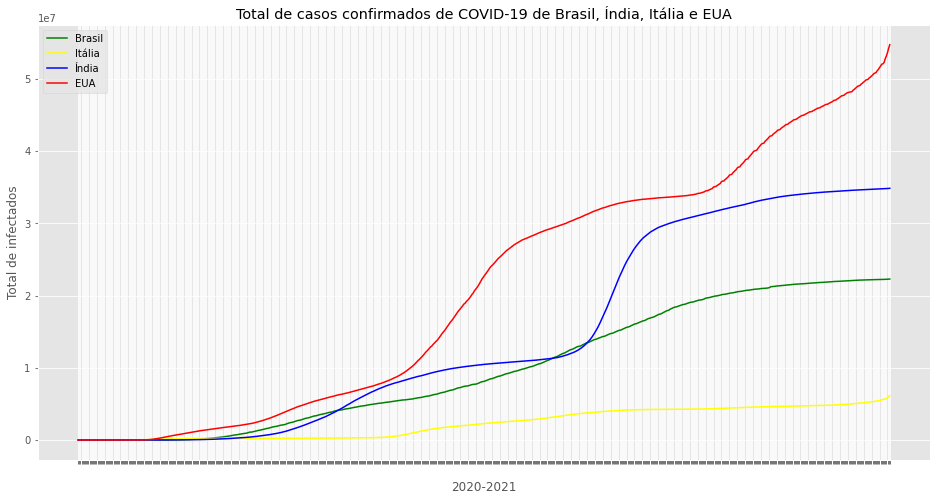

In [3]:
#Visualizando dados completos
plt.figure(figsize=(16,8))
plt.xticks(color='w')
plt.plot(s_brazil.index, s_brazil.values, label = 'Brasil', color = 'green')
plt.plot(s_us.index, s_italy.values, label = 'Itália', color = 'yellow')
plt.plot(s_india.index, s_india.values, label = 'Índia', color = 'blue')
plt.plot(s_us.index, s_us.values, label = 'EUA', color = 'red')
plt.title('Total de casos confirmados de COVID-19 de Brasil, Índia, Itália e EUA', size = 15)
plt.xlabel("2020-2021", size = 15)
plt.ylabel("Total de infectados", size = 15)
plt.legend()
plt.show()

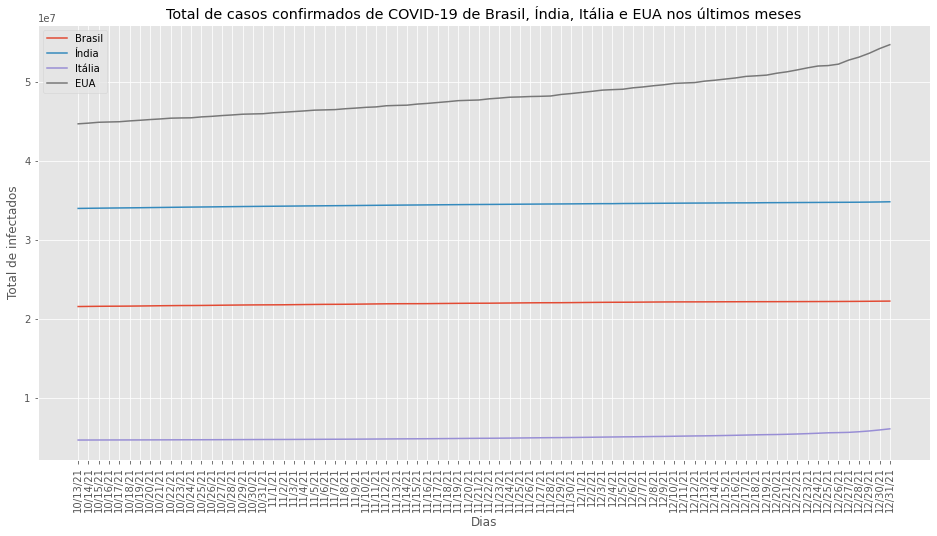

In [4]:
#Visualizando os dados em parte
tam = len(s_brazil)
plt.figure(figsize=(16,8))
plt.xticks(rotation = 90)
plt.plot(s_brazil.index[tam-80:tam], s_brazil.values[tam-80:tam], label = 'Brasil')
plt.plot(s_india.index[tam-80:tam], s_india.values[tam-80:tam], label = 'Índia')
plt.plot(s_italy.index[tam-80:tam], s_italy.values[tam-80:tam], label = 'Itália')
plt.plot(s_us.index[tam-80:tam], s_us.values[tam-80:tam], label = 'EUA')
plt.title('Total de casos confirmados de COVID-19 de Brasil, Índia, Itália e EUA nos últimos meses', size = 15)
plt.xlabel("Dias", size = 15)
plt.ylabel("Total de infectados", size = 15)
plt.legend()
plt.show()

In [5]:
#Exportação de dados totais
s_brazil = s_brazil[s_brazil > 0]
s_india = s_india[s_india > 0]
s_italy = s_italy[s_italy > 0]
s_us = s_us[s_us > 0]
s_brazil.to_csv('datasets/countries/casos_covid19_brazil.csv')
s_india.to_csv('datasets/countries/casos_covid19_india.csv')
s_italy.to_csv('datasets/countries/casos_covid19_italy.csv')
s_us.to_csv('datasets/countries/casos_covid19_us.csv')

# Implementação dos modelos LSTM e MLP



In [6]:
# converter uma matriz de valores em uma matriz de conjunto de dados
def create_dataset(dataset, look_back=1):
	dataX, dataY = [], []
	for i in range(len(dataset)-look_back-1):
		a = dataset[i:(i+look_back), 0]
		dataX.append(a)
		dataY.append(dataset[i + look_back, 0])
	return numpy.array(dataX), numpy.array(dataY)

In [7]:
#Criando dicionários para armazenamento de dados
#Dicionários LSMT
dts = dict() #Dicionário de datasets 
trpp = dict() #Dicionário de treinos
tspp = dict() #Dicionário de testes
trs = dict() #Dicionário de scores de treinos 
tss = dict() #Dicionário de scores de testes
tsm = dict() #Dicionário de MAES

#Valores selecionados (Melhores valores)
strpp = dict() #Dicionário de treinos
stspp = dict() #Dicionário de testes
strs = dict() #Dicionário de scores de treinos 
stss = {'Brasil':(9**15), 'Índia':(9**15), 'EUA':(9**15),'Itália':(9**15)} #Dicionário de scores de testes
stsm = {'Brasil':(9**15), 'Índia':(9**15), 'EUA':(9**15),'Itália':(9**15)} #Dicionário de MAE's Saída

#Dicionários MLP
dtsMLP = dict() #Dicionário de datasets 
trppMLP = dict() #Dicionário de treinos
tsppMLP = dict() #Dicionário de testes
trsMLP = dict() #Dicionário de scores de treinos 
tssMLP = dict() #Dicionário de scores de testes
t_aMLP = dict() #Dicionário de taxa de aprendizagem
tsmMLP = dict() #Dicionário de MAES

#Valores selecionados (Melhores valores)
strppMLP = dict() #Dicionário de treinos
stsppMLP = dict() #Dicionário de testes
strsMLP = dict() #Dicionário de scores de treinos 
stssMLP = {'Brasil':(9**15), 'Índia':(9**15), 'EUA':(9**15),'Itália':(9**15)} #Dicionário de scores de testes
stsmMLP = {'Brasil':(9**15), 'Índia':(9**15), 'EUA':(9**15),'Itália':(9**15)} #Dicionário de MAE's Saída

st_aMLP = dict() #Dicionário de taxa de aprendizagem saída

#Ajustes para seleção LSTM
t_a = dict() #Dicionário de taxa de aprendizagem
dropout = dict() #Dicionário de dropout
n_cel = dict() #Dicionário de número de células
st_a = dict() #Dicionário de taxa de aprendizagem saída
sdropout = dict() #Dicionário de dropout saída
sn_cel = dict() #Dicionário de número de células saída

#Ajustes para seleção MLP
t_a = dict() #Dicionário de taxa de aprendizagem
dropoutMLP = dict() #Dicionário de dropout
n_neu = dict() #Dicionário de número de neurônios
st_aMLP = dict() #Dicionário de taxa de aprendizagem saída
sdropoutMLP = dict() #Dicionário de dropout saída
sn_neu = dict() #Dicionário de número de neurônios

#Armazenando testes para plotagem somente dos testes
testP = dict()
testPMLP = dict()
stestPMLP = dict()
testPred = dict()
testPredMLP = dict()
stestPred = dict()
stestPredMLP = dict()

#Armazenando treinos para plotagem somente dos treinos
trainP = dict()
trainPMLP = dict()
strainPMLP = dict()
trainPred = dict()
trainPredMLP = dict()
strainPred = dict()
strainPredMLP = dict()

In [8]:
country = ['Brasil', 'Índia', 'Itália', 'EUA'] #Lista de países

#Grid Search
T_A = [0.01, 0.05, 0.1, 0.2] #0.01, 0.02, 0,03, 0.06, 0.1, 0.2; 
DROP = [0.01, 0.05, 0.1, 0.2]   #0.05, 0.1, 0.15, 0.2, 0.3, 0.5;
N_C = [200, 300, 400, 600]    #50, 100, 200, 300, 400, 600;
NPC = [8, 16, 32, 64] #Neurônios por camada

#Relizando grade de experimentos
for i in range(len(country)):
    for z in range(len(T_A)):
        for j in range(len(DROP)):
            for k in range(len(N_C)):
                if country[i] == 'Brasil':
                    dataframe = read_csv('datasets/countries/casos_covid19_brazil.csv', usecols=[1], engine='python')
                    dataset = dataframe.values
                    dataset = dataset.astype('float32')
                if country[i] == 'Índia':
                    dataframe = read_csv('datasets/countries/casos_covid19_india.csv', usecols=[1], engine='python')
                    dataset = dataframe.values
                    dataset = dataset.astype('float32')
                if country[i] == 'Itália':
                    dataframe = read_csv('datasets/countries/casos_covid19_italy.csv', usecols=[1], engine='python')
                    dataset = dataframe.values
                    dataset = dataset.astype('float32')
                if country[i] == 'EUA':
                    dataframe = read_csv('datasets/countries/casos_covid19_us.csv', usecols=[1], engine='python')
                    dataset = dataframe.values
                    dataset = dataset.astype('float32')
                
                #LSTM
                
                # Normalizar o dataset
                scaler = MinMaxScaler(feature_range=(0, 1))
                dataset = scaler.fit_transform(dataset)
                # dividir em conjuntos de treinamento e teste
                train_size = int(len(dataset) * 0.67)
                test_size = len(dataset) - train_size
                train, test = dataset[0:train_size,:], dataset[train_size:len(dataset),:]
                # remodelar em X = t e Y = t + 1
                look_back = 1
                trainX, trainY = create_dataset(train, look_back)
                testX, testY = create_dataset(test, look_back)
                # remodelar a entrada para ser [amostras, intervalos de tempo, recursos]
                trainX = numpy.reshape(trainX, (trainX.shape[0], 1, trainX.shape[1]))
                testX = numpy.reshape(testX, (testX.shape[0], 1, testX.shape[1]))
                #Criando modelo
                model = Sequential()
                keras.backend.set_epsilon(1)
                #Adicionando camada LSTM e alguma regularização de Dropout 
                model.add(LSTM(units=int(N_C[k])))
                model.add(Dropout(float(DROP[j])))
                model.add(Dense(units=1, activation='linear'))
                #definindo hiper parâmetros
                adam = keras.optimizers.Adam(learning_rate=float(T_A[z]), beta_1=0.999, beta_2=0.999, amsgrad=False)
                model.compile(loss='mean_squared_error', optimizer='adam')
                model.fit(trainX, trainY, epochs=200, batch_size=40) #Mudar para 300 épocas - fora do grid search
                #fazer previsões
                trainPredict = model.predict(trainX)
                testPredict = model.predict(testX)
                # inverter previsões
                trainPredict = scaler.inverse_transform(trainPredict)
                trainY = scaler.inverse_transform([trainY])
                testPredict = scaler.inverse_transform(testPredict)
                testY = scaler.inverse_transform([testY])
                # calcular raiz quadrada média do erro
                trainScore = math.sqrt(mean_squared_error(trainY[0], trainPredict[:,0]))
                print('Train Score: %.2f RMSE' % (trainScore))
                testScore = math.sqrt(mean_squared_error(testY[0], testPredict[:,0]))
                print('Test Score: %.2f RMSE' % (testScore))
                #Calcular o MAE:
                MAE = mean_absolute_error(testY[0], testPredict[:,0])
                # mudar para treinar previsões para traçar
                trainPredictPlot = numpy.empty_like(dataset)
                trainPredictPlot[:, :] = numpy.nan
                trainPredictPlot[look_back:len(trainPredict)+look_back, :] = trainPredict
                # previsões de teste de deslocamento para plotagem
                testPredictPlot = numpy.empty_like(dataset)
                testPredictPlot[:, :] = numpy.nan
                testPredictPlot[len(trainPredict)+(look_back*2)+1:len(dataset)-1, :] = testPredict
                
                #MLP
                train_size = int(len(dataset) * 0.67)
                test_size = len(dataset) - train_size
                train, test = dataset[0:train_size,:], dataset[train_size:len(dataset),:]
                # remodelar em X = t e Y = t + 1
                look_back = 1
                trainX, trainY = create_dataset(train, look_back)
                testX, testY = create_dataset(test, look_back)
                # remodelar a entrada para ser [amostras, intervalos de tempo, recursos]
                trainX = numpy.reshape(trainX, (trainX.shape[0], 1, trainX.shape[1]))
                testX = numpy.reshape(testX, (testX.shape[0], 1, testX.shape[1]))
                model = Sequential()
                model.add(Dense(NPC[i], activation='sigmoid', input_dim = 1))
                model.add(Dropout(float(DROP[j])))
                model.add(Dense(NPC[i], activation='tanh'))
                model.add(Dropout(float(DROP[j])))
                model.add(Dense(NPC[i], activation='relu'))
                model.add(Dropout(float(DROP[j])))
                model.add(Dense(1))
                adam = keras.optimizers.Adam(learning_rate=float(T_A[z]))
                model.compile(optimizer=adam , loss='mean_squared_error')
                model.fit(trainX, trainY, epochs=200, batch_size = 40)
                #fazer previsões
                trainPredictMLP = model.predict(trainX)
                testPredictMLP = model.predict(testX)
                # inverter previsões
                trainPredictMLP = scaler.inverse_transform(trainPredictMLP)
                trainY = scaler.inverse_transform([trainY])
                testPredictMLP = scaler.inverse_transform(testPredictMLP)
                testY = scaler.inverse_transform([testY])
                # calcular raiz quadrada média do erro
                trainScoreMLP = math.sqrt(mean_squared_error(trainY[0], trainPredictMLP[:,0]))
                print('Train Score MLP: %.2f RMSE' % (trainScoreMLP))
                testScoreMLP = math.sqrt(mean_squared_error(testY[0], testPredictMLP[:,0]))
                print('Test Score MLP: %.2f RMSE' % (testScoreMLP))
                #Calcular o MAE:
                MAEMLP = mean_absolute_error(testY[0], testPredictMLP[:,0])
                # mudar para treinar previsões para traçar
                trainPredictPlotMLP = numpy.empty_like(dataset)
                trainPredictPlotMLP[:, :] = numpy.nan
                trainPredictPlotMLP[look_back:len(trainPredict)+look_back, :] = trainPredict
                # previsões de teste de deslocamento para plotagem
                testPredictPlotMLP = numpy.empty_like(dataset)
                testPredictPlotMLP[:, :] = numpy.nan
                testPredictPlotMLP[len(trainPredict)+(look_back*2)+1:len(dataset)-1, :] = testPredict


                #Armazenando as informações em dicionários LSTM
                tss[country[i]] = testScore
                tsm[country[i]] = MAE
                trpp[country[i]] = trainPredictPlot
                tspp[country[i]] = testPredictPlot
                trs[country[i]] = trainScore
                dts[country[i]] = scaler.inverse_transform(dataset)
                t_a[country[i]] = T_A[z]
                dropout[country[i]] = DROP[j]
                n_cel[country[i]] = N_C[k]
                tsm[country[i]] = MAE
                trainP[country[i]] = scaler.inverse_transform(train)
                testP[country[i]] = scaler.inverse_transform(test)
                trainPred[country[i]] = trainPredict
                testPred[country[i]] = testPredict
                
                if tss[country[i]] < stss[country[i]]: #Condição de verificação dos melhores resultados
                    strpp[country[i]] = trainPredictPlot
                    stspp[country[i]] = testPredictPlot
                    strs[country[i]] = trainScore
                    stss[country[i]] = testScore
                    st_a[country[i]] = T_A[z]
                    sdropout[country[i]] = DROP[j]
                    sn_cel[country[i]] = N_C[k]
                    stsm[country[i]] = MAE
                    strainPred[country[i]] = trainPredict
                    stestPred[country[i]] = testPredict
                    
                #Armazenando as informações em dicionários MLP
                tssMLP[country[i]] = testScoreMLP
                trppMLP[country[i]] = trainPredictPlotMLP
                tsppMLP[country[i]] = testPredictPlotMLP
                trsMLP[country[i]] = trainScoreMLP
                t_aMLP[country[i]] = T_A[z]
                dropoutMLP[country[i]] = DROP[j]
                n_neu[country[i]] = NPC[i]
                tsmMLP[country[i]] = MAEMLP
                trainPredMLP[country[i]] = trainPredictMLP
                testPredMLP[country[i]] = testPredictMLP
                
                if tssMLP[country[i]] < stssMLP[country[i]]: #Condição de verificação dos melhores resultados
                    strppMLP[country[i]] = trainPredictPlotMLP
                    stsppMLP[country[i]] = testPredictPlotMLP
                    strsMLP[country[i]] = trainScoreMLP
                    stssMLP[country[i]] = testScoreMLP
                    st_aMLP[country[i]] = T_A[z]
                    sdropoutMLP[country[i]] = DROP[j]
                    sn_neu[country[i]] = NPC[i]
                    stsmMLP[country[i]] = MAEMLP
                    strainPredMLP[country[i]] = trainPredictMLP
                    stestPredMLP[country[i]] = testPredictMLP

Epoch 1/200
12/12 [==============================] - 0s 2ms/step - loss: 0.0876
Epoch 2/200
12/12 [==============================] - 0s 2ms/step - loss: 0.0529
Epoch 3/200
12/12 [==============================] - 0s 2ms/step - loss: 0.0317
Epoch 4/200
12/12 [==============================] - 0s 2ms/step - loss: 0.0239
Epoch 5/200
12/12 [==============================] - 0s 2ms/step - loss: 0.0210
Epoch 6/200
12/12 [==============================] - 0s 2ms/step - loss: 0.0176
Epoch 7/200
12/12 [==============================] - 0s 2ms/step - loss: 0.0143
Epoch 8/200
12/12 [==============================] - 0s 2ms/step - loss: 0.0113
Epoch 9/200
12/12 [==============================] - 0s 2ms/step - loss: 0.0084
Epoch 10/200
12/12 [==============================] - 0s 2ms/step - loss: 0.0058
Epoch 11/200
12/12 [==============================] - 0s 2ms/step - loss: 0.0037
Epoch 12/200
12/12 [==============================] - 0s 2ms/step - loss: 0.0021
Epoch 13/200
12/12 [=================

12/12 [==============================] - 0s 1ms/step - loss: 1.5784e-05
Epoch 99/200
12/12 [==============================] - 0s 1ms/step - loss: 1.5162e-05
Epoch 100/200
12/12 [==============================] - 0s 1ms/step - loss: 1.4613e-05
Epoch 101/200
12/12 [==============================] - 0s 1ms/step - loss: 1.5316e-05
Epoch 102/200
12/12 [==============================] - 0s 1ms/step - loss: 1.4823e-05
Epoch 103/200
12/12 [==============================] - 0s 1ms/step - loss: 1.5339e-05
Epoch 104/200
12/12 [==============================] - 0s 1ms/step - loss: 1.5697e-05
Epoch 105/200
12/12 [==============================] - 0s 1ms/step - loss: 1.3527e-05
Epoch 106/200
12/12 [==============================] - 0s 1ms/step - loss: 1.5237e-05
Epoch 107/200
12/12 [==============================] - 0s 1ms/step - loss: 1.5883e-05
Epoch 108/200
12/12 [==============================] - 0s 1ms/step - loss: 1.6376e-05
Epoch 109/200
12/12 [==============================] - 0s 2ms/step - 

12/12 [==============================] - 0s 417us/step - loss: 5.9240e-04
Epoch 90/200
12/12 [==============================] - 0s 417us/step - loss: 0.0012
Epoch 91/200
12/12 [==============================] - 0s 417us/step - loss: 7.2086e-04
Epoch 92/200
12/12 [==============================] - 0s 417us/step - loss: 8.3964e-04
Epoch 93/200
12/12 [==============================] - 0s 417us/step - loss: 8.6334e-04
Epoch 94/200
12/12 [==============================] - 0s 417us/step - loss: 7.9900e-04
Epoch 95/200
12/12 [==============================] - 0s 500us/step - loss: 4.4813e-04
Epoch 96/200
12/12 [==============================] - 0s 417us/step - loss: 4.0909e-04
Epoch 97/200
12/12 [==============================] - 0s 500us/step - loss: 7.4091e-04
Epoch 98/200
12/12 [==============================] - 0s 417us/step - loss: 4.9009e-04
Epoch 99/200
12/12 [==============================] - 0s 417us/step - loss: 6.5996e-04
Epoch 100/200
12/12 [==============================] - 0s 50

12/12 [==============================] - 0s 3ms/step - loss: 1.4639e-05
Epoch 78/200
12/12 [==============================] - 0s 3ms/step - loss: 1.6023e-05
Epoch 79/200
12/12 [==============================] - 0s 3ms/step - loss: 1.3861e-05
Epoch 80/200
12/12 [==============================] - 0s 3ms/step - loss: 1.3309e-05
Epoch 81/200
12/12 [==============================] - 0s 3ms/step - loss: 1.2516e-05
Epoch 82/200
12/12 [==============================] - 0s 3ms/step - loss: 1.2455e-05
Epoch 83/200
12/12 [==============================] - 0s 3ms/step - loss: 1.3423e-05
Epoch 84/200
12/12 [==============================] - 0s 3ms/step - loss: 1.2651e-05
Epoch 85/200
12/12 [==============================] - 0s 3ms/step - loss: 1.1853e-05
Epoch 86/200
12/12 [==============================] - 0s 3ms/step - loss: 1.3024e-05
Epoch 87/200
12/12 [==============================] - 0s 3ms/step - loss: 1.1805e-05
Epoch 88/200
12/12 [==============================] - 0s 3ms/step - loss: 1.20

12/12 [==============================] - 0s 417us/step - loss: 7.6888e-04
Epoch 69/200
12/12 [==============================] - 0s 500us/step - loss: 9.5668e-04
Epoch 70/200
12/12 [==============================] - 0s 417us/step - loss: 0.0012
Epoch 71/200
12/12 [==============================] - 0s 417us/step - loss: 7.1359e-04
Epoch 72/200
12/12 [==============================] - 0s 500us/step - loss: 4.5132e-04
Epoch 73/200
12/12 [==============================] - 0s 417us/step - loss: 7.4347e-04
Epoch 74/200
12/12 [==============================] - 0s 417us/step - loss: 0.0013
Epoch 75/200
12/12 [==============================] - 0s 501us/step - loss: 0.0012
Epoch 76/200
12/12 [==============================] - 0s 500us/step - loss: 8.5777e-04
Epoch 77/200
12/12 [==============================] - 0s 417us/step - loss: 8.7518e-04
Epoch 78/200
12/12 [==============================] - 0s 500us/step - loss: 6.6989e-04
Epoch 79/200
12/12 [==============================] - 0s 417us/step 

12/12 [==============================] - 0s 417us/step - loss: 4.1909e-04
Epoch 163/200
12/12 [==============================] - 0s 417us/step - loss: 5.2030e-04
Epoch 164/200
12/12 [==============================] - 0s 417us/step - loss: 4.8214e-04
Epoch 165/200
12/12 [==============================] - 0s 417us/step - loss: 3.0500e-04
Epoch 166/200
12/12 [==============================] - 0s 500us/step - loss: 3.9441e-04
Epoch 167/200
12/12 [==============================] - 0s 417us/step - loss: 5.1667e-04
Epoch 168/200
12/12 [==============================] - 0s 417us/step - loss: 5.8610e-04
Epoch 169/200
12/12 [==============================] - 0s 500us/step - loss: 6.4435e-04
Epoch 170/200
12/12 [==============================] - 0s 417us/step - loss: 4.5931e-04
Epoch 171/200
12/12 [==============================] - 0s 417us/step - loss: 2.9520e-04
Epoch 172/200
12/12 [==============================] - 0s 500us/step - loss: 4.2390e-04
Epoch 173/200
12/12 [=========================

Epoch 57/200
12/12 [==============================] - 0s 5ms/step - loss: 1.2454e-05
Epoch 58/200
12/12 [==============================] - 0s 4ms/step - loss: 1.2219e-05
Epoch 59/200
12/12 [==============================] - 0s 4ms/step - loss: 1.2436e-05
Epoch 60/200
12/12 [==============================] - 0s 4ms/step - loss: 1.3363e-05
Epoch 61/200
12/12 [==============================] - 0s 4ms/step - loss: 1.2434e-05
Epoch 62/200
12/12 [==============================] - 0s 4ms/step - loss: 1.1923e-05
Epoch 63/200
12/12 [==============================] - 0s 4ms/step - loss: 1.2424e-05
Epoch 64/200
12/12 [==============================] - 0s 4ms/step - loss: 1.2496e-05
Epoch 65/200
12/12 [==============================] - 0s 5ms/step - loss: 1.0323e-05
Epoch 66/200
12/12 [==============================] - 0s 4ms/step - loss: 1.2169e-05
Epoch 67/200
12/12 [==============================] - 0s 5ms/step - loss: 1.1051e-05
Epoch 68/200
12/12 [==============================] - 0s 4ms/step

12/12 [==============================] - 0s 500us/step - loss: 0.0022
Epoch 49/200
12/12 [==============================] - 0s 417us/step - loss: 0.0021
Epoch 50/200
12/12 [==============================] - 0s 500us/step - loss: 0.0037
Epoch 51/200
12/12 [==============================] - 0s 417us/step - loss: 0.0024
Epoch 52/200
12/12 [==============================] - 0s 500us/step - loss: 0.0014
Epoch 53/200
12/12 [==============================] - 0s 500us/step - loss: 0.0040
Epoch 54/200
12/12 [==============================] - 0s 417us/step - loss: 0.0016
Epoch 55/200
12/12 [==============================] - 0s 500us/step - loss: 0.0024
Epoch 56/200
12/12 [==============================] - 0s 417us/step - loss: 0.0043
Epoch 57/200
12/12 [==============================] - 0s 417us/step - loss: 0.0029
Epoch 58/200
12/12 [==============================] - 0s 500us/step - loss: 0.0038
Epoch 59/200
12/12 [==============================] - 0s 417us/step - loss: 0.0031
Epoch 60/200
12/1

12/12 [==============================] - 0s 417us/step - loss: 5.3657e-04
Epoch 146/200
12/12 [==============================] - 0s 500us/step - loss: 8.6482e-04
Epoch 147/200
12/12 [==============================] - 0s 417us/step - loss: 9.4143e-04
Epoch 148/200
12/12 [==============================] - 0s 417us/step - loss: 0.0014
Epoch 149/200
12/12 [==============================] - 0s 495us/step - loss: 4.6406e-04
Epoch 150/200
12/12 [==============================] - 0s 417us/step - loss: 0.0011
Epoch 151/200
12/12 [==============================] - 0s 500us/step - loss: 5.0153e-04
Epoch 152/200
12/12 [==============================] - 0s 417us/step - loss: 0.0015
Epoch 153/200
12/12 [==============================] - 0s 500us/step - loss: 5.6239e-04
Epoch 154/200
12/12 [==============================] - 0s 417us/step - loss: 0.0011
Epoch 155/200
12/12 [==============================] - 0s 417us/step - loss: 0.0011
Epoch 156/200
12/12 [==============================] - 0s 501us/st

12/12 [==============================] - 0s 9ms/step - loss: 1.0005e-05
Epoch 41/200
12/12 [==============================] - 0s 9ms/step - loss: 9.8541e-06
Epoch 42/200
12/12 [==============================] - 0s 9ms/step - loss: 9.9666e-06
Epoch 43/200
12/12 [==============================] - 0s 9ms/step - loss: 9.9842e-06
Epoch 44/200
12/12 [==============================] - 0s 9ms/step - loss: 1.0579e-05
Epoch 45/200
12/12 [==============================] - 0s 9ms/step - loss: 9.9353e-06
Epoch 46/200
12/12 [==============================] - 0s 8ms/step - loss: 9.4788e-06
Epoch 47/200
12/12 [==============================] - 0s 9ms/step - loss: 1.1330e-05
Epoch 48/200
12/12 [==============================] - 0s 9ms/step - loss: 9.5828e-06
Epoch 49/200
12/12 [==============================] - 0s 8ms/step - loss: 9.4506e-06
Epoch 50/200
12/12 [==============================] - 0s 9ms/step - loss: 9.3797e-06
Epoch 51/200
12/12 [==============================] - 0s 9ms/step - loss: 9.69

12/12 [==============================] - 0s 8ms/step - loss: 5.7004e-06
Epoch 137/200
12/12 [==============================] - 0s 8ms/step - loss: 3.6447e-06
Epoch 138/200
12/12 [==============================] - 0s 9ms/step - loss: 3.5934e-06
Epoch 139/200
12/12 [==============================] - 0s 9ms/step - loss: 4.1006e-06
Epoch 140/200
12/12 [==============================] - 0s 9ms/step - loss: 3.9940e-06
Epoch 141/200
12/12 [==============================] - 0s 9ms/step - loss: 3.6184e-06
Epoch 142/200
12/12 [==============================] - 0s 9ms/step - loss: 4.3816e-06
Epoch 143/200
12/12 [==============================] - 0s 9ms/step - loss: 4.3479e-06
Epoch 144/200
12/12 [==============================] - 0s 9ms/step - loss: 4.6838e-06
Epoch 145/200
12/12 [==============================] - 0s 9ms/step - loss: 4.1539e-06
Epoch 146/200
12/12 [==============================] - 0s 8ms/step - loss: 4.0510e-06
Epoch 147/200
12/12 [==============================] - 0s 9ms/step -

Epoch 32/200
12/12 [==============================] - 0s 417us/step - loss: 0.0025
Epoch 33/200
12/12 [==============================] - 0s 500us/step - loss: 0.0012
Epoch 34/200
12/12 [==============================] - 0s 417us/step - loss: 0.0015
Epoch 35/200
12/12 [==============================] - 0s 500us/step - loss: 0.0015
Epoch 36/200
12/12 [==============================] - 0s 500us/step - loss: 0.0016
Epoch 37/200
12/12 [==============================] - 0s 500us/step - loss: 0.0023
Epoch 38/200
12/12 [==============================] - 0s 500us/step - loss: 0.0017
Epoch 39/200
12/12 [==============================] - 0s 417us/step - loss: 0.0018
Epoch 40/200
12/12 [==============================] - 0s 417us/step - loss: 0.0015
Epoch 41/200
12/12 [==============================] - 0s 500us/step - loss: 0.0019
Epoch 42/200
12/12 [==============================] - 0s 417us/step - loss: 0.0011
Epoch 43/200
12/12 [==============================] - 0s 417us/step - loss: 0.0014
Epoc

12/12 [==============================] - 0s 2ms/step - loss: 6.7567e-05
Epoch 22/200
12/12 [==============================] - 0s 2ms/step - loss: 7.1898e-05
Epoch 23/200
12/12 [==============================] - 0s 2ms/step - loss: 6.4564e-05
Epoch 24/200
12/12 [==============================] - 0s 2ms/step - loss: 7.3914e-05
Epoch 25/200
12/12 [==============================] - 0s 2ms/step - loss: 7.3694e-05
Epoch 26/200
12/12 [==============================] - 0s 2ms/step - loss: 6.2457e-05
Epoch 27/200
12/12 [==============================] - 0s 2ms/step - loss: 7.1086e-05
Epoch 28/200
12/12 [==============================] - 0s 1ms/step - loss: 7.8065e-05
Epoch 29/200
12/12 [==============================] - 0s 2ms/step - loss: 7.5320e-05
Epoch 30/200
12/12 [==============================] - 0s 2ms/step - loss: 7.0715e-05
Epoch 31/200
12/12 [==============================] - 0s 1ms/step - loss: 7.1622e-05
Epoch 32/200
12/12 [==============================] - 0s 1ms/step - loss: 6.72

12/12 [==============================] - 0s 417us/step - loss: 0.0100
Epoch 13/200
12/12 [==============================] - 0s 500us/step - loss: 0.0079
Epoch 14/200
12/12 [==============================] - 0s 417us/step - loss: 0.0066
Epoch 15/200
12/12 [==============================] - 0s 501us/step - loss: 0.0069
Epoch 16/200
12/12 [==============================] - 0s 501us/step - loss: 0.0075
Epoch 17/200
12/12 [==============================] - 0s 500us/step - loss: 0.0058
Epoch 18/200
12/12 [==============================] - 0s 417us/step - loss: 0.0062
Epoch 19/200
12/12 [==============================] - 0s 500us/step - loss: 0.0063
Epoch 20/200
12/12 [==============================] - 0s 500us/step - loss: 0.0058
Epoch 21/200
12/12 [==============================] - 0s 417us/step - loss: 0.0045
Epoch 22/200
12/12 [==============================] - 0s 500us/step - loss: 0.0054
Epoch 23/200
12/12 [==============================] - 0s 500us/step - loss: 0.0045
Epoch 24/200
12/1

12/12 [==============================] - 0s 3ms/step - loss: 0.0104
Epoch 8/200
12/12 [==============================] - 0s 3ms/step - loss: 0.0071
Epoch 9/200
12/12 [==============================] - 0s 3ms/step - loss: 0.0044
Epoch 10/200
12/12 [==============================] - 0s 3ms/step - loss: 0.0023
Epoch 11/200
12/12 [==============================] - 0s 3ms/step - loss: 9.7870e-04
Epoch 12/200
12/12 [==============================] - 0s 3ms/step - loss: 3.4325e-04
Epoch 13/200
12/12 [==============================] - 0s 3ms/step - loss: 1.1385e-04
Epoch 14/200
12/12 [==============================] - 0s 3ms/step - loss: 4.8566e-05
Epoch 15/200
12/12 [==============================] - 0s 3ms/step - loss: 5.0058e-05
Epoch 16/200
12/12 [==============================] - 0s 3ms/step - loss: 5.2565e-05
Epoch 17/200
12/12 [==============================] - 0s 3ms/step - loss: 4.1297e-05
Epoch 18/200
12/12 [==============================] - 0s 2ms/step - loss: 4.1420e-05
Epoch 19/20

12/12 [==============================] - 0s 2ms/step - loss: 2.5001e-05
Epoch 199/200
12/12 [==============================] - 0s 2ms/step - loss: 2.6194e-05
Epoch 200/200
12/12 [==============================] - 0s 2ms/step - loss: 2.3113e-05
Train Score: 20253.03 RMSE
Test Score: 90809.88 RMSE
Epoch 1/200
12/12 [==============================] - 0s 501us/step - loss: 0.0611
Epoch 2/200
12/12 [==============================] - 0s 417us/step - loss: 0.0472
Epoch 3/200
12/12 [==============================] - 0s 417us/step - loss: 0.0451
Epoch 4/200
12/12 [==============================] - 0s 500us/step - loss: 0.0409
Epoch 5/200
12/12 [==============================] - 0s 500us/step - loss: 0.0375
Epoch 6/200
12/12 [==============================] - 0s 500us/step - loss: 0.0325
Epoch 7/200
12/12 [==============================] - 0s 417us/step - loss: 0.0228
Epoch 8/200
12/12 [==============================] - 0s 417us/step - loss: 0.0173
Epoch 9/200
12/12 [============================

12/12 [==============================] - 0s 417us/step - loss: 0.0016
Epoch 194/200
12/12 [==============================] - 0s 500us/step - loss: 0.0019
Epoch 195/200
12/12 [==============================] - 0s 417us/step - loss: 0.0013
Epoch 196/200
12/12 [==============================] - 0s 500us/step - loss: 0.0017
Epoch 197/200
12/12 [==============================] - 0s 417us/step - loss: 0.0013
Epoch 198/200
12/12 [==============================] - 0s 417us/step - loss: 0.0017
Epoch 199/200
12/12 [==============================] - 0s 500us/step - loss: 0.0015
Epoch 200/200
12/12 [==============================] - 0s 501us/step - loss: 0.0014
Train Score MLP: 846855.51 RMSE
Test Score MLP: 3510016.28 RMSE
Epoch 1/200
12/12 [==============================] - 0s 5ms/step - loss: 0.0832
Epoch 2/200
12/12 [==============================] - 0s 4ms/step - loss: 0.0414
Epoch 3/200
12/12 [==============================] - 0s 4ms/step - loss: 0.0245
Epoch 4/200
12/12 [===================

12/12 [==============================] - 0s 5ms/step - loss: 2.2639e-05
Epoch 185/200
12/12 [==============================] - 0s 4ms/step - loss: 2.2076e-05
Epoch 186/200
12/12 [==============================] - 0s 5ms/step - loss: 2.6462e-05
Epoch 187/200
12/12 [==============================] - 0s 5ms/step - loss: 1.9777e-05
Epoch 188/200
12/12 [==============================] - 0s 4ms/step - loss: 2.2636e-05
Epoch 189/200
12/12 [==============================] - 0s 4ms/step - loss: 2.1280e-05
Epoch 190/200
12/12 [==============================] - 0s 4ms/step - loss: 1.9549e-05
Epoch 191/200
12/12 [==============================] - 0s 4ms/step - loss: 1.8541e-05
Epoch 192/200
12/12 [==============================] - ETA: 0s - loss: 1.9451e-0 - 0s 5ms/step - loss: 1.9380e-05
Epoch 193/200
12/12 [==============================] - 0s 5ms/step - loss: 1.8013e-05
Epoch 194/200
12/12 [==============================] - 0s 5ms/step - loss: 2.0210e-05
Epoch 195/200
12/12 [===================

12/12 [==============================] - 0s 417us/step - loss: 0.0039
Epoch 82/200
12/12 [==============================] - 0s 500us/step - loss: 0.0035
Epoch 83/200
12/12 [==============================] - 0s 417us/step - loss: 0.0034
Epoch 84/200
12/12 [==============================] - 0s 500us/step - loss: 0.0040
Epoch 85/200
12/12 [==============================] - 0s 417us/step - loss: 0.0028
Epoch 86/200
12/12 [==============================] - 0s 417us/step - loss: 0.0036
Epoch 87/200
12/12 [==============================] - 0s 417us/step - loss: 0.0047
Epoch 88/200
12/12 [==============================] - 0s 417us/step - loss: 0.0041
Epoch 89/200
12/12 [==============================] - 0s 501us/step - loss: 0.0031
Epoch 90/200
12/12 [==============================] - 0s 500us/step - loss: 0.0033
Epoch 91/200
12/12 [==============================] - 0s 500us/step - loss: 0.0033
Epoch 92/200
12/12 [==============================] - 0s 417us/step - loss: 0.0024
Epoch 93/200
12/1

12/12 [==============================] - 0s 8ms/step - loss: 1.8475e-05
Epoch 75/200
12/12 [==============================] - 0s 8ms/step - loss: 1.6803e-05
Epoch 76/200
12/12 [==============================] - 0s 9ms/step - loss: 1.5940e-05
Epoch 77/200
12/12 [==============================] - 0s 9ms/step - loss: 1.8856e-05
Epoch 78/200
12/12 [==============================] - 0s 8ms/step - loss: 1.7825e-05
Epoch 79/200
12/12 [==============================] - 0s 8ms/step - loss: 1.7912e-05
Epoch 80/200
12/12 [==============================] - 0s 9ms/step - loss: 1.7908e-05
Epoch 81/200
12/12 [==============================] - 0s 8ms/step - loss: 1.7643e-05
Epoch 82/200
12/12 [==============================] - 0s 8ms/step - loss: 1.8395e-05
Epoch 83/200
12/12 [==============================] - 0s 9ms/step - loss: 1.9986e-05
Epoch 84/200
12/12 [==============================] - 0s 8ms/step - loss: 1.8403e-05
Epoch 85/200
12/12 [==============================] - 0s 9ms/step - loss: 1.92

12/12 [==============================] - 0s 501us/step - loss: 0.0055
Epoch 67/200
12/12 [==============================] - 0s 500us/step - loss: 0.0052
Epoch 68/200
12/12 [==============================] - 0s 417us/step - loss: 0.0047
Epoch 69/200
12/12 [==============================] - 0s 500us/step - loss: 0.0050
Epoch 70/200
12/12 [==============================] - 0s 500us/step - loss: 0.0050
Epoch 71/200
12/12 [==============================] - 0s 417us/step - loss: 0.0042
Epoch 72/200
12/12 [==============================] - 0s 417us/step - loss: 0.0043
Epoch 73/200
12/12 [==============================] - 0s 417us/step - loss: 0.0033
Epoch 74/200
12/12 [==============================] - 0s 417us/step - loss: 0.0033
Epoch 75/200
12/12 [==============================] - 0s 500us/step - loss: 0.0041
Epoch 76/200
12/12 [==============================] - 0s 500us/step - loss: 0.0035
Epoch 77/200
12/12 [==============================] - 0s 417us/step - loss: 0.0036
Epoch 78/200
12/1

12/12 [==============================] - 0s 417us/step - loss: 0.0019
Epoch 165/200
12/12 [==============================] - 0s 500us/step - loss: 0.0021
Epoch 166/200
12/12 [==============================] - 0s 500us/step - loss: 0.0016
Epoch 167/200
12/12 [==============================] - 0s 417us/step - loss: 0.0017
Epoch 168/200
12/12 [==============================] - 0s 500us/step - loss: 0.0022
Epoch 169/200
12/12 [==============================] - 0s 417us/step - loss: 0.0019
Epoch 170/200
12/12 [==============================] - 0s 417us/step - loss: 0.0023
Epoch 171/200
12/12 [==============================] - 0s 500us/step - loss: 0.0017
Epoch 172/200
12/12 [==============================] - 0s 417us/step - loss: 0.0017
Epoch 173/200
12/12 [==============================] - 0s 417us/step - loss: 0.0031
Epoch 174/200
12/12 [==============================] - 0s 500us/step - loss: 0.0015
Epoch 175/200
12/12 [==============================] - 0s 500us/step - loss: 0.0024
Epoch 

Epoch 61/200
12/12 [==============================] - 0s 2ms/step - loss: 1.0866e-04
Epoch 62/200
12/12 [==============================] - 0s 2ms/step - loss: 1.1959e-04
Epoch 63/200
12/12 [==============================] - 0s 2ms/step - loss: 1.0073e-04
Epoch 64/200
12/12 [==============================] - 0s 2ms/step - loss: 1.0750e-04
Epoch 65/200
12/12 [==============================] - 0s 2ms/step - loss: 9.3598e-05
Epoch 66/200
12/12 [==============================] - 0s 2ms/step - loss: 1.0604e-04
Epoch 67/200
12/12 [==============================] - 0s 2ms/step - loss: 1.0593e-04
Epoch 68/200
12/12 [==============================] - 0s 2ms/step - loss: 1.1057e-04
Epoch 69/200
12/12 [==============================] - 0s 2ms/step - loss: 1.1012e-04
Epoch 70/200
12/12 [==============================] - 0s 2ms/step - loss: 9.6751e-05
Epoch 71/200
12/12 [==============================] - 0s 2ms/step - loss: 1.1662e-04
Epoch 72/200
12/12 [==============================] - 0s 2ms/step

12/12 [==============================] - 0s 500us/step - loss: 0.0082
Epoch 53/200
12/12 [==============================] - 0s 417us/step - loss: 0.0065
Epoch 54/200
12/12 [==============================] - 0s 500us/step - loss: 0.0058
Epoch 55/200
12/12 [==============================] - 0s 417us/step - loss: 0.0070
Epoch 56/200
12/12 [==============================] - 0s 501us/step - loss: 0.0060
Epoch 57/200
12/12 [==============================] - 0s 417us/step - loss: 0.0053
Epoch 58/200
12/12 [==============================] - 0s 417us/step - loss: 0.0073
Epoch 59/200
12/12 [==============================] - 0s 500us/step - loss: 0.0052
Epoch 60/200
12/12 [==============================] - 0s 417us/step - loss: 0.0058
Epoch 61/200
12/12 [==============================] - 0s 417us/step - loss: 0.0060
Epoch 62/200
12/12 [==============================] - 0s 500us/step - loss: 0.0054
Epoch 63/200
12/12 [==============================] - 0s 500us/step - loss: 0.0056
Epoch 64/200
12/1

12/12 [==============================] - 0s 3ms/step - loss: 8.7162e-05
Epoch 48/200
12/12 [==============================] - 0s 3ms/step - loss: 8.6136e-05
Epoch 49/200
12/12 [==============================] - 0s 3ms/step - loss: 8.3741e-05
Epoch 50/200
12/12 [==============================] - 0s 3ms/step - loss: 7.5254e-05
Epoch 51/200
12/12 [==============================] - 0s 3ms/step - loss: 8.2371e-05
Epoch 52/200
12/12 [==============================] - 0s 3ms/step - loss: 7.0429e-05
Epoch 53/200
12/12 [==============================] - 0s 3ms/step - loss: 8.0076e-05
Epoch 54/200
12/12 [==============================] - 0s 3ms/step - loss: 7.9009e-05
Epoch 55/200
12/12 [==============================] - 0s 3ms/step - loss: 8.2304e-05
Epoch 56/200
12/12 [==============================] - 0s 2ms/step - loss: 7.5339e-05
Epoch 57/200
12/12 [==============================] - 0s 3ms/step - loss: 7.2610e-05
Epoch 58/200
12/12 [==============================] - 0s 3ms/step - loss: 7.19

12/12 [==============================] - 0s 3ms/step - loss: 4.1940e-05
Epoch 144/200
12/12 [==============================] - 0s 3ms/step - loss: 4.5338e-05
Epoch 145/200
12/12 [==============================] - 0s 3ms/step - loss: 5.4726e-05
Epoch 146/200
12/12 [==============================] - 0s 3ms/step - loss: 5.4157e-05
Epoch 147/200
12/12 [==============================] - 0s 3ms/step - loss: 6.1500e-05
Epoch 148/200
12/12 [==============================] - 0s 3ms/step - loss: 5.0579e-05
Epoch 149/200
12/12 [==============================] - 0s 3ms/step - loss: 5.5396e-05
Epoch 150/200
12/12 [==============================] - 0s 3ms/step - loss: 6.3286e-05
Epoch 151/200
12/12 [==============================] - 0s 3ms/step - loss: 5.7764e-05
Epoch 152/200
12/12 [==============================] - 0s 3ms/step - loss: 5.8476e-05
Epoch 153/200
12/12 [==============================] - 0s 3ms/step - loss: 5.1816e-05
Epoch 154/200
12/12 [==============================] - 0s 3ms/step -

Epoch 36/200
12/12 [==============================] - 0s 501us/step - loss: 0.0126
Epoch 37/200
12/12 [==============================] - 0s 417us/step - loss: 0.0140
Epoch 38/200
12/12 [==============================] - 0s 417us/step - loss: 0.0136
Epoch 39/200
12/12 [==============================] - 0s 500us/step - loss: 0.0117
Epoch 40/200
12/12 [==============================] - 0s 417us/step - loss: 0.0128
Epoch 41/200
12/12 [==============================] - 0s 417us/step - loss: 0.0127
Epoch 42/200
12/12 [==============================] - 0s 417us/step - loss: 0.0144
Epoch 43/200
12/12 [==============================] - 0s 500us/step - loss: 0.0124
Epoch 44/200
12/12 [==============================] - 0s 417us/step - loss: 0.0127
Epoch 45/200
12/12 [==============================] - 0s 500us/step - loss: 0.0123
Epoch 46/200
12/12 [==============================] - 0s 500us/step - loss: 0.0125
Epoch 47/200
12/12 [==============================] - 0s 417us/step - loss: 0.0122
Epoc

12/12 [==============================] - 0s 4ms/step - loss: 6.3237e-05
Epoch 32/200
12/12 [==============================] - 0s 5ms/step - loss: 6.0799e-05
Epoch 33/200
12/12 [==============================] - 0s 5ms/step - loss: 6.3248e-05
Epoch 34/200
12/12 [==============================] - 0s 4ms/step - loss: 7.3004e-05
Epoch 35/200
12/12 [==============================] - 0s 5ms/step - loss: 6.2182e-05
Epoch 36/200
12/12 [==============================] - 0s 5ms/step - loss: 6.4001e-05
Epoch 37/200
12/12 [==============================] - 0s 4ms/step - loss: 4.7309e-05
Epoch 38/200
12/12 [==============================] - 0s 5ms/step - loss: 5.8224e-05
Epoch 39/200
12/12 [==============================] - 0s 4ms/step - loss: 5.9928e-05
Epoch 40/200
12/12 [==============================] - 0s 4ms/step - loss: 5.4841e-05
Epoch 41/200
12/12 [==============================] - 0s 4ms/step - loss: 5.7944e-05
Epoch 42/200
12/12 [==============================] - 0s 5ms/step - loss: 5.39

12/12 [==============================] - 0s 417us/step - loss: 0.0099
Epoch 23/200
12/12 [==============================] - 0s 501us/step - loss: 0.0113
Epoch 24/200
12/12 [==============================] - 0s 500us/step - loss: 0.0106
Epoch 25/200
12/12 [==============================] - 0s 500us/step - loss: 0.0084
Epoch 26/200
12/12 [==============================] - 0s 417us/step - loss: 0.0087
Epoch 27/200
12/12 [==============================] - 0s 417us/step - loss: 0.0079
Epoch 28/200
12/12 [==============================] - 0s 417us/step - loss: 0.0077
Epoch 29/200
12/12 [==============================] - 0s 417us/step - loss: 0.0097
Epoch 30/200
12/12 [==============================] - 0s 417us/step - loss: 0.0076
Epoch 31/200
12/12 [==============================] - 0s 500us/step - loss: 0.0074
Epoch 32/200
12/12 [==============================] - 0s 417us/step - loss: 0.0068
Epoch 33/200
12/12 [==============================] - 0s 500us/step - loss: 0.0085
Epoch 34/200
12/1

12/12 [==============================] - 0s 9ms/step - loss: 4.6830e-05
Epoch 18/200
12/12 [==============================] - 0s 8ms/step - loss: 4.6830e-05
Epoch 19/200
12/12 [==============================] - 0s 9ms/step - loss: 5.0856e-05
Epoch 20/200
12/12 [==============================] - 0s 8ms/step - loss: 5.6890e-05
Epoch 21/200
12/12 [==============================] - 0s 9ms/step - loss: 5.6620e-05
Epoch 22/200
12/12 [==============================] - 0s 8ms/step - loss: 3.9805e-05
Epoch 23/200
12/12 [==============================] - 0s 9ms/step - loss: 4.2950e-05
Epoch 24/200
12/12 [==============================] - 0s 8ms/step - loss: 4.0696e-05
Epoch 25/200
12/12 [==============================] - 0s 9ms/step - loss: 4.0827e-05
Epoch 26/200
12/12 [==============================] - 0s 9ms/step - loss: 4.8270e-05
Epoch 27/200
12/12 [==============================] - 0s 8ms/step - loss: 4.1912e-05
Epoch 28/200
12/12 [==============================] - 0s 8ms/step - loss: 4.05

12/12 [==============================] - 0s 8ms/step - loss: 2.8538e-05
Epoch 114/200
12/12 [==============================] - 0s 9ms/step - loss: 3.8329e-05
Epoch 115/200
12/12 [==============================] - 0s 9ms/step - loss: 3.5592e-05
Epoch 116/200
12/12 [==============================] - 0s 8ms/step - loss: 3.5609e-05
Epoch 117/200
12/12 [==============================] - 0s 9ms/step - loss: 3.5112e-05
Epoch 118/200
12/12 [==============================] - 0s 9ms/step - loss: 3.6692e-05
Epoch 119/200
12/12 [==============================] - 0s 9ms/step - loss: 2.5572e-05
Epoch 120/200
12/12 [==============================] - 0s 8ms/step - loss: 3.3511e-05
Epoch 121/200
12/12 [==============================] - 0s 8ms/step - loss: 2.4611e-05
Epoch 122/200
12/12 [==============================] - 0s 8ms/step - loss: 3.1529e-05
Epoch 123/200
12/12 [==============================] - 0s 9ms/step - loss: 2.6525e-05
Epoch 124/200
12/12 [==============================] - 0s 9ms/step -

12/12 [==============================] - 0s 417us/step - loss: 0.0361
Epoch 9/200
12/12 [==============================] - 0s 417us/step - loss: 0.0360
Epoch 10/200
12/12 [==============================] - 0s 417us/step - loss: 0.0290
Epoch 11/200
12/12 [==============================] - 0s 500us/step - loss: 0.0313
Epoch 12/200
12/12 [==============================] - 0s 417us/step - loss: 0.0264
Epoch 13/200
12/12 [==============================] - 0s 500us/step - loss: 0.0215
Epoch 14/200
12/12 [==============================] - 0s 417us/step - loss: 0.0252
Epoch 15/200
12/12 [==============================] - 0s 417us/step - loss: 0.0247
Epoch 16/200
12/12 [==============================] - 0s 500us/step - loss: 0.0224
Epoch 17/200
12/12 [==============================] - 0s 500us/step - loss: 0.0214
Epoch 18/200
12/12 [==============================] - 0s 500us/step - loss: 0.0148
Epoch 19/200
12/12 [==============================] - 0s 417us/step - loss: 0.0192
Epoch 20/200
12/12

12/12 [==============================] - 0s 2ms/step - loss: 0.0332
Epoch 4/200
12/12 [==============================] - 0s 2ms/step - loss: 0.0250
Epoch 5/200
12/12 [==============================] - 0s 2ms/step - loss: 0.0225
Epoch 6/200
12/12 [==============================] - 0s 2ms/step - loss: 0.0191
Epoch 7/200
12/12 [==============================] - 0s 2ms/step - loss: 0.0157
Epoch 8/200
12/12 [==============================] - 0s 2ms/step - loss: 0.0127
Epoch 9/200
12/12 [==============================] - 0s 2ms/step - loss: 0.0096
Epoch 10/200
12/12 [==============================] - 0s 2ms/step - loss: 0.0067
Epoch 11/200
12/12 [==============================] - 0s 2ms/step - loss: 0.0046
Epoch 12/200
12/12 [==============================] - 0s 2ms/step - loss: 0.0030
Epoch 13/200
12/12 [==============================] - 0s 2ms/step - loss: 0.0016
Epoch 14/200
12/12 [==============================] - 0s 2ms/step - loss: 8.3560e-04
Epoch 15/200
12/12 [=======================

12/12 [==============================] - 0s 1ms/step - loss: 2.0948e-04
Epoch 101/200
12/12 [==============================] - 0s 1ms/step - loss: 1.7885e-04
Epoch 102/200
12/12 [==============================] - 0s 1ms/step - loss: 1.8604e-04
Epoch 103/200
12/12 [==============================] - 0s 1ms/step - loss: 1.4039e-04
Epoch 104/200
12/12 [==============================] - 0s 1ms/step - loss: 1.5832e-04
Epoch 105/200
12/12 [==============================] - 0s 1ms/step - loss: 2.1667e-04
Epoch 106/200
12/12 [==============================] - 0s 1ms/step - loss: 1.6300e-04
Epoch 107/200
12/12 [==============================] - 0s 2ms/step - loss: 1.9240e-04
Epoch 108/200
12/12 [==============================] - 0s 2ms/step - loss: 1.7831e-04
Epoch 109/200
12/12 [==============================] - 0s 1ms/step - loss: 1.9210e-04
Epoch 110/200
12/12 [==============================] - 0s 1ms/step - loss: 1.6961e-04
Epoch 111/200
12/12 [==============================] - 0s 2ms/step -

12/12 [==============================] - 0s 1ms/step - loss: 1.4759e-04
Epoch 196/200
12/12 [==============================] - 0s 1ms/step - loss: 1.3572e-04
Epoch 197/200
12/12 [==============================] - 0s 1ms/step - loss: 1.2001e-04
Epoch 198/200
12/12 [==============================] - 0s 1ms/step - loss: 1.7569e-04
Epoch 199/200
12/12 [==============================] - 0s 1ms/step - loss: 1.6094e-04
Epoch 200/200
12/12 [==============================] - 0s 1ms/step - loss: 1.2509e-04
Train Score: 36165.60 RMSE
Test Score: 119918.35 RMSE
Epoch 1/200
12/12 [==============================] - 0s 500us/step - loss: 0.1866
Epoch 2/200
12/12 [==============================] - 0s 500us/step - loss: 0.0772
Epoch 3/200
12/12 [==============================] - 0s 500us/step - loss: 0.0577
Epoch 4/200
12/12 [==============================] - 0s 417us/step - loss: 0.0515
Epoch 5/200
12/12 [==============================] - 0s 417us/step - loss: 0.0484
Epoch 6/200
12/12 [===============

12/12 [==============================] - 0s 500us/step - loss: 0.0081
Epoch 94/200
12/12 [==============================] - 0s 500us/step - loss: 0.0092
Epoch 95/200
12/12 [==============================] - 0s 500us/step - loss: 0.0088
Epoch 96/200
12/12 [==============================] - 0s 417us/step - loss: 0.0075
Epoch 97/200
12/12 [==============================] - 0s 500us/step - loss: 0.0087
Epoch 98/200
12/12 [==============================] - 0s 500us/step - loss: 0.0099
Epoch 99/200
12/12 [==============================] - 0s 500us/step - loss: 0.0096
Epoch 100/200
12/12 [==============================] - 0s 500us/step - loss: 0.0080
Epoch 101/200
12/12 [==============================] - 0s 500us/step - loss: 0.0091
Epoch 102/200
12/12 [==============================] - 0s 417us/step - loss: 0.0077
Epoch 103/200
12/12 [==============================] - 0s 417us/step - loss: 0.0078
Epoch 104/200
12/12 [==============================] - 0s 500us/step - loss: 0.0073
Epoch 105/20

12/12 [==============================] - 0s 2ms/step - loss: 1.6695e-04
Epoch 87/200
12/12 [==============================] - 0s 3ms/step - loss: 1.4008e-04
Epoch 88/200
12/12 [==============================] - 0s 2ms/step - loss: 1.2416e-04
Epoch 89/200
12/12 [==============================] - 0s 3ms/step - loss: 1.2995e-04
Epoch 90/200
12/12 [==============================] - 0s 3ms/step - loss: 1.1919e-04
Epoch 91/200
12/12 [==============================] - 0s 3ms/step - loss: 1.3294e-04
Epoch 92/200
12/12 [==============================] - 0s 2ms/step - loss: 1.3597e-04
Epoch 93/200
12/12 [==============================] - 0s 2ms/step - loss: 1.3438e-04
Epoch 94/200
12/12 [==============================] - 0s 2ms/step - loss: 1.3960e-04
Epoch 95/200
12/12 [==============================] - 0s 2ms/step - loss: 1.3117e-04
Epoch 96/200
12/12 [==============================] - 0s 3ms/step - loss: 1.4123e-04
Epoch 97/200
12/12 [==============================] - 0s 3ms/step - loss: 1.34

12/12 [==============================] - 0s 417us/step - loss: 0.0084
Epoch 79/200
12/12 [==============================] - 0s 417us/step - loss: 0.0074
Epoch 80/200
12/12 [==============================] - 0s 417us/step - loss: 0.0105
Epoch 81/200
12/12 [==============================] - 0s 417us/step - loss: 0.0104
Epoch 82/200
12/12 [==============================] - 0s 500us/step - loss: 0.0091
Epoch 83/200
12/12 [==============================] - 0s 417us/step - loss: 0.0098
Epoch 84/200
12/12 [==============================] - 0s 500us/step - loss: 0.0083
Epoch 85/200
12/12 [==============================] - 0s 417us/step - loss: 0.0088
Epoch 86/200
12/12 [==============================] - 0s 428us/step - loss: 0.0095
Epoch 87/200
12/12 [==============================] - 0s 417us/step - loss: 0.0091
Epoch 88/200
12/12 [==============================] - 0s 417us/step - loss: 0.0082
Epoch 89/200
12/12 [==============================] - 0s 500us/step - loss: 0.0073
Epoch 90/200
12/1

Epoch 176/200
12/12 [==============================] - 0s 417us/step - loss: 0.0084
Epoch 177/200
12/12 [==============================] - 0s 417us/step - loss: 0.0088
Epoch 178/200
12/12 [==============================] - 0s 417us/step - loss: 0.0082
Epoch 179/200
12/12 [==============================] - 0s 417us/step - loss: 0.0108
Epoch 180/200
12/12 [==============================] - 0s 500us/step - loss: 0.0087
Epoch 181/200
12/12 [==============================] - 0s 417us/step - loss: 0.0075
Epoch 182/200
12/12 [==============================] - 0s 417us/step - loss: 0.0076
Epoch 183/200
12/12 [==============================] - 0s 417us/step - loss: 0.0082
Epoch 184/200
12/12 [==============================] - 0s 500us/step - loss: 0.0068
Epoch 185/200
12/12 [==============================] - 0s 417us/step - loss: 0.0073
Epoch 186/200
12/12 [==============================] - 0s 417us/step - loss: 0.0089
Epoch 187/200
12/12 [==============================] - 0s 417us/step - loss:

12/12 [==============================] - 0s 5ms/step - loss: 9.5142e-05
Epoch 168/200
12/12 [==============================] - 0s 5ms/step - loss: 1.0585e-04
Epoch 169/200
12/12 [==============================] - 0s 4ms/step - loss: 7.3194e-05
Epoch 170/200
12/12 [==============================] - 0s 5ms/step - loss: 8.9350e-05
Epoch 171/200
12/12 [==============================] - 0s 5ms/step - loss: 8.8507e-05
Epoch 172/200
12/12 [==============================] - 0s 5ms/step - loss: 7.9286e-05
Epoch 173/200
12/12 [==============================] - 0s 5ms/step - loss: 8.9529e-05
Epoch 174/200
12/12 [==============================] - 0s 5ms/step - loss: 7.1284e-05
Epoch 175/200
12/12 [==============================] - 0s 5ms/step - loss: 7.7714e-05
Epoch 176/200
12/12 [==============================] - 0s 4ms/step - loss: 6.7103e-05
Epoch 177/200
12/12 [==============================] - 0s 4ms/step - loss: 9.3133e-05
Epoch 178/200
12/12 [==============================] - 0s 5ms/step -

12/12 [==============================] - 0s 500us/step - loss: 0.0139
Epoch 65/200
12/12 [==============================] - 0s 417us/step - loss: 0.0138
Epoch 66/200
12/12 [==============================] - 0s 500us/step - loss: 0.0148
Epoch 67/200
12/12 [==============================] - 0s 501us/step - loss: 0.0122
Epoch 68/200
12/12 [==============================] - 0s 500us/step - loss: 0.0128
Epoch 69/200
12/12 [==============================] - 0s 500us/step - loss: 0.0147
Epoch 70/200
12/12 [==============================] - 0s 417us/step - loss: 0.0156
Epoch 71/200
12/12 [==============================] - 0s 501us/step - loss: 0.0123
Epoch 72/200
12/12 [==============================] - 0s 501us/step - loss: 0.0122
Epoch 73/200
12/12 [==============================] - 0s 417us/step - loss: 0.0115
Epoch 74/200
12/12 [==============================] - 0s 500us/step - loss: 0.0124
Epoch 75/200
12/12 [==============================] - 0s 501us/step - loss: 0.0139
Epoch 76/200
12/1

12/12 [==============================] - 0s 417us/step - loss: 0.0096
Epoch 163/200
12/12 [==============================] - 0s 417us/step - loss: 0.0119
Epoch 164/200
12/12 [==============================] - 0s 501us/step - loss: 0.0102
Epoch 165/200
12/12 [==============================] - 0s 500us/step - loss: 0.0118
Epoch 166/200
12/12 [==============================] - 0s 417us/step - loss: 0.0092
Epoch 167/200
12/12 [==============================] - 0s 417us/step - loss: 0.0121
Epoch 168/200
12/12 [==============================] - 0s 417us/step - loss: 0.0115
Epoch 169/200
12/12 [==============================] - 0s 417us/step - loss: 0.0121
Epoch 170/200
12/12 [==============================] - 0s 512us/step - loss: 0.0128
Epoch 171/200
12/12 [==============================] - 0s 417us/step - loss: 0.0104
Epoch 172/200
12/12 [==============================] - 0s 500us/step - loss: 0.0083
Epoch 173/200
12/12 [==============================] - 0s 500us/step - loss: 0.0123
Epoch 

12/12 [==============================] - 0s 9ms/step - loss: 6.3141e-05
Epoch 154/200
12/12 [==============================] - 0s 9ms/step - loss: 6.6503e-05
Epoch 155/200
12/12 [==============================] - 0s 8ms/step - loss: 6.4808e-05
Epoch 156/200
12/12 [==============================] - 0s 9ms/step - loss: 4.7861e-05
Epoch 157/200
12/12 [==============================] - 0s 8ms/step - loss: 5.4531e-05
Epoch 158/200
12/12 [==============================] - 0s 9ms/step - loss: 5.8392e-05
Epoch 159/200
12/12 [==============================] - 0s 9ms/step - loss: 6.3266e-05
Epoch 160/200
12/12 [==============================] - 0s 8ms/step - loss: 5.2365e-05
Epoch 161/200
12/12 [==============================] - 0s 9ms/step - loss: 5.4950e-05
Epoch 162/200
12/12 [==============================] - 0s 9ms/step - loss: 7.5689e-05
Epoch 163/200
12/12 [==============================] - 0s 9ms/step - loss: 5.9434e-05
Epoch 164/200
12/12 [==============================] - 0s 8ms/step -

12/12 [==============================] - 0s 417us/step - loss: 0.0066
Epoch 148/200
12/12 [==============================] - 0s 417us/step - loss: 0.0065
Epoch 149/200
12/12 [==============================] - 0s 419us/step - loss: 0.0062
Epoch 150/200
12/12 [==============================] - 0s 417us/step - loss: 0.0066
Epoch 151/200
12/12 [==============================] - 0s 500us/step - loss: 0.0072
Epoch 152/200
12/12 [==============================] - 0s 500us/step - loss: 0.0084
Epoch 153/200
12/12 [==============================] - 0s 500us/step - loss: 0.0079
Epoch 154/200
12/12 [==============================] - 0s 500us/step - loss: 0.0077
Epoch 155/200
12/12 [==============================] - 0s 500us/step - loss: 0.0068
Epoch 156/200
12/12 [==============================] - 0s 500us/step - loss: 0.0075
Epoch 157/200
12/12 [==============================] - 0s 500us/step - loss: 0.0069
Epoch 158/200
12/12 [==============================] - 0s 500us/step - loss: 0.0076
Epoch 

12/12 [==============================] - 0s 1ms/step - loss: 1.0084e-05
Epoch 140/200
12/12 [==============================] - 0s 2ms/step - loss: 1.2705e-05
Epoch 141/200
12/12 [==============================] - 0s 2ms/step - loss: 1.0928e-05
Epoch 142/200
12/12 [==============================] - 0s 2ms/step - loss: 1.0817e-05
Epoch 143/200
12/12 [==============================] - 0s 1ms/step - loss: 9.5032e-06
Epoch 144/200
12/12 [==============================] - 0s 1ms/step - loss: 1.1127e-05
Epoch 145/200
12/12 [==============================] - 0s 2ms/step - loss: 1.0265e-05
Epoch 146/200
12/12 [==============================] - 0s 2ms/step - loss: 1.1445e-05
Epoch 147/200
12/12 [==============================] - 0s 2ms/step - loss: 1.1714e-05
Epoch 148/200
12/12 [==============================] - 0s 1ms/step - loss: 9.0131e-06
Epoch 149/200
12/12 [==============================] - 0s 2ms/step - loss: 1.0310e-05
Epoch 150/200
12/12 [==============================] - 0s 1ms/step -

12/12 [==============================] - 0s 500us/step - loss: 0.0044
Epoch 36/200
12/12 [==============================] - 0s 500us/step - loss: 0.0018
Epoch 37/200
12/12 [==============================] - 0s 417us/step - loss: 0.0017
Epoch 38/200
12/12 [==============================] - 0s 417us/step - loss: 0.0021
Epoch 39/200
12/12 [==============================] - 0s 500us/step - loss: 0.0034
Epoch 40/200
12/12 [==============================] - 0s 417us/step - loss: 0.0026
Epoch 41/200
12/12 [==============================] - 0s 417us/step - loss: 0.0019
Epoch 42/200
12/12 [==============================] - 0s 500us/step - loss: 0.0020
Epoch 43/200
12/12 [==============================] - 0s 417us/step - loss: 0.0032
Epoch 44/200
12/12 [==============================] - 0s 500us/step - loss: 0.0011
Epoch 45/200
12/12 [==============================] - 0s 500us/step - loss: 0.0020
Epoch 46/200
12/12 [==============================] - 0s 500us/step - loss: 0.0013
Epoch 47/200
12/1

12/12 [==============================] - 0s 3ms/step - loss: 2.0187e-05
Epoch 28/200
12/12 [==============================] - 0s 3ms/step - loss: 2.2818e-05
Epoch 29/200
12/12 [==============================] - 0s 3ms/step - loss: 2.0267e-05
Epoch 30/200
12/12 [==============================] - 0s 3ms/step - loss: 2.0946e-05
Epoch 31/200
12/12 [==============================] - 0s 3ms/step - loss: 2.0652e-05
Epoch 32/200
12/12 [==============================] - 0s 3ms/step - loss: 1.7899e-05
Epoch 33/200
12/12 [==============================] - 0s 3ms/step - loss: 1.8305e-05
Epoch 34/200
12/12 [==============================] - 0s 3ms/step - loss: 1.9140e-05
Epoch 35/200
12/12 [==============================] - 0s 3ms/step - loss: 1.9415e-05
Epoch 36/200
12/12 [==============================] - 0s 3ms/step - loss: 2.0434e-05
Epoch 37/200
12/12 [==============================] - 0s 3ms/step - loss: 2.0084e-05
Epoch 38/200
12/12 [==============================] - 0s 3ms/step - loss: 1.78

12/12 [==============================] - 0s 500us/step - loss: 0.0022
Epoch 19/200
12/12 [==============================] - 0s 417us/step - loss: 0.0023
Epoch 20/200
12/12 [==============================] - 0s 500us/step - loss: 0.0022
Epoch 21/200
12/12 [==============================] - 0s 417us/step - loss: 0.0017
Epoch 22/200
12/12 [==============================] - 0s 500us/step - loss: 0.0020
Epoch 23/200
12/12 [==============================] - 0s 417us/step - loss: 0.0016
Epoch 24/200
12/12 [==============================] - 0s 417us/step - loss: 0.0016
Epoch 25/200
12/12 [==============================] - 0s 500us/step - loss: 0.0018
Epoch 26/200
12/12 [==============================] - 0s 417us/step - loss: 0.0020
Epoch 27/200
12/12 [==============================] - 0s 500us/step - loss: 0.0012
Epoch 28/200
12/12 [==============================] - 0s 417us/step - loss: 0.0019
Epoch 29/200
12/12 [==============================] - 0s 417us/step - loss: 0.0020
Epoch 30/200
12/1

12/12 [==============================] - 0s 4ms/step - loss: 0.0072
Epoch 8/200
12/12 [==============================] - 0s 4ms/step - loss: 0.0041
Epoch 9/200
12/12 [==============================] - 0s 5ms/step - loss: 0.0019
Epoch 10/200
12/12 [==============================] - 0s 4ms/step - loss: 6.4119e-04
Epoch 11/200
12/12 [==============================] - 0s 5ms/step - loss: 1.4375e-04
Epoch 12/200
12/12 [==============================] - 0s 4ms/step - loss: 2.8725e-05
Epoch 13/200
12/12 [==============================] - 0s 4ms/step - loss: 1.8911e-05
Epoch 14/200
12/12 [==============================] - 0s 4ms/step - loss: 2.0264e-05
Epoch 15/200
12/12 [==============================] - 0s 5ms/step - loss: 2.1729e-05
Epoch 16/200
12/12 [==============================] - 0s 5ms/step - loss: 1.9576e-05
Epoch 17/200
12/12 [==============================] - 0s 4ms/step - loss: 1.8069e-05
Epoch 18/200
12/12 [==============================] - 0s 5ms/step - loss: 1.7737e-05
Epoch 1

12/12 [==============================] - 0s 4ms/step - loss: 4.4525e-06
Epoch 199/200
12/12 [==============================] - 0s 5ms/step - loss: 4.2489e-06
Epoch 200/200
12/12 [==============================] - 0s 5ms/step - loss: 5.3735e-06
Train Score: 17118.06 RMSE
Test Score: 80650.02 RMSE
Epoch 1/200
12/12 [==============================] - 0s 500us/step - loss: 0.1032
Epoch 2/200
12/12 [==============================] - 0s 417us/step - loss: 0.0415
Epoch 3/200
12/12 [==============================] - 0s 417us/step - loss: 0.0244
Epoch 4/200
12/12 [==============================] - 0s 500us/step - loss: 0.0111
Epoch 5/200
12/12 [==============================] - 0s 417us/step - loss: 0.0112
Epoch 6/200
12/12 [==============================] - 0s 417us/step - loss: 0.0049
Epoch 7/200
12/12 [==============================] - 0s 417us/step - loss: 0.0042
Epoch 8/200
12/12 [==============================] - 0s 417us/step - loss: 0.0046
Epoch 9/200
12/12 [============================

12/12 [==============================] - 0s 500us/step - loss: 5.4367e-04
Epoch 190/200
12/12 [==============================] - 0s 500us/step - loss: 0.0014
Epoch 191/200
12/12 [==============================] - 0s 417us/step - loss: 3.6592e-04
Epoch 192/200
12/12 [==============================] - 0s 501us/step - loss: 8.4505e-04
Epoch 193/200
12/12 [==============================] - 0s 417us/step - loss: 3.6271e-04
Epoch 194/200
12/12 [==============================] - 0s 417us/step - loss: 0.0012
Epoch 195/200
12/12 [==============================] - 0s 500us/step - loss: 6.6855e-04
Epoch 196/200
12/12 [==============================] - 0s 417us/step - loss: 0.0010
Epoch 197/200
12/12 [==============================] - 0s 417us/step - loss: 5.3760e-04
Epoch 198/200
12/12 [==============================] - 0s 500us/step - loss: 9.2069e-04
Epoch 199/200
12/12 [==============================] - 0s 500us/step - loss: 0.0012
Epoch 200/200
12/12 [==============================] - 0s 417u

12/12 [==============================] - 0s 8ms/step - loss: 7.7192e-06
Epoch 86/200
12/12 [==============================] - 0s 8ms/step - loss: 6.5161e-06
Epoch 87/200
12/12 [==============================] - 0s 9ms/step - loss: 7.9221e-06
Epoch 88/200
12/12 [==============================] - 0s 8ms/step - loss: 7.8667e-06
Epoch 89/200
12/12 [==============================] - 0s 9ms/step - loss: 5.8597e-06
Epoch 90/200
12/12 [==============================] - 0s 8ms/step - loss: 6.3703e-06
Epoch 91/200
12/12 [==============================] - 0s 8ms/step - loss: 5.3848e-06
Epoch 92/200
12/12 [==============================] - 0s 8ms/step - loss: 5.3131e-06
Epoch 93/200
12/12 [==============================] - 0s 8ms/step - loss: 6.0345e-06
Epoch 94/200
12/12 [==============================] - 0s 8ms/step - loss: 5.6015e-06
Epoch 95/200
12/12 [==============================] - 0s 8ms/step - loss: 5.5498e-06
Epoch 96/200
12/12 [==============================] - 0s 8ms/step - loss: 5.66

12/12 [==============================] - 0s 500us/step - loss: 0.0020
Epoch 78/200
12/12 [==============================] - 0s 417us/step - loss: 0.0020
Epoch 79/200
12/12 [==============================] - 0s 500us/step - loss: 0.0021
Epoch 80/200
12/12 [==============================] - 0s 417us/step - loss: 0.0010
Epoch 81/200
12/12 [==============================] - 0s 417us/step - loss: 0.0025
Epoch 82/200
12/12 [==============================] - 0s 501us/step - loss: 0.0032
Epoch 83/200
12/12 [==============================] - 0s 500us/step - loss: 0.0018
Epoch 84/200
12/12 [==============================] - 0s 417us/step - loss: 0.0018
Epoch 85/200
12/12 [==============================] - 0s 417us/step - loss: 8.9994e-04
Epoch 86/200
12/12 [==============================] - 0s 417us/step - loss: 0.0025
Epoch 87/200
12/12 [==============================] - 0s 500us/step - loss: 7.9631e-04
Epoch 88/200
12/12 [==============================] - 0s 417us/step - loss: 0.0019
Epoch 89/

12/12 [==============================] - 0s 1ms/step - loss: 5.8581e-05
Epoch 70/200
12/12 [==============================] - 0s 1ms/step - loss: 5.8001e-05
Epoch 71/200
12/12 [==============================] - 0s 1ms/step - loss: 5.3236e-05
Epoch 72/200
12/12 [==============================] - 0s 1ms/step - loss: 5.6847e-05
Epoch 73/200
12/12 [==============================] - 0s 2ms/step - loss: 5.6734e-05
Epoch 74/200
12/12 [==============================] - 0s 1ms/step - loss: 6.1805e-05
Epoch 75/200
12/12 [==============================] - 0s 1ms/step - loss: 5.4276e-05
Epoch 76/200
12/12 [==============================] - 0s 1ms/step - loss: 5.2206e-05
Epoch 77/200
12/12 [==============================] - 0s 1ms/step - loss: 5.1125e-05
Epoch 78/200
12/12 [==============================] - 0s 1ms/step - loss: 5.2669e-05
Epoch 79/200
12/12 [==============================] - 0s 2ms/step - loss: 5.2409e-05
Epoch 80/200
12/12 [==============================] - 0s 1ms/step - loss: 5.90

12/12 [==============================] - 0s 500us/step - loss: 0.0454
Epoch 62/200
12/12 [==============================] - 0s 500us/step - loss: 0.0466
Epoch 63/200
12/12 [==============================] - 0s 417us/step - loss: 0.0458
Epoch 64/200
12/12 [==============================] - 0s 500us/step - loss: 0.0464
Epoch 65/200
12/12 [==============================] - 0s 417us/step - loss: 0.0455
Epoch 66/200
12/12 [==============================] - 0s 417us/step - loss: 0.0454
Epoch 67/200
12/12 [==============================] - 0s 417us/step - loss: 0.0460
Epoch 68/200
12/12 [==============================] - 0s 500us/step - loss: 0.0457
Epoch 69/200
12/12 [==============================] - 0s 417us/step - loss: 0.0456
Epoch 70/200
12/12 [==============================] - 0s 500us/step - loss: 0.0465
Epoch 71/200
12/12 [==============================] - 0s 500us/step - loss: 0.0456
Epoch 72/200
12/12 [==============================] - 0s 500us/step - loss: 0.0466
Epoch 73/200
12/1

12/12 [==============================] - 0s 417us/step - loss: 0.0463
Epoch 160/200
12/12 [==============================] - 0s 500us/step - loss: 0.0472
Epoch 161/200
12/12 [==============================] - 0s 500us/step - loss: 0.0464
Epoch 162/200
12/12 [==============================] - 0s 417us/step - loss: 0.0457
Epoch 163/200
12/12 [==============================] - 0s 417us/step - loss: 0.0456
Epoch 164/200
12/12 [==============================] - 0s 417us/step - loss: 0.0465
Epoch 165/200
12/12 [==============================] - 0s 500us/step - loss: 0.0462
Epoch 166/200
12/12 [==============================] - 0s 500us/step - loss: 0.0458
Epoch 167/200
12/12 [==============================] - 0s 417us/step - loss: 0.0458
Epoch 168/200
12/12 [==============================] - 0s 417us/step - loss: 0.0459
Epoch 169/200
12/12 [==============================] - 0s 500us/step - loss: 0.0457
Epoch 170/200
12/12 [==============================] - 0s 500us/step - loss: 0.0464
Epoch 

12/12 [==============================] - 0s 3ms/step - loss: 3.4915e-05
Epoch 151/200
12/12 [==============================] - 0s 3ms/step - loss: 3.1829e-05
Epoch 152/200
12/12 [==============================] - 0s 2ms/step - loss: 2.9077e-05
Epoch 153/200
12/12 [==============================] - 0s 2ms/step - loss: 2.7841e-05
Epoch 154/200
12/12 [==============================] - 0s 3ms/step - loss: 2.9270e-05
Epoch 155/200
12/12 [==============================] - 0s 2ms/step - loss: 2.8237e-05
Epoch 156/200
12/12 [==============================] - 0s 2ms/step - loss: 3.6158e-05
Epoch 157/200
12/12 [==============================] - 0s 3ms/step - loss: 2.8354e-05
Epoch 158/200
12/12 [==============================] - 0s 2ms/step - loss: 2.3426e-05
Epoch 159/200
12/12 [==============================] - 0s 3ms/step - loss: 3.0261e-05
Epoch 160/200
12/12 [==============================] - 0s 3ms/step - loss: 2.5252e-05
Epoch 161/200
12/12 [==============================] - 0s 2ms/step -

12/12 [==============================] - 0s 417us/step - loss: 0.0036
Epoch 145/200
12/12 [==============================] - 0s 417us/step - loss: 0.0050
Epoch 146/200
12/12 [==============================] - 0s 417us/step - loss: 0.0045
Epoch 147/200
12/12 [==============================] - 0s 417us/step - loss: 0.0039
Epoch 148/200
12/12 [==============================] - 0s 500us/step - loss: 0.0044
Epoch 149/200
12/12 [==============================] - 0s 500us/step - loss: 0.0036
Epoch 150/200
12/12 [==============================] - 0s 417us/step - loss: 0.0066
Epoch 151/200
12/12 [==============================] - 0s 500us/step - loss: 0.0064
Epoch 152/200
12/12 [==============================] - 0s 417us/step - loss: 0.0070
Epoch 153/200
12/12 [==============================] - 0s 500us/step - loss: 0.0056
Epoch 154/200
12/12 [==============================] - 0s 417us/step - loss: 0.0047
Epoch 155/200
12/12 [==============================] - 0s 417us/step - loss: 0.0051
Epoch 

Epoch 41/200
12/12 [==============================] - 0s 4ms/step - loss: 4.1431e-05
Epoch 42/200
12/12 [==============================] - 0s 5ms/step - loss: 3.3072e-05
Epoch 43/200
12/12 [==============================] - 0s 4ms/step - loss: 3.5747e-05
Epoch 44/200
12/12 [==============================] - 0s 4ms/step - loss: 3.5430e-05
Epoch 45/200
12/12 [==============================] - 0s 4ms/step - loss: 3.3399e-05
Epoch 46/200
12/12 [==============================] - 0s 5ms/step - loss: 3.3526e-05
Epoch 47/200
12/12 [==============================] - 0s 4ms/step - loss: 2.9725e-05
Epoch 48/200
12/12 [==============================] - 0s 4ms/step - loss: 3.6859e-05
Epoch 49/200
12/12 [==============================] - 0s 5ms/step - loss: 2.7580e-05
Epoch 50/200
12/12 [==============================] - 0s 5ms/step - loss: 3.1053e-05
Epoch 51/200
12/12 [==============================] - 0s 5ms/step - loss: 3.2167e-05
Epoch 52/200
12/12 [==============================] - 0s 4ms/step

Epoch 137/200
12/12 [==============================] - 0s 4ms/step - loss: 2.2693e-05
Epoch 138/200
12/12 [==============================] - 0s 5ms/step - loss: 2.3213e-05
Epoch 139/200
12/12 [==============================] - 0s 5ms/step - loss: 2.1835e-05
Epoch 140/200
12/12 [==============================] - 0s 4ms/step - loss: 2.2946e-05
Epoch 141/200
12/12 [==============================] - 0s 5ms/step - loss: 2.2127e-05
Epoch 142/200
12/12 [==============================] - 0s 5ms/step - loss: 2.1723e-05
Epoch 143/200
12/12 [==============================] - 0s 4ms/step - loss: 2.4342e-05
Epoch 144/200
12/12 [==============================] - 0s 4ms/step - loss: 2.0423e-05
Epoch 145/200
12/12 [==============================] - 0s 5ms/step - loss: 2.3793e-05
Epoch 146/200
12/12 [==============================] - 0s 4ms/step - loss: 2.2806e-05
Epoch 147/200
12/12 [==============================] - 0s 4ms/step - loss: 1.9702e-05
Epoch 148/200
12/12 [==============================] -

12/12 [==============================] - 0s 417us/step - loss: 0.0020
Epoch 131/200
12/12 [==============================] - 0s 417us/step - loss: 0.0015
Epoch 132/200
12/12 [==============================] - 0s 417us/step - loss: 0.0018
Epoch 133/200
12/12 [==============================] - 0s 417us/step - loss: 0.0013
Epoch 134/200
12/12 [==============================] - 0s 417us/step - loss: 0.0012
Epoch 135/200
12/12 [==============================] - 0s 500us/step - loss: 0.0017
Epoch 136/200
12/12 [==============================] - 0s 417us/step - loss: 0.0017
Epoch 137/200
12/12 [==============================] - 0s 417us/step - loss: 0.0013
Epoch 138/200
12/12 [==============================] - 0s 500us/step - loss: 0.0017
Epoch 139/200
12/12 [==============================] - 0s 417us/step - loss: 0.0012
Epoch 140/200
12/12 [==============================] - 0s 417us/step - loss: 0.0017
Epoch 141/200
12/12 [==============================] - 0s 500us/step - loss: 0.0016
Epoch 

12/12 [==============================] - 0s 9ms/step - loss: 2.7092e-05
Epoch 28/200
12/12 [==============================] - 0s 8ms/step - loss: 2.3675e-05
Epoch 29/200
12/12 [==============================] - 0s 9ms/step - loss: 2.6085e-05
Epoch 30/200
12/12 [==============================] - 0s 8ms/step - loss: 2.5750e-05
Epoch 31/200
12/12 [==============================] - 0s 9ms/step - loss: 2.8134e-05
Epoch 32/200
12/12 [==============================] - 0s 8ms/step - loss: 2.3863e-05
Epoch 33/200
12/12 [==============================] - 0s 8ms/step - loss: 2.4873e-05
Epoch 34/200
12/12 [==============================] - 0s 9ms/step - loss: 2.1132e-05
Epoch 35/200
12/12 [==============================] - 0s 9ms/step - loss: 2.5211e-05
Epoch 36/200
12/12 [==============================] - 0s 8ms/step - loss: 2.1676e-05
Epoch 37/200
12/12 [==============================] - 0s 8ms/step - loss: 2.6916e-05
Epoch 38/200
12/12 [==============================] - 0s 9ms/step - loss: 2.67

Epoch 123/200
12/12 [==============================] - 0s 8ms/step - loss: 1.5054e-05
Epoch 124/200
12/12 [==============================] - 0s 9ms/step - loss: 1.4303e-05
Epoch 125/200
12/12 [==============================] - 0s 8ms/step - loss: 1.7768e-05
Epoch 126/200
12/12 [==============================] - 0s 8ms/step - loss: 1.5814e-05
Epoch 127/200
12/12 [==============================] - 0s 9ms/step - loss: 1.4413e-05
Epoch 128/200
12/12 [==============================] - 0s 8ms/step - loss: 1.4126e-05
Epoch 129/200
12/12 [==============================] - 0s 9ms/step - loss: 1.5330e-05
Epoch 130/200
12/12 [==============================] - 0s 8ms/step - loss: 1.3486e-05
Epoch 131/200
12/12 [==============================] - 0s 8ms/step - loss: 1.5269e-05
Epoch 132/200
12/12 [==============================] - 0s 8ms/step - loss: 1.5373e-05
Epoch 133/200
12/12 [==============================] - 0s 8ms/step - loss: 1.3452e-05
Epoch 134/200
12/12 [==============================] -

12/12 [==============================] - 0s 417us/step - loss: 0.0113
Epoch 19/200
12/12 [==============================] - 0s 500us/step - loss: 0.0082
Epoch 20/200
12/12 [==============================] - 0s 500us/step - loss: 0.0102
Epoch 21/200
12/12 [==============================] - 0s 417us/step - loss: 0.0112
Epoch 22/200
12/12 [==============================] - 0s 500us/step - loss: 0.0074
Epoch 23/200
12/12 [==============================] - 0s 417us/step - loss: 0.0074
Epoch 24/200
12/12 [==============================] - 0s 500us/step - loss: 0.0070
Epoch 25/200
12/12 [==============================] - 0s 417us/step - loss: 0.0102
Epoch 26/200
12/12 [==============================] - 0s 417us/step - loss: 0.0075
Epoch 27/200
12/12 [==============================] - 0s 417us/step - loss: 0.0090
Epoch 28/200
12/12 [==============================] - 0s 417us/step - loss: 0.0068
Epoch 29/200
12/12 [==============================] - 0s 500us/step - loss: 0.0062
Epoch 30/200
12/1

12/12 [==============================] - 0s 1ms/step - loss: 0.0013
Epoch 14/200
12/12 [==============================] - 0s 1ms/step - loss: 6.1794e-04
Epoch 15/200
12/12 [==============================] - 0s 1ms/step - loss: 2.6565e-04
Epoch 16/200
12/12 [==============================] - 0s 1ms/step - loss: 1.4132e-04
Epoch 17/200
12/12 [==============================] - 0s 2ms/step - loss: 1.3777e-04
Epoch 18/200
12/12 [==============================] - 0s 1ms/step - loss: 1.0644e-04
Epoch 19/200
12/12 [==============================] - 0s 1ms/step - loss: 1.1573e-04
Epoch 20/200
12/12 [==============================] - 0s 1ms/step - loss: 1.0763e-04
Epoch 21/200
12/12 [==============================] - 0s 2ms/step - loss: 1.3180e-04
Epoch 22/200
12/12 [==============================] - 0s 1ms/step - loss: 1.2727e-04
Epoch 23/200
12/12 [==============================] - 0s 2ms/step - loss: 1.4222e-04
Epoch 24/200
12/12 [==============================] - 0s 2ms/step - loss: 1.3439e-

Epoch 4/200
12/12 [==============================] - 0s 417us/step - loss: 0.0461
Epoch 5/200
12/12 [==============================] - 0s 417us/step - loss: 0.0459
Epoch 6/200
12/12 [==============================] - 0s 417us/step - loss: 0.0445
Epoch 7/200
12/12 [==============================] - 0s 417us/step - loss: 0.0422
Epoch 8/200
12/12 [==============================] - 0s 417us/step - loss: 0.0312
Epoch 9/200
12/12 [==============================] - 0s 417us/step - loss: 0.0239
Epoch 10/200
12/12 [==============================] - 0s 500us/step - loss: 0.0161
Epoch 11/200
12/12 [==============================] - 0s 417us/step - loss: 0.0205
Epoch 12/200
12/12 [==============================] - 0s 500us/step - loss: 0.0193
Epoch 13/200
12/12 [==============================] - 0s 417us/step - loss: 0.0178
Epoch 14/200
12/12 [==============================] - 0s 500us/step - loss: 0.0177
Epoch 15/200
12/12 [==============================] - 0s 500us/step - loss: 0.0148
Epoch 16/2

12/12 [==============================] - 0s 417us/step - loss: 0.0048
Epoch 200/200
12/12 [==============================] - 0s 500us/step - loss: 0.0058
Train Score MLP: 743703.14 RMSE
Test Score MLP: 4937714.02 RMSE
Epoch 1/200
12/12 [==============================] - 0s 3ms/step - loss: 0.0915
Epoch 2/200
12/12 [==============================] - 0s 3ms/step - loss: 0.0512
Epoch 3/200
12/12 [==============================] - 0s 3ms/step - loss: 0.0294
Epoch 4/200
12/12 [==============================] - 0s 3ms/step - loss: 0.0244
Epoch 5/200
12/12 [==============================] - 0s 3ms/step - loss: 0.0207
Epoch 6/200
12/12 [==============================] - 0s 3ms/step - loss: 0.0165
Epoch 7/200
12/12 [==============================] - 0s 3ms/step - loss: 0.0128
Epoch 8/200
12/12 [==============================] - 0s 3ms/step - loss: 0.0094
Epoch 9/200
12/12 [==============================] - 0s 3ms/step - loss: 0.0061
Epoch 10/200
12/12 [==============================] - 0s 3ms/s

12/12 [==============================] - 0s 2ms/step - loss: 4.7086e-05
Epoch 191/200
12/12 [==============================] - 0s 3ms/step - loss: 4.5604e-05
Epoch 192/200
12/12 [==============================] - 0s 2ms/step - loss: 5.6700e-05
Epoch 193/200
12/12 [==============================] - 0s 3ms/step - loss: 5.6842e-05
Epoch 194/200
12/12 [==============================] - 0s 3ms/step - loss: 5.0967e-05
Epoch 195/200
12/12 [==============================] - 0s 3ms/step - loss: 5.3237e-05
Epoch 196/200
12/12 [==============================] - 0s 3ms/step - loss: 5.2045e-05
Epoch 197/200
12/12 [==============================] - 0s 3ms/step - loss: 4.2292e-05
Epoch 198/200
12/12 [==============================] - 0s 3ms/step - loss: 5.0383e-05
Epoch 199/200
12/12 [==============================] - 0s 2ms/step - loss: 6.6959e-05
Epoch 200/200
12/12 [==============================] - 0s 3ms/step - loss: 7.4608e-05
Train Score: 67743.53 RMSE
Test Score: 34524.95 RMSE
Epoch 1/200
12/

Epoch 88/200
12/12 [==============================] - 0s 500us/step - loss: 0.0460
Epoch 89/200
12/12 [==============================] - 0s 417us/step - loss: 0.0456
Epoch 90/200
12/12 [==============================] - 0s 417us/step - loss: 0.0456
Epoch 91/200
12/12 [==============================] - 0s 500us/step - loss: 0.0462
Epoch 92/200
12/12 [==============================] - 0s 500us/step - loss: 0.0487
Epoch 93/200
12/12 [==============================] - 0s 417us/step - loss: 0.0480
Epoch 94/200
12/12 [==============================] - 0s 500us/step - loss: 0.0478
Epoch 95/200
12/12 [==============================] - 0s 417us/step - loss: 0.0464
Epoch 96/200
12/12 [==============================] - 0s 500us/step - loss: 0.0466
Epoch 97/200
12/12 [==============================] - 0s 417us/step - loss: 0.0453
Epoch 98/200
12/12 [==============================] - 0s 500us/step - loss: 0.0456
Epoch 99/200
12/12 [==============================] - 0s 417us/step - loss: 0.0472
Epoc

12/12 [==============================] - 0s 4ms/step - loss: 5.2272e-05
Epoch 82/200
12/12 [==============================] - 0s 4ms/step - loss: 4.4362e-05
Epoch 83/200
12/12 [==============================] - 0s 4ms/step - loss: 4.7710e-05
Epoch 84/200
12/12 [==============================] - 0s 4ms/step - loss: 5.8340e-05
Epoch 85/200
12/12 [==============================] - 0s 4ms/step - loss: 5.2208e-05
Epoch 86/200
12/12 [==============================] - 0s 4ms/step - loss: 5.0338e-05
Epoch 87/200
12/12 [==============================] - 0s 4ms/step - loss: 4.0733e-05
Epoch 88/200
12/12 [==============================] - 0s 4ms/step - loss: 5.5556e-05
Epoch 89/200
12/12 [==============================] - 0s 4ms/step - loss: 4.7706e-05
Epoch 90/200
12/12 [==============================] - 0s 4ms/step - loss: 5.4869e-05
Epoch 91/200
12/12 [==============================] - 0s 4ms/step - loss: 4.5435e-05
Epoch 92/200
12/12 [==============================] - 0s 4ms/step - loss: 5.22

12/12 [==============================] - 0s 500us/step - loss: 0.0047
Epoch 74/200
12/12 [==============================] - 0s 501us/step - loss: 0.0041
Epoch 75/200
12/12 [==============================] - 0s 417us/step - loss: 0.0061
Epoch 76/200
12/12 [==============================] - 0s 417us/step - loss: 0.0058
Epoch 77/200
12/12 [==============================] - 0s 500us/step - loss: 0.0048
Epoch 78/200
12/12 [==============================] - 0s 417us/step - loss: 0.0053
Epoch 79/200
12/12 [==============================] - 0s 500us/step - loss: 0.0050
Epoch 80/200
12/12 [==============================] - 0s 500us/step - loss: 0.0053
Epoch 81/200
12/12 [==============================] - 0s 417us/step - loss: 0.0070
Epoch 82/200
12/12 [==============================] - 0s 417us/step - loss: 0.0066
Epoch 83/200
12/12 [==============================] - 0s 500us/step - loss: 0.0048
Epoch 84/200
12/12 [==============================] - 0s 417us/step - loss: 0.0040
Epoch 85/200
12/1

12/12 [==============================] - 0s 500us/step - loss: 0.0041
Epoch 172/200
12/12 [==============================] - 0s 500us/step - loss: 0.0038
Epoch 173/200
12/12 [==============================] - 0s 500us/step - loss: 0.0041
Epoch 174/200
12/12 [==============================] - 0s 417us/step - loss: 0.0043
Epoch 175/200
12/12 [==============================] - 0s 500us/step - loss: 0.0035
Epoch 176/200
12/12 [==============================] - 0s 500us/step - loss: 0.0044
Epoch 177/200
12/12 [==============================] - 0s 417us/step - loss: 0.0047
Epoch 178/200
12/12 [==============================] - 0s 500us/step - loss: 0.0040
Epoch 179/200
12/12 [==============================] - 0s 417us/step - loss: 0.0042
Epoch 180/200
12/12 [==============================] - 0s 417us/step - loss: 0.0037
Epoch 181/200
12/12 [==============================] - 0s 417us/step - loss: 0.0041
Epoch 182/200
12/12 [==============================] - 0s 500us/step - loss: 0.0050
Epoch 

12/12 [==============================] - 0s 8ms/step - loss: 2.8729e-05
Epoch 163/200
12/12 [==============================] - 0s 8ms/step - loss: 3.1320e-05
Epoch 164/200
12/12 [==============================] - 0s 8ms/step - loss: 3.7086e-05
Epoch 165/200
12/12 [==============================] - 0s 9ms/step - loss: 3.4631e-05
Epoch 166/200
12/12 [==============================] - 0s 8ms/step - loss: 2.7604e-05
Epoch 167/200
12/12 [==============================] - 0s 8ms/step - loss: 3.2983e-05
Epoch 168/200
12/12 [==============================] - 0s 8ms/step - loss: 2.4987e-05
Epoch 169/200
12/12 [==============================] - 0s 8ms/step - loss: 2.4192e-05
Epoch 170/200
12/12 [==============================] - 0s 8ms/step - loss: 2.6927e-05
Epoch 171/200
12/12 [==============================] - 0s 8ms/step - loss: 3.4636e-05
Epoch 172/200
12/12 [==============================] - 0s 8ms/step - loss: 3.2887e-05
Epoch 173/200
12/12 [==============================] - 0s 8ms/step -

Epoch 59/200
12/12 [==============================] - 0s 500us/step - loss: 0.0455
Epoch 60/200
12/12 [==============================] - 0s 500us/step - loss: 0.0460
Epoch 61/200
12/12 [==============================] - 0s 500us/step - loss: 0.0454
Epoch 62/200
12/12 [==============================] - 0s 417us/step - loss: 0.0457
Epoch 63/200
12/12 [==============================] - 0s 417us/step - loss: 0.0462
Epoch 64/200
12/12 [==============================] - 0s 500us/step - loss: 0.0462
Epoch 65/200
12/12 [==============================] - 0s 500us/step - loss: 0.0461
Epoch 66/200
12/12 [==============================] - 0s 417us/step - loss: 0.0455
Epoch 67/200
12/12 [==============================] - 0s 417us/step - loss: 0.0459
Epoch 68/200
12/12 [==============================] - 0s 500us/step - loss: 0.0461
Epoch 69/200
12/12 [==============================] - 0s 500us/step - loss: 0.0456
Epoch 70/200
12/12 [==============================] - 0s 417us/step - loss: 0.0456
Epoc

12/12 [==============================] - 0s 417us/step - loss: 0.0472
Epoch 158/200
12/12 [==============================] - 0s 500us/step - loss: 0.0458
Epoch 159/200
12/12 [==============================] - 0s 500us/step - loss: 0.0452
Epoch 160/200
12/12 [==============================] - 0s 500us/step - loss: 0.0457
Epoch 161/200
12/12 [==============================] - 0s 417us/step - loss: 0.0454
Epoch 162/200
12/12 [==============================] - 0s 500us/step - loss: 0.0455
Epoch 163/200
12/12 [==============================] - 0s 417us/step - loss: 0.0459
Epoch 164/200
12/12 [==============================] - 0s 500us/step - loss: 0.0460
Epoch 165/200
12/12 [==============================] - 0s 500us/step - loss: 0.0465
Epoch 166/200
12/12 [==============================] - 0s 417us/step - loss: 0.0459
Epoch 167/200
12/12 [==============================] - 0s 500us/step - loss: 0.0457
Epoch 168/200
12/12 [==============================] - 0s 417us/step - loss: 0.0455
Epoch 

12/12 [==============================] - 0s 1ms/step - loss: 2.2841e-04
Epoch 55/200
12/12 [==============================] - 0s 1ms/step - loss: 2.1176e-04
Epoch 56/200
12/12 [==============================] - 0s 1ms/step - loss: 2.1432e-04
Epoch 57/200
12/12 [==============================] - 0s 1ms/step - loss: 1.6761e-04
Epoch 58/200
12/12 [==============================] - 0s 1ms/step - loss: 2.0818e-04
Epoch 59/200
12/12 [==============================] - 0s 1ms/step - loss: 1.7981e-04
Epoch 60/200
12/12 [==============================] - 0s 2ms/step - loss: 2.1301e-04
Epoch 61/200
12/12 [==============================] - 0s 1ms/step - loss: 1.9517e-04
Epoch 62/200
12/12 [==============================] - 0s 1ms/step - loss: 1.7267e-04
Epoch 63/200
12/12 [==============================] - 0s 1ms/step - loss: 2.0151e-04
Epoch 64/200
12/12 [==============================] - 0s 2ms/step - loss: 1.9950e-04
Epoch 65/200
12/12 [==============================] - 0s 1ms/step - loss: 1.94

Epoch 150/200
12/12 [==============================] - 0s 2ms/step - loss: 1.3100e-04
Epoch 151/200
12/12 [==============================] - 0s 2ms/step - loss: 1.4068e-04
Epoch 152/200
12/12 [==============================] - 0s 2ms/step - loss: 2.0556e-04
Epoch 153/200
12/12 [==============================] - 0s 2ms/step - loss: 1.6569e-04
Epoch 154/200
12/12 [==============================] - 0s 1ms/step - loss: 1.6963e-04
Epoch 155/200
12/12 [==============================] - 0s 1ms/step - loss: 1.5031e-04
Epoch 156/200
12/12 [==============================] - 0s 1ms/step - loss: 1.3898e-04
Epoch 157/200
12/12 [==============================] - 0s 2ms/step - loss: 1.4040e-04
Epoch 158/200
12/12 [==============================] - 0s 1ms/step - loss: 1.2220e-04
Epoch 159/200
12/12 [==============================] - 0s 1ms/step - loss: 1.5492e-04
Epoch 160/200
12/12 [==============================] - 0s 2ms/step - loss: 1.6592e-04
Epoch 161/200
12/12 [==============================] -

12/12 [==============================] - 0s 500us/step - loss: 0.0072
Epoch 145/200
12/12 [==============================] - 0s 500us/step - loss: 0.0087
Epoch 146/200
12/12 [==============================] - 0s 500us/step - loss: 0.0077
Epoch 147/200
12/12 [==============================] - 0s 500us/step - loss: 0.0076
Epoch 148/200
12/12 [==============================] - 0s 501us/step - loss: 0.0073
Epoch 149/200
12/12 [==============================] - 0s 500us/step - loss: 0.0065
Epoch 150/200
12/12 [==============================] - 0s 500us/step - loss: 0.0057
Epoch 151/200
12/12 [==============================] - 0s 500us/step - loss: 0.0065
Epoch 152/200
12/12 [==============================] - 0s 500us/step - loss: 0.0061
Epoch 153/200
12/12 [==============================] - 0s 500us/step - loss: 0.0065
Epoch 154/200
12/12 [==============================] - 0s 500us/step - loss: 0.0062
Epoch 155/200
12/12 [==============================] - 0s 500us/step - loss: 0.0071
Epoch 

12/12 [==============================] - 0s 3ms/step - loss: 1.3925e-04
Epoch 42/200
12/12 [==============================] - 0s 2ms/step - loss: 1.4642e-04
Epoch 43/200
12/12 [==============================] - 0s 2ms/step - loss: 1.4701e-04
Epoch 44/200
12/12 [==============================] - 0s 2ms/step - loss: 1.4289e-04
Epoch 45/200
12/12 [==============================] - 0s 2ms/step - loss: 1.2681e-04
Epoch 46/200
12/12 [==============================] - 0s 3ms/step - loss: 1.4760e-04
Epoch 47/200
12/12 [==============================] - 0s 3ms/step - loss: 1.2980e-04
Epoch 48/200
12/12 [==============================] - 0s 3ms/step - loss: 1.4739e-04
Epoch 49/200
12/12 [==============================] - 0s 2ms/step - loss: 1.4938e-04
Epoch 50/200
12/12 [==============================] - 0s 3ms/step - loss: 1.2852e-04
Epoch 51/200
12/12 [==============================] - 0s 2ms/step - loss: 1.4416e-04
Epoch 52/200
12/12 [==============================] - 0s 3ms/step - loss: 1.60

12/12 [==============================] - 0s 3ms/step - loss: 9.9419e-05
Epoch 138/200
12/12 [==============================] - 0s 2ms/step - loss: 1.2117e-04
Epoch 139/200
12/12 [==============================] - 0s 3ms/step - loss: 9.0082e-05
Epoch 140/200
12/12 [==============================] - 0s 3ms/step - loss: 1.1694e-04
Epoch 141/200
12/12 [==============================] - 0s 2ms/step - loss: 1.2355e-04
Epoch 142/200
12/12 [==============================] - 0s 3ms/step - loss: 1.1592e-04
Epoch 143/200
12/12 [==============================] - 0s 3ms/step - loss: 1.1618e-04
Epoch 144/200
12/12 [==============================] - 0s 3ms/step - loss: 1.1665e-04
Epoch 145/200
12/12 [==============================] - 0s 3ms/step - loss: 1.2385e-04
Epoch 146/200
12/12 [==============================] - 0s 3ms/step - loss: 9.1548e-05
Epoch 147/200
12/12 [==============================] - 0s 3ms/step - loss: 9.1959e-05
Epoch 148/200
12/12 [==============================] - 0s 3ms/step -

12/12 [==============================] - 0s 417us/step - loss: 0.0458
Epoch 34/200
12/12 [==============================] - 0s 417us/step - loss: 0.0466
Epoch 35/200
12/12 [==============================] - 0s 500us/step - loss: 0.0454
Epoch 36/200
12/12 [==============================] - 0s 501us/step - loss: 0.0456
Epoch 37/200
12/12 [==============================] - 0s 417us/step - loss: 0.0462
Epoch 38/200
12/12 [==============================] - 0s 417us/step - loss: 0.0458
Epoch 39/200
12/12 [==============================] - 0s 417us/step - loss: 0.0463
Epoch 40/200
12/12 [==============================] - 0s 417us/step - loss: 0.0472
Epoch 41/200
12/12 [==============================] - 0s 500us/step - loss: 0.0474
Epoch 42/200
12/12 [==============================] - 0s 417us/step - loss: 0.0457
Epoch 43/200
12/12 [==============================] - 0s 500us/step - loss: 0.0455
Epoch 44/200
12/12 [==============================] - 0s 417us/step - loss: 0.0454
Epoch 45/200
12/1

12/12 [==============================] - 0s 5ms/step - loss: 1.1405e-04
Epoch 29/200
12/12 [==============================] - 0s 4ms/step - loss: 1.0455e-04
Epoch 30/200
12/12 [==============================] - 0s 4ms/step - loss: 1.2523e-04
Epoch 31/200
12/12 [==============================] - 0s 5ms/step - loss: 1.2024e-04
Epoch 32/200
12/12 [==============================] - 0s 5ms/step - loss: 1.2365e-04
Epoch 33/200
12/12 [==============================] - 0s 4ms/step - loss: 1.1706e-04
Epoch 34/200
12/12 [==============================] - 0s 4ms/step - loss: 1.2627e-04
Epoch 35/200
12/12 [==============================] - 0s 5ms/step - loss: 1.2689e-04
Epoch 36/200
12/12 [==============================] - 0s 4ms/step - loss: 1.1060e-04
Epoch 37/200
12/12 [==============================] - 0s 4ms/step - loss: 1.5203e-04
Epoch 38/200
12/12 [==============================] - 0s 5ms/step - loss: 1.1284e-04
Epoch 39/200
12/12 [==============================] - 0s 4ms/step - loss: 1.12

12/12 [==============================] - 0s 417us/step - loss: 0.0459
Epoch 20/200
12/12 [==============================] - 0s 500us/step - loss: 0.0455
Epoch 21/200
12/12 [==============================] - 0s 417us/step - loss: 0.0459
Epoch 22/200
12/12 [==============================] - 0s 417us/step - loss: 0.0458
Epoch 23/200
12/12 [==============================] - 0s 417us/step - loss: 0.0455
Epoch 24/200
12/12 [==============================] - 0s 417us/step - loss: 0.0458
Epoch 25/200
12/12 [==============================] - 0s 500us/step - loss: 0.0459
Epoch 26/200
12/12 [==============================] - 0s 417us/step - loss: 0.0469
Epoch 27/200
12/12 [==============================] - 0s 501us/step - loss: 0.0466
Epoch 28/200
12/12 [==============================] - 0s 417us/step - loss: 0.0459
Epoch 29/200
12/12 [==============================] - 0s 500us/step - loss: 0.0456
Epoch 30/200
12/12 [==============================] - 0s 417us/step - loss: 0.0454
Epoch 31/200
12/1

12/12 [==============================] - 0s 9ms/step - loss: 8.6759e-05
Epoch 15/200
12/12 [==============================] - 0s 8ms/step - loss: 8.9621e-05
Epoch 16/200
12/12 [==============================] - 0s 9ms/step - loss: 9.7153e-05
Epoch 17/200
12/12 [==============================] - 0s 8ms/step - loss: 9.6096e-05
Epoch 18/200
12/12 [==============================] - 0s 8ms/step - loss: 7.9060e-05
Epoch 19/200
12/12 [==============================] - 0s 8ms/step - loss: 9.5993e-05
Epoch 20/200
12/12 [==============================] - 0s 9ms/step - loss: 9.0225e-05
Epoch 21/200
12/12 [==============================] - 0s 8ms/step - loss: 8.4703e-05
Epoch 22/200
12/12 [==============================] - 0s 8ms/step - loss: 9.2441e-05
Epoch 23/200
12/12 [==============================] - 0s 9ms/step - loss: 8.6481e-05
Epoch 24/200
12/12 [==============================] - 0s 8ms/step - loss: 8.3028e-05
Epoch 25/200
12/12 [==============================] - 0s 9ms/step - loss: 8.94

12/12 [==============================] - 0s 9ms/step - loss: 5.1358e-05
Epoch 111/200
12/12 [==============================] - 0s 8ms/step - loss: 5.6988e-05
Epoch 112/200
12/12 [==============================] - 0s 9ms/step - loss: 5.4044e-05
Epoch 113/200
12/12 [==============================] - 0s 8ms/step - loss: 5.0320e-05
Epoch 114/200
12/12 [==============================] - 0s 9ms/step - loss: 7.2062e-05
Epoch 115/200
12/12 [==============================] - 0s 8ms/step - loss: 5.3495e-05
Epoch 116/200
12/12 [==============================] - 0s 8ms/step - loss: 6.9124e-05
Epoch 117/200
12/12 [==============================] - 0s 9ms/step - loss: 4.9564e-05
Epoch 118/200
12/12 [==============================] - 0s 9ms/step - loss: 6.0483e-05
Epoch 119/200
12/12 [==============================] - 0s 8ms/step - loss: 6.4923e-05
Epoch 120/200
12/12 [==============================] - 0s 9ms/step - loss: 6.4271e-05
Epoch 121/200
12/12 [==============================] - 0s 8ms/step -

Epoch 5/200
12/12 [==============================] - 0s 417us/step - loss: 0.0456
Epoch 6/200
12/12 [==============================] - 0s 417us/step - loss: 0.0457
Epoch 7/200
12/12 [==============================] - 0s 417us/step - loss: 0.0457
Epoch 8/200
12/12 [==============================] - 0s 500us/step - loss: 0.0465
Epoch 9/200
12/12 [==============================] - 0s 501us/step - loss: 0.0460
Epoch 10/200
12/12 [==============================] - 0s 500us/step - loss: 0.0465
Epoch 11/200
12/12 [==============================] - 0s 417us/step - loss: 0.0458
Epoch 12/200
12/12 [==============================] - 0s 500us/step - loss: 0.0461
Epoch 13/200
12/12 [==============================] - 0s 417us/step - loss: 0.0465
Epoch 14/200
12/12 [==============================] - 0s 417us/step - loss: 0.0457
Epoch 15/200
12/12 [==============================] - 0s 500us/step - loss: 0.0458
Epoch 16/200
12/12 [==============================] - 0s 417us/step - loss: 0.0462
Epoch 17/

12/12 [==============================] - 0s 500us/step - loss: 0.0466
Train Score MLP: 4825672.05 RMSE
Test Score MLP: 14077885.37 RMSE
Epoch 1/200
12/12 [==============================] - 0s 2ms/step - loss: 0.0877
Epoch 2/200
12/12 [==============================] - 0s 2ms/step - loss: 0.0506
Epoch 3/200
12/12 [==============================] - 0s 2ms/step - loss: 0.0307
Epoch 4/200
12/12 [==============================] - 0s 2ms/step - loss: 0.0238
Epoch 5/200
12/12 [==============================] - 0s 2ms/step - loss: 0.0206
Epoch 6/200
12/12 [==============================] - 0s 2ms/step - loss: 0.0171
Epoch 7/200
12/12 [==============================] - 0s 2ms/step - loss: 0.0139
Epoch 8/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0107
Epoch 9/200
12/12 [==============================] - 0s 2ms/step - loss: 0.0078
Epoch 10/200
12/12 [==============================] - 0s 2ms/step - loss: 0.0052
Epoch 11/200
12/12 [==============================] - 0s 2ms/st

12/12 [==============================] - 0s 1ms/step - loss: 8.7289e-06
Epoch 192/200
12/12 [==============================] - 0s 2ms/step - loss: 8.1190e-06
Epoch 193/200
12/12 [==============================] - 0s 1ms/step - loss: 1.0547e-05
Epoch 194/200
12/12 [==============================] - 0s 1ms/step - loss: 8.5055e-06
Epoch 195/200
12/12 [==============================] - 0s 1ms/step - loss: 1.2276e-05
Epoch 196/200
12/12 [==============================] - 0s 1ms/step - loss: 1.0532e-05
Epoch 197/200
12/12 [==============================] - 0s 1ms/step - loss: 9.0486e-06
Epoch 198/200
12/12 [==============================] - 0s 1ms/step - loss: 8.8711e-06
Epoch 199/200
12/12 [==============================] - 0s 1ms/step - loss: 8.0677e-06
Epoch 200/200
12/12 [==============================] - 0s 1ms/step - loss: 9.2984e-06
Train Score: 19007.83 RMSE
Test Score: 88333.49 RMSE
Epoch 1/200
12/12 [==============================] - 0s 585us/step - loss: 0.3191
Epoch 2/200
12/12 [

12/12 [==============================] - 0s 500us/step - loss: 7.4521e-04
Epoch 180/200
12/12 [==============================] - 0s 417us/step - loss: 5.1808e-04
Epoch 181/200
12/12 [==============================] - 0s 417us/step - loss: 4.8921e-04
Epoch 182/200
12/12 [==============================] - 0s 500us/step - loss: 4.5732e-04
Epoch 183/200
12/12 [==============================] - 0s 417us/step - loss: 6.6222e-04
Epoch 184/200
12/12 [==============================] - 0s 500us/step - loss: 5.1426e-04
Epoch 185/200
12/12 [==============================] - 0s 417us/step - loss: 9.7256e-04
Epoch 186/200
12/12 [==============================] - 0s 500us/step - loss: 6.0729e-04
Epoch 187/200
12/12 [==============================] - 0s 417us/step - loss: 6.5086e-04
Epoch 188/200
12/12 [==============================] - 0s 500us/step - loss: 5.8747e-04
Epoch 189/200
12/12 [==============================] - 0s 417us/step - loss: 4.3772e-04
Epoch 190/200
12/12 [=========================

12/12 [==============================] - 0s 3ms/step - loss: 6.0708e-06
Epoch 169/200
12/12 [==============================] - 0s 2ms/step - loss: 6.8926e-06
Epoch 170/200
12/12 [==============================] - 0s 3ms/step - loss: 6.7572e-06
Epoch 171/200
12/12 [==============================] - 0s 2ms/step - loss: 5.8994e-06
Epoch 172/200
12/12 [==============================] - 0s 3ms/step - loss: 6.5227e-06
Epoch 173/200
12/12 [==============================] - 0s 3ms/step - loss: 7.8996e-06
Epoch 174/200
12/12 [==============================] - 0s 3ms/step - loss: 7.1221e-06
Epoch 175/200
12/12 [==============================] - 0s 3ms/step - loss: 8.0069e-06
Epoch 176/200
12/12 [==============================] - 0s 3ms/step - loss: 5.5474e-06
Epoch 177/200
12/12 [==============================] - 0s 3ms/step - loss: 7.8457e-06
Epoch 178/200
12/12 [==============================] - 0s 3ms/step - loss: 6.5941e-06
Epoch 179/200
12/12 [==============================] - 0s 2ms/step -

12/12 [==============================] - 0s 417us/step - loss: 0.0489
Epoch 66/200
12/12 [==============================] - 0s 500us/step - loss: 0.0637
Epoch 67/200
12/12 [==============================] - 0s 417us/step - loss: 0.0470
Epoch 68/200
12/12 [==============================] - 0s 417us/step - loss: 0.0491
Epoch 69/200
12/12 [==============================] - 0s 417us/step - loss: 0.0472
Epoch 70/200
12/12 [==============================] - 0s 500us/step - loss: 0.0461
Epoch 71/200
12/12 [==============================] - 0s 417us/step - loss: 0.0461
Epoch 72/200
12/12 [==============================] - 0s 417us/step - loss: 0.0458
Epoch 73/200
12/12 [==============================] - 0s 417us/step - loss: 0.0458
Epoch 74/200
12/12 [==============================] - 0s 417us/step - loss: 0.0462
Epoch 75/200
12/12 [==============================] - 0s 417us/step - loss: 0.0490
Epoch 76/200
12/12 [==============================] - 0s 501us/step - loss: 0.0459
Epoch 77/200
12/1

12/12 [==============================] - 0s 417us/step - loss: 0.0464
Epoch 164/200
12/12 [==============================] - 0s 500us/step - loss: 0.0487
Epoch 165/200
12/12 [==============================] - 0s 417us/step - loss: 0.0468
Epoch 166/200
12/12 [==============================] - 0s 417us/step - loss: 0.0470
Epoch 167/200
12/12 [==============================] - 0s 500us/step - loss: 0.0477
Epoch 168/200
12/12 [==============================] - 0s 417us/step - loss: 0.0471
Epoch 169/200
12/12 [==============================] - 0s 500us/step - loss: 0.0454
Epoch 170/200
12/12 [==============================] - 0s 417us/step - loss: 0.0469
Epoch 171/200
12/12 [==============================] - 0s 500us/step - loss: 0.0456
Epoch 172/200
12/12 [==============================] - 0s 500us/step - loss: 0.0474
Epoch 173/200
12/12 [==============================] - 0s 417us/step - loss: 0.0469
Epoch 174/200
12/12 [==============================] - 0s 417us/step - loss: 0.0478
Epoch 

12/12 [==============================] - 0s 4ms/step - loss: 5.3445e-06
Epoch 155/200
12/12 [==============================] - 0s 4ms/step - loss: 5.7397e-06
Epoch 156/200
12/12 [==============================] - 0s 4ms/step - loss: 5.5356e-06
Epoch 157/200
12/12 [==============================] - 0s 4ms/step - loss: 4.8365e-06
Epoch 158/200
12/12 [==============================] - 0s 4ms/step - loss: 6.1807e-06
Epoch 159/200
12/12 [==============================] - 0s 4ms/step - loss: 5.7997e-06
Epoch 160/200
12/12 [==============================] - 0s 4ms/step - loss: 5.0796e-06
Epoch 161/200
12/12 [==============================] - 0s 4ms/step - loss: 6.2121e-06
Epoch 162/200
12/12 [==============================] - 0s 4ms/step - loss: 6.0006e-06
Epoch 163/200
12/12 [==============================] - 0s 4ms/step - loss: 5.8492e-06
Epoch 164/200
12/12 [==============================] - 0s 4ms/step - loss: 5.5472e-06
Epoch 165/200
12/12 [==============================] - 0s 5ms/step -

12/12 [==============================] - 0s 417us/step - loss: 0.0478
Epoch 148/200
12/12 [==============================] - 0s 500us/step - loss: 0.0481
Epoch 149/200
12/12 [==============================] - 0s 500us/step - loss: 0.0458
Epoch 150/200
12/12 [==============================] - 0s 417us/step - loss: 0.0505
Epoch 151/200
12/12 [==============================] - 0s 417us/step - loss: 0.0478
Epoch 152/200
12/12 [==============================] - 0s 417us/step - loss: 0.0464
Epoch 153/200
12/12 [==============================] - 0s 500us/step - loss: 0.0458
Epoch 154/200
12/12 [==============================] - 0s 417us/step - loss: 0.0460
Epoch 155/200
12/12 [==============================] - 0s 417us/step - loss: 0.0462
Epoch 156/200
12/12 [==============================] - 0s 417us/step - loss: 0.0456
Epoch 157/200
12/12 [==============================] - 0s 417us/step - loss: 0.0467
Epoch 158/200
12/12 [==============================] - 0s 500us/step - loss: 0.0463
Epoch 

12/12 [==============================] - 0s 8ms/step - loss: 3.2644e-06
Epoch 139/200
12/12 [==============================] - 0s 9ms/step - loss: 3.8938e-06
Epoch 140/200
12/12 [==============================] - 0s 8ms/step - loss: 3.9056e-06
Epoch 141/200
12/12 [==============================] - 0s 9ms/step - loss: 3.8595e-06
Epoch 142/200
12/12 [==============================] - 0s 8ms/step - loss: 3.8812e-06
Epoch 143/200
12/12 [==============================] - 0s 9ms/step - loss: 4.2374e-06
Epoch 144/200
12/12 [==============================] - 0s 9ms/step - loss: 5.0054e-06
Epoch 145/200
12/12 [==============================] - 0s 9ms/step - loss: 4.0871e-06
Epoch 146/200
12/12 [==============================] - 0s 9ms/step - loss: 4.4081e-06
Epoch 147/200
12/12 [==============================] - 0s 9ms/step - loss: 3.3120e-06
Epoch 148/200
12/12 [==============================] - 0s 9ms/step - loss: 3.7033e-06
Epoch 149/200
12/12 [==============================] - 0s 8ms/step -

12/12 [==============================] - 0s 417us/step - loss: 0.0019
Epoch 35/200
12/12 [==============================] - 0s 500us/step - loss: 0.0015
Epoch 36/200
12/12 [==============================] - 0s 417us/step - loss: 0.0010
Epoch 37/200
12/12 [==============================] - 0s 417us/step - loss: 0.0021
Epoch 38/200
12/12 [==============================] - 0s 500us/step - loss: 0.0024
Epoch 39/200
12/12 [==============================] - 0s 417us/step - loss: 0.0016
Epoch 40/200
12/12 [==============================] - 0s 500us/step - loss: 0.0014
Epoch 41/200
12/12 [==============================] - 0s 417us/step - loss: 0.0014
Epoch 42/200
12/12 [==============================] - 0s 417us/step - loss: 0.0013
Epoch 43/200
12/12 [==============================] - 0s 417us/step - loss: 0.0015
Epoch 44/200
12/12 [==============================] - 0s 500us/step - loss: 0.0016
Epoch 45/200
12/12 [==============================] - 0s 417us/step - loss: 0.0015
Epoch 46/200
12/1

12/12 [==============================] - 0s 1ms/step - loss: 6.4229e-05
Epoch 29/200
12/12 [==============================] - 0s 1ms/step - loss: 6.7353e-05
Epoch 30/200
12/12 [==============================] - 0s 1ms/step - loss: 7.2594e-05
Epoch 31/200
12/12 [==============================] - 0s 1ms/step - loss: 5.9515e-05
Epoch 32/200
12/12 [==============================] - 0s 1ms/step - loss: 6.4746e-05
Epoch 33/200
12/12 [==============================] - 0s 1ms/step - loss: 6.5037e-05
Epoch 34/200
12/12 [==============================] - 0s 1ms/step - loss: 6.7116e-05
Epoch 35/200
12/12 [==============================] - 0s 1ms/step - loss: 5.7754e-05
Epoch 36/200
12/12 [==============================] - 0s 1ms/step - loss: 5.9880e-05
Epoch 37/200
12/12 [==============================] - 0s 2ms/step - loss: 6.3525e-05
Epoch 38/200
12/12 [==============================] - 0s 1ms/step - loss: 6.4110e-05
Epoch 39/200
12/12 [==============================] - 0s 1ms/step - loss: 6.32

12/12 [==============================] - 0s 417us/step - loss: 0.0067
Epoch 19/200
12/12 [==============================] - 0s 417us/step - loss: 0.0047
Epoch 20/200
12/12 [==============================] - 0s 500us/step - loss: 0.0043
Epoch 21/200
12/12 [==============================] - 0s 417us/step - loss: 0.0046
Epoch 22/200
12/12 [==============================] - 0s 500us/step - loss: 0.0040
Epoch 23/200
12/12 [==============================] - 0s 500us/step - loss: 0.0038
Epoch 24/200
12/12 [==============================] - 0s 417us/step - loss: 0.0040
Epoch 25/200
12/12 [==============================] - 0s 417us/step - loss: 0.0039
Epoch 26/200
12/12 [==============================] - 0s 500us/step - loss: 0.0037
Epoch 27/200
12/12 [==============================] - 0s 417us/step - loss: 0.0041
Epoch 28/200
12/12 [==============================] - 0s 417us/step - loss: 0.0041
Epoch 29/200
12/12 [==============================] - 0s 417us/step - loss: 0.0036
Epoch 30/200
12/1

12/12 [==============================] - 0s 2ms/step - loss: 1.5377e-04
Epoch 14/200
12/12 [==============================] - 0s 2ms/step - loss: 6.2005e-05
Epoch 15/200
12/12 [==============================] - 0s 2ms/step - loss: 5.2178e-05
Epoch 16/200
12/12 [==============================] - 0s 2ms/step - loss: 5.5675e-05
Epoch 17/200
12/12 [==============================] - 0s 3ms/step - loss: 4.3743e-05
Epoch 18/200
12/12 [==============================] - 0s 3ms/step - loss: 4.8705e-05
Epoch 19/200
12/12 [==============================] - 0s 3ms/step - loss: 4.9635e-05
Epoch 20/200
12/12 [==============================] - 0s 2ms/step - loss: 4.7955e-05
Epoch 21/200
12/12 [==============================] - 0s 3ms/step - loss: 4.8352e-05
Epoch 22/200
12/12 [==============================] - 0s 2ms/step - loss: 4.8597e-05
Epoch 23/200
12/12 [==============================] - 0s 2ms/step - loss: 4.7531e-05
Epoch 24/200
12/12 [==============================] - 0s 2ms/step - loss: 4.26

Epoch 4/200
12/12 [==============================] - 0s 417us/step - loss: 0.0436
Epoch 5/200
12/12 [==============================] - 0s 500us/step - loss: 0.0403
Epoch 6/200
12/12 [==============================] - 0s 500us/step - loss: 0.0362
Epoch 7/200
12/12 [==============================] - 0s 417us/step - loss: 0.0255
Epoch 8/200
12/12 [==============================] - 0s 500us/step - loss: 0.0153
Epoch 9/200
12/12 [==============================] - 0s 500us/step - loss: 0.0120
Epoch 10/200
12/12 [==============================] - 0s 417us/step - loss: 0.0107
Epoch 11/200
12/12 [==============================] - 0s 500us/step - loss: 0.0106
Epoch 12/200
12/12 [==============================] - 0s 417us/step - loss: 0.0090
Epoch 13/200
12/12 [==============================] - 0s 500us/step - loss: 0.0087
Epoch 14/200
12/12 [==============================] - 0s 417us/step - loss: 0.0104
Epoch 15/200
12/12 [==============================] - 0s 500us/step - loss: 0.0086
Epoch 16/2

12/12 [==============================] - 0s 500us/step - loss: 0.0018
Epoch 200/200
12/12 [==============================] - 0s 417us/step - loss: 0.0028
Train Score MLP: 659110.30 RMSE
Test Score MLP: 5551953.22 RMSE
Epoch 1/200
12/12 [==============================] - 0s 4ms/step - loss: 0.0808
Epoch 2/200
12/12 [==============================] - 0s 4ms/step - loss: 0.0402
Epoch 3/200
12/12 [==============================] - 0s 4ms/step - loss: 0.0232
Epoch 4/200
12/12 [==============================] - 0s 4ms/step - loss: 0.0199
Epoch 5/200
12/12 [==============================] - 0s 4ms/step - loss: 0.0153
Epoch 6/200
12/12 [==============================] - 0s 4ms/step - loss: 0.0110
Epoch 7/200
12/12 [==============================] - 0s 4ms/step - loss: 0.0073
Epoch 8/200
12/12 [==============================] - 0s 4ms/step - loss: 0.0041
Epoch 9/200
12/12 [==============================] - 0s 4ms/step - loss: 0.0019
Epoch 10/200
12/12 [==============================] - 0s 4ms/s

12/12 [==============================] - 0s 4ms/step - loss: 2.2092e-05
Epoch 191/200
12/12 [==============================] - 0s 4ms/step - loss: 2.0018e-05
Epoch 192/200
12/12 [==============================] - 0s 4ms/step - loss: 2.3674e-05
Epoch 193/200
12/12 [==============================] - 0s 4ms/step - loss: 2.1817e-05
Epoch 194/200
12/12 [==============================] - 0s 4ms/step - loss: 2.0985e-05
Epoch 195/200
12/12 [==============================] - 0s 4ms/step - loss: 2.2721e-05
Epoch 196/200
12/12 [==============================] - 0s 4ms/step - loss: 3.2286e-05
Epoch 197/200
12/12 [==============================] - 0s 5ms/step - loss: 2.3701e-05
Epoch 198/200
12/12 [==============================] - 0s 4ms/step - loss: 1.8836e-05
Epoch 199/200
12/12 [==============================] - 0s 5ms/step - loss: 1.9997e-05
Epoch 200/200
12/12 [==============================] - 0s 4ms/step - loss: 2.3066e-05
Train Score: 18518.72 RMSE
Test Score: 65422.62 RMSE
Epoch 1/200
12/

Epoch 88/200
12/12 [==============================] - 0s 417us/step - loss: 0.0050
Epoch 89/200
12/12 [==============================] - 0s 500us/step - loss: 0.0079
Epoch 90/200
12/12 [==============================] - 0s 417us/step - loss: 0.0083
Epoch 91/200
12/12 [==============================] - 0s 500us/step - loss: 0.0061
Epoch 92/200
12/12 [==============================] - 0s 500us/step - loss: 0.0083
Epoch 93/200
12/12 [==============================] - 0s 417us/step - loss: 0.0080
Epoch 94/200
12/12 [==============================] - 0s 500us/step - loss: 0.0068
Epoch 95/200
12/12 [==============================] - 0s 500us/step - loss: 0.0065
Epoch 96/200
12/12 [==============================] - 0s 417us/step - loss: 0.0081
Epoch 97/200
12/12 [==============================] - 0s 500us/step - loss: 0.0044
Epoch 98/200
12/12 [==============================] - 0s 417us/step - loss: 0.0087
Epoch 99/200
12/12 [==============================] - 0s 501us/step - loss: 0.0056
Epoc

12/12 [==============================] - 0s 8ms/step - loss: 2.0764e-05
Epoch 82/200
12/12 [==============================] - 0s 8ms/step - loss: 2.3479e-05
Epoch 83/200
12/12 [==============================] - 0s 8ms/step - loss: 1.8302e-05
Epoch 84/200
12/12 [==============================] - 0s 8ms/step - loss: 1.6920e-05
Epoch 85/200
12/12 [==============================] - 0s 8ms/step - loss: 1.9175e-05
Epoch 86/200
12/12 [==============================] - 0s 9ms/step - loss: 1.9381e-05
Epoch 87/200
12/12 [==============================] - 0s 8ms/step - loss: 1.7726e-05
Epoch 88/200
12/12 [==============================] - 0s 8ms/step - loss: 1.9883e-05
Epoch 89/200
12/12 [==============================] - 0s 9ms/step - loss: 2.1595e-05
Epoch 90/200
12/12 [==============================] - 0s 9ms/step - loss: 1.9585e-05
Epoch 91/200
12/12 [==============================] - 0s 8ms/step - loss: 2.1699e-05
Epoch 92/200
12/12 [==============================] - 0s 8ms/step - loss: 1.71

12/12 [==============================] - 0s 417us/step - loss: 0.0034
Epoch 74/200
12/12 [==============================] - 0s 500us/step - loss: 0.0042
Epoch 75/200
12/12 [==============================] - 0s 417us/step - loss: 0.0029
Epoch 76/200
12/12 [==============================] - 0s 500us/step - loss: 0.0039
Epoch 77/200
12/12 [==============================] - 0s 417us/step - loss: 0.0041
Epoch 78/200
12/12 [==============================] - 0s 417us/step - loss: 0.0031
Epoch 79/200
12/12 [==============================] - 0s 500us/step - loss: 0.0036
Epoch 80/200
12/12 [==============================] - 0s 417us/step - loss: 0.0027
Epoch 81/200
12/12 [==============================] - 0s 500us/step - loss: 0.0041
Epoch 82/200
12/12 [==============================] - 0s 501us/step - loss: 0.0032
Epoch 83/200
12/12 [==============================] - 0s 500us/step - loss: 0.0038
Epoch 84/200
12/12 [==============================] - 0s 501us/step - loss: 0.0036
Epoch 85/200
12/1

12/12 [==============================] - 0s 417us/step - loss: 0.0158
Epoch 172/200
12/12 [==============================] - 0s 417us/step - loss: 0.0129
Epoch 173/200
12/12 [==============================] - 0s 417us/step - loss: 0.0129
Epoch 174/200
12/12 [==============================] - 0s 500us/step - loss: 0.0132
Epoch 175/200
12/12 [==============================] - 0s 417us/step - loss: 0.0141
Epoch 176/200
12/12 [==============================] - 0s 500us/step - loss: 0.0142
Epoch 177/200
12/12 [==============================] - 0s 500us/step - loss: 0.0142
Epoch 178/200
12/12 [==============================] - 0s 417us/step - loss: 0.0170
Epoch 179/200
12/12 [==============================] - 0s 500us/step - loss: 0.0153
Epoch 180/200
12/12 [==============================] - 0s 417us/step - loss: 0.0119
Epoch 181/200
12/12 [==============================] - 0s 417us/step - loss: 0.0131
Epoch 182/200
12/12 [==============================] - 0s 417us/step - loss: 0.0136
Epoch 

12/12 [==============================] - 0s 1ms/step - loss: 7.8030e-05
Epoch 163/200
12/12 [==============================] - 0s 1ms/step - loss: 6.9423e-05
Epoch 164/200
12/12 [==============================] - 0s 1ms/step - loss: 7.9433e-05
Epoch 165/200
12/12 [==============================] - 0s 2ms/step - loss: 6.4305e-05
Epoch 166/200
12/12 [==============================] - ETA: 0s - loss: 8.0882e-0 - 0s 1ms/step - loss: 8.0203e-05
Epoch 167/200
12/12 [==============================] - 0s 1ms/step - loss: 9.3522e-05
Epoch 168/200
12/12 [==============================] - 0s 1ms/step - loss: 7.4342e-05
Epoch 169/200
12/12 [==============================] - 0s 2ms/step - loss: 7.9956e-05
Epoch 170/200
12/12 [==============================] - 0s 2ms/step - loss: 7.6766e-05
Epoch 171/200
12/12 [==============================] - 0s 1ms/step - loss: 9.3029e-05
Epoch 172/200
12/12 [==============================] - 0s 1ms/step - loss: 7.7281e-05
Epoch 173/200
12/12 [===================

12/12 [==============================] - 0s 500us/step - loss: 0.0461
Epoch 156/200
12/12 [==============================] - 0s 417us/step - loss: 0.0463
Epoch 157/200
12/12 [==============================] - 0s 500us/step - loss: 0.0470
Epoch 158/200
12/12 [==============================] - 0s 500us/step - loss: 0.0455
Epoch 159/200
12/12 [==============================] - 0s 500us/step - loss: 0.0499
Epoch 160/200
12/12 [==============================] - 0s 417us/step - loss: 0.0510
Epoch 161/200
12/12 [==============================] - 0s 500us/step - loss: 0.0489
Epoch 162/200
12/12 [==============================] - 0s 417us/step - loss: 0.0467
Epoch 163/200
12/12 [==============================] - 0s 500us/step - loss: 0.0460
Epoch 164/200
12/12 [==============================] - 0s 500us/step - loss: 0.0458
Epoch 165/200
12/12 [==============================] - 0s 417us/step - loss: 0.0459
Epoch 166/200
12/12 [==============================] - 0s 417us/step - loss: 0.0457
Epoch 

12/12 [==============================] - 0s 3ms/step - loss: 5.6605e-05
Epoch 147/200
12/12 [==============================] - 0s 2ms/step - loss: 7.1132e-05
Epoch 148/200
12/12 [==============================] - 0s 3ms/step - loss: 6.0413e-05
Epoch 149/200
12/12 [==============================] - 0s 2ms/step - loss: 5.3196e-05
Epoch 150/200
12/12 [==============================] - 0s 3ms/step - loss: 5.5105e-05
Epoch 151/200
12/12 [==============================] - 0s 3ms/step - loss: 5.1481e-05
Epoch 152/200
12/12 [==============================] - 0s 3ms/step - loss: 4.5456e-05
Epoch 153/200
12/12 [==============================] - 0s 3ms/step - loss: 4.0080e-05
Epoch 154/200
12/12 [==============================] - 0s 3ms/step - loss: 5.2989e-05
Epoch 155/200
12/12 [==============================] - 0s 2ms/step - loss: 5.8005e-05
Epoch 156/200
12/12 [==============================] - 0s 3ms/step - loss: 4.8871e-05
Epoch 157/200
12/12 [==============================] - 0s 3ms/step -

12/12 [==============================] - 0s 500us/step - loss: 0.0474
Epoch 141/200
12/12 [==============================] - 0s 417us/step - loss: 0.0487
Epoch 142/200
12/12 [==============================] - 0s 500us/step - loss: 0.0467
Epoch 143/200
12/12 [==============================] - 0s 417us/step - loss: 0.0459
Epoch 144/200
12/12 [==============================] - 0s 501us/step - loss: 0.0459
Epoch 145/200
12/12 [==============================] - 0s 417us/step - loss: 0.0463
Epoch 146/200
12/12 [==============================] - 0s 500us/step - loss: 0.0471
Epoch 147/200
12/12 [==============================] - 0s 417us/step - loss: 0.0494
Epoch 148/200
12/12 [==============================] - 0s 417us/step - loss: 0.0480
Epoch 149/200
12/12 [==============================] - 0s 417us/step - loss: 0.0453
Epoch 150/200
12/12 [==============================] - 0s 417us/step - loss: 0.0501
Epoch 151/200
12/12 [==============================] - 0s 417us/step - loss: 0.0482
Epoch 

12/12 [==============================] - 0s 4ms/step - loss: 6.3017e-05
Epoch 38/200
12/12 [==============================] - 0s 4ms/step - loss: 5.0385e-05
Epoch 39/200
12/12 [==============================] - 0s 4ms/step - loss: 5.8781e-05
Epoch 40/200
12/12 [==============================] - 0s 4ms/step - loss: 7.6797e-05
Epoch 41/200
12/12 [==============================] - 0s 4ms/step - loss: 6.6965e-05A: 0s - loss: 6.6965e-0
Epoch 42/200
12/12 [==============================] - 0s 4ms/step - loss: 5.1495e-05
Epoch 43/200
12/12 [==============================] - 0s 4ms/step - loss: 5.2061e-05
Epoch 44/200
12/12 [==============================] - 0s 4ms/step - loss: 4.6966e-05
Epoch 45/200
12/12 [==============================] - 0s 4ms/step - loss: 6.3360e-05
Epoch 46/200
12/12 [==============================] - 0s 5ms/step - loss: 4.8115e-05
Epoch 47/200
12/12 [==============================] - 0s 4ms/step - loss: 4.8176e-05
Epoch 48/200
12/12 [==============================] - 0

12/12 [==============================] - 0s 417us/step - loss: 0.0077
Epoch 28/200
12/12 [==============================] - 0s 417us/step - loss: 0.0093
Epoch 29/200
12/12 [==============================] - 0s 500us/step - loss: 0.0099
Epoch 30/200
12/12 [==============================] - 0s 501us/step - loss: 0.0080
Epoch 31/200
12/12 [==============================] - 0s 417us/step - loss: 0.0069
Epoch 32/200
12/12 [==============================] - 0s 417us/step - loss: 0.0063
Epoch 33/200
12/12 [==============================] - 0s 417us/step - loss: 0.0071
Epoch 34/200
12/12 [==============================] - 0s 500us/step - loss: 0.0068
Epoch 35/200
12/12 [==============================] - 0s 417us/step - loss: 0.0080
Epoch 36/200
12/12 [==============================] - 0s 500us/step - loss: 0.0072
Epoch 37/200
12/12 [==============================] - 0s 417us/step - loss: 0.0106
Epoch 38/200
12/12 [==============================] - 0s 500us/step - loss: 0.0068
Epoch 39/200
12/1

12/12 [==============================] - 0s 8ms/step - loss: 5.0192e-05
Epoch 23/200
12/12 [==============================] - 0s 8ms/step - loss: 4.5706e-05
Epoch 24/200
12/12 [==============================] - 0s 9ms/step - loss: 4.6899e-05
Epoch 25/200
12/12 [==============================] - 0s 8ms/step - loss: 4.9031e-05
Epoch 26/200
12/12 [==============================] - 0s 9ms/step - loss: 4.4574e-05
Epoch 27/200
12/12 [==============================] - 0s 8ms/step - loss: 4.0891e-05
Epoch 28/200
12/12 [==============================] - 0s 9ms/step - loss: 5.0686e-05
Epoch 29/200
12/12 [==============================] - 0s 8ms/step - loss: 4.0560e-05
Epoch 30/200
12/12 [==============================] - 0s 9ms/step - loss: 4.7108e-05
Epoch 31/200
12/12 [==============================] - 0s 9ms/step - loss: 4.0820e-05
Epoch 32/200
12/12 [==============================] - 0s 9ms/step - loss: 4.0736e-05
Epoch 33/200
12/12 [==============================] - 0s 9ms/step - loss: 4.92

12/12 [==============================] - 0s 500us/step - loss: 0.0464
Epoch 14/200
12/12 [==============================] - 0s 417us/step - loss: 0.0465
Epoch 15/200
12/12 [==============================] - 0s 500us/step - loss: 0.0473
Epoch 16/200
12/12 [==============================] - 0s 500us/step - loss: 0.0478
Epoch 17/200
12/12 [==============================] - 0s 417us/step - loss: 0.0495
Epoch 18/200
12/12 [==============================] - 0s 417us/step - loss: 0.0457
Epoch 19/200
12/12 [==============================] - 0s 500us/step - loss: 0.0456
Epoch 20/200
12/12 [==============================] - 0s 500us/step - loss: 0.0458
Epoch 21/200
12/12 [==============================] - 0s 500us/step - loss: 0.0459
Epoch 22/200
12/12 [==============================] - 0s 417us/step - loss: 0.0456
Epoch 23/200
12/12 [==============================] - 0s 500us/step - loss: 0.0467
Epoch 24/200
12/12 [==============================] - 0s 500us/step - loss: 0.0458
Epoch 25/200
12/1

12/12 [==============================] - 0s 2ms/step - loss: 0.0103
Epoch 9/200
12/12 [==============================] - 0s 2ms/step - loss: 0.0077
Epoch 10/200
12/12 [==============================] - 0s 2ms/step - loss: 0.0053
Epoch 11/200
12/12 [==============================] - 0s 2ms/step - loss: 0.0033
Epoch 12/200
12/12 [==============================] - 0s 2ms/step - loss: 0.0020
Epoch 13/200
12/12 [==============================] - 0s 2ms/step - loss: 0.0011
Epoch 14/200
12/12 [==============================] - 0s 2ms/step - loss: 5.8702e-04
Epoch 15/200
12/12 [==============================] - 0s 2ms/step - loss: 2.8978e-04
Epoch 16/200
12/12 [==============================] - 0s 1ms/step - loss: 2.1811e-04
Epoch 17/200
12/12 [==============================] - 0s 1ms/step - loss: 2.4227e-04
Epoch 18/200
12/12 [==============================] - 0s 1ms/step - loss: 2.0764e-04
Epoch 19/200
12/12 [==============================] - 0s 1ms/step - loss: 2.0710e-04
Epoch 20/200
12/12

12/12 [==============================] - 0s 2ms/step - loss: 1.1471e-04
Epoch 200/200
12/12 [==============================] - 0s 2ms/step - loss: 1.2418e-04
Train Score: 33091.82 RMSE
Test Score: 158861.51 RMSE
Epoch 1/200
12/12 [==============================] - 0s 500us/step - loss: 0.1106
Epoch 2/200
12/12 [==============================] - 0s 417us/step - loss: 0.0492
Epoch 3/200
12/12 [==============================] - 0s 500us/step - loss: 0.0466
Epoch 4/200
12/12 [==============================] - 0s 500us/step - loss: 0.0465
Epoch 5/200
12/12 [==============================] - 0s 500us/step - loss: 0.0465
Epoch 6/200
12/12 [==============================] - 0s 500us/step - loss: 0.0457
Epoch 7/200
12/12 [==============================] - 0s 500us/step - loss: 0.0463
Epoch 8/200
12/12 [==============================] - 0s 500us/step - loss: 0.0430
Epoch 9/200
12/12 [==============================] - 0s 500us/step - loss: 0.0442
Epoch 10/200
12/12 [==============================

12/12 [==============================] - 0s 417us/step - loss: 0.0092
Epoch 195/200
12/12 [==============================] - 0s 500us/step - loss: 0.0074
Epoch 196/200
12/12 [==============================] - 0s 500us/step - loss: 0.0081
Epoch 197/200
12/12 [==============================] - 0s 501us/step - loss: 0.0071
Epoch 198/200
12/12 [==============================] - 0s 500us/step - loss: 0.0076
Epoch 199/200
12/12 [==============================] - 0s 417us/step - loss: 0.0100
Epoch 200/200
12/12 [==============================] - 0s 417us/step - loss: 0.0090
Train Score MLP: 1152702.69 RMSE
Test Score MLP: 2240618.41 RMSE
Epoch 1/200
12/12 [==============================] - 0s 3ms/step - loss: 0.0854
Epoch 2/200
12/12 [==============================] - 0s 3ms/step - loss: 0.0464
Epoch 3/200
12/12 [==============================] - 0s 3ms/step - loss: 0.0267
Epoch 4/200
12/12 [==============================] - 0s 3ms/step - loss: 0.0223
Epoch 5/200
12/12 [======================

12/12 [==============================] - 0s 3ms/step - loss: 8.8717e-05
Epoch 186/200
12/12 [==============================] - 0s 3ms/step - loss: 1.2183e-04
Epoch 187/200
12/12 [==============================] - 0s 3ms/step - loss: 8.6455e-05
Epoch 188/200
12/12 [==============================] - 0s 3ms/step - loss: 9.1018e-05
Epoch 189/200
12/12 [==============================] - 0s 3ms/step - loss: 1.1706e-04
Epoch 190/200
12/12 [==============================] - 0s 3ms/step - loss: 1.0925e-04
Epoch 191/200
12/12 [==============================] - 0s 3ms/step - loss: 1.0328e-04
Epoch 192/200
12/12 [==============================] - 0s 3ms/step - loss: 9.1255e-05
Epoch 193/200
12/12 [==============================] - 0s 3ms/step - loss: 1.0713e-04
Epoch 194/200
12/12 [==============================] - 0s 3ms/step - loss: 1.1735e-04
Epoch 195/200
12/12 [==============================] - 0s 3ms/step - loss: 8.6297e-05
Epoch 196/200
12/12 [==============================] - 0s 3ms/step -

12/12 [==============================] - 0s 500us/step - loss: 0.0088
Epoch 180/200
12/12 [==============================] - 0s 417us/step - loss: 0.0076
Epoch 181/200
12/12 [==============================] - 0s 500us/step - loss: 0.0085
Epoch 182/200
12/12 [==============================] - 0s 417us/step - loss: 0.0075
Epoch 183/200
12/12 [==============================] - 0s 500us/step - loss: 0.0071
Epoch 184/200
12/12 [==============================] - 0s 417us/step - loss: 0.0082
Epoch 185/200
12/12 [==============================] - 0s 500us/step - loss: 0.0060
Epoch 186/200
12/12 [==============================] - 0s 500us/step - loss: 0.0062
Epoch 187/200
12/12 [==============================] - 0s 417us/step - loss: 0.0069
Epoch 188/200
12/12 [==============================] - 0s 500us/step - loss: 0.0069
Epoch 189/200
12/12 [==============================] - 0s 500us/step - loss: 0.0079
Epoch 190/200
12/12 [==============================] - 0s 417us/step - loss: 0.0116
Epoch 

12/12 [==============================] - 0s 4ms/step - loss: 8.0834e-05
Epoch 171/200
12/12 [==============================] - 0s 4ms/step - loss: 7.9124e-05
Epoch 172/200
12/12 [==============================] - 0s 4ms/step - loss: 8.6081e-05
Epoch 173/200
12/12 [==============================] - 0s 5ms/step - loss: 6.9222e-05
Epoch 174/200
12/12 [==============================] - 0s 5ms/step - loss: 7.6149e-05
Epoch 175/200
12/12 [==============================] - 0s 4ms/step - loss: 7.9128e-05
Epoch 176/200
12/12 [==============================] - 0s 4ms/step - loss: 8.9504e-05
Epoch 177/200
12/12 [==============================] - 0s 4ms/step - loss: 6.9609e-05
Epoch 178/200
12/12 [==============================] - 0s 4ms/step - loss: 7.6226e-05
Epoch 179/200
12/12 [==============================] - 0s 4ms/step - loss: 6.5465e-05
Epoch 180/200
12/12 [==============================] - 0s 4ms/step - loss: 7.5914e-05
Epoch 181/200
12/12 [==============================] - 0s 4ms/step -

12/12 [==============================] - 0s 417us/step - loss: 0.0109
Epoch 166/200
12/12 [==============================] - 0s 500us/step - loss: 0.0125
Epoch 167/200
12/12 [==============================] - 0s 417us/step - loss: 0.0100
Epoch 168/200
12/12 [==============================] - 0s 500us/step - loss: 0.0096
Epoch 169/200
12/12 [==============================] - 0s 417us/step - loss: 0.0099
Epoch 170/200
12/12 [==============================] - 0s 500us/step - loss: 0.0100
Epoch 171/200
12/12 [==============================] - 0s 417us/step - loss: 0.0119
Epoch 172/200
12/12 [==============================] - 0s 417us/step - loss: 0.0100
Epoch 173/200
12/12 [==============================] - 0s 417us/step - loss: 0.0124
Epoch 174/200
12/12 [==============================] - 0s 500us/step - loss: 0.0119
Epoch 175/200
12/12 [==============================] - 0s 500us/step - loss: 0.0097
Epoch 176/200
12/12 [==============================] - 0s 417us/step - loss: 0.0103
Epoch 

12/12 [==============================] - 0s 9ms/step - loss: 6.6660e-05
Epoch 157/200
12/12 [==============================] - 0s 8ms/step - loss: 5.4913e-05
Epoch 158/200
12/12 [==============================] - 0s 8ms/step - loss: 5.2717e-05
Epoch 159/200
12/12 [==============================] - 0s 8ms/step - loss: 5.8176e-05
Epoch 160/200
12/12 [==============================] - 0s 8ms/step - loss: 6.2294e-05
Epoch 161/200
12/12 [==============================] - 0s 8ms/step - loss: 5.5960e-05
Epoch 162/200
12/12 [==============================] - 0s 9ms/step - loss: 5.2897e-05
Epoch 163/200
12/12 [==============================] - 0s 9ms/step - loss: 6.3201e-05
Epoch 164/200
12/12 [==============================] - 0s 9ms/step - loss: 6.6373e-05
Epoch 165/200
12/12 [==============================] - 0s 8ms/step - loss: 6.2038e-05
Epoch 166/200
12/12 [==============================] - 0s 8ms/step - loss: 5.1748e-05
Epoch 167/200
12/12 [==============================] - 0s 8ms/step -

12/12 [==============================] - 0s 417us/step - loss: 0.0105
Epoch 151/200
12/12 [==============================] - 0s 417us/step - loss: 0.0124
Epoch 152/200
12/12 [==============================] - 0s 501us/step - loss: 0.0107
Epoch 153/200
12/12 [==============================] - 0s 417us/step - loss: 0.0114
Epoch 154/200
12/12 [==============================] - 0s 417us/step - loss: 0.0146
Epoch 155/200
12/12 [==============================] - 0s 417us/step - loss: 0.0124
Epoch 156/200
12/12 [==============================] - 0s 500us/step - loss: 0.0116
Epoch 157/200
12/12 [==============================] - 0s 417us/step - loss: 0.0095
Epoch 158/200
12/12 [==============================] - 0s 417us/step - loss: 0.0112
Epoch 159/200
12/12 [==============================] - 0s 417us/step - loss: 0.0118
Epoch 160/200
12/12 [==============================] - 0s 417us/step - loss: 0.0106
Epoch 161/200
12/12 [==============================] - 0s 417us/step - loss: 0.0092
Epoch 

12/12 [==============================] - 0s 2ms/step - loss: 3.2689e-05
Epoch 48/200
12/12 [==============================] - 0s 1ms/step - loss: 2.8594e-05
Epoch 49/200
12/12 [==============================] - 0s 1ms/step - loss: 2.8809e-05
Epoch 50/200
12/12 [==============================] - 0s 1ms/step - loss: 3.3744e-05
Epoch 51/200
12/12 [==============================] - 0s 1ms/step - loss: 2.8987e-05
Epoch 52/200
12/12 [==============================] - 0s 2ms/step - loss: 2.7378e-05
Epoch 53/200
12/12 [==============================] - 0s 1ms/step - loss: 2.8314e-05
Epoch 54/200
12/12 [==============================] - 0s 1ms/step - loss: 2.7246e-05
Epoch 55/200
12/12 [==============================] - 0s 2ms/step - loss: 2.8347e-05
Epoch 56/200
12/12 [==============================] - 0s 1ms/step - loss: 2.8726e-05
Epoch 57/200
12/12 [==============================] - 0s 1ms/step - loss: 2.6136e-05
Epoch 58/200
12/12 [==============================] - 0s 1ms/step - loss: 2.50

12/12 [==============================] - 0s 2ms/step - loss: 1.2341e-05
Epoch 144/200
12/12 [==============================] - 0s 1ms/step - loss: 1.2613e-05
Epoch 145/200
12/12 [==============================] - 0s 1ms/step - loss: 1.2202e-05
Epoch 146/200
12/12 [==============================] - 0s 2ms/step - loss: 1.0750e-05
Epoch 147/200
12/12 [==============================] - 0s 1ms/step - loss: 9.9204e-06
Epoch 148/200
12/12 [==============================] - 0s 2ms/step - loss: 1.1619e-05
Epoch 149/200
12/12 [==============================] - 0s 2ms/step - loss: 1.0058e-05
Epoch 150/200
12/12 [==============================] - 0s 1ms/step - loss: 1.1870e-05
Epoch 151/200
12/12 [==============================] - 0s 1ms/step - loss: 9.6305e-06
Epoch 152/200
12/12 [==============================] - 0s 1ms/step - loss: 1.1235e-05
Epoch 153/200
12/12 [==============================] - 0s 1ms/step - loss: 1.0605e-05
Epoch 154/200
12/12 [==============================] - 0s 1ms/step -

12/12 [==============================] - 0s 500us/step - loss: 0.0025
Epoch 138/200
12/12 [==============================] - 0s 417us/step - loss: 0.0017
Epoch 139/200
12/12 [==============================] - 0s 417us/step - loss: 0.0025
Epoch 140/200
12/12 [==============================] - 0s 417us/step - loss: 0.0054
Epoch 141/200
12/12 [==============================] - 0s 417us/step - loss: 0.0125
Epoch 142/200
12/12 [==============================] - 0s 500us/step - loss: 0.0092
Epoch 143/200
12/12 [==============================] - 0s 417us/step - loss: 0.0061
Epoch 144/200
12/12 [==============================] - 0s 417us/step - loss: 0.0071
Epoch 145/200
12/12 [==============================] - 0s 417us/step - loss: 0.0151
Epoch 146/200
12/12 [==============================] - 0s 417us/step - loss: 0.0105
Epoch 147/200
12/12 [==============================] - 0s 417us/step - loss: 0.0047
Epoch 148/200
12/12 [==============================] - 0s 417us/step - loss: 0.0031
Epoch 

12/12 [==============================] - 0s 3ms/step - loss: 9.3398e-06
Epoch 130/200
12/12 [==============================] - 0s 3ms/step - loss: 7.4140e-06
Epoch 131/200
12/12 [==============================] - 0s 2ms/step - loss: 7.8907e-06
Epoch 132/200
12/12 [==============================] - 0s 3ms/step - loss: 8.4278e-06
Epoch 133/200
12/12 [==============================] - 0s 3ms/step - loss: 7.3202e-06
Epoch 134/200
12/12 [==============================] - 0s 3ms/step - loss: 7.3439e-06
Epoch 135/200
12/12 [==============================] - 0s 2ms/step - loss: 7.8792e-06
Epoch 136/200
12/12 [==============================] - 0s 3ms/step - loss: 8.1680e-06
Epoch 137/200
12/12 [==============================] - 0s 3ms/step - loss: 6.8324e-06
Epoch 138/200
12/12 [==============================] - 0s 3ms/step - loss: 6.2829e-06
Epoch 139/200
12/12 [==============================] - 0s 2ms/step - loss: 8.2836e-06
Epoch 140/200
12/12 [==============================] - 0s 2ms/step -

12/12 [==============================] - 0s 417us/step - loss: 0.0027
Epoch 123/200
12/12 [==============================] - 0s 500us/step - loss: 0.0019
Epoch 124/200
12/12 [==============================] - 0s 376us/step - loss: 0.0022
Epoch 125/200
12/12 [==============================] - 0s 417us/step - loss: 0.0020
Epoch 126/200
12/12 [==============================] - 0s 500us/step - loss: 0.0035
Epoch 127/200
12/12 [==============================] - 0s 501us/step - loss: 0.0032
Epoch 128/200
12/12 [==============================] - 0s 417us/step - loss: 0.0038
Epoch 129/200
12/12 [==============================] - 0s 417us/step - loss: 0.0050
Epoch 130/200
12/12 [==============================] - 0s 500us/step - loss: 0.0034
Epoch 131/200
12/12 [==============================] - 0s 500us/step - loss: 0.0032
Epoch 132/200
12/12 [==============================] - 0s 417us/step - loss: 0.0041
Epoch 133/200
12/12 [==============================] - 0s 417us/step - loss: 0.0025
Epoch 

12/12 [==============================] - 0s 4ms/step - loss: 8.4002e-06
Epoch 116/200
12/12 [==============================] - 0s 5ms/step - loss: 8.7178e-06
Epoch 117/200
12/12 [==============================] - 0s 4ms/step - loss: 7.2336e-06
Epoch 118/200
12/12 [==============================] - 0s 4ms/step - loss: 7.4493e-06
Epoch 119/200
12/12 [==============================] - 0s 4ms/step - loss: 6.6870e-06
Epoch 120/200
12/12 [==============================] - 0s 4ms/step - loss: 6.2859e-06
Epoch 121/200
12/12 [==============================] - 0s 4ms/step - loss: 7.8932e-06
Epoch 122/200
12/12 [==============================] - 0s 4ms/step - loss: 7.5007e-06
Epoch 123/200
12/12 [==============================] - 0s 4ms/step - loss: 5.9379e-06
Epoch 124/200
12/12 [==============================] - 0s 4ms/step - loss: 6.3731e-06
Epoch 125/200
12/12 [==============================] - 0s 4ms/step - loss: 7.2371e-06
Epoch 126/200
12/12 [==============================] - 0s 4ms/step -

12/12 [==============================] - 0s 500us/step - loss: 0.0467
Epoch 109/200
12/12 [==============================] - 0s 417us/step - loss: 0.0459
Epoch 110/200
12/12 [==============================] - 0s 417us/step - loss: 0.0473
Epoch 111/200
12/12 [==============================] - 0s 501us/step - loss: 0.0472
Epoch 112/200
12/12 [==============================] - 0s 417us/step - loss: 0.0470
Epoch 113/200
12/12 [==============================] - 0s 500us/step - loss: 0.0467
Epoch 114/200
12/12 [==============================] - 0s 500us/step - loss: 0.0489
Epoch 115/200
12/12 [==============================] - 0s 417us/step - loss: 0.0480
Epoch 116/200
12/12 [==============================] - 0s 500us/step - loss: 0.0464
Epoch 117/200
12/12 [==============================] - 0s 417us/step - loss: 0.0464
Epoch 118/200
12/12 [==============================] - 0s 417us/step - loss: 0.0460
Epoch 119/200
12/12 [==============================] - 0s 500us/step - loss: 0.0462
Epoch 

12/12 [==============================] - 0s 8ms/step - loss: 0.0132
Epoch 6/200
12/12 [==============================] - 0s 8ms/step - loss: 0.0087
Epoch 7/200
12/12 [==============================] - 0s 8ms/step - loss: 0.0050
Epoch 8/200
12/12 [==============================] - 0s 8ms/step - loss: 0.0023
Epoch 9/200
12/12 [==============================] - 0s 8ms/step - loss: 7.1114e-04
Epoch 10/200
12/12 [==============================] - 0s 8ms/step - loss: 1.1867e-04
Epoch 11/200
12/12 [==============================] - 0s 8ms/step - loss: 1.8118e-05
Epoch 12/200
12/12 [==============================] - 0s 9ms/step - loss: 2.1628e-05
Epoch 13/200
12/12 [==============================] - 0s 8ms/step - loss: 1.8799e-05
Epoch 14/200
12/12 [==============================] - 0s 8ms/step - loss: 1.3856e-05
Epoch 15/200
12/12 [==============================] - 0s 8ms/step - loss: 1.2885e-05
Epoch 16/200
12/12 [==============================] - 0s 8ms/step - loss: 1.3399e-05
Epoch 17/200


12/12 [==============================] - 0s 8ms/step - loss: 3.9990e-06
Epoch 197/200
12/12 [==============================] - 0s 9ms/step - loss: 4.4704e-06
Epoch 198/200
12/12 [==============================] - 0s 8ms/step - loss: 4.3833e-06
Epoch 199/200
12/12 [==============================] - 0s 8ms/step - loss: 3.7346e-06
Epoch 200/200
12/12 [==============================] - 0s 8ms/step - loss: 3.2204e-06
Train Score: 19755.72 RMSE
Test Score: 72862.38 RMSE
Epoch 1/200
12/12 [==============================] - 0s 500us/step - loss: 0.2163
Epoch 2/200
12/12 [==============================] - 0s 417us/step - loss: 0.0471
Epoch 3/200
12/12 [==============================] - 0s 417us/step - loss: 0.0465
Epoch 4/200
12/12 [==============================] - 0s 417us/step - loss: 0.0515
Epoch 5/200
12/12 [==============================] - 0s 500us/step - loss: 0.0544
Epoch 6/200
12/12 [==============================] - 0s 500us/step - loss: 0.0568
Epoch 7/200
12/12 [====================

12/12 [==============================] - 0s 417us/step - loss: 0.0459
Epoch 192/200
12/12 [==============================] - 0s 500us/step - loss: 0.0496
Epoch 193/200
12/12 [==============================] - 0s 500us/step - loss: 0.0480
Epoch 194/200
12/12 [==============================] - 0s 417us/step - loss: 0.0473
Epoch 195/200
12/12 [==============================] - 0s 500us/step - loss: 0.0469
Epoch 196/200
12/12 [==============================] - 0s 417us/step - loss: 0.0463
Epoch 197/200
12/12 [==============================] - 0s 500us/step - loss: 0.0475
Epoch 198/200
12/12 [==============================] - 0s 500us/step - loss: 0.0507
Epoch 199/200
12/12 [==============================] - 0s 501us/step - loss: 0.0508
Epoch 200/200
12/12 [==============================] - 0s 417us/step - loss: 0.0486
Train Score MLP: 4864372.80 RMSE
Test Score MLP: 15985548.74 RMSE
Epoch 1/200
12/12 [==============================] - 0s 2ms/step - loss: 0.0891
Epoch 2/200
12/12 [=========

12/12 [==============================] - 0s 1ms/step - loss: 3.0388e-05
Epoch 183/200
12/12 [==============================] - 0s 2ms/step - loss: 3.6956e-05
Epoch 184/200
12/12 [==============================] - 0s 2ms/step - loss: 3.9411e-05
Epoch 185/200
12/12 [==============================] - 0s 2ms/step - loss: 4.6561e-05
Epoch 186/200
12/12 [==============================] - 0s 1ms/step - loss: 4.3322e-05
Epoch 187/200
12/12 [==============================] - 0s 2ms/step - loss: 4.2937e-05
Epoch 188/200
12/12 [==============================] - 0s 1ms/step - loss: 4.4524e-05
Epoch 189/200
12/12 [==============================] - 0s 1ms/step - loss: 4.2418e-05
Epoch 190/200
12/12 [==============================] - 0s 1ms/step - loss: 4.0668e-05
Epoch 191/200
12/12 [==============================] - 0s 1ms/step - loss: 4.9269e-05
Epoch 192/200
12/12 [==============================] - 0s 1ms/step - loss: 4.1506e-05
Epoch 193/200
12/12 [==============================] - 0s 2ms/step -

Epoch 177/200
12/12 [==============================] - 0s 500us/step - loss: 0.0458
Epoch 178/200
12/12 [==============================] - 0s 417us/step - loss: 0.0466
Epoch 179/200
12/12 [==============================] - 0s 500us/step - loss: 0.0487
Epoch 180/200
12/12 [==============================] - 0s 417us/step - loss: 0.0462
Epoch 181/200
12/12 [==============================] - 0s 500us/step - loss: 0.0465
Epoch 182/200
12/12 [==============================] - 0s 500us/step - loss: 0.0479
Epoch 183/200
12/12 [==============================] - 0s 417us/step - loss: 0.0478
Epoch 184/200
12/12 [==============================] - 0s 500us/step - loss: 0.0480
Epoch 185/200
12/12 [==============================] - 0s 417us/step - loss: 0.0473
Epoch 186/200
12/12 [==============================] - 0s 500us/step - loss: 0.0461
Epoch 187/200
12/12 [==============================] - 0s 500us/step - loss: 0.0495
Epoch 188/200
12/12 [==============================] - 0s 500us/step - loss:

12/12 [==============================] - 0s 3ms/step - loss: 2.5964e-05
Epoch 169/200
12/12 [==============================] - 0s 3ms/step - loss: 2.1177e-05
Epoch 170/200
12/12 [==============================] - 0s 3ms/step - loss: 2.8612e-05
Epoch 171/200
12/12 [==============================] - 0s 2ms/step - loss: 2.8274e-05
Epoch 172/200
12/12 [==============================] - 0s 3ms/step - loss: 2.7179e-05
Epoch 173/200
12/12 [==============================] - 0s 2ms/step - loss: 2.6347e-05
Epoch 174/200
12/12 [==============================] - 0s 3ms/step - loss: 2.9036e-05
Epoch 175/200
12/12 [==============================] - 0s 3ms/step - loss: 3.1271e-05
Epoch 176/200
12/12 [==============================] - 0s 3ms/step - loss: 2.3451e-05
Epoch 177/200
12/12 [==============================] - 0s 3ms/step - loss: 3.1096e-05
Epoch 178/200
12/12 [==============================] - 0s 3ms/step - loss: 2.6930e-05
Epoch 179/200
12/12 [==============================] - 0s 3ms/step -

12/12 [==============================] - 0s 417us/step - loss: 0.0467
Epoch 66/200
12/12 [==============================] - 0s 417us/step - loss: 0.0461
Epoch 67/200
12/12 [==============================] - 0s 417us/step - loss: 0.0453
Epoch 68/200
12/12 [==============================] - 0s 417us/step - loss: 0.0497
Epoch 69/200
12/12 [==============================] - 0s 500us/step - loss: 0.0484
Epoch 70/200
12/12 [==============================] - 0s 500us/step - loss: 0.0626
Epoch 71/200
12/12 [==============================] - 0s 417us/step - loss: 0.0537
Epoch 72/200
12/12 [==============================] - 0s 417us/step - loss: 0.0472
Epoch 73/200
12/12 [==============================] - 0s 417us/step - loss: 0.0504
Epoch 74/200
12/12 [==============================] - 0s 500us/step - loss: 0.0513
Epoch 75/200
12/12 [==============================] - 0s 417us/step - loss: 0.0487
Epoch 76/200
12/12 [==============================] - 0s 500us/step - loss: 0.0461
Epoch 77/200
12/1

12/12 [==============================] - 0s 417us/step - loss: 0.0473
Epoch 164/200
12/12 [==============================] - 0s 500us/step - loss: 0.0479
Epoch 165/200
12/12 [==============================] - 0s 417us/step - loss: 0.0485
Epoch 166/200
12/12 [==============================] - 0s 417us/step - loss: 0.0460
Epoch 167/200
12/12 [==============================] - 0s 500us/step - loss: 0.0489
Epoch 168/200
12/12 [==============================] - 0s 417us/step - loss: 0.0475
Epoch 169/200
12/12 [==============================] - 0s 500us/step - loss: 0.0463
Epoch 170/200
12/12 [==============================] - 0s 500us/step - loss: 0.0458
Epoch 171/200
12/12 [==============================] - 0s 417us/step - loss: 0.0480
Epoch 172/200
12/12 [==============================] - 0s 500us/step - loss: 0.0461
Epoch 173/200
12/12 [==============================] - 0s 417us/step - loss: 0.0459
Epoch 174/200
12/12 [==============================] - 0s 500us/step - loss: 0.0474
Epoch 

12/12 [==============================] - 0s 5ms/step - loss: 2.2708e-05
Epoch 155/200
12/12 [==============================] - 0s 5ms/step - loss: 2.6840e-05
Epoch 156/200
12/12 [==============================] - 0s 5ms/step - loss: 2.1140e-05
Epoch 157/200
12/12 [==============================] - 0s 5ms/step - loss: 1.9564e-05
Epoch 158/200
12/12 [==============================] - 0s 5ms/step - loss: 2.2941e-05
Epoch 159/200
12/12 [==============================] - 0s 5ms/step - loss: 2.2543e-05
Epoch 160/200
12/12 [==============================] - 0s 5ms/step - loss: 2.3596e-05
Epoch 161/200
12/12 [==============================] - 0s 5ms/step - loss: 2.6830e-05
Epoch 162/200
12/12 [==============================] - 0s 4ms/step - loss: 2.1893e-05
Epoch 163/200
12/12 [==============================] - 0s 5ms/step - loss: 2.3684e-05
Epoch 164/200
12/12 [==============================] - 0s 5ms/step - loss: 2.5070e-05
Epoch 165/200
12/12 [==============================] - 0s 5ms/step -

12/12 [==============================] - 0s 500us/step - loss: 0.0475
Epoch 146/200
12/12 [==============================] - 0s 417us/step - loss: 0.0484
Epoch 147/200
12/12 [==============================] - 0s 500us/step - loss: 0.0470
Epoch 148/200
12/12 [==============================] - 0s 417us/step - loss: 0.0485
Epoch 149/200
12/12 [==============================] - 0s 500us/step - loss: 0.0462
Epoch 150/200
12/12 [==============================] - 0s 417us/step - loss: 0.0518
Epoch 151/200
12/12 [==============================] - 0s 500us/step - loss: 0.0462
Epoch 152/200
12/12 [==============================] - 0s 417us/step - loss: 0.0473
Epoch 153/200
12/12 [==============================] - 0s 417us/step - loss: 0.0464
Epoch 154/200
12/12 [==============================] - 0s 501us/step - loss: 0.0458
Epoch 155/200
12/12 [==============================] - 0s 501us/step - loss: 0.0487
Epoch 156/200
12/12 [==============================] - 0s 500us/step - loss: 0.0474
Epoch 

12/12 [==============================] - 0s 8ms/step - loss: 1.6751e-05
Epoch 138/200
12/12 [==============================] - 0s 9ms/step - loss: 1.7718e-05
Epoch 139/200
12/12 [==============================] - 0s 9ms/step - loss: 1.8944e-05
Epoch 140/200
12/12 [==============================] - 0s 8ms/step - loss: 1.8197e-05
Epoch 141/200
12/12 [==============================] - 0s 9ms/step - loss: 1.7178e-05
Epoch 142/200
12/12 [==============================] - 0s 9ms/step - loss: 1.7937e-05
Epoch 143/200
12/12 [==============================] - 0s 9ms/step - loss: 1.7502e-05
Epoch 144/200
12/12 [==============================] - 0s 8ms/step - loss: 1.7380e-05
Epoch 145/200
12/12 [==============================] - 0s 8ms/step - loss: 1.3800e-05
Epoch 146/200
12/12 [==============================] - 0s 9ms/step - loss: 1.6289e-05
Epoch 147/200
12/12 [==============================] - 0s 8ms/step - loss: 1.6046e-05
Epoch 148/200
12/12 [==============================] - 0s 9ms/step -

12/12 [==============================] - 0s 500us/step - loss: 0.0462
Epoch 34/200
12/12 [==============================] - 0s 500us/step - loss: 0.0463
Epoch 35/200
12/12 [==============================] - 0s 417us/step - loss: 0.0470
Epoch 36/200
12/12 [==============================] - 0s 500us/step - loss: 0.0458
Epoch 37/200
12/12 [==============================] - 0s 417us/step - loss: 0.0465
Epoch 38/200
12/12 [==============================] - 0s 417us/step - loss: 0.0483
Epoch 39/200
12/12 [==============================] - 0s 500us/step - loss: 0.0480
Epoch 40/200
12/12 [==============================] - 0s 417us/step - loss: 0.0458
Epoch 41/200
12/12 [==============================] - 0s 500us/step - loss: 0.0480
Epoch 42/200
12/12 [==============================] - 0s 417us/step - loss: 0.0479
Epoch 43/200
12/12 [==============================] - 0s 417us/step - loss: 0.0456
Epoch 44/200
12/12 [==============================] - 0s 417us/step - loss: 0.0496
Epoch 45/200
12/1

12/12 [==============================] - 0s 2ms/step - loss: 1.3443e-04
Epoch 29/200
12/12 [==============================] - 0s 2ms/step - loss: 1.0543e-04
Epoch 30/200
12/12 [==============================] - 0s 2ms/step - loss: 1.2582e-04
Epoch 31/200
12/12 [==============================] - 0s 2ms/step - loss: 1.1431e-04
Epoch 32/200
12/12 [==============================] - 0s 1ms/step - loss: 1.3726e-04
Epoch 33/200
12/12 [==============================] - 0s 1ms/step - loss: 1.1001e-04
Epoch 34/200
12/12 [==============================] - 0s 2ms/step - loss: 1.2037e-04
Epoch 35/200
12/12 [==============================] - 0s 2ms/step - loss: 1.2809e-04
Epoch 36/200
12/12 [==============================] - 0s 1ms/step - loss: 1.1050e-04
Epoch 37/200
12/12 [==============================] - 0s 1ms/step - loss: 9.5983e-05
Epoch 38/200
12/12 [==============================] - 0s 1ms/step - loss: 1.0708e-04
Epoch 39/200
12/12 [==============================] - 0s 1ms/step - loss: 1.14

12/12 [==============================] - 0s 417us/step - loss: 0.0471
Epoch 20/200
12/12 [==============================] - 0s 500us/step - loss: 0.0462
Epoch 21/200
12/12 [==============================] - 0s 417us/step - loss: 0.0457
Epoch 22/200
12/12 [==============================] - 0s 500us/step - loss: 0.0464
Epoch 23/200
12/12 [==============================] - 0s 500us/step - loss: 0.0486
Epoch 24/200
12/12 [==============================] - 0s 417us/step - loss: 0.0483
Epoch 25/200
12/12 [==============================] - 0s 500us/step - loss: 0.0459
Epoch 26/200
12/12 [==============================] - 0s 417us/step - loss: 0.0469
Epoch 27/200
12/12 [==============================] - 0s 500us/step - loss: 0.0468
Epoch 28/200
12/12 [==============================] - 0s 500us/step - loss: 0.0464
Epoch 29/200
12/12 [==============================] - 0s 417us/step - loss: 0.0459
Epoch 30/200
12/12 [==============================] - 0s 417us/step - loss: 0.0498
Epoch 31/200
12/1

12/12 [==============================] - 0s 3ms/step - loss: 1.0897e-04
Epoch 15/200
12/12 [==============================] - 0s 3ms/step - loss: 9.7215e-05
Epoch 16/200
12/12 [==============================] - 0s 3ms/step - loss: 8.4552e-05
Epoch 17/200
12/12 [==============================] - 0s 3ms/step - loss: 9.2786e-05
Epoch 18/200
12/12 [==============================] - 0s 3ms/step - loss: 8.4652e-05
Epoch 19/200
12/12 [==============================] - 0s 3ms/step - loss: 8.3053e-05
Epoch 20/200
12/12 [==============================] - 0s 3ms/step - loss: 8.2687e-05
Epoch 21/200
12/12 [==============================] - 0s 3ms/step - loss: 9.0269e-05
Epoch 22/200
12/12 [==============================] - 0s 3ms/step - loss: 9.2255e-05
Epoch 23/200
12/12 [==============================] - 0s 3ms/step - loss: 7.7460e-05
Epoch 24/200
12/12 [==============================] - 0s 3ms/step - loss: 9.1040e-05
Epoch 25/200
12/12 [==============================] - 0s 2ms/step - loss: 7.42

12/12 [==============================] - 0s 3ms/step - loss: 5.0839e-05
Epoch 111/200
12/12 [==============================] - 0s 3ms/step - loss: 6.4034e-05
Epoch 112/200
12/12 [==============================] - 0s 3ms/step - loss: 5.4738e-05
Epoch 113/200
12/12 [==============================] - 0s 3ms/step - loss: 5.7561e-05
Epoch 114/200
12/12 [==============================] - 0s 2ms/step - loss: 5.5467e-05
Epoch 115/200
12/12 [==============================] - 0s 3ms/step - loss: 5.2372e-05
Epoch 116/200
12/12 [==============================] - 0s 2ms/step - loss: 5.4927e-05
Epoch 117/200
12/12 [==============================] - 0s 2ms/step - loss: 6.3058e-05
Epoch 118/200
12/12 [==============================] - 0s 2ms/step - loss: 7.5896e-05
Epoch 119/200
12/12 [==============================] - 0s 3ms/step - loss: 6.1138e-05
Epoch 120/200
12/12 [==============================] - 0s 3ms/step - loss: 6.3493e-05
Epoch 121/200
12/12 [==============================] - 0s 3ms/step -

Epoch 5/200
12/12 [==============================] - 0s 500us/step - loss: 0.0480
Epoch 6/200
12/12 [==============================] - 0s 501us/step - loss: 0.0459
Epoch 7/200
12/12 [==============================] - 0s 417us/step - loss: 0.0470
Epoch 8/200
12/12 [==============================] - 0s 417us/step - loss: 0.0478
Epoch 9/200
12/12 [==============================] - 0s 500us/step - loss: 0.0459
Epoch 10/200
12/12 [==============================] - 0s 417us/step - loss: 0.0458
Epoch 11/200
12/12 [==============================] - 0s 417us/step - loss: 0.0456
Epoch 12/200
12/12 [==============================] - 0s 500us/step - loss: 0.0458
Epoch 13/200
12/12 [==============================] - 0s 500us/step - loss: 0.0458
Epoch 14/200
12/12 [==============================] - 0s 417us/step - loss: 0.0472
Epoch 15/200
12/12 [==============================] - 0s 500us/step - loss: 0.0459
Epoch 16/200
12/12 [==============================] - 0s 500us/step - loss: 0.0469
Epoch 17/

12/12 [==============================] - 0s 417us/step - loss: 0.0545
Train Score MLP: 4789186.08 RMSE
Test Score MLP: 15557304.07 RMSE
Epoch 1/200
12/12 [==============================] - 0s 5ms/step - loss: 0.0821
Epoch 2/200
12/12 [==============================] - 0s 4ms/step - loss: 0.0400
Epoch 3/200
12/12 [==============================] - 0s 5ms/step - loss: 0.0252
Epoch 4/200
12/12 [==============================] - 0s 5ms/step - loss: 0.0212
Epoch 5/200
12/12 [==============================] - 0s 4ms/step - loss: 0.0164
Epoch 6/200
12/12 [==============================] - 0s 5ms/step - loss: 0.0122
Epoch 7/200
12/12 [==============================] - 0s 5ms/step - loss: 0.0083
Epoch 8/200
12/12 [==============================] - 0s 5ms/step - loss: 0.0050
Epoch 9/200
12/12 [==============================] - 0s 4ms/step - loss: 0.0025
Epoch 10/200
12/12 [==============================] - 0s 4ms/step - loss: 0.0010
Epoch 11/200
12/12 [==============================] - 0s 4ms/st

12/12 [==============================] - 0s 5ms/step - loss: 5.1787e-05
Epoch 97/200
12/12 [==============================] - 0s 5ms/step - loss: 4.2670e-05
Epoch 98/200
12/12 [==============================] - 0s 5ms/step - loss: 5.1332e-05
Epoch 99/200
12/12 [==============================] - 0s 4ms/step - loss: 4.5387e-05
Epoch 100/200
12/12 [==============================] - 0s 4ms/step - loss: 4.4797e-05
Epoch 101/200
12/12 [==============================] - 0s 5ms/step - loss: 4.4288e-05
Epoch 102/200
12/12 [==============================] - 0s 5ms/step - loss: 3.5102e-05
Epoch 103/200
12/12 [==============================] - 0s 4ms/step - loss: 4.9068e-05
Epoch 104/200
12/12 [==============================] - 0s 5ms/step - loss: 4.5961e-05
Epoch 105/200
12/12 [==============================] - 0s 4ms/step - loss: 5.5799e-05
Epoch 106/200
12/12 [==============================] - 0s 4ms/step - loss: 5.4529e-05
Epoch 107/200
12/12 [==============================] - 0s 4ms/step - lo

Epoch 88/200
12/12 [==============================] - 0s 417us/step - loss: 0.0473
Epoch 89/200
12/12 [==============================] - 0s 417us/step - loss: 0.0473
Epoch 90/200
12/12 [==============================] - 0s 417us/step - loss: 0.0460
Epoch 91/200
12/12 [==============================] - 0s 500us/step - loss: 0.0472
Epoch 92/200
12/12 [==============================] - 0s 417us/step - loss: 0.0478
Epoch 93/200
12/12 [==============================] - 0s 500us/step - loss: 0.0480
Epoch 94/200
12/12 [==============================] - 0s 417us/step - loss: 0.0526
Epoch 95/200
12/12 [==============================] - 0s 500us/step - loss: 0.0493
Epoch 96/200
12/12 [==============================] - 0s 417us/step - loss: 0.0544
Epoch 97/200
12/12 [==============================] - 0s 417us/step - loss: 0.0463
Epoch 98/200
12/12 [==============================] - 0s 500us/step - loss: 0.0481
Epoch 99/200
12/12 [==============================] - 0s 417us/step - loss: 0.0489
Epoc

12/12 [==============================] - 0s 9ms/step - loss: 3.5570e-05
Epoch 82/200
12/12 [==============================] - 0s 9ms/step - loss: 3.3995e-05
Epoch 83/200
12/12 [==============================] - 0s 9ms/step - loss: 3.6723e-05
Epoch 84/200
12/12 [==============================] - 0s 8ms/step - loss: 3.8249e-05
Epoch 85/200
12/12 [==============================] - 0s 8ms/step - loss: 3.5016e-05
Epoch 86/200
12/12 [==============================] - 0s 9ms/step - loss: 3.8899e-05
Epoch 87/200
12/12 [==============================] - 0s 8ms/step - loss: 3.6054e-05
Epoch 88/200
12/12 [==============================] - 0s 9ms/step - loss: 3.4741e-05
Epoch 89/200
12/12 [==============================] - 0s 9ms/step - loss: 3.6910e-05
Epoch 90/200
12/12 [==============================] - 0s 8ms/step - loss: 3.5045e-05
Epoch 91/200
12/12 [==============================] - 0s 9ms/step - loss: 3.0040e-05
Epoch 92/200
12/12 [==============================] - 0s 9ms/step - loss: 3.31

12/12 [==============================] - 0s 417us/step - loss: 0.0455
Epoch 74/200
12/12 [==============================] - 0s 417us/step - loss: 0.0460
Epoch 75/200
12/12 [==============================] - 0s 417us/step - loss: 0.0469
Epoch 76/200
12/12 [==============================] - 0s 500us/step - loss: 0.0464
Epoch 77/200
12/12 [==============================] - 0s 417us/step - loss: 0.0460
Epoch 78/200
12/12 [==============================] - 0s 417us/step - loss: 0.0463
Epoch 79/200
12/12 [==============================] - 0s 417us/step - loss: 0.0466
Epoch 80/200
12/12 [==============================] - 0s 500us/step - loss: 0.0469
Epoch 81/200
12/12 [==============================] - 0s 417us/step - loss: 0.0462
Epoch 82/200
12/12 [==============================] - 0s 417us/step - loss: 0.0472
Epoch 83/200
12/12 [==============================] - 0s 417us/step - loss: 0.0468
Epoch 84/200
12/12 [==============================] - 0s 417us/step - loss: 0.0456
Epoch 85/200
12/1

12/12 [==============================] - 0s 417us/step - loss: 0.0470
Epoch 172/200
12/12 [==============================] - 0s 501us/step - loss: 0.0502
Epoch 173/200
12/12 [==============================] - 0s 417us/step - loss: 0.0458
Epoch 174/200
12/12 [==============================] - 0s 417us/step - loss: 0.0457
Epoch 175/200
12/12 [==============================] - 0s 500us/step - loss: 0.0460
Epoch 176/200
12/12 [==============================] - 0s 417us/step - loss: 0.0501
Epoch 177/200
12/12 [==============================] - 0s 417us/step - loss: 0.0527
Epoch 178/200
12/12 [==============================] - 0s 417us/step - loss: 0.0464
Epoch 179/200
12/12 [==============================] - 0s 500us/step - loss: 0.0468
Epoch 180/200
12/12 [==============================] - 0s 417us/step - loss: 0.0468
Epoch 181/200
12/12 [==============================] - 0s 501us/step - loss: 0.0470
Epoch 182/200
12/12 [==============================] - 0s 417us/step - loss: 0.0471
Epoch 

12/12 [==============================] - 0s 1ms/step - loss: 1.3047e-04
Epoch 163/200
12/12 [==============================] - 0s 1ms/step - loss: 1.5730e-04
Epoch 164/200
12/12 [==============================] - 0s 1ms/step - loss: 1.7055e-04
Epoch 165/200
12/12 [==============================] - 0s 1ms/step - loss: 1.3578e-04
Epoch 166/200
12/12 [==============================] - 0s 1ms/step - loss: 1.7204e-04
Epoch 167/200
12/12 [==============================] - 0s 1ms/step - loss: 1.5108e-04
Epoch 168/200
12/12 [==============================] - 0s 1ms/step - loss: 1.5990e-04
Epoch 169/200
12/12 [==============================] - 0s 1ms/step - loss: 1.4666e-04
Epoch 170/200
12/12 [==============================] - 0s 1ms/step - loss: 1.3100e-04
Epoch 171/200
12/12 [==============================] - 0s 1ms/step - loss: 1.4431e-04
Epoch 172/200
12/12 [==============================] - 0s 1ms/step - loss: 1.6756e-04
Epoch 173/200
12/12 [==============================] - 0s 1ms/step -

Epoch 59/200
12/12 [==============================] - 0s 417us/step - loss: 0.0474
Epoch 60/200
12/12 [==============================] - 0s 500us/step - loss: 0.0486
Epoch 61/200
12/12 [==============================] - 0s 417us/step - loss: 0.0458
Epoch 62/200
12/12 [==============================] - 0s 417us/step - loss: 0.0462
Epoch 63/200
12/12 [==============================] - 0s 500us/step - loss: 0.0465
Epoch 64/200
12/12 [==============================] - 0s 417us/step - loss: 0.0470
Epoch 65/200
12/12 [==============================] - 0s 500us/step - loss: 0.0459
Epoch 66/200
12/12 [==============================] - 0s 417us/step - loss: 0.0463
Epoch 67/200
12/12 [==============================] - 0s 500us/step - loss: 0.0483
Epoch 68/200
12/12 [==============================] - 0s 417us/step - loss: 0.0458
Epoch 69/200
12/12 [==============================] - 0s 500us/step - loss: 0.0460
Epoch 70/200
12/12 [==============================] - 0s 417us/step - loss: 0.0460
Epoc

12/12 [==============================] - 0s 417us/step - loss: 0.0483
Epoch 158/200
12/12 [==============================] - 0s 500us/step - loss: 0.0484
Epoch 159/200
12/12 [==============================] - 0s 417us/step - loss: 0.0485
Epoch 160/200
12/12 [==============================] - 0s 417us/step - loss: 0.0507
Epoch 161/200
12/12 [==============================] - 0s 417us/step - loss: 0.0470
Epoch 162/200
12/12 [==============================] - 0s 429us/step - loss: 0.0491
Epoch 163/200
12/12 [==============================] - 0s 500us/step - loss: 0.0545
Epoch 164/200
12/12 [==============================] - 0s 417us/step - loss: 0.0491
Epoch 165/200
12/12 [==============================] - 0s 500us/step - loss: 0.0462
Epoch 166/200
12/12 [==============================] - 0s 417us/step - loss: 0.0461
Epoch 167/200
12/12 [==============================] - 0s 417us/step - loss: 0.0461
Epoch 168/200
12/12 [==============================] - 0s 500us/step - loss: 0.0451
Epoch 

Epoch 149/200
12/12 [==============================] - 0s 3ms/step - loss: 1.1346e-04
Epoch 150/200
12/12 [==============================] - 0s 3ms/step - loss: 1.3783e-04
Epoch 151/200
12/12 [==============================] - 0s 3ms/step - loss: 1.3676e-04
Epoch 152/200
12/12 [==============================] - 0s 3ms/step - loss: 1.0620e-04
Epoch 153/200
12/12 [==============================] - 0s 3ms/step - loss: 1.1301e-04
Epoch 154/200
12/12 [==============================] - 0s 3ms/step - loss: 1.1363e-04
Epoch 155/200
12/12 [==============================] - 0s 3ms/step - loss: 1.1602e-04
Epoch 156/200
12/12 [==============================] - 0s 3ms/step - loss: 9.8748e-05
Epoch 157/200
12/12 [==============================] - 0s 3ms/step - loss: 1.0537e-04
Epoch 158/200
12/12 [==============================] - 0s 3ms/step - loss: 9.5039e-05
Epoch 159/200
12/12 [==============================] - 0s 3ms/step - loss: 9.6492e-05
Epoch 160/200
12/12 [==============================] -

12/12 [==============================] - 0s 501us/step - loss: 0.0486
Epoch 144/200
12/12 [==============================] - 0s 417us/step - loss: 0.0468
Epoch 145/200
12/12 [==============================] - 0s 500us/step - loss: 0.0457
Epoch 146/200
12/12 [==============================] - 0s 500us/step - loss: 0.0476
Epoch 147/200
12/12 [==============================] - 0s 500us/step - loss: 0.0472
Epoch 148/200
12/12 [==============================] - 0s 417us/step - loss: 0.0486
Epoch 149/200
12/12 [==============================] - 0s 500us/step - loss: 0.0478
Epoch 150/200
12/12 [==============================] - 0s 417us/step - loss: 0.0478
Epoch 151/200
12/12 [==============================] - 0s 500us/step - loss: 0.0457
Epoch 152/200
12/12 [==============================] - 0s 417us/step - loss: 0.0485
Epoch 153/200
12/12 [==============================] - 0s 500us/step - loss: 0.0475
Epoch 154/200
12/12 [==============================] - 0s 500us/step - loss: 0.0471
Epoch 

12/12 [==============================] - 0s 5ms/step - loss: 9.4934e-05
Epoch 41/200
12/12 [==============================] - 0s 4ms/step - loss: 1.2116e-04
Epoch 42/200
12/12 [==============================] - 0s 4ms/step - loss: 1.1192e-04
Epoch 43/200
12/12 [==============================] - 0s 4ms/step - loss: 9.9662e-05
Epoch 44/200
12/12 [==============================] - 0s 4ms/step - loss: 1.2293e-04
Epoch 45/200
12/12 [==============================] - 0s 5ms/step - loss: 1.1094e-04
Epoch 46/200
12/12 [==============================] - 0s 4ms/step - loss: 9.9571e-05
Epoch 47/200
12/12 [==============================] - 0s 4ms/step - loss: 1.1213e-04
Epoch 48/200
12/12 [==============================] - 0s 4ms/step - loss: 1.2191e-04
Epoch 49/200
12/12 [==============================] - 0s 4ms/step - loss: 1.1392e-04
Epoch 50/200
12/12 [==============================] - 0s 4ms/step - loss: 1.1740e-04
Epoch 51/200
12/12 [==============================] - 0s 4ms/step - loss: 9.28

Epoch 31/200
12/12 [==============================] - 0s 417us/step - loss: 0.0458
Epoch 32/200
12/12 [==============================] - 0s 500us/step - loss: 0.0477
Epoch 33/200
12/12 [==============================] - 0s 417us/step - loss: 0.0492
Epoch 34/200
12/12 [==============================] - 0s 417us/step - loss: 0.0563
Epoch 35/200
12/12 [==============================] - 0s 417us/step - loss: 0.0498
Epoch 36/200
12/12 [==============================] - 0s 500us/step - loss: 0.0471
Epoch 37/200
12/12 [==============================] - 0s 500us/step - loss: 0.0466
Epoch 38/200
12/12 [==============================] - 0s 501us/step - loss: 0.0455
Epoch 39/200
12/12 [==============================] - 0s 417us/step - loss: 0.0498
Epoch 40/200
12/12 [==============================] - 0s 500us/step - loss: 0.0485
Epoch 41/200
12/12 [==============================] - 0s 500us/step - loss: 0.0498
Epoch 42/200
12/12 [==============================] - 0s 500us/step - loss: 0.0469
Epoc

12/12 [==============================] - 0s 8ms/step - loss: 9.4030e-05
Epoch 27/200
12/12 [==============================] - 0s 8ms/step - loss: 8.8280e-05
Epoch 28/200
12/12 [==============================] - 0s 8ms/step - loss: 7.8904e-05
Epoch 29/200
12/12 [==============================] - 0s 9ms/step - loss: 8.1141e-05
Epoch 30/200
12/12 [==============================] - 0s 9ms/step - loss: 8.6047e-05
Epoch 31/200
12/12 [==============================] - 0s 8ms/step - loss: 8.3860e-05
Epoch 32/200
12/12 [==============================] - 0s 9ms/step - loss: 7.8264e-05
Epoch 33/200
12/12 [==============================] - 0s 8ms/step - loss: 8.3619e-05
Epoch 34/200
12/12 [==============================] - 0s 9ms/step - loss: 8.0934e-05
Epoch 35/200
12/12 [==============================] - 0s 8ms/step - loss: 8.5610e-05
Epoch 36/200
12/12 [==============================] - 0s 8ms/step - loss: 8.2040e-05
Epoch 37/200
12/12 [==============================] - 0s 8ms/step - loss: 9.22

12/12 [==============================] - 0s 9ms/step - loss: 5.7722e-05
Epoch 123/200
12/12 [==============================] - 0s 9ms/step - loss: 5.7976e-05
Epoch 124/200
12/12 [==============================] - 0s 8ms/step - loss: 6.4545e-05
Epoch 125/200
12/12 [==============================] - 0s 9ms/step - loss: 6.8155e-05
Epoch 126/200
12/12 [==============================] - 0s 9ms/step - loss: 5.4253e-05
Epoch 127/200
12/12 [==============================] - 0s 9ms/step - loss: 5.8231e-05
Epoch 128/200
12/12 [==============================] - 0s 8ms/step - loss: 5.6745e-05
Epoch 129/200
12/12 [==============================] - 0s 9ms/step - loss: 6.5549e-05
Epoch 130/200
12/12 [==============================] - 0s 8ms/step - loss: 6.2430e-05
Epoch 131/200
12/12 [==============================] - 0s 8ms/step - loss: 6.5939e-05
Epoch 132/200
12/12 [==============================] - 0s 8ms/step - loss: 7.3351e-05
Epoch 133/200
12/12 [==============================] - 0s 8ms/step -

12/12 [==============================] - 0s 417us/step - loss: 0.0460
Epoch 116/200
12/12 [==============================] - 0s 500us/step - loss: 0.0514
Epoch 117/200
12/12 [==============================] - 0s 500us/step - loss: 0.0542
Epoch 118/200
12/12 [==============================] - 0s 429us/step - loss: 0.0492
Epoch 119/200
12/12 [==============================] - 0s 500us/step - loss: 0.0466
Epoch 120/200
12/12 [==============================] - 0s 417us/step - loss: 0.0487
Epoch 121/200
12/12 [==============================] - 0s 417us/step - loss: 0.0553
Epoch 122/200
12/12 [==============================] - 0s 500us/step - loss: 0.0506
Epoch 123/200
12/12 [==============================] - 0s 417us/step - loss: 0.0471
Epoch 124/200
12/12 [==============================] - 0s 500us/step - loss: 0.0462
Epoch 125/200
12/12 [==============================] - 0s 500us/step - loss: 0.0461
Epoch 126/200
12/12 [==============================] - 0s 417us/step - loss: 0.0473
Epoch 

12/12 [==============================] - 0s 2ms/step - loss: 6.4824e-06
Epoch 109/200
12/12 [==============================] - 0s 1ms/step - loss: 6.3805e-06
Epoch 110/200
12/12 [==============================] - 0s 2ms/step - loss: 6.4806e-06
Epoch 111/200
12/12 [==============================] - 0s 2ms/step - loss: 7.6272e-06
Epoch 112/200
12/12 [==============================] - 0s 2ms/step - loss: 6.0095e-06
Epoch 113/200
12/12 [==============================] - 0s 2ms/step - loss: 6.4113e-06
Epoch 114/200
12/12 [==============================] - 0s 2ms/step - loss: 8.2156e-06
Epoch 115/200
12/12 [==============================] - 0s 1ms/step - loss: 6.3094e-06
Epoch 116/200
12/12 [==============================] - 0s 2ms/step - loss: 6.4958e-06
Epoch 117/200
12/12 [==============================] - 0s 2ms/step - loss: 6.3532e-06
Epoch 118/200
12/12 [==============================] - 0s 2ms/step - loss: 7.5596e-06
Epoch 119/200
12/12 [==============================] - 0s 2ms/step -

12/12 [==============================] - 0s 417us/step - loss: 4.7381e-04
Epoch 100/200
12/12 [==============================] - 0s 417us/step - loss: 7.1976e-04
Epoch 101/200
12/12 [==============================] - 0s 500us/step - loss: 0.0011
Epoch 102/200
12/12 [==============================] - 0s 417us/step - loss: 6.3331e-04
Epoch 103/200
12/12 [==============================] - 0s 500us/step - loss: 4.1167e-04
Epoch 104/200
12/12 [==============================] - 0s 500us/step - loss: 4.0539e-04
Epoch 105/200
12/12 [==============================] - 0s 500us/step - loss: 9.0157e-04
Epoch 106/200
12/12 [==============================] - 0s 500us/step - loss: 0.0012
Epoch 107/200
12/12 [==============================] - 0s 500us/step - loss: 7.2760e-04
Epoch 108/200
12/12 [==============================] - 0s 500us/step - loss: 5.0296e-04
Epoch 109/200
12/12 [==============================] - 0s 500us/step - loss: 6.3278e-04
Epoch 110/200
12/12 [==============================] -

12/12 [==============================] - 0s 3ms/step - loss: 5.2840e-06
Epoch 88/200
12/12 [==============================] - 0s 3ms/step - loss: 6.1863e-06
Epoch 89/200
12/12 [==============================] - 0s 3ms/step - loss: 5.5485e-06
Epoch 90/200
12/12 [==============================] - 0s 3ms/step - loss: 6.2170e-06
Epoch 91/200
12/12 [==============================] - 0s 3ms/step - loss: 5.4079e-06
Epoch 92/200
12/12 [==============================] - 0s 3ms/step - loss: 5.1569e-06
Epoch 93/200
12/12 [==============================] - 0s 3ms/step - loss: 4.9565e-06
Epoch 94/200
12/12 [==============================] - 0s 3ms/step - loss: 5.3397e-06
Epoch 95/200
12/12 [==============================] - 0s 3ms/step - loss: 5.7590e-06
Epoch 96/200
12/12 [==============================] - ETA: 0s - loss: 5.4599e-0 - 0s 3ms/step - loss: 5.3585e-06
Epoch 97/200
12/12 [==============================] - 0s 3ms/step - loss: 5.7486e-06
Epoch 98/200
12/12 [==============================

12/12 [==============================] - 0s 417us/step - loss: 5.6397e-04
Epoch 75/200
12/12 [==============================] - 0s 500us/step - loss: 5.2171e-04
Epoch 76/200
12/12 [==============================] - 0s 500us/step - loss: 3.2022e-04
Epoch 77/200
12/12 [==============================] - 0s 500us/step - loss: 3.7590e-04
Epoch 78/200
12/12 [==============================] - 0s 500us/step - loss: 6.2147e-04
Epoch 79/200
12/12 [==============================] - 0s 500us/step - loss: 5.3084e-04
Epoch 80/200
12/12 [==============================] - 0s 417us/step - loss: 4.5115e-04
Epoch 81/200
12/12 [==============================] - 0s 500us/step - loss: 4.0102e-04
Epoch 82/200
12/12 [==============================] - 0s 500us/step - loss: 3.0846e-04
Epoch 83/200
12/12 [==============================] - 0s 500us/step - loss: 2.6831e-04
Epoch 84/200
12/12 [==============================] - 0s 500us/step - loss: 2.8084e-04
Epoch 85/200
12/12 [==============================] - 0s

12/12 [==============================] - 0s 5ms/step - loss: 5.5199e-06
Epoch 62/200
12/12 [==============================] - 0s 5ms/step - loss: 4.5502e-06
Epoch 63/200
12/12 [==============================] - 0s 5ms/step - loss: 4.4546e-06
Epoch 64/200
12/12 [==============================] - 0s 5ms/step - loss: 4.3372e-06
Epoch 65/200
12/12 [==============================] - 0s 5ms/step - loss: 5.0181e-06
Epoch 66/200
12/12 [==============================] - 0s 5ms/step - loss: 5.1366e-06
Epoch 67/200
12/12 [==============================] - 0s 5ms/step - loss: 4.8387e-06
Epoch 68/200
12/12 [==============================] - 0s 5ms/step - loss: 4.7058e-06
Epoch 69/200
12/12 [==============================] - 0s 5ms/step - loss: 4.9184e-06
Epoch 70/200
12/12 [==============================] - 0s 5ms/step - loss: 5.1656e-06
Epoch 71/200
12/12 [==============================] - 0s 5ms/step - loss: 4.7209e-06
Epoch 72/200
12/12 [==============================] - 0s 5ms/step - loss: 4.63

Epoch 52/200
12/12 [==============================] - 0s 500us/step - loss: 5.5088e-04
Epoch 53/200
12/12 [==============================] - 0s 500us/step - loss: 5.3109e-04
Epoch 54/200
12/12 [==============================] - 0s 500us/step - loss: 7.8917e-04
Epoch 55/200
12/12 [==============================] - 0s 500us/step - loss: 5.5183e-04
Epoch 56/200
12/12 [==============================] - 0s 500us/step - loss: 4.3285e-04
Epoch 57/200
12/12 [==============================] - 0s 500us/step - loss: 6.6114e-04
Epoch 58/200
12/12 [==============================] - 0s 500us/step - loss: 6.6887e-04
Epoch 59/200
12/12 [==============================] - 0s 500us/step - loss: 4.3863e-04
Epoch 60/200
12/12 [==============================] - 0s 500us/step - loss: 3.4948e-04
Epoch 61/200
12/12 [==============================] - 0s 500us/step - loss: 5.1381e-04
Epoch 62/200
12/12 [==============================] - 0s 417us/step - loss: 6.3385e-04
Epoch 63/200
12/12 [=======================

12/12 [==============================] - 0s 9ms/step - loss: 4.1128e-06
Epoch 40/200
12/12 [==============================] - 0s 9ms/step - loss: 4.1906e-06
Epoch 41/200
12/12 [==============================] - 0s 9ms/step - loss: 4.2329e-06
Epoch 42/200
12/12 [==============================] - 0s 9ms/step - loss: 3.9937e-06
Epoch 43/200
12/12 [==============================] - 0s 9ms/step - loss: 4.2657e-06
Epoch 44/200
12/12 [==============================] - 0s 9ms/step - loss: 4.3419e-06
Epoch 45/200
12/12 [==============================] - 0s 9ms/step - loss: 3.7283e-06
Epoch 46/200
12/12 [==============================] - 0s 9ms/step - loss: 3.6203e-06
Epoch 47/200
12/12 [==============================] - 0s 9ms/step - loss: 3.9186e-06
Epoch 48/200
12/12 [==============================] - 0s 9ms/step - loss: 4.3859e-06
Epoch 49/200
12/12 [==============================] - 0s 9ms/step - loss: 3.8198e-06
Epoch 50/200
12/12 [==============================] - 0s 9ms/step - loss: 4.09

12/12 [==============================] - 0s 9ms/step - loss: 3.4401e-06
Epoch 136/200
12/12 [==============================] - 0s 9ms/step - loss: 4.1045e-06
Epoch 137/200
12/12 [==============================] - 0s 9ms/step - loss: 3.3107e-06
Epoch 138/200
12/12 [==============================] - 0s 9ms/step - loss: 2.9805e-06
Epoch 139/200
12/12 [==============================] - 0s 9ms/step - loss: 3.8870e-06
Epoch 140/200
12/12 [==============================] - 0s 9ms/step - loss: 3.8313e-06
Epoch 141/200
12/12 [==============================] - 0s 9ms/step - loss: 3.8054e-06
Epoch 142/200
12/12 [==============================] - 0s 9ms/step - loss: 3.8651e-06
Epoch 143/200
12/12 [==============================] - 0s 9ms/step - loss: 3.9190e-06
Epoch 144/200
12/12 [==============================] - 0s 9ms/step - loss: 4.8256e-06
Epoch 145/200
12/12 [==============================] - 0s 9ms/step - loss: 3.7309e-06
Epoch 146/200
12/12 [==============================] - 0s 9ms/step -

12/12 [==============================] - 0s 417us/step - loss: 2.5483e-04
Epoch 125/200
12/12 [==============================] - 0s 417us/step - loss: 2.5052e-04
Epoch 126/200
12/12 [==============================] - 0s 500us/step - loss: 2.8086e-04
Epoch 127/200
12/12 [==============================] - 0s 501us/step - loss: 2.6763e-04
Epoch 128/200
12/12 [==============================] - 0s 500us/step - loss: 3.1329e-04
Epoch 129/200
12/12 [==============================] - 0s 500us/step - loss: 2.9140e-04
Epoch 130/200
12/12 [==============================] - 0s 417us/step - loss: 3.1396e-04
Epoch 131/200
12/12 [==============================] - 0s 417us/step - loss: 3.2652e-04
Epoch 132/200
12/12 [==============================] - 0s 417us/step - loss: 2.9226e-04
Epoch 133/200
12/12 [==============================] - 0s 417us/step - loss: 2.8757e-04
Epoch 134/200
12/12 [==============================] - 0s 417us/step - loss: 3.1777e-04
Epoch 135/200
12/12 [=========================

12/12 [==============================] - 0s 2ms/step - loss: 2.3073e-05
Epoch 114/200
12/12 [==============================] - 0s 2ms/step - loss: 2.2366e-05
Epoch 115/200
12/12 [==============================] - 0s 2ms/step - loss: 2.2594e-05
Epoch 116/200
12/12 [==============================] - 0s 2ms/step - loss: 2.2099e-05
Epoch 117/200
12/12 [==============================] - 0s 2ms/step - loss: 2.2797e-05
Epoch 118/200
12/12 [==============================] - 0s 2ms/step - loss: 2.5045e-05
Epoch 119/200
12/12 [==============================] - 0s 2ms/step - loss: 1.7445e-05
Epoch 120/200
12/12 [==============================] - 0s 2ms/step - loss: 1.8765e-05
Epoch 121/200
12/12 [==============================] - 0s 2ms/step - loss: 2.2385e-05
Epoch 122/200
12/12 [==============================] - 0s 2ms/step - loss: 1.9697e-05
Epoch 123/200
12/12 [==============================] - 0s 2ms/step - loss: 2.4229e-05
Epoch 124/200
12/12 [==============================] - 0s 2ms/step -

12/12 [==============================] - 0s 500us/step - loss: 0.0224
Epoch 9/200
12/12 [==============================] - 0s 584us/step - loss: 0.0202
Epoch 10/200
12/12 [==============================] - 0s 500us/step - loss: 0.0177
Epoch 11/200
12/12 [==============================] - 0s 500us/step - loss: 0.0150
Epoch 12/200
12/12 [==============================] - 0s 500us/step - loss: 0.0122
Epoch 13/200
12/12 [==============================] - 0s 500us/step - loss: 0.0112
Epoch 14/200
12/12 [==============================] - 0s 500us/step - loss: 0.0100
Epoch 15/200
12/12 [==============================] - 0s 500us/step - loss: 0.0102
Epoch 16/200
12/12 [==============================] - 0s 417us/step - loss: 0.0100
Epoch 17/200
12/12 [==============================] - 0s 417us/step - loss: 0.0077
Epoch 18/200
12/12 [==============================] - 0s 417us/step - loss: 0.0087
Epoch 19/200
12/12 [==============================] - 0s 584us/step - loss: 0.0071
Epoch 20/200
12/12

Epoch 1/200
12/12 [==============================] - 0s 3ms/step - loss: 0.0424
Epoch 2/200
12/12 [==============================] - 0s 3ms/step - loss: 0.0230
Epoch 3/200
12/12 [==============================] - 0s 3ms/step - loss: 0.0166
Epoch 4/200
12/12 [==============================] - 0s 3ms/step - loss: 0.0142
Epoch 5/200
12/12 [==============================] - 0s 3ms/step - loss: 0.0114
Epoch 6/200
12/12 [==============================] - 0s 3ms/step - loss: 0.0087
Epoch 7/200
12/12 [==============================] - 0s 3ms/step - loss: 0.0060
Epoch 8/200
12/12 [==============================] - 0s 3ms/step - loss: 0.0037
Epoch 9/200
12/12 [==============================] - 0s 3ms/step - loss: 0.0019
Epoch 10/200
12/12 [==============================] - 0s 3ms/step - loss: 7.3164e-04
Epoch 11/200
12/12 [==============================] - 0s 3ms/step - loss: 2.1436e-04
Epoch 12/200
12/12 [==============================] - 0s 3ms/step - loss: 4.7585e-05
Epoch 13/200
12/12 [=====

12/12 [==============================] - 0s 3ms/step - loss: 1.7931e-05
Epoch 193/200
12/12 [==============================] - 0s 3ms/step - loss: 1.3857e-05
Epoch 194/200
12/12 [==============================] - 0s 3ms/step - loss: 1.5464e-05
Epoch 195/200
12/12 [==============================] - 0s 3ms/step - loss: 1.5111e-05
Epoch 196/200
12/12 [==============================] - 0s 3ms/step - loss: 1.2315e-05
Epoch 197/200
12/12 [==============================] - 0s 3ms/step - loss: 1.4259e-05
Epoch 198/200
12/12 [==============================] - 0s 3ms/step - loss: 1.3633e-05
Epoch 199/200
12/12 [==============================] - 0s 3ms/step - loss: 1.5420e-05
Epoch 200/200
12/12 [==============================] - ETA: 0s - loss: 6.3984e-0 - 0s 3ms/step - loss: 1.4738e-05
Train Score: 82605.16 RMSE
Test Score: 1033633.58 RMSE
Epoch 1/200
12/12 [==============================] - 0s 500us/step - loss: 0.0418
Epoch 2/200
12/12 [==============================] - 0s 500us/step - loss: 

12/12 [==============================] - 0s 500us/step - loss: 8.4367e-04
Epoch 184/200
12/12 [==============================] - 0s 500us/step - loss: 6.5118e-04
Epoch 185/200
12/12 [==============================] - 0s 500us/step - loss: 4.8829e-04
Epoch 186/200
12/12 [==============================] - 0s 501us/step - loss: 6.4177e-04
Epoch 187/200
12/12 [==============================] - 0s 417us/step - loss: 6.6810e-04
Epoch 188/200
12/12 [==============================] - 0s 417us/step - loss: 5.3807e-04
Epoch 189/200
12/12 [==============================] - 0s 417us/step - loss: 0.0011
Epoch 190/200
12/12 [==============================] - 0s 417us/step - loss: 7.1790e-04
Epoch 191/200
12/12 [==============================] - 0s 417us/step - loss: 8.3968e-04
Epoch 192/200
12/12 [==============================] - 0s 417us/step - loss: 6.7770e-04
Epoch 193/200
12/12 [==============================] - 0s 500us/step - loss: 7.5298e-04
Epoch 194/200
12/12 [=============================

12/12 [==============================] - 0s 5ms/step - loss: 1.2299e-05
Epoch 174/200
12/12 [==============================] - 0s 5ms/step - loss: 1.1142e-05
Epoch 175/200
12/12 [==============================] - 0s 5ms/step - loss: 1.0795e-05
Epoch 176/200
12/12 [==============================] - 0s 5ms/step - loss: 1.1149e-05
Epoch 177/200
12/12 [==============================] - 0s 5ms/step - loss: 1.4014e-05
Epoch 178/200
12/12 [==============================] - 0s 5ms/step - loss: 1.2098e-05
Epoch 179/200
12/12 [==============================] - 0s 5ms/step - loss: 1.8497e-05
Epoch 180/200
12/12 [==============================] - 0s 5ms/step - loss: 2.4134e-05
Epoch 181/200
12/12 [==============================] - 0s 4ms/step - loss: 1.4835e-05
Epoch 182/200
12/12 [==============================] - 0s 5ms/step - loss: 1.3293e-05
Epoch 183/200
12/12 [==============================] - 0s 5ms/step - loss: 1.2702e-05
Epoch 184/200
12/12 [==============================] - 0s 5ms/step -

12/12 [==============================] - 0s 417us/step - loss: 0.0016
Epoch 168/200
12/12 [==============================] - 0s 417us/step - loss: 0.0010
Epoch 169/200
12/12 [==============================] - 0s 417us/step - loss: 0.0010
Epoch 170/200
12/12 [==============================] - 0s 417us/step - loss: 0.0010
Epoch 171/200
12/12 [==============================] - 0s 417us/step - loss: 0.0011
Epoch 172/200
12/12 [==============================] - 0s 500us/step - loss: 9.6636e-04
Epoch 173/200
12/12 [==============================] - 0s 500us/step - loss: 9.2718e-04
Epoch 174/200
12/12 [==============================] - 0s 500us/step - loss: 0.0013
Epoch 175/200
12/12 [==============================] - 0s 500us/step - loss: 0.0010
Epoch 176/200
12/12 [==============================] - 0s 417us/step - loss: 0.0012
Epoch 177/200
12/12 [==============================] - 0s 500us/step - loss: 0.0016
Epoch 178/200
12/12 [==============================] - 0s 500us/step - loss: 9.235

12/12 [==============================] - 0s 9ms/step - loss: 1.0225e-05
Epoch 64/200
12/12 [==============================] - 0s 9ms/step - loss: 1.1633e-05
Epoch 65/200
12/12 [==============================] - 0s 9ms/step - loss: 9.7981e-06
Epoch 66/200
12/12 [==============================] - 0s 9ms/step - loss: 1.1394e-05
Epoch 67/200
12/12 [==============================] - 0s 9ms/step - loss: 1.1607e-05
Epoch 68/200
12/12 [==============================] - 0s 9ms/step - loss: 1.2425e-05
Epoch 69/200
12/12 [==============================] - 0s 9ms/step - loss: 1.0576e-05
Epoch 70/200
12/12 [==============================] - 0s 9ms/step - loss: 1.1648e-05
Epoch 71/200
12/12 [==============================] - 0s 9ms/step - loss: 8.3771e-06
Epoch 72/200
12/12 [==============================] - 0s 9ms/step - loss: 9.8321e-06
Epoch 73/200
12/12 [==============================] - 0s 9ms/step - loss: 1.1206e-05
Epoch 74/200
12/12 [==============================] - 0s 9ms/step - loss: 9.88

12/12 [==============================] - 0s 500us/step - loss: 0.0015
Epoch 55/200
12/12 [==============================] - 0s 500us/step - loss: 0.0014
Epoch 56/200
12/12 [==============================] - 0s 584us/step - loss: 0.0015
Epoch 57/200
12/12 [==============================] - 0s 500us/step - loss: 0.0015
Epoch 58/200
12/12 [==============================] - 0s 500us/step - loss: 0.0012
Epoch 59/200
12/12 [==============================] - 0s 500us/step - loss: 0.0013
Epoch 60/200
12/12 [==============================] - 0s 500us/step - loss: 0.0010
Epoch 61/200
12/12 [==============================] - 0s 500us/step - loss: 0.0012
Epoch 62/200
12/12 [==============================] - 0s 500us/step - loss: 0.0014
Epoch 63/200
12/12 [==============================] - 0s 500us/step - loss: 0.0011
Epoch 64/200
12/12 [==============================] - 0s 500us/step - loss: 0.0014
Epoch 65/200
12/12 [==============================] - 0s 500us/step - loss: 0.0014
Epoch 66/200
12/1

Epoch 150/200
12/12 [==============================] - 0s 417us/step - loss: 6.0492e-04
Epoch 151/200
12/12 [==============================] - 0s 500us/step - loss: 7.9206e-04
Epoch 152/200
12/12 [==============================] - 0s 500us/step - loss: 8.7333e-04
Epoch 153/200
12/12 [==============================] - 0s 500us/step - loss: 6.7391e-04
Epoch 154/200
12/12 [==============================] - 0s 500us/step - loss: 8.3850e-04
Epoch 155/200
12/12 [==============================] - 0s 500us/step - loss: 7.1472e-04
Epoch 156/200
12/12 [==============================] - 0s 500us/step - loss: 8.4522e-04
Epoch 157/200
12/12 [==============================] - 0s 500us/step - loss: 7.8472e-04
Epoch 158/200
12/12 [==============================] - 0s 500us/step - loss: 8.4858e-04
Epoch 159/200
12/12 [==============================] - 0s 500us/step - loss: 7.8372e-04
Epoch 160/200
12/12 [==============================] - 0s 500us/step - loss: 9.8568e-04
Epoch 161/200
12/12 [===========

12/12 [==============================] - 0s 2ms/step - loss: 3.8660e-05
Epoch 141/200
12/12 [==============================] - 0s 2ms/step - loss: 4.2703e-05
Epoch 142/200
12/12 [==============================] - 0s 2ms/step - loss: 4.3349e-05
Epoch 143/200
12/12 [==============================] - 0s 2ms/step - loss: 4.3102e-05
Epoch 144/200
12/12 [==============================] - 0s 2ms/step - loss: 5.0245e-05
Epoch 145/200
12/12 [==============================] - 0s 2ms/step - loss: 4.4756e-05
Epoch 146/200
12/12 [==============================] - 0s 2ms/step - loss: 3.9530e-05
Epoch 147/200
12/12 [==============================] - 0s 2ms/step - loss: 4.3819e-05
Epoch 148/200
12/12 [==============================] - 0s 2ms/step - loss: 3.5859e-05
Epoch 149/200
12/12 [==============================] - 0s 2ms/step - loss: 4.0425e-05
Epoch 150/200
12/12 [==============================] - 0s 2ms/step - loss: 3.9219e-05
Epoch 151/200
12/12 [==============================] - 0s 2ms/step -

12/12 [==============================] - 0s 500us/step - loss: 0.0099
Epoch 37/200
12/12 [==============================] - 0s 500us/step - loss: 0.0106
Epoch 38/200
12/12 [==============================] - 0s 500us/step - loss: 0.0084
Epoch 39/200
12/12 [==============================] - 0s 500us/step - loss: 0.0105
Epoch 40/200
12/12 [==============================] - 0s 417us/step - loss: 0.0094
Epoch 41/200
12/12 [==============================] - 0s 417us/step - loss: 0.0086
Epoch 42/200
12/12 [==============================] - 0s 500us/step - loss: 0.0100
Epoch 43/200
12/12 [==============================] - 0s 500us/step - loss: 0.0090
Epoch 44/200
12/12 [==============================] - 0s 500us/step - loss: 0.0081
Epoch 45/200
12/12 [==============================] - 0s 417us/step - loss: 0.0073
Epoch 46/200
12/12 [==============================] - 0s 500us/step - loss: 0.0090
Epoch 47/200
12/12 [==============================] - 0s 417us/step - loss: 0.0075
Epoch 48/200
12/1

12/12 [==============================] - 0s 3ms/step - loss: 4.0952e-05
Epoch 32/200
12/12 [==============================] - 0s 3ms/step - loss: 3.6127e-05
Epoch 33/200
12/12 [==============================] - 0s 3ms/step - loss: 3.8784e-05
Epoch 34/200
12/12 [==============================] - 0s 3ms/step - loss: 4.2520e-05
Epoch 35/200
12/12 [==============================] - 0s 3ms/step - loss: 3.9533e-05
Epoch 36/200
12/12 [==============================] - 0s 3ms/step - loss: 3.8628e-05
Epoch 37/200
12/12 [==============================] - 0s 3ms/step - loss: 3.5856e-05
Epoch 38/200
12/12 [==============================] - 0s 3ms/step - loss: 4.2370e-05
Epoch 39/200
12/12 [==============================] - 0s 3ms/step - loss: 4.1031e-05
Epoch 40/200
12/12 [==============================] - 0s 3ms/step - loss: 4.5690e-05
Epoch 41/200
12/12 [==============================] - 0s 3ms/step - loss: 3.5861e-05
Epoch 42/200
12/12 [==============================] - 0s 3ms/step - loss: 3.57

12/12 [==============================] - 0s 584us/step - loss: 0.0195
Epoch 22/200
12/12 [==============================] - 0s 500us/step - loss: 0.0163
Epoch 23/200
12/12 [==============================] - 0s 500us/step - loss: 0.0146
Epoch 24/200
12/12 [==============================] - 0s 501us/step - loss: 0.0133
Epoch 25/200
12/12 [==============================] - 0s 501us/step - loss: 0.0131
Epoch 26/200
12/12 [==============================] - 0s 500us/step - loss: 0.0124
Epoch 27/200
12/12 [==============================] - 0s 501us/step - loss: 0.0112
Epoch 28/200
12/12 [==============================] - 0s 500us/step - loss: 0.0106
Epoch 29/200
12/12 [==============================] - 0s 584us/step - loss: 0.0093
Epoch 30/200
12/12 [==============================] - 0s 500us/step - loss: 0.0092
Epoch 31/200
12/12 [==============================] - 0s 500us/step - loss: 0.0078
Epoch 32/200
12/12 [==============================] - 0s 500us/step - loss: 0.0085
Epoch 33/200
12/1

12/12 [==============================] - 0s 4ms/step - loss: 2.9796e-05
Epoch 17/200
12/12 [==============================] - 0s 4ms/step - loss: 3.1045e-05
Epoch 18/200
12/12 [==============================] - 0s 4ms/step - loss: 3.6721e-05
Epoch 19/200
12/12 [==============================] - 0s 5ms/step - loss: 3.6710e-05
Epoch 20/200
12/12 [==============================] - 0s 5ms/step - loss: 3.4005e-05
Epoch 21/200
12/12 [==============================] - 0s 5ms/step - loss: 3.4673e-05
Epoch 22/200
12/12 [==============================] - 0s 5ms/step - loss: 2.6112e-05
Epoch 23/200
12/12 [==============================] - 0s 5ms/step - loss: 2.5088e-05
Epoch 24/200
12/12 [==============================] - 0s 5ms/step - loss: 2.9168e-05
Epoch 25/200
12/12 [==============================] - 0s 4ms/step - loss: 2.7689e-05
Epoch 26/200
12/12 [==============================] - 0s 4ms/step - loss: 2.5667e-05
Epoch 27/200
12/12 [==============================] - 0s 5ms/step - loss: 2.90

12/12 [==============================] - 0s 500us/step - loss: 0.0261
Epoch 8/200
12/12 [==============================] - 0s 501us/step - loss: 0.0265
Epoch 9/200
12/12 [==============================] - 0s 500us/step - loss: 0.0261
Epoch 10/200
12/12 [==============================] - 0s 584us/step - loss: 0.0262
Epoch 11/200
12/12 [==============================] - 0s 500us/step - loss: 0.0254
Epoch 12/200
12/12 [==============================] - 0s 500us/step - loss: 0.0245
Epoch 13/200
12/12 [==============================] - 0s 500us/step - loss: 0.0245
Epoch 14/200
12/12 [==============================] - 0s 500us/step - loss: 0.0234
Epoch 15/200
12/12 [==============================] - 0s 500us/step - loss: 0.0217
Epoch 16/200
12/12 [==============================] - 0s 500us/step - loss: 0.0205
Epoch 17/200
12/12 [==============================] - 0s 501us/step - loss: 0.0185
Epoch 18/200
12/12 [==============================] - 0s 500us/step - loss: 0.0157
Epoch 19/200
12/12 

Epoch 2/200
12/12 [==============================] - 0s 9ms/step - loss: 0.0188
Epoch 3/200
12/12 [==============================] - 0s 9ms/step - loss: 0.0139
Epoch 4/200
12/12 [==============================] - 0s 9ms/step - loss: 0.0100
Epoch 5/200
12/12 [==============================] - 0s 9ms/step - loss: 0.0067
Epoch 6/200
12/12 [==============================] - 0s 9ms/step - loss: 0.0037
Epoch 7/200
12/12 [==============================] - 0s 9ms/step - loss: 0.0015
Epoch 8/200
12/12 [==============================] - 0s 9ms/step - loss: 3.8058e-04
Epoch 9/200
12/12 [==============================] - 0s 9ms/step - loss: 4.3348e-05
Epoch 10/200
12/12 [==============================] - 0s 9ms/step - loss: 3.0372e-05
Epoch 11/200
12/12 [==============================] - 0s 9ms/step - loss: 3.3522e-05
Epoch 12/200
12/12 [==============================] - 0s 9ms/step - loss: 1.8823e-05
Epoch 13/200
12/12 [==============================] - 0s 9ms/step - loss: 2.4564e-05
Epoch 14/200

12/12 [==============================] - 0s 9ms/step - loss: 1.8747e-05
Epoch 194/200
12/12 [==============================] - 0s 9ms/step - loss: 1.7725e-05A: 0s - loss: 1.7599e-0
Epoch 195/200
12/12 [==============================] - 0s 9ms/step - loss: 1.7666e-05
Epoch 196/200
12/12 [==============================] - 0s 9ms/step - loss: 1.4197e-05
Epoch 197/200
12/12 [==============================] - 0s 9ms/step - loss: 1.3132e-05
Epoch 198/200
12/12 [==============================] - 0s 9ms/step - loss: 1.6200e-05
Epoch 199/200
12/12 [==============================] - 0s 9ms/step - loss: 1.5736e-05
Epoch 200/200
12/12 [==============================] - 0s 9ms/step - loss: 1.5007e-05
Train Score: 53576.16 RMSE
Test Score: 853061.41 RMSE
Epoch 1/200
12/12 [==============================] - 0s 501us/step - loss: 0.0922
Epoch 2/200
12/12 [==============================] - 0s 417us/step - loss: 0.0370
Epoch 3/200
12/12 [==============================] - 0s 501us/step - loss: 0.0305
Epo

12/12 [==============================] - 0s 417us/step - loss: 0.0015
Epoch 188/200
12/12 [==============================] - 0s 417us/step - loss: 0.0015
Epoch 189/200
12/12 [==============================] - 0s 417us/step - loss: 0.0014
Epoch 190/200
12/12 [==============================] - 0s 417us/step - loss: 0.0013
Epoch 191/200
12/12 [==============================] - 0s 500us/step - loss: 0.0018
Epoch 192/200
12/12 [==============================] - 0s 501us/step - loss: 0.0016
Epoch 193/200
12/12 [==============================] - 0s 500us/step - loss: 0.0015
Epoch 194/200
12/12 [==============================] - 0s 500us/step - loss: 0.0022
Epoch 195/200
12/12 [==============================] - 0s 417us/step - loss: 0.0014
Epoch 196/200
12/12 [==============================] - 0s 417us/step - loss: 0.0017
Epoch 197/200
12/12 [==============================] - 0s 417us/step - loss: 0.0014
Epoch 198/200
12/12 [==============================] - 0s 500us/step - loss: 0.0014
Epoch 

12/12 [==============================] - 0s 2ms/step - loss: 7.9985e-05
Epoch 179/200
12/12 [==============================] - 0s 2ms/step - loss: 5.6450e-05
Epoch 180/200
12/12 [==============================] - 0s 2ms/step - loss: 6.1393e-05
Epoch 181/200
12/12 [==============================] - 0s 2ms/step - loss: 8.8236e-05
Epoch 182/200
12/12 [==============================] - 0s 2ms/step - loss: 7.3764e-05
Epoch 183/200
12/12 [==============================] - 0s 2ms/step - loss: 8.3705e-05
Epoch 184/200
12/12 [==============================] - 0s 2ms/step - loss: 8.6955e-05
Epoch 185/200
12/12 [==============================] - 0s 2ms/step - loss: 8.6689e-05
Epoch 186/200
12/12 [==============================] - 0s 2ms/step - loss: 7.6820e-05
Epoch 187/200
12/12 [==============================] - 0s 2ms/step - loss: 6.6290e-05
Epoch 188/200
12/12 [==============================] - 0s 2ms/step - loss: 5.5918e-05
Epoch 189/200
12/12 [==============================] - 0s 2ms/step -

Epoch 173/200
12/12 [==============================] - 0s 500us/step - loss: 0.0040
Epoch 174/200
12/12 [==============================] - 0s 501us/step - loss: 0.0035
Epoch 175/200
12/12 [==============================] - 0s 417us/step - loss: 0.0031
Epoch 176/200
12/12 [==============================] - 0s 417us/step - loss: 0.0031
Epoch 177/200
12/12 [==============================] - 0s 501us/step - loss: 0.0035
Epoch 178/200
12/12 [==============================] - 0s 417us/step - loss: 0.0037
Epoch 179/200
12/12 [==============================] - 0s 500us/step - loss: 0.0038
Epoch 180/200
12/12 [==============================] - 0s 500us/step - loss: 0.0036
Epoch 181/200
12/12 [==============================] - 0s 417us/step - loss: 0.0034
Epoch 182/200
12/12 [==============================] - 0s 417us/step - loss: 0.0034
Epoch 183/200
12/12 [==============================] - 0s 417us/step - loss: 0.0031
Epoch 184/200
12/12 [==============================] - 0s 417us/step - loss:

12/12 [==============================] - 0s 3ms/step - loss: 5.7299e-05
Epoch 165/200
12/12 [==============================] - 0s 3ms/step - loss: 5.7846e-05
Epoch 166/200
12/12 [==============================] - 0s 3ms/step - loss: 6.7575e-05
Epoch 167/200
12/12 [==============================] - 0s 3ms/step - loss: 5.1468e-05
Epoch 168/200
12/12 [==============================] - 0s 3ms/step - loss: 4.6516e-05
Epoch 169/200
12/12 [==============================] - 0s 3ms/step - loss: 5.1688e-05
Epoch 170/200
12/12 [==============================] - 0s 3ms/step - loss: 5.8816e-05
Epoch 171/200
12/12 [==============================] - 0s 3ms/step - loss: 6.0175e-05
Epoch 172/200
12/12 [==============================] - 0s 3ms/step - loss: 6.7913e-05
Epoch 173/200
12/12 [==============================] - ETA: 0s - loss: 3.4470e-0 - 0s 3ms/step - loss: 5.7718e-05
Epoch 174/200
12/12 [==============================] - 0s 3ms/step - loss: 5.6454e-05
Epoch 175/200
12/12 [===================

12/12 [==============================] - 0s 500us/step - loss: 0.0042
Epoch 159/200
12/12 [==============================] - 0s 500us/step - loss: 0.0031
Epoch 160/200
12/12 [==============================] - 0s 584us/step - loss: 0.0030
Epoch 161/200
12/12 [==============================] - 0s 417us/step - loss: 0.0036
Epoch 162/200
12/12 [==============================] - 0s 417us/step - loss: 0.0031
Epoch 163/200
12/12 [==============================] - 0s 417us/step - loss: 0.0031
Epoch 164/200
12/12 [==============================] - 0s 417us/step - loss: 0.0031
Epoch 165/200
12/12 [==============================] - 0s 417us/step - loss: 0.0029
Epoch 166/200
12/12 [==============================] - 0s 501us/step - loss: 0.0027
Epoch 167/200
12/12 [==============================] - 0s 417us/step - loss: 0.0028
Epoch 168/200
12/12 [==============================] - 0s 501us/step - loss: 0.0035
Epoch 169/200
12/12 [==============================] - 0s 417us/step - loss: 0.0032
Epoch 

Epoch 150/200
12/12 [==============================] - 0s 5ms/step - loss: 4.4093e-05
Epoch 151/200
12/12 [==============================] - 0s 5ms/step - loss: 4.3692e-05
Epoch 152/200
12/12 [==============================] - 0s 5ms/step - loss: 4.1140e-05
Epoch 153/200
12/12 [==============================] - 0s 5ms/step - loss: 4.6179e-05
Epoch 154/200
12/12 [==============================] - 0s 5ms/step - loss: 4.0830e-05
Epoch 155/200
12/12 [==============================] - 0s 5ms/step - loss: 3.8583e-05
Epoch 156/200
12/12 [==============================] - 0s 5ms/step - loss: 4.4904e-05
Epoch 157/200
12/12 [==============================] - 0s 5ms/step - loss: 4.7841e-05
Epoch 158/200
12/12 [==============================] - 0s 5ms/step - loss: 3.8983e-05
Epoch 159/200
12/12 [==============================] - 0s 5ms/step - loss: 5.8520e-05
Epoch 160/200
12/12 [==============================] - 0s 5ms/step - loss: 4.2096e-05
Epoch 161/200
12/12 [==============================] -

12/12 [==============================] - 0s 417us/step - loss: 0.0083
Epoch 47/200
12/12 [==============================] - 0s 417us/step - loss: 0.0074
Epoch 48/200
12/12 [==============================] - 0s 417us/step - loss: 0.0074
Epoch 49/200
12/12 [==============================] - 0s 417us/step - loss: 0.0070
Epoch 50/200
12/12 [==============================] - 0s 500us/step - loss: 0.0074
Epoch 51/200
12/12 [==============================] - 0s 417us/step - loss: 0.0063
Epoch 52/200
12/12 [==============================] - 0s 417us/step - loss: 0.0071
Epoch 53/200
12/12 [==============================] - 0s 500us/step - loss: 0.0063
Epoch 54/200
12/12 [==============================] - 0s 500us/step - loss: 0.0071
Epoch 55/200
12/12 [==============================] - 0s 417us/step - loss: 0.0064
Epoch 56/200
12/12 [==============================] - 0s 430us/step - loss: 0.0064
Epoch 57/200
12/12 [==============================] - 0s 500us/step - loss: 0.0057
Epoch 58/200
12/1

12/12 [==============================] - 0s 9ms/step - loss: 3.8263e-05
Epoch 41/200
12/12 [==============================] - 0s 9ms/step - loss: 3.4376e-05
Epoch 42/200
12/12 [==============================] - 0s 9ms/step - loss: 4.3977e-05
Epoch 43/200
12/12 [==============================] - 0s 9ms/step - loss: 3.5765e-05
Epoch 44/200
12/12 [==============================] - 0s 9ms/step - loss: 4.1952e-05
Epoch 45/200
12/12 [==============================] - 0s 9ms/step - loss: 3.5478e-05
Epoch 46/200
12/12 [==============================] - 0s 9ms/step - loss: 4.1224e-05
Epoch 47/200
12/12 [==============================] - 0s 9ms/step - loss: 3.7213e-05
Epoch 48/200
12/12 [==============================] - 0s 9ms/step - loss: 3.8982e-05
Epoch 49/200
12/12 [==============================] - 0s 9ms/step - loss: 3.8314e-05
Epoch 50/200
12/12 [==============================] - 0s 9ms/step - loss: 3.4291e-05
Epoch 51/200
12/12 [==============================] - 0s 9ms/step - loss: 3.17

12/12 [==============================] - 0s 9ms/step - loss: 3.3422e-05
Epoch 137/200
12/12 [==============================] - 0s 9ms/step - loss: 2.8059e-05
Epoch 138/200
12/12 [==============================] - 0s 9ms/step - loss: 3.3187e-05
Epoch 139/200
12/12 [==============================] - 0s 9ms/step - loss: 3.8056e-05
Epoch 140/200
12/12 [==============================] - 0s 9ms/step - loss: 3.2348e-05
Epoch 141/200
12/12 [==============================] - 0s 9ms/step - loss: 3.7507e-05
Epoch 142/200
12/12 [==============================] - 0s 9ms/step - loss: 3.3904e-05
Epoch 143/200
12/12 [==============================] - 0s 9ms/step - loss: 2.6942e-05
Epoch 144/200
12/12 [==============================] - 0s 9ms/step - loss: 2.8098e-05
Epoch 145/200
12/12 [==============================] - 0s 9ms/step - loss: 2.7876e-05
Epoch 146/200
12/12 [==============================] - 0s 9ms/step - loss: 3.2928e-05
Epoch 147/200
12/12 [==============================] - 0s 9ms/step -

Epoch 32/200
12/12 [==============================] - 0s 417us/step - loss: 0.0167
Epoch 33/200
12/12 [==============================] - 0s 417us/step - loss: 0.0167
Epoch 34/200
12/12 [==============================] - 0s 500us/step - loss: 0.0149
Epoch 35/200
12/12 [==============================] - 0s 501us/step - loss: 0.0142
Epoch 36/200
12/12 [==============================] - 0s 500us/step - loss: 0.0146
Epoch 37/200
12/12 [==============================] - 0s 501us/step - loss: 0.0159
Epoch 38/200
12/12 [==============================] - 0s 501us/step - loss: 0.0146
Epoch 39/200
12/12 [==============================] - 0s 417us/step - loss: 0.0133
Epoch 40/200
12/12 [==============================] - 0s 500us/step - loss: 0.0142
Epoch 41/200
12/12 [==============================] - 0s 417us/step - loss: 0.0138
Epoch 42/200
12/12 [==============================] - 0s 500us/step - loss: 0.0124
Epoch 43/200
12/12 [==============================] - 0s 501us/step - loss: 0.0135
Epoc

12/12 [==============================] - 0s 2ms/step - loss: 9.5983e-06
Epoch 28/200
12/12 [==============================] - 0s 2ms/step - loss: 9.4710e-06
Epoch 29/200
12/12 [==============================] - 0s 2ms/step - loss: 9.5261e-06
Epoch 30/200
12/12 [==============================] - 0s 2ms/step - loss: 9.3843e-06
Epoch 31/200
12/12 [==============================] - 0s 2ms/step - loss: 8.1826e-06
Epoch 32/200
12/12 [==============================] - 0s 2ms/step - loss: 9.6173e-06
Epoch 33/200
12/12 [==============================] - 0s 2ms/step - loss: 9.3671e-06
Epoch 34/200
12/12 [==============================] - 0s 2ms/step - loss: 1.0049e-05
Epoch 35/200
12/12 [==============================] - 0s 2ms/step - loss: 8.6516e-06
Epoch 36/200
12/12 [==============================] - 0s 2ms/step - loss: 1.0097e-05
Epoch 37/200
12/12 [==============================] - 0s 2ms/step - loss: 8.4543e-06
Epoch 38/200
12/12 [==============================] - 0s 2ms/step - loss: 8.50

12/12 [==============================] - 0s 584us/step - loss: 0.0020
Epoch 15/200
12/12 [==============================] - 0s 500us/step - loss: 0.0017
Epoch 16/200
12/12 [==============================] - 0s 500us/step - loss: 0.0016
Epoch 17/200
12/12 [==============================] - 0s 501us/step - loss: 0.0018
Epoch 18/200
12/12 [==============================] - 0s 584us/step - loss: 0.0022
Epoch 19/200
12/12 [==============================] - 0s 500us/step - loss: 0.0018
Epoch 20/200
12/12 [==============================] - 0s 501us/step - loss: 0.0017
Epoch 21/200
12/12 [==============================] - 0s 500us/step - loss: 0.0018
Epoch 22/200
12/12 [==============================] - 0s 500us/step - loss: 0.0014
Epoch 23/200
12/12 [==============================] - 0s 584us/step - loss: 0.0016
Epoch 24/200
12/12 [==============================] - 0s 501us/step - loss: 0.0013
Epoch 25/200
12/12 [==============================] - 0s 500us/step - loss: 0.0020
Epoch 26/200
12/1

12/12 [==============================] - 0s 3ms/step - loss: 0.0081
Epoch 7/200
12/12 [==============================] - 0s 3ms/step - loss: 0.0055
Epoch 8/200
12/12 [==============================] - 0s 3ms/step - loss: 0.0033
Epoch 9/200
12/12 [==============================] - 0s 3ms/step - loss: 0.0016
Epoch 10/200
12/12 [==============================] - 0s 3ms/step - loss: 6.4185e-04
Epoch 11/200
12/12 [==============================] - 0s 3ms/step - loss: 1.6736e-04
Epoch 12/200
12/12 [==============================] - 0s 3ms/step - loss: 2.9509e-05
Epoch 13/200
12/12 [==============================] - 0s 3ms/step - loss: 7.2927e-06
Epoch 14/200
12/12 [==============================] - 0s 3ms/step - loss: 8.7407e-06
Epoch 15/200
12/12 [==============================] - 0s 3ms/step - loss: 7.2801e-06
Epoch 16/200
12/12 [==============================] - 0s 3ms/step - loss: 7.1237e-06
Epoch 17/200
12/12 [==============================] - 0s 3ms/step - loss: 5.5967e-06
Epoch 18/200

12/12 [==============================] - 0s 3ms/step - loss: 5.2072e-06
Epoch 198/200
12/12 [==============================] - 0s 3ms/step - loss: 5.6481e-06
Epoch 199/200
12/12 [==============================] - 0s 3ms/step - loss: 4.4764e-06
Epoch 200/200
12/12 [==============================] - 0s 3ms/step - loss: 4.7806e-06
Train Score: 48943.35 RMSE
Test Score: 958583.41 RMSE
Epoch 1/200
12/12 [==============================] - 0s 585us/step - loss: 0.1521
Epoch 2/200
12/12 [==============================] - 0s 500us/step - loss: 0.0334
Epoch 3/200
12/12 [==============================] - 0s 417us/step - loss: 0.0302
Epoch 4/200
12/12 [==============================] - 0s 500us/step - loss: 0.0284
Epoch 5/200
12/12 [==============================] - 0s 500us/step - loss: 0.0263
Epoch 6/200
12/12 [==============================] - 0s 500us/step - loss: 0.0280
Epoch 7/200
12/12 [==============================] - 0s 500us/step - loss: 0.0263
Epoch 8/200
12/12 [=======================

12/12 [==============================] - 0s 417us/step - loss: 3.3556e-04
Epoch 187/200
12/12 [==============================] - 0s 417us/step - loss: 5.6689e-04
Epoch 188/200
12/12 [==============================] - 0s 500us/step - loss: 3.6805e-04
Epoch 189/200
12/12 [==============================] - 0s 500us/step - loss: 5.7051e-04
Epoch 190/200
12/12 [==============================] - 0s 500us/step - loss: 4.0602e-04
Epoch 191/200
12/12 [==============================] - 0s 501us/step - loss: 3.0989e-04
Epoch 192/200
12/12 [==============================] - 0s 500us/step - loss: 5.1784e-04
Epoch 193/200
12/12 [==============================] - 0s 500us/step - loss: 3.6729e-04
Epoch 194/200
12/12 [==============================] - 0s 500us/step - loss: 6.0058e-04
Epoch 195/200
12/12 [==============================] - 0s 500us/step - loss: 5.8380e-04
Epoch 196/200
12/12 [==============================] - 0s 500us/step - loss: 5.7583e-04
Epoch 197/200
12/12 [=========================

12/12 [==============================] - 0s 5ms/step - loss: 5.1278e-06
Epoch 177/200
12/12 [==============================] - 0s 5ms/step - loss: 4.0761e-06
Epoch 178/200
12/12 [==============================] - 0s 5ms/step - loss: 4.5651e-06
Epoch 179/200
12/12 [==============================] - 0s 5ms/step - loss: 4.2684e-06
Epoch 180/200
12/12 [==============================] - 0s 5ms/step - loss: 3.8255e-06
Epoch 181/200
12/12 [==============================] - 0s 5ms/step - loss: 5.0864e-06
Epoch 182/200
12/12 [==============================] - 0s 5ms/step - loss: 3.9086e-06
Epoch 183/200
12/12 [==============================] - 0s 5ms/step - loss: 5.0716e-06
Epoch 184/200
12/12 [==============================] - 0s 5ms/step - loss: 4.6155e-06
Epoch 185/200
12/12 [==============================] - 0s 5ms/step - loss: 3.8040e-06
Epoch 186/200
12/12 [==============================] - 0s 5ms/step - loss: 4.1597e-06
Epoch 187/200
12/12 [==============================] - 0s 5ms/step -

Epoch 167/200
12/12 [==============================] - 0s 500us/step - loss: 0.0011
Epoch 168/200
12/12 [==============================] - 0s 500us/step - loss: 8.1748e-04
Epoch 169/200
12/12 [==============================] - 0s 500us/step - loss: 7.9972e-04
Epoch 170/200
12/12 [==============================] - 0s 500us/step - loss: 3.8008e-04
Epoch 171/200
12/12 [==============================] - 0s 417us/step - loss: 2.8579e-04
Epoch 172/200
12/12 [==============================] - 0s 417us/step - loss: 0.0011
Epoch 173/200
12/12 [==============================] - 0s 417us/step - loss: 0.0025
Epoch 174/200
12/12 [==============================] - 0s 500us/step - loss: 7.9276e-04
Epoch 175/200
12/12 [==============================] - 0s 500us/step - loss: 7.2145e-04
Epoch 176/200
12/12 [==============================] - 0s 417us/step - loss: 4.7658e-04
Epoch 177/200
12/12 [==============================] - 0s 417us/step - loss: 3.3790e-04
Epoch 178/200
12/12 [=======================

12/12 [==============================] - 0s 9ms/step - loss: 3.7548e-06
Epoch 158/200
12/12 [==============================] - 0s 9ms/step - loss: 3.5653e-06
Epoch 159/200
12/12 [==============================] - 0s 9ms/step - loss: 3.6083e-06
Epoch 160/200
12/12 [==============================] - 0s 9ms/step - loss: 4.1547e-06
Epoch 161/200
12/12 [==============================] - 0s 9ms/step - loss: 3.8014e-06
Epoch 162/200
12/12 [==============================] - 0s 9ms/step - loss: 3.6944e-06
Epoch 163/200
12/12 [==============================] - 0s 9ms/step - loss: 4.0587e-06
Epoch 164/200
12/12 [==============================] - 0s 9ms/step - loss: 3.8946e-06
Epoch 165/200
12/12 [==============================] - 0s 9ms/step - loss: 3.7702e-06
Epoch 166/200
12/12 [==============================] - 0s 9ms/step - loss: 4.0781e-06
Epoch 167/200
12/12 [==============================] - 0s 9ms/step - loss: 3.3606e-06
Epoch 168/200
12/12 [==============================] - 0s 9ms/step -

12/12 [==============================] - 0s 417us/step - loss: 7.0603e-04
Epoch 54/200
12/12 [==============================] - 0s 417us/step - loss: 7.2425e-04
Epoch 55/200
12/12 [==============================] - 0s 500us/step - loss: 8.8014e-04
Epoch 56/200
12/12 [==============================] - 0s 500us/step - loss: 6.4286e-04
Epoch 57/200
12/12 [==============================] - 0s 417us/step - loss: 5.9296e-04
Epoch 58/200
12/12 [==============================] - 0s 417us/step - loss: 7.2219e-04
Epoch 59/200
12/12 [==============================] - 0s 417us/step - loss: 0.0010
Epoch 60/200
12/12 [==============================] - 0s 500us/step - loss: 7.3320e-04
Epoch 61/200
12/12 [==============================] - 0s 417us/step - loss: 6.8123e-04
Epoch 62/200
12/12 [==============================] - 0s 500us/step - loss: 5.4058e-04
Epoch 63/200
12/12 [==============================] - 0s 417us/step - loss: 6.6682e-04
Epoch 64/200
12/12 [==============================] - 0s 500

12/12 [==============================] - 0s 2ms/step - loss: 3.3473e-05
Epoch 41/200
12/12 [==============================] - 0s 2ms/step - loss: 3.2937e-05
Epoch 42/200
12/12 [==============================] - 0s 2ms/step - loss: 2.9333e-05
Epoch 43/200
12/12 [==============================] - 0s 2ms/step - loss: 2.8514e-05
Epoch 44/200
12/12 [==============================] - 0s 2ms/step - loss: 3.2386e-05
Epoch 45/200
12/12 [==============================] - 0s 2ms/step - loss: 2.6750e-05
Epoch 46/200
12/12 [==============================] - 0s 2ms/step - loss: 2.7498e-05
Epoch 47/200
12/12 [==============================] - 0s 2ms/step - loss: 3.7283e-05
Epoch 48/200
12/12 [==============================] - 0s 2ms/step - loss: 2.3827e-05
Epoch 49/200
12/12 [==============================] - 0s 2ms/step - loss: 2.8032e-05
Epoch 50/200
12/12 [==============================] - 0s 2ms/step - loss: 2.5296e-05
Epoch 51/200
12/12 [==============================] - 0s 2ms/step - loss: 3.33

12/12 [==============================] - 0s 2ms/step - loss: 2.7852e-05
Epoch 137/200
12/12 [==============================] - 0s 2ms/step - loss: 2.1221e-05
Epoch 138/200
12/12 [==============================] - 0s 2ms/step - loss: 2.3512e-05
Epoch 139/200
12/12 [==============================] - 0s 2ms/step - loss: 2.3227e-05
Epoch 140/200
12/12 [==============================] - 0s 2ms/step - loss: 1.6077e-05
Epoch 141/200
12/12 [==============================] - 0s 2ms/step - loss: 2.3694e-05
Epoch 142/200
12/12 [==============================] - 0s 2ms/step - loss: 2.1685e-05
Epoch 143/200
12/12 [==============================] - 0s 2ms/step - loss: 2.2575e-05
Epoch 144/200
12/12 [==============================] - 0s 2ms/step - loss: 2.1952e-05
Epoch 145/200
12/12 [==============================] - 0s 2ms/step - loss: 2.1655e-05
Epoch 146/200
12/12 [==============================] - 0s 2ms/step - loss: 1.9647e-05
Epoch 147/200
12/12 [==============================] - 0s 2ms/step -

Epoch 32/200
12/12 [==============================] - 0s 417us/step - loss: 0.0043
Epoch 33/200
12/12 [==============================] - 0s 417us/step - loss: 0.0059
Epoch 34/200
12/12 [==============================] - 0s 417us/step - loss: 0.0041
Epoch 35/200
12/12 [==============================] - 0s 500us/step - loss: 0.0033
Epoch 36/200
12/12 [==============================] - 0s 500us/step - loss: 0.0033
Epoch 37/200
12/12 [==============================] - 0s 500us/step - loss: 0.0032
Epoch 38/200
12/12 [==============================] - 0s 500us/step - loss: 0.0033
Epoch 39/200
12/12 [==============================] - 0s 500us/step - loss: 0.0032
Epoch 40/200
12/12 [==============================] - 0s 417us/step - loss: 0.0032
Epoch 41/200
12/12 [==============================] - 0s 417us/step - loss: 0.0034
Epoch 42/200
12/12 [==============================] - 0s 417us/step - loss: 0.0045
Epoch 43/200
12/12 [==============================] - 0s 417us/step - loss: 0.0032
Epoc

12/12 [==============================] - 0s 3ms/step - loss: 2.2811e-05
Epoch 28/200
12/12 [==============================] - 0s 3ms/step - loss: 1.7065e-05
Epoch 29/200
12/12 [==============================] - 0s 3ms/step - loss: 2.1268e-05
Epoch 30/200
12/12 [==============================] - 0s 3ms/step - loss: 2.1572e-05
Epoch 31/200
12/12 [==============================] - 0s 3ms/step - loss: 2.4174e-05
Epoch 32/200
12/12 [==============================] - 0s 3ms/step - loss: 2.5648e-05
Epoch 33/200
12/12 [==============================] - 0s 3ms/step - loss: 1.8161e-05
Epoch 34/200
12/12 [==============================] - 0s 3ms/step - loss: 2.4571e-05
Epoch 35/200
12/12 [==============================] - 0s 3ms/step - loss: 1.9627e-05
Epoch 36/200
12/12 [==============================] - 0s 3ms/step - loss: 2.3864e-05
Epoch 37/200
12/12 [==============================] - 0s 3ms/step - loss: 2.1368e-05
Epoch 38/200
12/12 [==============================] - 0s 3ms/step - loss: 1.91

12/12 [==============================] - 0s 500us/step - loss: 0.0266
Epoch 19/200
12/12 [==============================] - 0s 500us/step - loss: 0.0265
Epoch 20/200
12/12 [==============================] - 0s 500us/step - loss: 0.0263
Epoch 21/200
12/12 [==============================] - 0s 417us/step - loss: 0.0266
Epoch 22/200
12/12 [==============================] - 0s 501us/step - loss: 0.0264
Epoch 23/200
12/12 [==============================] - 0s 500us/step - loss: 0.0263
Epoch 24/200
12/12 [==============================] - 0s 500us/step - loss: 0.0263
Epoch 25/200
12/12 [==============================] - 0s 500us/step - loss: 0.0267
Epoch 26/200
12/12 [==============================] - 0s 500us/step - loss: 0.0268
Epoch 27/200
12/12 [==============================] - 0s 500us/step - loss: 0.0265
Epoch 28/200
12/12 [==============================] - 0s 501us/step - loss: 0.0267
Epoch 29/200
12/12 [==============================] - 0s 500us/step - loss: 0.0265
Epoch 30/200
12/1

12/12 [==============================] - 0s 4ms/step - loss: 1.9147e-05
Epoch 14/200
12/12 [==============================] - 0s 4ms/step - loss: 1.7702e-05
Epoch 15/200
12/12 [==============================] - 0s 4ms/step - loss: 1.8541e-05
Epoch 16/200
12/12 [==============================] - 0s 4ms/step - loss: 1.5279e-05
Epoch 17/200
12/12 [==============================] - 0s 4ms/step - loss: 1.4650e-05
Epoch 18/200
12/12 [==============================] - 0s 4ms/step - loss: 1.8478e-05
Epoch 19/200
12/12 [==============================] - 0s 4ms/step - loss: 1.3525e-05
Epoch 20/200
12/12 [==============================] - 0s 4ms/step - loss: 1.1544e-05
Epoch 21/200
12/12 [==============================] - 0s 4ms/step - loss: 1.3872e-05
Epoch 22/200
12/12 [==============================] - 0s 5ms/step - loss: 1.7928e-05
Epoch 23/200
12/12 [==============================] - 0s 4ms/step - loss: 1.6649e-05
Epoch 24/200
12/12 [==============================] - 0s 4ms/step - loss: 1.48

12/12 [==============================] - 0s 500us/step - loss: 0.0269
Epoch 4/200
12/12 [==============================] - 0s 500us/step - loss: 0.0266
Epoch 5/200
12/12 [==============================] - 0s 500us/step - loss: 0.0267
Epoch 6/200
12/12 [==============================] - 0s 501us/step - loss: 0.0267
Epoch 7/200
12/12 [==============================] - 0s 500us/step - loss: 0.0272
Epoch 8/200
12/12 [==============================] - 0s 500us/step - loss: 0.0271
Epoch 9/200
12/12 [==============================] - 0s 417us/step - loss: 0.0266
Epoch 10/200
12/12 [==============================] - 0s 500us/step - loss: 0.0264
Epoch 11/200
12/12 [==============================] - 0s 500us/step - loss: 0.0265
Epoch 12/200
12/12 [==============================] - 0s 500us/step - loss: 0.0267
Epoch 13/200
12/12 [==============================] - 0s 500us/step - loss: 0.0267
Epoch 14/200
12/12 [==============================] - 0s 501us/step - loss: 0.0268
Epoch 15/200
12/12 [===

12/12 [==============================] - 0s 501us/step - loss: 0.0017
Epoch 199/200
12/12 [==============================] - 0s 500us/step - loss: 0.0013
Epoch 200/200
12/12 [==============================] - 0s 417us/step - loss: 0.0020
Train Score MLP: 451010.03 RMSE
Test Score MLP: 2236993.13 RMSE
Epoch 1/200
12/12 [==============================] - 0s 9ms/step - loss: 0.0366
Epoch 2/200
12/12 [==============================] - 0s 9ms/step - loss: 0.0174
Epoch 3/200
12/12 [==============================] - 0s 8ms/step - loss: 0.0146
Epoch 4/200
12/12 [==============================] - 0s 9ms/step - loss: 0.0101
Epoch 5/200
12/12 [==============================] - 0s 8ms/step - loss: 0.0067
Epoch 6/200
12/12 [==============================] - 0s 8ms/step - loss: 0.0036
Epoch 7/200
12/12 [==============================] - 0s 9ms/step - loss: 0.0014
Epoch 8/200
12/12 [==============================] - 0s 9ms/step - loss: 2.8998e-04
Epoch 9/200
12/12 [==============================] - 0

12/12 [==============================] - 0s 9ms/step - loss: 8.0030e-06
Epoch 189/200
12/12 [==============================] - 0s 9ms/step - loss: 1.1101e-05
Epoch 190/200
12/12 [==============================] - 0s 9ms/step - loss: 9.7009e-06
Epoch 191/200
12/12 [==============================] - 0s 9ms/step - loss: 9.8638e-06
Epoch 192/200
12/12 [==============================] - 0s 9ms/step - loss: 9.4202e-06
Epoch 193/200
12/12 [==============================] - 0s 9ms/step - loss: 1.1631e-05
Epoch 194/200
12/12 [==============================] - 0s 9ms/step - loss: 1.0503e-05
Epoch 195/200
12/12 [==============================] - 0s 9ms/step - loss: 9.1861e-06
Epoch 196/200
12/12 [==============================] - 0s 9ms/step - loss: 7.8896e-06
Epoch 197/200
12/12 [==============================] - 0s 9ms/step - loss: 9.4623e-06
Epoch 198/200
12/12 [==============================] - 0s 9ms/step - loss: 1.1589e-05
Epoch 199/200
12/12 [==============================] - 0s 9ms/step -

12/12 [==============================] - 0s 500us/step - loss: 0.0015
Epoch 183/200
12/12 [==============================] - 0s 501us/step - loss: 0.0016
Epoch 184/200
12/12 [==============================] - 0s 500us/step - loss: 0.0014
Epoch 185/200
12/12 [==============================] - 0s 501us/step - loss: 0.0025
Epoch 186/200
12/12 [==============================] - 0s 500us/step - loss: 0.0013
Epoch 187/200
12/12 [==============================] - 0s 501us/step - loss: 0.0013
Epoch 188/200
12/12 [==============================] - 0s 501us/step - loss: 0.0017
Epoch 189/200
12/12 [==============================] - 0s 500us/step - loss: 0.0018
Epoch 190/200
12/12 [==============================] - 0s 500us/step - loss: 0.0017
Epoch 191/200
12/12 [==============================] - 0s 500us/step - loss: 0.0012
Epoch 192/200
12/12 [==============================] - 0s 500us/step - loss: 0.0017
Epoch 193/200
12/12 [==============================] - 0s 417us/step - loss: 0.0017
Epoch 

12/12 [==============================] - 0s 2ms/step - loss: 3.8467e-05
Epoch 174/200
12/12 [==============================] - 0s 2ms/step - loss: 4.0090e-05
Epoch 175/200
12/12 [==============================] - 0s 2ms/step - loss: 3.1968e-05
Epoch 176/200
12/12 [==============================] - 0s 2ms/step - loss: 3.9715e-05
Epoch 177/200
12/12 [==============================] - 0s 2ms/step - loss: 4.3602e-05
Epoch 178/200
12/12 [==============================] - 0s 2ms/step - loss: 4.1865e-05
Epoch 179/200
12/12 [==============================] - 0s 2ms/step - loss: 3.6308e-05
Epoch 180/200
12/12 [==============================] - 0s 2ms/step - loss: 4.2477e-05
Epoch 181/200
12/12 [==============================] - 0s 2ms/step - loss: 3.3503e-05
Epoch 182/200
12/12 [==============================] - 0s 2ms/step - loss: 3.8916e-05
Epoch 183/200
12/12 [==============================] - 0s 2ms/step - loss: 3.8194e-05
Epoch 184/200
12/12 [==============================] - 0s 2ms/step -

12/12 [==============================] - 0s 417us/step - loss: 0.0022
Epoch 169/200
12/12 [==============================] - 0s 417us/step - loss: 0.0029
Epoch 170/200
12/12 [==============================] - 0s 500us/step - loss: 0.0032
Epoch 171/200
12/12 [==============================] - 0s 500us/step - loss: 0.0022
Epoch 172/200
12/12 [==============================] - 0s 500us/step - loss: 0.0040
Epoch 173/200
12/12 [==============================] - 0s 501us/step - loss: 0.0026
Epoch 174/200
12/12 [==============================] - 0s 417us/step - loss: 0.0025
Epoch 175/200
12/12 [==============================] - 0s 417us/step - loss: 0.0029
Epoch 176/200
12/12 [==============================] - 0s 417us/step - loss: 0.0030
Epoch 177/200
12/12 [==============================] - 0s 501us/step - loss: 0.0034
Epoch 178/200
12/12 [==============================] - 0s 500us/step - loss: 0.0030
Epoch 179/200
12/12 [==============================] - 0s 501us/step - loss: 0.0033
Epoch 

12/12 [==============================] - 0s 3ms/step - loss: 2.6892e-05
Epoch 160/200
12/12 [==============================] - 0s 3ms/step - loss: 2.9753e-05
Epoch 161/200
12/12 [==============================] - 0s 3ms/step - loss: 2.6087e-05
Epoch 162/200
12/12 [==============================] - 0s 3ms/step - loss: 2.8031e-05
Epoch 163/200
12/12 [==============================] - 0s 3ms/step - loss: 2.7608e-05
Epoch 164/200
12/12 [==============================] - 0s 3ms/step - loss: 3.0790e-05
Epoch 165/200
12/12 [==============================] - 0s 3ms/step - loss: 3.1295e-05
Epoch 166/200
12/12 [==============================] - 0s 3ms/step - loss: 2.3639e-05
Epoch 167/200
12/12 [==============================] - 0s 3ms/step - loss: 2.8203e-05
Epoch 168/200
12/12 [==============================] - 0s 3ms/step - loss: 3.1119e-05
Epoch 169/200
12/12 [==============================] - 0s 3ms/step - loss: 2.9534e-05
Epoch 170/200
12/12 [==============================] - 0s 3ms/step -

12/12 [==============================] - 0s 500us/step - loss: 0.0029
Epoch 154/200
12/12 [==============================] - 0s 500us/step - loss: 0.0036
Epoch 155/200
12/12 [==============================] - 0s 500us/step - loss: 0.0035
Epoch 156/200
12/12 [==============================] - 0s 417us/step - loss: 0.0034
Epoch 157/200
12/12 [==============================] - 0s 417us/step - loss: 0.0041
Epoch 158/200
12/12 [==============================] - 0s 417us/step - loss: 0.0036
Epoch 159/200
12/12 [==============================] - 0s 417us/step - loss: 0.0036
Epoch 160/200
12/12 [==============================] - 0s 500us/step - loss: 0.0032
Epoch 161/200
12/12 [==============================] - 0s 417us/step - loss: 0.0033
Epoch 162/200
12/12 [==============================] - 0s 417us/step - loss: 0.0031
Epoch 163/200
12/12 [==============================] - 0s 500us/step - loss: 0.0027
Epoch 164/200
12/12 [==============================] - 0s 500us/step - loss: 0.0031
Epoch 

12/12 [==============================] - 0s 4ms/step - loss: 2.2954e-05
Epoch 145/200
12/12 [==============================] - 0s 4ms/step - loss: 2.2544e-05
Epoch 146/200
12/12 [==============================] - 0s 4ms/step - loss: 2.7357e-05
Epoch 147/200
12/12 [==============================] - 0s 4ms/step - loss: 2.0920e-05
Epoch 148/200
12/12 [==============================] - 0s 5ms/step - loss: 2.8905e-05
Epoch 149/200
12/12 [==============================] - 0s 4ms/step - loss: 2.3426e-05
Epoch 150/200
12/12 [==============================] - 0s 4ms/step - loss: 2.1679e-05
Epoch 151/200
12/12 [==============================] - 0s 4ms/step - loss: 2.2458e-05
Epoch 152/200
12/12 [==============================] - 0s 4ms/step - loss: 3.0875e-05
Epoch 153/200
12/12 [==============================] - 0s 4ms/step - loss: 1.9640e-05
Epoch 154/200
12/12 [==============================] - 0s 4ms/step - loss: 2.5687e-05A: 0s - loss: 2.5687e-0
Epoch 155/200
12/12 [========================

Epoch 40/200
12/12 [==============================] - 0s 500us/step - loss: 0.0050
Epoch 41/200
12/12 [==============================] - 0s 417us/step - loss: 0.0034
Epoch 42/200
12/12 [==============================] - 0s 417us/step - loss: 0.0037
Epoch 43/200
12/12 [==============================] - 0s 500us/step - loss: 0.0047
Epoch 44/200
12/12 [==============================] - 0s 500us/step - loss: 0.0045
Epoch 45/200
12/12 [==============================] - 0s 417us/step - loss: 0.0051
Epoch 46/200
12/12 [==============================] - 0s 417us/step - loss: 0.0046
Epoch 47/200
12/12 [==============================] - 0s 417us/step - loss: 0.0050
Epoch 48/200
12/12 [==============================] - 0s 500us/step - loss: 0.0044
Epoch 49/200
12/12 [==============================] - 0s 500us/step - loss: 0.0033
Epoch 50/200
12/12 [==============================] - 0s 417us/step - loss: 0.0046
Epoch 51/200
12/12 [==============================] - 0s 500us/step - loss: 0.0040
Epoc

12/12 [==============================] - 0s 9ms/step - loss: 2.1027e-05
Epoch 35/200
12/12 [==============================] - 0s 9ms/step - loss: 2.1693e-05
Epoch 36/200
12/12 [==============================] - 0s 9ms/step - loss: 2.1236e-05
Epoch 37/200
12/12 [==============================] - 0s 9ms/step - loss: 1.7474e-05
Epoch 38/200
12/12 [==============================] - 0s 9ms/step - loss: 2.0388e-05
Epoch 39/200
12/12 [==============================] - 0s 9ms/step - loss: 1.7854e-05
Epoch 40/200
12/12 [==============================] - 0s 9ms/step - loss: 2.0945e-05
Epoch 41/200
12/12 [==============================] - 0s 9ms/step - loss: 2.0554e-05
Epoch 42/200
12/12 [==============================] - 0s 9ms/step - loss: 2.3521e-05
Epoch 43/200
12/12 [==============================] - 0s 9ms/step - loss: 1.7385e-05
Epoch 44/200
12/12 [==============================] - 0s 9ms/step - loss: 2.1391e-05
Epoch 45/200
12/12 [==============================] - 0s 9ms/step - loss: 2.24

12/12 [==============================] - 0s 500us/step - loss: 0.0266
Epoch 26/200
12/12 [==============================] - 0s 500us/step - loss: 0.0263
Epoch 27/200
12/12 [==============================] - 0s 500us/step - loss: 0.0264
Epoch 28/200
12/12 [==============================] - 0s 500us/step - loss: 0.0264
Epoch 29/200
12/12 [==============================] - 0s 501us/step - loss: 0.0264
Epoch 30/200
12/12 [==============================] - 0s 417us/step - loss: 0.0261
Epoch 31/200
12/12 [==============================] - 0s 500us/step - loss: 0.0262
Epoch 32/200
12/12 [==============================] - 0s 500us/step - loss: 0.0261
Epoch 33/200
12/12 [==============================] - 0s 501us/step - loss: 0.0264
Epoch 34/200
12/12 [==============================] - 0s 500us/step - loss: 0.0263
Epoch 35/200
12/12 [==============================] - 0s 501us/step - loss: 0.0260
Epoch 36/200
12/12 [==============================] - 0s 500us/step - loss: 0.0266
Epoch 37/200
12/1

12/12 [==============================] - 0s 2ms/step - loss: 1.1672e-04
Epoch 21/200
12/12 [==============================] - 0s 2ms/step - loss: 9.4572e-05
Epoch 22/200
12/12 [==============================] - 0s 2ms/step - loss: 1.2407e-04
Epoch 23/200
12/12 [==============================] - 0s 2ms/step - loss: 1.0588e-04
Epoch 24/200
12/12 [==============================] - 0s 2ms/step - loss: 1.2609e-04
Epoch 25/200
12/12 [==============================] - 0s 2ms/step - loss: 9.4959e-05
Epoch 26/200
12/12 [==============================] - 0s 2ms/step - loss: 1.2770e-04
Epoch 27/200
12/12 [==============================] - 0s 2ms/step - loss: 1.3611e-04
Epoch 28/200
12/12 [==============================] - 0s 2ms/step - loss: 1.0130e-04
Epoch 29/200
12/12 [==============================] - 0s 2ms/step - loss: 1.1422e-04
Epoch 30/200
12/12 [==============================] - 0s 2ms/step - loss: 1.1394e-04
Epoch 31/200
12/12 [==============================] - 0s 2ms/step - loss: 1.02

12/12 [==============================] - 0s 2ms/step - loss: 8.5234e-05
Epoch 117/200
12/12 [==============================] - 0s 2ms/step - loss: 9.4262e-05
Epoch 118/200
12/12 [==============================] - 0s 2ms/step - loss: 9.2149e-05
Epoch 119/200
12/12 [==============================] - 0s 2ms/step - loss: 8.7315e-05
Epoch 120/200
12/12 [==============================] - 0s 2ms/step - loss: 9.8086e-05
Epoch 121/200
12/12 [==============================] - 0s 2ms/step - loss: 9.2996e-05
Epoch 122/200
12/12 [==============================] - 0s 2ms/step - loss: 7.3015e-05
Epoch 123/200
12/12 [==============================] - 0s 2ms/step - loss: 7.7509e-05
Epoch 124/200
12/12 [==============================] - 0s 2ms/step - loss: 7.7816e-05
Epoch 125/200
12/12 [==============================] - 0s 2ms/step - loss: 7.4464e-05
Epoch 126/200
12/12 [==============================] - 0s 2ms/step - loss: 6.7787e-05
Epoch 127/200
12/12 [==============================] - 0s 2ms/step -

12/12 [==============================] - 0s 500us/step - loss: 0.0271
Epoch 110/200
12/12 [==============================] - 0s 501us/step - loss: 0.0268
Epoch 111/200
12/12 [==============================] - 0s 501us/step - loss: 0.0270
Epoch 112/200
12/12 [==============================] - 0s 500us/step - loss: 0.0271
Epoch 113/200
12/12 [==============================] - 0s 500us/step - loss: 0.0276
Epoch 114/200
12/12 [==============================] - 0s 500us/step - loss: 0.0272
Epoch 115/200
12/12 [==============================] - 0s 500us/step - loss: 0.0271
Epoch 116/200
12/12 [==============================] - 0s 500us/step - loss: 0.0266
Epoch 117/200
12/12 [==============================] - 0s 500us/step - loss: 0.0268
Epoch 118/200
12/12 [==============================] - 0s 501us/step - loss: 0.0270
Epoch 119/200
12/12 [==============================] - 0s 500us/step - loss: 0.0267
Epoch 120/200
12/12 [==============================] - 0s 501us/step - loss: 0.0268
Epoch 

12/12 [==============================] - 0s 3ms/step - loss: 5.8090e-05
Epoch 103/200
12/12 [==============================] - 0s 3ms/step - loss: 5.4986e-05
Epoch 104/200
12/12 [==============================] - 0s 3ms/step - loss: 5.2333e-05
Epoch 105/200
12/12 [==============================] - 0s 3ms/step - loss: 6.2676e-05
Epoch 106/200
12/12 [==============================] - 0s 3ms/step - loss: 5.3776e-05
Epoch 107/200
12/12 [==============================] - 0s 3ms/step - loss: 5.2382e-05
Epoch 108/200
12/12 [==============================] - 0s 3ms/step - loss: 5.5909e-05
Epoch 109/200
12/12 [==============================] - 0s 3ms/step - loss: 5.8663e-05
Epoch 110/200
12/12 [==============================] - 0s 3ms/step - loss: 5.5209e-05
Epoch 111/200
12/12 [==============================] - 0s 3ms/step - loss: 4.8735e-05
Epoch 112/200
12/12 [==============================] - 0s 3ms/step - loss: 6.3116e-05
Epoch 113/200
12/12 [==============================] - 0s 3ms/step -

12/12 [==============================] - 0s 500us/step - loss: 0.0265
Epoch 96/200
12/12 [==============================] - 0s 500us/step - loss: 0.0267
Epoch 97/200
12/12 [==============================] - 0s 500us/step - loss: 0.0266
Epoch 98/200
12/12 [==============================] - 0s 500us/step - loss: 0.0265
Epoch 99/200
12/12 [==============================] - 0s 500us/step - loss: 0.0264
Epoch 100/200
12/12 [==============================] - 0s 417us/step - loss: 0.0269
Epoch 101/200
12/12 [==============================] - 0s 500us/step - loss: 0.0269
Epoch 102/200
12/12 [==============================] - 0s 500us/step - loss: 0.0266
Epoch 103/200
12/12 [==============================] - 0s 500us/step - loss: 0.0267
Epoch 104/200
12/12 [==============================] - 0s 500us/step - loss: 0.0265
Epoch 105/200
12/12 [==============================] - 0s 500us/step - loss: 0.0269
Epoch 106/200
12/12 [==============================] - 0s 500us/step - loss: 0.0268
Epoch 107/

12/12 [==============================] - 0s 5ms/step - loss: 5.4374e-05
Epoch 89/200
12/12 [==============================] - 0s 4ms/step - loss: 4.6250e-05
Epoch 90/200
12/12 [==============================] - 0s 5ms/step - loss: 5.1957e-05
Epoch 91/200
12/12 [==============================] - 0s 4ms/step - loss: 4.9863e-05
Epoch 92/200
12/12 [==============================] - 0s 4ms/step - loss: 5.4659e-05
Epoch 93/200
12/12 [==============================] - 0s 5ms/step - loss: 4.1385e-05
Epoch 94/200
12/12 [==============================] - 0s 5ms/step - loss: 4.3914e-05
Epoch 95/200
12/12 [==============================] - 0s 4ms/step - loss: 6.2113e-05A: 0s - loss: 6.2113e-0
Epoch 96/200
12/12 [==============================] - 0s 4ms/step - loss: 4.2422e-05
Epoch 97/200
12/12 [==============================] - 0s 4ms/step - loss: 5.6246e-05
Epoch 98/200
12/12 [==============================] - 0s 4ms/step - loss: 4.9596e-05
Epoch 99/200
12/12 [==============================] - 0

12/12 [==============================] - 0s 4ms/step - loss: 3.8402e-05
Epoch 184/200
12/12 [==============================] - 0s 4ms/step - loss: 4.1062e-05
Epoch 185/200
12/12 [==============================] - 0s 4ms/step - loss: 4.2196e-05
Epoch 186/200
12/12 [==============================] - 0s 4ms/step - loss: 3.9758e-05
Epoch 187/200
12/12 [==============================] - 0s 4ms/step - loss: 5.5093e-05
Epoch 188/200
12/12 [==============================] - 0s 4ms/step - loss: 4.5296e-05
Epoch 189/200
12/12 [==============================] - 0s 5ms/step - loss: 4.4546e-05
Epoch 190/200
12/12 [==============================] - 0s 5ms/step - loss: 4.4869e-05
Epoch 191/200
12/12 [==============================] - 0s 4ms/step - loss: 4.5632e-05
Epoch 192/200
12/12 [==============================] - 0s 4ms/step - loss: 3.5247e-05
Epoch 193/200
12/12 [==============================] - 0s 4ms/step - loss: 4.7700e-05
Epoch 194/200
12/12 [==============================] - 0s 5ms/step -

Epoch 178/200
12/12 [==============================] - 0s 500us/step - loss: 0.0042
Epoch 179/200
12/12 [==============================] - 0s 501us/step - loss: 0.0029
Epoch 180/200
12/12 [==============================] - 0s 500us/step - loss: 0.0033
Epoch 181/200
12/12 [==============================] - 0s 417us/step - loss: 0.0037
Epoch 182/200
12/12 [==============================] - 0s 417us/step - loss: 0.0029
Epoch 183/200
12/12 [==============================] - 0s 501us/step - loss: 0.0031
Epoch 184/200
12/12 [==============================] - 0s 501us/step - loss: 0.0034
Epoch 185/200
12/12 [==============================] - 0s 417us/step - loss: 0.0042
Epoch 186/200
12/12 [==============================] - 0s 417us/step - loss: 0.0037
Epoch 187/200
12/12 [==============================] - 0s 500us/step - loss: 0.0031
Epoch 188/200
12/12 [==============================] - 0s 501us/step - loss: 0.0029
Epoch 189/200
12/12 [==============================] - 0s 500us/step - loss:

12/12 [==============================] - 0s 9ms/step - loss: 3.1761e-05
Epoch 170/200
12/12 [==============================] - 0s 9ms/step - loss: 2.8168e-05
Epoch 171/200
12/12 [==============================] - 0s 9ms/step - loss: 3.2580e-05
Epoch 172/200
12/12 [==============================] - 0s 9ms/step - loss: 3.1336e-05
Epoch 173/200
12/12 [==============================] - 0s 9ms/step - loss: 3.3150e-05
Epoch 174/200
12/12 [==============================] - 0s 9ms/step - loss: 2.9863e-05
Epoch 175/200
12/12 [==============================] - 0s 9ms/step - loss: 3.4315e-05
Epoch 176/200
12/12 [==============================] - 0s 9ms/step - loss: 3.2447e-05
Epoch 177/200
12/12 [==============================] - 0s 9ms/step - loss: 2.6839e-05
Epoch 178/200
12/12 [==============================] - 0s 9ms/step - loss: 3.1281e-05
Epoch 179/200
12/12 [==============================] - 0s 9ms/step - loss: 3.0511e-05
Epoch 180/200
12/12 [==============================] - 0s 9ms/step -

12/12 [==============================] - 0s 500us/step - loss: 0.0040
Epoch 165/200
12/12 [==============================] - 0s 500us/step - loss: 0.0055
Epoch 166/200
12/12 [==============================] - 0s 500us/step - loss: 0.0039
Epoch 167/200
12/12 [==============================] - 0s 417us/step - loss: 0.0029
Epoch 168/200
12/12 [==============================] - 0s 501us/step - loss: 0.0029
Epoch 169/200
12/12 [==============================] - 0s 501us/step - loss: 0.0035
Epoch 170/200
12/12 [==============================] - 0s 500us/step - loss: 0.0037
Epoch 171/200
12/12 [==============================] - 0s 500us/step - loss: 0.0032
Epoch 172/200
12/12 [==============================] - 0s 500us/step - loss: 0.0037
Epoch 173/200
12/12 [==============================] - 0s 417us/step - loss: 0.0036
Epoch 174/200
12/12 [==============================] - 0s 417us/step - loss: 0.0031
Epoch 175/200
12/12 [==============================] - 0s 417us/step - loss: 0.0033
Epoch 

12/12 [==============================] - 0s 2ms/step - loss: 7.1196e-06
Epoch 156/200
12/12 [==============================] - 0s 2ms/step - loss: 6.3311e-06
Epoch 157/200
12/12 [==============================] - 0s 2ms/step - loss: 5.6503e-06
Epoch 158/200
12/12 [==============================] - 0s 2ms/step - loss: 5.8445e-06
Epoch 159/200
12/12 [==============================] - 0s 2ms/step - loss: 6.4010e-06
Epoch 160/200
12/12 [==============================] - 0s 2ms/step - loss: 6.6159e-06
Epoch 161/200
12/12 [==============================] - 0s 2ms/step - loss: 6.2313e-06
Epoch 162/200
12/12 [==============================] - 0s 2ms/step - loss: 6.2559e-06
Epoch 163/200
12/12 [==============================] - 0s 2ms/step - loss: 6.6785e-06
Epoch 164/200
12/12 [==============================] - 0s 2ms/step - loss: 5.5126e-06
Epoch 165/200
12/12 [==============================] - 0s 2ms/step - loss: 6.9998e-06
Epoch 166/200
12/12 [==============================] - 0s 2ms/step -

12/12 [==============================] - 0s 501us/step - loss: 0.0271
Epoch 150/200
12/12 [==============================] - 0s 417us/step - loss: 0.0267
Epoch 151/200
12/12 [==============================] - 0s 500us/step - loss: 0.0284
Epoch 152/200
12/12 [==============================] - 0s 417us/step - loss: 0.0271
Epoch 153/200
12/12 [==============================] - 0s 417us/step - loss: 0.0276
Epoch 154/200
12/12 [==============================] - 0s 500us/step - loss: 0.0276
Epoch 155/200
12/12 [==============================] - 0s 500us/step - loss: 0.0283
Epoch 156/200
12/12 [==============================] - 0s 417us/step - loss: 0.0276
Epoch 157/200
12/12 [==============================] - 0s 417us/step - loss: 0.0269
Epoch 158/200
12/12 [==============================] - 0s 417us/step - loss: 0.0267
Epoch 159/200
12/12 [==============================] - 0s 500us/step - loss: 0.0271
Epoch 160/200
12/12 [==============================] - 0s 500us/step - loss: 0.0280
Epoch 

12/12 [==============================] - 0s 3ms/step - loss: 5.5109e-06
Epoch 141/200
12/12 [==============================] - 0s 3ms/step - loss: 4.7517e-06
Epoch 142/200
12/12 [==============================] - 0s 3ms/step - loss: 5.2612e-06
Epoch 143/200
12/12 [==============================] - 0s 3ms/step - loss: 5.6040e-06
Epoch 144/200
12/12 [==============================] - 0s 3ms/step - loss: 5.5812e-06
Epoch 145/200
12/12 [==============================] - 0s 3ms/step - loss: 5.6057e-06
Epoch 146/200
12/12 [==============================] - 0s 3ms/step - loss: 4.8478e-06
Epoch 147/200
12/12 [==============================] - 0s 3ms/step - loss: 4.9272e-06
Epoch 148/200
12/12 [==============================] - 0s 3ms/step - loss: 4.7036e-06
Epoch 149/200
12/12 [==============================] - 0s 3ms/step - loss: 4.6456e-06
Epoch 150/200
12/12 [==============================] - 0s 3ms/step - loss: 4.5842e-06
Epoch 151/200
12/12 [==============================] - 0s 3ms/step -

12/12 [==============================] - 0s 500us/step - loss: 0.0018
Epoch 37/200
12/12 [==============================] - 0s 501us/step - loss: 0.0013
Epoch 38/200
12/12 [==============================] - 0s 501us/step - loss: 0.0012
Epoch 39/200
12/12 [==============================] - 0s 500us/step - loss: 0.0012
Epoch 40/200
12/12 [==============================] - 0s 501us/step - loss: 8.7834e-04
Epoch 41/200
12/12 [==============================] - 0s 501us/step - loss: 0.0013
Epoch 42/200
12/12 [==============================] - 0s 500us/step - loss: 9.4408e-04
Epoch 43/200
12/12 [==============================] - 0s 500us/step - loss: 0.0011
Epoch 44/200
12/12 [==============================] - 0s 417us/step - loss: 0.0011
Epoch 45/200
12/12 [==============================] - 0s 417us/step - loss: 0.0016
Epoch 46/200
12/12 [==============================] - 0s 501us/step - loss: 0.0010
Epoch 47/200
12/12 [==============================] - 0s 417us/step - loss: 8.6832e-04
Epoch

12/12 [==============================] - 0s 4ms/step - loss: 5.1845e-06
Epoch 24/200
12/12 [==============================] - 0s 5ms/step - loss: 4.8490e-06
Epoch 25/200
12/12 [==============================] - 0s 5ms/step - loss: 4.6820e-06
Epoch 26/200
12/12 [==============================] - 0s 4ms/step - loss: 5.9359e-06
Epoch 27/200
12/12 [==============================] - 0s 5ms/step - loss: 4.8069e-06
Epoch 28/200
12/12 [==============================] - 0s 4ms/step - loss: 5.0984e-06
Epoch 29/200
12/12 [==============================] - 0s 4ms/step - loss: 5.3261e-06
Epoch 30/200
12/12 [==============================] - 0s 4ms/step - loss: 5.3431e-06
Epoch 31/200
12/12 [==============================] - 0s 4ms/step - loss: 5.3400e-06
Epoch 32/200
12/12 [==============================] - 0s 4ms/step - loss: 5.5179e-06
Epoch 33/200
12/12 [==============================] - 0s 5ms/step - loss: 4.6997e-06
Epoch 34/200
12/12 [==============================] - 0s 5ms/step - loss: 5.75

12/12 [==============================] - 0s 500us/step - loss: 0.0265
Epoch 15/200
12/12 [==============================] - 0s 501us/step - loss: 0.0267
Epoch 16/200
12/12 [==============================] - 0s 500us/step - loss: 0.0265
Epoch 17/200
12/12 [==============================] - 0s 500us/step - loss: 0.0266
Epoch 18/200
12/12 [==============================] - 0s 501us/step - loss: 0.0266
Epoch 19/200
12/12 [==============================] - 0s 500us/step - loss: 0.0273
Epoch 20/200
12/12 [==============================] - 0s 500us/step - loss: 0.0273
Epoch 21/200
12/12 [==============================] - 0s 500us/step - loss: 0.0267
Epoch 22/200
12/12 [==============================] - 0s 500us/step - loss: 0.0267
Epoch 23/200
12/12 [==============================] - 0s 500us/step - loss: 0.0266
Epoch 24/200
12/12 [==============================] - 0s 500us/step - loss: 0.0265
Epoch 25/200
12/12 [==============================] - 0s 500us/step - loss: 0.0267
Epoch 26/200
12/1

12/12 [==============================] - 0s 9ms/step - loss: 1.5892e-05
Epoch 10/200
12/12 [==============================] - 0s 9ms/step - loss: 1.4485e-05
Epoch 11/200
12/12 [==============================] - 0s 9ms/step - loss: 1.3033e-05
Epoch 12/200
12/12 [==============================] - 0s 9ms/step - loss: 5.1201e-06
Epoch 13/200
12/12 [==============================] - 0s 9ms/step - loss: 4.0808e-06
Epoch 14/200
12/12 [==============================] - 0s 9ms/step - loss: 4.0219e-06
Epoch 15/200
12/12 [==============================] - 0s 9ms/step - loss: 4.0316e-06
Epoch 16/200
12/12 [==============================] - 0s 9ms/step - loss: 3.4256e-06
Epoch 17/200
12/12 [==============================] - 0s 9ms/step - loss: 3.9440e-06
Epoch 18/200
12/12 [==============================] - 0s 9ms/step - loss: 4.2308e-06
Epoch 19/200
12/12 [==============================] - 0s 9ms/step - loss: 4.4153e-06
Epoch 20/200
12/12 [==============================] - 0s 9ms/step - loss: 4.50

12/12 [==============================] - 0s 9ms/step - loss: 3.5357e-06
Train Score: 48213.40 RMSE
Test Score: 927007.45 RMSE
Epoch 1/200
12/12 [==============================] - 0s 583us/step - loss: 0.6356
Epoch 2/200
12/12 [==============================] - 0s 500us/step - loss: 0.0326
Epoch 3/200
12/12 [==============================] - 0s 500us/step - loss: 0.0398
Epoch 4/200
12/12 [==============================] - 0s 584us/step - loss: 0.0375
Epoch 5/200
12/12 [==============================] - 0s 500us/step - loss: 0.0305
Epoch 6/200
12/12 [==============================] - 0s 500us/step - loss: 0.0289
Epoch 7/200
12/12 [==============================] - 0s 584us/step - loss: 0.0263
Epoch 8/200
12/12 [==============================] - 0s 500us/step - loss: 0.0268
Epoch 9/200
12/12 [==============================] - 0s 500us/step - loss: 0.0261
Epoch 10/200
12/12 [==============================] - 0s 500us/step - loss: 0.0235
Epoch 11/200
12/12 [==============================] -

Epoch 97/200
12/12 [==============================] - 0s 500us/step - loss: 0.0012
Epoch 98/200
12/12 [==============================] - 0s 500us/step - loss: 6.5361e-04
Epoch 99/200
12/12 [==============================] - 0s 500us/step - loss: 0.0013
Epoch 100/200
12/12 [==============================] - 0s 417us/step - loss: 6.2737e-04
Epoch 101/200
12/12 [==============================] - 0s 500us/step - loss: 0.0011
Epoch 102/200
12/12 [==============================] - 0s 500us/step - loss: 0.0011
Epoch 103/200
12/12 [==============================] - 0s 500us/step - loss: 4.1783e-04
Epoch 104/200
12/12 [==============================] - 0s 584us/step - loss: 0.0015
Epoch 105/200
12/12 [==============================] - 0s 584us/step - loss: 8.4799e-04
Epoch 106/200
12/12 [==============================] - 0s 417us/step - loss: 9.8212e-04
Epoch 107/200
12/12 [==============================] - 0s 584us/step - loss: 6.4997e-04
Epoch 108/200
12/12 [==============================] - 

12/12 [==============================] - 0s 2ms/step - loss: 2.6652e-05
Epoch 88/200
12/12 [==============================] - 0s 2ms/step - loss: 1.8455e-05
Epoch 89/200
12/12 [==============================] - 0s 2ms/step - loss: 2.2039e-05
Epoch 90/200
12/12 [==============================] - 0s 2ms/step - loss: 2.3874e-05
Epoch 91/200
12/12 [==============================] - 0s 2ms/step - loss: 2.1756e-05
Epoch 92/200
12/12 [==============================] - 0s 2ms/step - loss: 2.5996e-05
Epoch 93/200
12/12 [==============================] - 0s 2ms/step - loss: 2.0601e-05
Epoch 94/200
12/12 [==============================] - 0s 2ms/step - loss: 2.8851e-05
Epoch 95/200
12/12 [==============================] - 0s 2ms/step - loss: 2.5521e-05
Epoch 96/200
12/12 [==============================] - 0s 2ms/step - loss: 2.8641e-05
Epoch 97/200
12/12 [==============================] - 0s 2ms/step - loss: 2.2500e-05
Epoch 98/200
12/12 [==============================] - 0s 2ms/step - loss: 2.77

12/12 [==============================] - 0s 417us/step - loss: 0.0268
Epoch 80/200
12/12 [==============================] - 0s 417us/step - loss: 0.0276
Epoch 81/200
12/12 [==============================] - 0s 417us/step - loss: 0.0287
Epoch 82/200
12/12 [==============================] - 0s 584us/step - loss: 0.0268
Epoch 83/200
12/12 [==============================] - 0s 417us/step - loss: 0.0265
Epoch 84/200
12/12 [==============================] - 0s 417us/step - loss: 0.0268
Epoch 85/200
12/12 [==============================] - 0s 417us/step - loss: 0.0268
Epoch 86/200
12/12 [==============================] - 0s 417us/step - loss: 0.0267
Epoch 87/200
12/12 [==============================] - 0s 500us/step - loss: 0.0266
Epoch 88/200
12/12 [==============================] - 0s 500us/step - loss: 0.0274
Epoch 89/200
12/12 [==============================] - 0s 500us/step - loss: 0.0272
Epoch 90/200
12/12 [==============================] - 0s 500us/step - loss: 0.0269
Epoch 91/200
12/1

Epoch 177/200
12/12 [==============================] - 0s 417us/step - loss: 0.0267
Epoch 178/200
12/12 [==============================] - 0s 417us/step - loss: 0.0273
Epoch 179/200
12/12 [==============================] - 0s 500us/step - loss: 0.0269
Epoch 180/200
12/12 [==============================] - 0s 417us/step - loss: 0.0266
Epoch 181/200
12/12 [==============================] - 0s 500us/step - loss: 0.0271
Epoch 182/200
12/12 [==============================] - 0s 501us/step - loss: 0.0267
Epoch 183/200
12/12 [==============================] - 0s 500us/step - loss: 0.0271
Epoch 184/200
12/12 [==============================] - 0s 500us/step - loss: 0.0276
Epoch 185/200
12/12 [==============================] - 0s 500us/step - loss: 0.0278
Epoch 186/200
12/12 [==============================] - 0s 417us/step - loss: 0.0265
Epoch 187/200
12/12 [==============================] - 0s 500us/step - loss: 0.0218
Epoch 188/200
12/12 [==============================] - 0s 500us/step - loss:

12/12 [==============================] - 0s 3ms/step - loss: 1.5906e-05
Epoch 169/200
12/12 [==============================] - 0s 3ms/step - loss: 1.3995e-05
Epoch 170/200
12/12 [==============================] - 0s 3ms/step - loss: 1.4630e-05
Epoch 171/200
12/12 [==============================] - 0s 3ms/step - loss: 1.5427e-05
Epoch 172/200
12/12 [==============================] - 0s 3ms/step - loss: 1.4353e-05
Epoch 173/200
12/12 [==============================] - 0s 3ms/step - loss: 1.6898e-05
Epoch 174/200
12/12 [==============================] - 0s 3ms/step - loss: 1.4416e-05
Epoch 175/200
12/12 [==============================] - 0s 3ms/step - loss: 1.4942e-05
Epoch 176/200
12/12 [==============================] - 0s 3ms/step - loss: 1.8584e-05
Epoch 177/200
12/12 [==============================] - 0s 3ms/step - loss: 1.3424e-05
Epoch 178/200
12/12 [==============================] - 0s 3ms/step - loss: 1.9272e-05
Epoch 179/200
12/12 [==============================] - 0s 3ms/step -

12/12 [==============================] - 0s 500us/step - loss: 0.0070
Epoch 66/200
12/12 [==============================] - 0s 500us/step - loss: 0.0069
Epoch 67/200
12/12 [==============================] - 0s 500us/step - loss: 0.0050
Epoch 68/200
12/12 [==============================] - 0s 500us/step - loss: 0.0071
Epoch 69/200
12/12 [==============================] - 0s 501us/step - loss: 0.0065
Epoch 70/200
12/12 [==============================] - 0s 417us/step - loss: 0.0072
Epoch 71/200
12/12 [==============================] - 0s 417us/step - loss: 0.0076
Epoch 72/200
12/12 [==============================] - 0s 500us/step - loss: 0.0066
Epoch 73/200
12/12 [==============================] - 0s 500us/step - loss: 0.0076
Epoch 74/200
12/12 [==============================] - 0s 500us/step - loss: 0.0052
Epoch 75/200
12/12 [==============================] - 0s 417us/step - loss: 0.0059
Epoch 76/200
12/12 [==============================] - 0s 500us/step - loss: 0.0074
Epoch 77/200
12/1

12/12 [==============================] - 0s 500us/step - loss: 0.0068
Epoch 164/200
12/12 [==============================] - 0s 500us/step - loss: 0.0077
Epoch 165/200
12/12 [==============================] - 0s 500us/step - loss: 0.0061
Epoch 166/200
12/12 [==============================] - 0s 501us/step - loss: 0.0070
Epoch 167/200
12/12 [==============================] - 0s 500us/step - loss: 0.0058
Epoch 168/200
12/12 [==============================] - 0s 500us/step - loss: 0.0058
Epoch 169/200
12/12 [==============================] - 0s 500us/step - loss: 0.0062
Epoch 170/200
12/12 [==============================] - 0s 500us/step - loss: 0.0062
Epoch 171/200
12/12 [==============================] - 0s 500us/step - loss: 0.0076
Epoch 172/200
12/12 [==============================] - 0s 417us/step - loss: 0.0071
Epoch 173/200
12/12 [==============================] - 0s 417us/step - loss: 0.0089
Epoch 174/200
12/12 [==============================] - 0s 500us/step - loss: 0.0090
Epoch 

12/12 [==============================] - 0s 5ms/step - loss: 1.0489e-05
Epoch 155/200
12/12 [==============================] - 0s 5ms/step - loss: 1.2083e-05
Epoch 156/200
12/12 [==============================] - 0s 5ms/step - loss: 1.3254e-05
Epoch 157/200
12/12 [==============================] - 0s 5ms/step - loss: 1.3598e-05
Epoch 158/200
12/12 [==============================] - 0s 4ms/step - loss: 1.2644e-05
Epoch 159/200
12/12 [==============================] - 0s 4ms/step - loss: 1.3583e-05
Epoch 160/200
12/12 [==============================] - 0s 4ms/step - loss: 1.1337e-05
Epoch 161/200
12/12 [==============================] - 0s 4ms/step - loss: 1.2816e-05
Epoch 162/200
12/12 [==============================] - 0s 4ms/step - loss: 1.3985e-05
Epoch 163/200
12/12 [==============================] - 0s 4ms/step - loss: 1.3516e-05
Epoch 164/200
12/12 [==============================] - 0s 5ms/step - loss: 1.6388e-05
Epoch 165/200
12/12 [==============================] - 0s 4ms/step -

12/12 [==============================] - 0s 417us/step - loss: 0.0016
Epoch 149/200
12/12 [==============================] - 0s 417us/step - loss: 0.0022
Epoch 150/200
12/12 [==============================] - 0s 417us/step - loss: 0.0017
Epoch 151/200
12/12 [==============================] - 0s 500us/step - loss: 0.0020
Epoch 152/200
12/12 [==============================] - 0s 500us/step - loss: 0.0024
Epoch 153/200
12/12 [==============================] - 0s 500us/step - loss: 0.0021
Epoch 154/200
12/12 [==============================] - 0s 501us/step - loss: 0.0017
Epoch 155/200
12/12 [==============================] - 0s 500us/step - loss: 0.0025
Epoch 156/200
12/12 [==============================] - 0s 500us/step - loss: 0.0021
Epoch 157/200
12/12 [==============================] - 0s 417us/step - loss: 0.0032
Epoch 158/200
12/12 [==============================] - 0s 417us/step - loss: 0.0027
Epoch 159/200
12/12 [==============================] - 0s 500us/step - loss: 0.0014
Epoch 

12/12 [==============================] - 0s 9ms/step - loss: 9.8453e-06
Epoch 140/200
12/12 [==============================] - 0s 9ms/step - loss: 9.0709e-06
Epoch 141/200
12/12 [==============================] - 0s 9ms/step - loss: 9.6383e-06
Epoch 142/200
12/12 [==============================] - 0s 9ms/step - loss: 7.8508e-06
Epoch 143/200
12/12 [==============================] - 0s 9ms/step - loss: 9.6037e-06
Epoch 144/200
12/12 [==============================] - 0s 9ms/step - loss: 8.5051e-06
Epoch 145/200
12/12 [==============================] - 0s 9ms/step - loss: 8.8465e-06
Epoch 146/200
12/12 [==============================] - 0s 9ms/step - loss: 8.8794e-06
Epoch 147/200
12/12 [==============================] - 0s 9ms/step - loss: 9.9723e-06
Epoch 148/200
12/12 [==============================] - 0s 9ms/step - loss: 9.5519e-06
Epoch 149/200
12/12 [==============================] - 0s 9ms/step - loss: 1.2666e-05
Epoch 150/200
12/12 [==============================] - 0s 9ms/step -

12/12 [==============================] - 0s 500us/step - loss: 0.0026
Epoch 36/200
12/12 [==============================] - 0s 500us/step - loss: 0.0033
Epoch 37/200
12/12 [==============================] - 0s 500us/step - loss: 0.0032
Epoch 38/200
12/12 [==============================] - 0s 500us/step - loss: 0.0057
Epoch 39/200
12/12 [==============================] - 0s 500us/step - loss: 0.0044
Epoch 40/200
12/12 [==============================] - 0s 500us/step - loss: 0.0038
Epoch 41/200
12/12 [==============================] - 0s 500us/step - loss: 0.0031
Epoch 42/200
12/12 [==============================] - 0s 417us/step - loss: 0.0042
Epoch 43/200
12/12 [==============================] - 0s 417us/step - loss: 0.0036
Epoch 44/200
12/12 [==============================] - 0s 500us/step - loss: 0.0034
Epoch 45/200
12/12 [==============================] - 0s 500us/step - loss: 0.0029
Epoch 46/200
12/12 [==============================] - 0s 500us/step - loss: 0.0038
Epoch 47/200
12/1

12/12 [==============================] - 0s 2ms/step - loss: 6.0484e-05
Epoch 31/200
12/12 [==============================] - 0s 2ms/step - loss: 6.2082e-05
Epoch 32/200
12/12 [==============================] - 0s 2ms/step - loss: 6.5164e-05
Epoch 33/200
12/12 [==============================] - 0s 2ms/step - loss: 5.5249e-05
Epoch 34/200
12/12 [==============================] - 0s 2ms/step - loss: 5.2070e-05
Epoch 35/200
12/12 [==============================] - 0s 2ms/step - loss: 6.1308e-05
Epoch 36/200
12/12 [==============================] - 0s 2ms/step - loss: 5.7294e-05
Epoch 37/200
12/12 [==============================] - 0s 2ms/step - loss: 5.2105e-05
Epoch 38/200
12/12 [==============================] - 0s 2ms/step - loss: 5.8544e-05
Epoch 39/200
12/12 [==============================] - 0s 2ms/step - loss: 6.3984e-05
Epoch 40/200
12/12 [==============================] - 0s 2ms/step - loss: 5.7880e-05
Epoch 41/200
12/12 [==============================] - 0s 2ms/step - loss: 5.51

12/12 [==============================] - 0s 500us/step - loss: 0.0065
Epoch 22/200
12/12 [==============================] - 0s 500us/step - loss: 0.0053
Epoch 23/200
12/12 [==============================] - 0s 417us/step - loss: 0.0046
Epoch 24/200
12/12 [==============================] - 0s 417us/step - loss: 0.0047
Epoch 25/200
12/12 [==============================] - 0s 501us/step - loss: 0.0062
Epoch 26/200
12/12 [==============================] - 0s 500us/step - loss: 0.0037
Epoch 27/200
12/12 [==============================] - 0s 500us/step - loss: 0.0047
Epoch 28/200
12/12 [==============================] - 0s 500us/step - loss: 0.0056
Epoch 29/200
12/12 [==============================] - 0s 500us/step - loss: 0.0045
Epoch 30/200
12/12 [==============================] - 0s 500us/step - loss: 0.0050
Epoch 31/200
12/12 [==============================] - 0s 500us/step - loss: 0.0047
Epoch 32/200
12/12 [==============================] - 0s 501us/step - loss: 0.0045
Epoch 33/200
12/1

12/12 [==============================] - 0s 3ms/step - loss: 4.3334e-05
Epoch 17/200
12/12 [==============================] - 0s 3ms/step - loss: 3.6999e-05
Epoch 18/200
12/12 [==============================] - 0s 3ms/step - loss: 3.3354e-05
Epoch 19/200
12/12 [==============================] - 0s 3ms/step - loss: 3.4263e-05
Epoch 20/200
12/12 [==============================] - 0s 3ms/step - loss: 3.9775e-05
Epoch 21/200
12/12 [==============================] - 0s 3ms/step - loss: 4.3409e-05
Epoch 22/200
12/12 [==============================] - 0s 3ms/step - loss: 3.9413e-05
Epoch 23/200
12/12 [==============================] - 0s 3ms/step - loss: 2.9978e-05
Epoch 24/200
12/12 [==============================] - 0s 3ms/step - loss: 4.2901e-05
Epoch 25/200
12/12 [==============================] - 0s 3ms/step - loss: 3.9519e-05
Epoch 26/200
12/12 [==============================] - 0s 3ms/step - loss: 3.6874e-05
Epoch 27/200
12/12 [==============================] - 0s 3ms/step - loss: 4.06

12/12 [==============================] - 0s 500us/step - loss: 0.0269
Epoch 8/200
12/12 [==============================] - 0s 500us/step - loss: 0.0266
Epoch 9/200
12/12 [==============================] - 0s 500us/step - loss: 0.0269
Epoch 10/200
12/12 [==============================] - 0s 501us/step - loss: 0.0268
Epoch 11/200
12/12 [==============================] - 0s 500us/step - loss: 0.0265
Epoch 12/200
12/12 [==============================] - 0s 501us/step - loss: 0.0266
Epoch 13/200
12/12 [==============================] - 0s 500us/step - loss: 0.0269
Epoch 14/200
12/12 [==============================] - 0s 500us/step - loss: 0.0268
Epoch 15/200
12/12 [==============================] - 0s 501us/step - loss: 0.0266
Epoch 16/200
12/12 [==============================] - 0s 500us/step - loss: 0.0266
Epoch 17/200
12/12 [==============================] - 0s 500us/step - loss: 0.0265
Epoch 18/200
12/12 [==============================] - 0s 417us/step - loss: 0.0278
Epoch 19/200
12/12 

Epoch 2/200
12/12 [==============================] - 0s 5ms/step - loss: 0.0219
Epoch 3/200
12/12 [==============================] - 0s 5ms/step - loss: 0.0167
Epoch 4/200
12/12 [==============================] - 0s 5ms/step - loss: 0.0135
Epoch 5/200
12/12 [==============================] - 0s 5ms/step - loss: 0.0103
Epoch 6/200
12/12 [==============================] - 0s 5ms/step - loss: 0.0072
Epoch 7/200
12/12 [==============================] - 0s 5ms/step - loss: 0.0044
Epoch 8/200
12/12 [==============================] - 0s 4ms/step - loss: 0.0023
Epoch 9/200
12/12 [==============================] - 0s 4ms/step - loss: 8.3721e-04
Epoch 10/200
12/12 [==============================] - 0s 5ms/step - loss: 2.3192e-04
Epoch 11/200
12/12 [==============================] - 0s 5ms/step - loss: 5.9590e-05
Epoch 12/200
12/12 [==============================] - 0s 5ms/step - loss: 3.4607e-05
Epoch 13/200
12/12 [==============================] - 0s 5ms/step - loss: 3.6303e-05
Epoch 14/200
12/

12/12 [==============================] - 0s 5ms/step - loss: 2.1426e-05
Epoch 194/200
12/12 [==============================] - 0s 5ms/step - loss: 2.5942e-05
Epoch 195/200
12/12 [==============================] - 0s 5ms/step - loss: 1.7252e-05
Epoch 196/200
12/12 [==============================] - 0s 5ms/step - loss: 2.3251e-05
Epoch 197/200
12/12 [==============================] - 0s 4ms/step - loss: 1.7242e-05
Epoch 198/200
12/12 [==============================] - 0s 4ms/step - loss: 1.9550e-05
Epoch 199/200
12/12 [==============================] - 0s 4ms/step - loss: 1.8691e-05
Epoch 200/200
12/12 [==============================] - 0s 5ms/step - loss: 2.2815e-05
Train Score: 50621.49 RMSE
Test Score: 934695.97 RMSE
Epoch 1/200
12/12 [==============================] - 0s 588us/step - loss: 0.2449
Epoch 2/200
12/12 [==============================] - 0s 417us/step - loss: 0.0286
Epoch 3/200
12/12 [==============================] - 0s 500us/step - loss: 0.0283
Epoch 4/200
12/12 [=======

12/12 [==============================] - 0s 500us/step - loss: 0.0277
Epoch 186/200
12/12 [==============================] - 0s 500us/step - loss: 0.0275
Epoch 187/200
12/12 [==============================] - 0s 500us/step - loss: 0.0274
Epoch 188/200
12/12 [==============================] - 0s 500us/step - loss: 0.0265
Epoch 189/200
12/12 [==============================] - 0s 501us/step - loss: 0.0270
Epoch 190/200
12/12 [==============================] - 0s 584us/step - loss: 0.0292
Epoch 191/200
12/12 [==============================] - 0s 500us/step - loss: 0.0270
Epoch 192/200
12/12 [==============================] - 0s 500us/step - loss: 0.0295
Epoch 193/200
12/12 [==============================] - 0s 500us/step - loss: 0.0315
Epoch 194/200
12/12 [==============================] - 0s 500us/step - loss: 0.0281
Epoch 195/200
12/12 [==============================] - 0s 501us/step - loss: 0.0290
Epoch 196/200
12/12 [==============================] - 0s 500us/step - loss: 0.0298
Epoch 

12/12 [==============================] - 0s 9ms/step - loss: 1.6062e-05
Epoch 177/200
12/12 [==============================] - 0s 9ms/step - loss: 1.8840e-05
Epoch 178/200
12/12 [==============================] - 0s 9ms/step - loss: 1.3997e-05
Epoch 179/200
12/12 [==============================] - 0s 9ms/step - loss: 1.4557e-05
Epoch 180/200
12/12 [==============================] - 0s 9ms/step - loss: 1.4959e-05
Epoch 181/200
12/12 [==============================] - 0s 9ms/step - loss: 1.7165e-05
Epoch 182/200
12/12 [==============================] - 0s 9ms/step - loss: 1.7961e-05
Epoch 183/200
12/12 [==============================] - 0s 9ms/step - loss: 2.5011e-05
Epoch 184/200
12/12 [==============================] - 0s 9ms/step - loss: 2.4410e-05
Epoch 185/200
12/12 [==============================] - 0s 9ms/step - loss: 2.0560e-05
Epoch 186/200
12/12 [==============================] - 0s 9ms/step - loss: 2.1325e-05
Epoch 187/200
12/12 [==============================] - 0s 9ms/step -

12/12 [==============================] - 0s 500us/step - loss: 0.0029
Epoch 172/200
12/12 [==============================] - 0s 500us/step - loss: 0.0033
Epoch 173/200
12/12 [==============================] - 0s 500us/step - loss: 0.0027
Epoch 174/200
12/12 [==============================] - 0s 500us/step - loss: 0.0026
Epoch 175/200
12/12 [==============================] - 0s 500us/step - loss: 0.0026
Epoch 176/200
12/12 [==============================] - 0s 500us/step - loss: 0.0034
Epoch 177/200
12/12 [==============================] - 0s 500us/step - loss: 0.0029
Epoch 178/200
12/12 [==============================] - 0s 417us/step - loss: 0.0039
Epoch 179/200
12/12 [==============================] - 0s 500us/step - loss: 0.0034
Epoch 180/200
12/12 [==============================] - 0s 500us/step - loss: 0.0028
Epoch 181/200
12/12 [==============================] - 0s 500us/step - loss: 0.0028
Epoch 182/200
12/12 [==============================] - 0s 417us/step - loss: 0.0042
Epoch 

12/12 [==============================] - 0s 2ms/step - loss: 8.6495e-05
Epoch 163/200
12/12 [==============================] - 0s 2ms/step - loss: 7.2198e-05
Epoch 164/200
12/12 [==============================] - 0s 2ms/step - loss: 7.5870e-05
Epoch 165/200
12/12 [==============================] - 0s 2ms/step - loss: 9.6041e-05
Epoch 166/200
12/12 [==============================] - 0s 2ms/step - loss: 6.7800e-05
Epoch 167/200
12/12 [==============================] - 0s 2ms/step - loss: 7.2907e-05
Epoch 168/200
12/12 [==============================] - 0s 2ms/step - loss: 7.7848e-05
Epoch 169/200
12/12 [==============================] - 0s 2ms/step - loss: 6.4950e-05
Epoch 170/200
12/12 [==============================] - 0s 2ms/step - loss: 8.2729e-05
Epoch 171/200
12/12 [==============================] - 0s 2ms/step - loss: 6.6836e-05
Epoch 172/200
12/12 [==============================] - 0s 2ms/step - loss: 7.1723e-05
Epoch 173/200
12/12 [==============================] - 0s 2ms/step -

Epoch 59/200
12/12 [==============================] - 0s 417us/step - loss: 0.0278
Epoch 60/200
12/12 [==============================] - 0s 500us/step - loss: 0.0269
Epoch 61/200
12/12 [==============================] - 0s 500us/step - loss: 0.0276
Epoch 62/200
12/12 [==============================] - 0s 417us/step - loss: 0.0295
Epoch 63/200
12/12 [==============================] - 0s 417us/step - loss: 0.0287
Epoch 64/200
12/12 [==============================] - 0s 500us/step - loss: 0.0279
Epoch 65/200
12/12 [==============================] - 0s 500us/step - loss: 0.0265
Epoch 66/200
12/12 [==============================] - 0s 500us/step - loss: 0.0271
Epoch 67/200
12/12 [==============================] - 0s 500us/step - loss: 0.0267
Epoch 68/200
12/12 [==============================] - 0s 500us/step - loss: 0.0271
Epoch 69/200
12/12 [==============================] - 0s 500us/step - loss: 0.0269
Epoch 70/200
12/12 [==============================] - 0s 500us/step - loss: 0.0268
Epoc

12/12 [==============================] - 0s 417us/step - loss: 0.0272
Epoch 158/200
12/12 [==============================] - 0s 417us/step - loss: 0.0268
Epoch 159/200
12/12 [==============================] - 0s 417us/step - loss: 0.0273
Epoch 160/200
12/12 [==============================] - 0s 500us/step - loss: 0.0271
Epoch 161/200
12/12 [==============================] - 0s 501us/step - loss: 0.0266
Epoch 162/200
12/12 [==============================] - 0s 500us/step - loss: 0.0273
Epoch 163/200
12/12 [==============================] - 0s 417us/step - loss: 0.0273
Epoch 164/200
12/12 [==============================] - 0s 500us/step - loss: 0.0284
Epoch 165/200
12/12 [==============================] - 0s 417us/step - loss: 0.0272
Epoch 166/200
12/12 [==============================] - 0s 500us/step - loss: 0.0289
Epoch 167/200
12/12 [==============================] - 0s 417us/step - loss: 0.0282
Epoch 168/200
12/12 [==============================] - 0s 501us/step - loss: 0.0270
Epoch 

12/12 [==============================] - 0s 3ms/step - loss: 5.4497e-05
Epoch 149/200
12/12 [==============================] - 0s 3ms/step - loss: 5.4905e-05
Epoch 150/200
12/12 [==============================] - 0s 3ms/step - loss: 5.8987e-05
Epoch 151/200
12/12 [==============================] - 0s 3ms/step - loss: 5.7458e-05
Epoch 152/200
12/12 [==============================] - 0s 3ms/step - loss: 5.8303e-05
Epoch 153/200
12/12 [==============================] - 0s 3ms/step - loss: 5.2325e-05
Epoch 154/200
12/12 [==============================] - 0s 3ms/step - loss: 6.3735e-05
Epoch 155/200
12/12 [==============================] - 0s 3ms/step - loss: 6.5701e-05
Epoch 156/200
12/12 [==============================] - 0s 3ms/step - loss: 5.6827e-05
Epoch 157/200
12/12 [==============================] - 0s 3ms/step - loss: 5.8586e-05
Epoch 158/200
12/12 [==============================] - 0s 3ms/step - loss: 6.5268e-05
Epoch 159/200
12/12 [==============================] - 0s 3ms/step -

12/12 [==============================] - 0s 500us/step - loss: 0.0270
Epoch 143/200
12/12 [==============================] - 0s 500us/step - loss: 0.0277
Epoch 144/200
12/12 [==============================] - 0s 500us/step - loss: 0.0269
Epoch 145/200
12/12 [==============================] - 0s 500us/step - loss: 0.0279
Epoch 146/200
12/12 [==============================] - 0s 500us/step - loss: 0.0282
Epoch 147/200
12/12 [==============================] - 0s 500us/step - loss: 0.0288
Epoch 148/200
12/12 [==============================] - 0s 500us/step - loss: 0.0271
Epoch 149/200
12/12 [==============================] - 0s 500us/step - loss: 0.0269
Epoch 150/200
12/12 [==============================] - 0s 500us/step - loss: 0.0266
Epoch 151/200
12/12 [==============================] - 0s 500us/step - loss: 0.0265
Epoch 152/200
12/12 [==============================] - 0s 500us/step - loss: 0.0271
Epoch 153/200
12/12 [==============================] - 0s 501us/step - loss: 0.0269
Epoch 

Epoch 39/200
12/12 [==============================] - 0s 5ms/step - loss: 5.6735e-05
Epoch 40/200
12/12 [==============================] - 0s 5ms/step - loss: 6.3196e-05
Epoch 41/200
12/12 [==============================] - 0s 6ms/step - loss: 5.6243e-05
Epoch 42/200
12/12 [==============================] - 0s 6ms/step - loss: 4.7641e-05
Epoch 43/200
12/12 [==============================] - 0s 6ms/step - loss: 5.0513e-05
Epoch 44/200
12/12 [==============================] - 0s 5ms/step - loss: 5.9304e-05
Epoch 45/200
12/12 [==============================] - 0s 5ms/step - loss: 5.3511e-05
Epoch 46/200
12/12 [==============================] - 0s 5ms/step - loss: 6.2072e-05
Epoch 47/200
12/12 [==============================] - 0s 5ms/step - loss: 4.9353e-05
Epoch 48/200
12/12 [==============================] - 0s 5ms/step - loss: 5.3511e-05
Epoch 49/200
12/12 [==============================] - 0s 5ms/step - loss: 6.3205e-05
Epoch 50/200
12/12 [==============================] - 0s 5ms/step

12/12 [==============================] - 0s 500us/step - loss: 0.0274
Epoch 30/200
12/12 [==============================] - 0s 500us/step - loss: 0.0268
Epoch 31/200
12/12 [==============================] - 0s 417us/step - loss: 0.0264
Epoch 32/200
12/12 [==============================] - 0s 417us/step - loss: 0.0268
Epoch 33/200
12/12 [==============================] - 0s 500us/step - loss: 0.0271
Epoch 34/200
12/12 [==============================] - 0s 500us/step - loss: 0.0269
Epoch 35/200
12/12 [==============================] - 0s 501us/step - loss: 0.0265
Epoch 36/200
12/12 [==============================] - 0s 501us/step - loss: 0.0268
Epoch 37/200
12/12 [==============================] - 0s 500us/step - loss: 0.0270
Epoch 38/200
12/12 [==============================] - 0s 500us/step - loss: 0.0271
Epoch 39/200
12/12 [==============================] - 0s 500us/step - loss: 0.0273
Epoch 40/200
12/12 [==============================] - 0s 500us/step - loss: 0.0275
Epoch 41/200
12/1

12/12 [==============================] - 0s 9ms/step - loss: 4.6636e-05
Epoch 25/200
12/12 [==============================] - 0s 9ms/step - loss: 3.9266e-05
Epoch 26/200
12/12 [==============================] - 0s 9ms/step - loss: 4.0075e-05
Epoch 27/200
12/12 [==============================] - 0s 9ms/step - loss: 4.5854e-05
Epoch 28/200
12/12 [==============================] - 0s 9ms/step - loss: 4.4704e-05
Epoch 29/200
12/12 [==============================] - 0s 9ms/step - loss: 4.1653e-05
Epoch 30/200
12/12 [==============================] - 0s 9ms/step - loss: 4.1660e-05
Epoch 31/200
12/12 [==============================] - 0s 9ms/step - loss: 4.8865e-05
Epoch 32/200
12/12 [==============================] - 0s 9ms/step - loss: 3.7528e-05
Epoch 33/200
12/12 [==============================] - 0s 9ms/step - loss: 4.3962e-05
Epoch 34/200
12/12 [==============================] - 0s 9ms/step - loss: 3.6973e-05
Epoch 35/200
12/12 [==============================] - 0s 9ms/step - loss: 3.78

12/12 [==============================] - 0s 501us/step - loss: 0.0278
Epoch 15/200
12/12 [==============================] - 0s 500us/step - loss: 0.0271
Epoch 16/200
12/12 [==============================] - 0s 500us/step - loss: 0.0277
Epoch 17/200
12/12 [==============================] - 0s 417us/step - loss: 0.0273
Epoch 18/200
12/12 [==============================] - 0s 501us/step - loss: 0.0274
Epoch 19/200
12/12 [==============================] - 0s 417us/step - loss: 0.0275
Epoch 20/200
12/12 [==============================] - 0s 417us/step - loss: 0.0280
Epoch 21/200
12/12 [==============================] - 0s 501us/step - loss: 0.0269
Epoch 22/200
12/12 [==============================] - 0s 501us/step - loss: 0.0274
Epoch 23/200
12/12 [==============================] - 0s 500us/step - loss: 0.0275
Epoch 24/200
12/12 [==============================] - 0s 500us/step - loss: 0.0272
Epoch 25/200
12/12 [==============================] - 0s 501us/step - loss: 0.0276
Epoch 26/200
12/1

12/12 [==============================] - 0s 2ms/step - loss: 0.0044
Epoch 10/200
12/12 [==============================] - 0s 2ms/step - loss: 0.0026
Epoch 11/200
12/12 [==============================] - 0s 2ms/step - loss: 0.0013
Epoch 12/200
12/12 [==============================] - 0s 2ms/step - loss: 5.1070e-04
Epoch 13/200
12/12 [==============================] - 0s 2ms/step - loss: 1.6096e-04
Epoch 14/200
12/12 [==============================] - 0s 2ms/step - loss: 3.6483e-05
Epoch 15/200
12/12 [==============================] - 0s 2ms/step - loss: 1.2689e-05
Epoch 16/200
12/12 [==============================] - 0s 2ms/step - loss: 1.3155e-05
Epoch 17/200
12/12 [==============================] - 0s 2ms/step - loss: 1.1212e-05
Epoch 18/200
12/12 [==============================] - 0s 2ms/step - loss: 1.1791e-05
Epoch 19/200
12/12 [==============================] - 0s 2ms/step - loss: 1.0042e-05
Epoch 20/200
12/12 [==============================] - 0s 2ms/step - loss: 1.1718e-05
Epoch

12/12 [==============================] - 0s 2ms/step - loss: 7.7090e-06
Train Score: 53276.30 RMSE
Test Score: 952283.96 RMSE
Epoch 1/200
12/12 [==============================] - 0s 584us/step - loss: 2.5971
Epoch 2/200
12/12 [==============================] - 0s 501us/step - loss: 0.1077
Epoch 3/200
12/12 [==============================] - 0s 584us/step - loss: 0.0368
Epoch 4/200
12/12 [==============================] - 0s 500us/step - loss: 0.0325
Epoch 5/200
12/12 [==============================] - 0s 500us/step - loss: 0.0284
Epoch 6/200
12/12 [==============================] - 0s 500us/step - loss: 0.0268
Epoch 7/200
12/12 [==============================] - 0s 500us/step - loss: 0.0265
Epoch 8/200
12/12 [==============================] - 0s 500us/step - loss: 0.0265
Epoch 9/200
12/12 [==============================] - 0s 584us/step - loss: 0.0264
Epoch 10/200
12/12 [==============================] - 0s 500us/step - loss: 0.0265
Epoch 11/200
12/12 [==============================] -

12/12 [==============================] - 0s 500us/step - loss: 0.0275
Epoch 196/200
12/12 [==============================] - 0s 500us/step - loss: 0.0268
Epoch 197/200
12/12 [==============================] - 0s 500us/step - loss: 0.0287
Epoch 198/200
12/12 [==============================] - 0s 500us/step - loss: 0.0271
Epoch 199/200
12/12 [==============================] - 0s 500us/step - loss: 0.0268
Epoch 200/200
12/12 [==============================] - 0s 417us/step - loss: 0.0289
Train Score MLP: 5747743.22 RMSE
Test Score MLP: 27458763.01 RMSE
Epoch 1/200
12/12 [==============================] - 0s 3ms/step - loss: 0.0425
Epoch 2/200
12/12 [==============================] - 0s 3ms/step - loss: 0.0228
Epoch 3/200
12/12 [==============================] - 0s 3ms/step - loss: 0.0171
Epoch 4/200
12/12 [==============================] - 0s 3ms/step - loss: 0.0145
Epoch 5/200
12/12 [==============================] - 0s 3ms/step - loss: 0.0115
Epoch 6/200
12/12 [=========================

12/12 [==============================] - 0s 3ms/step - loss: 5.7678e-06
Epoch 187/200
12/12 [==============================] - 0s 3ms/step - loss: 5.0088e-06
Epoch 188/200
12/12 [==============================] - 0s 3ms/step - loss: 4.6090e-06
Epoch 189/200
12/12 [==============================] - 0s 3ms/step - loss: 4.4713e-06
Epoch 190/200
12/12 [==============================] - 0s 3ms/step - loss: 5.1852e-06
Epoch 191/200
12/12 [==============================] - 0s 3ms/step - loss: 5.3674e-06
Epoch 192/200
12/12 [==============================] - 0s 3ms/step - loss: 4.3564e-06
Epoch 193/200
12/12 [==============================] - 0s 3ms/step - loss: 5.0054e-06
Epoch 194/200
12/12 [==============================] - 0s 3ms/step - loss: 5.7103e-06
Epoch 195/200
12/12 [==============================] - 0s 3ms/step - loss: 5.1559e-06
Epoch 196/200
12/12 [==============================] - 0s 3ms/step - loss: 5.0691e-06
Epoch 197/200
12/12 [==============================] - 0s 3ms/step -

12/12 [==============================] - 0s 500us/step - loss: 0.0038
Epoch 181/200
12/12 [==============================] - 0s 417us/step - loss: 0.0033
Epoch 182/200
12/12 [==============================] - 0s 500us/step - loss: 0.0018
Epoch 183/200
12/12 [==============================] - 0s 417us/step - loss: 0.0014
Epoch 184/200
12/12 [==============================] - 0s 500us/step - loss: 0.0016
Epoch 185/200
12/12 [==============================] - 0s 417us/step - loss: 0.0025
Epoch 186/200
12/12 [==============================] - 0s 500us/step - loss: 0.0019
Epoch 187/200
12/12 [==============================] - 0s 501us/step - loss: 0.0031
Epoch 188/200
12/12 [==============================] - 0s 501us/step - loss: 0.0023
Epoch 189/200
12/12 [==============================] - 0s 500us/step - loss: 0.0023
Epoch 190/200
12/12 [==============================] - 0s 500us/step - loss: 0.0018
Epoch 191/200
12/12 [==============================] - 0s 500us/step - loss: 0.0030
Epoch 

12/12 [==============================] - 0s 5ms/step - loss: 3.4960e-06
Epoch 172/200
12/12 [==============================] - 0s 4ms/step - loss: 4.7527e-06
Epoch 173/200
12/12 [==============================] - 0s 4ms/step - loss: 4.4678e-06
Epoch 174/200
12/12 [==============================] - 0s 4ms/step - loss: 3.9438e-06
Epoch 175/200
12/12 [==============================] - 0s 4ms/step - loss: 4.7307e-06
Epoch 176/200
12/12 [==============================] - 0s 4ms/step - loss: 3.6844e-06
Epoch 177/200
12/12 [==============================] - 0s 4ms/step - loss: 4.3869e-06
Epoch 178/200
12/12 [==============================] - 0s 4ms/step - loss: 5.6709e-06
Epoch 179/200
12/12 [==============================] - 0s 5ms/step - loss: 4.3835e-06
Epoch 180/200
12/12 [==============================] - 0s 5ms/step - loss: 4.1178e-06
Epoch 181/200
12/12 [==============================] - 0s 5ms/step - loss: 4.4203e-06
Epoch 182/200
12/12 [==============================] - 0s 5ms/step -

12/12 [==============================] - 0s 417us/step - loss: 0.0268
Epoch 167/200
12/12 [==============================] - 0s 501us/step - loss: 0.0267
Epoch 168/200
12/12 [==============================] - 0s 500us/step - loss: 0.0270
Epoch 169/200
12/12 [==============================] - 0s 417us/step - loss: 0.0273
Epoch 170/200
12/12 [==============================] - 0s 417us/step - loss: 0.0267
Epoch 171/200
12/12 [==============================] - 0s 500us/step - loss: 0.0267
Epoch 172/200
12/12 [==============================] - 0s 500us/step - loss: 0.0268
Epoch 173/200
12/12 [==============================] - 0s 501us/step - loss: 0.0275
Epoch 174/200
12/12 [==============================] - 0s 417us/step - loss: 0.0266
Epoch 175/200
12/12 [==============================] - 0s 417us/step - loss: 0.0266
Epoch 176/200
12/12 [==============================] - 0s 417us/step - loss: 0.0272
Epoch 177/200
12/12 [==============================] - 0s 417us/step - loss: 0.0266
Epoch 

12/12 [==============================] - 0s 9ms/step - loss: 3.7366e-06
Epoch 158/200
12/12 [==============================] - 0s 9ms/step - loss: 3.6731e-06
Epoch 159/200
12/12 [==============================] - 0s 9ms/step - loss: 3.5492e-06
Epoch 160/200
12/12 [==============================] - 0s 9ms/step - loss: 3.4863e-06
Epoch 161/200
12/12 [==============================] - 0s 9ms/step - loss: 3.1563e-06
Epoch 162/200
12/12 [==============================] - 0s 9ms/step - loss: 3.4520e-06
Epoch 163/200
12/12 [==============================] - 0s 9ms/step - loss: 3.4582e-06
Epoch 164/200
12/12 [==============================] - 0s 9ms/step - loss: 3.2656e-06
Epoch 165/200
12/12 [==============================] - 0s 9ms/step - loss: 3.6343e-06
Epoch 166/200
12/12 [==============================] - 0s 9ms/step - loss: 4.0181e-06
Epoch 167/200
12/12 [==============================] - 0s 9ms/step - loss: 3.7097e-06
Epoch 168/200
12/12 [==============================] - 0s 9ms/step -

12/12 [==============================] - 0s 500us/step - loss: 0.0266
Epoch 152/200
12/12 [==============================] - 0s 500us/step - loss: 0.0264
Epoch 153/200
12/12 [==============================] - 0s 501us/step - loss: 0.0266
Epoch 154/200
12/12 [==============================] - 0s 500us/step - loss: 0.0269
Epoch 155/200
12/12 [==============================] - 0s 500us/step - loss: 0.0266
Epoch 156/200
12/12 [==============================] - 0s 500us/step - loss: 0.0267
Epoch 157/200
12/12 [==============================] - 0s 501us/step - loss: 0.0278
Epoch 158/200
12/12 [==============================] - 0s 500us/step - loss: 0.0272
Epoch 159/200
12/12 [==============================] - 0s 584us/step - loss: 0.0272
Epoch 160/200
12/12 [==============================] - 0s 501us/step - loss: 0.0271
Epoch 161/200
12/12 [==============================] - 0s 500us/step - loss: 0.0263
Epoch 162/200
12/12 [==============================] - 0s 417us/step - loss: 0.0269
Epoch 

Epoch 48/200
12/12 [==============================] - 0s 2ms/step - loss: 2.5806e-05
Epoch 49/200
12/12 [==============================] - 0s 2ms/step - loss: 2.7844e-05
Epoch 50/200
12/12 [==============================] - 0s 2ms/step - loss: 2.7729e-05
Epoch 51/200
12/12 [==============================] - 0s 2ms/step - loss: 2.5912e-05
Epoch 52/200
12/12 [==============================] - 0s 2ms/step - loss: 2.6632e-05
Epoch 53/200
12/12 [==============================] - 0s 2ms/step - loss: 2.4569e-05
Epoch 54/200
12/12 [==============================] - 0s 2ms/step - loss: 2.4965e-05
Epoch 55/200
12/12 [==============================] - 0s 2ms/step - loss: 2.2699e-05
Epoch 56/200
12/12 [==============================] - 0s 2ms/step - loss: 2.1702e-05
Epoch 57/200
12/12 [==============================] - 0s 2ms/step - loss: 2.5586e-05
Epoch 58/200
12/12 [==============================] - 0s 2ms/step - loss: 2.4296e-05
Epoch 59/200
12/12 [==============================] - 0s 2ms/step

12/12 [==============================] - 0s 500us/step - loss: 0.0073
Epoch 40/200
12/12 [==============================] - 0s 584us/step - loss: 0.0090
Epoch 41/200
12/12 [==============================] - 0s 500us/step - loss: 0.0065
Epoch 42/200
12/12 [==============================] - 0s 500us/step - loss: 0.0061
Epoch 43/200
12/12 [==============================] - 0s 500us/step - loss: 0.0075
Epoch 44/200
12/12 [==============================] - 0s 501us/step - loss: 0.0063
Epoch 45/200
12/12 [==============================] - 0s 500us/step - loss: 0.0073
Epoch 46/200
12/12 [==============================] - 0s 417us/step - loss: 0.0063
Epoch 47/200
12/12 [==============================] - 0s 417us/step - loss: 0.0078
Epoch 48/200
12/12 [==============================] - 0s 500us/step - loss: 0.0073
Epoch 49/200
12/12 [==============================] - 0s 501us/step - loss: 0.0069
Epoch 50/200
12/12 [==============================] - 0s 501us/step - loss: 0.0059
Epoch 51/200
12/1

12/12 [==============================] - 0s 3ms/step - loss: 1.9132e-05
Epoch 35/200
12/12 [==============================] - 0s 3ms/step - loss: 1.8226e-05
Epoch 36/200
12/12 [==============================] - 0s 3ms/step - loss: 2.1639e-05
Epoch 37/200
12/12 [==============================] - 0s 3ms/step - loss: 1.9653e-05
Epoch 38/200
12/12 [==============================] - 0s 3ms/step - loss: 1.8138e-05
Epoch 39/200
12/12 [==============================] - 0s 3ms/step - loss: 2.2573e-05
Epoch 40/200
12/12 [==============================] - 0s 3ms/step - loss: 1.5806e-05
Epoch 41/200
12/12 [==============================] - 0s 3ms/step - loss: 2.4814e-05
Epoch 42/200
12/12 [==============================] - 0s 3ms/step - loss: 1.8677e-05
Epoch 43/200
12/12 [==============================] - 0s 3ms/step - loss: 1.6786e-05
Epoch 44/200
12/12 [==============================] - 0s 3ms/step - loss: 1.9465e-05
Epoch 45/200
12/12 [==============================] - 0s 3ms/step - loss: 2.04

12/12 [==============================] - 0s 500us/step - loss: 0.0267
Epoch 23/200
12/12 [==============================] - 0s 500us/step - loss: 0.0267
Epoch 24/200
12/12 [==============================] - 0s 501us/step - loss: 0.0268
Epoch 25/200
12/12 [==============================] - 0s 500us/step - loss: 0.0268
Epoch 26/200
12/12 [==============================] - 0s 500us/step - loss: 0.0265
Epoch 27/200
12/12 [==============================] - 0s 500us/step - loss: 0.0265
Epoch 28/200
12/12 [==============================] - 0s 500us/step - loss: 0.0270
Epoch 29/200
12/12 [==============================] - 0s 500us/step - loss: 0.0267
Epoch 30/200
12/12 [==============================] - 0s 500us/step - loss: 0.0266
Epoch 31/200
12/12 [==============================] - 0s 500us/step - loss: 0.0267
Epoch 32/200
12/12 [==============================] - 0s 500us/step - loss: 0.0266
Epoch 33/200
12/12 [==============================] - 0s 417us/step - loss: 0.0266
Epoch 34/200
12/1

12/12 [==============================] - 0s 4ms/step - loss: 1.5128e-05
Epoch 18/200
12/12 [==============================] - 0s 4ms/step - loss: 1.7374e-05
Epoch 19/200
12/12 [==============================] - 0s 4ms/step - loss: 1.7492e-05
Epoch 20/200
12/12 [==============================] - 0s 4ms/step - loss: 1.4671e-05
Epoch 21/200
12/12 [==============================] - 0s 4ms/step - loss: 1.7140e-05
Epoch 22/200
12/12 [==============================] - 0s 4ms/step - loss: 1.6365e-05
Epoch 23/200
12/12 [==============================] - 0s 4ms/step - loss: 1.8451e-05
Epoch 24/200
12/12 [==============================] - 0s 4ms/step - loss: 1.4838e-05
Epoch 25/200
12/12 [==============================] - 0s 4ms/step - loss: 1.6386e-05
Epoch 26/200
12/12 [==============================] - 0s 4ms/step - loss: 1.6057e-05
Epoch 27/200
12/12 [==============================] - 0s 5ms/step - loss: 1.7247e-05
Epoch 28/200
12/12 [==============================] - 0s 5ms/step - loss: 1.62

12/12 [==============================] - 0s 500us/step - loss: 0.0267
Epoch 8/200
12/12 [==============================] - 0s 500us/step - loss: 0.0264
Epoch 9/200
12/12 [==============================] - 0s 500us/step - loss: 0.0265
Epoch 10/200
12/12 [==============================] - 0s 417us/step - loss: 0.0266
Epoch 11/200
12/12 [==============================] - 0s 500us/step - loss: 0.0265
Epoch 12/200
12/12 [==============================] - 0s 500us/step - loss: 0.0265
Epoch 13/200
12/12 [==============================] - 0s 500us/step - loss: 0.0265
Epoch 14/200
12/12 [==============================] - 0s 584us/step - loss: 0.0264
Epoch 15/200
12/12 [==============================] - 0s 500us/step - loss: 0.0264
Epoch 16/200
12/12 [==============================] - 0s 500us/step - loss: 0.0265
Epoch 17/200
12/12 [==============================] - 0s 500us/step - loss: 0.0266
Epoch 18/200
12/12 [==============================] - 0s 500us/step - loss: 0.0266
Epoch 19/200
12/12 

Epoch 2/200
12/12 [==============================] - 0s 9ms/step - loss: 0.0175
Epoch 3/200
12/12 [==============================] - 0s 9ms/step - loss: 0.0144
Epoch 4/200
12/12 [==============================] - 0s 9ms/step - loss: 0.0099
Epoch 5/200
12/12 [==============================] - 0s 9ms/step - loss: 0.0065
Epoch 6/200
12/12 [==============================] - 0s 9ms/step - loss: 0.0034
Epoch 7/200
12/12 [==============================] - 0s 9ms/step - loss: 0.0013
Epoch 8/200
12/12 [==============================] - 0s 9ms/step - loss: 2.5733e-04
Epoch 9/200
12/12 [==============================] - 0s 9ms/step - loss: 2.0991e-05
Epoch 10/200
12/12 [==============================] - 0s 9ms/step - loss: 2.2466e-05
Epoch 11/200
12/12 [==============================] - 0s 9ms/step - loss: 2.0626e-05
Epoch 12/200
12/12 [==============================] - 0s 9ms/step - loss: 1.2476e-05
Epoch 13/200
12/12 [==============================] - 0s 9ms/step - loss: 1.1664e-05
Epoch 14/200

12/12 [==============================] - 0s 9ms/step - loss: 8.6027e-06
Epoch 194/200
12/12 [==============================] - 0s 9ms/step - loss: 8.5169e-06
Epoch 195/200
12/12 [==============================] - 0s 9ms/step - loss: 8.4807e-06
Epoch 196/200
12/12 [==============================] - 0s 9ms/step - loss: 7.8409e-06
Epoch 197/200
12/12 [==============================] - 0s 9ms/step - loss: 1.0004e-05
Epoch 198/200
12/12 [==============================] - 0s 9ms/step - loss: 9.5334e-06
Epoch 199/200
12/12 [==============================] - 0s 9ms/step - loss: 9.9896e-06
Epoch 200/200
12/12 [==============================] - 0s 9ms/step - loss: 9.0831e-06
Train Score: 54610.91 RMSE
Test Score: 949201.79 RMSE
Epoch 1/200
12/12 [==============================] - 0s 500us/step - loss: 1.9214
Epoch 2/200
12/12 [==============================] - 0s 500us/step - loss: 0.0947
Epoch 3/200
12/12 [==============================] - 0s 501us/step - loss: 0.0734
Epoch 4/200
12/12 [=======

12/12 [==============================] - 0s 501us/step - loss: 0.0268
Epoch 92/200
12/12 [==============================] - 0s 500us/step - loss: 0.0272
Epoch 93/200
12/12 [==============================] - 0s 584us/step - loss: 0.0280
Epoch 94/200
12/12 [==============================] - 0s 584us/step - loss: 0.0275
Epoch 95/200
12/12 [==============================] - 0s 417us/step - loss: 0.0284
Epoch 96/200
12/12 [==============================] - 0s 417us/step - loss: 0.0278
Epoch 97/200
12/12 [==============================] - 0s 500us/step - loss: 0.0273
Epoch 98/200
12/12 [==============================] - 0s 501us/step - loss: 0.0269
Epoch 99/200
12/12 [==============================] - 0s 417us/step - loss: 0.0270
Epoch 100/200
12/12 [==============================] - 0s 500us/step - loss: 0.0270
Epoch 101/200
12/12 [==============================] - 0s 500us/step - loss: 0.0266
Epoch 102/200
12/12 [==============================] - 0s 500us/step - loss: 0.0269
Epoch 103/200


12/12 [==============================] - 0s 2ms/step - loss: 4.7145e-05
Epoch 85/200
12/12 [==============================] - 0s 2ms/step - loss: 3.9087e-05
Epoch 86/200
12/12 [==============================] - 0s 2ms/step - loss: 4.0499e-05
Epoch 87/200
12/12 [==============================] - 0s 2ms/step - loss: 4.8429e-05
Epoch 88/200
12/12 [==============================] - 0s 2ms/step - loss: 4.4467e-05
Epoch 89/200
12/12 [==============================] - 0s 2ms/step - loss: 4.6106e-05
Epoch 90/200
12/12 [==============================] - 0s 2ms/step - loss: 4.9104e-05
Epoch 91/200
12/12 [==============================] - 0s 2ms/step - loss: 3.7333e-05
Epoch 92/200
12/12 [==============================] - 0s 2ms/step - loss: 4.4495e-05
Epoch 93/200
12/12 [==============================] - 0s 2ms/step - loss: 4.6908e-05
Epoch 94/200
12/12 [==============================] - 0s 2ms/step - loss: 3.5675e-05
Epoch 95/200
12/12 [==============================] - 0s 2ms/step - loss: 5.72

12/12 [==============================] - 0s 500us/step - loss: 0.0269
Epoch 77/200
12/12 [==============================] - 0s 500us/step - loss: 0.0266
Epoch 78/200
12/12 [==============================] - 0s 500us/step - loss: 0.0268
Epoch 79/200
12/12 [==============================] - 0s 500us/step - loss: 0.0284
Epoch 80/200
12/12 [==============================] - 0s 501us/step - loss: 0.0283
Epoch 81/200
12/12 [==============================] - 0s 417us/step - loss: 0.0276
Epoch 82/200
12/12 [==============================] - 0s 500us/step - loss: 0.0265
Epoch 83/200
12/12 [==============================] - 0s 500us/step - loss: 0.0266
Epoch 84/200
12/12 [==============================] - 0s 500us/step - loss: 0.0271
Epoch 85/200
12/12 [==============================] - 0s 500us/step - loss: 0.0270
Epoch 86/200
12/12 [==============================] - 0s 417us/step - loss: 0.0268
Epoch 87/200
12/12 [==============================] - 0s 417us/step - loss: 0.0266
Epoch 88/200
12/1

Epoch 174/200
12/12 [==============================] - 0s 500us/step - loss: 0.0278
Epoch 175/200
12/12 [==============================] - 0s 500us/step - loss: 0.0284
Epoch 176/200
12/12 [==============================] - 0s 500us/step - loss: 0.0271
Epoch 177/200
12/12 [==============================] - 0s 500us/step - loss: 0.0274
Epoch 178/200
12/12 [==============================] - 0s 500us/step - loss: 0.0282
Epoch 179/200
12/12 [==============================] - 0s 500us/step - loss: 0.0272
Epoch 180/200
12/12 [==============================] - 0s 500us/step - loss: 0.0273
Epoch 181/200
12/12 [==============================] - 0s 500us/step - loss: 0.0283
Epoch 182/200
12/12 [==============================] - 0s 500us/step - loss: 0.0282
Epoch 183/200
12/12 [==============================] - 0s 501us/step - loss: 0.0285
Epoch 184/200
12/12 [==============================] - 0s 500us/step - loss: 0.0271
Epoch 185/200
12/12 [==============================] - 0s 500us/step - loss:

12/12 [==============================] - 0s 3ms/step - loss: 2.8835e-05
Epoch 166/200
12/12 [==============================] - 0s 3ms/step - loss: 2.3059e-05
Epoch 167/200
12/12 [==============================] - 0s 3ms/step - loss: 2.6199e-05
Epoch 168/200
12/12 [==============================] - 0s 3ms/step - loss: 2.4280e-05
Epoch 169/200
12/12 [==============================] - 0s 3ms/step - loss: 3.9390e-05
Epoch 170/200
12/12 [==============================] - 0s 3ms/step - loss: 3.6750e-05
Epoch 171/200
12/12 [==============================] - 0s 3ms/step - loss: 3.3560e-05
Epoch 172/200
12/12 [==============================] - 0s 3ms/step - loss: 3.3448e-05
Epoch 173/200
12/12 [==============================] - 0s 3ms/step - loss: 2.8515e-05
Epoch 174/200
12/12 [==============================] - 0s 3ms/step - loss: 3.0945e-05
Epoch 175/200
12/12 [==============================] - 0s 3ms/step - loss: 2.7920e-05
Epoch 176/200
12/12 [==============================] - 0s 3ms/step -

12/12 [==============================] - 0s 500us/step - loss: 0.0269
Epoch 63/200
12/12 [==============================] - 0s 500us/step - loss: 0.0279
Epoch 64/200
12/12 [==============================] - 0s 500us/step - loss: 0.0272
Epoch 65/200
12/12 [==============================] - 0s 500us/step - loss: 0.0269
Epoch 66/200
12/12 [==============================] - 0s 501us/step - loss: 0.0282
Epoch 67/200
12/12 [==============================] - 0s 500us/step - loss: 0.0272
Epoch 68/200
12/12 [==============================] - 0s 500us/step - loss: 0.0266
Epoch 69/200
12/12 [==============================] - 0s 500us/step - loss: 0.0271
Epoch 70/200
12/12 [==============================] - 0s 500us/step - loss: 0.0267
Epoch 71/200
12/12 [==============================] - 0s 500us/step - loss: 0.0268
Epoch 72/200
12/12 [==============================] - 0s 500us/step - loss: 0.0265
Epoch 73/200
12/12 [==============================] - 0s 500us/step - loss: 0.0267
Epoch 74/200
12/1

12/12 [==============================] - 0s 500us/step - loss: 0.0281
Epoch 161/200
12/12 [==============================] - 0s 417us/step - loss: 0.0286
Epoch 162/200
12/12 [==============================] - 0s 501us/step - loss: 0.0268
Epoch 163/200
12/12 [==============================] - 0s 500us/step - loss: 0.0276
Epoch 164/200
12/12 [==============================] - 0s 501us/step - loss: 0.0271
Epoch 165/200
12/12 [==============================] - 0s 500us/step - loss: 0.0272
Epoch 166/200
12/12 [==============================] - 0s 501us/step - loss: 0.0265
Epoch 167/200
12/12 [==============================] - 0s 500us/step - loss: 0.0273
Epoch 168/200
12/12 [==============================] - 0s 500us/step - loss: 0.0275
Epoch 169/200
12/12 [==============================] - 0s 500us/step - loss: 0.0277
Epoch 170/200
12/12 [==============================] - 0s 500us/step - loss: 0.0276
Epoch 171/200
12/12 [==============================] - 0s 500us/step - loss: 0.0278
Epoch 

12/12 [==============================] - 0s 4ms/step - loss: 2.2661e-05
Epoch 152/200
12/12 [==============================] - 0s 5ms/step - loss: 2.3036e-05
Epoch 153/200
12/12 [==============================] - 0s 5ms/step - loss: 2.2417e-05
Epoch 154/200
12/12 [==============================] - 0s 5ms/step - loss: 1.8017e-05
Epoch 155/200
12/12 [==============================] - 0s 5ms/step - loss: 1.8353e-05
Epoch 156/200
12/12 [==============================] - 0s 5ms/step - loss: 1.8797e-05
Epoch 157/200
12/12 [==============================] - 0s 5ms/step - loss: 1.9602e-05
Epoch 158/200
12/12 [==============================] - 0s 5ms/step - loss: 2.3387e-05
Epoch 159/200
12/12 [==============================] - 0s 5ms/step - loss: 2.0241e-05
Epoch 160/200
12/12 [==============================] - 0s 4ms/step - loss: 2.0455e-05
Epoch 161/200
12/12 [==============================] - 0s 4ms/step - loss: 2.5769e-05
Epoch 162/200
12/12 [==============================] - 0s 5ms/step -

12/12 [==============================] - 0s 500us/step - loss: 0.0274
Epoch 146/200
12/12 [==============================] - 0s 500us/step - loss: 0.0266
Epoch 147/200
12/12 [==============================] - 0s 417us/step - loss: 0.0270
Epoch 148/200
12/12 [==============================] - 0s 500us/step - loss: 0.0269
Epoch 149/200
12/12 [==============================] - 0s 500us/step - loss: 0.0273
Epoch 150/200
12/12 [==============================] - 0s 500us/step - loss: 0.0264
Epoch 151/200
12/12 [==============================] - 0s 500us/step - loss: 0.0270
Epoch 152/200
12/12 [==============================] - 0s 500us/step - loss: 0.0270
Epoch 153/200
12/12 [==============================] - 0s 500us/step - loss: 0.0272
Epoch 154/200
12/12 [==============================] - 0s 500us/step - loss: 0.0276
Epoch 155/200
12/12 [==============================] - 0s 500us/step - loss: 0.0268
Epoch 156/200
12/12 [==============================] - 0s 500us/step - loss: 0.0277
Epoch 

12/12 [==============================] - 0s 9ms/step - loss: 1.6407e-05
Epoch 138/200
12/12 [==============================] - 0s 9ms/step - loss: 1.6917e-05
Epoch 139/200
12/12 [==============================] - 0s 9ms/step - loss: 1.5704e-05
Epoch 140/200
12/12 [==============================] - 0s 9ms/step - loss: 1.7509e-05
Epoch 141/200
12/12 [==============================] - 0s 9ms/step - loss: 1.6247e-05
Epoch 142/200
12/12 [==============================] - 0s 9ms/step - loss: 1.4074e-05
Epoch 143/200
12/12 [==============================] - 0s 9ms/step - loss: 1.5174e-05
Epoch 144/200
12/12 [==============================] - 0s 9ms/step - loss: 1.6467e-05
Epoch 145/200
12/12 [==============================] - 0s 9ms/step - loss: 1.5130e-05
Epoch 146/200
12/12 [==============================] - 0s 9ms/step - loss: 2.0716e-05
Epoch 147/200
12/12 [==============================] - 0s 9ms/step - loss: 1.7571e-05
Epoch 148/200
12/12 [==============================] - 0s 9ms/step -

12/12 [==============================] - 0s 500us/step - loss: 0.0265
Epoch 34/200
12/12 [==============================] - 0s 501us/step - loss: 0.0269
Epoch 35/200
12/12 [==============================] - 0s 512us/step - loss: 0.0266
Epoch 36/200
12/12 [==============================] - 0s 500us/step - loss: 0.0265
Epoch 37/200
12/12 [==============================] - 0s 500us/step - loss: 0.0267
Epoch 38/200
12/12 [==============================] - 0s 500us/step - loss: 0.0268
Epoch 39/200
12/12 [==============================] - 0s 500us/step - loss: 0.0277
Epoch 40/200
12/12 [==============================] - 0s 500us/step - loss: 0.0271
Epoch 41/200
12/12 [==============================] - 0s 500us/step - loss: 0.0266
Epoch 42/200
12/12 [==============================] - 0s 501us/step - loss: 0.0265
Epoch 43/200
12/12 [==============================] - 0s 501us/step - loss: 0.0275
Epoch 44/200
12/12 [==============================] - 0s 501us/step - loss: 0.0268
Epoch 45/200
12/1

12/12 [==============================] - 0s 2ms/step - loss: 1.1914e-04
Epoch 29/200
12/12 [==============================] - 0s 2ms/step - loss: 1.1517e-04
Epoch 30/200
12/12 [==============================] - 0s 2ms/step - loss: 9.9654e-05
Epoch 31/200
12/12 [==============================] - 0s 2ms/step - loss: 1.0608e-04
Epoch 32/200
12/12 [==============================] - 0s 2ms/step - loss: 1.2521e-04
Epoch 33/200
12/12 [==============================] - 0s 2ms/step - loss: 1.0709e-04
Epoch 34/200
12/12 [==============================] - 0s 2ms/step - loss: 1.3151e-04
Epoch 35/200
12/12 [==============================] - 0s 2ms/step - loss: 1.1526e-04
Epoch 36/200
12/12 [==============================] - 0s 2ms/step - loss: 1.0528e-04
Epoch 37/200
12/12 [==============================] - 0s 2ms/step - loss: 1.0389e-04
Epoch 38/200
12/12 [==============================] - 0s 2ms/step - loss: 1.0525e-04
Epoch 39/200
12/12 [==============================] - 0s 2ms/step - loss: 1.29

12/12 [==============================] - 0s 500us/step - loss: 0.0267
Epoch 20/200
12/12 [==============================] - 0s 417us/step - loss: 0.0266
Epoch 21/200
12/12 [==============================] - 0s 500us/step - loss: 0.0268
Epoch 22/200
12/12 [==============================] - 0s 501us/step - loss: 0.0267
Epoch 23/200
12/12 [==============================] - 0s 500us/step - loss: 0.0268
Epoch 24/200
12/12 [==============================] - 0s 500us/step - loss: 0.0272
Epoch 25/200
12/12 [==============================] - 0s 417us/step - loss: 0.0268
Epoch 26/200
12/12 [==============================] - 0s 417us/step - loss: 0.0271
Epoch 27/200
12/12 [==============================] - 0s 417us/step - loss: 0.0274
Epoch 28/200
12/12 [==============================] - 0s 417us/step - loss: 0.0266
Epoch 29/200
12/12 [==============================] - 0s 500us/step - loss: 0.0268
Epoch 30/200
12/12 [==============================] - 0s 500us/step - loss: 0.0265
Epoch 31/200
12/1

12/12 [==============================] - 0s 3ms/step - loss: 8.3057e-05
Epoch 15/200
12/12 [==============================] - 0s 3ms/step - loss: 8.5083e-05
Epoch 16/200
12/12 [==============================] - 0s 3ms/step - loss: 8.1644e-05
Epoch 17/200
12/12 [==============================] - 0s 3ms/step - loss: 9.3289e-05
Epoch 18/200
12/12 [==============================] - 0s 3ms/step - loss: 8.0224e-05
Epoch 19/200
12/12 [==============================] - 0s 3ms/step - loss: 8.1952e-05
Epoch 20/200
12/12 [==============================] - 0s 3ms/step - loss: 8.7815e-05
Epoch 21/200
12/12 [==============================] - 0s 3ms/step - loss: 7.0521e-05
Epoch 22/200
12/12 [==============================] - 0s 3ms/step - loss: 7.5264e-05
Epoch 23/200
12/12 [==============================] - 0s 3ms/step - loss: 8.4579e-05
Epoch 24/200
12/12 [==============================] - 0s 3ms/step - loss: 7.5211e-05
Epoch 25/200
12/12 [==============================] - 0s 3ms/step - loss: 8.13

12/12 [==============================] - 0s 500us/step - loss: 0.0332
Epoch 5/200
12/12 [==============================] - 0s 501us/step - loss: 0.0300
Epoch 6/200
12/12 [==============================] - 0s 501us/step - loss: 0.0282
Epoch 7/200
12/12 [==============================] - 0s 500us/step - loss: 0.0273
Epoch 8/200
12/12 [==============================] - 0s 501us/step - loss: 0.0268
Epoch 9/200
12/12 [==============================] - 0s 417us/step - loss: 0.0268
Epoch 10/200
12/12 [==============================] - 0s 500us/step - loss: 0.0266
Epoch 11/200
12/12 [==============================] - 0s 417us/step - loss: 0.0267
Epoch 12/200
12/12 [==============================] - 0s 501us/step - loss: 0.0266
Epoch 13/200
12/12 [==============================] - 0s 501us/step - loss: 0.0266
Epoch 14/200
12/12 [==============================] - 0s 417us/step - loss: 0.0269
Epoch 15/200
12/12 [==============================] - 0s 417us/step - loss: 0.0267
Epoch 16/200
12/12 [==

12/12 [==============================] - 0s 500us/step - loss: 0.0274
Epoch 200/200
12/12 [==============================] - 0s 501us/step - loss: 0.0266
Train Score MLP: 5805985.76 RMSE
Test Score MLP: 27755970.22 RMSE
Epoch 1/200
12/12 [==============================] - 0s 5ms/step - loss: 0.0410
Epoch 2/200
12/12 [==============================] - 0s 4ms/step - loss: 0.0201
Epoch 3/200
12/12 [==============================] - 0s 5ms/step - loss: 0.0161
Epoch 4/200
12/12 [==============================] - 0s 5ms/step - loss: 0.0129
Epoch 5/200
12/12 [==============================] - 0s 5ms/step - loss: 0.0096
Epoch 6/200
12/12 [==============================] - 0s 5ms/step - loss: 0.0066
Epoch 7/200
12/12 [==============================] - 0s 5ms/step - loss: 0.0041
Epoch 8/200
12/12 [==============================] - 0s 4ms/step - loss: 0.0020
Epoch 9/200
12/12 [==============================] - 0s 5ms/step - loss: 7.7842e-04
Epoch 10/200
12/12 [==============================] - 0s

12/12 [==============================] - 0s 5ms/step - loss: 4.1866e-05
Epoch 191/200
12/12 [==============================] - 0s 5ms/step - loss: 3.4640e-05
Epoch 192/200
12/12 [==============================] - 0s 4ms/step - loss: 3.8594e-05
Epoch 193/200
12/12 [==============================] - 0s 4ms/step - loss: 4.1618e-05
Epoch 194/200
12/12 [==============================] - 0s 4ms/step - loss: 3.5286e-05
Epoch 195/200
12/12 [==============================] - 0s 4ms/step - loss: 3.9835e-05
Epoch 196/200
12/12 [==============================] - 0s 4ms/step - loss: 3.9295e-05
Epoch 197/200
12/12 [==============================] - 0s 4ms/step - loss: 4.7006e-05
Epoch 198/200
12/12 [==============================] - 0s 5ms/step - loss: 4.7633e-05
Epoch 199/200
12/12 [==============================] - 0s 5ms/step - loss: 4.1344e-05
Epoch 200/200
12/12 [==============================] - 0s 4ms/step - loss: 4.9528e-05
Train Score: 64027.25 RMSE
Test Score: 849299.41 RMSE
Epoch 1/200
12

Epoch 88/200
12/12 [==============================] - 0s 500us/step - loss: 0.0265
Epoch 89/200
12/12 [==============================] - 0s 417us/step - loss: 0.0266
Epoch 90/200
12/12 [==============================] - 0s 417us/step - loss: 0.0268
Epoch 91/200
12/12 [==============================] - 0s 500us/step - loss: 0.0273
Epoch 92/200
12/12 [==============================] - 0s 500us/step - loss: 0.0266
Epoch 93/200
12/12 [==============================] - 0s 500us/step - loss: 0.0265
Epoch 94/200
12/12 [==============================] - 0s 500us/step - loss: 0.0271
Epoch 95/200
12/12 [==============================] - 0s 500us/step - loss: 0.0265
Epoch 96/200
12/12 [==============================] - 0s 500us/step - loss: 0.0265
Epoch 97/200
12/12 [==============================] - 0s 500us/step - loss: 0.0270
Epoch 98/200
12/12 [==============================] - 0s 500us/step - loss: 0.0268
Epoch 99/200
12/12 [==============================] - 0s 500us/step - loss: 0.0272
Epoc

12/12 [==============================] - 0s 9ms/step - loss: 4.1180e-05
Epoch 81/200
12/12 [==============================] - 0s 9ms/step - loss: 3.7362e-05
Epoch 82/200
12/12 [==============================] - 0s 9ms/step - loss: 3.1765e-05
Epoch 83/200
12/12 [==============================] - 0s 9ms/step - loss: 3.1757e-05
Epoch 84/200
12/12 [==============================] - 0s 9ms/step - loss: 3.8765e-05
Epoch 85/200
12/12 [==============================] - 0s 9ms/step - loss: 3.3707e-05
Epoch 86/200
12/12 [==============================] - 0s 9ms/step - loss: 4.0654e-05
Epoch 87/200
12/12 [==============================] - 0s 9ms/step - loss: 3.5566e-05
Epoch 88/200
12/12 [==============================] - 0s 9ms/step - loss: 3.2689e-05
Epoch 89/200
12/12 [==============================] - 0s 9ms/step - loss: 3.1284e-05
Epoch 90/200
12/12 [==============================] - 0s 9ms/step - loss: 3.8968e-05
Epoch 91/200
12/12 [==============================] - 0s 9ms/step - loss: 3.44

12/12 [==============================] - 0s 500us/step - loss: 0.0135
Epoch 73/200
12/12 [==============================] - 0s 500us/step - loss: 0.0142
Epoch 74/200
12/12 [==============================] - 0s 500us/step - loss: 0.0145
Epoch 75/200
12/12 [==============================] - 0s 500us/step - loss: 0.0139
Epoch 76/200
12/12 [==============================] - 0s 500us/step - loss: 0.0134
Epoch 77/200
12/12 [==============================] - 0s 500us/step - loss: 0.0139
Epoch 78/200
12/12 [==============================] - 0s 500us/step - loss: 0.0116
Epoch 79/200
12/12 [==============================] - 0s 500us/step - loss: 0.0123
Epoch 80/200
12/12 [==============================] - 0s 500us/step - loss: 0.0129
Epoch 81/200
12/12 [==============================] - 0s 417us/step - loss: 0.0139
Epoch 82/200
12/12 [==============================] - 0s 500us/step - loss: 0.0139
Epoch 83/200
12/12 [==============================] - 0s 501us/step - loss: 0.0147
Epoch 84/200
12/1

12/12 [==============================] - 0s 500us/step - loss: 0.0153
Epoch 171/200
12/12 [==============================] - 0s 500us/step - loss: 0.0129
Epoch 172/200
12/12 [==============================] - 0s 500us/step - loss: 0.0152
Epoch 173/200
12/12 [==============================] - 0s 500us/step - loss: 0.0133
Epoch 174/200
12/12 [==============================] - 0s 417us/step - loss: 0.0139
Epoch 175/200
12/12 [==============================] - 0s 500us/step - loss: 0.0155
Epoch 176/200
12/12 [==============================] - 0s 417us/step - loss: 0.0138
Epoch 177/200
12/12 [==============================] - 0s 500us/step - loss: 0.0145
Epoch 178/200
12/12 [==============================] - 0s 511us/step - loss: 0.0147
Epoch 179/200
12/12 [==============================] - 0s 500us/step - loss: 0.0135
Epoch 180/200
12/12 [==============================] - 0s 417us/step - loss: 0.0155
Epoch 181/200
12/12 [==============================] - 0s 501us/step - loss: 0.0133
Epoch 

12/12 [==============================] - 0s 2ms/step - loss: 8.1302e-06
Epoch 162/200
12/12 [==============================] - 0s 2ms/step - loss: 9.8856e-06
Epoch 163/200
12/12 [==============================] - 0s 2ms/step - loss: 9.7816e-06
Epoch 164/200
12/12 [==============================] - 0s 2ms/step - loss: 1.2069e-05
Epoch 165/200
12/12 [==============================] - 0s 2ms/step - loss: 1.0384e-05
Epoch 166/200
12/12 [==============================] - 0s 2ms/step - loss: 9.2900e-06
Epoch 167/200
12/12 [==============================] - 0s 2ms/step - loss: 1.0850e-05
Epoch 168/200
12/12 [==============================] - 0s 2ms/step - loss: 9.2382e-06
Epoch 169/200
12/12 [==============================] - 0s 2ms/step - loss: 9.3693e-06
Epoch 170/200
12/12 [==============================] - 0s 2ms/step - loss: 1.0554e-05
Epoch 171/200
12/12 [==============================] - 0s 2ms/step - loss: 8.3374e-06
Epoch 172/200
12/12 [==============================] - 0s 2ms/step -

12/12 [==============================] - 0s 584us/step - loss: 6.7847e-04
Epoch 153/200
12/12 [==============================] - 0s 584us/step - loss: 5.4892e-04
Epoch 154/200
12/12 [==============================] - 0s 500us/step - loss: 7.0321e-04
Epoch 155/200
12/12 [==============================] - 0s 500us/step - loss: 8.8106e-04
Epoch 156/200
12/12 [==============================] - 0s 584us/step - loss: 7.9277e-04
Epoch 157/200
12/12 [==============================] - 0s 584us/step - loss: 6.4248e-04
Epoch 158/200
12/12 [==============================] - 0s 584us/step - loss: 4.9658e-04
Epoch 159/200
12/12 [==============================] - 0s 667us/step - loss: 5.6929e-04
Epoch 160/200
12/12 [==============================] - 0s 584us/step - loss: 8.9967e-04
Epoch 161/200
12/12 [==============================] - 0s 584us/step - loss: 6.0812e-04
Epoch 162/200
12/12 [==============================] - 0s 500us/step - loss: 5.1527e-04
Epoch 163/200
12/12 [=========================

12/12 [==============================] - 0s 3ms/step - loss: 8.9205e-06
Epoch 142/200
12/12 [==============================] - 0s 3ms/step - loss: 7.6786e-06
Epoch 143/200
12/12 [==============================] - 0s 3ms/step - loss: 7.9967e-06
Epoch 144/200
12/12 [==============================] - 0s 3ms/step - loss: 7.4658e-06
Epoch 145/200
12/12 [==============================] - 0s 3ms/step - loss: 8.0165e-06
Epoch 146/200
12/12 [==============================] - 0s 3ms/step - loss: 8.0244e-06
Epoch 147/200
12/12 [==============================] - 0s 3ms/step - loss: 8.2423e-06
Epoch 148/200
12/12 [==============================] - 0s 3ms/step - loss: 7.0361e-06
Epoch 149/200
12/12 [==============================] - 0s 3ms/step - loss: 9.5477e-06
Epoch 150/200
12/12 [==============================] - 0s 3ms/step - loss: 7.2509e-06
Epoch 151/200
12/12 [==============================] - 0s 3ms/step - loss: 9.1540e-06
Epoch 152/200
12/12 [==============================] - 0s 3ms/step -

12/12 [==============================] - 0s 500us/step - loss: 4.1460e-04
Epoch 133/200
12/12 [==============================] - 0s 500us/step - loss: 5.7318e-04
Epoch 134/200
12/12 [==============================] - 0s 500us/step - loss: 4.0658e-04
Epoch 135/200
12/12 [==============================] - 0s 500us/step - loss: 3.8273e-04
Epoch 136/200
12/12 [==============================] - 0s 500us/step - loss: 4.8814e-04
Epoch 137/200
12/12 [==============================] - 0s 500us/step - loss: 4.7613e-04
Epoch 138/200
12/12 [==============================] - 0s 500us/step - loss: 4.6014e-04
Epoch 139/200
12/12 [==============================] - 0s 584us/step - loss: 3.8439e-04
Epoch 140/200
12/12 [==============================] - 0s 500us/step - loss: 3.2762e-04
Epoch 141/200
12/12 [==============================] - 0s 500us/step - loss: 2.8418e-04
Epoch 142/200
12/12 [==============================] - 0s 584us/step - loss: 2.8680e-04
Epoch 143/200
12/12 [=========================

12/12 [==============================] - 0s 5ms/step - loss: 8.6372e-06
Epoch 122/200
12/12 [==============================] - 0s 5ms/step - loss: 7.4923e-06
Epoch 123/200
12/12 [==============================] - 0s 5ms/step - loss: 6.8995e-06
Epoch 124/200
12/12 [==============================] - 0s 5ms/step - loss: 6.9741e-06
Epoch 125/200
12/12 [==============================] - 0s 5ms/step - loss: 7.8145e-06
Epoch 126/200
12/12 [==============================] - 0s 5ms/step - loss: 6.5056e-06
Epoch 127/200
12/12 [==============================] - 0s 5ms/step - loss: 7.3888e-06
Epoch 128/200
12/12 [==============================] - 0s 5ms/step - loss: 6.7501e-06
Epoch 129/200
12/12 [==============================] - 0s 5ms/step - loss: 7.3889e-06
Epoch 130/200
12/12 [==============================] - 0s 5ms/step - loss: 6.0171e-06
Epoch 131/200
12/12 [==============================] - 0s 5ms/step - loss: 7.4725e-06
Epoch 132/200
12/12 [==============================] - 0s 5ms/step -

12/12 [==============================] - 0s 584us/step - loss: 3.9192e-04
Epoch 113/200
12/12 [==============================] - 0s 584us/step - loss: 3.9646e-04
Epoch 114/200
12/12 [==============================] - 0s 584us/step - loss: 3.4724e-04
Epoch 115/200
12/12 [==============================] - 0s 584us/step - loss: 5.0735e-04
Epoch 116/200
12/12 [==============================] - 0s 584us/step - loss: 5.8094e-04
Epoch 117/200
12/12 [==============================] - 0s 584us/step - loss: 4.7562e-04
Epoch 118/200
12/12 [==============================] - 0s 584us/step - loss: 4.2303e-04
Epoch 119/200
12/12 [==============================] - 0s 584us/step - loss: 5.1215e-04
Epoch 120/200
12/12 [==============================] - 0s 584us/step - loss: 4.7016e-04
Epoch 121/200
12/12 [==============================] - 0s 584us/step - loss: 5.3125e-04
Epoch 122/200
12/12 [==============================] - 0s 584us/step - loss: 3.2712e-04
Epoch 123/200
12/12 [=========================

12/12 [==============================] - 0s 9ms/step - loss: 6.5196e-06
Epoch 101/200
12/12 [==============================] - 0s 9ms/step - loss: 5.6134e-06
Epoch 102/200
12/12 [==============================] - 0s 9ms/step - loss: 6.7379e-06
Epoch 103/200
12/12 [==============================] - 0s 9ms/step - loss: 6.4765e-06
Epoch 104/200
12/12 [==============================] - 0s 9ms/step - loss: 5.6840e-06
Epoch 105/200
12/12 [==============================] - 0s 9ms/step - loss: 6.0198e-06
Epoch 106/200
12/12 [==============================] - 0s 9ms/step - loss: 6.0779e-06
Epoch 107/200
12/12 [==============================] - 0s 9ms/step - loss: 6.4022e-06
Epoch 108/200
12/12 [==============================] - 0s 9ms/step - loss: 6.0982e-06
Epoch 109/200
12/12 [==============================] - 0s 9ms/step - loss: 6.2207e-06
Epoch 110/200
12/12 [==============================] - 0s 9ms/step - loss: 5.9278e-06
Epoch 111/200
12/12 [==============================] - 0s 9ms/step -

12/12 [==============================] - 0s 500us/step - loss: 9.3415e-04
Epoch 92/200
12/12 [==============================] - 0s 584us/step - loss: 8.1065e-04
Epoch 93/200
12/12 [==============================] - 0s 584us/step - loss: 6.2876e-04
Epoch 94/200
12/12 [==============================] - 0s 584us/step - loss: 7.0038e-04
Epoch 95/200
12/12 [==============================] - 0s 584us/step - loss: 7.6633e-04
Epoch 96/200
12/12 [==============================] - 0s 500us/step - loss: 5.8374e-04
Epoch 97/200
12/12 [==============================] - 0s 500us/step - loss: 6.0257e-04
Epoch 98/200
12/12 [==============================] - 0s 500us/step - loss: 5.7164e-04
Epoch 99/200
12/12 [==============================] - 0s 500us/step - loss: 5.3629e-04
Epoch 100/200
12/12 [==============================] - 0s 500us/step - loss: 4.9676e-04
Epoch 101/200
12/12 [==============================] - 0s 500us/step - loss: 6.2075e-04
Epoch 102/200
12/12 [==============================] -

12/12 [==============================] - 0s 2ms/step - loss: 3.7859e-05
Epoch 80/200
12/12 [==============================] - 0s 2ms/step - loss: 4.5248e-05
Epoch 81/200
12/12 [==============================] - 0s 2ms/step - loss: 4.8548e-05
Epoch 82/200
12/12 [==============================] - 0s 2ms/step - loss: 5.4691e-05
Epoch 83/200
12/12 [==============================] - 0s 2ms/step - loss: 5.0396e-05
Epoch 84/200
12/12 [==============================] - 0s 2ms/step - loss: 4.4062e-05
Epoch 85/200
12/12 [==============================] - 0s 2ms/step - loss: 4.2083e-05
Epoch 86/200
12/12 [==============================] - 0s 2ms/step - loss: 3.7435e-05
Epoch 87/200
12/12 [==============================] - 0s 2ms/step - loss: 3.6394e-05
Epoch 88/200
12/12 [==============================] - 0s 2ms/step - loss: 4.1435e-05
Epoch 89/200
12/12 [==============================] - 0s 2ms/step - loss: 4.8398e-05
Epoch 90/200
12/12 [==============================] - 0s 2ms/step - loss: 4.24

12/12 [==============================] - 0s 584us/step - loss: 0.0024
Epoch 69/200
12/12 [==============================] - 0s 584us/step - loss: 0.0024
Epoch 70/200
12/12 [==============================] - 0s 584us/step - loss: 0.0025
Epoch 71/200
12/12 [==============================] - 0s 500us/step - loss: 0.0025
Epoch 72/200
12/12 [==============================] - 0s 584us/step - loss: 0.0024
Epoch 73/200
12/12 [==============================] - 0s 584us/step - loss: 0.0024
Epoch 74/200
12/12 [==============================] - 0s 584us/step - loss: 0.0019
Epoch 75/200
12/12 [==============================] - 0s 584us/step - loss: 0.0023
Epoch 76/200
12/12 [==============================] - 0s 584us/step - loss: 0.0024
Epoch 77/200
12/12 [==============================] - 0s 584us/step - loss: 0.0024
Epoch 78/200
12/12 [==============================] - 0s 584us/step - loss: 0.0021
Epoch 79/200
12/12 [==============================] - 0s 584us/step - loss: 0.0021
Epoch 80/200
12/1

12/12 [==============================] - 0s 584us/step - loss: 0.0013
Epoch 167/200
12/12 [==============================] - 0s 584us/step - loss: 0.0013
Epoch 168/200
12/12 [==============================] - 0s 584us/step - loss: 0.0013
Epoch 169/200
12/12 [==============================] - 0s 584us/step - loss: 0.0011
Epoch 170/200
12/12 [==============================] - 0s 584us/step - loss: 0.0011
Epoch 171/200
12/12 [==============================] - 0s 584us/step - loss: 0.0012
Epoch 172/200
12/12 [==============================] - 0s 584us/step - loss: 0.0014
Epoch 173/200
12/12 [==============================] - 0s 584us/step - loss: 8.7536e-04
Epoch 174/200
12/12 [==============================] - 0s 501us/step - loss: 0.0013
Epoch 175/200
12/12 [==============================] - 0s 584us/step - loss: 0.0013
Epoch 176/200
12/12 [==============================] - 0s 584us/step - loss: 0.0014
Epoch 177/200
12/12 [==============================] - 0s 584us/step - loss: 0.0012
Ep

12/12 [==============================] - 0s 3ms/step - loss: 1.9620e-05
Epoch 158/200
12/12 [==============================] - 0s 3ms/step - loss: 2.4876e-05
Epoch 159/200
12/12 [==============================] - 0s 3ms/step - loss: 2.7248e-05
Epoch 160/200
12/12 [==============================] - 0s 3ms/step - loss: 2.6805e-05
Epoch 161/200
12/12 [==============================] - 0s 3ms/step - loss: 2.4536e-05
Epoch 162/200
12/12 [==============================] - 0s 3ms/step - loss: 2.9208e-05
Epoch 163/200
12/12 [==============================] - 0s 3ms/step - loss: 3.1662e-05
Epoch 164/200
12/12 [==============================] - 0s 3ms/step - loss: 2.4875e-05
Epoch 165/200
12/12 [==============================] - 0s 3ms/step - loss: 2.3078e-05
Epoch 166/200
12/12 [==============================] - 0s 3ms/step - loss: 2.4465e-05
Epoch 167/200
12/12 [==============================] - 0s 3ms/step - loss: 2.6884e-05
Epoch 168/200
12/12 [==============================] - 0s 3ms/step -

12/12 [==============================] - 0s 500us/step - loss: 0.0017
Epoch 152/200
12/12 [==============================] - 0s 500us/step - loss: 0.0014
Epoch 153/200
12/12 [==============================] - 0s 584us/step - loss: 0.0017
Epoch 154/200
12/12 [==============================] - 0s 584us/step - loss: 0.0013
Epoch 155/200
12/12 [==============================] - 0s 584us/step - loss: 0.0013
Epoch 156/200
12/12 [==============================] - 0s 584us/step - loss: 0.0015
Epoch 157/200
12/12 [==============================] - 0s 584us/step - loss: 0.0014
Epoch 158/200
12/12 [==============================] - 0s 584us/step - loss: 0.0015
Epoch 159/200
12/12 [==============================] - 0s 500us/step - loss: 0.0019
Epoch 160/200
12/12 [==============================] - 0s 500us/step - loss: 0.0022
Epoch 161/200
12/12 [==============================] - 0s 584us/step - loss: 0.0016
Epoch 162/200
12/12 [==============================] - 0s 584us/step - loss: 0.0014
Epoch 

12/12 [==============================] - 0s 5ms/step - loss: 1.9900e-05
Epoch 144/200
12/12 [==============================] - 0s 5ms/step - loss: 2.0889e-05
Epoch 145/200
12/12 [==============================] - 0s 4ms/step - loss: 2.2174e-05
Epoch 146/200
12/12 [==============================] - 0s 5ms/step - loss: 2.0804e-05
Epoch 147/200
12/12 [==============================] - 0s 5ms/step - loss: 2.0817e-05
Epoch 148/200
12/12 [==============================] - 0s 5ms/step - loss: 2.0137e-05
Epoch 149/200
12/12 [==============================] - 0s 5ms/step - loss: 2.2452e-05
Epoch 150/200
12/12 [==============================] - 0s 5ms/step - loss: 1.8883e-05
Epoch 151/200
12/12 [==============================] - 0s 5ms/step - loss: 1.7948e-05
Epoch 152/200
12/12 [==============================] - 0s 4ms/step - loss: 2.0535e-05
Epoch 153/200
12/12 [==============================] - 0s 5ms/step - loss: 2.0098e-05
Epoch 154/200
12/12 [==============================] - 0s 5ms/step -

12/12 [==============================] - 0s 584us/step - loss: 0.0014
Epoch 135/200
12/12 [==============================] - 0s 584us/step - loss: 0.0014
Epoch 136/200
12/12 [==============================] - 0s 584us/step - loss: 0.0014
Epoch 137/200
12/12 [==============================] - 0s 584us/step - loss: 0.0015
Epoch 138/200
12/12 [==============================] - 0s 584us/step - loss: 0.0014
Epoch 139/200
12/12 [==============================] - 0s 584us/step - loss: 0.0018
Epoch 140/200
12/12 [==============================] - 0s 584us/step - loss: 0.0013
Epoch 141/200
12/12 [==============================] - 0s 584us/step - loss: 0.0014
Epoch 142/200
12/12 [==============================] - 0s 584us/step - loss: 0.0017
Epoch 143/200
12/12 [==============================] - 0s 500us/step - loss: 0.0015
Epoch 144/200
12/12 [==============================] - 0s 584us/step - loss: 0.0013
Epoch 145/200
12/12 [==============================] - 0s 500us/step - loss: 0.0013
Epoch 

12/12 [==============================] - 0s 9ms/step - loss: 1.8050e-05
Epoch 32/200
12/12 [==============================] - 0s 9ms/step - loss: 2.5112e-05
Epoch 33/200
12/12 [==============================] - 0s 9ms/step - loss: 2.0917e-05
Epoch 34/200
12/12 [==============================] - 0s 9ms/step - loss: 1.9499e-05
Epoch 35/200
12/12 [==============================] - 0s 9ms/step - loss: 2.3511e-05
Epoch 36/200
12/12 [==============================] - 0s 9ms/step - loss: 2.0240e-05
Epoch 37/200
12/12 [==============================] - 0s 9ms/step - loss: 2.0671e-05
Epoch 38/200
12/12 [==============================] - 0s 9ms/step - loss: 2.0830e-05
Epoch 39/200
12/12 [==============================] - 0s 9ms/step - loss: 2.1705e-05
Epoch 40/200
12/12 [==============================] - 0s 9ms/step - loss: 1.9979e-05
Epoch 41/200
12/12 [==============================] - 0s 9ms/step - loss: 2.0326e-05
Epoch 42/200
12/12 [==============================] - 0s 9ms/step - loss: 2.12

12/12 [==============================] - 0s 584us/step - loss: 0.0050
Epoch 23/200
12/12 [==============================] - 0s 584us/step - loss: 0.0054
Epoch 24/200
12/12 [==============================] - 0s 584us/step - loss: 0.0046
Epoch 25/200
12/12 [==============================] - 0s 500us/step - loss: 0.0055
Epoch 26/200
12/12 [==============================] - 0s 501us/step - loss: 0.0040
Epoch 27/200
12/12 [==============================] - 0s 500us/step - loss: 0.0039
Epoch 28/200
12/12 [==============================] - 0s 584us/step - loss: 0.0054
Epoch 29/200
12/12 [==============================] - 0s 584us/step - loss: 0.0053
Epoch 30/200
12/12 [==============================] - 0s 584us/step - loss: 0.0043
Epoch 31/200
12/12 [==============================] - 0s 500us/step - loss: 0.0051
Epoch 32/200
12/12 [==============================] - 0s 500us/step - loss: 0.0050
Epoch 33/200
12/12 [==============================] - 0s 500us/step - loss: 0.0052
Epoch 34/200
12/1

12/12 [==============================] - 0s 2ms/step - loss: 8.9735e-05
Epoch 17/200
12/12 [==============================] - 0s 2ms/step - loss: 1.1005e-04
Epoch 18/200
12/12 [==============================] - 0s 2ms/step - loss: 8.9363e-05
Epoch 19/200
12/12 [==============================] - 0s 2ms/step - loss: 1.0016e-04
Epoch 20/200
12/12 [==============================] - 0s 2ms/step - loss: 1.1495e-04
Epoch 21/200
12/12 [==============================] - 0s 2ms/step - loss: 1.0943e-04
Epoch 22/200
12/12 [==============================] - 0s 2ms/step - loss: 9.7072e-05
Epoch 23/200
12/12 [==============================] - 0s 2ms/step - loss: 1.1846e-04
Epoch 24/200
12/12 [==============================] - 0s 2ms/step - loss: 1.0748e-04
Epoch 25/200
12/12 [==============================] - 0s 2ms/step - loss: 1.0314e-04
Epoch 26/200
12/12 [==============================] - 0s 2ms/step - loss: 1.0757e-04
Epoch 27/200
12/12 [==============================] - 0s 2ms/step - loss: 8.48

12/12 [==============================] - 0s 500us/step - loss: 0.0301
Epoch 8/200
12/12 [==============================] - 0s 500us/step - loss: 0.0295
Epoch 9/200
12/12 [==============================] - 0s 584us/step - loss: 0.0243
Epoch 10/200
12/12 [==============================] - 0s 584us/step - loss: 0.0189
Epoch 11/200
12/12 [==============================] - 0s 584us/step - loss: 0.0153
Epoch 12/200
12/12 [==============================] - 0s 584us/step - loss: 0.0143
Epoch 13/200
12/12 [==============================] - 0s 584us/step - loss: 0.0119
Epoch 14/200
12/12 [==============================] - 0s 500us/step - loss: 0.0104
Epoch 15/200
12/12 [==============================] - 0s 584us/step - loss: 0.0104
Epoch 16/200
12/12 [==============================] - 0s 584us/step - loss: 0.0090
Epoch 17/200
12/12 [==============================] - 0s 584us/step - loss: 0.0096
Epoch 18/200
12/12 [==============================] - 0s 584us/step - loss: 0.0081
Epoch 19/200
12/12 

Epoch 2/200
12/12 [==============================] - 0s 3ms/step - loss: 0.0408
Epoch 3/200
12/12 [==============================] - 0s 3ms/step - loss: 0.0294
Epoch 4/200
12/12 [==============================] - 0s 3ms/step - loss: 0.0240
Epoch 5/200
12/12 [==============================] - 0s 3ms/step - loss: 0.0185
Epoch 6/200
12/12 [==============================] - 0s 3ms/step - loss: 0.0132
Epoch 7/200
12/12 [==============================] - 0s 3ms/step - loss: 0.0084
Epoch 8/200
12/12 [==============================] - 0s 3ms/step - loss: 0.0046
Epoch 9/200
12/12 [==============================] - 0s 3ms/step - loss: 0.0020
Epoch 10/200
12/12 [==============================] - 0s 3ms/step - loss: 6.2892e-04
Epoch 11/200
12/12 [==============================] - 0s 3ms/step - loss: 1.3522e-04
Epoch 12/200
12/12 [==============================] - 0s 3ms/step - loss: 7.8636e-05
Epoch 13/200
12/12 [==============================] - 0s 3ms/step - loss: 7.0295e-05
Epoch 14/200
12/12 [

12/12 [==============================] - 0s 3ms/step - loss: 4.1599e-05
Epoch 193/200
12/12 [==============================] - 0s 3ms/step - loss: 3.9607e-05
Epoch 194/200
12/12 [==============================] - 0s 3ms/step - loss: 4.3163e-05
Epoch 195/200
12/12 [==============================] - 0s 3ms/step - loss: 3.7356e-05
Epoch 196/200
12/12 [==============================] - 0s 3ms/step - loss: 4.1961e-05
Epoch 197/200
12/12 [==============================] - 0s 3ms/step - loss: 4.2553e-05
Epoch 198/200
12/12 [==============================] - 0s 3ms/step - loss: 4.2534e-05
Epoch 199/200
12/12 [==============================] - 0s 3ms/step - loss: 4.3006e-05
Epoch 200/200
12/12 [==============================] - 0s 3ms/step - loss: 4.4039e-05
Train Score: 9270.41 RMSE
Test Score: 14984.53 RMSE
Epoch 1/200
12/12 [==============================] - 0s 666us/step - loss: 0.1629
Epoch 2/200
12/12 [==============================] - 0s 584us/step - loss: 0.0618
Epoch 3/200
12/12 [=====

12/12 [==============================] - 0s 500us/step - loss: 0.0030
Epoch 91/200
12/12 [==============================] - 0s 500us/step - loss: 0.0030
Epoch 92/200
12/12 [==============================] - 0s 500us/step - loss: 0.0028
Epoch 93/200
12/12 [==============================] - 0s 584us/step - loss: 0.0029
Epoch 94/200
12/12 [==============================] - 0s 584us/step - loss: 0.0026
Epoch 95/200
12/12 [==============================] - 0s 584us/step - loss: 0.0030
Epoch 96/200
12/12 [==============================] - 0s 584us/step - loss: 0.0029
Epoch 97/200
12/12 [==============================] - 0s 500us/step - loss: 0.0028
Epoch 98/200
12/12 [==============================] - 0s 500us/step - loss: 0.0028
Epoch 99/200
12/12 [==============================] - 0s 500us/step - loss: 0.0026
Epoch 100/200
12/12 [==============================] - 0s 500us/step - loss: 0.0027
Epoch 101/200
12/12 [==============================] - 0s 500us/step - loss: 0.0027
Epoch 102/200
1

12/12 [==============================] - 0s 5ms/step - loss: 3.8491e-05
Epoch 84/200
12/12 [==============================] - 0s 5ms/step - loss: 4.5028e-05
Epoch 85/200
12/12 [==============================] - 0s 5ms/step - loss: 3.8997e-05
Epoch 86/200
12/12 [==============================] - 0s 5ms/step - loss: 4.7912e-05
Epoch 87/200
12/12 [==============================] - 0s 5ms/step - loss: 5.2860e-05
Epoch 88/200
12/12 [==============================] - 0s 5ms/step - loss: 5.1977e-05
Epoch 89/200
12/12 [==============================] - 0s 5ms/step - loss: 4.7398e-05
Epoch 90/200
12/12 [==============================] - 0s 5ms/step - loss: 4.7408e-05
Epoch 91/200
12/12 [==============================] - 0s 4ms/step - loss: 4.7129e-05
Epoch 92/200
12/12 [==============================] - 0s 5ms/step - loss: 4.4650e-05
Epoch 93/200
12/12 [==============================] - 0s 4ms/step - loss: 4.4176e-05
Epoch 94/200
12/12 [==============================] - 0s 5ms/step - loss: 4.88

12/12 [==============================] - 0s 4ms/step - loss: 4.2192e-05
Epoch 179/200
12/12 [==============================] - 0s 5ms/step - loss: 4.2772e-05
Epoch 180/200
12/12 [==============================] - 0s 5ms/step - loss: 3.3305e-05
Epoch 181/200
12/12 [==============================] - 0s 5ms/step - loss: 4.6258e-05
Epoch 182/200
12/12 [==============================] - 0s 5ms/step - loss: 3.9268e-05
Epoch 183/200
12/12 [==============================] - 0s 5ms/step - loss: 3.2755e-05
Epoch 184/200
12/12 [==============================] - 0s 5ms/step - loss: 3.6744e-05
Epoch 185/200
12/12 [==============================] - 0s 5ms/step - loss: 3.5465e-05
Epoch 186/200
12/12 [==============================] - 0s 5ms/step - loss: 2.8098e-05
Epoch 187/200
12/12 [==============================] - 0s 5ms/step - loss: 3.1170e-05
Epoch 188/200
12/12 [==============================] - 0s 5ms/step - loss: 3.6510e-05
Epoch 189/200
12/12 [==============================] - 0s 5ms/step -

Epoch 173/200
12/12 [==============================] - 0s 584us/step - loss: 0.0025
Epoch 174/200
12/12 [==============================] - 0s 584us/step - loss: 0.0021
Epoch 175/200
12/12 [==============================] - 0s 500us/step - loss: 0.0020
Epoch 176/200
12/12 [==============================] - 0s 584us/step - loss: 0.0025
Epoch 177/200
12/12 [==============================] - 0s 500us/step - loss: 0.0021
Epoch 178/200
12/12 [==============================] - 0s 501us/step - loss: 0.0019
Epoch 179/200
12/12 [==============================] - 0s 501us/step - loss: 0.0019
Epoch 180/200
12/12 [==============================] - 0s 584us/step - loss: 0.0021
Epoch 181/200
12/12 [==============================] - 0s 500us/step - loss: 0.0016
Epoch 182/200
12/12 [==============================] - 0s 584us/step - loss: 0.0021
Epoch 183/200
12/12 [==============================] - 0s 584us/step - loss: 0.0017
Epoch 184/200
12/12 [==============================] - 0s 500us/step - loss:

12/12 [==============================] - 0s 9ms/step - loss: 2.4612e-05
Epoch 165/200
12/12 [==============================] - 0s 9ms/step - loss: 2.7429e-05
Epoch 166/200
12/12 [==============================] - 0s 9ms/step - loss: 2.3659e-05
Epoch 167/200
12/12 [==============================] - 0s 9ms/step - loss: 2.0958e-05
Epoch 168/200
12/12 [==============================] - 0s 9ms/step - loss: 2.1545e-05
Epoch 169/200
12/12 [==============================] - 0s 9ms/step - loss: 2.4023e-05
Epoch 170/200
12/12 [==============================] - 0s 9ms/step - loss: 2.2622e-05
Epoch 171/200
12/12 [==============================] - 0s 9ms/step - loss: 2.5105e-05
Epoch 172/200
12/12 [==============================] - 0s 9ms/step - loss: 2.8237e-05
Epoch 173/200
12/12 [==============================] - 0s 9ms/step - loss: 2.6483e-05
Epoch 174/200
12/12 [==============================] - 0s 9ms/step - loss: 2.6574e-05
Epoch 175/200
12/12 [==============================] - 0s 9ms/step -

Epoch 61/200
12/12 [==============================] - 0s 584us/step - loss: 0.0035
Epoch 62/200
12/12 [==============================] - 0s 584us/step - loss: 0.0042
Epoch 63/200
12/12 [==============================] - 0s 500us/step - loss: 0.0039
Epoch 64/200
12/12 [==============================] - 0s 500us/step - loss: 0.0036
Epoch 65/200
12/12 [==============================] - 0s 584us/step - loss: 0.0029
Epoch 66/200
12/12 [==============================] - 0s 584us/step - loss: 0.0031
Epoch 67/200
12/12 [==============================] - 0s 500us/step - loss: 0.0032
Epoch 68/200
12/12 [==============================] - 0s 584us/step - loss: 0.0032
Epoch 69/200
12/12 [==============================] - 0s 501us/step - loss: 0.0028
Epoch 70/200
12/12 [==============================] - 0s 500us/step - loss: 0.0033
Epoch 71/200
12/12 [==============================] - 0s 584us/step - loss: 0.0029
Epoch 72/200
12/12 [==============================] - 0s 500us/step - loss: 0.0036
Epoc

Epoch 159/200
12/12 [==============================] - 0s 584us/step - loss: 0.0019
Epoch 160/200
12/12 [==============================] - 0s 584us/step - loss: 0.0016
Epoch 161/200
12/12 [==============================] - 0s 584us/step - loss: 0.0018
Epoch 162/200
12/12 [==============================] - 0s 501us/step - loss: 0.0019
Epoch 163/200
12/12 [==============================] - 0s 584us/step - loss: 0.0020
Epoch 164/200
12/12 [==============================] - 0s 584us/step - loss: 0.0021
Epoch 165/200
12/12 [==============================] - 0s 584us/step - loss: 0.0018
Epoch 166/200
12/12 [==============================] - 0s 584us/step - loss: 0.0019
Epoch 167/200
12/12 [==============================] - 0s 584us/step - loss: 0.0017
Epoch 168/200
12/12 [==============================] - 0s 584us/step - loss: 0.0018
Epoch 169/200
12/12 [==============================] - 0s 584us/step - loss: 0.0017
Epoch 170/200
12/12 [==============================] - 0s 584us/step - loss:

12/12 [==============================] - 0s 2ms/step - loss: 1.2266e-04
Epoch 151/200
12/12 [==============================] - 0s 2ms/step - loss: 1.3624e-04
Epoch 152/200
12/12 [==============================] - 0s 2ms/step - loss: 1.3348e-04
Epoch 153/200
12/12 [==============================] - 0s 2ms/step - loss: 1.4601e-04
Epoch 154/200
12/12 [==============================] - 0s 2ms/step - loss: 1.1790e-04
Epoch 155/200
12/12 [==============================] - 0s 2ms/step - loss: 1.1140e-04
Epoch 156/200
12/12 [==============================] - 0s 2ms/step - loss: 1.2080e-04
Epoch 157/200
12/12 [==============================] - 0s 2ms/step - loss: 1.1667e-04
Epoch 158/200
12/12 [==============================] - 0s 2ms/step - loss: 1.2053e-04
Epoch 159/200
12/12 [==============================] - 0s 2ms/step - loss: 1.8280e-04
Epoch 160/200
12/12 [==============================] - 0s 2ms/step - loss: 1.2764e-04
Epoch 161/200
12/12 [==============================] - 0s 2ms/step -

12/12 [==============================] - 0s 584us/step - loss: 0.0039
Epoch 145/200
12/12 [==============================] - 0s 584us/step - loss: 0.0041
Epoch 146/200
12/12 [==============================] - 0s 584us/step - loss: 0.0042
Epoch 147/200
12/12 [==============================] - 0s 584us/step - loss: 0.0037
Epoch 148/200
12/12 [==============================] - 0s 584us/step - loss: 0.0039
Epoch 149/200
12/12 [==============================] - 0s 584us/step - loss: 0.0032
Epoch 150/200
12/12 [==============================] - 0s 584us/step - loss: 0.0038
Epoch 151/200
12/12 [==============================] - 0s 584us/step - loss: 0.0036
Epoch 152/200
12/12 [==============================] - 0s 584us/step - loss: 0.0035
Epoch 153/200
12/12 [==============================] - 0s 584us/step - loss: 0.0028
Epoch 154/200
12/12 [==============================] - 0s 584us/step - loss: 0.0037
Epoch 155/200
12/12 [==============================] - 0s 584us/step - loss: 0.0039
Epoch 

12/12 [==============================] - 0s 3ms/step - loss: 9.5550e-05
Epoch 137/200
12/12 [==============================] - 0s 3ms/step - loss: 8.0000e-05
Epoch 138/200
12/12 [==============================] - 0s 3ms/step - loss: 8.6584e-05
Epoch 139/200
12/12 [==============================] - 0s 3ms/step - loss: 1.0001e-04
Epoch 140/200
12/12 [==============================] - 0s 3ms/step - loss: 9.0230e-05
Epoch 141/200
12/12 [==============================] - 0s 3ms/step - loss: 9.5132e-05
Epoch 142/200
12/12 [==============================] - 0s 3ms/step - loss: 9.3385e-05
Epoch 143/200
12/12 [==============================] - 0s 3ms/step - loss: 9.1525e-05
Epoch 144/200
12/12 [==============================] - 0s 3ms/step - loss: 1.0179e-04
Epoch 145/200
12/12 [==============================] - 0s 3ms/step - loss: 8.4808e-05
Epoch 146/200
12/12 [==============================] - 0s 3ms/step - loss: 9.1407e-05
Epoch 147/200
12/12 [==============================] - 0s 3ms/step -

Epoch 32/200
12/12 [==============================] - 0s 584us/step - loss: 0.0115
Epoch 33/200
12/12 [==============================] - 0s 584us/step - loss: 0.0105
Epoch 34/200
12/12 [==============================] - 0s 584us/step - loss: 0.0108
Epoch 35/200
12/12 [==============================] - 0s 500us/step - loss: 0.0107
Epoch 36/200
12/12 [==============================] - 0s 500us/step - loss: 0.0097
Epoch 37/200
12/12 [==============================] - 0s 500us/step - loss: 0.0098
Epoch 38/200
12/12 [==============================] - 0s 500us/step - loss: 0.0103
Epoch 39/200
12/12 [==============================] - 0s 584us/step - loss: 0.0091
Epoch 40/200
12/12 [==============================] - 0s 584us/step - loss: 0.0090
Epoch 41/200
12/12 [==============================] - 0s 584us/step - loss: 0.0088
Epoch 42/200
12/12 [==============================] - 0s 584us/step - loss: 0.0071
Epoch 43/200
12/12 [==============================] - 0s 584us/step - loss: 0.0066
Epoc

12/12 [==============================] - 0s 5ms/step - loss: 1.1414e-04
Epoch 28/200
12/12 [==============================] - 0s 4ms/step - loss: 1.0441e-04
Epoch 29/200
12/12 [==============================] - 0s 5ms/step - loss: 1.0319e-04
Epoch 30/200
12/12 [==============================] - 0s 5ms/step - loss: 1.2664e-04
Epoch 31/200
12/12 [==============================] - 0s 5ms/step - loss: 1.1718e-04
Epoch 32/200
12/12 [==============================] - 0s 5ms/step - loss: 9.2333e-05
Epoch 33/200
12/12 [==============================] - 0s 5ms/step - loss: 1.0133e-04
Epoch 34/200
12/12 [==============================] - 0s 5ms/step - loss: 1.0443e-04
Epoch 35/200
12/12 [==============================] - 0s 5ms/step - loss: 8.7184e-05
Epoch 36/200
12/12 [==============================] - 0s 5ms/step - loss: 9.0828e-05
Epoch 37/200
12/12 [==============================] - 0s 4ms/step - loss: 9.9271e-05
Epoch 38/200
12/12 [==============================] - 0s 4ms/step - loss: 1.16

12/12 [==============================] - 0s 584us/step - loss: 0.0163
Epoch 19/200
12/12 [==============================] - 0s 584us/step - loss: 0.0161
Epoch 20/200
12/12 [==============================] - 0s 584us/step - loss: 0.0111
Epoch 21/200
12/12 [==============================] - 0s 584us/step - loss: 0.0129
Epoch 22/200
12/12 [==============================] - 0s 501us/step - loss: 0.0133
Epoch 23/200
12/12 [==============================] - 0s 584us/step - loss: 0.0115
Epoch 24/200
12/12 [==============================] - 0s 584us/step - loss: 0.0114
Epoch 25/200
12/12 [==============================] - 0s 584us/step - loss: 0.0139
Epoch 26/200
12/12 [==============================] - 0s 584us/step - loss: 0.0112
Epoch 27/200
12/12 [==============================] - 0s 512us/step - loss: 0.0115
Epoch 28/200
12/12 [==============================] - 0s 584us/step - loss: 0.0111
Epoch 29/200
12/12 [==============================] - 0s 584us/step - loss: 0.0091
Epoch 30/200
12/1

12/12 [==============================] - 0s 9ms/step - loss: 7.6633e-05
Epoch 14/200
12/12 [==============================] - 0s 9ms/step - loss: 8.8458e-05
Epoch 15/200
12/12 [==============================] - 0s 9ms/step - loss: 6.7548e-05
Epoch 16/200
12/12 [==============================] - 0s 9ms/step - loss: 8.1927e-05
Epoch 17/200
12/12 [==============================] - 0s 9ms/step - loss: 6.4627e-05
Epoch 18/200
12/12 [==============================] - 0s 9ms/step - loss: 7.8139e-05
Epoch 19/200
12/12 [==============================] - 0s 9ms/step - loss: 7.6395e-05
Epoch 20/200
12/12 [==============================] - 0s 9ms/step - loss: 6.8739e-05
Epoch 21/200
12/12 [==============================] - 0s 9ms/step - loss: 6.6922e-05
Epoch 22/200
12/12 [==============================] - 0s 9ms/step - loss: 1.0371e-04
Epoch 23/200
12/12 [==============================] - 0s 9ms/step - loss: 7.8023e-05
Epoch 24/200
12/12 [==============================] - 0s 9ms/step - loss: 7.18

12/12 [==============================] - 0s 584us/step - loss: 0.0639
Epoch 3/200
12/12 [==============================] - 0s 584us/step - loss: 0.0544
Epoch 4/200
12/12 [==============================] - 0s 584us/step - loss: 0.0497
Epoch 5/200
12/12 [==============================] - 0s 584us/step - loss: 0.0487
Epoch 6/200
12/12 [==============================] - 0s 584us/step - loss: 0.0474
Epoch 7/200
12/12 [==============================] - 0s 584us/step - loss: 0.0445
Epoch 8/200
12/12 [==============================] - 0s 584us/step - loss: 0.0414
Epoch 9/200
12/12 [==============================] - 0s 584us/step - loss: 0.0412
Epoch 10/200
12/12 [==============================] - 0s 584us/step - loss: 0.0402
Epoch 11/200
12/12 [==============================] - 0s 584us/step - loss: 0.0332
Epoch 12/200
12/12 [==============================] - 0s 584us/step - loss: 0.0297
Epoch 13/200
12/12 [==============================] - 0s 584us/step - loss: 0.0257
Epoch 14/200
12/12 [====

Epoch 101/200
12/12 [==============================] - 0s 584us/step - loss: 0.0052
Epoch 102/200
12/12 [==============================] - 0s 584us/step - loss: 0.0044
Epoch 103/200
12/12 [==============================] - 0s 584us/step - loss: 0.0055
Epoch 104/200
12/12 [==============================] - 0s 500us/step - loss: 0.0053
Epoch 105/200
12/12 [==============================] - 0s 584us/step - loss: 0.0051
Epoch 106/200
12/12 [==============================] - 0s 584us/step - loss: 0.0050
Epoch 107/200
12/12 [==============================] - 0s 500us/step - loss: 0.0045
Epoch 108/200
12/12 [==============================] - 0s 500us/step - loss: 0.0048
Epoch 109/200
12/12 [==============================] - 0s 584us/step - loss: 0.0043
Epoch 110/200
12/12 [==============================] - 0s 584us/step - loss: 0.0044
Epoch 111/200
12/12 [==============================] - 0s 584us/step - loss: 0.0048
Epoch 112/200
12/12 [==============================] - 0s 584us/step - loss:

12/12 [==============================] - 0s 2ms/step - loss: 1.6689e-05
Epoch 95/200
12/12 [==============================] - 0s 2ms/step - loss: 1.5193e-05
Epoch 96/200
12/12 [==============================] - 0s 2ms/step - loss: 1.2872e-05
Epoch 97/200
12/12 [==============================] - 0s 2ms/step - loss: 1.5428e-05
Epoch 98/200
12/12 [==============================] - 0s 2ms/step - loss: 1.4526e-05
Epoch 99/200
12/12 [==============================] - 0s 2ms/step - loss: 1.3683e-05
Epoch 100/200
12/12 [==============================] - 0s 2ms/step - loss: 1.3365e-05
Epoch 101/200
12/12 [==============================] - 0s 2ms/step - loss: 1.4616e-05
Epoch 102/200
12/12 [==============================] - 0s 2ms/step - loss: 1.4557e-05
Epoch 103/200
12/12 [==============================] - 0s 2ms/step - loss: 1.4139e-05
Epoch 104/200
12/12 [==============================] - 0s 2ms/step - loss: 1.3557e-05
Epoch 105/200
12/12 [==============================] - 0s 2ms/step - loss

12/12 [==============================] - 0s 584us/step - loss: 8.4099e-04
Epoch 87/200
12/12 [==============================] - 0s 584us/step - loss: 7.7445e-04
Epoch 88/200
12/12 [==============================] - 0s 584us/step - loss: 0.0020
Epoch 89/200
12/12 [==============================] - 0s 584us/step - loss: 0.0010
Epoch 90/200
12/12 [==============================] - 0s 584us/step - loss: 8.1352e-04
Epoch 91/200
12/12 [==============================] - 0s 584us/step - loss: 8.9266e-04
Epoch 92/200
12/12 [==============================] - 0s 584us/step - loss: 7.3862e-04
Epoch 93/200
12/12 [==============================] - 0s 584us/step - loss: 9.0678e-04
Epoch 94/200
12/12 [==============================] - 0s 584us/step - loss: 8.6821e-04
Epoch 95/200
12/12 [==============================] - 0s 584us/step - loss: 0.0013
Epoch 96/200
12/12 [==============================] - 0s 584us/step - loss: 0.0011
Epoch 97/200
12/12 [==============================] - 0s 584us/step - lo

12/12 [==============================] - 0s 3ms/step - loss: 1.5117e-05
Epoch 76/200
12/12 [==============================] - 0s 3ms/step - loss: 1.3810e-05
Epoch 77/200
12/12 [==============================] - 0s 3ms/step - loss: 1.4153e-05
Epoch 78/200
12/12 [==============================] - 0s 3ms/step - loss: 1.3621e-05
Epoch 79/200
12/12 [==============================] - 0s 3ms/step - loss: 1.4560e-05
Epoch 80/200
12/12 [==============================] - 0s 3ms/step - loss: 1.5363e-05
Epoch 81/200
12/12 [==============================] - 0s 3ms/step - loss: 1.4067e-05
Epoch 82/200
12/12 [==============================] - 0s 3ms/step - loss: 1.2883e-05
Epoch 83/200
12/12 [==============================] - 0s 3ms/step - loss: 1.5051e-05
Epoch 84/200
12/12 [==============================] - 0s 3ms/step - loss: 1.3615e-05
Epoch 85/200
12/12 [==============================] - 0s 3ms/step - loss: 1.4123e-05
Epoch 86/200
12/12 [==============================] - 0s 3ms/step - loss: 1.32

12/12 [==============================] - 0s 584us/step - loss: 7.2479e-04
Epoch 67/200
12/12 [==============================] - 0s 584us/step - loss: 7.3172e-04
Epoch 68/200
12/12 [==============================] - 0s 584us/step - loss: 0.0014
Epoch 69/200
12/12 [==============================] - 0s 500us/step - loss: 7.0394e-04
Epoch 70/200
12/12 [==============================] - 0s 501us/step - loss: 6.1433e-04
Epoch 71/200
12/12 [==============================] - 0s 584us/step - loss: 0.0011
Epoch 72/200
12/12 [==============================] - 0s 584us/step - loss: 6.3431e-04
Epoch 73/200
12/12 [==============================] - 0s 584us/step - loss: 0.0010
Epoch 74/200
12/12 [==============================] - 0s 584us/step - loss: 0.0012
Epoch 75/200
12/12 [==============================] - 0s 584us/step - loss: 9.3143e-04
Epoch 76/200
12/12 [==============================] - 0s 584us/step - loss: 9.1244e-04
Epoch 77/200
12/12 [==============================] - 0s 584us/step - lo

Epoch 55/200
12/12 [==============================] - 0s 5ms/step - loss: 1.1785e-05
Epoch 56/200
12/12 [==============================] - 0s 5ms/step - loss: 1.2031e-05
Epoch 57/200
12/12 [==============================] - 0s 5ms/step - loss: 1.2318e-05
Epoch 58/200
12/12 [==============================] - 0s 5ms/step - loss: 1.3006e-05
Epoch 59/200
12/12 [==============================] - 0s 5ms/step - loss: 1.1744e-05
Epoch 60/200
12/12 [==============================] - 0s 5ms/step - loss: 1.1438e-05
Epoch 61/200
12/12 [==============================] - 0s 5ms/step - loss: 1.1532e-05
Epoch 62/200
12/12 [==============================] - 0s 5ms/step - loss: 1.1056e-05
Epoch 63/200
12/12 [==============================] - 0s 5ms/step - loss: 1.1404e-05
Epoch 64/200
12/12 [==============================] - 0s 5ms/step - loss: 1.0432e-05
Epoch 65/200
12/12 [==============================] - 0s 5ms/step - loss: 1.0496e-05
Epoch 66/200
12/12 [==============================] - 0s 5ms/step

12/12 [==============================] - 0s 584us/step - loss: 0.0014
Epoch 47/200
12/12 [==============================] - 0s 584us/step - loss: 7.7522e-04
Epoch 48/200
12/12 [==============================] - 0s 584us/step - loss: 9.4158e-04
Epoch 49/200
12/12 [==============================] - 0s 584us/step - loss: 0.0013
Epoch 50/200
12/12 [==============================] - 0s 501us/step - loss: 0.0010
Epoch 51/200
12/12 [==============================] - 0s 501us/step - loss: 0.0015
Epoch 52/200
12/12 [==============================] - 0s 584us/step - loss: 0.0011
Epoch 53/200
12/12 [==============================] - 0s 584us/step - loss: 9.4122e-04
Epoch 54/200
12/12 [==============================] - 0s 584us/step - loss: 7.4222e-04
Epoch 55/200
12/12 [==============================] - 0s 584us/step - loss: 0.0013
Epoch 56/200
12/12 [==============================] - 0s 584us/step - loss: 8.6571e-04
Epoch 57/200
12/12 [==============================] - 0s 584us/step - loss: 9.48

12/12 [==============================] - 0s 9ms/step - loss: 1.0358e-05
Epoch 36/200
12/12 [==============================] - 0s 9ms/step - loss: 1.0510e-05
Epoch 37/200
12/12 [==============================] - 0s 9ms/step - loss: 1.1124e-05
Epoch 38/200
12/12 [==============================] - 0s 9ms/step - loss: 1.0826e-05
Epoch 39/200
12/12 [==============================] - 0s 9ms/step - loss: 1.0486e-05
Epoch 40/200
12/12 [==============================] - 0s 9ms/step - loss: 1.0347e-05
Epoch 41/200
12/12 [==============================] - 0s 9ms/step - loss: 9.1814e-06
Epoch 42/200
12/12 [==============================] - 0s 9ms/step - loss: 1.0202e-05
Epoch 43/200
12/12 [==============================] - 0s 9ms/step - loss: 1.0131e-05
Epoch 44/200
12/12 [==============================] - 0s 9ms/step - loss: 1.0418e-05
Epoch 45/200
12/12 [==============================] - 0s 9ms/step - loss: 1.0153e-05
Epoch 46/200
12/12 [==============================] - 0s 9ms/step - loss: 9.95

12/12 [==============================] - 0s 10ms/step - loss: 5.0322e-06
Epoch 132/200
12/12 [==============================] - 0s 9ms/step - loss: 5.4849e-06
Epoch 133/200
12/12 [==============================] - 0s 9ms/step - loss: 4.9515e-06
Epoch 134/200
12/12 [==============================] - 0s 9ms/step - loss: 5.6659e-06
Epoch 135/200
12/12 [==============================] - 0s 9ms/step - loss: 5.2212e-06
Epoch 136/200
12/12 [==============================] - 0s 9ms/step - loss: 4.4123e-06
Epoch 137/200
12/12 [==============================] - 0s 9ms/step - loss: 4.7312e-06
Epoch 138/200
12/12 [==============================] - 0s 9ms/step - loss: 4.9370e-06
Epoch 139/200
12/12 [==============================] - 0s 10ms/step - loss: 4.4453e-06
Epoch 140/200
12/12 [==============================] - 0s 9ms/step - loss: 4.4400e-06
Epoch 141/200
12/12 [==============================] - 0s 9ms/step - loss: 4.5490e-06
Epoch 142/200
12/12 [==============================] - 0s 9ms/step

12/12 [==============================] - 0s 584us/step - loss: 0.0011
Epoch 121/200
12/12 [==============================] - 0s 584us/step - loss: 8.8496e-04
Epoch 122/200
12/12 [==============================] - 0s 500us/step - loss: 8.2054e-04
Epoch 123/200
12/12 [==============================] - 0s 500us/step - loss: 0.0013
Epoch 124/200
12/12 [==============================] - 0s 501us/step - loss: 0.0010
Epoch 125/200
12/12 [==============================] - 0s 500us/step - loss: 9.0494e-04
Epoch 126/200
12/12 [==============================] - 0s 500us/step - loss: 0.0019
Epoch 127/200
12/12 [==============================] - 0s 500us/step - loss: 0.0011
Epoch 128/200
12/12 [==============================] - 0s 500us/step - loss: 0.0013
Epoch 129/200
12/12 [==============================] - 0s 500us/step - loss: 0.0011
Epoch 130/200
12/12 [==============================] - 0s 500us/step - loss: 8.7659e-04
Epoch 131/200
12/12 [==============================] - 0s 500us/step - los

12/12 [==============================] - 0s 2ms/step - loss: 3.8428e-05
Epoch 112/200
12/12 [==============================] - 0s 2ms/step - loss: 3.4073e-05
Epoch 113/200
12/12 [==============================] - 0s 2ms/step - loss: 3.5814e-05
Epoch 114/200
12/12 [==============================] - 0s 2ms/step - loss: 3.3211e-05
Epoch 115/200
12/12 [==============================] - 0s 2ms/step - loss: 3.5548e-05
Epoch 116/200
12/12 [==============================] - 0s 2ms/step - loss: 3.7026e-05
Epoch 117/200
12/12 [==============================] - 0s 2ms/step - loss: 3.9530e-05
Epoch 118/200
12/12 [==============================] - 0s 2ms/step - loss: 3.4179e-05
Epoch 119/200
12/12 [==============================] - 0s 2ms/step - loss: 3.7861e-05
Epoch 120/200
12/12 [==============================] - 0s 2ms/step - loss: 4.0234e-05
Epoch 121/200
12/12 [==============================] - 0s 2ms/step - loss: 4.3927e-05
Epoch 122/200
12/12 [==============================] - 0s 2ms/step -

12/12 [==============================] - 0s 584us/step - loss: 0.0479
Epoch 7/200
12/12 [==============================] - 0s 584us/step - loss: 0.0479
Epoch 8/200
12/12 [==============================] - 0s 501us/step - loss: 0.0479
Epoch 9/200
12/12 [==============================] - 0s 584us/step - loss: 0.0479
Epoch 10/200
12/12 [==============================] - 0s 584us/step - loss: 0.0478
Epoch 11/200
12/12 [==============================] - 0s 500us/step - loss: 0.0479
Epoch 12/200
12/12 [==============================] - 0s 500us/step - loss: 0.0480
Epoch 13/200
12/12 [==============================] - 0s 501us/step - loss: 0.0479
Epoch 14/200
12/12 [==============================] - 0s 501us/step - loss: 0.0480
Epoch 15/200
12/12 [==============================] - 0s 500us/step - loss: 0.0479
Epoch 16/200
12/12 [==============================] - 0s 500us/step - loss: 0.0481
Epoch 17/200
12/12 [==============================] - 0s 584us/step - loss: 0.0479
Epoch 18/200
12/12 [

Epoch 1/200
12/12 [==============================] - 0s 3ms/step - loss: 0.0661
Epoch 2/200
12/12 [==============================] - 0s 3ms/step - loss: 0.0373
Epoch 3/200
12/12 [==============================] - 0s 3ms/step - loss: 0.0274
Epoch 4/200
12/12 [==============================] - 0s 3ms/step - loss: 0.0222
Epoch 5/200
12/12 [==============================] - 0s 3ms/step - loss: 0.0165
Epoch 6/200
12/12 [==============================] - 0s 3ms/step - loss: 0.0115
Epoch 7/200
12/12 [==============================] - 0s 3ms/step - loss: 0.0071
Epoch 8/200
12/12 [==============================] - 0s 3ms/step - loss: 0.0036
Epoch 9/200
12/12 [==============================] - 0s 3ms/step - loss: 0.0014
Epoch 10/200
12/12 [==============================] - 0s 3ms/step - loss: 3.7095e-04
Epoch 11/200
12/12 [==============================] - 0s 3ms/step - loss: 9.0198e-05
Epoch 12/200
12/12 [==============================] - 0s 3ms/step - loss: 4.1206e-05
Epoch 13/200
12/12 [=====

12/12 [==============================] - 0s 3ms/step - loss: 2.3556e-05
Epoch 193/200
12/12 [==============================] - 0s 3ms/step - loss: 2.0284e-05
Epoch 194/200
12/12 [==============================] - 0s 3ms/step - loss: 2.2796e-05
Epoch 195/200
12/12 [==============================] - 0s 3ms/step - loss: 2.0124e-05
Epoch 196/200
12/12 [==============================] - 0s 3ms/step - loss: 1.9662e-05
Epoch 197/200
12/12 [==============================] - 0s 3ms/step - loss: 1.8064e-05
Epoch 198/200
12/12 [==============================] - 0s 3ms/step - loss: 1.8318e-05
Epoch 199/200
12/12 [==============================] - 0s 3ms/step - loss: 2.3490e-05
Epoch 200/200
12/12 [==============================] - 0s 3ms/step - loss: 2.3636e-05
Train Score: 10154.59 RMSE
Test Score: 17031.98 RMSE
Epoch 1/200
12/12 [==============================] - 0s 667us/step - loss: 0.4407
Epoch 2/200
12/12 [==============================] - 0s 584us/step - loss: 0.0492
Epoch 3/200
12/12 [====

12/12 [==============================] - 0s 584us/step - loss: 0.0030
Epoch 91/200
12/12 [==============================] - 0s 584us/step - loss: 0.0030
Epoch 92/200
12/12 [==============================] - 0s 500us/step - loss: 0.0032
Epoch 93/200
12/12 [==============================] - 0s 500us/step - loss: 0.0026
Epoch 94/200
12/12 [==============================] - 0s 500us/step - loss: 0.0033
Epoch 95/200
12/12 [==============================] - 0s 584us/step - loss: 0.0023
Epoch 96/200
12/12 [==============================] - 0s 584us/step - loss: 0.0039
Epoch 97/200
12/12 [==============================] - 0s 584us/step - loss: 0.0026
Epoch 98/200
12/12 [==============================] - 0s 584us/step - loss: 0.0040
Epoch 99/200
12/12 [==============================] - 0s 500us/step - loss: 0.0041
Epoch 100/200
12/12 [==============================] - 0s 500us/step - loss: 0.0030
Epoch 101/200
12/12 [==============================] - 0s 500us/step - loss: 0.0031
Epoch 102/200
1

12/12 [==============================] - 0s 5ms/step - loss: 2.3073e-05
Epoch 84/200
12/12 [==============================] - 0s 5ms/step - loss: 2.5770e-05
Epoch 85/200
12/12 [==============================] - 0s 5ms/step - loss: 2.0701e-05
Epoch 86/200
12/12 [==============================] - 0s 5ms/step - loss: 2.3058e-05
Epoch 87/200
12/12 [==============================] - 0s 5ms/step - loss: 2.3126e-05
Epoch 88/200
12/12 [==============================] - 0s 5ms/step - loss: 2.3984e-05
Epoch 89/200
12/12 [==============================] - 0s 5ms/step - loss: 2.3244e-05
Epoch 90/200
12/12 [==============================] - 0s 5ms/step - loss: 2.5199e-05
Epoch 91/200
12/12 [==============================] - 0s 5ms/step - loss: 2.1391e-05
Epoch 92/200
12/12 [==============================] - 0s 5ms/step - loss: 2.3399e-05
Epoch 93/200
12/12 [==============================] - 0s 5ms/step - loss: 2.7199e-05
Epoch 94/200
12/12 [==============================] - 0s 5ms/step - loss: 2.75

12/12 [==============================] - 0s 584us/step - loss: 0.0469
Epoch 76/200
12/12 [==============================] - 0s 500us/step - loss: 0.0417
Epoch 77/200
12/12 [==============================] - 0s 584us/step - loss: 0.0261
Epoch 78/200
12/12 [==============================] - 0s 584us/step - loss: 0.0159
Epoch 79/200
12/12 [==============================] - 0s 584us/step - loss: 0.0095
Epoch 80/200
12/12 [==============================] - 0s 500us/step - loss: 0.0093
Epoch 81/200
12/12 [==============================] - 0s 501us/step - loss: 0.0084
Epoch 82/200
12/12 [==============================] - 0s 501us/step - loss: 0.0072
Epoch 83/200
12/12 [==============================] - 0s 501us/step - loss: 0.0061
Epoch 84/200
12/12 [==============================] - 0s 584us/step - loss: 0.0072
Epoch 85/200
12/12 [==============================] - 0s 584us/step - loss: 0.0086
Epoch 86/200
12/12 [==============================] - 0s 584us/step - loss: 0.0068
Epoch 87/200
12/1

Epoch 173/200
12/12 [==============================] - 0s 500us/step - loss: 0.0036
Epoch 174/200
12/12 [==============================] - 0s 584us/step - loss: 0.0028
Epoch 175/200
12/12 [==============================] - 0s 500us/step - loss: 0.0025
Epoch 176/200
12/12 [==============================] - 0s 584us/step - loss: 0.0027
Epoch 177/200
12/12 [==============================] - 0s 584us/step - loss: 0.0027
Epoch 178/200
12/12 [==============================] - 0s 584us/step - loss: 0.0035
Epoch 179/200
12/12 [==============================] - 0s 584us/step - loss: 0.0043
Epoch 180/200
12/12 [==============================] - 0s 584us/step - loss: 0.0023
Epoch 181/200
12/12 [==============================] - 0s 584us/step - loss: 0.0027
Epoch 182/200
12/12 [==============================] - 0s 584us/step - loss: 0.0023
Epoch 183/200
12/12 [==============================] - 0s 584us/step - loss: 0.0026
Epoch 184/200
12/12 [==============================] - 0s 584us/step - loss:

12/12 [==============================] - 0s 9ms/step - loss: 1.9197e-05
Epoch 70/200
12/12 [==============================] - 0s 9ms/step - loss: 2.0852e-05
Epoch 71/200
12/12 [==============================] - 0s 9ms/step - loss: 2.1428e-05
Epoch 72/200
12/12 [==============================] - 0s 9ms/step - loss: 1.7623e-05
Epoch 73/200
12/12 [==============================] - 0s 9ms/step - loss: 2.2334e-05
Epoch 74/200
12/12 [==============================] - 0s 9ms/step - loss: 1.3915e-05
Epoch 75/200
12/12 [==============================] - 0s 9ms/step - loss: 1.8768e-05
Epoch 76/200
12/12 [==============================] - 0s 9ms/step - loss: 1.8054e-05
Epoch 77/200
12/12 [==============================] - 0s 9ms/step - loss: 1.9242e-05
Epoch 78/200
12/12 [==============================] - 0s 9ms/step - loss: 1.8704e-05
Epoch 79/200
12/12 [==============================] - 0s 9ms/step - loss: 2.0241e-05
Epoch 80/200
12/12 [==============================] - 0s 9ms/step - loss: 1.79

12/12 [==============================] - 0s 584us/step - loss: 0.0030
Epoch 61/200
12/12 [==============================] - 0s 584us/step - loss: 0.0028
Epoch 62/200
12/12 [==============================] - 0s 584us/step - loss: 0.0036
Epoch 63/200
12/12 [==============================] - 0s 584us/step - loss: 0.0029
Epoch 64/200
12/12 [==============================] - 0s 584us/step - loss: 0.0021
Epoch 65/200
12/12 [==============================] - 0s 584us/step - loss: 0.0024
Epoch 66/200
12/12 [==============================] - 0s 500us/step - loss: 0.0036
Epoch 67/200
12/12 [==============================] - 0s 584us/step - loss: 0.0033
Epoch 68/200
12/12 [==============================] - 0s 584us/step - loss: 0.0029
Epoch 69/200
12/12 [==============================] - 0s 584us/step - loss: 0.0029
Epoch 70/200
12/12 [==============================] - 0s 667us/step - loss: 0.0021
Epoch 71/200
12/12 [==============================] - 0s 584us/step - loss: 0.0018
Epoch 72/200
12/1

12/12 [==============================] - 0s 584us/step - loss: 0.0017
Epoch 159/200
12/12 [==============================] - 0s 584us/step - loss: 0.0013
Epoch 160/200
12/12 [==============================] - 0s 584us/step - loss: 0.0018
Epoch 161/200
12/12 [==============================] - 0s 584us/step - loss: 0.0015
Epoch 162/200
12/12 [==============================] - 0s 584us/step - loss: 0.0018
Epoch 163/200
12/12 [==============================] - 0s 584us/step - loss: 0.0015
Epoch 164/200
12/12 [==============================] - 0s 584us/step - loss: 0.0014
Epoch 165/200
12/12 [==============================] - 0s 584us/step - loss: 0.0021
Epoch 166/200
12/12 [==============================] - 0s 584us/step - loss: 0.0023
Epoch 167/200
12/12 [==============================] - 0s 584us/step - loss: 0.0020
Epoch 168/200
12/12 [==============================] - 0s 584us/step - loss: 0.0016
Epoch 169/200
12/12 [==============================] - 0s 584us/step - loss: 0.0016
Epoch 

Epoch 150/200
12/12 [==============================] - 0s 2ms/step - loss: 6.8558e-05
Epoch 151/200
12/12 [==============================] - 0s 2ms/step - loss: 5.8933e-05
Epoch 152/200
12/12 [==============================] - 0s 2ms/step - loss: 6.7616e-05
Epoch 153/200
12/12 [==============================] - 0s 2ms/step - loss: 5.5268e-05
Epoch 154/200
12/12 [==============================] - 0s 2ms/step - loss: 6.3305e-05
Epoch 155/200
12/12 [==============================] - 0s 2ms/step - loss: 6.8794e-05
Epoch 156/200
12/12 [==============================] - 0s 2ms/step - loss: 6.7054e-05
Epoch 157/200
12/12 [==============================] - 0s 2ms/step - loss: 6.1092e-05
Epoch 158/200
12/12 [==============================] - 0s 2ms/step - loss: 5.4282e-05
Epoch 159/200
12/12 [==============================] - 0s 2ms/step - loss: 6.3838e-05
Epoch 160/200
12/12 [==============================] - 0s 2ms/step - loss: 7.1015e-05
Epoch 161/200
12/12 [==============================] -

12/12 [==============================] - 0s 584us/step - loss: 0.0037
Epoch 145/200
12/12 [==============================] - 0s 500us/step - loss: 0.0056
Epoch 146/200
12/12 [==============================] - 0s 500us/step - loss: 0.0061
Epoch 147/200
12/12 [==============================] - 0s 584us/step - loss: 0.0057
Epoch 148/200
12/12 [==============================] - 0s 500us/step - loss: 0.0061
Epoch 149/200
12/12 [==============================] - 0s 584us/step - loss: 0.0044
Epoch 150/200
12/12 [==============================] - 0s 584us/step - loss: 0.0050
Epoch 151/200
12/12 [==============================] - 0s 584us/step - loss: 0.0049
Epoch 152/200
12/12 [==============================] - 0s 500us/step - loss: 0.0073
Epoch 153/200
12/12 [==============================] - 0s 500us/step - loss: 0.0072
Epoch 154/200
12/12 [==============================] - 0s 584us/step - loss: 0.0079
Epoch 155/200
12/12 [==============================] - 0s 501us/step - loss: 0.0076
Epoch 

12/12 [==============================] - 0s 3ms/step - loss: 6.0029e-05
Epoch 42/200
12/12 [==============================] - 0s 3ms/step - loss: 5.7623e-05
Epoch 43/200
12/12 [==============================] - 0s 3ms/step - loss: 6.3262e-05
Epoch 44/200
12/12 [==============================] - 0s 3ms/step - loss: 6.3065e-05
Epoch 45/200
12/12 [==============================] - 0s 3ms/step - loss: 5.8465e-05
Epoch 46/200
12/12 [==============================] - 0s 3ms/step - loss: 5.3108e-05
Epoch 47/200
12/12 [==============================] - ETA: 0s - loss: 4.0575e-0 - 0s 3ms/step - loss: 6.3922e-05
Epoch 48/200
12/12 [==============================] - 0s 3ms/step - loss: 5.3616e-05
Epoch 49/200
12/12 [==============================] - 0s 3ms/step - loss: 5.4474e-05
Epoch 50/200
12/12 [==============================] - 0s 3ms/step - loss: 7.2268e-05
Epoch 51/200
12/12 [==============================] - 0s 3ms/step - loss: 6.9272e-05
Epoch 52/200
12/12 [==============================

12/12 [==============================] - 0s 584us/step - loss: 0.0084
Epoch 32/200
12/12 [==============================] - 0s 584us/step - loss: 0.0086
Epoch 33/200
12/12 [==============================] - 0s 584us/step - loss: 0.0099
Epoch 34/200
12/12 [==============================] - 0s 500us/step - loss: 0.0092
Epoch 35/200
12/12 [==============================] - 0s 584us/step - loss: 0.0055
Epoch 36/200
12/12 [==============================] - 0s 584us/step - loss: 0.0074
Epoch 37/200
12/12 [==============================] - 0s 584us/step - loss: 0.0076
Epoch 38/200
12/12 [==============================] - 0s 584us/step - loss: 0.0079
Epoch 39/200
12/12 [==============================] - 0s 584us/step - loss: 0.0088
Epoch 40/200
12/12 [==============================] - 0s 584us/step - loss: 0.0074
Epoch 41/200
12/12 [==============================] - 0s 584us/step - loss: 0.0076
Epoch 42/200
12/12 [==============================] - 0s 584us/step - loss: 0.0067
Epoch 43/200
12/1

12/12 [==============================] - 0s 5ms/step - loss: 5.2237e-05
Epoch 27/200
12/12 [==============================] - 0s 5ms/step - loss: 5.5499e-05
Epoch 28/200
12/12 [==============================] - 0s 5ms/step - loss: 4.1899e-05
Epoch 29/200
12/12 [==============================] - 0s 5ms/step - loss: 5.5426e-05
Epoch 30/200
12/12 [==============================] - 0s 5ms/step - loss: 5.2262e-05
Epoch 31/200
12/12 [==============================] - 0s 6ms/step - loss: 5.0263e-05
Epoch 32/200
12/12 [==============================] - 0s 6ms/step - loss: 5.2670e-05
Epoch 33/200
12/12 [==============================] - 0s 5ms/step - loss: 5.4278e-05
Epoch 34/200
12/12 [==============================] - 0s 5ms/step - loss: 4.2594e-05
Epoch 35/200
12/12 [==============================] - 0s 5ms/step - loss: 4.9358e-05
Epoch 36/200
12/12 [==============================] - 0s 5ms/step - loss: 4.6481e-05
Epoch 37/200
12/12 [==============================] - 0s 5ms/step - loss: 5.24

12/12 [==============================] - 0s 5ms/step - loss: 3.7722e-05
Epoch 123/200
12/12 [==============================] - 0s 5ms/step - loss: 3.5299e-05
Epoch 124/200
12/12 [==============================] - 0s 5ms/step - loss: 3.8591e-05
Epoch 125/200
12/12 [==============================] - 0s 5ms/step - loss: 4.1220e-05
Epoch 126/200
12/12 [==============================] - 0s 5ms/step - loss: 2.7736e-05
Epoch 127/200
12/12 [==============================] - 0s 5ms/step - loss: 3.8509e-05
Epoch 128/200
12/12 [==============================] - 0s 5ms/step - loss: 4.9628e-05
Epoch 129/200
12/12 [==============================] - 0s 5ms/step - loss: 4.9050e-05
Epoch 130/200
12/12 [==============================] - 0s 5ms/step - loss: 3.5339e-05
Epoch 131/200
12/12 [==============================] - 0s 5ms/step - loss: 4.5963e-05
Epoch 132/200
12/12 [==============================] - 0s 5ms/step - loss: 3.5322e-05
Epoch 133/200
12/12 [==============================] - 0s 5ms/step -

12/12 [==============================] - 0s 584us/step - loss: 0.0042
Epoch 116/200
12/12 [==============================] - 0s 500us/step - loss: 0.0053
Epoch 117/200
12/12 [==============================] - 0s 584us/step - loss: 0.0045
Epoch 118/200
12/12 [==============================] - 0s 584us/step - loss: 0.0046
Epoch 119/200
12/12 [==============================] - 0s 501us/step - loss: 0.0056
Epoch 120/200
12/12 [==============================] - 0s 500us/step - loss: 0.0044
Epoch 121/200
12/12 [==============================] - 0s 584us/step - loss: 0.0041
Epoch 122/200
12/12 [==============================] - 0s 584us/step - loss: 0.0044
Epoch 123/200
12/12 [==============================] - 0s 584us/step - loss: 0.0047
Epoch 124/200
12/12 [==============================] - 0s 584us/step - loss: 0.0039
Epoch 125/200
12/12 [==============================] - 0s 584us/step - loss: 0.0040
Epoch 126/200
12/12 [==============================] - 0s 584us/step - loss: 0.0047
Epoch 

12/12 [==============================] - 0s 9ms/step - loss: 2.2235e-05
Epoch 109/200
12/12 [==============================] - 0s 9ms/step - loss: 2.9850e-05
Epoch 110/200
12/12 [==============================] - 0s 9ms/step - loss: 3.1880e-05
Epoch 111/200
12/12 [==============================] - 0s 9ms/step - loss: 2.9406e-05
Epoch 112/200
12/12 [==============================] - 0s 9ms/step - loss: 2.4134e-05
Epoch 113/200
12/12 [==============================] - 0s 9ms/step - loss: 2.4602e-05
Epoch 114/200
12/12 [==============================] - 0s 9ms/step - loss: 2.3720e-05
Epoch 115/200
12/12 [==============================] - 0s 9ms/step - loss: 2.4026e-05
Epoch 116/200
12/12 [==============================] - 0s 10ms/step - loss: 2.8112e-05
Epoch 117/200
12/12 [==============================] - 0s 9ms/step - loss: 2.7296e-05
Epoch 118/200
12/12 [==============================] - 0s 9ms/step - loss: 2.6909e-05
Epoch 119/200
12/12 [==============================] - 0s 9ms/step 

Epoch 101/200
12/12 [==============================] - 0s 584us/step - loss: 0.0484
Epoch 102/200
12/12 [==============================] - 0s 584us/step - loss: 0.0482
Epoch 103/200
12/12 [==============================] - 0s 584us/step - loss: 0.0479
Epoch 104/200
12/12 [==============================] - 0s 584us/step - loss: 0.0481
Epoch 105/200
12/12 [==============================] - 0s 584us/step - loss: 0.0483
Epoch 106/200
12/12 [==============================] - 0s 584us/step - loss: 0.0479
Epoch 107/200
12/12 [==============================] - 0s 500us/step - loss: 0.0478
Epoch 108/200
12/12 [==============================] - 0s 500us/step - loss: 0.0483
Epoch 109/200
12/12 [==============================] - 0s 584us/step - loss: 0.0480
Epoch 110/200
12/12 [==============================] - 0s 584us/step - loss: 0.0480
Epoch 111/200
12/12 [==============================] - 0s 584us/step - loss: 0.0485
Epoch 112/200
12/12 [==============================] - 0s 584us/step - loss:

12/12 [==============================] - 0s 2ms/step - loss: 1.5160e-04
Epoch 95/200
12/12 [==============================] - 0s 2ms/step - loss: 1.4572e-04
Epoch 96/200
12/12 [==============================] - 0s 2ms/step - loss: 1.6208e-04
Epoch 97/200
12/12 [==============================] - 0s 2ms/step - loss: 1.5364e-04
Epoch 98/200
12/12 [==============================] - 0s 2ms/step - loss: 1.3592e-04
Epoch 99/200
12/12 [==============================] - 0s 2ms/step - loss: 1.2762e-04
Epoch 100/200
12/12 [==============================] - 0s 2ms/step - loss: 1.3891e-04
Epoch 101/200
12/12 [==============================] - 0s 2ms/step - loss: 1.4405e-04
Epoch 102/200
12/12 [==============================] - 0s 2ms/step - loss: 1.2095e-04
Epoch 103/200
12/12 [==============================] - 0s 2ms/step - loss: 1.6124e-04
Epoch 104/200
12/12 [==============================] - 0s 2ms/step - loss: 1.5487e-04
Epoch 105/200
12/12 [==============================] - 0s 2ms/step - loss

12/12 [==============================] - 0s 500us/step - loss: 0.0092
Epoch 87/200
12/12 [==============================] - 0s 500us/step - loss: 0.0088
Epoch 88/200
12/12 [==============================] - 0s 584us/step - loss: 0.0112
Epoch 89/200
12/12 [==============================] - 0s 501us/step - loss: 0.0097
Epoch 90/200
12/12 [==============================] - 0s 500us/step - loss: 0.0107
Epoch 91/200
12/12 [==============================] - 0s 584us/step - loss: 0.0109
Epoch 92/200
12/12 [==============================] - 0s 584us/step - loss: 0.0101
Epoch 93/200
12/12 [==============================] - 0s 584us/step - loss: 0.0120
Epoch 94/200
12/12 [==============================] - 0s 500us/step - loss: 0.0112
Epoch 95/200
12/12 [==============================] - 0s 501us/step - loss: 0.0113
Epoch 96/200
12/12 [==============================] - 0s 501us/step - loss: 0.0104
Epoch 97/200
12/12 [==============================] - 0s 500us/step - loss: 0.0087
Epoch 98/200
12/1

12/12 [==============================] - 0s 3ms/step - loss: 1.1249e-04
Epoch 80/200
12/12 [==============================] - 0s 3ms/step - loss: 1.1570e-04
Epoch 81/200
12/12 [==============================] - 0s 3ms/step - loss: 1.2824e-04
Epoch 82/200
12/12 [==============================] - 0s 3ms/step - loss: 1.0692e-04
Epoch 83/200
12/12 [==============================] - 0s 3ms/step - loss: 1.1653e-04
Epoch 84/200
12/12 [==============================] - 0s 3ms/step - loss: 9.2604e-05
Epoch 85/200
12/12 [==============================] - 0s 3ms/step - loss: 8.6045e-05
Epoch 86/200
12/12 [==============================] - 0s 3ms/step - loss: 8.3730e-05
Epoch 87/200
12/12 [==============================] - 0s 3ms/step - loss: 9.5405e-05
Epoch 88/200
12/12 [==============================] - 0s 3ms/step - loss: 1.2514e-04
Epoch 89/200
12/12 [==============================] - 0s 3ms/step - loss: 9.1196e-05
Epoch 90/200
12/12 [==============================] - 0s 3ms/step - loss: 9.72

12/12 [==============================] - 0s 584us/step - loss: 0.0481
Epoch 72/200
12/12 [==============================] - 0s 584us/step - loss: 0.0479
Epoch 73/200
12/12 [==============================] - 0s 501us/step - loss: 0.0483
Epoch 74/200
12/12 [==============================] - 0s 501us/step - loss: 0.0480
Epoch 75/200
12/12 [==============================] - 0s 501us/step - loss: 0.0481
Epoch 76/200
12/12 [==============================] - 0s 501us/step - loss: 0.0480
Epoch 77/200
12/12 [==============================] - 0s 500us/step - loss: 0.0480
Epoch 78/200
12/12 [==============================] - 0s 500us/step - loss: 0.0483
Epoch 79/200
12/12 [==============================] - 0s 500us/step - loss: 0.0480
Epoch 80/200
12/12 [==============================] - 0s 584us/step - loss: 0.0483
Epoch 81/200
12/12 [==============================] - 0s 584us/step - loss: 0.0484
Epoch 82/200
12/12 [==============================] - 0s 584us/step - loss: 0.0486
Epoch 83/200
12/1

12/12 [==============================] - 0s 584us/step - loss: 0.0493
Epoch 170/200
12/12 [==============================] - 0s 584us/step - loss: 0.0498
Epoch 171/200
12/12 [==============================] - 0s 500us/step - loss: 0.0479
Epoch 172/200
12/12 [==============================] - 0s 501us/step - loss: 0.0483
Epoch 173/200
12/12 [==============================] - 0s 500us/step - loss: 0.0483
Epoch 174/200
12/12 [==============================] - 0s 501us/step - loss: 0.0480
Epoch 175/200
12/12 [==============================] - 0s 500us/step - loss: 0.0491
Epoch 176/200
12/12 [==============================] - 0s 584us/step - loss: 0.0479
Epoch 177/200
12/12 [==============================] - 0s 584us/step - loss: 0.0489
Epoch 178/200
12/12 [==============================] - 0s 584us/step - loss: 0.0479
Epoch 179/200
12/12 [==============================] - 0s 584us/step - loss: 0.0480
Epoch 180/200
12/12 [==============================] - 0s 584us/step - loss: 0.0486
Epoch 

12/12 [==============================] - 0s 5ms/step - loss: 8.6732e-05
Epoch 161/200
12/12 [==============================] - 0s 5ms/step - loss: 6.9859e-05
Epoch 162/200
12/12 [==============================] - 0s 5ms/step - loss: 7.8975e-05
Epoch 163/200
12/12 [==============================] - 0s 5ms/step - loss: 6.3308e-05
Epoch 164/200
12/12 [==============================] - 0s 5ms/step - loss: 7.3409e-05
Epoch 165/200
12/12 [==============================] - 0s 5ms/step - loss: 7.3553e-05
Epoch 166/200
12/12 [==============================] - 0s 5ms/step - loss: 6.6611e-05
Epoch 167/200
12/12 [==============================] - 0s 5ms/step - loss: 7.7678e-05
Epoch 168/200
12/12 [==============================] - 0s 5ms/step - loss: 7.6383e-05
Epoch 169/200
12/12 [==============================] - 0s 5ms/step - loss: 6.3046e-05
Epoch 170/200
12/12 [==============================] - 0s 5ms/step - loss: 6.4699e-05
Epoch 171/200
12/12 [==============================] - 0s 5ms/step -

12/12 [==============================] - 0s 584us/step - loss: 0.0494
Epoch 155/200
12/12 [==============================] - 0s 584us/step - loss: 0.0481
Epoch 156/200
12/12 [==============================] - 0s 584us/step - loss: 0.0483
Epoch 157/200
12/12 [==============================] - 0s 584us/step - loss: 0.0482
Epoch 158/200
12/12 [==============================] - 0s 584us/step - loss: 0.0481
Epoch 159/200
12/12 [==============================] - 0s 584us/step - loss: 0.0485
Epoch 160/200
12/12 [==============================] - 0s 584us/step - loss: 0.0496
Epoch 161/200
12/12 [==============================] - 0s 584us/step - loss: 0.0480
Epoch 162/200
12/12 [==============================] - 0s 584us/step - loss: 0.0480
Epoch 163/200
12/12 [==============================] - 0s 584us/step - loss: 0.0481
Epoch 164/200
12/12 [==============================] - 0s 584us/step - loss: 0.0492
Epoch 165/200
12/12 [==============================] - 0s 584us/step - loss: 0.0489
Epoch 

Epoch 146/200
12/12 [==============================] - 0s 10ms/step - loss: 4.6674e-05
Epoch 147/200
12/12 [==============================] - 0s 9ms/step - loss: 4.7471e-05
Epoch 148/200
12/12 [==============================] - 0s 9ms/step - loss: 5.1567e-05
Epoch 149/200
12/12 [==============================] - 0s 9ms/step - loss: 5.3824e-05
Epoch 150/200
12/12 [==============================] - 0s 9ms/step - loss: 5.7633e-05
Epoch 151/200
12/12 [==============================] - 0s 9ms/step - loss: 5.2892e-05
Epoch 152/200
12/12 [==============================] - 0s 9ms/step - loss: 5.4256e-05
Epoch 153/200
12/12 [==============================] - 0s 9ms/step - loss: 5.8074e-05
Epoch 154/200
12/12 [==============================] - 0s 9ms/step - loss: 5.7659e-05
Epoch 155/200
12/12 [==============================] - 0s 9ms/step - loss: 5.7958e-05
Epoch 156/200
12/12 [==============================] - 0s 9ms/step - loss: 5.2684e-05
Epoch 157/200
12/12 [==============================] 

12/12 [==============================] - 0s 584us/step - loss: 0.0061
Epoch 141/200
12/12 [==============================] - 0s 584us/step - loss: 0.0060
Epoch 142/200
12/12 [==============================] - 0s 584us/step - loss: 0.0068
Epoch 143/200
12/12 [==============================] - 0s 500us/step - loss: 0.0082
Epoch 144/200
12/12 [==============================] - 0s 500us/step - loss: 0.0076
Epoch 145/200
12/12 [==============================] - 0s 584us/step - loss: 0.0104
Epoch 146/200
12/12 [==============================] - 0s 584us/step - loss: 0.0096
Epoch 147/200
12/12 [==============================] - 0s 500us/step - loss: 0.0092
Epoch 148/200
12/12 [==============================] - 0s 500us/step - loss: 0.0071
Epoch 149/200
12/12 [==============================] - 0s 500us/step - loss: 0.0059
Epoch 150/200
12/12 [==============================] - 0s 584us/step - loss: 0.0071
Epoch 151/200
12/12 [==============================] - 0s 584us/step - loss: 0.0072
Epoch 

12/12 [==============================] - 0s 2ms/step - loss: 2.6430e-05
Epoch 38/200
12/12 [==============================] - 0s 2ms/step - loss: 2.6865e-05
Epoch 39/200
12/12 [==============================] - 0s 2ms/step - loss: 2.1753e-05
Epoch 40/200
12/12 [==============================] - 0s 2ms/step - loss: 2.1280e-05
Epoch 41/200
12/12 [==============================] - 0s 2ms/step - loss: 2.0931e-05
Epoch 42/200
12/12 [==============================] - 0s 2ms/step - loss: 2.2029e-05
Epoch 43/200
12/12 [==============================] - 0s 2ms/step - loss: 2.1189e-05
Epoch 44/200
12/12 [==============================] - 0s 2ms/step - loss: 2.1627e-05
Epoch 45/200
12/12 [==============================] - 0s 2ms/step - loss: 2.2492e-05
Epoch 46/200
12/12 [==============================] - 0s 2ms/step - loss: 2.2550e-05
Epoch 47/200
12/12 [==============================] - 0s 2ms/step - loss: 2.1582e-05
Epoch 48/200
12/12 [==============================] - 0s 2ms/step - loss: 2.11

12/12 [==============================] - 0s 2ms/step - loss: 1.1184e-05
Epoch 134/200
12/12 [==============================] - 0s 2ms/step - loss: 1.2684e-05
Epoch 135/200
12/12 [==============================] - 0s 2ms/step - loss: 1.1626e-05
Epoch 136/200
12/12 [==============================] - 0s 2ms/step - loss: 1.1625e-05
Epoch 137/200
12/12 [==============================] - 0s 2ms/step - loss: 1.1629e-05
Epoch 138/200
12/12 [==============================] - 0s 2ms/step - loss: 1.1302e-05
Epoch 139/200
12/12 [==============================] - 0s 2ms/step - loss: 1.2956e-05
Epoch 140/200
12/12 [==============================] - 0s 2ms/step - loss: 1.0346e-05
Epoch 141/200
12/12 [==============================] - 0s 2ms/step - loss: 1.0586e-05
Epoch 142/200
12/12 [==============================] - 0s 2ms/step - loss: 9.9065e-06
Epoch 143/200
12/12 [==============================] - 0s 2ms/step - loss: 9.2460e-06
Epoch 144/200
12/12 [==============================] - 0s 2ms/step -

12/12 [==============================] - 0s 584us/step - loss: 0.0014
Epoch 126/200
12/12 [==============================] - 0s 584us/step - loss: 8.2523e-04
Epoch 127/200
12/12 [==============================] - 0s 584us/step - loss: 0.0012
Epoch 128/200
12/12 [==============================] - 0s 584us/step - loss: 7.8170e-04
Epoch 129/200
12/12 [==============================] - 0s 584us/step - loss: 6.4783e-04
Epoch 130/200
12/12 [==============================] - 0s 584us/step - loss: 7.3556e-04
Epoch 131/200
12/12 [==============================] - 0s 584us/step - loss: 9.5990e-04
Epoch 132/200
12/12 [==============================] - 0s 584us/step - loss: 0.0010
Epoch 133/200
12/12 [==============================] - 0s 584us/step - loss: 0.0011
Epoch 134/200
12/12 [==============================] - 0s 500us/step - loss: 8.5096e-04
Epoch 135/200
12/12 [==============================] - 0s 500us/step - loss: 0.0012
Epoch 136/200
12/12 [==============================] - 0s 500us/st

12/12 [==============================] - 0s 3ms/step - loss: 1.1840e-05
Epoch 115/200
12/12 [==============================] - 0s 3ms/step - loss: 1.1472e-05
Epoch 116/200
12/12 [==============================] - 0s 3ms/step - loss: 1.1387e-05
Epoch 117/200
12/12 [==============================] - 0s 3ms/step - loss: 1.0448e-05
Epoch 118/200
12/12 [==============================] - 0s 3ms/step - loss: 9.9069e-06
Epoch 119/200
12/12 [==============================] - 0s 3ms/step - loss: 9.5334e-06
Epoch 120/200
12/12 [==============================] - 0s 3ms/step - loss: 9.0462e-06
Epoch 121/200
12/12 [==============================] - 0s 3ms/step - loss: 1.1276e-05
Epoch 122/200
12/12 [==============================] - 0s 3ms/step - loss: 1.0887e-05
Epoch 123/200
12/12 [==============================] - 0s 3ms/step - loss: 9.6169e-06
Epoch 124/200
12/12 [==============================] - 0s 4ms/step - loss: 9.1716e-06
Epoch 125/200
12/12 [==============================] - 0s 3ms/step -

12/12 [==============================] - 0s 500us/step - loss: 0.0483
Epoch 108/200
12/12 [==============================] - 0s 500us/step - loss: 0.0483
Epoch 109/200
12/12 [==============================] - 0s 500us/step - loss: 0.0480
Epoch 110/200
12/12 [==============================] - 0s 500us/step - loss: 0.0480
Epoch 111/200
12/12 [==============================] - 0s 500us/step - loss: 0.0479
Epoch 112/200
12/12 [==============================] - 0s 500us/step - loss: 0.0478
Epoch 113/200
12/12 [==============================] - 0s 500us/step - loss: 0.0484
Epoch 114/200
12/12 [==============================] - 0s 500us/step - loss: 0.0488
Epoch 115/200
12/12 [==============================] - 0s 584us/step - loss: 0.0481
Epoch 116/200
12/12 [==============================] - 0s 500us/step - loss: 0.0477
Epoch 117/200
12/12 [==============================] - 0s 501us/step - loss: 0.0485
Epoch 118/200
12/12 [==============================] - 0s 500us/step - loss: 0.0487
Epoch 

12/12 [==============================] - 0s 5ms/step - loss: 0.0207
Epoch 5/200
12/12 [==============================] - 0s 5ms/step - loss: 0.0144
Epoch 6/200
12/12 [==============================] - 0s 5ms/step - loss: 0.0091
Epoch 7/200
12/12 [==============================] - 0s 5ms/step - loss: 0.0045
Epoch 8/200
12/12 [==============================] - 0s 5ms/step - loss: 0.0016
Epoch 9/200
12/12 [==============================] - 0s 5ms/step - loss: 3.0932e-04
Epoch 10/200
12/12 [==============================] - 0s 5ms/step - loss: 2.7720e-05
Epoch 11/200
12/12 [==============================] - 0s 5ms/step - loss: 2.5809e-05
Epoch 12/200
12/12 [==============================] - 0s 5ms/step - loss: 2.6358e-05
Epoch 13/200
12/12 [==============================] - 0s 5ms/step - loss: 1.7427e-05
Epoch 14/200
12/12 [==============================] - 0s 5ms/step - loss: 1.5188e-05
Epoch 15/200
12/12 [==============================] - 0s 5ms/step - loss: 1.4262e-05
Epoch 16/200
12/12

12/12 [==============================] - 0s 5ms/step - loss: 4.5009e-06
Epoch 196/200
12/12 [==============================] - 0s 5ms/step - loss: 5.2978e-06
Epoch 197/200
12/12 [==============================] - 0s 5ms/step - loss: 5.1152e-06
Epoch 198/200
12/12 [==============================] - 0s 5ms/step - loss: 5.2229e-06
Epoch 199/200
12/12 [==============================] - 0s 5ms/step - loss: 4.6285e-06
Epoch 200/200
12/12 [==============================] - 0s 5ms/step - loss: 6.3033e-06
Train Score: 6838.51 RMSE
Test Score: 16130.09 RMSE
Epoch 1/200
12/12 [==============================] - 0s 667us/step - loss: 2.8095
Epoch 2/200
12/12 [==============================] - 0s 584us/step - loss: 0.0526
Epoch 3/200
12/12 [==============================] - 0s 584us/step - loss: 0.0528
Epoch 4/200
12/12 [==============================] - 0s 584us/step - loss: 0.0510
Epoch 5/200
12/12 [==============================] - 0s 584us/step - loss: 0.0507
Epoch 6/200
12/12 [=================

12/12 [==============================] - 0s 584us/step - loss: 0.0482
Epoch 94/200
12/12 [==============================] - 0s 584us/step - loss: 0.0481
Epoch 95/200
12/12 [==============================] - 0s 584us/step - loss: 0.0480
Epoch 96/200
12/12 [==============================] - 0s 501us/step - loss: 0.0483
Epoch 97/200
12/12 [==============================] - 0s 584us/step - loss: 0.0480
Epoch 98/200
12/12 [==============================] - 0s 500us/step - loss: 0.0481
Epoch 99/200
12/12 [==============================] - 0s 501us/step - loss: 0.0484
Epoch 100/200
12/12 [==============================] - 0s 500us/step - loss: 0.0481
Epoch 101/200
12/12 [==============================] - 0s 500us/step - loss: 0.0481
Epoch 102/200
12/12 [==============================] - 0s 500us/step - loss: 0.0485
Epoch 103/200
12/12 [==============================] - 0s 584us/step - loss: 0.0481
Epoch 104/200
12/12 [==============================] - 0s 584us/step - loss: 0.0480
Epoch 105/20

12/12 [==============================] - 0s 9ms/step - loss: 8.3201e-06
Epoch 87/200
12/12 [==============================] - 0s 9ms/step - loss: 8.1668e-06
Epoch 88/200
12/12 [==============================] - 0s 9ms/step - loss: 7.3497e-06
Epoch 89/200
12/12 [==============================] - 0s 9ms/step - loss: 8.4010e-06
Epoch 90/200
12/12 [==============================] - 0s 9ms/step - loss: 8.0391e-06
Epoch 91/200
12/12 [==============================] - 0s 9ms/step - loss: 7.2806e-06
Epoch 92/200
12/12 [==============================] - 0s 9ms/step - loss: 7.1731e-06
Epoch 93/200
12/12 [==============================] - 0s 9ms/step - loss: 6.9099e-06
Epoch 94/200
12/12 [==============================] - 0s 9ms/step - loss: 7.4034e-06
Epoch 95/200
12/12 [==============================] - 0s 9ms/step - loss: 7.0854e-06
Epoch 96/200
12/12 [==============================] - 0s 9ms/step - loss: 7.3423e-06
Epoch 97/200
12/12 [==============================] - 0s 9ms/step - loss: 7.59

12/12 [==============================] - 0s 9ms/step - loss: 3.9516e-06
Epoch 182/200
12/12 [==============================] - 0s 9ms/step - loss: 4.0931e-06
Epoch 183/200
12/12 [==============================] - 0s 9ms/step - loss: 3.6146e-06
Epoch 184/200
12/12 [==============================] - 0s 9ms/step - loss: 4.3421e-06
Epoch 185/200
12/12 [==============================] - 0s 9ms/step - loss: 4.4379e-06
Epoch 186/200
12/12 [==============================] - 0s 9ms/step - loss: 4.7701e-06
Epoch 187/200
12/12 [==============================] - 0s 10ms/step - loss: 4.9996e-06
Epoch 188/200
12/12 [==============================] - 0s 10ms/step - loss: 3.9735e-06
Epoch 189/200
12/12 [==============================] - 0s 9ms/step - loss: 3.7133e-06
Epoch 190/200
12/12 [==============================] - 0s 9ms/step - loss: 4.2682e-06
Epoch 191/200
12/12 [==============================] - 0s 9ms/step - loss: 4.4047e-06
Epoch 192/200
12/12 [==============================] - 0s 9ms/step

12/12 [==============================] - 0s 584us/step - loss: 0.0027
Epoch 176/200
12/12 [==============================] - 0s 584us/step - loss: 0.0028
Epoch 177/200
12/12 [==============================] - 0s 584us/step - loss: 0.0027
Epoch 178/200
12/12 [==============================] - 0s 584us/step - loss: 0.0031
Epoch 179/200
12/12 [==============================] - 0s 584us/step - loss: 0.0018
Epoch 180/200
12/12 [==============================] - 0s 584us/step - loss: 0.0014
Epoch 181/200
12/12 [==============================] - 0s 584us/step - loss: 0.0028
Epoch 182/200
12/12 [==============================] - 0s 584us/step - loss: 0.0016
Epoch 183/200
12/12 [==============================] - 0s 584us/step - loss: 0.0029
Epoch 184/200
12/12 [==============================] - 0s 584us/step - loss: 0.0028
Epoch 185/200
12/12 [==============================] - 0s 584us/step - loss: 0.0032
Epoch 186/200
12/12 [==============================] - 0s 584us/step - loss: 0.0029
Epoch 

12/12 [==============================] - 0s 2ms/step - loss: 3.4158e-05
Epoch 167/200
12/12 [==============================] - 0s 2ms/step - loss: 3.0116e-05
Epoch 168/200
12/12 [==============================] - 0s 2ms/step - loss: 3.4238e-05
Epoch 169/200
12/12 [==============================] - 0s 2ms/step - loss: 3.0413e-05
Epoch 170/200
12/12 [==============================] - 0s 2ms/step - loss: 3.5822e-05
Epoch 171/200
12/12 [==============================] - 0s 2ms/step - loss: 3.1854e-05
Epoch 172/200
12/12 [==============================] - 0s 2ms/step - loss: 3.2579e-05
Epoch 173/200
12/12 [==============================] - 0s 2ms/step - loss: 3.5328e-05
Epoch 174/200
12/12 [==============================] - 0s 2ms/step - loss: 2.9884e-05
Epoch 175/200
12/12 [==============================] - 0s 2ms/step - loss: 3.9958e-05
Epoch 176/200
12/12 [==============================] - 0s 2ms/step - loss: 3.4674e-05
Epoch 177/200
12/12 [==============================] - 0s 2ms/step -

12/12 [==============================] - 0s 584us/step - loss: 0.0480
Epoch 159/200
12/12 [==============================] - 0s 584us/step - loss: 0.0485
Epoch 160/200
12/12 [==============================] - 0s 584us/step - loss: 0.0488
Epoch 161/200
12/12 [==============================] - 0s 584us/step - loss: 0.0480
Epoch 162/200
12/12 [==============================] - 0s 500us/step - loss: 0.0481
Epoch 163/200
12/12 [==============================] - 0s 584us/step - loss: 0.0490
Epoch 164/200
12/12 [==============================] - 0s 584us/step - loss: 0.0491
Epoch 165/200
12/12 [==============================] - 0s 584us/step - loss: 0.0483
Epoch 166/200
12/12 [==============================] - 0s 584us/step - loss: 0.0483
Epoch 167/200
12/12 [==============================] - 0s 584us/step - loss: 0.0481
Epoch 168/200
12/12 [==============================] - 0s 584us/step - loss: 0.0481
Epoch 169/200
12/12 [==============================] - 0s 584us/step - loss: 0.0482
Epoch 

Epoch 150/200
12/12 [==============================] - 0s 3ms/step - loss: 2.7975e-05
Epoch 151/200
12/12 [==============================] - 0s 3ms/step - loss: 2.5312e-05
Epoch 152/200
12/12 [==============================] - 0s 3ms/step - loss: 2.6531e-05
Epoch 153/200
12/12 [==============================] - 0s 3ms/step - loss: 2.4221e-05
Epoch 154/200
12/12 [==============================] - 0s 3ms/step - loss: 2.3697e-05
Epoch 155/200
12/12 [==============================] - 0s 3ms/step - loss: 3.0004e-05
Epoch 156/200
12/12 [==============================] - 0s 3ms/step - loss: 2.8931e-05
Epoch 157/200
12/12 [==============================] - 0s 3ms/step - loss: 2.5403e-05
Epoch 158/200
12/12 [==============================] - 0s 3ms/step - loss: 1.9961e-05
Epoch 159/200
12/12 [==============================] - 0s 3ms/step - loss: 2.5745e-05
Epoch 160/200
12/12 [==============================] - 0s 3ms/step - loss: 2.3213e-05
Epoch 161/200
12/12 [==============================] -

12/12 [==============================] - 0s 584us/step - loss: 0.0479
Epoch 145/200
12/12 [==============================] - 0s 584us/step - loss: 0.0484
Epoch 146/200
12/12 [==============================] - 0s 584us/step - loss: 0.0484
Epoch 147/200
12/12 [==============================] - 0s 584us/step - loss: 0.0483
Epoch 148/200
12/12 [==============================] - 0s 584us/step - loss: 0.0480
Epoch 149/200
12/12 [==============================] - 0s 584us/step - loss: 0.0482
Epoch 150/200
12/12 [==============================] - 0s 584us/step - loss: 0.0493
Epoch 151/200
12/12 [==============================] - 0s 500us/step - loss: 0.0478
Epoch 152/200
12/12 [==============================] - 0s 584us/step - loss: 0.0479
Epoch 153/200
12/12 [==============================] - 0s 584us/step - loss: 0.0485
Epoch 154/200
12/12 [==============================] - 0s 500us/step - loss: 0.0488
Epoch 155/200
12/12 [==============================] - 0s 500us/step - loss: 0.0480
Epoch 

12/12 [==============================] - 0s 5ms/step - loss: 1.8605e-05
Epoch 137/200
12/12 [==============================] - 0s 5ms/step - loss: 2.2052e-05
Epoch 138/200
12/12 [==============================] - 0s 5ms/step - loss: 2.2778e-05
Epoch 139/200
12/12 [==============================] - 0s 5ms/step - loss: 2.2756e-05
Epoch 140/200
12/12 [==============================] - 0s 5ms/step - loss: 2.0736e-05
Epoch 141/200
12/12 [==============================] - 0s 5ms/step - loss: 1.9560e-05
Epoch 142/200
12/12 [==============================] - 0s 5ms/step - loss: 1.9053e-05
Epoch 143/200
12/12 [==============================] - 0s 5ms/step - loss: 2.2882e-05
Epoch 144/200
12/12 [==============================] - 0s 5ms/step - loss: 2.1535e-05
Epoch 145/200
12/12 [==============================] - 0s 5ms/step - loss: 2.0412e-05
Epoch 146/200
12/12 [==============================] - 0s 5ms/step - loss: 1.7816e-05
Epoch 147/200
12/12 [==============================] - 0s 5ms/step -

12/12 [==============================] - 0s 584us/step - loss: 0.0480
Epoch 33/200
12/12 [==============================] - 0s 584us/step - loss: 0.0479
Epoch 34/200
12/12 [==============================] - 0s 667us/step - loss: 0.0479
Epoch 35/200
12/12 [==============================] - 0s 584us/step - loss: 0.0478
Epoch 36/200
12/12 [==============================] - 0s 584us/step - loss: 0.0479
Epoch 37/200
12/12 [==============================] - 0s 584us/step - loss: 0.0479
Epoch 38/200
12/12 [==============================] - 0s 500us/step - loss: 0.0482
Epoch 39/200
12/12 [==============================] - 0s 584us/step - loss: 0.0479
Epoch 40/200
12/12 [==============================] - 0s 500us/step - loss: 0.0480
Epoch 41/200
12/12 [==============================] - 0s 584us/step - loss: 0.0480
Epoch 42/200
12/12 [==============================] - 0s 584us/step - loss: 0.0479
Epoch 43/200
12/12 [==============================] - 0s 584us/step - loss: 0.0481
Epoch 44/200
12/1

12/12 [==============================] - 0s 9ms/step - loss: 2.0901e-05
Epoch 28/200
12/12 [==============================] - 0s 9ms/step - loss: 2.3920e-05
Epoch 29/200
12/12 [==============================] - 0s 10ms/step - loss: 2.2388e-05
Epoch 30/200
12/12 [==============================] - 0s 9ms/step - loss: 2.4332e-05
Epoch 31/200
12/12 [==============================] - 0s 10ms/step - loss: 2.3419e-05
Epoch 32/200
12/12 [==============================] - 0s 9ms/step - loss: 2.2020e-05
Epoch 33/200
12/12 [==============================] - 0s 9ms/step - loss: 2.2480e-05
Epoch 34/200
12/12 [==============================] - 0s 9ms/step - loss: 2.3418e-05
Epoch 35/200
12/12 [==============================] - 0s 9ms/step - loss: 2.0987e-05
Epoch 36/200
12/12 [==============================] - 0s 9ms/step - loss: 2.2469e-05
Epoch 37/200
12/12 [==============================] - 0s 9ms/step - loss: 1.8999e-05
Epoch 38/200
12/12 [==============================] - 0s 9ms/step - loss: 2.

12/12 [==============================] - 0s 584us/step - loss: 0.0479
Epoch 18/200
12/12 [==============================] - 0s 584us/step - loss: 0.0479
Epoch 19/200
12/12 [==============================] - 0s 584us/step - loss: 0.0479
Epoch 20/200
12/12 [==============================] - 0s 584us/step - loss: 0.0479
Epoch 21/200
12/12 [==============================] - 0s 500us/step - loss: 0.0479
Epoch 22/200
12/12 [==============================] - 0s 500us/step - loss: 0.0479
Epoch 23/200
12/12 [==============================] - 0s 501us/step - loss: 0.0479
Epoch 24/200
12/12 [==============================] - 0s 500us/step - loss: 0.0478
Epoch 25/200
12/12 [==============================] - 0s 584us/step - loss: 0.0479
Epoch 26/200
12/12 [==============================] - 0s 584us/step - loss: 0.0479
Epoch 27/200
12/12 [==============================] - 0s 500us/step - loss: 0.0481
Epoch 28/200
12/12 [==============================] - 0s 500us/step - loss: 0.0479
Epoch 29/200
12/1

12/12 [==============================] - 0s 2ms/step - loss: 6.7465e-04
Epoch 13/200
12/12 [==============================] - 0s 2ms/step - loss: 2.3491e-04
Epoch 14/200
12/12 [==============================] - 0s 2ms/step - loss: 1.2924e-04
Epoch 15/200
12/12 [==============================] - 0s 2ms/step - loss: 8.8406e-05
Epoch 16/200
12/12 [==============================] - 0s 2ms/step - loss: 9.0682e-05
Epoch 17/200
12/12 [==============================] - 0s 2ms/step - loss: 9.9722e-05
Epoch 18/200
12/12 [==============================] - 0s 2ms/step - loss: 8.7238e-05
Epoch 19/200
12/12 [==============================] - 0s 2ms/step - loss: 1.0243e-04
Epoch 20/200
12/12 [==============================] - 0s 2ms/step - loss: 8.5083e-05
Epoch 21/200
12/12 [==============================] - 0s 2ms/step - loss: 8.9580e-05
Epoch 22/200
12/12 [==============================] - 0s 2ms/step - loss: 9.3203e-05
Epoch 23/200
12/12 [==============================] - 0s 2ms/step - loss: 8.06

12/12 [==============================] - 0s 2ms/step - loss: 6.7715e-05
Epoch 109/200
12/12 [==============================] - 0s 2ms/step - loss: 7.0136e-05
Epoch 110/200
12/12 [==============================] - 0s 2ms/step - loss: 7.7113e-05
Epoch 111/200
12/12 [==============================] - 0s 2ms/step - loss: 6.7901e-05
Epoch 112/200
12/12 [==============================] - 0s 2ms/step - loss: 7.1289e-05
Epoch 113/200
12/12 [==============================] - 0s 2ms/step - loss: 8.2144e-05
Epoch 114/200
12/12 [==============================] - 0s 2ms/step - loss: 7.6627e-05
Epoch 115/200
12/12 [==============================] - 0s 2ms/step - loss: 7.3957e-05
Epoch 116/200
12/12 [==============================] - 0s 2ms/step - loss: 7.1197e-05
Epoch 117/200
12/12 [==============================] - 0s 2ms/step - loss: 6.5767e-05
Epoch 118/200
12/12 [==============================] - 0s 2ms/step - loss: 7.7342e-05
Epoch 119/200
12/12 [==============================] - 0s 2ms/step -

12/12 [==============================] - 0s 667us/step - loss: 1.1518
Epoch 2/200
12/12 [==============================] - 0s 584us/step - loss: 0.0629
Epoch 3/200
12/12 [==============================] - 0s 584us/step - loss: 0.0530
Epoch 4/200
12/12 [==============================] - 0s 584us/step - loss: 0.0480
Epoch 5/200
12/12 [==============================] - 0s 500us/step - loss: 0.0473
Epoch 6/200
12/12 [==============================] - 0s 584us/step - loss: 0.0456
Epoch 7/200
12/12 [==============================] - 0s 584us/step - loss: 0.0441
Epoch 8/200
12/12 [==============================] - 0s 584us/step - loss: 0.0363
Epoch 9/200
12/12 [==============================] - 0s 584us/step - loss: 0.0289
Epoch 10/200
12/12 [==============================] - 0s 584us/step - loss: 0.0175
Epoch 11/200
12/12 [==============================] - 0s 584us/step - loss: 0.0162
Epoch 12/200
12/12 [==============================] - 0s 584us/step - loss: 0.0215
Epoch 13/200
12/12 [=====

Epoch 100/200
12/12 [==============================] - 0s 584us/step - loss: 0.0055
Epoch 101/200
12/12 [==============================] - 0s 584us/step - loss: 0.0053
Epoch 102/200
12/12 [==============================] - 0s 584us/step - loss: 0.0063
Epoch 103/200
12/12 [==============================] - 0s 500us/step - loss: 0.0040
Epoch 104/200
12/12 [==============================] - 0s 584us/step - loss: 0.0061
Epoch 105/200
12/12 [==============================] - 0s 501us/step - loss: 0.0061
Epoch 106/200
12/12 [==============================] - 0s 501us/step - loss: 0.0050
Epoch 107/200
12/12 [==============================] - 0s 500us/step - loss: 0.0052
Epoch 108/200
12/12 [==============================] - 0s 500us/step - loss: 0.0039
Epoch 109/200
12/12 [==============================] - 0s 500us/step - loss: 0.0070
Epoch 110/200
12/12 [==============================] - 0s 584us/step - loss: 0.0110
Epoch 111/200
12/12 [==============================] - 0s 584us/step - loss:

12/12 [==============================] - 0s 3ms/step - loss: 5.0289e-05
Epoch 94/200
12/12 [==============================] - 0s 3ms/step - loss: 5.6227e-05
Epoch 95/200
12/12 [==============================] - 0s 3ms/step - loss: 5.8945e-05
Epoch 96/200
12/12 [==============================] - 0s 3ms/step - loss: 5.9533e-05
Epoch 97/200
12/12 [==============================] - 0s 3ms/step - loss: 5.9137e-05
Epoch 98/200
12/12 [==============================] - 0s 3ms/step - loss: 5.4544e-05
Epoch 99/200
12/12 [==============================] - 0s 3ms/step - loss: 5.1463e-05
Epoch 100/200
12/12 [==============================] - 0s 3ms/step - loss: 5.4449e-05
Epoch 101/200
12/12 [==============================] - 0s 3ms/step - loss: 5.9166e-05
Epoch 102/200
12/12 [==============================] - 0s 3ms/step - loss: 5.8116e-05
Epoch 103/200
12/12 [==============================] - 0s 3ms/step - loss: 4.6208e-05
Epoch 104/200
12/12 [==============================] - 0s 3ms/step - loss:

12/12 [==============================] - 0s 500us/step - loss: 0.0088
Epoch 85/200
12/12 [==============================] - 0s 500us/step - loss: 0.0092
Epoch 86/200
12/12 [==============================] - 0s 584us/step - loss: 0.0104
Epoch 87/200
12/12 [==============================] - 0s 584us/step - loss: 0.0111
Epoch 88/200
12/12 [==============================] - 0s 584us/step - loss: 0.0083
Epoch 89/200
12/12 [==============================] - 0s 500us/step - loss: 0.0076
Epoch 90/200
12/12 [==============================] - 0s 500us/step - loss: 0.0085
Epoch 91/200
12/12 [==============================] - 0s 500us/step - loss: 0.0069
Epoch 92/200
12/12 [==============================] - 0s 500us/step - loss: 0.0066
Epoch 93/200
12/12 [==============================] - 0s 500us/step - loss: 0.0134
Epoch 94/200
12/12 [==============================] - 0s 500us/step - loss: 0.0091
Epoch 95/200
12/12 [==============================] - 0s 584us/step - loss: 0.0105
Epoch 96/200
12/1

12/12 [==============================] - 0s 5ms/step - loss: 3.8974e-05
Epoch 78/200
12/12 [==============================] - 0s 5ms/step - loss: 3.9688e-05
Epoch 79/200
12/12 [==============================] - 0s 5ms/step - loss: 4.4712e-05
Epoch 80/200
12/12 [==============================] - 0s 5ms/step - loss: 3.7176e-05
Epoch 81/200
12/12 [==============================] - 0s 5ms/step - loss: 3.4468e-05
Epoch 82/200
12/12 [==============================] - 0s 5ms/step - loss: 4.1583e-05
Epoch 83/200
12/12 [==============================] - 0s 5ms/step - loss: 3.9897e-05
Epoch 84/200
12/12 [==============================] - 0s 5ms/step - loss: 4.6210e-05
Epoch 85/200
12/12 [==============================] - 0s 5ms/step - loss: 4.0268e-05
Epoch 86/200
12/12 [==============================] - 0s 5ms/step - loss: 4.2287e-05
Epoch 87/200
12/12 [==============================] - 0s 5ms/step - loss: 4.2990e-05
Epoch 88/200
12/12 [==============================] - 0s 5ms/step - loss: 4.79

12/12 [==============================] - 0s 500us/step - loss: 0.0094
Epoch 70/200
12/12 [==============================] - 0s 500us/step - loss: 0.0083
Epoch 71/200
12/12 [==============================] - 0s 500us/step - loss: 0.0084
Epoch 72/200
12/12 [==============================] - 0s 584us/step - loss: 0.0102
Epoch 73/200
12/12 [==============================] - 0s 584us/step - loss: 0.0127
Epoch 74/200
12/12 [==============================] - 0s 584us/step - loss: 0.0101
Epoch 75/200
12/12 [==============================] - 0s 584us/step - loss: 0.0062
Epoch 76/200
12/12 [==============================] - 0s 584us/step - loss: 0.0070
Epoch 77/200
12/12 [==============================] - 0s 500us/step - loss: 0.0116
Epoch 78/200
12/12 [==============================] - 0s 584us/step - loss: 0.0111
Epoch 79/200
12/12 [==============================] - 0s 500us/step - loss: 0.0099
Epoch 80/200
12/12 [==============================] - 0s 584us/step - loss: 0.0107
Epoch 81/200
12/1

12/12 [==============================] - 0s 584us/step - loss: 0.0114
Epoch 168/200
12/12 [==============================] - 0s 584us/step - loss: 0.0078
Epoch 169/200
12/12 [==============================] - 0s 500us/step - loss: 0.0089
Epoch 170/200
12/12 [==============================] - 0s 500us/step - loss: 0.0091
Epoch 171/200
12/12 [==============================] - 0s 584us/step - loss: 0.0072
Epoch 172/200
12/12 [==============================] - 0s 500us/step - loss: 0.0083
Epoch 173/200
12/12 [==============================] - 0s 584us/step - loss: 0.0086
Epoch 174/200
12/12 [==============================] - 0s 584us/step - loss: 0.0105
Epoch 175/200
12/12 [==============================] - 0s 584us/step - loss: 0.0085
Epoch 176/200
12/12 [==============================] - 0s 500us/step - loss: 0.0103
Epoch 177/200
12/12 [==============================] - 0s 584us/step - loss: 0.0098
Epoch 178/200
12/12 [==============================] - 0s 584us/step - loss: 0.0095
Epoch 

12/12 [==============================] - 0s 9ms/step - loss: 2.5104e-05
Epoch 159/200
12/12 [==============================] - 0s 9ms/step - loss: 2.6346e-05
Epoch 160/200
12/12 [==============================] - 0s 9ms/step - loss: 2.7625e-05
Epoch 161/200
12/12 [==============================] - 0s 9ms/step - loss: 2.4100e-05
Epoch 162/200
12/12 [==============================] - 0s 9ms/step - loss: 3.2638e-05
Epoch 163/200
12/12 [==============================] - 0s 9ms/step - loss: 2.7965e-05
Epoch 164/200
12/12 [==============================] - 0s 9ms/step - loss: 2.3397e-05
Epoch 165/200
12/12 [==============================] - 0s 10ms/step - loss: 2.6125e-05
Epoch 166/200
12/12 [==============================] - 0s 9ms/step - loss: 2.4359e-05
Epoch 167/200
12/12 [==============================] - 0s 9ms/step - loss: 2.4356e-05
Epoch 168/200
12/12 [==============================] - 0s 9ms/step - loss: 2.3406e-05
Epoch 169/200
12/12 [==============================] - 0s 9ms/step 

12/12 [==============================] - 0s 584us/step - loss: 0.0187
Epoch 153/200
12/12 [==============================] - 0s 584us/step - loss: 0.0199
Epoch 154/200
12/12 [==============================] - 0s 584us/step - loss: 0.0185
Epoch 155/200
12/12 [==============================] - 0s 584us/step - loss: 0.0201
Epoch 156/200
12/12 [==============================] - 0s 500us/step - loss: 0.0177
Epoch 157/200
12/12 [==============================] - 0s 584us/step - loss: 0.0191
Epoch 158/200
12/12 [==============================] - 0s 584us/step - loss: 0.0194
Epoch 159/200
12/12 [==============================] - 0s 500us/step - loss: 0.0176
Epoch 160/200
12/12 [==============================] - 0s 584us/step - loss: 0.0222
Epoch 161/200
12/12 [==============================] - 0s 584us/step - loss: 0.0216
Epoch 162/200
12/12 [==============================] - 0s 500us/step - loss: 0.0170
Epoch 163/200
12/12 [==============================] - 0s 500us/step - loss: 0.0178
Epoch 

12/12 [==============================] - 0s 2ms/step - loss: 1.5632e-04
Epoch 145/200
12/12 [==============================] - 0s 2ms/step - loss: 1.2075e-04
Epoch 146/200
12/12 [==============================] - 0s 2ms/step - loss: 1.3592e-04
Epoch 147/200
12/12 [==============================] - 0s 2ms/step - loss: 9.6955e-05
Epoch 148/200
12/12 [==============================] - 0s 2ms/step - loss: 1.2310e-04
Epoch 149/200
12/12 [==============================] - 0s 2ms/step - loss: 1.0640e-04
Epoch 150/200
12/12 [==============================] - 0s 2ms/step - loss: 1.2690e-04
Epoch 151/200
12/12 [==============================] - 0s 2ms/step - loss: 1.2680e-04
Epoch 152/200
12/12 [==============================] - 0s 2ms/step - loss: 1.4723e-04
Epoch 153/200
12/12 [==============================] - 0s 2ms/step - loss: 1.3438e-04
Epoch 154/200
12/12 [==============================] - 0s 2ms/step - loss: 1.6761e-04
Epoch 155/200
12/12 [==============================] - 0s 2ms/step -

12/12 [==============================] - 0s 584us/step - loss: 0.0138
Epoch 139/200
12/12 [==============================] - 0s 584us/step - loss: 0.0186
Epoch 140/200
12/12 [==============================] - 0s 584us/step - loss: 0.0171
Epoch 141/200
12/12 [==============================] - 0s 584us/step - loss: 0.0137
Epoch 142/200
12/12 [==============================] - 0s 584us/step - loss: 0.0130
Epoch 143/200
12/12 [==============================] - 0s 584us/step - loss: 0.0146
Epoch 144/200
12/12 [==============================] - 0s 584us/step - loss: 0.0169
Epoch 145/200
12/12 [==============================] - 0s 584us/step - loss: 0.0165
Epoch 146/200
12/12 [==============================] - 0s 500us/step - loss: 0.0113
Epoch 147/200
12/12 [==============================] - 0s 500us/step - loss: 0.0122
Epoch 148/200
12/12 [==============================] - 0s 500us/step - loss: 0.0097
Epoch 149/200
12/12 [==============================] - 0s 500us/step - loss: 0.0137
Epoch 

12/12 [==============================] - 0s 3ms/step - loss: 1.0391e-04
Epoch 36/200
12/12 [==============================] - 0s 3ms/step - loss: 1.1201e-04
Epoch 37/200
12/12 [==============================] - 0s 3ms/step - loss: 1.1066e-04
Epoch 38/200
12/12 [==============================] - 0s 3ms/step - loss: 1.3220e-04
Epoch 39/200
12/12 [==============================] - 0s 3ms/step - loss: 1.1901e-04
Epoch 40/200
12/12 [==============================] - 0s 3ms/step - loss: 1.3393e-04
Epoch 41/200
12/12 [==============================] - 0s 3ms/step - loss: 1.2455e-04
Epoch 42/200
12/12 [==============================] - 0s 3ms/step - loss: 1.3349e-04
Epoch 43/200
12/12 [==============================] - 0s 3ms/step - loss: 1.0024e-04
Epoch 44/200
12/12 [==============================] - 0s 3ms/step - loss: 1.1243e-04
Epoch 45/200
12/12 [==============================] - 0s 3ms/step - loss: 1.1533e-04
Epoch 46/200
12/12 [==============================] - 0s 3ms/step - loss: 1.49

12/12 [==============================] - 0s 501us/step - loss: 0.0480
Epoch 27/200
12/12 [==============================] - 0s 584us/step - loss: 0.0481
Epoch 28/200
12/12 [==============================] - 0s 584us/step - loss: 0.0480
Epoch 29/200
12/12 [==============================] - 0s 584us/step - loss: 0.0479
Epoch 30/200
12/12 [==============================] - 0s 584us/step - loss: 0.0480
Epoch 31/200
12/12 [==============================] - 0s 584us/step - loss: 0.0480
Epoch 32/200
12/12 [==============================] - 0s 584us/step - loss: 0.0481
Epoch 33/200
12/12 [==============================] - 0s 584us/step - loss: 0.0479
Epoch 34/200
12/12 [==============================] - 0s 584us/step - loss: 0.0480
Epoch 35/200
12/12 [==============================] - 0s 584us/step - loss: 0.0480
Epoch 36/200
12/12 [==============================] - 0s 584us/step - loss: 0.0481
Epoch 37/200
12/12 [==============================] - 0s 584us/step - loss: 0.0479
Epoch 38/200
12/1

12/12 [==============================] - 0s 5ms/step - loss: 1.2313e-04
Epoch 21/200
12/12 [==============================] - 0s 5ms/step - loss: 1.1199e-04
Epoch 22/200
12/12 [==============================] - 0s 5ms/step - loss: 1.1770e-04
Epoch 23/200
12/12 [==============================] - 0s 5ms/step - loss: 1.0567e-04
Epoch 24/200
12/12 [==============================] - 0s 5ms/step - loss: 9.0428e-05
Epoch 25/200
12/12 [==============================] - 0s 5ms/step - loss: 1.1839e-04
Epoch 26/200
12/12 [==============================] - 0s 5ms/step - loss: 1.1049e-04
Epoch 27/200
12/12 [==============================] - 0s 5ms/step - loss: 8.5914e-05
Epoch 28/200
12/12 [==============================] - 0s 5ms/step - loss: 7.6025e-05
Epoch 29/200
12/12 [==============================] - 0s 5ms/step - loss: 1.0524e-04
Epoch 30/200
12/12 [==============================] - 0s 5ms/step - loss: 8.5801e-05
Epoch 31/200
12/12 [==============================] - 0s 5ms/step - loss: 1.14

12/12 [==============================] - 0s 500us/step - loss: 0.0479
Epoch 12/200
12/12 [==============================] - 0s 501us/step - loss: 0.0480
Epoch 13/200
12/12 [==============================] - 0s 500us/step - loss: 0.0479
Epoch 14/200
12/12 [==============================] - 0s 584us/step - loss: 0.0479
Epoch 15/200
12/12 [==============================] - 0s 584us/step - loss: 0.0478
Epoch 16/200
12/12 [==============================] - 0s 584us/step - loss: 0.0480
Epoch 17/200
12/12 [==============================] - 0s 584us/step - loss: 0.0478
Epoch 18/200
12/12 [==============================] - 0s 584us/step - loss: 0.0478
Epoch 19/200
12/12 [==============================] - 0s 584us/step - loss: 0.0479
Epoch 20/200
12/12 [==============================] - 0s 500us/step - loss: 0.0479
Epoch 21/200
12/12 [==============================] - 0s 584us/step - loss: 0.0480
Epoch 22/200
12/12 [==============================] - 0s 501us/step - loss: 0.0478
Epoch 23/200
12/1

12/12 [==============================] - 0s 9ms/step - loss: 0.0054
Epoch 7/200
12/12 [==============================] - 0s 9ms/step - loss: 0.0019
Epoch 8/200
12/12 [==============================] - 0s 11ms/step - loss: 3.2275e-04
Epoch 9/200
12/12 [==============================] - 0s 11ms/step - loss: 9.0749e-05
Epoch 10/200
12/12 [==============================] - 0s 9ms/step - loss: 8.8765e-05
Epoch 11/200
12/12 [==============================] - 0s 9ms/step - loss: 8.4433e-05
Epoch 12/200
12/12 [==============================] - 0s 10ms/step - loss: 7.7141e-05
Epoch 13/200
12/12 [==============================] - 0s 10ms/step - loss: 8.1411e-05
Epoch 14/200
12/12 [==============================] - 0s 9ms/step - loss: 7.6843e-05
Epoch 15/200
12/12 [==============================] - 0s 10ms/step - loss: 6.7444e-05
Epoch 16/200
12/12 [==============================] - 0s 10ms/step - loss: 6.9030e-05
Epoch 17/200
12/12 [==============================] - 0s 9ms/step - loss: 8.3380e-0

Epoch 196/200
12/12 [==============================] - 0s 10ms/step - loss: 4.3290e-05
Epoch 197/200
12/12 [==============================] - 0s 9ms/step - loss: 4.2890e-05
Epoch 198/200
12/12 [==============================] - 0s 10ms/step - loss: 5.0067e-05
Epoch 199/200
12/12 [==============================] - 0s 10ms/step - loss: 3.9452e-05
Epoch 200/200
12/12 [==============================] - 0s 9ms/step - loss: 4.3121e-05
Train Score: 13795.87 RMSE
Test Score: 23933.50 RMSE
Epoch 1/200
12/12 [==============================] - 0s 667us/step - loss: 0.1713
Epoch 2/200
12/12 [==============================] - 0s 584us/step - loss: 0.0498
Epoch 3/200
12/12 [==============================] - 0s 584us/step - loss: 0.0487
Epoch 4/200
12/12 [==============================] - 0s 584us/step - loss: 0.0480
Epoch 5/200
12/12 [==============================] - 0s 667us/step - loss: 0.0481
Epoch 6/200
12/12 [==============================] - 0s 584us/step - loss: 0.0480
Epoch 7/200
12/12 [===

Epoch 94/200
12/12 [==============================] - 0s 500us/step - loss: 0.0520
Epoch 95/200
12/12 [==============================] - 0s 584us/step - loss: 0.0493
Epoch 96/200
12/12 [==============================] - 0s 584us/step - loss: 0.0498
Epoch 97/200
12/12 [==============================] - 0s 584us/step - loss: 0.0524
Epoch 98/200
12/12 [==============================] - 0s 584us/step - loss: 0.0508
Epoch 99/200
12/12 [==============================] - 0s 584us/step - loss: 0.0488
Epoch 100/200
12/12 [==============================] - 0s 500us/step - loss: 0.0496
Epoch 101/200
12/12 [==============================] - 0s 500us/step - loss: 0.0498
Epoch 102/200
12/12 [==============================] - 0s 584us/step - loss: 0.0495
Epoch 103/200
12/12 [==============================] - 0s 584us/step - loss: 0.0486
Epoch 104/200
12/12 [==============================] - 0s 584us/step - loss: 0.0486
Epoch 105/200
12/12 [==============================] - 0s 500us/step - loss: 0.048

12/12 [==============================] - 0s 2ms/step - loss: 1.8468e-05
Epoch 88/200
12/12 [==============================] - 0s 2ms/step - loss: 2.0749e-05
Epoch 89/200
12/12 [==============================] - 0s 2ms/step - loss: 1.6155e-05
Epoch 90/200
12/12 [==============================] - 0s 2ms/step - loss: 1.7077e-05
Epoch 91/200
12/12 [==============================] - 0s 2ms/step - loss: 1.8592e-05
Epoch 92/200
12/12 [==============================] - 0s 2ms/step - loss: 1.8380e-05
Epoch 93/200
12/12 [==============================] - 0s 2ms/step - loss: 1.7536e-05
Epoch 94/200
12/12 [==============================] - 0s 2ms/step - loss: 1.9658e-05
Epoch 95/200
12/12 [==============================] - 0s 2ms/step - loss: 1.9644e-05
Epoch 96/200
12/12 [==============================] - 0s 2ms/step - loss: 1.9737e-05
Epoch 97/200
12/12 [==============================] - 0s 2ms/step - loss: 1.9242e-05
Epoch 98/200
12/12 [==============================] - 0s 2ms/step - loss: 1.48

12/12 [==============================] - 0s 500us/step - loss: 0.0479
Epoch 80/200
12/12 [==============================] - 0s 500us/step - loss: 0.0479
Epoch 81/200
12/12 [==============================] - 0s 501us/step - loss: 0.0481
Epoch 82/200
12/12 [==============================] - 0s 500us/step - loss: 0.0480
Epoch 83/200
12/12 [==============================] - 0s 500us/step - loss: 0.0480
Epoch 84/200
12/12 [==============================] - 0s 751us/step - loss: 0.0479
Epoch 85/200
12/12 [==============================] - 0s 584us/step - loss: 0.0480
Epoch 86/200
12/12 [==============================] - 0s 584us/step - loss: 0.0483
Epoch 87/200
12/12 [==============================] - 0s 584us/step - loss: 0.0482
Epoch 88/200
12/12 [==============================] - 0s 500us/step - loss: 0.0481
Epoch 89/200
12/12 [==============================] - 0s 500us/step - loss: 0.0479
Epoch 90/200
12/12 [==============================] - 0s 584us/step - loss: 0.0479
Epoch 91/200
12/1

Epoch 177/200
12/12 [==============================] - 0s 584us/step - loss: 0.0488
Epoch 178/200
12/12 [==============================] - 0s 584us/step - loss: 0.0497
Epoch 179/200
12/12 [==============================] - 0s 584us/step - loss: 0.0494
Epoch 180/200
12/12 [==============================] - 0s 500us/step - loss: 0.0489
Epoch 181/200
12/12 [==============================] - 0s 584us/step - loss: 0.0489
Epoch 182/200
12/12 [==============================] - 0s 584us/step - loss: 0.0480
Epoch 183/200
12/12 [==============================] - 0s 500us/step - loss: 0.0484
Epoch 184/200
12/12 [==============================] - 0s 500us/step - loss: 0.0489
Epoch 185/200
12/12 [==============================] - 0s 500us/step - loss: 0.0484
Epoch 186/200
12/12 [==============================] - 0s 500us/step - loss: 0.0489
Epoch 187/200
12/12 [==============================] - 0s 500us/step - loss: 0.0481
Epoch 188/200
12/12 [==============================] - 0s 584us/step - loss:

12/12 [==============================] - 0s 3ms/step - loss: 6.4055e-06
Epoch 169/200
12/12 [==============================] - 0s 3ms/step - loss: 5.5394e-06
Epoch 170/200
12/12 [==============================] - 0s 3ms/step - loss: 6.1559e-06
Epoch 171/200
12/12 [==============================] - 0s 3ms/step - loss: 7.1953e-06
Epoch 172/200
12/12 [==============================] - 0s 3ms/step - loss: 6.3052e-06
Epoch 173/200
12/12 [==============================] - 0s 3ms/step - loss: 5.3973e-06
Epoch 174/200
12/12 [==============================] - 0s 3ms/step - loss: 7.7060e-06
Epoch 175/200
12/12 [==============================] - 0s 3ms/step - loss: 6.6960e-06
Epoch 176/200
12/12 [==============================] - 0s 3ms/step - loss: 7.0358e-06
Epoch 177/200
12/12 [==============================] - 0s 3ms/step - loss: 6.5323e-06
Epoch 178/200
12/12 [==============================] - 0s 3ms/step - loss: 7.3770e-06
Epoch 179/200
12/12 [==============================] - 0s 3ms/step -

12/12 [==============================] - 0s 500us/step - loss: 0.0485
Epoch 164/200
12/12 [==============================] - 0s 501us/step - loss: 0.0479
Epoch 165/200
12/12 [==============================] - 0s 584us/step - loss: 0.0479
Epoch 166/200
12/12 [==============================] - 0s 584us/step - loss: 0.0496
Epoch 167/200
12/12 [==============================] - 0s 667us/step - loss: 0.0492
Epoch 168/200
12/12 [==============================] - 0s 584us/step - loss: 0.0484
Epoch 169/200
12/12 [==============================] - 0s 584us/step - loss: 0.0486
Epoch 170/200
12/12 [==============================] - 0s 500us/step - loss: 0.0484
Epoch 171/200
12/12 [==============================] - 0s 500us/step - loss: 0.0485
Epoch 172/200
12/12 [==============================] - 0s 584us/step - loss: 0.0486
Epoch 173/200
12/12 [==============================] - 0s 584us/step - loss: 0.0516
Epoch 174/200
12/12 [==============================] - 0s 584us/step - loss: 0.0491
Epoch 

12/12 [==============================] - 0s 5ms/step - loss: 5.5543e-06
Epoch 155/200
12/12 [==============================] - 0s 5ms/step - loss: 6.0668e-06
Epoch 156/200
12/12 [==============================] - 0s 5ms/step - loss: 6.4934e-06
Epoch 157/200
12/12 [==============================] - 0s 5ms/step - loss: 5.5978e-06
Epoch 158/200
12/12 [==============================] - 0s 5ms/step - loss: 5.4600e-06
Epoch 159/200
12/12 [==============================] - 0s 5ms/step - loss: 4.7175e-06
Epoch 160/200
12/12 [==============================] - 0s 5ms/step - loss: 5.9445e-06
Epoch 161/200
12/12 [==============================] - 0s 5ms/step - loss: 5.4740e-06
Epoch 162/200
12/12 [==============================] - 0s 5ms/step - loss: 5.8080e-06
Epoch 163/200
12/12 [==============================] - 0s 5ms/step - loss: 6.1790e-06
Epoch 164/200
12/12 [==============================] - 0s 5ms/step - loss: 6.4171e-06
Epoch 165/200
12/12 [==============================] - 0s 5ms/step -

12/12 [==============================] - 0s 584us/step - loss: 0.0484
Epoch 149/200
12/12 [==============================] - 0s 584us/step - loss: 0.0483
Epoch 150/200
12/12 [==============================] - 0s 584us/step - loss: 0.0481
Epoch 151/200
12/12 [==============================] - 0s 584us/step - loss: 0.0490
Epoch 152/200
12/12 [==============================] - 0s 584us/step - loss: 0.0482
Epoch 153/200
12/12 [==============================] - 0s 584us/step - loss: 0.0481
Epoch 154/200
12/12 [==============================] - 0s 500us/step - loss: 0.0480
Epoch 155/200
12/12 [==============================] - 0s 500us/step - loss: 0.0481
Epoch 156/200
12/12 [==============================] - 0s 500us/step - loss: 0.0474
Epoch 157/200
12/12 [==============================] - 0s 501us/step - loss: 0.0522
Epoch 158/200
12/12 [==============================] - 0s 500us/step - loss: 0.0505
Epoch 159/200
12/12 [==============================] - 0s 501us/step - loss: 0.0500
Epoch 

12/12 [==============================] - 0s 9ms/step - loss: 5.5105e-06
Epoch 140/200
12/12 [==============================] - 0s 9ms/step - loss: 5.4288e-06
Epoch 141/200
12/12 [==============================] - 0s 10ms/step - loss: 5.6827e-06
Epoch 142/200
12/12 [==============================] - 0s 10ms/step - loss: 6.1728e-06
Epoch 143/200
12/12 [==============================] - 0s 9ms/step - loss: 4.3278e-06
Epoch 144/200
12/12 [==============================] - 0s 9ms/step - loss: 4.6046e-06
Epoch 145/200
12/12 [==============================] - 0s 9ms/step - loss: 4.6085e-06
Epoch 146/200
12/12 [==============================] - 0s 9ms/step - loss: 5.7765e-06
Epoch 147/200
12/12 [==============================] - 0s 9ms/step - loss: 5.4941e-06
Epoch 148/200
12/12 [==============================] - 0s 9ms/step - loss: 5.0885e-06
Epoch 149/200
12/12 [==============================] - 0s 10ms/step - loss: 4.4795e-06
Epoch 150/200
12/12 [==============================] - 0s 9ms/ste

Epoch 35/200
12/12 [==============================] - 0s 584us/step - loss: 0.0486
Epoch 36/200
12/12 [==============================] - 0s 584us/step - loss: 0.0491
Epoch 37/200
12/12 [==============================] - 0s 584us/step - loss: 0.0482
Epoch 38/200
12/12 [==============================] - 0s 584us/step - loss: 0.0488
Epoch 39/200
12/12 [==============================] - 0s 584us/step - loss: 0.0481
Epoch 40/200
12/12 [==============================] - 0s 584us/step - loss: 0.0477
Epoch 41/200
12/12 [==============================] - 0s 500us/step - loss: 7.2690
Epoch 42/200
12/12 [==============================] - 0s 584us/step - loss: 0.1819
Epoch 43/200
12/12 [==============================] - 0s 500us/step - loss: 0.0669
Epoch 44/200
12/12 [==============================] - 0s 501us/step - loss: 0.0550
Epoch 45/200
12/12 [==============================] - 0s 584us/step - loss: 0.0503
Epoch 46/200
12/12 [==============================] - 0s 584us/step - loss: 0.0488
Epoc

12/12 [==============================] - 0s 2ms/step - loss: 5.4044e-05
Epoch 31/200
12/12 [==============================] - 0s 2ms/step - loss: 5.0769e-05
Epoch 32/200
12/12 [==============================] - 0s 2ms/step - loss: 5.0464e-05
Epoch 33/200
12/12 [==============================] - 0s 2ms/step - loss: 5.3328e-05
Epoch 34/200
12/12 [==============================] - 0s 2ms/step - loss: 5.4532e-05
Epoch 35/200
12/12 [==============================] - 0s 2ms/step - loss: 5.0614e-05
Epoch 36/200
12/12 [==============================] - 0s 2ms/step - loss: 4.1788e-05
Epoch 37/200
12/12 [==============================] - 0s 2ms/step - loss: 4.8818e-05
Epoch 38/200
12/12 [==============================] - 0s 2ms/step - loss: 5.1654e-05
Epoch 39/200
12/12 [==============================] - 0s 2ms/step - loss: 4.7714e-05
Epoch 40/200
12/12 [==============================] - 0s 2ms/step - loss: 5.4003e-05
Epoch 41/200
12/12 [==============================] - 0s 2ms/step - loss: 5.05

12/12 [==============================] - 0s 584us/step - loss: 0.0479
Epoch 22/200
12/12 [==============================] - 0s 584us/step - loss: 0.0480
Epoch 23/200
12/12 [==============================] - 0s 584us/step - loss: 0.0480
Epoch 24/200
12/12 [==============================] - 0s 584us/step - loss: 0.0479
Epoch 25/200
12/12 [==============================] - 0s 584us/step - loss: 0.0481
Epoch 26/200
12/12 [==============================] - 0s 584us/step - loss: 0.0482
Epoch 27/200
12/12 [==============================] - 0s 500us/step - loss: 0.0482
Epoch 28/200
12/12 [==============================] - 0s 500us/step - loss: 0.0481
Epoch 29/200
12/12 [==============================] - 0s 584us/step - loss: 0.0480
Epoch 30/200
12/12 [==============================] - 0s 584us/step - loss: 0.0480
Epoch 31/200
12/12 [==============================] - 0s 584us/step - loss: 0.0485
Epoch 32/200
12/12 [==============================] - 0s 500us/step - loss: 0.0481
Epoch 33/200
12/1

12/12 [==============================] - 0s 3ms/step - loss: 3.8737e-05
Epoch 17/200
12/12 [==============================] - 0s 3ms/step - loss: 4.1543e-05
Epoch 18/200
12/12 [==============================] - 0s 3ms/step - loss: 4.1776e-05
Epoch 19/200
12/12 [==============================] - 0s 3ms/step - loss: 4.1681e-05
Epoch 20/200
12/12 [==============================] - 0s 3ms/step - loss: 4.0390e-05
Epoch 21/200
12/12 [==============================] - 0s 3ms/step - loss: 4.0926e-05
Epoch 22/200
12/12 [==============================] - 0s 3ms/step - loss: 3.7785e-05
Epoch 23/200
12/12 [==============================] - 0s 3ms/step - loss: 3.9210e-05
Epoch 24/200
12/12 [==============================] - 0s 3ms/step - loss: 3.8274e-05
Epoch 25/200
12/12 [==============================] - 0s 3ms/step - loss: 4.5044e-05
Epoch 26/200
12/12 [==============================] - 0s 3ms/step - loss: 4.5171e-05
Epoch 27/200
12/12 [==============================] - 0s 3ms/step - loss: 4.72

12/12 [==============================] - 0s 584us/step - loss: 0.0478
Epoch 5/200
12/12 [==============================] - 0s 584us/step - loss: 0.0482
Epoch 6/200
12/12 [==============================] - 0s 584us/step - loss: 0.0480
Epoch 7/200
12/12 [==============================] - 0s 584us/step - loss: 0.0478
Epoch 8/200
12/12 [==============================] - 0s 584us/step - loss: 0.0479
Epoch 9/200
12/12 [==============================] - 0s 584us/step - loss: 0.0479
Epoch 10/200
12/12 [==============================] - 0s 584us/step - loss: 0.0479
Epoch 11/200
12/12 [==============================] - 0s 584us/step - loss: 0.0479
Epoch 12/200
12/12 [==============================] - 0s 584us/step - loss: 0.0479
Epoch 13/200
12/12 [==============================] - 0s 500us/step - loss: 0.0479
Epoch 14/200
12/12 [==============================] - 0s 584us/step - loss: 0.0479
Epoch 15/200
12/12 [==============================] - 0s 584us/step - loss: 0.0479
Epoch 16/200
12/12 [==

12/12 [==============================] - 0s 584us/step - loss: 0.0486
Epoch 200/200
12/12 [==============================] - 0s 584us/step - loss: 0.0482
Train Score MLP: 1347797.55 RMSE
Test Score MLP: 3275983.89 RMSE
Epoch 1/200
12/12 [==============================] - 0s 5ms/step - loss: 0.0746
Epoch 2/200
12/12 [==============================] - 0s 5ms/step - loss: 0.0435
Epoch 3/200
12/12 [==============================] - 0s 5ms/step - loss: 0.0304
Epoch 4/200
12/12 [==============================] - 0s 5ms/step - loss: 0.0252
Epoch 5/200
12/12 [==============================] - 0s 5ms/step - loss: 0.0187
Epoch 6/200
12/12 [==============================] - 0s 5ms/step - loss: 0.0127
Epoch 7/200
12/12 [==============================] - 0s 5ms/step - loss: 0.0073
Epoch 8/200
12/12 [==============================] - 0s 5ms/step - loss: 0.0033
Epoch 9/200
12/12 [==============================] - 0s 5ms/step - loss: 9.9460e-04
Epoch 10/200
12/12 [==============================] - 0s 

12/12 [==============================] - 0s 5ms/step - loss: 2.0148e-05
Epoch 191/200
12/12 [==============================] - 0s 5ms/step - loss: 2.2051e-05
Epoch 192/200
12/12 [==============================] - 0s 5ms/step - loss: 1.6932e-05
Epoch 193/200
12/12 [==============================] - 0s 5ms/step - loss: 1.8919e-05
Epoch 194/200
12/12 [==============================] - 0s 5ms/step - loss: 2.2992e-05
Epoch 195/200
12/12 [==============================] - 0s 5ms/step - loss: 2.1797e-05
Epoch 196/200
12/12 [==============================] - 0s 5ms/step - loss: 1.5588e-05
Epoch 197/200
12/12 [==============================] - 0s 5ms/step - loss: 1.6635e-05
Epoch 198/200
12/12 [==============================] - 0s 5ms/step - loss: 1.6272e-05
Epoch 199/200
12/12 [==============================] - 0s 5ms/step - loss: 1.9831e-05
Epoch 200/200
12/12 [==============================] - 0s 5ms/step - loss: 1.7534e-05
Train Score: 7321.38 RMSE
Test Score: 16612.11 RMSE
Epoch 1/200
12/1

Epoch 88/200
12/12 [==============================] - 0s 500us/step - loss: 0.0479
Epoch 89/200
12/12 [==============================] - 0s 584us/step - loss: 0.0482
Epoch 90/200
12/12 [==============================] - 0s 584us/step - loss: 0.0480
Epoch 91/200
12/12 [==============================] - 0s 584us/step - loss: 0.0479
Epoch 92/200
12/12 [==============================] - 0s 501us/step - loss: 0.0487
Epoch 93/200
12/12 [==============================] - 0s 500us/step - loss: 0.0488
Epoch 94/200
12/12 [==============================] - 0s 501us/step - loss: 0.0480
Epoch 95/200
12/12 [==============================] - 0s 584us/step - loss: 0.0479
Epoch 96/200
12/12 [==============================] - 0s 584us/step - loss: 0.0482
Epoch 97/200
12/12 [==============================] - 0s 584us/step - loss: 0.0482
Epoch 98/200
12/12 [==============================] - 0s 584us/step - loss: 0.0480
Epoch 99/200
12/12 [==============================] - 0s 501us/step - loss: 0.0479
Epoc

12/12 [==============================] - 0s 9ms/step - loss: 1.7501e-05
Epoch 82/200
12/12 [==============================] - 0s 9ms/step - loss: 1.7775e-05
Epoch 83/200
12/12 [==============================] - 0s 9ms/step - loss: 1.9231e-05
Epoch 84/200
12/12 [==============================] - 0s 9ms/step - loss: 1.4746e-05
Epoch 85/200
12/12 [==============================] - 0s 9ms/step - loss: 1.6544e-05
Epoch 86/200
12/12 [==============================] - 0s 9ms/step - loss: 1.5569e-05
Epoch 87/200
12/12 [==============================] - 0s 9ms/step - loss: 1.7082e-05
Epoch 88/200
12/12 [==============================] - 0s 10ms/step - loss: 1.6070e-05
Epoch 89/200
12/12 [==============================] - 0s 9ms/step - loss: 1.7097e-05
Epoch 90/200
12/12 [==============================] - 0s 9ms/step - loss: 1.5900e-05
Epoch 91/200
12/12 [==============================] - 0s 9ms/step - loss: 1.4321e-05
Epoch 92/200
12/12 [==============================] - 0s 9ms/step - loss: 1.6

12/12 [==============================] - 0s 584us/step - loss: 0.0480
Epoch 74/200
12/12 [==============================] - 0s 584us/step - loss: 0.0486
Epoch 75/200
12/12 [==============================] - 0s 584us/step - loss: 0.0479
Epoch 76/200
12/12 [==============================] - 0s 584us/step - loss: 0.0479
Epoch 77/200
12/12 [==============================] - 0s 584us/step - loss: 0.0480
Epoch 78/200
12/12 [==============================] - 0s 584us/step - loss: 0.0479
Epoch 79/200
12/12 [==============================] - 0s 500us/step - loss: 0.0479
Epoch 80/200
12/12 [==============================] - 0s 584us/step - loss: 0.0480
Epoch 81/200
12/12 [==============================] - 0s 584us/step - loss: 0.0480
Epoch 82/200
12/12 [==============================] - 0s 584us/step - loss: 0.0480
Epoch 83/200
12/12 [==============================] - 0s 584us/step - loss: 0.0480
Epoch 84/200
12/12 [==============================] - 0s 584us/step - loss: 0.0479
Epoch 85/200
12/1

12/12 [==============================] - 0s 500us/step - loss: 0.0485
Epoch 172/200
12/12 [==============================] - 0s 500us/step - loss: 0.0481
Epoch 173/200
12/12 [==============================] - 0s 500us/step - loss: 0.0486
Epoch 174/200
12/12 [==============================] - 0s 584us/step - loss: 0.0480
Epoch 175/200
12/12 [==============================] - 0s 667us/step - loss: 0.0482
Epoch 176/200
12/12 [==============================] - 0s 584us/step - loss: 0.0481
Epoch 177/200
12/12 [==============================] - 0s 584us/step - loss: 0.0481
Epoch 178/200
12/12 [==============================] - 0s 500us/step - loss: 0.0481
Epoch 179/200
12/12 [==============================] - 0s 500us/step - loss: 0.0481
Epoch 180/200
12/12 [==============================] - 0s 500us/step - loss: 0.0482
Epoch 181/200
12/12 [==============================] - 0s 584us/step - loss: 0.0480
Epoch 182/200
12/12 [==============================] - 0s 584us/step - loss: 0.0481
Epoch 

12/12 [==============================] - 0s 2ms/step - loss: 6.5901e-05
Epoch 163/200
12/12 [==============================] - 0s 2ms/step - loss: 7.2846e-05
Epoch 164/200
12/12 [==============================] - 0s 2ms/step - loss: 5.2682e-05
Epoch 165/200
12/12 [==============================] - 0s 2ms/step - loss: 7.0662e-05
Epoch 166/200
12/12 [==============================] - 0s 2ms/step - loss: 7.5553e-05
Epoch 167/200
12/12 [==============================] - 0s 2ms/step - loss: 5.8681e-05
Epoch 168/200
12/12 [==============================] - 0s 2ms/step - loss: 5.7068e-05
Epoch 169/200
12/12 [==============================] - 0s 2ms/step - loss: 6.3715e-05
Epoch 170/200
12/12 [==============================] - 0s 2ms/step - loss: 7.2353e-05
Epoch 171/200
12/12 [==============================] - 0s 2ms/step - loss: 8.3238e-05
Epoch 172/200
12/12 [==============================] - 0s 2ms/step - loss: 7.8956e-05
Epoch 173/200
12/12 [==============================] - 0s 2ms/step -

Epoch 59/200
12/12 [==============================] - 0s 584us/step - loss: 0.0486
Epoch 60/200
12/12 [==============================] - 0s 584us/step - loss: 0.0499
Epoch 61/200
12/12 [==============================] - 0s 584us/step - loss: 0.0511
Epoch 62/200
12/12 [==============================] - 0s 584us/step - loss: 0.0506
Epoch 63/200
12/12 [==============================] - 0s 500us/step - loss: 0.0483
Epoch 64/200
12/12 [==============================] - 0s 584us/step - loss: 0.0479
Epoch 65/200
12/12 [==============================] - 0s 584us/step - loss: 0.0482
Epoch 66/200
12/12 [==============================] - 0s 584us/step - loss: 0.0484
Epoch 67/200
12/12 [==============================] - 0s 584us/step - loss: 0.0486
Epoch 68/200
12/12 [==============================] - 0s 584us/step - loss: 0.0479
Epoch 69/200
12/12 [==============================] - 0s 584us/step - loss: 0.0489
Epoch 70/200
12/12 [==============================] - 0s 584us/step - loss: 0.0480
Epoc

12/12 [==============================] - 0s 584us/step - loss: 0.0488
Epoch 158/200
12/12 [==============================] - 0s 500us/step - loss: 0.0479
Epoch 159/200
12/12 [==============================] - 0s 584us/step - loss: 0.0484
Epoch 160/200
12/12 [==============================] - 0s 584us/step - loss: 0.0481
Epoch 161/200
12/12 [==============================] - 0s 584us/step - loss: 0.0484
Epoch 162/200
12/12 [==============================] - 0s 584us/step - loss: 0.0481
Epoch 163/200
12/12 [==============================] - 0s 500us/step - loss: 0.0518
Epoch 164/200
12/12 [==============================] - 0s 584us/step - loss: 0.0521
Epoch 165/200
12/12 [==============================] - 0s 584us/step - loss: 0.0507
Epoch 166/200
12/12 [==============================] - 0s 584us/step - loss: 0.0485
Epoch 167/200
12/12 [==============================] - 0s 584us/step - loss: 0.0493
Epoch 168/200
12/12 [==============================] - 0s 584us/step - loss: 0.0488
Epoch 

12/12 [==============================] - 0s 3ms/step - loss: 3.9339e-05
Epoch 149/200
12/12 [==============================] - 0s 3ms/step - loss: 4.9851e-05
Epoch 150/200
12/12 [==============================] - 0s 3ms/step - loss: 5.5664e-05
Epoch 151/200
12/12 [==============================] - 0s 3ms/step - loss: 4.2467e-05
Epoch 152/200
12/12 [==============================] - 0s 3ms/step - loss: 4.0676e-05
Epoch 153/200
12/12 [==============================] - 0s 3ms/step - loss: 4.9165e-05
Epoch 154/200
12/12 [==============================] - 0s 3ms/step - loss: 5.8149e-05
Epoch 155/200
12/12 [==============================] - 0s 3ms/step - loss: 4.7972e-05
Epoch 156/200
12/12 [==============================] - 0s 3ms/step - loss: 4.2475e-05
Epoch 157/200
12/12 [==============================] - 0s 3ms/step - loss: 5.0326e-05
Epoch 158/200
12/12 [==============================] - 0s 3ms/step - loss: 4.5879e-05
Epoch 159/200
12/12 [==============================] - 0s 3ms/step -

12/12 [==============================] - 0s 584us/step - loss: 0.0478
Epoch 45/200
12/12 [==============================] - 0s 584us/step - loss: 0.0481
Epoch 46/200
12/12 [==============================] - 0s 584us/step - loss: 0.0480
Epoch 47/200
12/12 [==============================] - 0s 501us/step - loss: 0.0480
Epoch 48/200
12/12 [==============================] - 0s 584us/step - loss: 0.0480
Epoch 49/200
12/12 [==============================] - 0s 500us/step - loss: 0.0480
Epoch 50/200
12/12 [==============================] - 0s 500us/step - loss: 0.0480
Epoch 51/200
12/12 [==============================] - 0s 667us/step - loss: 0.0481
Epoch 52/200
12/12 [==============================] - 0s 751us/step - loss: 0.0480
Epoch 53/200
12/12 [==============================] - 0s 584us/step - loss: 0.0483
Epoch 54/200
12/12 [==============================] - 0s 667us/step - loss: 0.0481
Epoch 55/200
12/12 [==============================] - 0s 584us/step - loss: 0.0478
Epoch 56/200
12/1

Epoch 39/200
12/12 [==============================] - 0s 5ms/step - loss: 4.8497e-05
Epoch 40/200
12/12 [==============================] - 0s 5ms/step - loss: 4.9131e-05
Epoch 41/200
12/12 [==============================] - 0s 5ms/step - loss: 4.8143e-05
Epoch 42/200
12/12 [==============================] - 0s 5ms/step - loss: 4.8573e-05
Epoch 43/200
12/12 [==============================] - 0s 5ms/step - loss: 4.8664e-05
Epoch 44/200
12/12 [==============================] - 0s 5ms/step - loss: 5.6486e-05
Epoch 45/200
12/12 [==============================] - 0s 5ms/step - loss: 4.4075e-05
Epoch 46/200
12/12 [==============================] - 0s 5ms/step - loss: 4.9570e-05
Epoch 47/200
12/12 [==============================] - 0s 5ms/step - loss: 4.8815e-05
Epoch 48/200
12/12 [==============================] - 0s 5ms/step - loss: 4.5745e-05
Epoch 49/200
12/12 [==============================] - 0s 5ms/step - loss: 5.5889e-05
Epoch 50/200
12/12 [==============================] - 0s 5ms/step

Epoch 135/200
12/12 [==============================] - 0s 5ms/step - loss: 3.4143e-05
Epoch 136/200
12/12 [==============================] - 0s 5ms/step - loss: 3.8007e-05
Epoch 137/200
12/12 [==============================] - 0s 5ms/step - loss: 3.7280e-05
Epoch 138/200
12/12 [==============================] - 0s 5ms/step - loss: 3.8536e-05
Epoch 139/200
12/12 [==============================] - 0s 5ms/step - loss: 3.4452e-05
Epoch 140/200
12/12 [==============================] - 0s 5ms/step - loss: 2.7740e-05
Epoch 141/200
12/12 [==============================] - 0s 5ms/step - loss: 3.0913e-05
Epoch 142/200
12/12 [==============================] - 0s 5ms/step - loss: 3.4555e-05
Epoch 143/200
12/12 [==============================] - 0s 5ms/step - loss: 3.5524e-05
Epoch 144/200
12/12 [==============================] - 0s 5ms/step - loss: 3.7714e-05
Epoch 145/200
12/12 [==============================] - 0s 5ms/step - loss: 3.0438e-05
Epoch 146/200
12/12 [==============================] -

12/12 [==============================] - 0s 584us/step - loss: 0.0484
Epoch 129/200
12/12 [==============================] - 0s 584us/step - loss: 0.0482
Epoch 130/200
12/12 [==============================] - 0s 584us/step - loss: 0.0479
Epoch 131/200
12/12 [==============================] - 0s 584us/step - loss: 0.0481
Epoch 132/200
12/12 [==============================] - 0s 500us/step - loss: 0.0483
Epoch 133/200
12/12 [==============================] - 0s 500us/step - loss: 0.0480
Epoch 134/200
12/12 [==============================] - 0s 500us/step - loss: 0.0479
Epoch 135/200
12/12 [==============================] - 0s 500us/step - loss: 0.0480
Epoch 136/200
12/12 [==============================] - 0s 500us/step - loss: 0.0484
Epoch 137/200
12/12 [==============================] - 0s 500us/step - loss: 0.0483
Epoch 138/200
12/12 [==============================] - 0s 500us/step - loss: 0.0484
Epoch 139/200
12/12 [==============================] - 0s 500us/step - loss: 0.0484
Epoch 

12/12 [==============================] - 0s 9ms/step - loss: 3.6427e-05
Epoch 26/200
12/12 [==============================] - 0s 9ms/step - loss: 3.7184e-05
Epoch 27/200
12/12 [==============================] - 0s 9ms/step - loss: 4.5093e-05
Epoch 28/200
12/12 [==============================] - 0s 9ms/step - loss: 3.6382e-05
Epoch 29/200
12/12 [==============================] - 0s 9ms/step - loss: 3.7142e-05
Epoch 30/200
12/12 [==============================] - 0s 10ms/step - loss: 3.5450e-05
Epoch 31/200
12/12 [==============================] - 0s 9ms/step - loss: 3.3794e-05
Epoch 32/200
12/12 [==============================] - 0s 10ms/step - loss: 3.6982e-05
Epoch 33/200
12/12 [==============================] - 0s 9ms/step - loss: 3.3958e-05
Epoch 34/200
12/12 [==============================] - 0s 9ms/step - loss: 3.5442e-05
Epoch 35/200
12/12 [==============================] - 0s 9ms/step - loss: 3.7863e-05
Epoch 36/200
12/12 [==============================] - 0s 9ms/step - loss: 4.

12/12 [==============================] - 0s 9ms/step - loss: 2.5514e-05
Epoch 122/200
12/12 [==============================] - 0s 9ms/step - loss: 2.7570e-05
Epoch 123/200
12/12 [==============================] - 0s 9ms/step - loss: 2.4384e-05
Epoch 124/200
12/12 [==============================] - 0s 9ms/step - loss: 2.6958e-05
Epoch 125/200
12/12 [==============================] - 0s 9ms/step - loss: 2.2687e-05
Epoch 126/200
12/12 [==============================] - 0s 10ms/step - loss: 1.9832e-05
Epoch 127/200
12/12 [==============================] - 0s 9ms/step - loss: 2.1312e-05
Epoch 128/200
12/12 [==============================] - 0s 9ms/step - loss: 3.0129e-05
Epoch 129/200
12/12 [==============================] - 0s 9ms/step - loss: 2.3944e-05
Epoch 130/200
12/12 [==============================] - 0s 9ms/step - loss: 2.8548e-05
Epoch 131/200
12/12 [==============================] - 0s 9ms/step - loss: 2.4485e-05
Epoch 132/200
12/12 [==============================] - 0s 10ms/step

12/12 [==============================] - 0s 584us/step - loss: 0.0483
Epoch 115/200
12/12 [==============================] - 0s 584us/step - loss: 0.0481
Epoch 116/200
12/12 [==============================] - 0s 501us/step - loss: 0.0480
Epoch 117/200
12/12 [==============================] - 0s 500us/step - loss: 0.0480
Epoch 118/200
12/12 [==============================] - 0s 584us/step - loss: 0.0487
Epoch 119/200
12/12 [==============================] - 0s 584us/step - loss: 0.0491
Epoch 120/200
12/12 [==============================] - 0s 584us/step - loss: 0.0482
Epoch 121/200
12/12 [==============================] - 0s 584us/step - loss: 0.0484
Epoch 122/200
12/12 [==============================] - 0s 584us/step - loss: 0.0480
Epoch 123/200
12/12 [==============================] - 0s 584us/step - loss: 0.0482
Epoch 124/200
12/12 [==============================] - 0s 584us/step - loss: 0.0480
Epoch 125/200
12/12 [==============================] - 0s 500us/step - loss: 0.0486
Epoch 

12/12 [==============================] - 0s 2ms/step - loss: 1.7382e-04
Epoch 108/200
12/12 [==============================] - 0s 2ms/step - loss: 1.6721e-04
Epoch 109/200
12/12 [==============================] - 0s 2ms/step - loss: 1.4197e-04
Epoch 110/200
12/12 [==============================] - 0s 2ms/step - loss: 1.4656e-04
Epoch 111/200
12/12 [==============================] - 0s 2ms/step - loss: 1.1952e-04
Epoch 112/200
12/12 [==============================] - 0s 2ms/step - loss: 1.3444e-04
Epoch 113/200
12/12 [==============================] - 0s 2ms/step - loss: 1.2306e-04
Epoch 114/200
12/12 [==============================] - 0s 2ms/step - loss: 1.4945e-04
Epoch 115/200
12/12 [==============================] - 0s 2ms/step - loss: 1.5252e-04
Epoch 116/200
12/12 [==============================] - 0s 2ms/step - loss: 1.3953e-04
Epoch 117/200
12/12 [==============================] - 0s 2ms/step - loss: 1.1656e-04
Epoch 118/200
12/12 [==============================] - 0s 2ms/step -

Epoch 100/200
12/12 [==============================] - 0s 584us/step - loss: 0.0481
Epoch 101/200
12/12 [==============================] - 0s 584us/step - loss: 0.0482
Epoch 102/200
12/12 [==============================] - 0s 584us/step - loss: 0.0481
Epoch 103/200
12/12 [==============================] - 0s 500us/step - loss: 0.0495
Epoch 104/200
12/12 [==============================] - 0s 584us/step - loss: 0.0479
Epoch 105/200
12/12 [==============================] - 0s 584us/step - loss: 0.0495
Epoch 106/200
12/12 [==============================] - 0s 584us/step - loss: 0.0485
Epoch 107/200
12/12 [==============================] - 0s 584us/step - loss: 0.0485
Epoch 108/200
12/12 [==============================] - 0s 584us/step - loss: 0.0487
Epoch 109/200
12/12 [==============================] - 0s 584us/step - loss: 0.0484
Epoch 110/200
12/12 [==============================] - 0s 500us/step - loss: 0.0490
Epoch 111/200
12/12 [==============================] - 0s 501us/step - loss:

12/12 [==============================] - 0s 3ms/step - loss: 9.7630e-05
Epoch 94/200
12/12 [==============================] - 0s 3ms/step - loss: 1.1219e-04
Epoch 95/200
12/12 [==============================] - 0s 3ms/step - loss: 1.0675e-04
Epoch 96/200
12/12 [==============================] - 0s 3ms/step - loss: 8.4105e-05
Epoch 97/200
12/12 [==============================] - 0s 3ms/step - loss: 1.1720e-04
Epoch 98/200
12/12 [==============================] - 0s 3ms/step - loss: 1.0327e-04
Epoch 99/200
12/12 [==============================] - 0s 3ms/step - loss: 1.0698e-04
Epoch 100/200
12/12 [==============================] - 0s 3ms/step - loss: 8.7449e-05
Epoch 101/200
12/12 [==============================] - 0s 3ms/step - loss: 1.1539e-04
Epoch 102/200
12/12 [==============================] - 0s 3ms/step - loss: 1.0152e-04
Epoch 103/200
12/12 [==============================] - 0s 3ms/step - loss: 9.6112e-05
Epoch 104/200
12/12 [==============================] - 0s 3ms/step - loss:

12/12 [==============================] - 0s 667us/step - loss: 0.0482
Epoch 86/200
12/12 [==============================] - 0s 584us/step - loss: 0.0485
Epoch 87/200
12/12 [==============================] - 0s 584us/step - loss: 0.0488
Epoch 88/200
12/12 [==============================] - 0s 584us/step - loss: 0.0492
Epoch 89/200
12/12 [==============================] - 0s 584us/step - loss: 0.0479
Epoch 90/200
12/12 [==============================] - 0s 584us/step - loss: 0.0485
Epoch 91/200
12/12 [==============================] - 0s 584us/step - loss: 0.0481
Epoch 92/200
12/12 [==============================] - 0s 584us/step - loss: 0.0482
Epoch 93/200
12/12 [==============================] - 0s 584us/step - loss: 0.0483
Epoch 94/200
12/12 [==============================] - 0s 584us/step - loss: 0.0483
Epoch 95/200
12/12 [==============================] - 0s 584us/step - loss: 0.0481
Epoch 96/200
12/12 [==============================] - 0s 584us/step - loss: 0.0480
Epoch 97/200
12/1

12/12 [==============================] - 0s 5ms/step - loss: 7.9415e-05
Epoch 79/200
12/12 [==============================] - 0s 5ms/step - loss: 7.5294e-05
Epoch 80/200
12/12 [==============================] - 0s 5ms/step - loss: 7.1257e-05
Epoch 81/200
12/12 [==============================] - 0s 5ms/step - loss: 9.3735e-05
Epoch 82/200
12/12 [==============================] - 0s 5ms/step - loss: 1.0176e-04
Epoch 83/200
12/12 [==============================] - 0s 5ms/step - loss: 9.8867e-05
Epoch 84/200
12/12 [==============================] - 0s 5ms/step - loss: 8.5096e-05
Epoch 85/200
12/12 [==============================] - 0s 5ms/step - loss: 6.5102e-05
Epoch 86/200
12/12 [==============================] - 0s 5ms/step - loss: 6.6046e-05
Epoch 87/200
12/12 [==============================] - 0s 5ms/step - loss: 8.0910e-05
Epoch 88/200
12/12 [==============================] - 0s 5ms/step - loss: 6.9792e-05
Epoch 89/200
12/12 [==============================] - 0s 5ms/step - loss: 8.47

12/12 [==============================] - 0s 584us/step - loss: 0.0485
Epoch 71/200
12/12 [==============================] - 0s 584us/step - loss: 0.0481
Epoch 72/200
12/12 [==============================] - 0s 584us/step - loss: 0.0483
Epoch 73/200
12/12 [==============================] - 0s 584us/step - loss: 0.0485
Epoch 74/200
12/12 [==============================] - 0s 584us/step - loss: 0.0488
Epoch 75/200
12/12 [==============================] - 0s 584us/step - loss: 0.0480
Epoch 76/200
12/12 [==============================] - 0s 500us/step - loss: 0.0479
Epoch 77/200
12/12 [==============================] - 0s 584us/step - loss: 0.0481
Epoch 78/200
12/12 [==============================] - 0s 584us/step - loss: 0.0480
Epoch 79/200
12/12 [==============================] - 0s 501us/step - loss: 0.0483
Epoch 80/200
12/12 [==============================] - 0s 500us/step - loss: 0.0483
Epoch 81/200
12/12 [==============================] - 0s 500us/step - loss: 0.0483
Epoch 82/200
12/1

12/12 [==============================] - 0s 584us/step - loss: 0.0480
Epoch 169/200
12/12 [==============================] - 0s 667us/step - loss: 0.0481
Epoch 170/200
12/12 [==============================] - 0s 667us/step - loss: 0.0483
Epoch 171/200
12/12 [==============================] - 0s 667us/step - loss: 0.0483
Epoch 172/200
12/12 [==============================] - 0s 667us/step - loss: 0.0483
Epoch 173/200
12/12 [==============================] - 0s 667us/step - loss: 0.0480
Epoch 174/200
12/12 [==============================] - 0s 584us/step - loss: 0.0488
Epoch 175/200
12/12 [==============================] - 0s 584us/step - loss: 0.0480
Epoch 176/200
12/12 [==============================] - 0s 584us/step - loss: 0.0486
Epoch 177/200
12/12 [==============================] - 0s 500us/step - loss: 0.0477
Epoch 178/200
12/12 [==============================] - 0s 584us/step - loss: 0.0505
Epoch 179/200
12/12 [==============================] - 0s 584us/step - loss: 0.0506
Epoch 

12/12 [==============================] - 0s 9ms/step - loss: 6.1622e-05
Epoch 65/200
12/12 [==============================] - 0s 9ms/step - loss: 5.6891e-05
Epoch 66/200
12/12 [==============================] - 0s 9ms/step - loss: 6.4913e-05
Epoch 67/200
12/12 [==============================] - 0s 9ms/step - loss: 5.9798e-05
Epoch 68/200
12/12 [==============================] - 0s 9ms/step - loss: 4.4931e-05
Epoch 69/200
12/12 [==============================] - 0s 9ms/step - loss: 5.4616e-05
Epoch 70/200
12/12 [==============================] - 0s 9ms/step - loss: 6.4938e-05
Epoch 71/200
12/12 [==============================] - 0s 9ms/step - loss: 6.7484e-05
Epoch 72/200
12/12 [==============================] - 0s 9ms/step - loss: 5.5775e-05
Epoch 73/200
12/12 [==============================] - 0s 9ms/step - loss: 7.6142e-05
Epoch 74/200
12/12 [==============================] - 0s 9ms/step - loss: 6.2394e-05
Epoch 75/200
12/12 [==============================] - 0s 9ms/step - loss: 5.75

12/12 [==============================] - 0s 584us/step - loss: 0.0481
Epoch 52/200
12/12 [==============================] - 0s 584us/step - loss: 0.0480
Epoch 53/200
12/12 [==============================] - 0s 584us/step - loss: 0.0479
Epoch 54/200
12/12 [==============================] - 0s 584us/step - loss: 0.0480
Epoch 55/200
12/12 [==============================] - 0s 584us/step - loss: 0.0482
Epoch 56/200
12/12 [==============================] - 0s 584us/step - loss: 0.0487
Epoch 57/200
12/12 [==============================] - 0s 584us/step - loss: 0.0482
Epoch 58/200
12/12 [==============================] - 0s 584us/step - loss: 0.0487
Epoch 59/200
12/12 [==============================] - 0s 584us/step - loss: 0.0479
Epoch 60/200
12/12 [==============================] - 0s 584us/step - loss: 0.0485
Epoch 61/200
12/12 [==============================] - 0s 584us/step - loss: 0.0481
Epoch 62/200
12/12 [==============================] - 0s 500us/step - loss: 0.0484
Epoch 63/200
12/1

12/12 [==============================] - 0s 2ms/step - loss: 2.0351e-05
Epoch 47/200
12/12 [==============================] - 0s 2ms/step - loss: 2.0765e-05
Epoch 48/200
12/12 [==============================] - 0s 2ms/step - loss: 1.9037e-05
Epoch 49/200
12/12 [==============================] - 0s 2ms/step - loss: 2.1058e-05
Epoch 50/200
12/12 [==============================] - 0s 2ms/step - loss: 1.9421e-05
Epoch 51/200
12/12 [==============================] - 0s 2ms/step - loss: 1.8391e-05
Epoch 52/200
12/12 [==============================] - 0s 2ms/step - loss: 1.9270e-05
Epoch 53/200
12/12 [==============================] - 0s 2ms/step - loss: 2.0946e-05
Epoch 54/200
12/12 [==============================] - 0s 2ms/step - loss: 1.9126e-05
Epoch 55/200
12/12 [==============================] - 0s 2ms/step - loss: 1.9843e-05
Epoch 56/200
12/12 [==============================] - 0s 2ms/step - loss: 2.0538e-05
Epoch 57/200
12/12 [==============================] - 0s 2ms/step - loss: 1.79

12/12 [==============================] - 0s 2ms/step - loss: 1.0904e-05
Epoch 143/200
12/12 [==============================] - 0s 2ms/step - loss: 1.0903e-05
Epoch 144/200
12/12 [==============================] - 0s 2ms/step - loss: 1.0975e-05
Epoch 145/200
12/12 [==============================] - 0s 2ms/step - loss: 1.0072e-05
Epoch 146/200
12/12 [==============================] - 0s 2ms/step - loss: 9.7148e-06
Epoch 147/200
12/12 [==============================] - 0s 2ms/step - loss: 9.3634e-06
Epoch 148/200
12/12 [==============================] - 0s 2ms/step - loss: 1.0655e-05
Epoch 149/200
12/12 [==============================] - 0s 2ms/step - loss: 9.0300e-06
Epoch 150/200
12/12 [==============================] - 0s 2ms/step - loss: 1.0507e-05
Epoch 151/200
12/12 [==============================] - 0s 2ms/step - loss: 9.5560e-06
Epoch 152/200
12/12 [==============================] - 0s 2ms/step - loss: 1.0541e-05
Epoch 153/200
12/12 [==============================] - 0s 2ms/step -

12/12 [==============================] - 0s 834us/step - loss: 7.2105e-04
Epoch 135/200
12/12 [==============================] - 0s 751us/step - loss: 5.8608e-04
Epoch 136/200
12/12 [==============================] - 0s 667us/step - loss: 9.7072e-04
Epoch 137/200
12/12 [==============================] - 0s 751us/step - loss: 6.5767e-04
Epoch 138/200
12/12 [==============================] - 0s 751us/step - loss: 9.3207e-04
Epoch 139/200
12/12 [==============================] - 0s 751us/step - loss: 8.1461e-04
Epoch 140/200
12/12 [==============================] - 0s 751us/step - loss: 5.9000e-04
Epoch 141/200
12/12 [==============================] - 0s 667us/step - loss: 5.7821e-04
Epoch 142/200
12/12 [==============================] - 0s 751us/step - loss: 7.2784e-04
Epoch 143/200
12/12 [==============================] - 0s 751us/step - loss: 8.2370e-04
Epoch 144/200
12/12 [==============================] - 0s 751us/step - loss: 7.1345e-04
Epoch 145/200
12/12 [=========================

12/12 [==============================] - 0s 3ms/step - loss: 1.5627e-05
Epoch 29/200
12/12 [==============================] - 0s 3ms/step - loss: 1.7342e-05
Epoch 30/200
12/12 [==============================] - 0s 3ms/step - loss: 1.5664e-05
Epoch 31/200
12/12 [==============================] - 0s 3ms/step - loss: 1.5354e-05
Epoch 32/200
12/12 [==============================] - 0s 3ms/step - loss: 1.5852e-05
Epoch 33/200
12/12 [==============================] - 0s 3ms/step - loss: 1.4750e-05
Epoch 34/200
12/12 [==============================] - 0s 3ms/step - loss: 1.4662e-05
Epoch 35/200
12/12 [==============================] - 0s 3ms/step - loss: 1.5850e-05
Epoch 36/200
12/12 [==============================] - 0s 3ms/step - loss: 1.5791e-05
Epoch 37/200
12/12 [==============================] - 0s 3ms/step - loss: 1.6533e-05
Epoch 38/200
12/12 [==============================] - 0s 3ms/step - loss: 1.4630e-05
Epoch 39/200
12/12 [==============================] - 0s 3ms/step - loss: 1.62

12/12 [==============================] - 0s 751us/step - loss: 0.0038
Epoch 19/200
12/12 [==============================] - 0s 751us/step - loss: 0.0049
Epoch 20/200
12/12 [==============================] - 0s 751us/step - loss: 0.0045
Epoch 21/200
12/12 [==============================] - 0s 751us/step - loss: 0.0038
Epoch 22/200
12/12 [==============================] - 0s 751us/step - loss: 0.0048
Epoch 23/200
12/12 [==============================] - 0s 667us/step - loss: 0.0040
Epoch 24/200
12/12 [==============================] - 0s 751us/step - loss: 0.0033
Epoch 25/200
12/12 [==============================] - 0s 751us/step - loss: 0.0028
Epoch 26/200
12/12 [==============================] - 0s 667us/step - loss: 0.0026
Epoch 27/200
12/12 [==============================] - 0s 667us/step - loss: 0.0031
Epoch 28/200
12/12 [==============================] - 0s 751us/step - loss: 0.0022
Epoch 29/200
12/12 [==============================] - 0s 751us/step - loss: 0.0024
Epoch 30/200
12/1

12/12 [==============================] - 0s 5ms/step - loss: 0.0024
Epoch 9/200
12/12 [==============================] - 0s 5ms/step - loss: 7.0325e-04
Epoch 10/200
12/12 [==============================] - 0s 5ms/step - loss: 1.1540e-04
Epoch 11/200
12/12 [==============================] - 0s 5ms/step - loss: 1.9085e-05
Epoch 12/200
12/12 [==============================] - 0s 5ms/step - loss: 2.3181e-05
Epoch 13/200
12/12 [==============================] - 0s 5ms/step - loss: 1.8980e-05
Epoch 14/200
12/12 [==============================] - 0s 5ms/step - loss: 1.3295e-05
Epoch 15/200
12/12 [==============================] - 0s 5ms/step - loss: 1.3950e-05
Epoch 16/200
12/12 [==============================] - 0s 5ms/step - loss: 1.4896e-05
Epoch 17/200
12/12 [==============================] - 0s 5ms/step - loss: 1.3983e-05
Epoch 18/200
12/12 [==============================] - 0s 5ms/step - loss: 1.5371e-05
Epoch 19/200
12/12 [==============================] - 0s 5ms/step - loss: 1.4632e-0

12/12 [==============================] - 0s 5ms/step - loss: 3.9421e-06
Epoch 200/200
12/12 [==============================] - 0s 5ms/step - loss: 3.9580e-06
Train Score: 51508.86 RMSE
Test Score: 172166.33 RMSE
Epoch 1/200
12/12 [==============================] - 0s 833us/step - loss: 0.4249
Epoch 2/200
12/12 [==============================] - 0s 751us/step - loss: 0.0640
Epoch 3/200
12/12 [==============================] - 0s 751us/step - loss: 0.0515
Epoch 4/200
12/12 [==============================] - 0s 751us/step - loss: 0.0430
Epoch 5/200
12/12 [==============================] - 0s 751us/step - loss: 0.0429
Epoch 6/200
12/12 [==============================] - 0s 751us/step - loss: 0.0401
Epoch 7/200
12/12 [==============================] - 0s 667us/step - loss: 0.0362
Epoch 8/200
12/12 [==============================] - 0s 751us/step - loss: 0.0311
Epoch 9/200
12/12 [==============================] - 0s 751us/step - loss: 0.0244
Epoch 10/200
12/12 [==============================

12/12 [==============================] - 0s 751us/step - loss: 7.0255e-04
Epoch 97/200
12/12 [==============================] - 0s 751us/step - loss: 7.4748e-04
Epoch 98/200
12/12 [==============================] - 0s 751us/step - loss: 0.0011
Epoch 99/200
12/12 [==============================] - 0s 751us/step - loss: 6.9305e-04
Epoch 100/200
12/12 [==============================] - 0s 667us/step - loss: 8.1076e-04
Epoch 101/200
12/12 [==============================] - 0s 667us/step - loss: 5.2987e-04
Epoch 102/200
12/12 [==============================] - 0s 751us/step - loss: 6.4193e-04
Epoch 103/200
12/12 [==============================] - 0s 751us/step - loss: 7.5014e-04
Epoch 104/200
12/12 [==============================] - 0s 751us/step - loss: 7.8096e-04
Epoch 105/200
12/12 [==============================] - 0s 751us/step - loss: 6.7047e-04
Epoch 106/200
12/12 [==============================] - 0s 751us/step - loss: 6.6157e-04
Epoch 107/200
12/12 [==============================] 

12/12 [==============================] - 0s 9ms/step - loss: 7.8987e-06
Epoch 85/200
12/12 [==============================] - 0s 9ms/step - loss: 7.2592e-06
Epoch 86/200
12/12 [==============================] - 0s 9ms/step - loss: 7.7934e-06
Epoch 87/200
12/12 [==============================] - 0s 10ms/step - loss: 7.1144e-06
Epoch 88/200
12/12 [==============================] - 0s 10ms/step - loss: 6.7519e-06
Epoch 89/200
12/12 [==============================] - 0s 9ms/step - loss: 6.7341e-06
Epoch 90/200
12/12 [==============================] - 0s 9ms/step - loss: 7.0222e-06
Epoch 91/200
12/12 [==============================] - 0s 9ms/step - loss: 7.4992e-06
Epoch 92/200
12/12 [==============================] - 0s 9ms/step - loss: 6.9074e-06
Epoch 93/200
12/12 [==============================] - 0s 10ms/step - loss: 7.2219e-06
Epoch 94/200
12/12 [==============================] - 0s 9ms/step - loss: 6.7628e-06
Epoch 95/200
12/12 [==============================] - 0s 10ms/step - loss: 

12/12 [==============================] - 0s 9ms/step - loss: 3.8309e-06
Epoch 180/200
12/12 [==============================] - 0s 9ms/step - loss: 3.6642e-06
Epoch 181/200
12/12 [==============================] - 0s 9ms/step - loss: 3.5790e-06
Epoch 182/200
12/12 [==============================] - 0s 9ms/step - loss: 3.3765e-06
Epoch 183/200
12/12 [==============================] - 0s 10ms/step - loss: 4.2431e-06
Epoch 184/200
12/12 [==============================] - 0s 10ms/step - loss: 3.2688e-06
Epoch 185/200
12/12 [==============================] - 0s 9ms/step - loss: 3.9416e-06
Epoch 186/200
12/12 [==============================] - 0s 9ms/step - loss: 3.6200e-06
Epoch 187/200
12/12 [==============================] - 0s 9ms/step - loss: 3.4692e-06
Epoch 188/200
12/12 [==============================] - 0s 9ms/step - loss: 2.9529e-06
Epoch 189/200
12/12 [==============================] - 0s 9ms/step - loss: 3.2038e-06
Epoch 190/200
12/12 [==============================] - 0s 9ms/step

Epoch 170/200
12/12 [==============================] - 0s 751us/step - loss: 5.5966e-04
Epoch 171/200
12/12 [==============================] - 0s 667us/step - loss: 5.9561e-04
Epoch 172/200
12/12 [==============================] - 0s 751us/step - loss: 5.2550e-04
Epoch 173/200
12/12 [==============================] - 0s 751us/step - loss: 4.7856e-04
Epoch 174/200
12/12 [==============================] - 0s 751us/step - loss: 6.4119e-04
Epoch 175/200
12/12 [==============================] - 0s 667us/step - loss: 5.8011e-04
Epoch 176/200
12/12 [==============================] - 0s 667us/step - loss: 6.0513e-04
Epoch 177/200
12/12 [==============================] - 0s 751us/step - loss: 5.9456e-04
Epoch 178/200
12/12 [==============================] - 0s 667us/step - loss: 5.3411e-04
Epoch 179/200
12/12 [==============================] - 0s 667us/step - loss: 5.0216e-04
Epoch 180/200
12/12 [==============================] - 0s 751us/step - loss: 5.9808e-04
Epoch 181/200
12/12 [===========

12/12 [==============================] - 0s 2ms/step - loss: 3.8252e-05
Epoch 161/200
12/12 [==============================] - 0s 2ms/step - loss: 3.6484e-05
Epoch 162/200
12/12 [==============================] - 0s 2ms/step - loss: 2.9794e-05
Epoch 163/200
12/12 [==============================] - 0s 2ms/step - loss: 4.0623e-05
Epoch 164/200
12/12 [==============================] - 0s 2ms/step - loss: 4.1524e-05
Epoch 165/200
12/12 [==============================] - 0s 2ms/step - loss: 3.4989e-05
Epoch 166/200
12/12 [==============================] - 0s 2ms/step - loss: 3.1938e-05
Epoch 167/200
12/12 [==============================] - 0s 2ms/step - loss: 2.8450e-05
Epoch 168/200
12/12 [==============================] - 0s 2ms/step - loss: 2.7714e-05
Epoch 169/200
12/12 [==============================] - 0s 2ms/step - loss: 3.2619e-05
Epoch 170/200
12/12 [==============================] - 0s 2ms/step - loss: 3.2766e-05
Epoch 171/200
12/12 [==============================] - 0s 2ms/step -

Epoch 54/200
12/12 [==============================] - 0s 751us/step - loss: 0.0039
Epoch 55/200
12/12 [==============================] - 0s 751us/step - loss: 0.0037
Epoch 56/200
12/12 [==============================] - 0s 751us/step - loss: 0.0039
Epoch 57/200
12/12 [==============================] - 0s 751us/step - loss: 0.0048
Epoch 58/200
12/12 [==============================] - 0s 751us/step - loss: 0.0041
Epoch 59/200
12/12 [==============================] - 0s 751us/step - loss: 0.0040
Epoch 60/200
12/12 [==============================] - 0s 751us/step - loss: 0.0037
Epoch 61/200
12/12 [==============================] - 0s 667us/step - loss: 0.0037
Epoch 62/200
12/12 [==============================] - 0s 667us/step - loss: 0.0037
Epoch 63/200
12/12 [==============================] - 0s 751us/step - loss: 0.0041
Epoch 64/200
12/12 [==============================] - 0s 751us/step - loss: 0.0037
Epoch 65/200
12/12 [==============================] - 0s 667us/step - loss: 0.0037
Epoc

12/12 [==============================] - 0s 667us/step - loss: 0.0016
Epoch 153/200
12/12 [==============================] - 0s 751us/step - loss: 0.0019
Epoch 154/200
12/12 [==============================] - 0s 667us/step - loss: 0.0026
Epoch 155/200
12/12 [==============================] - 0s 667us/step - loss: 0.0019
Epoch 156/200
12/12 [==============================] - 0s 667us/step - loss: 0.0018
Epoch 157/200
12/12 [==============================] - 0s 751us/step - loss: 0.0021
Epoch 158/200
12/12 [==============================] - 0s 667us/step - loss: 0.0016
Epoch 159/200
12/12 [==============================] - 0s 667us/step - loss: 0.0018
Epoch 160/200
12/12 [==============================] - 0s 834us/step - loss: 0.0015
Epoch 161/200
12/12 [==============================] - 0s 834us/step - loss: 0.0017
Epoch 162/200
12/12 [==============================] - 0s 751us/step - loss: 0.0018
Epoch 163/200
12/12 [==============================] - 0s 751us/step - loss: 0.0017
Epoch 

12/12 [==============================] - 0s 3ms/step - loss: 2.1180e-05
Epoch 145/200
12/12 [==============================] - 0s 3ms/step - loss: 2.4778e-05
Epoch 146/200
12/12 [==============================] - 0s 3ms/step - loss: 2.4622e-05
Epoch 147/200
12/12 [==============================] - 0s 3ms/step - loss: 2.1842e-05
Epoch 148/200
12/12 [==============================] - 0s 3ms/step - loss: 2.3260e-05
Epoch 149/200
12/12 [==============================] - 0s 3ms/step - loss: 2.1427e-05
Epoch 150/200
12/12 [==============================] - 0s 3ms/step - loss: 2.1603e-05
Epoch 151/200
12/12 [==============================] - 0s 3ms/step - loss: 2.7120e-05
Epoch 152/200
12/12 [==============================] - 0s 3ms/step - loss: 2.8510e-05
Epoch 153/200
12/12 [==============================] - 0s 3ms/step - loss: 2.6193e-05
Epoch 154/200
12/12 [==============================] - 0s 3ms/step - loss: 2.4630e-05
Epoch 155/200
12/12 [==============================] - 0s 3ms/step -

12/12 [==============================] - 0s 667us/step - loss: 0.0046
Epoch 38/200
12/12 [==============================] - 0s 751us/step - loss: 0.0046
Epoch 39/200
12/12 [==============================] - 0s 751us/step - loss: 0.0046
Epoch 40/200
12/12 [==============================] - 0s 751us/step - loss: 0.0044
Epoch 41/200
12/12 [==============================] - 0s 667us/step - loss: 0.0041
Epoch 42/200
12/12 [==============================] - 0s 667us/step - loss: 0.0040
Epoch 43/200
12/12 [==============================] - 0s 751us/step - loss: 0.0036
Epoch 44/200
12/12 [==============================] - 0s 751us/step - loss: 0.0037
Epoch 45/200
12/12 [==============================] - 0s 751us/step - loss: 0.0036
Epoch 46/200
12/12 [==============================] - 0s 751us/step - loss: 0.0034
Epoch 47/200
12/12 [==============================] - 0s 667us/step - loss: 0.0042
Epoch 48/200
12/12 [==============================] - 0s 667us/step - loss: 0.0038
Epoch 49/200
12/1

12/12 [==============================] - 0s 5ms/step - loss: 3.0798e-05
Epoch 33/200
12/12 [==============================] - 0s 5ms/step - loss: 2.5635e-05
Epoch 34/200
12/12 [==============================] - 0s 5ms/step - loss: 3.1641e-05
Epoch 35/200
12/12 [==============================] - 0s 5ms/step - loss: 3.1923e-05
Epoch 36/200
12/12 [==============================] - 0s 5ms/step - loss: 3.0352e-05
Epoch 37/200
12/12 [==============================] - 0s 5ms/step - loss: 3.2169e-05
Epoch 38/200
12/12 [==============================] - 0s 5ms/step - loss: 3.2784e-05
Epoch 39/200
12/12 [==============================] - 0s 5ms/step - loss: 3.3062e-05
Epoch 40/200
12/12 [==============================] - 0s 5ms/step - loss: 2.6856e-05
Epoch 41/200
12/12 [==============================] - 0s 5ms/step - loss: 2.9067e-05
Epoch 42/200
12/12 [==============================] - 0s 5ms/step - loss: 3.1803e-05
Epoch 43/200
12/12 [==============================] - 0s 5ms/step - loss: 2.87

12/12 [==============================] - 0s 667us/step - loss: 0.0104
Epoch 20/200
12/12 [==============================] - 0s 667us/step - loss: 0.0106
Epoch 21/200
12/12 [==============================] - 0s 667us/step - loss: 0.0071
Epoch 22/200
12/12 [==============================] - 0s 667us/step - loss: 0.0092
Epoch 23/200
12/12 [==============================] - 0s 667us/step - loss: 0.0068
Epoch 24/200
12/12 [==============================] - 0s 751us/step - loss: 0.0063
Epoch 25/200
12/12 [==============================] - 0s 751us/step - loss: 0.0061
Epoch 26/200
12/12 [==============================] - 0s 751us/step - loss: 0.0058
Epoch 27/200
12/12 [==============================] - 0s 667us/step - loss: 0.0055
Epoch 28/200
12/12 [==============================] - 0s 751us/step - loss: 0.0059
Epoch 29/200
12/12 [==============================] - 0s 751us/step - loss: 0.0049
Epoch 30/200
12/12 [==============================] - 0s 751us/step - loss: 0.0042
Epoch 31/200
12/1

12/12 [==============================] - 0s 10ms/step - loss: 2.3883e-05
Epoch 14/200
12/12 [==============================] - 0s 9ms/step - loss: 2.1842e-05
Epoch 15/200
12/12 [==============================] - 0s 11ms/step - loss: 2.2943e-05
Epoch 16/200
12/12 [==============================] - 0s 11ms/step - loss: 2.5350e-05
Epoch 17/200
12/12 [==============================] - 0s 11ms/step - loss: 1.9582e-05
Epoch 18/200
12/12 [==============================] - 0s 10ms/step - loss: 2.1159e-05
Epoch 19/200
12/12 [==============================] - 0s 9ms/step - loss: 2.0057e-05
Epoch 20/200
12/12 [==============================] - 0s 9ms/step - loss: 2.2506e-05
Epoch 21/200
12/12 [==============================] - 0s 10ms/step - loss: 2.3073e-05
Epoch 22/200
12/12 [==============================] - 0s 10ms/step - loss: 2.2860e-05
Epoch 23/200
12/12 [==============================] - 0s 9ms/step - loss: 2.2033e-05
Epoch 24/200
12/12 [==============================] - 0s 10ms/step - lo

Epoch 2/200
12/12 [==============================] - 0s 751us/step - loss: 0.0662
Epoch 3/200
12/12 [==============================] - 0s 751us/step - loss: 0.0512
Epoch 4/200
12/12 [==============================] - 0s 751us/step - loss: 0.0475
Epoch 5/200
12/12 [==============================] - 0s 751us/step - loss: 0.0480
Epoch 6/200
12/12 [==============================] - 0s 751us/step - loss: 0.0444
Epoch 7/200
12/12 [==============================] - 0s 751us/step - loss: 0.0439
Epoch 8/200
12/12 [==============================] - 0s 751us/step - loss: 0.0430
Epoch 9/200
12/12 [==============================] - 0s 751us/step - loss: 0.0421
Epoch 10/200
12/12 [==============================] - 0s 667us/step - loss: 0.0403
Epoch 11/200
12/12 [==============================] - 0s 751us/step - loss: 0.0359
Epoch 12/200
12/12 [==============================] - 0s 751us/step - loss: 0.0340
Epoch 13/200
12/12 [==============================] - 0s 751us/step - loss: 0.0206
Epoch 14/200

12/12 [==============================] - 0s 751us/step - loss: 0.0013
Epoch 198/200
12/12 [==============================] - 0s 751us/step - loss: 0.0014
Epoch 199/200
12/12 [==============================] - 0s 751us/step - loss: 0.0016
Epoch 200/200
12/12 [==============================] - 0s 751us/step - loss: 0.0011
Train Score MLP: 1427659.63 RMSE
Test Score MLP: 9671008.09 RMSE
Epoch 1/200
12/12 [==============================] - 0s 2ms/step - loss: 0.0711
Epoch 2/200
12/12 [==============================] - 0s 2ms/step - loss: 0.0447
Epoch 3/200
12/12 [==============================] - 0s 2ms/step - loss: 0.0301
Epoch 4/200
12/12 [==============================] - 0s 2ms/step - loss: 0.0248
Epoch 5/200
12/12 [==============================] - 0s 2ms/step - loss: 0.0213
Epoch 6/200
12/12 [==============================] - 0s 2ms/step - loss: 0.0175
Epoch 7/200
12/12 [==============================] - 0s 2ms/step - loss: 0.0136
Epoch 8/200
12/12 [==============================] - 

12/12 [==============================] - 0s 2ms/step - loss: 6.5557e-05
Epoch 189/200
12/12 [==============================] - 0s 2ms/step - loss: 5.7785e-05
Epoch 190/200
12/12 [==============================] - 0s 2ms/step - loss: 6.0620e-05
Epoch 191/200
12/12 [==============================] - 0s 2ms/step - loss: 4.9959e-05
Epoch 192/200
12/12 [==============================] - 0s 2ms/step - loss: 5.7881e-05
Epoch 193/200
12/12 [==============================] - 0s 2ms/step - loss: 5.6573e-05
Epoch 194/200
12/12 [==============================] - 0s 2ms/step - loss: 6.3901e-05
Epoch 195/200
12/12 [==============================] - 0s 2ms/step - loss: 5.2092e-05
Epoch 196/200
12/12 [==============================] - 0s 2ms/step - loss: 5.1969e-05
Epoch 197/200
12/12 [==============================] - 0s 2ms/step - loss: 5.6060e-05
Epoch 198/200
12/12 [==============================] - 0s 2ms/step - loss: 6.0064e-05
Epoch 199/200
12/12 [==============================] - 0s 2ms/step -

12/12 [==============================] - 0s 751us/step - loss: 0.0021
Epoch 183/200
12/12 [==============================] - 0s 751us/step - loss: 0.0018
Epoch 184/200
12/12 [==============================] - 0s 751us/step - loss: 0.0020
Epoch 185/200
12/12 [==============================] - 0s 667us/step - loss: 0.0019
Epoch 186/200
12/12 [==============================] - 0s 751us/step - loss: 0.0017
Epoch 187/200
12/12 [==============================] - 0s 751us/step - loss: 0.0022
Epoch 188/200
12/12 [==============================] - 0s 751us/step - loss: 0.0022
Epoch 189/200
12/12 [==============================] - 0s 751us/step - loss: 0.0022
Epoch 190/200
12/12 [==============================] - 0s 751us/step - loss: 0.0023
Epoch 191/200
12/12 [==============================] - 0s 751us/step - loss: 0.0025
Epoch 192/200
12/12 [==============================] - 0s 667us/step - loss: 0.0019
Epoch 193/200
12/12 [==============================] - 0s 751us/step - loss: 0.0019
Epoch 

12/12 [==============================] - 0s 3ms/step - loss: 4.2308e-05
Epoch 174/200
12/12 [==============================] - 0s 3ms/step - loss: 4.7315e-05
Epoch 175/200
12/12 [==============================] - 0s 3ms/step - loss: 4.2190e-05
Epoch 176/200
12/12 [==============================] - 0s 3ms/step - loss: 4.0417e-05
Epoch 177/200
12/12 [==============================] - 0s 3ms/step - loss: 4.6907e-05
Epoch 178/200
12/12 [==============================] - 0s 3ms/step - loss: 3.2775e-05
Epoch 179/200
12/12 [==============================] - 0s 3ms/step - loss: 4.2391e-05
Epoch 180/200
12/12 [==============================] - 0s 3ms/step - loss: 3.8623e-05
Epoch 181/200
12/12 [==============================] - 0s 3ms/step - loss: 3.7219e-05
Epoch 182/200
12/12 [==============================] - 0s 3ms/step - loss: 4.3847e-05
Epoch 183/200
12/12 [==============================] - 0s 3ms/step - loss: 4.6112e-05
Epoch 184/200
12/12 [==============================] - 0s 3ms/step -

12/12 [==============================] - 0s 751us/step - loss: 0.0030
Epoch 169/200
12/12 [==============================] - 0s 751us/step - loss: 0.0024
Epoch 170/200
12/12 [==============================] - 0s 667us/step - loss: 0.0024
Epoch 171/200
12/12 [==============================] - 0s 667us/step - loss: 0.0030
Epoch 172/200
12/12 [==============================] - 0s 667us/step - loss: 0.0021
Epoch 173/200
12/12 [==============================] - 0s 667us/step - loss: 0.0023
Epoch 174/200
12/12 [==============================] - 0s 667us/step - loss: 0.0027
Epoch 175/200
12/12 [==============================] - 0s 751us/step - loss: 0.0024
Epoch 176/200
12/12 [==============================] - 0s 667us/step - loss: 0.0021
Epoch 177/200
12/12 [==============================] - 0s 667us/step - loss: 0.0023
Epoch 178/200
12/12 [==============================] - 0s 667us/step - loss: 0.0022
Epoch 179/200
12/12 [==============================] - 0s 667us/step - loss: 0.0025
Epoch 

12/12 [==============================] - 0s 5ms/step - loss: 3.4474e-05
Epoch 160/200
12/12 [==============================] - 0s 5ms/step - loss: 3.9223e-05
Epoch 161/200
12/12 [==============================] - 0s 5ms/step - loss: 3.4045e-05
Epoch 162/200
12/12 [==============================] - 0s 5ms/step - loss: 3.3995e-05
Epoch 163/200
12/12 [==============================] - 0s 5ms/step - loss: 3.8655e-05
Epoch 164/200
12/12 [==============================] - 0s 5ms/step - loss: 3.4641e-05
Epoch 165/200
12/12 [==============================] - 0s 5ms/step - loss: 3.2550e-05
Epoch 166/200
12/12 [==============================] - 0s 5ms/step - loss: 3.4112e-05
Epoch 167/200
12/12 [==============================] - 0s 5ms/step - loss: 2.8399e-05
Epoch 168/200
12/12 [==============================] - 0s 5ms/step - loss: 3.5109e-05
Epoch 169/200
12/12 [==============================] - 0s 5ms/step - loss: 3.8430e-05
Epoch 170/200
12/12 [==============================] - 0s 5ms/step -

12/12 [==============================] - 0s 751us/step - loss: 0.0020
Epoch 154/200
12/12 [==============================] - 0s 667us/step - loss: 0.0023
Epoch 155/200
12/12 [==============================] - 0s 751us/step - loss: 0.0025
Epoch 156/200
12/12 [==============================] - 0s 667us/step - loss: 0.0022
Epoch 157/200
12/12 [==============================] - 0s 667us/step - loss: 0.0022
Epoch 158/200
12/12 [==============================] - 0s 751us/step - loss: 0.0025
Epoch 159/200
12/12 [==============================] - 0s 667us/step - loss: 0.0022
Epoch 160/200
12/12 [==============================] - 0s 667us/step - loss: 0.0020
Epoch 161/200
12/12 [==============================] - 0s 751us/step - loss: 0.0023
Epoch 162/200
12/12 [==============================] - 0s 751us/step - loss: 0.0020
Epoch 163/200
12/12 [==============================] - 0s 751us/step - loss: 0.0017
Epoch 164/200
12/12 [==============================] - 0s 751us/step - loss: 0.0022
Epoch 

12/12 [==============================] - 0s 9ms/step - loss: 2.4426e-05
Epoch 145/200
12/12 [==============================] - 0s 9ms/step - loss: 2.0534e-05
Epoch 146/200
12/12 [==============================] - 0s 10ms/step - loss: 2.9572e-05
Epoch 147/200
12/12 [==============================] - 0s 9ms/step - loss: 2.4337e-05
Epoch 148/200
12/12 [==============================] - 0s 9ms/step - loss: 2.7419e-05
Epoch 149/200
12/12 [==============================] - 0s 9ms/step - loss: 3.4660e-05
Epoch 150/200
12/12 [==============================] - 0s 9ms/step - loss: 2.4337e-05
Epoch 151/200
12/12 [==============================] - 0s 9ms/step - loss: 3.0427e-05
Epoch 152/200
12/12 [==============================] - 0s 9ms/step - loss: 2.5120e-05
Epoch 153/200
12/12 [==============================] - 0s 9ms/step - loss: 2.2945e-05
Epoch 154/200
12/12 [==============================] - 0s 9ms/step - loss: 2.3360e-05
Epoch 155/200
12/12 [==============================] - 0s 10ms/step

12/12 [==============================] - 0s 667us/step - loss: 0.0023
Epoch 139/200
12/12 [==============================] - 0s 667us/step - loss: 0.0024
Epoch 140/200
12/12 [==============================] - 0s 751us/step - loss: 0.0028
Epoch 141/200
12/12 [==============================] - 0s 751us/step - loss: 0.0030
Epoch 142/200
12/12 [==============================] - 0s 751us/step - loss: 0.0022
Epoch 143/200
12/12 [==============================] - 0s 667us/step - loss: 0.0028
Epoch 144/200
12/12 [==============================] - 0s 751us/step - loss: 0.0025
Epoch 145/200
12/12 [==============================] - 0s 751us/step - loss: 0.0025
Epoch 146/200
12/12 [==============================] - 0s 667us/step - loss: 0.0026
Epoch 147/200
12/12 [==============================] - 0s 751us/step - loss: 0.0028
Epoch 148/200
12/12 [==============================] - 0s 751us/step - loss: 0.0023
Epoch 149/200
12/12 [==============================] - 0s 667us/step - loss: 0.0020
Epoch 

12/12 [==============================] - 0s 2ms/step - loss: 1.2920e-04
Epoch 132/200
12/12 [==============================] - 0s 2ms/step - loss: 1.2743e-04
Epoch 133/200
12/12 [==============================] - 0s 2ms/step - loss: 1.4957e-04
Epoch 134/200
12/12 [==============================] - 0s 2ms/step - loss: 1.5819e-04
Epoch 135/200
12/12 [==============================] - 0s 2ms/step - loss: 1.4296e-04
Epoch 136/200
12/12 [==============================] - 0s 2ms/step - loss: 1.2077e-04
Epoch 137/200
12/12 [==============================] - 0s 2ms/step - loss: 1.2060e-04
Epoch 138/200
12/12 [==============================] - 0s 2ms/step - loss: 1.0842e-04
Epoch 139/200
12/12 [==============================] - 0s 2ms/step - loss: 1.3871e-04
Epoch 140/200
12/12 [==============================] - 0s 2ms/step - loss: 1.2726e-04
Epoch 141/200
12/12 [==============================] - 0s 2ms/step - loss: 1.0451e-04
Epoch 142/200
12/12 [==============================] - 0s 2ms/step -

12/12 [==============================] - 0s 667us/step - loss: 0.0044
Epoch 125/200
12/12 [==============================] - 0s 667us/step - loss: 0.0045
Epoch 126/200
12/12 [==============================] - 0s 751us/step - loss: 0.0045
Epoch 127/200
12/12 [==============================] - 0s 751us/step - loss: 0.0043
Epoch 128/200
12/12 [==============================] - 0s 751us/step - loss: 0.0054
Epoch 129/200
12/12 [==============================] - 0s 667us/step - loss: 0.0045
Epoch 130/200
12/12 [==============================] - 0s 667us/step - loss: 0.0038
Epoch 131/200
12/12 [==============================] - 0s 667us/step - loss: 0.0040
Epoch 132/200
12/12 [==============================] - 0s 667us/step - loss: 0.0044
Epoch 133/200
12/12 [==============================] - 0s 667us/step - loss: 0.0037
Epoch 134/200
12/12 [==============================] - 0s 667us/step - loss: 0.0037
Epoch 135/200
12/12 [==============================] - 0s 667us/step - loss: 0.0052
Epoch 

12/12 [==============================] - 0s 3ms/step - loss: 9.5801e-05
Epoch 118/200
12/12 [==============================] - 0s 3ms/step - loss: 7.7588e-05
Epoch 119/200
12/12 [==============================] - 0s 3ms/step - loss: 7.1454e-05
Epoch 120/200
12/12 [==============================] - 0s 3ms/step - loss: 1.0513e-04
Epoch 121/200
12/12 [==============================] - 0s 3ms/step - loss: 8.8961e-05
Epoch 122/200
12/12 [==============================] - 0s 3ms/step - loss: 9.8394e-05
Epoch 123/200
12/12 [==============================] - 0s 3ms/step - loss: 9.3722e-05
Epoch 124/200
12/12 [==============================] - 0s 3ms/step - loss: 8.3359e-05
Epoch 125/200
12/12 [==============================] - 0s 3ms/step - loss: 1.0316e-04
Epoch 126/200
12/12 [==============================] - 0s 3ms/step - loss: 9.6812e-05
Epoch 127/200
12/12 [==============================] - 0s 3ms/step - loss: 1.0114e-04
Epoch 128/200
12/12 [==============================] - 0s 3ms/step -

Epoch 12/200
12/12 [==============================] - 0s 667us/step - loss: 0.0471
Epoch 13/200
12/12 [==============================] - 0s 751us/step - loss: 0.0449
Epoch 14/200
12/12 [==============================] - 0s 667us/step - loss: 0.0449
Epoch 15/200
12/12 [==============================] - 0s 751us/step - loss: 0.0447
Epoch 16/200
12/12 [==============================] - 0s 751us/step - loss: 0.0441
Epoch 17/200
12/12 [==============================] - 0s 751us/step - loss: 0.0449
Epoch 18/200
12/12 [==============================] - 0s 667us/step - loss: 0.0470
Epoch 19/200
12/12 [==============================] - 0s 667us/step - loss: 0.0432
Epoch 20/200
12/12 [==============================] - 0s 667us/step - loss: 0.0433
Epoch 21/200
12/12 [==============================] - 0s 667us/step - loss: 0.0397
Epoch 22/200
12/12 [==============================] - 0s 751us/step - loss: 0.0438
Epoch 23/200
12/12 [==============================] - 0s 751us/step - loss: 0.0389
Epoc

12/12 [==============================] - 0s 5ms/step - loss: 0.0068
Epoch 8/200
12/12 [==============================] - 0s 5ms/step - loss: 0.0034
Epoch 9/200
12/12 [==============================] - 0s 5ms/step - loss: 0.0013
Epoch 10/200
12/12 [==============================] - 0s 5ms/step - loss: 3.5837e-04
Epoch 11/200
12/12 [==============================] - 0s 5ms/step - loss: 1.4543e-04
Epoch 12/200
12/12 [==============================] - 0s 5ms/step - loss: 1.1907e-04
Epoch 13/200
12/12 [==============================] - 0s 5ms/step - loss: 1.0668e-04
Epoch 14/200
12/12 [==============================] - 0s 5ms/step - loss: 1.2845e-04
Epoch 15/200
12/12 [==============================] - 0s 5ms/step - loss: 9.5750e-05
Epoch 16/200
12/12 [==============================] - 0s 5ms/step - loss: 1.2411e-04
Epoch 17/200
12/12 [==============================] - 0s 5ms/step - loss: 9.6983e-05
Epoch 18/200
12/12 [==============================] - 0s 5ms/step - loss: 1.2696e-04
Epoch 1

12/12 [==============================] - 0s 5ms/step - loss: 6.4492e-05
Epoch 198/200
12/12 [==============================] - 0s 5ms/step - loss: 6.2130e-05
Epoch 199/200
12/12 [==============================] - 0s 5ms/step - loss: 6.9265e-05
Epoch 200/200
12/12 [==============================] - 0s 5ms/step - loss: 6.7771e-05
Train Score: 81617.77 RMSE
Test Score: 163639.00 RMSE
Epoch 1/200
12/12 [==============================] - 0s 833us/step - loss: 0.3894
Epoch 2/200
12/12 [==============================] - 0s 751us/step - loss: 0.0856
Epoch 3/200
12/12 [==============================] - 0s 751us/step - loss: 0.0599
Epoch 4/200
12/12 [==============================] - 0s 751us/step - loss: 0.0514
Epoch 5/200
12/12 [==============================] - 0s 751us/step - loss: 0.0500
Epoch 6/200
12/12 [==============================] - 0s 751us/step - loss: 0.0472
Epoch 7/200
12/12 [==============================] - 0s 751us/step - loss: 0.0454
Epoch 8/200
12/12 [=======================

12/12 [==============================] - 0s 751us/step - loss: 0.0032
Epoch 193/200
12/12 [==============================] - 0s 667us/step - loss: 0.0033
Epoch 194/200
12/12 [==============================] - 0s 751us/step - loss: 0.0035
Epoch 195/200
12/12 [==============================] - 0s 751us/step - loss: 0.0036
Epoch 196/200
12/12 [==============================] - 0s 751us/step - loss: 0.0034
Epoch 197/200
12/12 [==============================] - 0s 667us/step - loss: 0.0041
Epoch 198/200
12/12 [==============================] - 0s 751us/step - loss: 0.0038
Epoch 199/200
12/12 [==============================] - 0s 751us/step - loss: 0.0030
Epoch 200/200
12/12 [==============================] - 0s 751us/step - loss: 0.0031
Train Score MLP: 1555356.46 RMSE
Test Score MLP: 10233583.69 RMSE
Epoch 1/200
12/12 [==============================] - 0s 9ms/step - loss: 0.0606
Epoch 2/200
12/12 [==============================] - 0s 9ms/step - loss: 0.0285
Epoch 3/200
12/12 [=============

12/12 [==============================] - 0s 10ms/step - loss: 4.9155e-05
Epoch 183/200
12/12 [==============================] - 0s 9ms/step - loss: 3.6677e-05
Epoch 184/200
12/12 [==============================] - 0s 9ms/step - loss: 3.5388e-05
Epoch 185/200
12/12 [==============================] - 0s 9ms/step - loss: 3.7334e-05
Epoch 186/200
12/12 [==============================] - 0s 9ms/step - loss: 5.0932e-05
Epoch 187/200
12/12 [==============================] - 0s 9ms/step - loss: 4.5132e-05
Epoch 188/200
12/12 [==============================] - 0s 9ms/step - loss: 3.7878e-05
Epoch 189/200
12/12 [==============================] - 0s 9ms/step - loss: 6.0608e-05
Epoch 190/200
12/12 [==============================] - 0s 10ms/step - loss: 6.8223e-05
Epoch 191/200
12/12 [==============================] - 0s 9ms/step - loss: 4.6706e-05
Epoch 192/200
12/12 [==============================] - 0s 9ms/step - loss: 5.0144e-05
Epoch 193/200
12/12 [==============================] - 0s 9ms/step

Epoch 177/200
12/12 [==============================] - 0s 667us/step - loss: 0.0042
Epoch 178/200
12/12 [==============================] - 0s 667us/step - loss: 0.0037
Epoch 179/200
12/12 [==============================] - 0s 751us/step - loss: 0.0039
Epoch 180/200
12/12 [==============================] - 0s 667us/step - loss: 0.0038
Epoch 181/200
12/12 [==============================] - 0s 667us/step - loss: 0.0043
Epoch 182/200
12/12 [==============================] - 0s 667us/step - loss: 0.0032
Epoch 183/200
12/12 [==============================] - 0s 667us/step - loss: 0.0034
Epoch 184/200
12/12 [==============================] - 0s 667us/step - loss: 0.0036
Epoch 185/200
12/12 [==============================] - 0s 667us/step - loss: 0.0031
Epoch 186/200
12/12 [==============================] - 0s 751us/step - loss: 0.0029
Epoch 187/200
12/12 [==============================] - 0s 751us/step - loss: 0.0036
Epoch 188/200
12/12 [==============================] - 0s 751us/step - loss:

12/12 [==============================] - 0s 2ms/step - loss: 8.8286e-06
Epoch 169/200
12/12 [==============================] - 0s 2ms/step - loss: 1.0435e-05
Epoch 170/200
12/12 [==============================] - 0s 2ms/step - loss: 9.3048e-06
Epoch 171/200
12/12 [==============================] - 0s 2ms/step - loss: 1.0694e-05
Epoch 172/200
12/12 [==============================] - 0s 2ms/step - loss: 8.1352e-06
Epoch 173/200
12/12 [==============================] - 0s 2ms/step - loss: 9.0066e-06
Epoch 174/200
12/12 [==============================] - 0s 2ms/step - loss: 8.6170e-06
Epoch 175/200
12/12 [==============================] - 0s 2ms/step - loss: 9.7144e-06
Epoch 176/200
12/12 [==============================] - 0s 2ms/step - loss: 1.1666e-05
Epoch 177/200
12/12 [==============================] - 0s 2ms/step - loss: 8.9976e-06
Epoch 178/200
12/12 [==============================] - 0s 2ms/step - loss: 9.2293e-06
Epoch 179/200
12/12 [==============================] - 0s 2ms/step -

12/12 [==============================] - 0s 667us/step - loss: 0.0440
Epoch 66/200
12/12 [==============================] - 0s 751us/step - loss: 0.0439
Epoch 67/200
12/12 [==============================] - 0s 751us/step - loss: 0.0439
Epoch 68/200
12/12 [==============================] - 0s 751us/step - loss: 0.0438
Epoch 69/200
12/12 [==============================] - 0s 751us/step - loss: 0.0440
Epoch 70/200
12/12 [==============================] - 0s 751us/step - loss: 0.0438
Epoch 71/200
12/12 [==============================] - 0s 751us/step - loss: 0.0438
Epoch 72/200
12/12 [==============================] - 0s 751us/step - loss: 0.0438
Epoch 73/200
12/12 [==============================] - 0s 667us/step - loss: 0.0438
Epoch 74/200
12/12 [==============================] - 0s 667us/step - loss: 0.0439
Epoch 75/200
12/12 [==============================] - 0s 667us/step - loss: 0.0438
Epoch 76/200
12/12 [==============================] - 0s 667us/step - loss: 0.0438
Epoch 77/200
12/1

12/12 [==============================] - 0s 667us/step - loss: 0.0439
Epoch 164/200
12/12 [==============================] - 0s 667us/step - loss: 0.0439
Epoch 165/200
12/12 [==============================] - 0s 751us/step - loss: 0.0439
Epoch 166/200
12/12 [==============================] - 0s 667us/step - loss: 0.0438
Epoch 167/200
12/12 [==============================] - 0s 667us/step - loss: 0.0439
Epoch 168/200
12/12 [==============================] - 0s 667us/step - loss: 0.0438
Epoch 169/200
12/12 [==============================] - 0s 667us/step - loss: 0.0442
Epoch 170/200
12/12 [==============================] - 0s 667us/step - loss: 0.0438
Epoch 171/200
12/12 [==============================] - 0s 667us/step - loss: 0.0439
Epoch 172/200
12/12 [==============================] - 0s 751us/step - loss: 0.0439
Epoch 173/200
12/12 [==============================] - 0s 667us/step - loss: 0.0439
Epoch 174/200
12/12 [==============================] - 0s 667us/step - loss: 0.0440
Epoch 

12/12 [==============================] - 0s 3ms/step - loss: 6.9318e-06
Epoch 155/200
12/12 [==============================] - 0s 3ms/step - loss: 6.6990e-06
Epoch 156/200
12/12 [==============================] - 0s 3ms/step - loss: 6.9913e-06
Epoch 157/200
12/12 [==============================] - 0s 3ms/step - loss: 7.7227e-06
Epoch 158/200
12/12 [==============================] - 0s 3ms/step - loss: 6.1879e-06
Epoch 159/200
12/12 [==============================] - 0s 3ms/step - loss: 6.4265e-06
Epoch 160/200
12/12 [==============================] - 0s 3ms/step - loss: 5.7404e-06
Epoch 161/200
12/12 [==============================] - 0s 3ms/step - loss: 6.5404e-06
Epoch 162/200
12/12 [==============================] - 0s 3ms/step - loss: 7.4177e-06
Epoch 163/200
12/12 [==============================] - 0s 3ms/step - loss: 6.5874e-06
Epoch 164/200
12/12 [==============================] - 0s 3ms/step - loss: 6.2725e-06
Epoch 165/200
12/12 [==============================] - 0s 3ms/step -

12/12 [==============================] - 0s 667us/step - loss: 0.0439
Epoch 149/200
12/12 [==============================] - 0s 667us/step - loss: 0.0439
Epoch 150/200
12/12 [==============================] - 0s 667us/step - loss: 0.0439
Epoch 151/200
12/12 [==============================] - 0s 751us/step - loss: 0.0441
Epoch 152/200
12/12 [==============================] - 0s 751us/step - loss: 0.0441
Epoch 153/200
12/12 [==============================] - 0s 751us/step - loss: 0.0438
Epoch 154/200
12/12 [==============================] - 0s 759us/step - loss: 0.0438
Epoch 155/200
12/12 [==============================] - 0s 667us/step - loss: 0.0439
Epoch 156/200
12/12 [==============================] - 0s 751us/step - loss: 0.0439
Epoch 157/200
12/12 [==============================] - 0s 667us/step - loss: 0.0438
Epoch 158/200
12/12 [==============================] - 0s 667us/step - loss: 0.0439
Epoch 159/200
12/12 [==============================] - 0s 667us/step - loss: 0.0440
Epoch 

12/12 [==============================] - 0s 5ms/step - loss: 5.8183e-06
Epoch 141/200
12/12 [==============================] - 0s 5ms/step - loss: 6.2485e-06
Epoch 142/200
12/12 [==============================] - 0s 5ms/step - loss: 6.3675e-06
Epoch 143/200
12/12 [==============================] - 0s 5ms/step - loss: 4.8995e-06
Epoch 144/200
12/12 [==============================] - 0s 5ms/step - loss: 6.4220e-06
Epoch 145/200
12/12 [==============================] - 0s 5ms/step - loss: 5.3126e-06
Epoch 146/200
12/12 [==============================] - 0s 5ms/step - loss: 5.8528e-06
Epoch 147/200
12/12 [==============================] - 0s 5ms/step - loss: 5.5515e-06
Epoch 148/200
12/12 [==============================] - 0s 5ms/step - loss: 5.7445e-06
Epoch 149/200
12/12 [==============================] - 0s 5ms/step - loss: 5.3141e-06
Epoch 150/200
12/12 [==============================] - 0s 5ms/step - loss: 5.5674e-06
Epoch 151/200
12/12 [==============================] - 0s 5ms/step -

12/12 [==============================] - 0s 751us/step - loss: 0.0438
Epoch 134/200
12/12 [==============================] - 0s 667us/step - loss: 0.0438
Epoch 135/200
12/12 [==============================] - 0s 751us/step - loss: 0.0439
Epoch 136/200
12/12 [==============================] - 0s 751us/step - loss: 0.0440
Epoch 137/200
12/12 [==============================] - 0s 667us/step - loss: 0.0438
Epoch 138/200
12/12 [==============================] - 0s 667us/step - loss: 0.0439
Epoch 139/200
12/12 [==============================] - 0s 751us/step - loss: 0.0439
Epoch 140/200
12/12 [==============================] - 0s 751us/step - loss: 0.0437
Epoch 141/200
12/12 [==============================] - 0s 667us/step - loss: 0.0439
Epoch 142/200
12/12 [==============================] - 0s 667us/step - loss: 0.0439
Epoch 143/200
12/12 [==============================] - 0s 667us/step - loss: 0.0440
Epoch 144/200
12/12 [==============================] - 0s 667us/step - loss: 0.0440
Epoch 

Epoch 30/200
12/12 [==============================] - 0s 9ms/step - loss: 9.9353e-06
Epoch 31/200
12/12 [==============================] - 0s 9ms/step - loss: 9.6454e-06
Epoch 32/200
12/12 [==============================] - 0s 9ms/step - loss: 8.5816e-06
Epoch 33/200
12/12 [==============================] - 0s 9ms/step - loss: 8.5924e-06
Epoch 34/200
12/12 [==============================] - 0s 9ms/step - loss: 9.7633e-06
Epoch 35/200
12/12 [==============================] - 0s 9ms/step - loss: 9.6730e-06
Epoch 36/200
12/12 [==============================] - 0s 10ms/step - loss: 9.4162e-06
Epoch 37/200
12/12 [==============================] - 0s 9ms/step - loss: 7.9679e-06
Epoch 38/200
12/12 [==============================] - 0s 9ms/step - loss: 8.9502e-06
Epoch 39/200
12/12 [==============================] - 0s 9ms/step - loss: 1.0563e-05
Epoch 40/200
12/12 [==============================] - 0s 9ms/step - loss: 8.9738e-06
Epoch 41/200
12/12 [==============================] - 0s 9ms/ste

12/12 [==============================] - 0s 9ms/step - loss: 4.6285e-06
Epoch 127/200
12/12 [==============================] - 0s 9ms/step - loss: 5.1105e-06
Epoch 128/200
12/12 [==============================] - 0s 9ms/step - loss: 4.9950e-06
Epoch 129/200
12/12 [==============================] - 0s 9ms/step - loss: 5.0037e-06
Epoch 130/200
12/12 [==============================] - 0s 9ms/step - loss: 4.6022e-06
Epoch 131/200
12/12 [==============================] - 0s 9ms/step - loss: 4.0192e-06
Epoch 132/200
12/12 [==============================] - 0s 9ms/step - loss: 4.4195e-06
Epoch 133/200
12/12 [==============================] - 0s 9ms/step - loss: 4.4584e-06
Epoch 134/200
12/12 [==============================] - 0s 9ms/step - loss: 4.8652e-06
Epoch 135/200
12/12 [==============================] - 0s 9ms/step - loss: 4.6724e-06
Epoch 136/200
12/12 [==============================] - 0s 9ms/step - loss: 4.2085e-06
Epoch 137/200
12/12 [==============================] - 0s 9ms/step -

12/12 [==============================] - 0s 751us/step - loss: 9.8230e-04
Epoch 118/200
12/12 [==============================] - 0s 667us/step - loss: 4.4221e-04
Epoch 119/200
12/12 [==============================] - 0s 667us/step - loss: 6.0492e-04
Epoch 120/200
12/12 [==============================] - 0s 751us/step - loss: 5.5640e-04
Epoch 121/200
12/12 [==============================] - 0s 751us/step - loss: 0.0011
Epoch 122/200
12/12 [==============================] - 0s 751us/step - loss: 6.6026e-04
Epoch 123/200
12/12 [==============================] - 0s 751us/step - loss: 8.5368e-04
Epoch 124/200
12/12 [==============================] - 0s 679us/step - loss: 7.6755e-04
Epoch 125/200
12/12 [==============================] - 0s 667us/step - loss: 8.2259e-04
Epoch 126/200
12/12 [==============================] - 0s 667us/step - loss: 9.4759e-04
Epoch 127/200
12/12 [==============================] - 0s 667us/step - loss: 3.5687e-04
Epoch 128/200
12/12 [=============================

12/12 [==============================] - 0s 2ms/step - loss: 3.7860e-05
Epoch 108/200
12/12 [==============================] - 0s 2ms/step - loss: 3.9430e-05
Epoch 109/200
12/12 [==============================] - 0s 2ms/step - loss: 3.6874e-05
Epoch 110/200
12/12 [==============================] - 0s 2ms/step - loss: 3.8205e-05
Epoch 111/200
12/12 [==============================] - 0s 2ms/step - loss: 4.2178e-05
Epoch 112/200
12/12 [==============================] - 0s 2ms/step - loss: 4.2977e-05
Epoch 113/200
12/12 [==============================] - 0s 2ms/step - loss: 3.9594e-05
Epoch 114/200
12/12 [==============================] - ETA: 0s - loss: 2.9998e-0 - 0s 2ms/step - loss: 4.6106e-05
Epoch 115/200
12/12 [==============================] - 0s 2ms/step - loss: 4.1368e-05
Epoch 116/200
12/12 [==============================] - 0s 2ms/step - loss: 4.4359e-05
Epoch 117/200
12/12 [==============================] - 0s 2ms/step - loss: 3.5514e-05
Epoch 118/200
12/12 [===================

Epoch 100/200
12/12 [==============================] - 0s 667us/step - loss: 0.0076
Epoch 101/200
12/12 [==============================] - 0s 751us/step - loss: 0.0059
Epoch 102/200
12/12 [==============================] - 0s 667us/step - loss: 0.0060
Epoch 103/200
12/12 [==============================] - 0s 667us/step - loss: 0.0061
Epoch 104/200
12/12 [==============================] - 0s 751us/step - loss: 0.0072
Epoch 105/200
12/12 [==============================] - 0s 667us/step - loss: 0.0065
Epoch 106/200
12/12 [==============================] - 0s 667us/step - loss: 0.0063
Epoch 107/200
12/12 [==============================] - 0s 667us/step - loss: 0.0060
Epoch 108/200
12/12 [==============================] - 0s 667us/step - loss: 0.0066
Epoch 109/200
12/12 [==============================] - 0s 667us/step - loss: 0.0065
Epoch 110/200
12/12 [==============================] - 0s 667us/step - loss: 0.0045
Epoch 111/200
12/12 [==============================] - 0s 667us/step - loss:

12/12 [==============================] - 0s 3ms/step - loss: 2.8627e-05
Epoch 94/200
12/12 [==============================] - 0s 3ms/step - loss: 2.7304e-05
Epoch 95/200
12/12 [==============================] - 0s 3ms/step - loss: 2.8948e-05
Epoch 96/200
12/12 [==============================] - 0s 3ms/step - loss: 2.5912e-05
Epoch 97/200
12/12 [==============================] - 0s 3ms/step - loss: 3.0836e-05
Epoch 98/200
12/12 [==============================] - 0s 3ms/step - loss: 2.7871e-05
Epoch 99/200
12/12 [==============================] - 0s 4ms/step - loss: 2.9830e-05
Epoch 100/200
12/12 [==============================] - 0s 3ms/step - loss: 2.9467e-05
Epoch 101/200
12/12 [==============================] - 0s 3ms/step - loss: 2.8266e-05
Epoch 102/200
12/12 [==============================] - 0s 3ms/step - loss: 2.5449e-05
Epoch 103/200
12/12 [==============================] - 0s 3ms/step - loss: 2.3049e-05
Epoch 104/200
12/12 [==============================] - 0s 3ms/step - loss:

12/12 [==============================] - 0s 667us/step - loss: 0.0440
Epoch 86/200
12/12 [==============================] - 0s 667us/step - loss: 0.0440
Epoch 87/200
12/12 [==============================] - 0s 667us/step - loss: 0.0439
Epoch 88/200
12/12 [==============================] - 0s 751us/step - loss: 0.0439
Epoch 89/200
12/12 [==============================] - 0s 751us/step - loss: 0.0438
Epoch 90/200
12/12 [==============================] - 0s 667us/step - loss: 0.0438
Epoch 91/200
12/12 [==============================] - 0s 667us/step - loss: 0.0439
Epoch 92/200
12/12 [==============================] - 0s 667us/step - loss: 0.0446
Epoch 93/200
12/12 [==============================] - 0s 751us/step - loss: 0.0442
Epoch 94/200
12/12 [==============================] - 0s 751us/step - loss: 0.0439
Epoch 95/200
12/12 [==============================] - 0s 667us/step - loss: 0.0441
Epoch 96/200
12/12 [==============================] - 0s 751us/step - loss: 0.0440
Epoch 97/200
12/1

12/12 [==============================] - 0s 5ms/step - loss: 2.5605e-05
Epoch 79/200
12/12 [==============================] - 0s 5ms/step - loss: 2.2645e-05
Epoch 80/200
12/12 [==============================] - 0s 5ms/step - loss: 2.3917e-05
Epoch 81/200
12/12 [==============================] - 0s 5ms/step - loss: 2.4623e-05
Epoch 82/200
12/12 [==============================] - 0s 5ms/step - loss: 2.6725e-05
Epoch 83/200
12/12 [==============================] - 0s 5ms/step - loss: 2.5072e-05
Epoch 84/200
12/12 [==============================] - 0s 5ms/step - loss: 2.3448e-05
Epoch 85/200
12/12 [==============================] - 0s 5ms/step - loss: 2.3745e-05
Epoch 86/200
12/12 [==============================] - 0s 5ms/step - loss: 2.5208e-05
Epoch 87/200
12/12 [==============================] - 0s 5ms/step - loss: 2.5213e-05
Epoch 88/200
12/12 [==============================] - 0s 5ms/step - loss: 2.3403e-05
Epoch 89/200
12/12 [==============================] - 0s 5ms/step - loss: 2.46

12/12 [==============================] - 0s 5ms/step - loss: 1.6676e-05
Epoch 174/200
12/12 [==============================] - 0s 5ms/step - loss: 1.8085e-05
Epoch 175/200
12/12 [==============================] - 0s 5ms/step - loss: 1.7387e-05
Epoch 176/200
12/12 [==============================] - 0s 5ms/step - loss: 1.7763e-05
Epoch 177/200
12/12 [==============================] - 0s 5ms/step - loss: 2.1558e-05
Epoch 178/200
12/12 [==============================] - 0s 5ms/step - loss: 2.1236e-05
Epoch 179/200
12/12 [==============================] - 0s 5ms/step - loss: 2.1513e-05
Epoch 180/200
12/12 [==============================] - 0s 5ms/step - loss: 1.8283e-05
Epoch 181/200
12/12 [==============================] - 0s 5ms/step - loss: 2.0810e-05
Epoch 182/200
12/12 [==============================] - 0s 5ms/step - loss: 1.4519e-05
Epoch 183/200
12/12 [==============================] - 0s 5ms/step - loss: 1.9993e-05
Epoch 184/200
12/12 [==============================] - 0s 5ms/step -

12/12 [==============================] - 0s 667us/step - loss: 0.0022
Epoch 169/200
12/12 [==============================] - 0s 667us/step - loss: 0.0025
Epoch 170/200
12/12 [==============================] - 0s 667us/step - loss: 0.0017
Epoch 171/200
12/12 [==============================] - 0s 751us/step - loss: 0.0021
Epoch 172/200
12/12 [==============================] - 0s 751us/step - loss: 0.0022
Epoch 173/200
12/12 [==============================] - 0s 667us/step - loss: 0.0022
Epoch 174/200
12/12 [==============================] - 0s 667us/step - loss: 0.0024
Epoch 175/200
12/12 [==============================] - 0s 751us/step - loss: 0.0021
Epoch 176/200
12/12 [==============================] - 0s 667us/step - loss: 0.0015
Epoch 177/200
12/12 [==============================] - 0s 751us/step - loss: 0.0022
Epoch 178/200
12/12 [==============================] - 0s 667us/step - loss: 0.0024
Epoch 179/200
12/12 [==============================] - 0s 751us/step - loss: 0.0022
Epoch 

12/12 [==============================] - 0s 9ms/step - loss: 1.4728e-05
Epoch 159/200
12/12 [==============================] - 0s 10ms/step - loss: 1.3103e-05
Epoch 160/200
12/12 [==============================] - 0s 9ms/step - loss: 1.2749e-05
Epoch 161/200
12/12 [==============================] - 0s 10ms/step - loss: 1.3896e-05
Epoch 162/200
12/12 [==============================] - 0s 10ms/step - loss: 1.4477e-05
Epoch 163/200
12/12 [==============================] - 0s 9ms/step - loss: 1.3594e-05
Epoch 164/200
12/12 [==============================] - 0s 9ms/step - loss: 1.4268e-05
Epoch 165/200
12/12 [==============================] - 0s 9ms/step - loss: 1.3263e-05
Epoch 166/200
12/12 [==============================] - 0s 9ms/step - loss: 1.1949e-05
Epoch 167/200
12/12 [==============================] - 0s 10ms/step - loss: 1.3764e-05
Epoch 168/200
12/12 [==============================] - 0s 10ms/step - loss: 1.3783e-05
Epoch 169/200
12/12 [==============================] - 0s 10ms/

12/12 [==============================] - 0s 667us/step - loss: 0.0442
Epoch 153/200
12/12 [==============================] - 0s 751us/step - loss: 0.0441
Epoch 154/200
12/12 [==============================] - 0s 751us/step - loss: 0.0443
Epoch 155/200
12/12 [==============================] - 0s 667us/step - loss: 0.0441
Epoch 156/200
12/12 [==============================] - 0s 667us/step - loss: 0.0439
Epoch 157/200
12/12 [==============================] - 0s 667us/step - loss: 0.0442
Epoch 158/200
12/12 [==============================] - 0s 751us/step - loss: 0.0448
Epoch 159/200
12/12 [==============================] - 0s 751us/step - loss: 0.0442
Epoch 160/200
12/12 [==============================] - 0s 667us/step - loss: 0.0440
Epoch 161/200
12/12 [==============================] - 0s 667us/step - loss: 0.0439
Epoch 162/200
12/12 [==============================] - 0s 751us/step - loss: 0.0445
Epoch 163/200
12/12 [==============================] - 0s 667us/step - loss: 0.0440
Epoch 

Epoch 49/200
12/12 [==============================] - 0s 2ms/step - loss: 9.9826e-05
Epoch 50/200
12/12 [==============================] - 0s 2ms/step - loss: 9.9758e-05
Epoch 51/200
12/12 [==============================] - 0s 2ms/step - loss: 9.1312e-05
Epoch 52/200
12/12 [==============================] - 0s 2ms/step - loss: 8.0369e-05
Epoch 53/200
12/12 [==============================] - 0s 2ms/step - loss: 8.2091e-05
Epoch 54/200
12/12 [==============================] - 0s 2ms/step - loss: 8.3989e-05
Epoch 55/200
12/12 [==============================] - 0s 2ms/step - loss: 1.0845e-04
Epoch 56/200
12/12 [==============================] - 0s 2ms/step - loss: 9.2595e-05
Epoch 57/200
12/12 [==============================] - 0s 2ms/step - loss: 7.9617e-05
Epoch 58/200
12/12 [==============================] - 0s 2ms/step - loss: 7.1616e-05
Epoch 59/200
12/12 [==============================] - 0s 2ms/step - loss: 8.4027e-05
Epoch 60/200
12/12 [==============================] - 0s 2ms/step

12/12 [==============================] - 0s 751us/step - loss: 0.0439
Epoch 41/200
12/12 [==============================] - 0s 751us/step - loss: 0.0438
Epoch 42/200
12/12 [==============================] - 0s 667us/step - loss: 0.0438
Epoch 43/200
12/12 [==============================] - 0s 751us/step - loss: 0.0438
Epoch 44/200
12/12 [==============================] - 0s 667us/step - loss: 0.0440
Epoch 45/200
12/12 [==============================] - 0s 751us/step - loss: 0.0439
Epoch 46/200
12/12 [==============================] - 0s 751us/step - loss: 0.0438
Epoch 47/200
12/12 [==============================] - 0s 667us/step - loss: 0.0438
Epoch 48/200
12/12 [==============================] - 0s 667us/step - loss: 0.0439
Epoch 49/200
12/12 [==============================] - 0s 751us/step - loss: 0.0438
Epoch 50/200
12/12 [==============================] - 0s 751us/step - loss: 0.0438
Epoch 51/200
12/12 [==============================] - 0s 751us/step - loss: 0.0439
Epoch 52/200
12/1

12/12 [==============================] - 0s 3ms/step - loss: 6.8588e-05
Epoch 36/200
12/12 [==============================] - 0s 3ms/step - loss: 6.2125e-05
Epoch 37/200
12/12 [==============================] - 0s 3ms/step - loss: 6.0755e-05
Epoch 38/200
12/12 [==============================] - 0s 3ms/step - loss: 6.2610e-05
Epoch 39/200
12/12 [==============================] - 0s 3ms/step - loss: 6.6642e-05
Epoch 40/200
12/12 [==============================] - 0s 3ms/step - loss: 7.5757e-05
Epoch 41/200
12/12 [==============================] - 0s 3ms/step - loss: 5.9550e-05
Epoch 42/200
12/12 [==============================] - 0s 3ms/step - loss: 7.2007e-05
Epoch 43/200
12/12 [==============================] - 0s 3ms/step - loss: 6.4464e-05
Epoch 44/200
12/12 [==============================] - 0s 3ms/step - loss: 7.3983e-05
Epoch 45/200
12/12 [==============================] - 0s 3ms/step - loss: 8.0516e-05
Epoch 46/200
12/12 [==============================] - 0s 3ms/step - loss: 6.52

12/12 [==============================] - 0s 667us/step - loss: 0.0438
Epoch 27/200
12/12 [==============================] - 0s 667us/step - loss: 0.0438
Epoch 28/200
12/12 [==============================] - 0s 667us/step - loss: 0.0439
Epoch 29/200
12/12 [==============================] - 0s 667us/step - loss: 0.0438
Epoch 30/200
12/12 [==============================] - 0s 751us/step - loss: 0.0438
Epoch 31/200
12/12 [==============================] - 0s 667us/step - loss: 0.0438
Epoch 32/200
12/12 [==============================] - 0s 751us/step - loss: 0.0440
Epoch 33/200
12/12 [==============================] - 0s 751us/step - loss: 0.0437
Epoch 34/200
12/12 [==============================] - 0s 751us/step - loss: 0.0438
Epoch 35/200
12/12 [==============================] - 0s 667us/step - loss: 0.0438
Epoch 36/200
12/12 [==============================] - 0s 751us/step - loss: 0.0439
Epoch 37/200
12/12 [==============================] - 0s 751us/step - loss: 0.0440
Epoch 38/200
12/1

12/12 [==============================] - 0s 5ms/step - loss: 5.0081e-05
Epoch 22/200
12/12 [==============================] - 0s 5ms/step - loss: 6.1265e-05
Epoch 23/200
12/12 [==============================] - 0s 5ms/step - loss: 5.7324e-05
Epoch 24/200
12/12 [==============================] - 0s 5ms/step - loss: 6.1237e-05
Epoch 25/200
12/12 [==============================] - 0s 5ms/step - loss: 4.5121e-05
Epoch 26/200
12/12 [==============================] - 0s 5ms/step - loss: 6.0080e-05
Epoch 27/200
12/12 [==============================] - 0s 5ms/step - loss: 4.9179e-05
Epoch 28/200
12/12 [==============================] - 0s 5ms/step - loss: 4.3349e-05
Epoch 29/200
12/12 [==============================] - 0s 5ms/step - loss: 5.2142e-05
Epoch 30/200
12/12 [==============================] - 0s 5ms/step - loss: 5.8860e-05
Epoch 31/200
12/12 [==============================] - 0s 5ms/step - loss: 5.1420e-05
Epoch 32/200
12/12 [==============================] - 0s 5ms/step - loss: 4.81

12/12 [==============================] - 0s 751us/step - loss: 0.0470
Epoch 13/200
12/12 [==============================] - 0s 751us/step - loss: 0.0474
Epoch 14/200
12/12 [==============================] - 0s 667us/step - loss: 0.0453
Epoch 15/200
12/12 [==============================] - 0s 667us/step - loss: 0.0471
Epoch 16/200
12/12 [==============================] - 0s 667us/step - loss: 0.0430
Epoch 17/200
12/12 [==============================] - 0s 751us/step - loss: 0.0423
Epoch 18/200
12/12 [==============================] - 0s 667us/step - loss: 0.0411
Epoch 19/200
12/12 [==============================] - 0s 667us/step - loss: 0.0376
Epoch 20/200
12/12 [==============================] - 0s 667us/step - loss: 0.0322
Epoch 21/200
12/12 [==============================] - 0s 751us/step - loss: 0.0229
Epoch 22/200
12/12 [==============================] - 0s 751us/step - loss: 0.0172
Epoch 23/200
12/12 [==============================] - 0s 667us/step - loss: 0.0141
Epoch 24/200
12/1

12/12 [==============================] - 0s 9ms/step - loss: 0.0012
Epoch 8/200
12/12 [==============================] - 0s 9ms/step - loss: 1.9422e-04
Epoch 9/200
12/12 [==============================] - 0s 9ms/step - loss: 4.3006e-05
Epoch 10/200
12/12 [==============================] - 0s 9ms/step - loss: 5.7464e-05
Epoch 11/200
12/12 [==============================] - 0s 9ms/step - loss: 3.6962e-05
Epoch 12/200
12/12 [==============================] - 0s 9ms/step - loss: 4.0473e-05
Epoch 13/200
12/12 [==============================] - 0s 10ms/step - loss: 4.5032e-05
Epoch 14/200
12/12 [==============================] - 0s 9ms/step - loss: 3.6677e-05
Epoch 15/200
12/12 [==============================] - 0s 9ms/step - loss: 3.6467e-05
Epoch 16/200
12/12 [==============================] - 0s 10ms/step - loss: 3.3469e-05
Epoch 17/200
12/12 [==============================] - 0s 9ms/step - loss: 3.3100e-05
Epoch 18/200
12/12 [==============================] - 0s 9ms/step - loss: 3.3676e-

12/12 [==============================] - 0s 9ms/step - loss: 2.1133e-05
Epoch 199/200
12/12 [==============================] - 0s 9ms/step - loss: 2.7554e-05
Epoch 200/200
12/12 [==============================] - 0s 9ms/step - loss: 1.8881e-05
Train Score: 49674.99 RMSE
Test Score: 124357.03 RMSE
Epoch 1/200
12/12 [==============================] - 0s 833us/step - loss: 4.1891
Epoch 2/200
12/12 [==============================] - 0s 751us/step - loss: 0.0842
Epoch 3/200
12/12 [==============================] - 0s 751us/step - loss: 0.0581
Epoch 4/200
12/12 [==============================] - 0s 751us/step - loss: 0.0490
Epoch 5/200
12/12 [==============================] - 0s 667us/step - loss: 0.0503
Epoch 6/200
12/12 [==============================] - 0s 667us/step - loss: 0.0476
Epoch 7/200
12/12 [==============================] - 0s 751us/step - loss: 0.0460
Epoch 8/200
12/12 [==============================] - 0s 751us/step - loss: 0.0465
Epoch 9/200
12/12 [===========================

12/12 [==============================] - 0s 667us/step - loss: 0.0080
Epoch 194/200
12/12 [==============================] - 0s 751us/step - loss: 0.0067
Epoch 195/200
12/12 [==============================] - 0s 751us/step - loss: 0.0060
Epoch 196/200
12/12 [==============================] - 0s 751us/step - loss: 0.0055
Epoch 197/200
12/12 [==============================] - 0s 751us/step - loss: 0.0061
Epoch 198/200
12/12 [==============================] - 0s 751us/step - loss: 0.0055
Epoch 199/200
12/12 [==============================] - 0s 751us/step - loss: 0.0057
Epoch 200/200
12/12 [==============================] - 0s 751us/step - loss: 0.0071
Train Score MLP: 2081202.20 RMSE
Test Score MLP: 11353386.72 RMSE
Epoch 1/200
12/12 [==============================] - 0s 2ms/step - loss: 0.0744
Epoch 2/200
12/12 [==============================] - 0s 2ms/step - loss: 0.0470
Epoch 3/200
12/12 [==============================] - 0s 2ms/step - loss: 0.0316
Epoch 4/200
12/12 [=================

12/12 [==============================] - 0s 2ms/step - loss: 1.0817e-04
Epoch 185/200
12/12 [==============================] - 0s 2ms/step - loss: 1.2121e-04
Epoch 186/200
12/12 [==============================] - 0s 2ms/step - loss: 1.3055e-04
Epoch 187/200
12/12 [==============================] - 0s 2ms/step - loss: 1.2230e-04
Epoch 188/200
12/12 [==============================] - 0s 2ms/step - loss: 1.2937e-04
Epoch 189/200
12/12 [==============================] - 0s 2ms/step - loss: 1.0437e-04
Epoch 190/200
12/12 [==============================] - ETA: 0s - loss: 1.1316e-0 - 0s 2ms/step - loss: 1.2390e-04
Epoch 191/200
12/12 [==============================] - 0s 2ms/step - loss: 1.2265e-04
Epoch 192/200
12/12 [==============================] - 0s 2ms/step - loss: 1.2202e-04
Epoch 193/200
12/12 [==============================] - 0s 2ms/step - loss: 1.0736e-04
Epoch 194/200
12/12 [==============================] - 0s 2ms/step - loss: 1.2677e-04
Epoch 195/200
12/12 [===================

12/12 [==============================] - 0s 667us/step - loss: 0.0442
Epoch 179/200
12/12 [==============================] - 0s 751us/step - loss: 0.0445
Epoch 180/200
12/12 [==============================] - 0s 751us/step - loss: 0.0442
Epoch 181/200
12/12 [==============================] - 0s 751us/step - loss: 0.0440
Epoch 182/200
12/12 [==============================] - 0s 751us/step - loss: 0.0439
Epoch 183/200
12/12 [==============================] - 0s 667us/step - loss: 0.0438
Epoch 184/200
12/12 [==============================] - 0s 667us/step - loss: 0.0441
Epoch 185/200
12/12 [==============================] - 0s 667us/step - loss: 0.0440
Epoch 186/200
12/12 [==============================] - 0s 667us/step - loss: 0.0439
Epoch 187/200
12/12 [==============================] - 0s 751us/step - loss: 0.0441
Epoch 188/200
12/12 [==============================] - 0s 751us/step - loss: 0.0439
Epoch 189/200
12/12 [==============================] - 0s 751us/step - loss: 0.0441
Epoch 

12/12 [==============================] - 0s 3ms/step - loss: 9.1007e-05
Epoch 170/200
12/12 [==============================] - 0s 3ms/step - loss: 8.3981e-05
Epoch 171/200
12/12 [==============================] - 0s 3ms/step - loss: 7.4820e-05
Epoch 172/200
12/12 [==============================] - 0s 3ms/step - loss: 7.5918e-05
Epoch 173/200
12/12 [==============================] - 0s 3ms/step - loss: 8.1928e-05
Epoch 174/200
12/12 [==============================] - 0s 3ms/step - loss: 8.2623e-05
Epoch 175/200
12/12 [==============================] - 0s 3ms/step - loss: 7.4604e-05
Epoch 176/200
12/12 [==============================] - 0s 3ms/step - loss: 8.9189e-05
Epoch 177/200
12/12 [==============================] - 0s 3ms/step - loss: 8.9875e-05
Epoch 178/200
12/12 [==============================] - 0s 3ms/step - loss: 8.9365e-05
Epoch 179/200
12/12 [==============================] - 0s 3ms/step - loss: 9.0891e-05
Epoch 180/200
12/12 [==============================] - 0s 3ms/step -

12/12 [==============================] - 0s 751us/step - loss: 0.0438
Epoch 165/200
12/12 [==============================] - 0s 667us/step - loss: 0.0442
Epoch 166/200
12/12 [==============================] - 0s 751us/step - loss: 0.0442
Epoch 167/200
12/12 [==============================] - 0s 751us/step - loss: 0.0440
Epoch 168/200
12/12 [==============================] - 0s 667us/step - loss: 0.0440
Epoch 169/200
12/12 [==============================] - 0s 667us/step - loss: 0.0442
Epoch 170/200
12/12 [==============================] - 0s 751us/step - loss: 0.0438
Epoch 171/200
12/12 [==============================] - 0s 751us/step - loss: 0.0440
Epoch 172/200
12/12 [==============================] - 0s 667us/step - loss: 0.0440
Epoch 173/200
12/12 [==============================] - 0s 751us/step - loss: 0.0442
Epoch 174/200
12/12 [==============================] - 0s 751us/step - loss: 0.0448
Epoch 175/200
12/12 [==============================] - 0s 667us/step - loss: 0.0444
Epoch 

12/12 [==============================] - 0s 5ms/step - loss: 7.1084e-05
Epoch 156/200
12/12 [==============================] - 0s 5ms/step - loss: 6.1348e-05
Epoch 157/200
12/12 [==============================] - 0s 5ms/step - loss: 7.3640e-05
Epoch 158/200
12/12 [==============================] - 0s 5ms/step - loss: 6.2454e-05
Epoch 159/200
12/12 [==============================] - 0s 5ms/step - loss: 5.9861e-05
Epoch 160/200
12/12 [==============================] - 0s 5ms/step - loss: 6.6101e-05
Epoch 161/200
12/12 [==============================] - 0s 5ms/step - loss: 6.3445e-05
Epoch 162/200
12/12 [==============================] - 0s 5ms/step - loss: 7.7186e-05
Epoch 163/200
12/12 [==============================] - 0s 5ms/step - loss: 7.2506e-05
Epoch 164/200
12/12 [==============================] - 0s 5ms/step - loss: 6.8263e-05
Epoch 165/200
12/12 [==============================] - 0s 5ms/step - loss: 5.6959e-05
Epoch 166/200
12/12 [==============================] - 0s 5ms/step -

12/12 [==============================] - 0s 667us/step - loss: 0.0440
Epoch 150/200
12/12 [==============================] - 0s 667us/step - loss: 0.0438
Epoch 151/200
12/12 [==============================] - 0s 751us/step - loss: 0.0440
Epoch 152/200
12/12 [==============================] - 0s 751us/step - loss: 0.0439
Epoch 153/200
12/12 [==============================] - 0s 751us/step - loss: 0.0439
Epoch 154/200
12/12 [==============================] - 0s 751us/step - loss: 0.0438
Epoch 155/200
12/12 [==============================] - 0s 667us/step - loss: 0.0439
Epoch 156/200
12/12 [==============================] - 0s 667us/step - loss: 0.0439
Epoch 157/200
12/12 [==============================] - 0s 751us/step - loss: 0.0439
Epoch 158/200
12/12 [==============================] - 0s 751us/step - loss: 0.0438
Epoch 159/200
12/12 [==============================] - 0s 751us/step - loss: 0.0440
Epoch 160/200
12/12 [==============================] - 0s 751us/step - loss: 0.0439
Epoch 

12/12 [==============================] - 0s 10ms/step - loss: 4.9629e-05
Epoch 141/200
12/12 [==============================] - 0s 9ms/step - loss: 4.2941e-05
Epoch 142/200
12/12 [==============================] - 0s 9ms/step - loss: 4.9604e-05
Epoch 143/200
12/12 [==============================] - 0s 9ms/step - loss: 4.7328e-05
Epoch 144/200
12/12 [==============================] - 0s 9ms/step - loss: 4.0310e-05
Epoch 145/200
12/12 [==============================] - 0s 9ms/step - loss: 5.5255e-05
Epoch 146/200
12/12 [==============================] - 0s 9ms/step - loss: 5.4430e-05
Epoch 147/200
12/12 [==============================] - 0s 9ms/step - loss: 4.8178e-05
Epoch 148/200
12/12 [==============================] - 0s 9ms/step - loss: 3.6305e-05
Epoch 149/200
12/12 [==============================] - 0s 9ms/step - loss: 4.6241e-05
Epoch 150/200
12/12 [==============================] - 0s 9ms/step - loss: 4.7003e-05
Epoch 151/200
12/12 [==============================] - 0s 9ms/step 

12/12 [==============================] - 0s 667us/step - loss: 0.0439
Epoch 134/200
12/12 [==============================] - 0s 667us/step - loss: 0.0439
Epoch 135/200
12/12 [==============================] - 0s 751us/step - loss: 0.0441
Epoch 136/200
12/12 [==============================] - 0s 751us/step - loss: 0.0440
Epoch 137/200
12/12 [==============================] - 0s 751us/step - loss: 0.0442
Epoch 138/200
12/12 [==============================] - 0s 751us/step - loss: 0.0443
Epoch 139/200
12/12 [==============================] - 0s 751us/step - loss: 0.0443
Epoch 140/200
12/12 [==============================] - 0s 667us/step - loss: 0.0439
Epoch 141/200
12/12 [==============================] - 0s 751us/step - loss: 0.0439
Epoch 142/200
12/12 [==============================] - 0s 751us/step - loss: 0.0440
Epoch 143/200
12/12 [==============================] - 0s 751us/step - loss: 0.0441
Epoch 144/200
12/12 [==============================] - 0s 751us/step - loss: 0.0441
Epoch 

12/12 [==============================] - 0s 2ms/step - loss: 1.3522e-05
Epoch 127/200
12/12 [==============================] - 0s 2ms/step - loss: 1.3638e-05
Epoch 128/200
12/12 [==============================] - 0s 2ms/step - loss: 1.1346e-05
Epoch 129/200
12/12 [==============================] - 0s 2ms/step - loss: 1.2689e-05
Epoch 130/200
12/12 [==============================] - 0s 2ms/step - loss: 1.7627e-05
Epoch 131/200
12/12 [==============================] - 0s 2ms/step - loss: 1.3171e-05
Epoch 132/200
12/12 [==============================] - 0s 2ms/step - loss: 1.1678e-05
Epoch 133/200
12/12 [==============================] - 0s 2ms/step - loss: 1.3012e-05
Epoch 134/200
12/12 [==============================] - 0s 2ms/step - loss: 1.3099e-05
Epoch 135/200
12/12 [==============================] - 0s 2ms/step - loss: 1.2071e-05
Epoch 136/200
12/12 [==============================] - 0s 2ms/step - loss: 1.3740e-05
Epoch 137/200
12/12 [==============================] - 0s 2ms/step -

12/12 [==============================] - 0s 667us/step - loss: 0.0440
Epoch 120/200
12/12 [==============================] - 0s 751us/step - loss: 0.0438
Epoch 121/200
12/12 [==============================] - 0s 751us/step - loss: 0.0438
Epoch 122/200
12/12 [==============================] - 0s 667us/step - loss: 0.0439
Epoch 123/200
12/12 [==============================] - 0s 667us/step - loss: 0.0438
Epoch 124/200
12/12 [==============================] - 0s 751us/step - loss: 0.0444
Epoch 125/200
12/12 [==============================] - 0s 751us/step - loss: 0.0439
Epoch 126/200
12/12 [==============================] - 0s 667us/step - loss: 0.0438
Epoch 127/200
12/12 [==============================] - 0s 751us/step - loss: 0.0438
Epoch 128/200
12/12 [==============================] - 0s 751us/step - loss: 0.0439
Epoch 129/200
12/12 [==============================] - 0s 751us/step - loss: 0.0441
Epoch 130/200
12/12 [==============================] - 0s 667us/step - loss: 0.0439
Epoch 

12/12 [==============================] - 0s 3ms/step - loss: 9.3153e-06
Epoch 113/200
12/12 [==============================] - 0s 3ms/step - loss: 9.5257e-06
Epoch 114/200
12/12 [==============================] - 0s 3ms/step - loss: 7.8067e-06
Epoch 115/200
12/12 [==============================] - 0s 3ms/step - loss: 7.5341e-06
Epoch 116/200
12/12 [==============================] - 0s 3ms/step - loss: 7.7734e-06
Epoch 117/200
12/12 [==============================] - 0s 3ms/step - loss: 7.8128e-06
Epoch 118/200
12/12 [==============================] - 0s 3ms/step - loss: 8.5598e-06
Epoch 119/200
12/12 [==============================] - 0s 3ms/step - loss: 8.5228e-06
Epoch 120/200
12/12 [==============================] - 0s 3ms/step - loss: 7.6612e-06
Epoch 121/200
12/12 [==============================] - 0s 3ms/step - loss: 7.6535e-06
Epoch 122/200
12/12 [==============================] - 0s 3ms/step - loss: 8.0277e-06
Epoch 123/200
12/12 [==============================] - 0s 3ms/step -

12/12 [==============================] - 0s 751us/step - loss: 0.0439
Epoch 102/200
12/12 [==============================] - 0s 751us/step - loss: 0.0440
Epoch 103/200
12/12 [==============================] - 0s 751us/step - loss: 0.0440
Epoch 104/200
12/12 [==============================] - 0s 751us/step - loss: 0.0442
Epoch 105/200
12/12 [==============================] - 0s 667us/step - loss: 0.0438
Epoch 106/200
12/12 [==============================] - 0s 667us/step - loss: 0.0439
Epoch 107/200
12/12 [==============================] - 0s 667us/step - loss: 0.0440
Epoch 108/200
12/12 [==============================] - 0s 667us/step - loss: 0.0438
Epoch 109/200
12/12 [==============================] - 0s 667us/step - loss: 0.0438
Epoch 110/200
12/12 [==============================] - 0s 667us/step - loss: 0.0438
Epoch 111/200
12/12 [==============================] - 0s 667us/step - loss: 0.0438
Epoch 112/200
12/12 [==============================] - 0s 667us/step - loss: 0.0440
Epoch 

12/12 [==============================] - 0s 5ms/step - loss: 8.5449e-06
Epoch 95/200
12/12 [==============================] - 0s 5ms/step - loss: 8.3845e-06
Epoch 96/200
12/12 [==============================] - 0s 5ms/step - loss: 8.2110e-06
Epoch 97/200
12/12 [==============================] - 0s 4ms/step - loss: 7.7493e-06
Epoch 98/200
12/12 [==============================] - 0s 5ms/step - loss: 7.0600e-06
Epoch 99/200
12/12 [==============================] - 0s 5ms/step - loss: 9.3122e-06
Epoch 100/200
12/12 [==============================] - 0s 5ms/step - loss: 7.5493e-06
Epoch 101/200
12/12 [==============================] - 0s 5ms/step - loss: 8.7482e-06
Epoch 102/200
12/12 [==============================] - 0s 5ms/step - loss: 8.6485e-06
Epoch 103/200
12/12 [==============================] - 0s 5ms/step - loss: 8.9114e-06
Epoch 104/200
12/12 [==============================] - 0s 5ms/step - loss: 7.9922e-06
Epoch 105/200
12/12 [==============================] - 0s 5ms/step - loss

12/12 [==============================] - 0s 751us/step - loss: 0.0439
Epoch 87/200
12/12 [==============================] - 0s 751us/step - loss: 0.0438
Epoch 88/200
12/12 [==============================] - 0s 667us/step - loss: 0.0438
Epoch 89/200
12/12 [==============================] - 0s 667us/step - loss: 0.0438
Epoch 90/200
12/12 [==============================] - 0s 667us/step - loss: 0.0439
Epoch 91/200
12/12 [==============================] - 0s 667us/step - loss: 0.0440
Epoch 92/200
12/12 [==============================] - 0s 667us/step - loss: 0.0441
Epoch 93/200
12/12 [==============================] - 0s 751us/step - loss: 0.0438
Epoch 94/200
12/12 [==============================] - 0s 751us/step - loss: 0.0438
Epoch 95/200
12/12 [==============================] - 0s 667us/step - loss: 0.0441
Epoch 96/200
12/12 [==============================] - 0s 751us/step - loss: 0.0438
Epoch 97/200
12/12 [==============================] - 0s 751us/step - loss: 0.0440
Epoch 98/200
12/1

12/12 [==============================] - 0s 9ms/step - loss: 7.3051e-06
Epoch 80/200
12/12 [==============================] - 0s 9ms/step - loss: 7.6105e-06
Epoch 81/200
12/12 [==============================] - 0s 9ms/step - loss: 6.7071e-06
Epoch 82/200
12/12 [==============================] - 0s 9ms/step - loss: 7.4604e-06
Epoch 83/200
12/12 [==============================] - 0s 9ms/step - loss: 6.5871e-06
Epoch 84/200
12/12 [==============================] - 0s 9ms/step - loss: 7.1116e-06
Epoch 85/200
12/12 [==============================] - 0s 9ms/step - loss: 7.1844e-06
Epoch 86/200
12/12 [==============================] - 0s 9ms/step - loss: 7.3696e-06
Epoch 87/200
12/12 [==============================] - 0s 9ms/step - loss: 7.4627e-06
Epoch 88/200
12/12 [==============================] - 0s 9ms/step - loss: 6.7133e-06
Epoch 89/200
12/12 [==============================] - 0s 9ms/step - loss: 7.0311e-06
Epoch 90/200
12/12 [==============================] - 0s 9ms/step - loss: 6.24

12/12 [==============================] - 0s 9ms/step - loss: 3.3116e-06
Epoch 175/200
12/12 [==============================] - 0s 9ms/step - loss: 3.5171e-06
Epoch 176/200
12/12 [==============================] - 0s 9ms/step - loss: 3.3898e-06
Epoch 177/200
12/12 [==============================] - 0s 9ms/step - loss: 3.5004e-06
Epoch 178/200
12/12 [==============================] - 0s 9ms/step - loss: 3.9389e-06
Epoch 179/200
12/12 [==============================] - 0s 9ms/step - loss: 3.0147e-06
Epoch 180/200
12/12 [==============================] - 0s 9ms/step - loss: 3.1397e-06
Epoch 181/200
12/12 [==============================] - 0s 9ms/step - loss: 3.2337e-06
Epoch 182/200
12/12 [==============================] - 0s 9ms/step - loss: 4.3239e-06
Epoch 183/200
12/12 [==============================] - 0s 9ms/step - loss: 3.9205e-06
Epoch 184/200
12/12 [==============================] - 0s 9ms/step - loss: 3.5280e-06
Epoch 185/200
12/12 [==============================] - 0s 9ms/step -

12/12 [==============================] - 0s 667us/step - loss: 0.0440
Epoch 170/200
12/12 [==============================] - 0s 667us/step - loss: 0.0441
Epoch 171/200
12/12 [==============================] - 0s 667us/step - loss: 0.0443
Epoch 172/200
12/12 [==============================] - 0s 751us/step - loss: 0.0440
Epoch 173/200
12/12 [==============================] - 0s 751us/step - loss: 0.0441
Epoch 174/200
12/12 [==============================] - 0s 667us/step - loss: 0.0446
Epoch 175/200
12/12 [==============================] - 0s 667us/step - loss: 0.0442
Epoch 176/200
12/12 [==============================] - 0s 751us/step - loss: 0.0440
Epoch 177/200
12/12 [==============================] - 0s 751us/step - loss: 0.0438
Epoch 178/200
12/12 [==============================] - 0s 667us/step - loss: 0.0439
Epoch 179/200
12/12 [==============================] - 0s 750us/step - loss: 0.0440
Epoch 180/200
12/12 [==============================] - 0s 751us/step - loss: 0.0440
Epoch 

12/12 [==============================] - 0s 2ms/step - loss: 3.7480e-05
Epoch 161/200
12/12 [==============================] - 0s 2ms/step - loss: 2.8057e-05
Epoch 162/200
12/12 [==============================] - 0s 2ms/step - loss: 3.4865e-05
Epoch 163/200
12/12 [==============================] - 0s 2ms/step - loss: 3.0063e-05
Epoch 164/200
12/12 [==============================] - 0s 2ms/step - loss: 2.5397e-05
Epoch 165/200
12/12 [==============================] - 0s 2ms/step - loss: 3.3764e-05
Epoch 166/200
12/12 [==============================] - 0s 2ms/step - loss: 3.2519e-05
Epoch 167/200
12/12 [==============================] - 0s 2ms/step - loss: 3.5667e-05
Epoch 168/200
12/12 [==============================] - 0s 2ms/step - loss: 3.2282e-05
Epoch 169/200
12/12 [==============================] - 0s 2ms/step - loss: 2.8797e-05
Epoch 170/200
12/12 [==============================] - 0s 2ms/step - loss: 3.1187e-05
Epoch 171/200
12/12 [==============================] - 0s 2ms/step -

12/12 [==============================] - 0s 751us/step - loss: 0.0439
Epoch 155/200
12/12 [==============================] - 0s 751us/step - loss: 0.0440
Epoch 156/200
12/12 [==============================] - 0s 751us/step - loss: 0.0441
Epoch 157/200
12/12 [==============================] - 0s 667us/step - loss: 0.0438
Epoch 158/200
12/12 [==============================] - 0s 762us/step - loss: 0.0439
Epoch 159/200
12/12 [==============================] - 0s 751us/step - loss: 0.0438
Epoch 160/200
12/12 [==============================] - 0s 751us/step - loss: 0.0440
Epoch 161/200
12/12 [==============================] - 0s 751us/step - loss: 0.0440
Epoch 162/200
12/12 [==============================] - 0s 667us/step - loss: 0.0440
Epoch 163/200
12/12 [==============================] - 0s 667us/step - loss: 0.0440
Epoch 164/200
12/12 [==============================] - 0s 667us/step - loss: 0.0438
Epoch 165/200
12/12 [==============================] - 0s 667us/step - loss: 0.0439
Epoch 

Epoch 146/200
12/12 [==============================] - 0s 3ms/step - loss: 2.9763e-05
Epoch 147/200
12/12 [==============================] - 0s 3ms/step - loss: 2.1365e-05
Epoch 148/200
12/12 [==============================] - 0s 3ms/step - loss: 2.4365e-05
Epoch 149/200
12/12 [==============================] - 0s 3ms/step - loss: 2.7657e-05
Epoch 150/200
12/12 [==============================] - 0s 3ms/step - loss: 2.7542e-05
Epoch 151/200
12/12 [==============================] - 0s 3ms/step - loss: 2.5455e-05
Epoch 152/200
12/12 [==============================] - 0s 3ms/step - loss: 2.6327e-05
Epoch 153/200
12/12 [==============================] - 0s 3ms/step - loss: 2.3717e-05
Epoch 154/200
12/12 [==============================] - 0s 3ms/step - loss: 1.9879e-05
Epoch 155/200
12/12 [==============================] - 0s 3ms/step - loss: 2.3231e-05
Epoch 156/200
12/12 [==============================] - 0s 3ms/step - loss: 2.0746e-05
Epoch 157/200
12/12 [==============================] -

12/12 [==============================] - 0s 667us/step - loss: 0.0438
Epoch 141/200
12/12 [==============================] - 0s 667us/step - loss: 0.0438
Epoch 142/200
12/12 [==============================] - 0s 751us/step - loss: 0.0438
Epoch 143/200
12/12 [==============================] - 0s 667us/step - loss: 0.0438
Epoch 144/200
12/12 [==============================] - 0s 751us/step - loss: 0.0438
Epoch 145/200
12/12 [==============================] - 0s 751us/step - loss: 0.0439
Epoch 146/200
12/12 [==============================] - 0s 751us/step - loss: 0.0438
Epoch 147/200
12/12 [==============================] - 0s 667us/step - loss: 0.0439
Epoch 148/200
12/12 [==============================] - 0s 751us/step - loss: 0.0439
Epoch 149/200
12/12 [==============================] - 0s 751us/step - loss: 0.0440
Epoch 150/200
12/12 [==============================] - 0s 667us/step - loss: 0.0439
Epoch 151/200
12/12 [==============================] - 0s 667us/step - loss: 0.0439
Epoch 

12/12 [==============================] - 0s 5ms/step - loss: 1.7568e-05
Epoch 133/200
12/12 [==============================] - 0s 5ms/step - loss: 2.1153e-05
Epoch 134/200
12/12 [==============================] - 0s 5ms/step - loss: 1.7575e-05
Epoch 135/200
12/12 [==============================] - 0s 5ms/step - loss: 2.1600e-05
Epoch 136/200
12/12 [==============================] - 0s 5ms/step - loss: 1.8788e-05
Epoch 137/200
12/12 [==============================] - 0s 5ms/step - loss: 2.3643e-05
Epoch 138/200
12/12 [==============================] - 0s 5ms/step - loss: 2.1378e-05
Epoch 139/200
12/12 [==============================] - 0s 5ms/step - loss: 2.1421e-05
Epoch 140/200
12/12 [==============================] - 0s 5ms/step - loss: 1.9744e-05
Epoch 141/200
12/12 [==============================] - 0s 5ms/step - loss: 1.6337e-05
Epoch 142/200
12/12 [==============================] - 0s 5ms/step - loss: 2.1945e-05
Epoch 143/200
12/12 [==============================] - 0s 5ms/step -

12/12 [==============================] - 0s 667us/step - loss: 0.0438
Epoch 126/200
12/12 [==============================] - 0s 667us/step - loss: 0.0438
Epoch 127/200
12/12 [==============================] - 0s 667us/step - loss: 0.0440
Epoch 128/200
12/12 [==============================] - 0s 751us/step - loss: 0.0439
Epoch 129/200
12/12 [==============================] - 0s 751us/step - loss: 0.0439
Epoch 130/200
12/12 [==============================] - 0s 667us/step - loss: 0.0439
Epoch 131/200
12/12 [==============================] - 0s 667us/step - loss: 0.0439
Epoch 132/200
12/12 [==============================] - 0s 667us/step - loss: 0.0439
Epoch 133/200
12/12 [==============================] - 0s 751us/step - loss: 0.0438
Epoch 134/200
12/12 [==============================] - 0s 751us/step - loss: 0.0438
Epoch 135/200
12/12 [==============================] - 0s 751us/step - loss: 0.0438
Epoch 136/200
12/12 [==============================] - 0s 667us/step - loss: 0.0438
Epoch 

12/12 [==============================] - 0s 9ms/step - loss: 1.9739e-05
Epoch 23/200
12/12 [==============================] - 0s 10ms/step - loss: 2.3218e-05
Epoch 24/200
12/12 [==============================] - 0s 9ms/step - loss: 2.0564e-05
Epoch 25/200
12/12 [==============================] - 0s 9ms/step - loss: 2.2361e-05
Epoch 26/200
12/12 [==============================] - 0s 9ms/step - loss: 2.2939e-05
Epoch 27/200
12/12 [==============================] - 0s 9ms/step - loss: 2.1428e-05
Epoch 28/200
12/12 [==============================] - 0s 9ms/step - loss: 2.1138e-05
Epoch 29/200
12/12 [==============================] - 0s 9ms/step - loss: 2.1623e-05
Epoch 30/200
12/12 [==============================] - 0s 9ms/step - loss: 2.2795e-05
Epoch 31/200
12/12 [==============================] - 0s 10ms/step - loss: 1.8628e-05
Epoch 32/200
12/12 [==============================] - 0s 9ms/step - loss: 2.0709e-05
Epoch 33/200
12/12 [==============================] - 0s 9ms/step - loss: 2.

12/12 [==============================] - 0s 667us/step - loss: 0.0439
Epoch 13/200
12/12 [==============================] - 0s 751us/step - loss: 0.0438
Epoch 14/200
12/12 [==============================] - 0s 751us/step - loss: 0.0438
Epoch 15/200
12/12 [==============================] - 0s 918us/step - loss: 0.0438
Epoch 16/200
12/12 [==============================] - 0s 834us/step - loss: 0.0438
Epoch 17/200
12/12 [==============================] - 0s 667us/step - loss: 0.0438
Epoch 18/200
12/12 [==============================] - 0s 751us/step - loss: 0.0438
Epoch 19/200
12/12 [==============================] - 0s 751us/step - loss: 0.0439
Epoch 20/200
12/12 [==============================] - 0s 751us/step - loss: 0.0438
Epoch 21/200
12/12 [==============================] - 0s 667us/step - loss: 0.0438
Epoch 22/200
12/12 [==============================] - 0s 667us/step - loss: 0.0439
Epoch 23/200
12/12 [==============================] - 0s 667us/step - loss: 0.0438
Epoch 24/200
12/1

12/12 [==============================] - 0s 2ms/step - loss: 0.0110
Epoch 8/200
12/12 [==============================] - 0s 2ms/step - loss: 0.0074
Epoch 9/200
12/12 [==============================] - 0s 2ms/step - loss: 0.0047
Epoch 10/200
12/12 [==============================] - 0s 2ms/step - loss: 0.0025
Epoch 11/200
12/12 [==============================] - 0s 2ms/step - loss: 0.0011
Epoch 12/200
12/12 [==============================] - 0s 2ms/step - loss: 4.7199e-04
Epoch 13/200
12/12 [==============================] - 0s 2ms/step - loss: 1.7955e-04
Epoch 14/200
12/12 [==============================] - 0s 2ms/step - loss: 1.0534e-04
Epoch 15/200
12/12 [==============================] - 0s 2ms/step - loss: 9.8660e-05
Epoch 16/200
12/12 [==============================] - 0s 2ms/step - loss: 9.8506e-05
Epoch 17/200
12/12 [==============================] - 0s 2ms/step - loss: 9.0236e-05
Epoch 18/200
12/12 [==============================] - 0s 2ms/step - loss: 1.0663e-04
Epoch 19/200
12

12/12 [==============================] - 0s 2ms/step - loss: 6.0822e-05
Epoch 199/200
12/12 [==============================] - 0s 2ms/step - loss: 7.5796e-05
Epoch 200/200
12/12 [==============================] - 0s 2ms/step - loss: 5.5888e-05
Train Score: 92484.23 RMSE
Test Score: 90564.73 RMSE
Epoch 1/200
12/12 [==============================] - 0s 751us/step - loss: 14.7356
Epoch 2/200
12/12 [==============================] - 0s 667us/step - loss: 0.0557
Epoch 3/200
12/12 [==============================] - 0s 667us/step - loss: 0.0496
Epoch 4/200
12/12 [==============================] - 0s 667us/step - loss: 0.0458
Epoch 5/200
12/12 [==============================] - 0s 751us/step - loss: 0.0437
Epoch 6/200
12/12 [==============================] - 0s 751us/step - loss: 0.0437
Epoch 7/200
12/12 [==============================] - 0s 667us/step - loss: 0.0439
Epoch 8/200
12/12 [==============================] - 0s 667us/step - loss: 0.0438
Epoch 9/200
12/12 [===========================

12/12 [==============================] - 0s 667us/step - loss: 0.0440
Epoch 194/200
12/12 [==============================] - 0s 751us/step - loss: 0.0440
Epoch 195/200
12/12 [==============================] - 0s 751us/step - loss: 0.0439
Epoch 196/200
12/12 [==============================] - 0s 667us/step - loss: 0.0440
Epoch 197/200
12/12 [==============================] - 0s 667us/step - loss: 0.0439
Epoch 198/200
12/12 [==============================] - 0s 751us/step - loss: 0.0438
Epoch 199/200
12/12 [==============================] - 0s 667us/step - loss: 0.0440
Epoch 200/200
12/12 [==============================] - 0s 834us/step - loss: 0.0439
Train Score MLP: 11458800.81 RMSE
Test Score MLP: 29537169.68 RMSE
Epoch 1/200
12/12 [==============================] - 0s 3ms/step - loss: 0.0660
Epoch 2/200
12/12 [==============================] - 0s 3ms/step - loss: 0.0362
Epoch 3/200
12/12 [==============================] - 0s 3ms/step - loss: 0.0241
Epoch 4/200
12/12 [================

12/12 [==============================] - 0s 3ms/step - loss: 3.2930e-05
Epoch 185/200
12/12 [==============================] - 0s 3ms/step - loss: 4.0196e-05
Epoch 186/200
12/12 [==============================] - 0s 3ms/step - loss: 3.8338e-05
Epoch 187/200
12/12 [==============================] - 0s 3ms/step - loss: 3.8648e-05
Epoch 188/200
12/12 [==============================] - 0s 3ms/step - loss: 3.6476e-05
Epoch 189/200
12/12 [==============================] - 0s 3ms/step - loss: 3.3611e-05
Epoch 190/200
12/12 [==============================] - 0s 3ms/step - loss: 4.2108e-05
Epoch 191/200
12/12 [==============================] - 0s 3ms/step - loss: 4.7183e-05
Epoch 192/200
12/12 [==============================] - 0s 3ms/step - loss: 4.3056e-05
Epoch 193/200
12/12 [==============================] - 0s 3ms/step - loss: 3.9017e-05
Epoch 194/200
12/12 [==============================] - 0s 3ms/step - loss: 4.5428e-05
Epoch 195/200
12/12 [==============================] - 0s 3ms/step -

12/12 [==============================] - 0s 667us/step - loss: 0.0438
Epoch 179/200
12/12 [==============================] - 0s 667us/step - loss: 0.0441
Epoch 180/200
12/12 [==============================] - 0s 751us/step - loss: 0.0442
Epoch 181/200
12/12 [==============================] - 0s 751us/step - loss: 0.0447
Epoch 182/200
12/12 [==============================] - 0s 751us/step - loss: 0.0444
Epoch 183/200
12/12 [==============================] - 0s 751us/step - loss: 0.0446
Epoch 184/200
12/12 [==============================] - 0s 667us/step - loss: 0.0439
Epoch 185/200
12/12 [==============================] - 0s 751us/step - loss: 0.0439
Epoch 186/200
12/12 [==============================] - 0s 667us/step - loss: 0.0442
Epoch 187/200
12/12 [==============================] - 0s 751us/step - loss: 0.0438
Epoch 188/200
12/12 [==============================] - 0s 751us/step - loss: 0.0444
Epoch 189/200
12/12 [==============================] - 0s 751us/step - loss: 0.0442
Epoch 

12/12 [==============================] - 0s 5ms/step - loss: 3.4043e-05
Epoch 170/200
12/12 [==============================] - 0s 5ms/step - loss: 3.3358e-05
Epoch 171/200
12/12 [==============================] - 0s 4ms/step - loss: 2.6560e-05
Epoch 172/200
12/12 [==============================] - 0s 4ms/step - loss: 3.5278e-05
Epoch 173/200
12/12 [==============================] - 0s 4ms/step - loss: 3.3476e-05
Epoch 174/200
12/12 [==============================] - 0s 5ms/step - loss: 3.6339e-05
Epoch 175/200
12/12 [==============================] - 0s 5ms/step - loss: 3.1986e-05
Epoch 176/200
12/12 [==============================] - 0s 5ms/step - loss: 2.6296e-05
Epoch 177/200
12/12 [==============================] - 0s 4ms/step - loss: 3.5925e-05
Epoch 178/200
12/12 [==============================] - 0s 5ms/step - loss: 3.1140e-05
Epoch 179/200
12/12 [==============================] - 0s 5ms/step - loss: 3.4404e-05
Epoch 180/200
12/12 [==============================] - 0s 5ms/step -

12/12 [==============================] - 0s 667us/step - loss: 0.0440
Epoch 165/200
12/12 [==============================] - 0s 667us/step - loss: 0.0440
Epoch 166/200
12/12 [==============================] - 0s 667us/step - loss: 0.0444
Epoch 167/200
12/12 [==============================] - 0s 667us/step - loss: 0.0442
Epoch 168/200
12/12 [==============================] - 0s 667us/step - loss: 0.0442
Epoch 169/200
12/12 [==============================] - 0s 667us/step - loss: 0.0441
Epoch 170/200
12/12 [==============================] - 0s 667us/step - loss: 0.0445
Epoch 171/200
12/12 [==============================] - 0s 667us/step - loss: 0.0439
Epoch 172/200
12/12 [==============================] - 0s 751us/step - loss: 0.0442
Epoch 173/200
12/12 [==============================] - 0s 667us/step - loss: 0.0440
Epoch 174/200
12/12 [==============================] - 0s 667us/step - loss: 0.0439
Epoch 175/200
12/12 [==============================] - 0s 751us/step - loss: 0.0439
Epoch 

12/12 [==============================] - 0s 9ms/step - loss: 2.7543e-05
Epoch 156/200
12/12 [==============================] - 0s 9ms/step - loss: 2.6117e-05
Epoch 157/200
12/12 [==============================] - 0s 9ms/step - loss: 2.9311e-05
Epoch 158/200
12/12 [==============================] - 0s 9ms/step - loss: 2.8414e-05
Epoch 159/200
12/12 [==============================] - 0s 9ms/step - loss: 2.3121e-05
Epoch 160/200
12/12 [==============================] - 0s 9ms/step - loss: 2.1561e-05
Epoch 161/200
12/12 [==============================] - 0s 9ms/step - loss: 2.3178e-05
Epoch 162/200
12/12 [==============================] - 0s 9ms/step - loss: 2.9509e-05
Epoch 163/200
12/12 [==============================] - 0s 9ms/step - loss: 2.5473e-05
Epoch 164/200
12/12 [==============================] - 0s 9ms/step - loss: 2.2088e-05
Epoch 165/200
12/12 [==============================] - 0s 9ms/step - loss: 2.8886e-05
Epoch 166/200
12/12 [==============================] - 0s 9ms/step -

12/12 [==============================] - 0s 667us/step - loss: 0.0439
Epoch 150/200
12/12 [==============================] - 0s 667us/step - loss: 0.0444
Epoch 151/200
12/12 [==============================] - 0s 751us/step - loss: 0.0442
Epoch 152/200
12/12 [==============================] - 0s 751us/step - loss: 0.0438
Epoch 153/200
12/12 [==============================] - 0s 667us/step - loss: 0.0440
Epoch 154/200
12/12 [==============================] - 0s 667us/step - loss: 0.0439
Epoch 155/200
12/12 [==============================] - 0s 751us/step - loss: 0.0439
Epoch 156/200
12/12 [==============================] - 0s 751us/step - loss: 0.0441
Epoch 157/200
12/12 [==============================] - 0s 667us/step - loss: 0.0438
Epoch 158/200
12/12 [==============================] - 0s 667us/step - loss: 0.0441
Epoch 159/200
12/12 [==============================] - 0s 667us/step - loss: 0.0439
Epoch 160/200
12/12 [==============================] - 0s 667us/step - loss: 0.0439
Epoch 

12/12 [==============================] - 0s 2ms/step - loss: 1.7698e-04
Epoch 47/200
12/12 [==============================] - 0s 2ms/step - loss: 1.8971e-04
Epoch 48/200
12/12 [==============================] - 0s 2ms/step - loss: 1.5246e-04
Epoch 49/200
12/12 [==============================] - 0s 2ms/step - loss: 1.9053e-04
Epoch 50/200
12/12 [==============================] - 0s 2ms/step - loss: 2.0822e-04
Epoch 51/200
12/12 [==============================] - 0s 2ms/step - loss: 2.2015e-04
Epoch 52/200
12/12 [==============================] - 0s 2ms/step - loss: 1.4361e-04
Epoch 53/200
12/12 [==============================] - 0s 2ms/step - loss: 1.5350e-04
Epoch 54/200
12/12 [==============================] - 0s 2ms/step - loss: 1.8075e-04
Epoch 55/200
12/12 [==============================] - 0s 2ms/step - loss: 1.6776e-04
Epoch 56/200
12/12 [==============================] - 0s 2ms/step - loss: 1.7043e-04
Epoch 57/200
12/12 [==============================] - 0s 2ms/step - loss: 1.61

12/12 [==============================] - 0s 2ms/step - loss: 1.6253e-04
Epoch 143/200
12/12 [==============================] - 0s 2ms/step - loss: 1.5403e-04
Epoch 144/200
12/12 [==============================] - 0s 2ms/step - loss: 1.3119e-04
Epoch 145/200
12/12 [==============================] - 0s 2ms/step - loss: 1.4000e-04
Epoch 146/200
12/12 [==============================] - 0s 2ms/step - loss: 1.3344e-04
Epoch 147/200
12/12 [==============================] - 0s 2ms/step - loss: 1.1778e-04
Epoch 148/200
12/12 [==============================] - 0s 2ms/step - loss: 1.3787e-04
Epoch 149/200
12/12 [==============================] - 0s 2ms/step - loss: 1.1960e-04
Epoch 150/200
12/12 [==============================] - 0s 2ms/step - loss: 1.2814e-04
Epoch 151/200
12/12 [==============================] - 0s 2ms/step - loss: 1.2563e-04
Epoch 152/200
12/12 [==============================] - 0s 2ms/step - loss: 1.2792e-04
Epoch 153/200
12/12 [==============================] - 0s 2ms/step -

12/12 [==============================] - 0s 667us/step - loss: 0.0438
Epoch 137/200
12/12 [==============================] - 0s 667us/step - loss: 0.0438
Epoch 138/200
12/12 [==============================] - 0s 667us/step - loss: 0.0438
Epoch 139/200
12/12 [==============================] - 0s 667us/step - loss: 0.0438
Epoch 140/200
12/12 [==============================] - 0s 667us/step - loss: 0.0438
Epoch 141/200
12/12 [==============================] - 0s 667us/step - loss: 0.0438
Epoch 142/200
12/12 [==============================] - 0s 667us/step - loss: 0.0438
Epoch 143/200
12/12 [==============================] - 0s 667us/step - loss: 0.0439
Epoch 144/200
12/12 [==============================] - 0s 667us/step - loss: 0.0439
Epoch 145/200
12/12 [==============================] - 0s 751us/step - loss: 0.0442
Epoch 146/200
12/12 [==============================] - 0s 667us/step - loss: 0.0438
Epoch 147/200
12/12 [==============================] - 0s 667us/step - loss: 0.0439
Epoch 

12/12 [==============================] - 0s 3ms/step - loss: 1.3432e-04
Epoch 34/200
12/12 [==============================] - 0s 3ms/step - loss: 1.3994e-04
Epoch 35/200
12/12 [==============================] - 0s 3ms/step - loss: 1.1145e-04
Epoch 36/200
12/12 [==============================] - 0s 3ms/step - loss: 1.5213e-04
Epoch 37/200
12/12 [==============================] - 0s 3ms/step - loss: 1.0977e-04
Epoch 38/200
12/12 [==============================] - 0s 3ms/step - loss: 9.4752e-05
Epoch 39/200
12/12 [==============================] - 0s 3ms/step - loss: 1.4186e-04
Epoch 40/200
12/12 [==============================] - 0s 3ms/step - loss: 1.2116e-04
Epoch 41/200
12/12 [==============================] - 0s 3ms/step - loss: 1.2065e-04
Epoch 42/200
12/12 [==============================] - 0s 3ms/step - loss: 1.3715e-04
Epoch 43/200
12/12 [==============================] - 0s 3ms/step - loss: 1.0380e-04
Epoch 44/200
12/12 [==============================] - 0s 3ms/step - loss: 1.29

12/12 [==============================] - 0s 751us/step - loss: 0.0439
Epoch 25/200
12/12 [==============================] - 0s 667us/step - loss: 0.0438
Epoch 26/200
12/12 [==============================] - 0s 667us/step - loss: 0.0438
Epoch 27/200
12/12 [==============================] - 0s 751us/step - loss: 0.0438
Epoch 28/200
12/12 [==============================] - 0s 667us/step - loss: 0.0438
Epoch 29/200
12/12 [==============================] - 0s 667us/step - loss: 0.0438
Epoch 30/200
12/12 [==============================] - 0s 667us/step - loss: 0.0439
Epoch 31/200
12/12 [==============================] - 0s 667us/step - loss: 0.0438
Epoch 32/200
12/12 [==============================] - 0s 667us/step - loss: 0.0439
Epoch 33/200
12/12 [==============================] - 0s 751us/step - loss: 0.0438
Epoch 34/200
12/12 [==============================] - 0s 667us/step - loss: 0.0438
Epoch 35/200
12/12 [==============================] - 0s 667us/step - loss: 0.0438
Epoch 36/200
12/1

12/12 [==============================] - 0s 5ms/step - loss: 1.3866e-04
Epoch 20/200
12/12 [==============================] - 0s 5ms/step - loss: 1.1355e-04
Epoch 21/200
12/12 [==============================] - 0s 5ms/step - loss: 9.5047e-05
Epoch 22/200
12/12 [==============================] - 0s 5ms/step - loss: 1.0612e-04
Epoch 23/200
12/12 [==============================] - 0s 5ms/step - loss: 1.0857e-04
Epoch 24/200
12/12 [==============================] - 0s 5ms/step - loss: 9.6860e-05
Epoch 25/200
12/12 [==============================] - 0s 5ms/step - loss: 1.2013e-04
Epoch 26/200
12/12 [==============================] - 0s 5ms/step - loss: 1.1544e-04
Epoch 27/200
12/12 [==============================] - 0s 5ms/step - loss: 9.9740e-05
Epoch 28/200
12/12 [==============================] - 0s 5ms/step - loss: 9.8369e-05
Epoch 29/200
12/12 [==============================] - 0s 5ms/step - loss: 9.2524e-05
Epoch 30/200
12/12 [==============================] - 0s 5ms/step - loss: 7.78

12/12 [==============================] - 0s 667us/step - loss: 0.0448
Epoch 11/200
12/12 [==============================] - 0s 751us/step - loss: 0.0442
Epoch 12/200
12/12 [==============================] - 0s 751us/step - loss: 0.0445
Epoch 13/200
12/12 [==============================] - 0s 751us/step - loss: 0.0439
Epoch 14/200
12/12 [==============================] - 0s 751us/step - loss: 0.0441
Epoch 15/200
12/12 [==============================] - 0s 751us/step - loss: 0.0443
Epoch 16/200
12/12 [==============================] - 0s 667us/step - loss: 0.0439
Epoch 17/200
12/12 [==============================] - 0s 667us/step - loss: 0.0443
Epoch 18/200
12/12 [==============================] - 0s 667us/step - loss: 0.0444
Epoch 19/200
12/12 [==============================] - 0s 751us/step - loss: 0.0439
Epoch 20/200
12/12 [==============================] - 0s 667us/step - loss: 0.0439
Epoch 21/200
12/12 [==============================] - 0s 751us/step - loss: 0.0438
Epoch 22/200
12/1

12/12 [==============================] - 0s 9ms/step - loss: 0.0098
Epoch 6/200
12/12 [==============================] - 0s 9ms/step - loss: 0.0050
Epoch 7/200
12/12 [==============================] - 0s 9ms/step - loss: 0.0019
Epoch 8/200
12/12 [==============================] - 0s 9ms/step - loss: 4.4125e-04
Epoch 9/200
12/12 [==============================] - 0s 9ms/step - loss: 8.2075e-05
Epoch 10/200
12/12 [==============================] - 0s 9ms/step - loss: 7.5924e-05A: 0s - loss: 6.5726e-0
Epoch 11/200
12/12 [==============================] - 0s 9ms/step - loss: 8.6279e-05
Epoch 12/200
12/12 [==============================] - 0s 10ms/step - loss: 7.8816e-05
Epoch 13/200
12/12 [==============================] - 0s 9ms/step - loss: 7.1196e-05
Epoch 14/200
12/12 [==============================] - 0s 9ms/step - loss: 7.3964e-05
Epoch 15/200
12/12 [==============================] - 0s 9ms/step - loss: 7.0226e-05
Epoch 16/200
12/12 [==============================] - 0s 9ms/step - lo

12/12 [==============================] - 0s 9ms/step - loss: 5.8214e-05
Epoch 102/200
12/12 [==============================] - 0s 9ms/step - loss: 4.7646e-05
Epoch 103/200
12/12 [==============================] - 0s 9ms/step - loss: 5.1283e-05
Epoch 104/200
12/12 [==============================] - 0s 9ms/step - loss: 4.7047e-05
Epoch 105/200
12/12 [==============================] - 0s 10ms/step - loss: 4.9785e-05
Epoch 106/200
12/12 [==============================] - 0s 9ms/step - loss: 4.5263e-05
Epoch 107/200
12/12 [==============================] - 0s 9ms/step - loss: 5.0100e-05
Epoch 108/200
12/12 [==============================] - 0s 9ms/step - loss: 4.5686e-05
Epoch 109/200
12/12 [==============================] - 0s 9ms/step - loss: 5.3770e-05
Epoch 110/200
12/12 [==============================] - 0s 9ms/step - loss: 5.3217e-05
Epoch 111/200
12/12 [==============================] - 0s 9ms/step - loss: 5.3290e-05
Epoch 112/200
12/12 [==============================] - 0s 9ms/step 

12/12 [==============================] - 0s 667us/step - loss: 0.0441
Epoch 95/200
12/12 [==============================] - 0s 667us/step - loss: 0.0439
Epoch 96/200
12/12 [==============================] - 0s 667us/step - loss: 0.0440
Epoch 97/200
12/12 [==============================] - 0s 667us/step - loss: 0.0439
Epoch 98/200
12/12 [==============================] - 0s 667us/step - loss: 0.0440
Epoch 99/200
12/12 [==============================] - 0s 751us/step - loss: 0.0439
Epoch 100/200
12/12 [==============================] - 0s 751us/step - loss: 0.0439
Epoch 101/200
12/12 [==============================] - 0s 667us/step - loss: 0.0439
Epoch 102/200
12/12 [==============================] - 0s 667us/step - loss: 0.0438
Epoch 103/200
12/12 [==============================] - 0s 751us/step - loss: 0.0438
Epoch 104/200
12/12 [==============================] - 0s 751us/step - loss: 0.0440
Epoch 105/200
12/12 [==============================] - 0s 751us/step - loss: 0.0439
Epoch 106/2

12/12 [==============================] - 0s 2ms/step - loss: 1.7920e-05
Epoch 88/200
12/12 [==============================] - 0s 2ms/step - loss: 1.5708e-05
Epoch 89/200
12/12 [==============================] - 0s 2ms/step - loss: 1.5111e-05
Epoch 90/200
12/12 [==============================] - 0s 2ms/step - loss: 1.4902e-05
Epoch 91/200
12/12 [==============================] - 0s 2ms/step - loss: 1.6474e-05
Epoch 92/200
12/12 [==============================] - 0s 2ms/step - loss: 1.4028e-05
Epoch 93/200
12/12 [==============================] - 0s 2ms/step - loss: 1.6374e-05
Epoch 94/200
12/12 [==============================] - 0s 2ms/step - loss: 1.4884e-05
Epoch 95/200
12/12 [==============================] - 0s 2ms/step - loss: 1.3836e-05
Epoch 96/200
12/12 [==============================] - 0s 2ms/step - loss: 1.6163e-05
Epoch 97/200
12/12 [==============================] - 0s 2ms/step - loss: 1.7250e-05
Epoch 98/200
12/12 [==============================] - 0s 2ms/step - loss: 1.49

12/12 [==============================] - 0s 667us/step - loss: 0.0438
Epoch 80/200
12/12 [==============================] - 0s 751us/step - loss: 0.0438
Epoch 81/200
12/12 [==============================] - 0s 667us/step - loss: 0.0438
Epoch 82/200
12/12 [==============================] - 0s 667us/step - loss: 0.0439
Epoch 83/200
12/12 [==============================] - 0s 667us/step - loss: 0.0439
Epoch 84/200
12/12 [==============================] - 0s 667us/step - loss: 0.0438
Epoch 85/200
12/12 [==============================] - 0s 667us/step - loss: 0.0440
Epoch 86/200
12/12 [==============================] - 0s 751us/step - loss: 0.0443
Epoch 87/200
12/12 [==============================] - 0s 667us/step - loss: 0.0438
Epoch 88/200
12/12 [==============================] - 0s 751us/step - loss: 0.0439
Epoch 89/200
12/12 [==============================] - 0s 751us/step - loss: 0.0439
Epoch 90/200
12/12 [==============================] - 0s 751us/step - loss: 0.0439
Epoch 91/200
12/1

Epoch 177/200
12/12 [==============================] - 0s 667us/step - loss: 0.0438
Epoch 178/200
12/12 [==============================] - 0s 667us/step - loss: 0.0439
Epoch 179/200
12/12 [==============================] - 0s 667us/step - loss: 0.0440
Epoch 180/200
12/12 [==============================] - 0s 667us/step - loss: 0.0445
Epoch 181/200
12/12 [==============================] - 0s 667us/step - loss: 0.0441
Epoch 182/200
12/12 [==============================] - 0s 667us/step - loss: 0.0439
Epoch 183/200
12/12 [==============================] - 0s 751us/step - loss: 0.0441
Epoch 184/200
12/12 [==============================] - 0s 751us/step - loss: 0.0439
Epoch 185/200
12/12 [==============================] - 0s 667us/step - loss: 0.0440
Epoch 186/200
12/12 [==============================] - 0s 667us/step - loss: 0.0440
Epoch 187/200
12/12 [==============================] - 0s 751us/step - loss: 0.0439
Epoch 188/200
12/12 [==============================] - 0s 751us/step - loss:

12/12 [==============================] - 0s 3ms/step - loss: 7.6908e-06
Epoch 169/200
12/12 [==============================] - 0s 3ms/step - loss: 6.7405e-06
Epoch 170/200
12/12 [==============================] - 0s 3ms/step - loss: 6.3524e-06
Epoch 171/200
12/12 [==============================] - 0s 3ms/step - loss: 7.0461e-06
Epoch 172/200
12/12 [==============================] - 0s 3ms/step - loss: 6.8885e-06
Epoch 173/200
12/12 [==============================] - 0s 3ms/step - loss: 6.1892e-06
Epoch 174/200
12/12 [==============================] - 0s 3ms/step - loss: 6.6236e-06
Epoch 175/200
12/12 [==============================] - 0s 3ms/step - loss: 7.0745e-06
Epoch 176/200
12/12 [==============================] - 0s 3ms/step - loss: 6.2202e-06
Epoch 177/200
12/12 [==============================] - 0s 3ms/step - loss: 5.8654e-06
Epoch 178/200
12/12 [==============================] - 0s 3ms/step - loss: 5.4898e-06
Epoch 179/200
12/12 [==============================] - 0s 3ms/step -

12/12 [==============================] - 0s 751us/step - loss: 0.0438
Epoch 66/200
12/12 [==============================] - 0s 667us/step - loss: 0.0438
Epoch 67/200
12/12 [==============================] - 0s 667us/step - loss: 0.0438
Epoch 68/200
12/12 [==============================] - 0s 667us/step - loss: 0.0441
Epoch 69/200
12/12 [==============================] - 0s 667us/step - loss: 0.0438
Epoch 70/200
12/12 [==============================] - 0s 667us/step - loss: 0.0439
Epoch 71/200
12/12 [==============================] - 0s 667us/step - loss: 0.0439
Epoch 72/200
12/12 [==============================] - 0s 667us/step - loss: 0.0439
Epoch 73/200
12/12 [==============================] - 0s 751us/step - loss: 0.0438
Epoch 74/200
12/12 [==============================] - 0s 667us/step - loss: 0.0438
Epoch 75/200
12/12 [==============================] - 0s 667us/step - loss: 0.0438
Epoch 76/200
12/12 [==============================] - 0s 667us/step - loss: 0.0439
Epoch 77/200
12/1

12/12 [==============================] - 0s 751us/step - loss: 0.0442
Epoch 164/200
12/12 [==============================] - 0s 751us/step - loss: 0.0438
Epoch 165/200
12/12 [==============================] - 0s 667us/step - loss: 0.0439
Epoch 166/200
12/12 [==============================] - 0s 667us/step - loss: 0.0445
Epoch 167/200
12/12 [==============================] - 0s 751us/step - loss: 0.0438
Epoch 168/200
12/12 [==============================] - 0s 751us/step - loss: 0.0439
Epoch 169/200
12/12 [==============================] - 0s 751us/step - loss: 0.0439
Epoch 170/200
12/12 [==============================] - 0s 751us/step - loss: 0.0439
Epoch 171/200
12/12 [==============================] - 0s 667us/step - loss: 0.0439
Epoch 172/200
12/12 [==============================] - 0s 751us/step - loss: 0.0438
Epoch 173/200
12/12 [==============================] - 0s 667us/step - loss: 0.0438
Epoch 174/200
12/12 [==============================] - 0s 667us/step - loss: 0.0441
Epoch 

12/12 [==============================] - 0s 5ms/step - loss: 5.6984e-06
Epoch 155/200
12/12 [==============================] - 0s 5ms/step - loss: 5.1188e-06
Epoch 156/200
12/12 [==============================] - 0s 4ms/step - loss: 5.2879e-06
Epoch 157/200
12/12 [==============================] - 0s 4ms/step - loss: 5.1041e-06
Epoch 158/200
12/12 [==============================] - 0s 4ms/step - loss: 4.8310e-06
Epoch 159/200
12/12 [==============================] - 0s 4ms/step - loss: 5.8668e-06
Epoch 160/200
12/12 [==============================] - 0s 4ms/step - loss: 5.0705e-06
Epoch 161/200
12/12 [==============================] - 0s 4ms/step - loss: 4.8358e-06
Epoch 162/200
12/12 [==============================] - 0s 5ms/step - loss: 6.3322e-06
Epoch 163/200
12/12 [==============================] - 0s 4ms/step - loss: 4.9193e-06
Epoch 164/200
12/12 [==============================] - 0s 5ms/step - loss: 5.0359e-06
Epoch 165/200
12/12 [==============================] - 0s 4ms/step -

12/12 [==============================] - 0s 667us/step - loss: 0.0438
Epoch 149/200
12/12 [==============================] - 0s 667us/step - loss: 0.0439
Epoch 150/200
12/12 [==============================] - 0s 667us/step - loss: 0.0438
Epoch 151/200
12/12 [==============================] - 0s 751us/step - loss: 0.0441
Epoch 152/200
12/12 [==============================] - 0s 667us/step - loss: 0.0439
Epoch 153/200
12/12 [==============================] - 0s 667us/step - loss: 0.0439
Epoch 154/200
12/12 [==============================] - 0s 751us/step - loss: 0.0438
Epoch 155/200
12/12 [==============================] - 0s 751us/step - loss: 0.0439
Epoch 156/200
12/12 [==============================] - 0s 667us/step - loss: 0.0438
Epoch 157/200
12/12 [==============================] - 0s 667us/step - loss: 0.0438
Epoch 158/200
12/12 [==============================] - 0s 751us/step - loss: 0.0438
Epoch 159/200
12/12 [==============================] - 0s 667us/step - loss: 0.0439
Epoch 

12/12 [==============================] - 0s 10ms/step - loss: 3.9151e-06
Epoch 141/200
12/12 [==============================] - 0s 9ms/step - loss: 4.4919e-06
Epoch 142/200
12/12 [==============================] - 0s 9ms/step - loss: 4.4913e-06
Epoch 143/200
12/12 [==============================] - 0s 9ms/step - loss: 4.8189e-06
Epoch 144/200
12/12 [==============================] - 0s 9ms/step - loss: 6.4521e-06
Epoch 145/200
12/12 [==============================] - 0s 9ms/step - loss: 4.8966e-06
Epoch 146/200
12/12 [==============================] - 0s 9ms/step - loss: 4.1727e-06
Epoch 147/200
12/12 [==============================] - 0s 9ms/step - loss: 4.2924e-06
Epoch 148/200
12/12 [==============================] - 0s 9ms/step - loss: 4.3127e-06
Epoch 149/200
12/12 [==============================] - 0s 9ms/step - loss: 4.0604e-06
Epoch 150/200
12/12 [==============================] - 0s 9ms/step - loss: 4.1040e-06
Epoch 151/200
12/12 [==============================] - 0s 9ms/step 

12/12 [==============================] - 0s 667us/step - loss: 0.0438
Epoch 37/200
12/12 [==============================] - 0s 667us/step - loss: 0.0438
Epoch 38/200
12/12 [==============================] - 0s 751us/step - loss: 0.0438
Epoch 39/200
12/12 [==============================] - 0s 667us/step - loss: 0.0438
Epoch 40/200
12/12 [==============================] - 0s 667us/step - loss: 0.0438
Epoch 41/200
12/12 [==============================] - 0s 667us/step - loss: 0.0438
Epoch 42/200
12/12 [==============================] - 0s 751us/step - loss: 0.0438
Epoch 43/200
12/12 [==============================] - 0s 667us/step - loss: 0.0438
Epoch 44/200
12/12 [==============================] - 0s 667us/step - loss: 0.0438
Epoch 45/200
12/12 [==============================] - 0s 667us/step - loss: 0.0439
Epoch 46/200
12/12 [==============================] - 0s 667us/step - loss: 0.0438
Epoch 47/200
12/12 [==============================] - 0s 667us/step - loss: 0.0438
Epoch 48/200
12/1

12/12 [==============================] - 0s 2ms/step - loss: 5.0698e-05
Epoch 32/200
12/12 [==============================] - 0s 2ms/step - loss: 4.4657e-05
Epoch 33/200
12/12 [==============================] - 0s 2ms/step - loss: 4.9368e-05
Epoch 34/200
12/12 [==============================] - 0s 2ms/step - loss: 5.1615e-05
Epoch 35/200
12/12 [==============================] - 0s 2ms/step - loss: 5.3783e-05
Epoch 36/200
12/12 [==============================] - 0s 2ms/step - loss: 5.3829e-05
Epoch 37/200
12/12 [==============================] - 0s 2ms/step - loss: 4.5689e-05
Epoch 38/200
12/12 [==============================] - 0s 2ms/step - loss: 4.0260e-05
Epoch 39/200
12/12 [==============================] - 0s 2ms/step - loss: 5.0710e-05
Epoch 40/200
12/12 [==============================] - 0s 2ms/step - loss: 4.2634e-05
Epoch 41/200
12/12 [==============================] - 0s 2ms/step - loss: 4.5954e-05
Epoch 42/200
12/12 [==============================] - 0s 2ms/step - loss: 4.85

12/12 [==============================] - 0s 667us/step - loss: 0.0438
Epoch 23/200
12/12 [==============================] - 0s 751us/step - loss: 0.0438
Epoch 24/200
12/12 [==============================] - 0s 751us/step - loss: 0.0438
Epoch 25/200
12/12 [==============================] - 0s 667us/step - loss: 0.0438
Epoch 26/200
12/12 [==============================] - 0s 667us/step - loss: 0.0438
Epoch 27/200
12/12 [==============================] - 0s 751us/step - loss: 0.0438
Epoch 28/200
12/12 [==============================] - 0s 667us/step - loss: 0.0438
Epoch 29/200
12/12 [==============================] - 0s 667us/step - loss: 0.0438
Epoch 30/200
12/12 [==============================] - 0s 667us/step - loss: 0.0438
Epoch 31/200
12/12 [==============================] - 0s 667us/step - loss: 0.0438
Epoch 32/200
12/12 [==============================] - 0s 751us/step - loss: 0.0438
Epoch 33/200
12/12 [==============================] - 0s 751us/step - loss: 0.0437
Epoch 34/200
12/1

12/12 [==============================] - 0s 3ms/step - loss: 4.1337e-05
Epoch 18/200
12/12 [==============================] - 0s 3ms/step - loss: 3.7967e-05
Epoch 19/200
12/12 [==============================] - 0s 3ms/step - loss: 3.8178e-05
Epoch 20/200
12/12 [==============================] - 0s 3ms/step - loss: 3.0595e-05
Epoch 21/200
12/12 [==============================] - 0s 3ms/step - loss: 3.5131e-05
Epoch 22/200
12/12 [==============================] - 0s 3ms/step - loss: 3.5265e-05
Epoch 23/200
12/12 [==============================] - 0s 3ms/step - loss: 3.3771e-05
Epoch 24/200
12/12 [==============================] - 0s 3ms/step - loss: 3.9698e-05
Epoch 25/200
12/12 [==============================] - 0s 3ms/step - loss: 3.8461e-05
Epoch 26/200
12/12 [==============================] - 0s 3ms/step - loss: 4.1081e-05
Epoch 27/200
12/12 [==============================] - 0s 3ms/step - loss: 3.9241e-05
Epoch 28/200
12/12 [==============================] - 0s 3ms/step - loss: 4.02

12/12 [==============================] - 0s 3ms/step - loss: 2.6718e-05
Epoch 114/200
12/12 [==============================] - 0s 3ms/step - loss: 2.3852e-05
Epoch 115/200
12/12 [==============================] - 0s 3ms/step - loss: 2.6149e-05
Epoch 116/200
12/12 [==============================] - 0s 3ms/step - loss: 2.2763e-05
Epoch 117/200
12/12 [==============================] - 0s 3ms/step - loss: 2.5348e-05
Epoch 118/200
12/12 [==============================] - 0s 3ms/step - loss: 2.6129e-05
Epoch 119/200
12/12 [==============================] - 0s 3ms/step - loss: 2.6545e-05
Epoch 120/200
12/12 [==============================] - 0s 3ms/step - loss: 2.8528e-05
Epoch 121/200
12/12 [==============================] - 0s 3ms/step - loss: 2.7753e-05
Epoch 122/200
12/12 [==============================] - 0s 3ms/step - loss: 2.8857e-05
Epoch 123/200
12/12 [==============================] - 0s 3ms/step - loss: 3.1028e-05
Epoch 124/200
12/12 [==============================] - 0s 3ms/step -

12/12 [==============================] - 0s 751us/step - loss: 0.0439
Epoch 9/200
12/12 [==============================] - 0s 751us/step - loss: 0.0438
Epoch 10/200
12/12 [==============================] - 0s 751us/step - loss: 0.0438
Epoch 11/200
12/12 [==============================] - 0s 667us/step - loss: 0.0439
Epoch 12/200
12/12 [==============================] - 0s 667us/step - loss: 0.0438
Epoch 13/200
12/12 [==============================] - 0s 751us/step - loss: 0.0438
Epoch 14/200
12/12 [==============================] - 0s 667us/step - loss: 0.0438
Epoch 15/200
12/12 [==============================] - 0s 667us/step - loss: 0.0438
Epoch 16/200
12/12 [==============================] - 0s 667us/step - loss: 0.0439
Epoch 17/200
12/12 [==============================] - 0s 667us/step - loss: 0.0438
Epoch 18/200
12/12 [==============================] - 0s 751us/step - loss: 0.0438
Epoch 19/200
12/12 [==============================] - 0s 751us/step - loss: 0.0438
Epoch 20/200
12/12

Epoch 3/200
12/12 [==============================] - 0s 4ms/step - loss: 0.0241
Epoch 4/200
12/12 [==============================] - 0s 5ms/step - loss: 0.0197
Epoch 5/200
12/12 [==============================] - 0s 5ms/step - loss: 0.0141
Epoch 6/200
12/12 [==============================] - 0s 5ms/step - loss: 0.0096
Epoch 7/200
12/12 [==============================] - 0s 5ms/step - loss: 0.0053
Epoch 8/200
12/12 [==============================] - 0s 5ms/step - loss: 0.0023
Epoch 9/200
12/12 [==============================] - 0s 5ms/step - loss: 6.8578e-04
Epoch 10/200
12/12 [==============================] - 0s 5ms/step - loss: 1.1906e-04
Epoch 11/200
12/12 [==============================] - 0s 5ms/step - loss: 3.7676e-05
Epoch 12/200
12/12 [==============================] - 0s 5ms/step - loss: 4.2931e-05
Epoch 13/200
12/12 [==============================] - 0s 5ms/step - loss: 3.1095e-05
Epoch 14/200
12/12 [==============================] - 0s 5ms/step - loss: 3.1005e-05
Epoch 15/20

12/12 [==============================] - 0s 5ms/step - loss: 1.5433e-05
Epoch 195/200
12/12 [==============================] - 0s 5ms/step - loss: 1.6780e-05
Epoch 196/200
12/12 [==============================] - 0s 5ms/step - loss: 1.5817e-05
Epoch 197/200
12/12 [==============================] - 0s 5ms/step - loss: 1.5123e-05
Epoch 198/200
12/12 [==============================] - 0s 5ms/step - loss: 1.9237e-05
Epoch 199/200
12/12 [==============================] - 0s 5ms/step - loss: 1.7499e-05
Epoch 200/200
12/12 [==============================] - 0s 5ms/step - loss: 1.8653e-05
Train Score: 111234.62 RMSE
Test Score: 131932.67 RMSE
Epoch 1/200
12/12 [==============================] - 0s 751us/step - loss: 71.6000
Epoch 2/200
12/12 [==============================] - 0s 667us/step - loss: 0.2415
Epoch 3/200
12/12 [==============================] - 0s 667us/step - loss: 0.2139
Epoch 4/200
12/12 [==============================] - 0s 667us/step - loss: 0.1127
Epoch 5/200
12/12 [=========

12/12 [==============================] - 0s 751us/step - loss: 0.0438
Epoch 93/200
12/12 [==============================] - 0s 667us/step - loss: 0.0439
Epoch 94/200
12/12 [==============================] - 0s 667us/step - loss: 0.0438
Epoch 95/200
12/12 [==============================] - 0s 679us/step - loss: 0.0440
Epoch 96/200
12/12 [==============================] - 0s 667us/step - loss: 0.0439
Epoch 97/200
12/12 [==============================] - 0s 667us/step - loss: 0.0439
Epoch 98/200
12/12 [==============================] - 0s 751us/step - loss: 0.0438
Epoch 99/200
12/12 [==============================] - 0s 751us/step - loss: 0.0439
Epoch 100/200
12/12 [==============================] - 0s 667us/step - loss: 0.0439
Epoch 101/200
12/12 [==============================] - 0s 667us/step - loss: 0.0438
Epoch 102/200
12/12 [==============================] - 0s 751us/step - loss: 0.0438
Epoch 103/200
12/12 [==============================] - 0s 751us/step - loss: 0.0438
Epoch 104/200

12/12 [==============================] - 0s 9ms/step - loss: 1.7635e-05
Epoch 85/200
12/12 [==============================] - 0s 9ms/step - loss: 1.8159e-05
Epoch 86/200
12/12 [==============================] - 0s 9ms/step - loss: 1.5608e-05
Epoch 87/200
12/12 [==============================] - 0s 9ms/step - loss: 1.5727e-05
Epoch 88/200
12/12 [==============================] - 0s 9ms/step - loss: 1.8251e-05
Epoch 89/200
12/12 [==============================] - 0s 9ms/step - loss: 1.4657e-05
Epoch 90/200
12/12 [==============================] - 0s 9ms/step - loss: 1.7566e-05
Epoch 91/200
12/12 [==============================] - 0s 9ms/step - loss: 1.6834e-05
Epoch 92/200
12/12 [==============================] - 0s 9ms/step - loss: 1.8514e-05
Epoch 93/200
12/12 [==============================] - 0s 9ms/step - loss: 1.7173e-05
Epoch 94/200
12/12 [==============================] - 0s 9ms/step - loss: 1.6545e-05
Epoch 95/200
12/12 [==============================] - 0s 9ms/step - loss: 1.82

Epoch 76/200
12/12 [==============================] - 0s 751us/step - loss: 0.0439
Epoch 77/200
12/12 [==============================] - 0s 751us/step - loss: 0.0438
Epoch 78/200
12/12 [==============================] - 0s 751us/step - loss: 0.0440
Epoch 79/200
12/12 [==============================] - 0s 751us/step - loss: 0.0440
Epoch 80/200
12/12 [==============================] - 0s 667us/step - loss: 0.0438
Epoch 81/200
12/12 [==============================] - 0s 667us/step - loss: 0.0439
Epoch 82/200
12/12 [==============================] - 0s 667us/step - loss: 0.0438
Epoch 83/200
12/12 [==============================] - 0s 667us/step - loss: 0.0439
Epoch 84/200
12/12 [==============================] - 0s 667us/step - loss: 0.0438
Epoch 85/200
12/12 [==============================] - 0s 667us/step - loss: 0.0440
Epoch 86/200
12/12 [==============================] - 0s 667us/step - loss: 0.0438
Epoch 87/200
12/12 [==============================] - 0s 667us/step - loss: 0.0439
Epoc

12/12 [==============================] - 0s 2ms/step - loss: 7.4043e-05
Epoch 70/200
12/12 [==============================] - 0s 2ms/step - loss: 8.6649e-05
Epoch 71/200
12/12 [==============================] - 0s 2ms/step - loss: 9.3049e-05
Epoch 72/200
12/12 [==============================] - 0s 2ms/step - loss: 8.9180e-05
Epoch 73/200
12/12 [==============================] - 0s 2ms/step - loss: 7.7778e-05
Epoch 74/200
12/12 [==============================] - 0s 2ms/step - loss: 8.2906e-05
Epoch 75/200
12/12 [==============================] - 0s 2ms/step - loss: 8.6187e-05
Epoch 76/200
12/12 [==============================] - 0s 2ms/step - loss: 8.3391e-05
Epoch 77/200
12/12 [==============================] - 0s 2ms/step - loss: 9.3371e-05
Epoch 78/200
12/12 [==============================] - 0s 2ms/step - loss: 8.1489e-05
Epoch 79/200
12/12 [==============================] - 0s 2ms/step - loss: 7.6189e-05
Epoch 80/200
12/12 [==============================] - 0s 2ms/step - loss: 8.18

Epoch 61/200
12/12 [==============================] - 0s 667us/step - loss: 0.0438
Epoch 62/200
12/12 [==============================] - 0s 667us/step - loss: 0.0438
Epoch 63/200
12/12 [==============================] - 0s 751us/step - loss: 0.0438
Epoch 64/200
12/12 [==============================] - 0s 751us/step - loss: 0.0441
Epoch 65/200
12/12 [==============================] - 0s 667us/step - loss: 0.0439
Epoch 66/200
12/12 [==============================] - 0s 667us/step - loss: 0.0440
Epoch 67/200
12/12 [==============================] - 0s 751us/step - loss: 0.0441
Epoch 68/200
12/12 [==============================] - 0s 751us/step - loss: 0.0446
Epoch 69/200
12/12 [==============================] - 0s 667us/step - loss: 0.0439
Epoch 70/200
12/12 [==============================] - 0s 667us/step - loss: 0.0440
Epoch 71/200
12/12 [==============================] - 0s 667us/step - loss: 0.0444
Epoch 72/200
12/12 [==============================] - 0s 751us/step - loss: 0.0440
Epoc

Epoch 159/200
12/12 [==============================] - 0s 751us/step - loss: 0.0440
Epoch 160/200
12/12 [==============================] - 0s 667us/step - loss: 0.0438
Epoch 161/200
12/12 [==============================] - 0s 667us/step - loss: 0.0441
Epoch 162/200
12/12 [==============================] - 0s 751us/step - loss: 0.0444
Epoch 163/200
12/12 [==============================] - 0s 667us/step - loss: 0.0440
Epoch 164/200
12/12 [==============================] - 0s 667us/step - loss: 0.0440
Epoch 165/200
12/12 [==============================] - 0s 667us/step - loss: 0.0441
Epoch 166/200
12/12 [==============================] - 0s 667us/step - loss: 0.0440
Epoch 167/200
12/12 [==============================] - 0s 667us/step - loss: 0.0439
Epoch 168/200
12/12 [==============================] - 0s 667us/step - loss: 0.0439
Epoch 169/200
12/12 [==============================] - 0s 667us/step - loss: 0.0440
Epoch 170/200
12/12 [==============================] - 0s 667us/step - loss:

12/12 [==============================] - 0s 3ms/step - loss: 5.0966e-05
Epoch 151/200
12/12 [==============================] - 0s 3ms/step - loss: 5.4076e-05
Epoch 152/200
12/12 [==============================] - 0s 3ms/step - loss: 4.3156e-05
Epoch 153/200
12/12 [==============================] - 0s 3ms/step - loss: 4.7299e-05
Epoch 154/200
12/12 [==============================] - 0s 3ms/step - loss: 4.6296e-05
Epoch 155/200
12/12 [==============================] - 0s 3ms/step - loss: 4.2025e-05
Epoch 156/200
12/12 [==============================] - 0s 3ms/step - loss: 4.2022e-05
Epoch 157/200
12/12 [==============================] - 0s 3ms/step - loss: 4.2462e-05
Epoch 158/200
12/12 [==============================] - 0s 3ms/step - loss: 4.9504e-05
Epoch 159/200
12/12 [==============================] - 0s 3ms/step - loss: 5.5295e-05
Epoch 160/200
12/12 [==============================] - 0s 3ms/step - loss: 5.5032e-05
Epoch 161/200
12/12 [==============================] - 0s 3ms/step -

12/12 [==============================] - 0s 667us/step - loss: 0.0441
Epoch 145/200
12/12 [==============================] - 0s 751us/step - loss: 0.0440
Epoch 146/200
12/12 [==============================] - 0s 667us/step - loss: 0.0440
Epoch 147/200
12/12 [==============================] - 0s 751us/step - loss: 0.0443
Epoch 148/200
12/12 [==============================] - 0s 667us/step - loss: 0.0448
Epoch 149/200
12/12 [==============================] - 0s 667us/step - loss: 0.0450
Epoch 150/200
12/12 [==============================] - 0s 667us/step - loss: 0.0449
Epoch 151/200
12/12 [==============================] - 0s 667us/step - loss: 0.0439
Epoch 152/200
12/12 [==============================] - 0s 667us/step - loss: 0.0438
Epoch 153/200
12/12 [==============================] - 0s 584us/step - loss: 0.0438
Epoch 154/200
12/12 [==============================] - 0s 667us/step - loss: 0.0442
Epoch 155/200
12/12 [==============================] - 0s 667us/step - loss: 0.0441
Epoch 

12/12 [==============================] - 0s 4ms/step - loss: 3.0402e-05
Epoch 137/200
12/12 [==============================] - 0s 4ms/step - loss: 3.0306e-05
Epoch 138/200
12/12 [==============================] - 0s 4ms/step - loss: 4.3387e-05
Epoch 139/200
12/12 [==============================] - 0s 4ms/step - loss: 4.1293e-05
Epoch 140/200
12/12 [==============================] - 0s 4ms/step - loss: 3.1357e-05
Epoch 141/200
12/12 [==============================] - 0s 5ms/step - loss: 3.5817e-05
Epoch 142/200
12/12 [==============================] - 0s 5ms/step - loss: 4.0581e-05
Epoch 143/200
12/12 [==============================] - 0s 4ms/step - loss: 3.9316e-05
Epoch 144/200
12/12 [==============================] - 0s 4ms/step - loss: 3.8778e-05
Epoch 145/200
12/12 [==============================] - 0s 4ms/step - loss: 4.1616e-05
Epoch 146/200
12/12 [==============================] - 0s 4ms/step - loss: 3.3171e-05
Epoch 147/200
12/12 [==============================] - 0s 5ms/step -

Epoch 32/200
12/12 [==============================] - 0s 667us/step - loss: 0.0438
Epoch 33/200
12/12 [==============================] - 0s 751us/step - loss: 0.0438
Epoch 34/200
12/12 [==============================] - 0s 667us/step - loss: 0.0438
Epoch 35/200
12/12 [==============================] - 0s 667us/step - loss: 0.0438
Epoch 36/200
12/12 [==============================] - 0s 667us/step - loss: 0.0438
Epoch 37/200
12/12 [==============================] - 0s 667us/step - loss: 0.0438
Epoch 38/200
12/12 [==============================] - 0s 667us/step - loss: 0.0438
Epoch 39/200
12/12 [==============================] - 0s 667us/step - loss: 0.0438
Epoch 40/200
12/12 [==============================] - 0s 667us/step - loss: 0.0438
Epoch 41/200
12/12 [==============================] - 0s 667us/step - loss: 0.0438
Epoch 42/200
12/12 [==============================] - 0s 667us/step - loss: 0.0438
Epoch 43/200
12/12 [==============================] - 0s 667us/step - loss: 0.0438
Epoc

12/12 [==============================] - 0s 9ms/step - loss: 4.1615e-05
Epoch 28/200
12/12 [==============================] - 0s 9ms/step - loss: 3.5754e-05
Epoch 29/200
12/12 [==============================] - 0s 9ms/step - loss: 3.0160e-05
Epoch 30/200
12/12 [==============================] - 0s 9ms/step - loss: 3.6387e-05
Epoch 31/200
12/12 [==============================] - 0s 9ms/step - loss: 3.1521e-05
Epoch 32/200
12/12 [==============================] - 0s 9ms/step - loss: 3.3082e-05
Epoch 33/200
12/12 [==============================] - 0s 9ms/step - loss: 3.4961e-05
Epoch 34/200
12/12 [==============================] - 0s 9ms/step - loss: 3.0630e-05
Epoch 35/200
12/12 [==============================] - 0s 9ms/step - loss: 3.7581e-05
Epoch 36/200
12/12 [==============================] - 0s 9ms/step - loss: 3.5595e-05
Epoch 37/200
12/12 [==============================] - 0s 9ms/step - loss: 3.0926e-05
Epoch 38/200
12/12 [==============================] - 0s 9ms/step - loss: 3.44

12/12 [==============================] - 0s 751us/step - loss: 0.0438
Epoch 18/200
12/12 [==============================] - 0s 667us/step - loss: 0.0439
Epoch 19/200
12/12 [==============================] - 0s 667us/step - loss: 0.0438
Epoch 20/200
12/12 [==============================] - 0s 667us/step - loss: 0.0439
Epoch 21/200
12/12 [==============================] - 0s 751us/step - loss: 0.0438
Epoch 22/200
12/12 [==============================] - 0s 751us/step - loss: 0.0438
Epoch 23/200
12/12 [==============================] - 0s 667us/step - loss: 0.0438
Epoch 24/200
12/12 [==============================] - 0s 667us/step - loss: 0.0438
Epoch 25/200
12/12 [==============================] - 0s 751us/step - loss: 0.0438
Epoch 26/200
12/12 [==============================] - 0s 667us/step - loss: 0.0438
Epoch 27/200
12/12 [==============================] - 0s 667us/step - loss: 0.0438
Epoch 28/200
12/12 [==============================] - 0s 667us/step - loss: 0.0438
Epoch 29/200
12/1

12/12 [==============================] - 0s 2ms/step - loss: 8.9359e-04
Epoch 13/200
12/12 [==============================] - 0s 2ms/step - loss: 3.6454e-04
Epoch 14/200
12/12 [==============================] - 0s 2ms/step - loss: 2.0888e-04
Epoch 15/200
12/12 [==============================] - 0s 2ms/step - loss: 1.5239e-04
Epoch 16/200
12/12 [==============================] - 0s 2ms/step - loss: 1.4236e-04
Epoch 17/200
12/12 [==============================] - 0s 2ms/step - loss: 1.7589e-04
Epoch 18/200
12/12 [==============================] - 0s 2ms/step - loss: 2.1154e-04
Epoch 19/200
12/12 [==============================] - 0s 2ms/step - loss: 2.0469e-04
Epoch 20/200
12/12 [==============================] - 0s 2ms/step - loss: 1.8493e-04
Epoch 21/200
12/12 [==============================] - 0s 2ms/step - loss: 1.5229e-04
Epoch 22/200
12/12 [==============================] - 0s 2ms/step - loss: 1.8801e-04
Epoch 23/200
12/12 [==============================] - 0s 2ms/step - loss: 1.98

12/12 [==============================] - 0s 751us/step - loss: 61.5386
Epoch 2/200
12/12 [==============================] - 0s 667us/step - loss: 0.2137
Epoch 3/200
12/12 [==============================] - 0s 667us/step - loss: 0.1165
Epoch 4/200
12/12 [==============================] - 0s 751us/step - loss: 0.0595
Epoch 5/200
12/12 [==============================] - 0s 751us/step - loss: 0.0451
Epoch 6/200
12/12 [==============================] - 0s 667us/step - loss: 0.0441
Epoch 7/200
12/12 [==============================] - 0s 667us/step - loss: 0.0443
Epoch 8/200
12/12 [==============================] - 0s 667us/step - loss: 0.0439
Epoch 9/200
12/12 [==============================] - 0s 751us/step - loss: 0.0438
Epoch 10/200
12/12 [==============================] - 0s 667us/step - loss: 0.0438
Epoch 11/200
12/12 [==============================] - 0s 667us/step - loss: 0.0438
Epoch 12/200
12/12 [==============================] - 0s 751us/step - loss: 0.0438
Epoch 13/200
12/12 [====

Epoch 100/200
12/12 [==============================] - 0s 751us/step - loss: 0.0438
Epoch 101/200
12/12 [==============================] - 0s 667us/step - loss: 0.0440
Epoch 102/200
12/12 [==============================] - 0s 751us/step - loss: 0.0439
Epoch 103/200
12/12 [==============================] - 0s 667us/step - loss: 0.0439
Epoch 104/200
12/12 [==============================] - 0s 667us/step - loss: 0.0439
Epoch 105/200
12/12 [==============================] - 0s 667us/step - loss: 0.0438
Epoch 106/200
12/12 [==============================] - 0s 667us/step - loss: 0.0442
Epoch 107/200
12/12 [==============================] - 0s 667us/step - loss: 0.0442
Epoch 108/200
12/12 [==============================] - 0s 667us/step - loss: 0.0438
Epoch 109/200
12/12 [==============================] - 0s 667us/step - loss: 0.0439
Epoch 110/200
12/12 [==============================] - 0s 667us/step - loss: 0.0439
Epoch 111/200
12/12 [==============================] - 0s 667us/step - loss:

12/12 [==============================] - 0s 3ms/step - loss: 9.7287e-05
Epoch 94/200
12/12 [==============================] - 0s 3ms/step - loss: 9.1847e-05
Epoch 95/200
12/12 [==============================] - 0s 3ms/step - loss: 1.0442e-04
Epoch 96/200
12/12 [==============================] - 0s 3ms/step - loss: 8.5781e-05
Epoch 97/200
12/12 [==============================] - 0s 3ms/step - loss: 8.9417e-05
Epoch 98/200
12/12 [==============================] - 0s 3ms/step - loss: 1.0004e-04
Epoch 99/200
12/12 [==============================] - 0s 3ms/step - loss: 9.1182e-05
Epoch 100/200
12/12 [==============================] - 0s 3ms/step - loss: 8.2458e-05
Epoch 101/200
12/12 [==============================] - 0s 3ms/step - loss: 8.4143e-05
Epoch 102/200
12/12 [==============================] - 0s 3ms/step - loss: 9.8701e-05
Epoch 103/200
12/12 [==============================] - 0s 3ms/step - loss: 8.9881e-05
Epoch 104/200
12/12 [==============================] - 0s 3ms/step - loss:

12/12 [==============================] - 0s 667us/step - loss: 0.0438
Epoch 86/200
12/12 [==============================] - 0s 667us/step - loss: 0.0438
Epoch 87/200
12/12 [==============================] - 0s 751us/step - loss: 0.0440
Epoch 88/200
12/12 [==============================] - 0s 751us/step - loss: 0.0438
Epoch 89/200
12/12 [==============================] - 0s 751us/step - loss: 0.0438
Epoch 90/200
12/12 [==============================] - 0s 751us/step - loss: 0.0438
Epoch 91/200
12/12 [==============================] - 0s 667us/step - loss: 0.0439
Epoch 92/200
12/12 [==============================] - 0s 751us/step - loss: 0.0438
Epoch 93/200
12/12 [==============================] - 0s 667us/step - loss: 0.0438
Epoch 94/200
12/12 [==============================] - 0s 751us/step - loss: 0.0438
Epoch 95/200
12/12 [==============================] - 0s 667us/step - loss: 0.0438
Epoch 96/200
12/12 [==============================] - 0s 667us/step - loss: 0.0439
Epoch 97/200
12/1

12/12 [==============================] - 0s 4ms/step - loss: 7.4373e-05
Epoch 79/200
12/12 [==============================] - 0s 4ms/step - loss: 7.3355e-05
Epoch 80/200
12/12 [==============================] - 0s 4ms/step - loss: 9.0439e-05
Epoch 81/200
12/12 [==============================] - 0s 4ms/step - loss: 7.5480e-05
Epoch 82/200
12/12 [==============================] - 0s 4ms/step - loss: 8.5551e-05
Epoch 83/200
12/12 [==============================] - 0s 5ms/step - loss: 9.1530e-05
Epoch 84/200
12/12 [==============================] - 0s 5ms/step - loss: 7.4756e-05
Epoch 85/200
12/12 [==============================] - 0s 5ms/step - loss: 7.3677e-05
Epoch 86/200
12/12 [==============================] - 0s 4ms/step - loss: 7.4171e-05
Epoch 87/200
12/12 [==============================] - 0s 4ms/step - loss: 8.7935e-05
Epoch 88/200
12/12 [==============================] - 0s 4ms/step - loss: 8.2815e-05
Epoch 89/200
12/12 [==============================] - 0s 4ms/step - loss: 7.24

12/12 [==============================] - 0s 667us/step - loss: 0.0440
Epoch 71/200
12/12 [==============================] - 0s 667us/step - loss: 0.0439
Epoch 72/200
12/12 [==============================] - 0s 667us/step - loss: 0.0439
Epoch 73/200
12/12 [==============================] - 0s 667us/step - loss: 0.0440
Epoch 74/200
12/12 [==============================] - 0s 667us/step - loss: 0.0437
Epoch 75/200
12/12 [==============================] - 0s 751us/step - loss: 0.0438
Epoch 76/200
12/12 [==============================] - 0s 667us/step - loss: 0.0438
Epoch 77/200
12/12 [==============================] - 0s 667us/step - loss: 0.0440
Epoch 78/200
12/12 [==============================] - 0s 667us/step - loss: 0.0438
Epoch 79/200
12/12 [==============================] - 0s 667us/step - loss: 0.0439
Epoch 80/200
12/12 [==============================] - 0s 667us/step - loss: 0.0438
Epoch 81/200
12/12 [==============================] - 0s 667us/step - loss: 0.0439
Epoch 82/200
12/1

12/12 [==============================] - 0s 667us/step - loss: 0.0442
Epoch 169/200
12/12 [==============================] - 0s 667us/step - loss: 0.0443
Epoch 170/200
12/12 [==============================] - 0s 667us/step - loss: 0.0443
Epoch 171/200
12/12 [==============================] - 0s 667us/step - loss: 0.0440
Epoch 172/200
12/12 [==============================] - 0s 667us/step - loss: 0.0444
Epoch 173/200
12/12 [==============================] - 0s 667us/step - loss: 0.0443
Epoch 174/200
12/12 [==============================] - 0s 751us/step - loss: 0.0440
Epoch 175/200
12/12 [==============================] - 0s 667us/step - loss: 0.0448
Epoch 176/200
12/12 [==============================] - 0s 667us/step - loss: 0.0439
Epoch 177/200
12/12 [==============================] - 0s 667us/step - loss: 0.0439
Epoch 178/200
12/12 [==============================] - 0s 667us/step - loss: 0.0439
Epoch 179/200
12/12 [==============================] - 0s 667us/step - loss: 0.0440
Epoch 

12/12 [==============================] - 0s 9ms/step - loss: 4.5433e-05
Epoch 160/200
12/12 [==============================] - 0s 9ms/step - loss: 5.4775e-05
Epoch 161/200
12/12 [==============================] - 0s 9ms/step - loss: 5.4453e-05
Epoch 162/200
12/12 [==============================] - 0s 9ms/step - loss: 6.7035e-05
Epoch 163/200
12/12 [==============================] - 0s 9ms/step - loss: 5.4470e-05
Epoch 164/200
12/12 [==============================] - 0s 9ms/step - loss: 4.8653e-05
Epoch 165/200
12/12 [==============================] - 0s 9ms/step - loss: 4.1585e-05
Epoch 166/200
12/12 [==============================] - 0s 9ms/step - loss: 4.9026e-05
Epoch 167/200
12/12 [==============================] - 0s 9ms/step - loss: 5.7753e-05
Epoch 168/200
12/12 [==============================] - 0s 9ms/step - loss: 4.3412e-05
Epoch 169/200
12/12 [==============================] - 0s 9ms/step - loss: 4.0809e-05
Epoch 170/200
12/12 [==============================] - 0s 9ms/step -

12/12 [==============================] - 0s 667us/step - loss: 0.0438
Epoch 154/200
12/12 [==============================] - 0s 667us/step - loss: 0.0439
Epoch 155/200
12/12 [==============================] - 0s 667us/step - loss: 0.0439
Epoch 156/200
12/12 [==============================] - 0s 667us/step - loss: 0.0439
Epoch 157/200
12/12 [==============================] - 0s 667us/step - loss: 0.0439
Epoch 158/200
12/12 [==============================] - 0s 667us/step - loss: 0.0439
Epoch 159/200
12/12 [==============================] - 0s 667us/step - loss: 0.0440
Epoch 160/200
12/12 [==============================] - 0s 751us/step - loss: 0.0439
Epoch 161/200
12/12 [==============================] - 0s 667us/step - loss: 0.0440
Epoch 162/200
12/12 [==============================] - 0s 584us/step - loss: 0.0440
Epoch 163/200
12/12 [==============================] - 0s 667us/step - loss: 0.0438
Epoch 164/200
12/12 [==============================] - 0s 667us/step - loss: 0.0441
Epoch 


 LSTM - O melhor caso - Brasil 



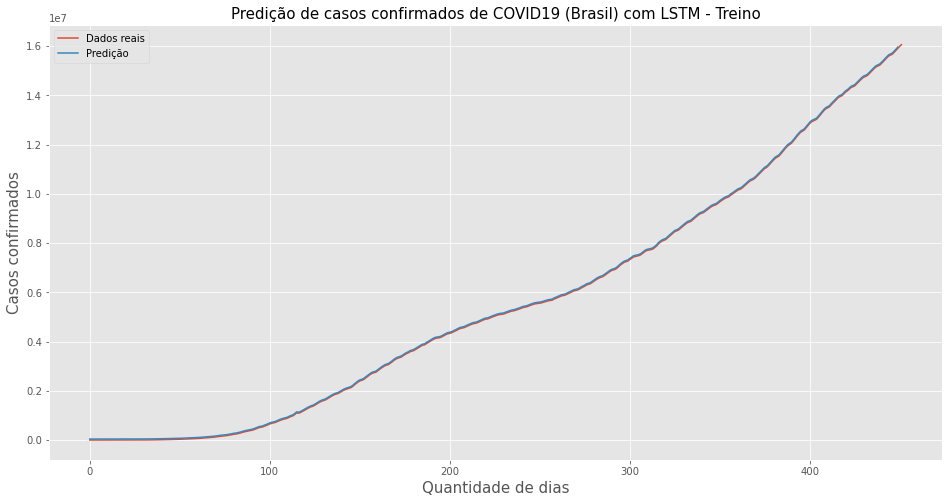

Train Score: 58933.07 RMSE
Taxa de aprendizagem: 0.2
Dropout: 0.1
Número de células: 600

 LSTM - O segundo melhor - Brasil 



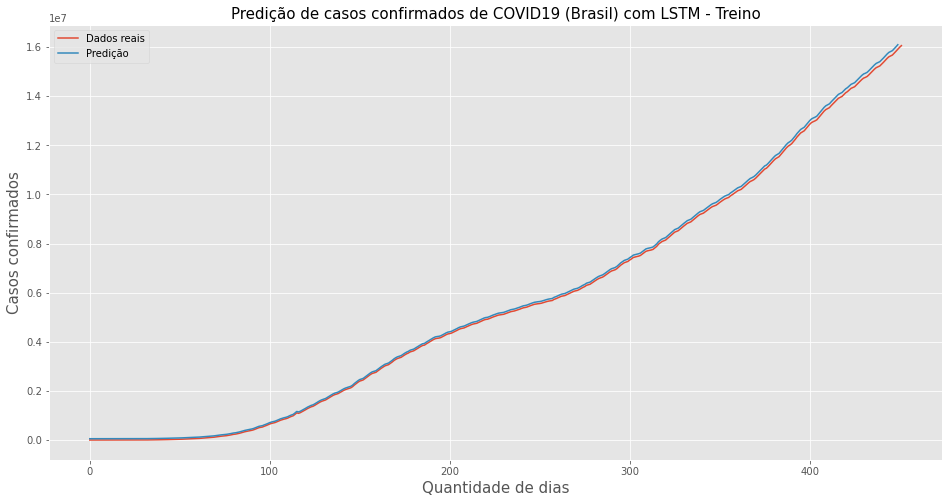

Train Score: 58933.07 RMSE
Taxa de aprendizagem: 0.2
Dropout: 0.2
Número de células: 600




 LSTM - O melhor caso - Índia 



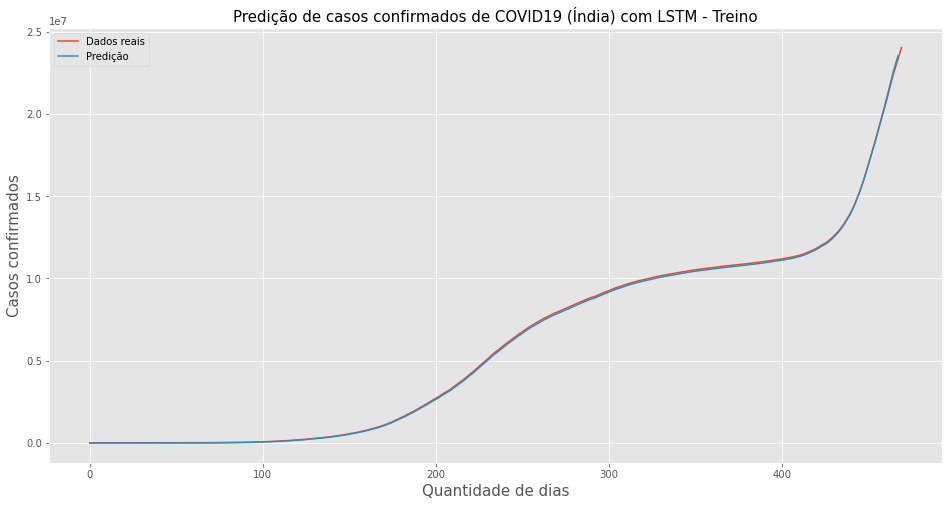

Train Score: 55598.81 RMSE
Taxa de aprendizagem: 0.2
Dropout: 0.2
Número de células: 200

 LSTM - O segundo melhor - Índia 



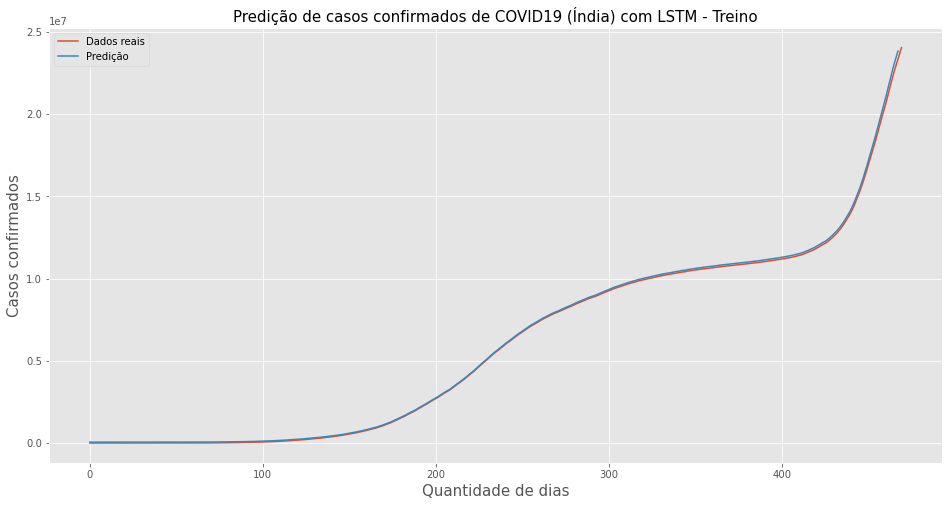

Train Score: 55598.81 RMSE
Taxa de aprendizagem: 0.2
Dropout: 0.2
Número de células: 600




 LSTM - O melhor caso - Itália 



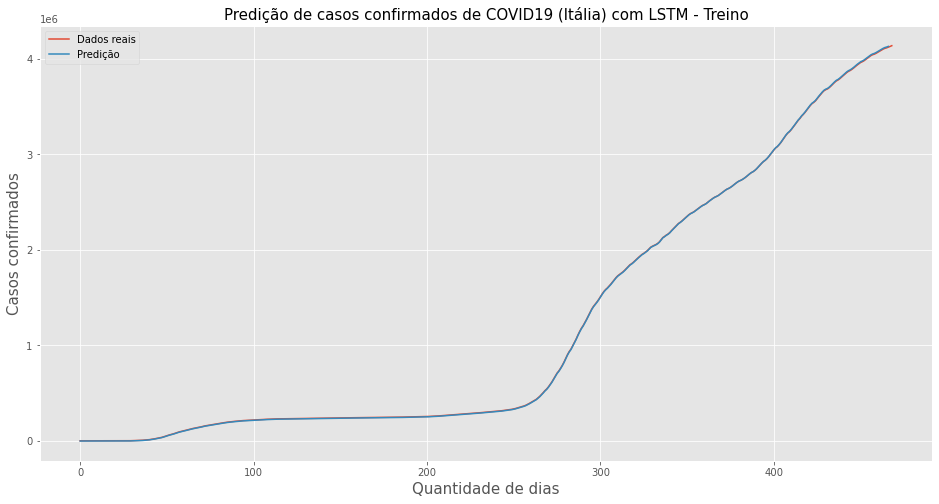

Train Score: 10706.54 RMSE
Taxa de aprendizagem: 0.1
Dropout: 0.1
Número de células: 200

 LSTM - O segundo melhor - Itália 



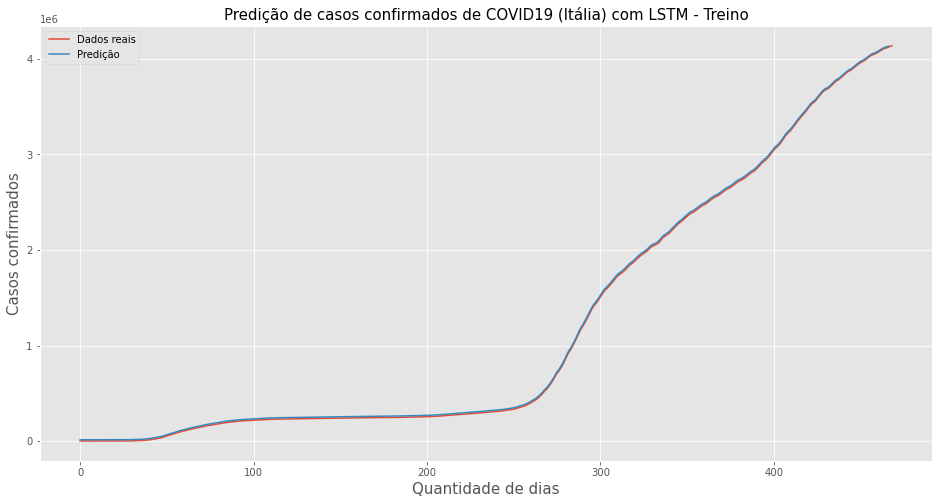

Train Score: 10706.54 RMSE
Taxa de aprendizagem: 0.2
Dropout: 0.2
Número de células: 600




 LSTM - O melhor caso - EUA 



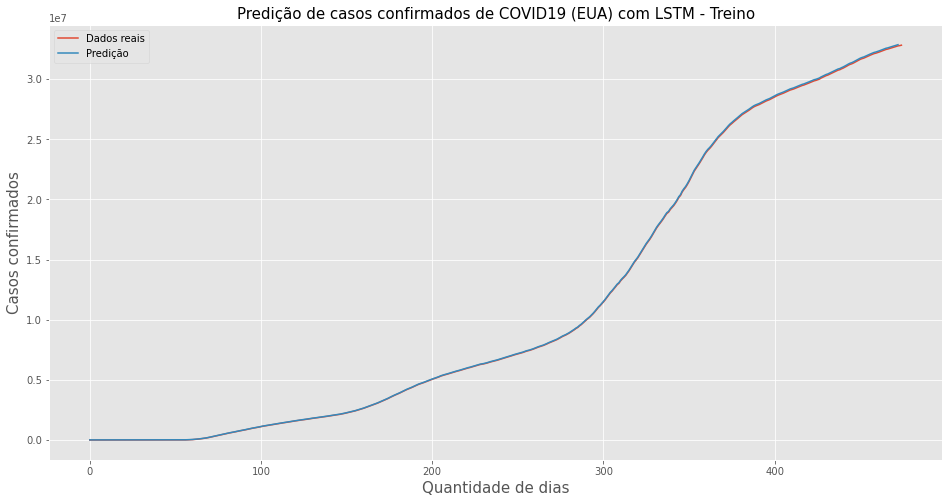

Train Score: 65002.27 RMSE
Taxa de aprendizagem: 0.2
Dropout: 0.01
Número de células: 300

 LSTM - O segundo melhor - EUA 



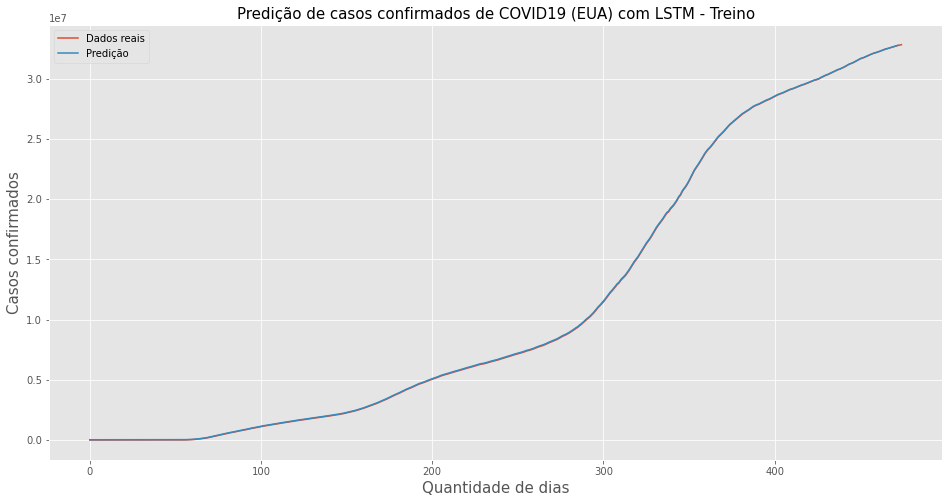

Train Score: 65002.27 RMSE
Taxa de aprendizagem: 0.2
Dropout: 0.2
Número de células: 600





In [25]:
#Plotar gráficos com os treinos LSTM
for i in range(len(country)): #loop de repatição apra mostrar todos os países
    print('\n LSTM - O melhor caso - %s \n' %(country[i]))
    plt.figure(figsize=(16,8))
    plt.title('Predição de casos confirmados de COVID19 (%s) com LSTM - Treino' %(country[i]), size = 15)
    plt.ylabel('Casos confirmados', size = 15)
    plt.xlabel('Quantidade de dias', size = 15)
    plt.plot(trainP[country[i]], label = 'Dados reais')
    plt.plot(strainPred[country[i]], label = 'Predição')
    plt.legend()
    plt.show()
    print('Train Score: %.2f RMSE' % (trs[country[i]]))
    print('Taxa de aprendizagem:', st_a[country[i]])
    print('Dropout:', sdropout[country[i]])
    print('Número de células:', sn_cel[country[i]])

    print('\n LSTM - O segundo melhor - %s \n' %(country[i]))
    plt.figure(figsize=(16,8))
    plt.title('Predição de casos confirmados de COVID19 (%s) com LSTM - Treino' %(country[i]), size = 15)
    plt.ylabel('Casos confirmados', size = 15)
    plt.xlabel('Quantidade de dias', size = 15)
    plt.plot(trainP[country[i]], label = 'Dados reais')
    plt.plot(trainPred[country[i]], label = 'Predição')
    plt.legend()
    plt.show()
    print('Train Score: %.2f RMSE' % (trs[country[i]]))
    print('Taxa de aprendizagem:', t_a[country[i]])
    print('Dropout:', dropout[country[i]])
    print('Número de células:', n_cel[country[i]])
    print('\n\n')



 LSTM - O melhor caso - Brasil 



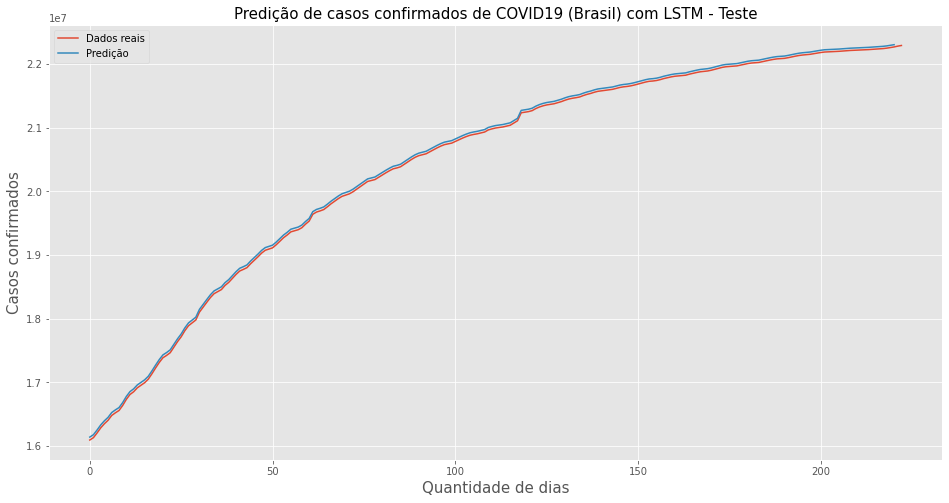

Test Score: 25283.47 RMSE
MAE: 21975.57023380769
Taxa de aprendizagem: 0.2
Dropout: 0.1
Número de células: 600

 LSTM - O segundo melhor - Brasil 



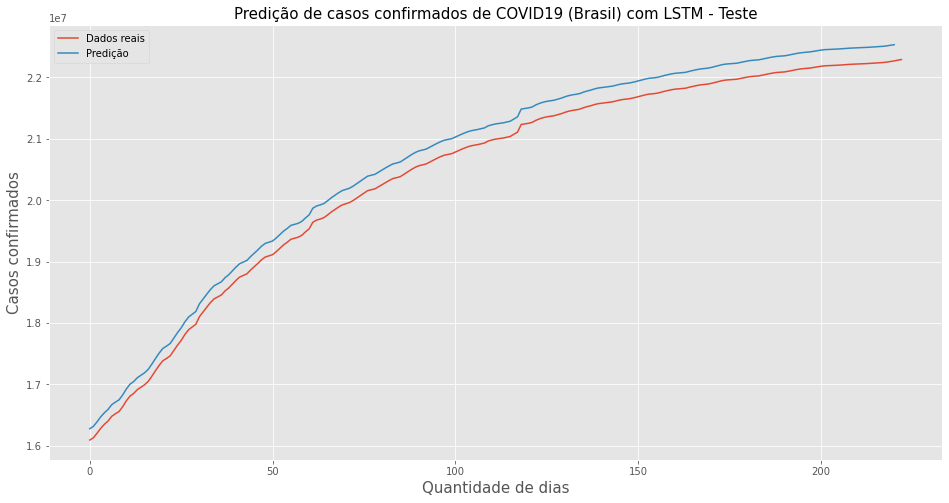

Test Score: 216945.92 RMSE
MAE: 212112.75097905908
Taxa de aprendizagem: 0.2
Dropout: 0.2
Número de células: 600




 LSTM - O melhor caso - Índia 



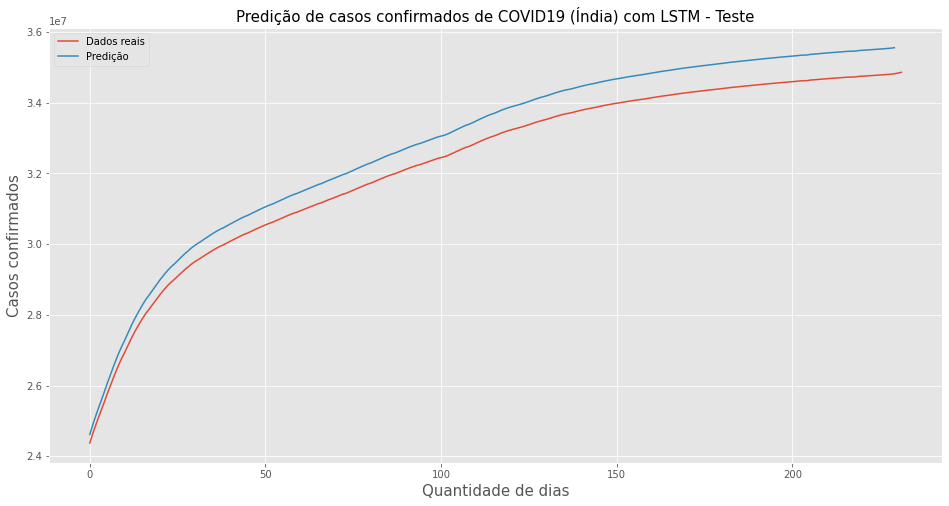

Test Score: 584442.07 RMSE
MAE: 559053.719440499
Taxa de aprendizagem: 0.2
Dropout: 0.2
Número de células: 200

 LSTM - O segundo melhor - Índia 



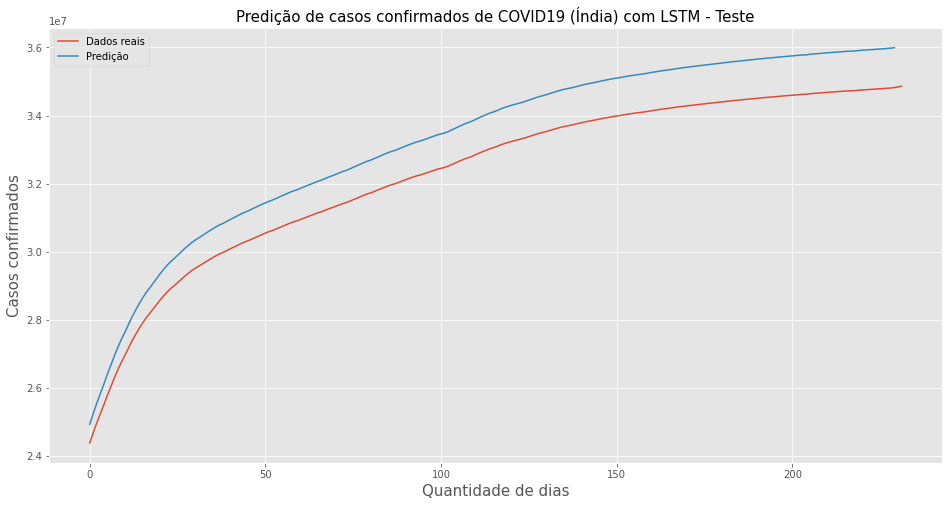

Test Score: 981658.57 RMSE
MAE: 960313.3358834797
Taxa de aprendizagem: 0.2
Dropout: 0.2
Número de células: 600




 LSTM - O melhor caso - Itália 



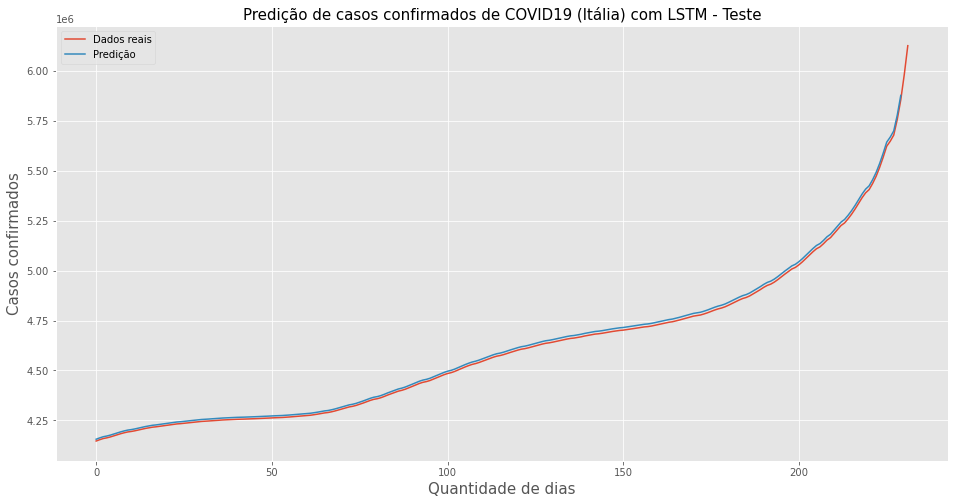

Test Score: 12436.33 RMSE
MAE: 8263.079880942687
Taxa de aprendizagem: 0.1
Dropout: 0.1
Número de células: 200

 LSTM - O segundo melhor - Itália 



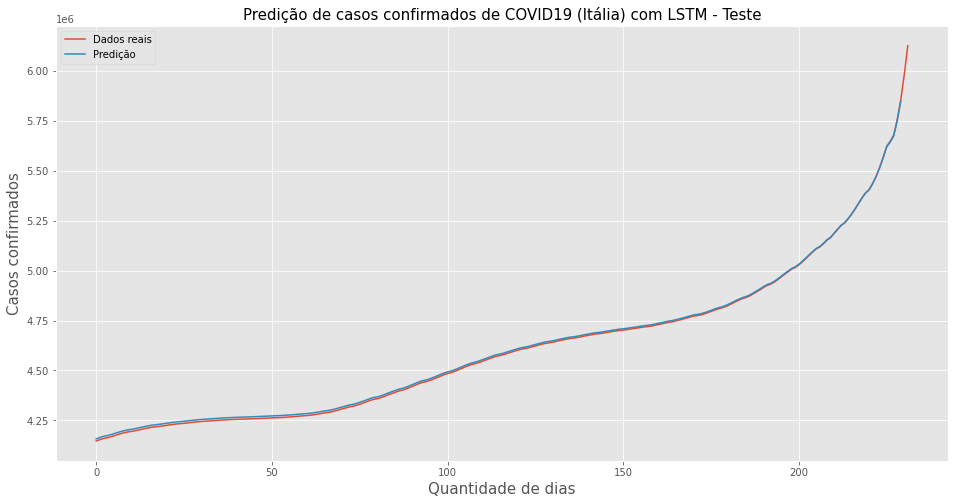

Test Score: 16296.28 RMSE
MAE: 8373.676575371785
Taxa de aprendizagem: 0.2
Dropout: 0.2
Número de células: 600




 LSTM - O melhor caso - EUA 



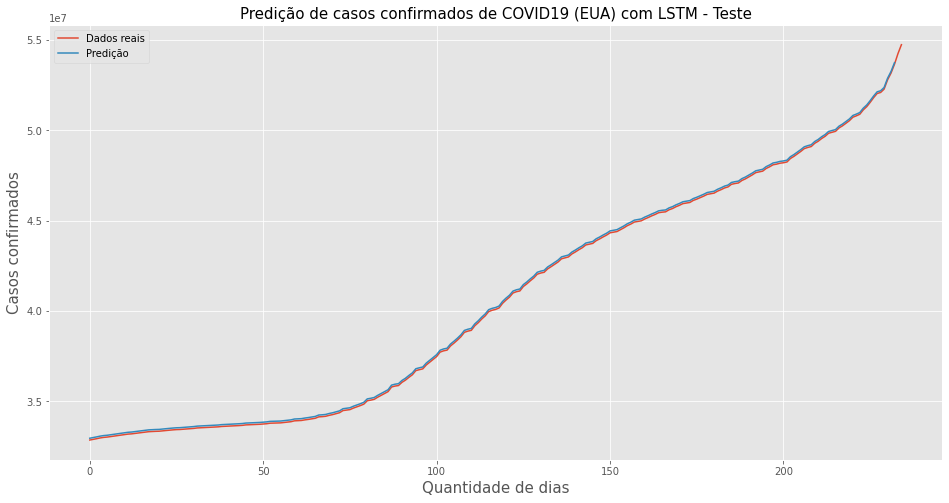

Test Score: 87661.82 RMSE
MAE: 66605.27777256379
Taxa de aprendizagem: 0.2
Dropout: 0.01
Número de células: 300

 LSTM - O segundo melhor - EUA 



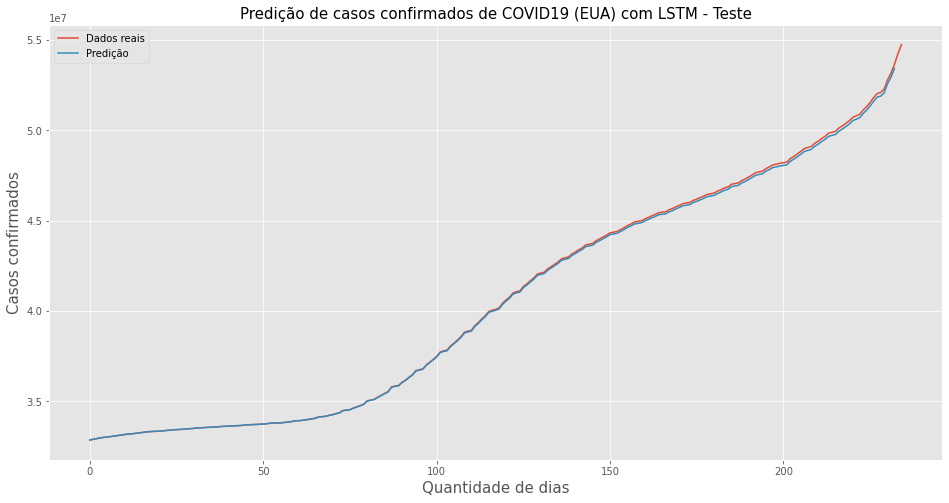

Test Score: 207030.92 RMSE
MAE: 159252.61580359144
Taxa de aprendizagem: 0.2
Dropout: 0.2
Número de células: 600





In [26]:
#Plotar gráficos com os testes LSTM
for i in range(len(country)): #loop de repatição apra mostrar todos os países
    print('\n LSTM - O melhor caso - %s \n' %(country[i]))
    plt.figure(figsize=(16,8))
    plt.title('Predição de casos confirmados de COVID19 (%s) com LSTM - Teste' %(country[i]), size = 15)
    plt.ylabel('Casos confirmados', size = 15)
    plt.xlabel('Quantidade de dias', size = 15)
    plt.plot(testP[country[i]], label = 'Dados reais')
    plt.plot(stestPred[country[i]], label = 'Predição')
    plt.legend()
    plt.show()
    print('Test Score: %.2f RMSE' % (stss[country[i]]))
    print('MAE:', stsm[country[i]])
    print('Taxa de aprendizagem:', st_a[country[i]])
    print('Dropout:', sdropout[country[i]])
    print('Número de células:', sn_cel[country[i]])

    print('\n LSTM - O segundo melhor - %s \n' %(country[i]))
    plt.figure(figsize=(16,8))
    plt.title('Predição de casos confirmados de COVID19 (%s) com LSTM - Teste' %(country[i]), size = 15)
    plt.ylabel('Casos confirmados', size = 15)
    plt.xlabel('Quantidade de dias', size = 15)
    plt.plot(testP[country[i]], label = 'Dados reais')
    plt.plot(testPred[country[i]], label = 'Predição')
    plt.legend()
    plt.show()
    print('Test Score: %.2f RMSE' % (tss[country[i]]))
    print('MAE:', tsm[country[i]])
    print('Taxa de aprendizagem:', t_a[country[i]])
    print('Dropout:', dropout[country[i]])
    print('Número de células:', n_cel[country[i]])
    print('\n\n')



 LSTM - O melhor caso - Brasil 



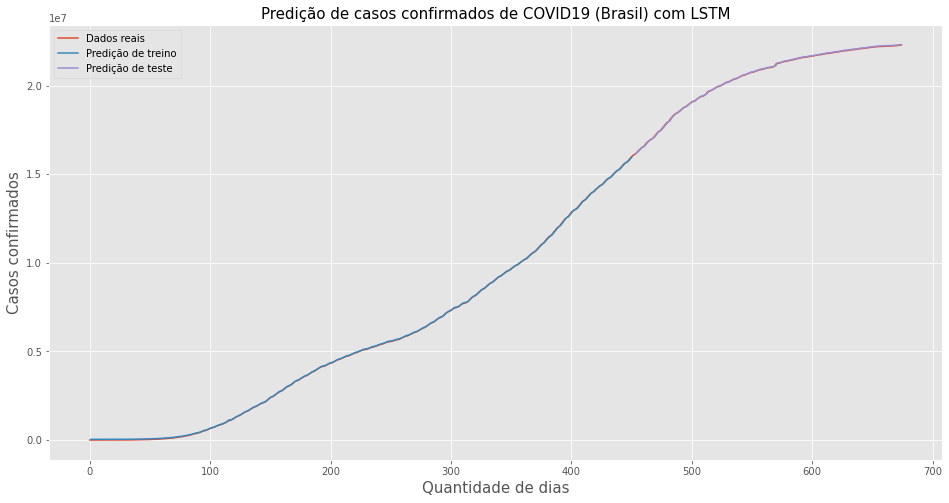

Train Score: 24079.53 RMSE
Test Score: 25283.47 RMSE
MAE: 21975.57023380769
Taxa de aprendizagem: 0.2
Dropout: 0.1
Número de células: 600

 LSTM - O segundo melhor - Brasil 



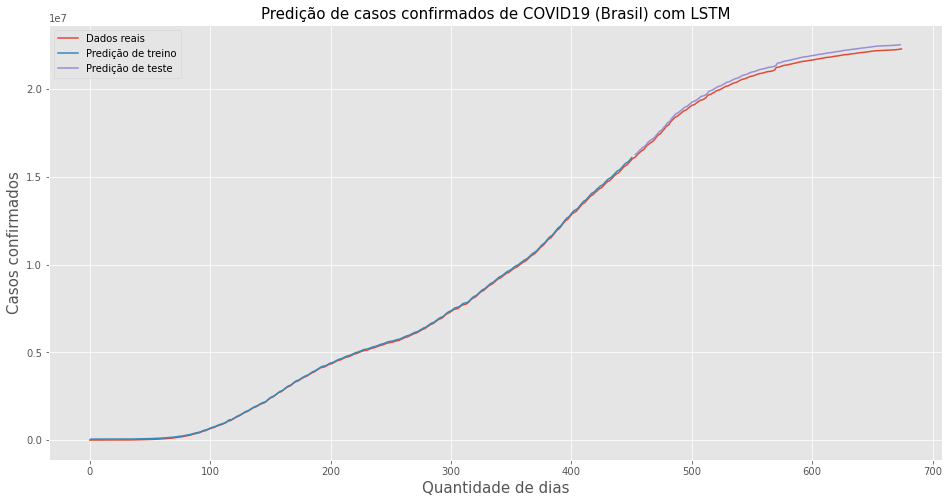

Train Score: 58933.07 RMSE
Test Score: 216945.92 RMSE
MAE: 212112.75097905908
Taxa de aprendizagem: 0.2
Dropout: 0.2
Número de células: 600




 LSTM - O melhor caso - Índia 



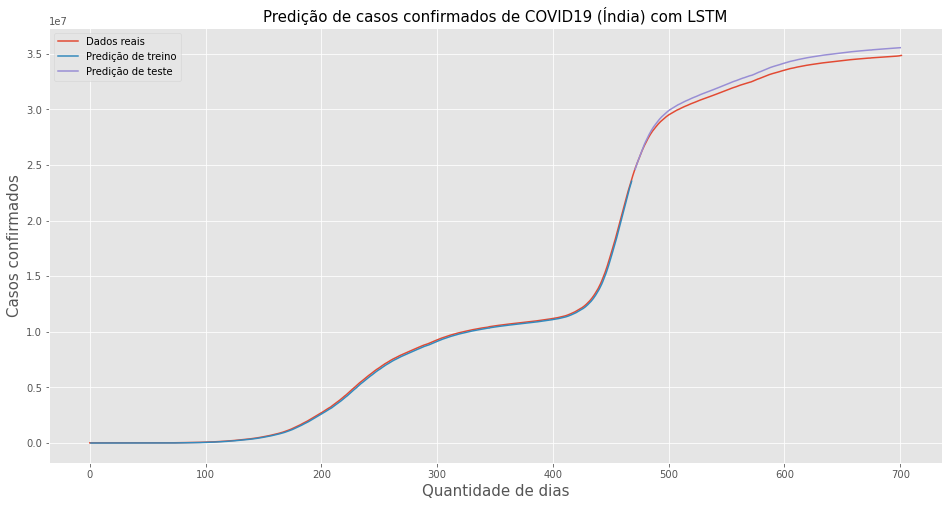

Train Score: 123895.43 RMSE
Test Score: 584442.07 RMSE
MAE: 559053.719440499
Taxa de aprendizagem: 0.2
Dropout: 0.2
Número de células: 200

 LSTM - O segundo melhor - Índia 



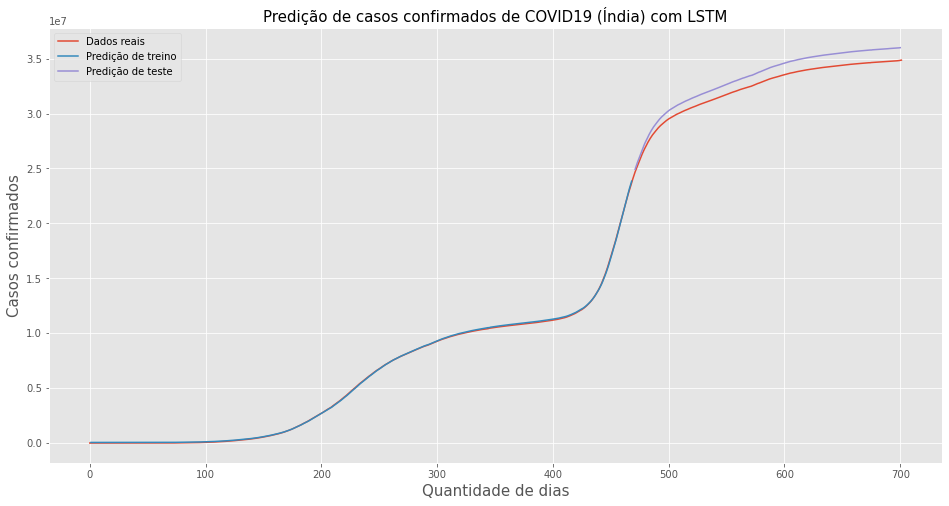

Train Score: 55598.81 RMSE
Test Score: 981658.57 RMSE
MAE: 960313.3358834797
Taxa de aprendizagem: 0.2
Dropout: 0.2
Número de células: 600




 LSTM - O melhor caso - Itália 



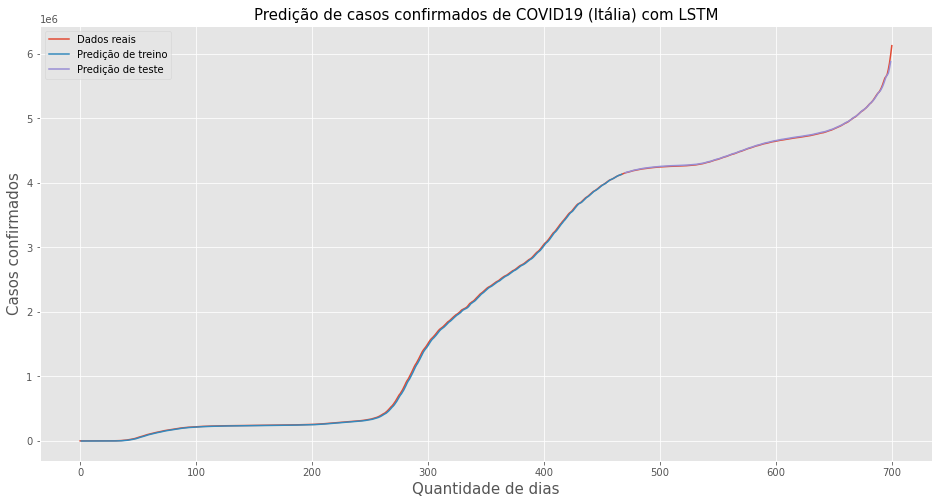

Train Score: 14304.55 RMSE
Test Score: 12436.33 RMSE
MAE: 8263.079880942687
Taxa de aprendizagem: 0.1
Dropout: 0.1
Número de células: 200

 LSTM - O segundo melhor - Itália 



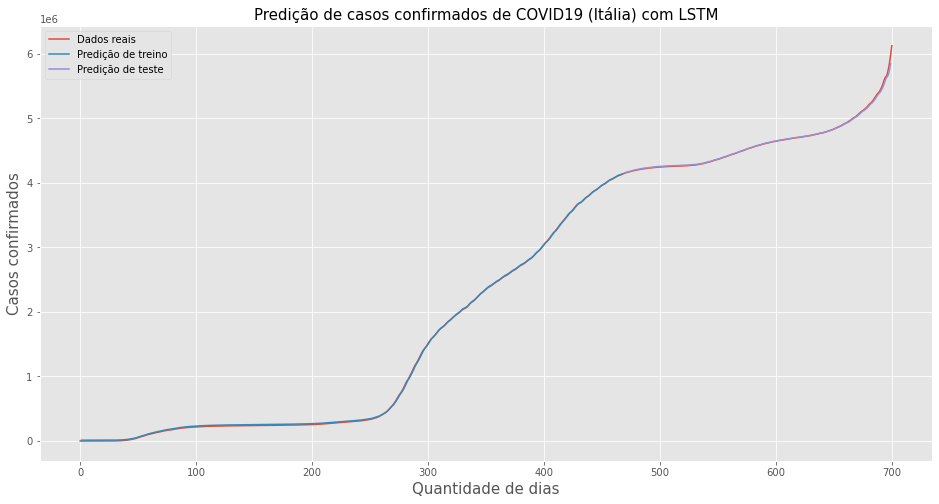

Train Score: 10706.54 RMSE
Test Score: 16296.28 RMSE
MAE: 8373.676575371785
Taxa de aprendizagem: 0.2
Dropout: 0.2
Número de células: 600




 LSTM - O melhor caso - EUA 



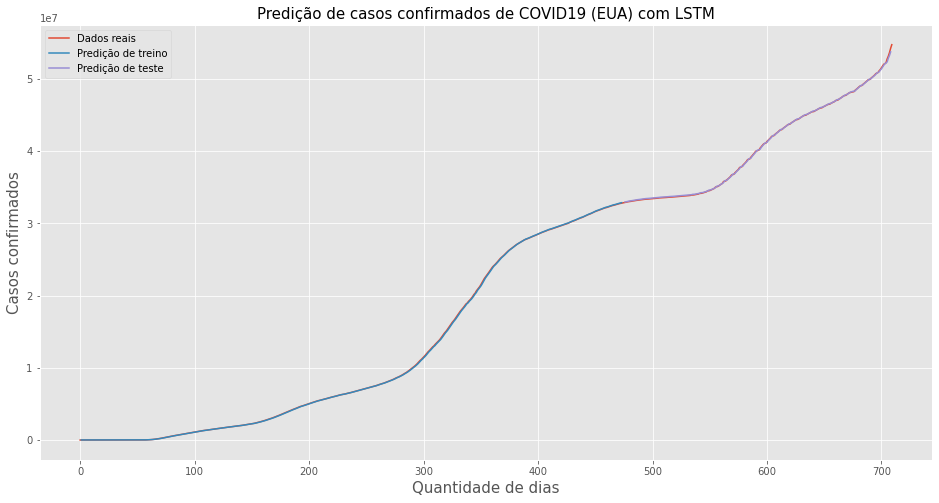

Train Score: 62239.74 RMSE
Test Score: 87661.82 RMSE
MAE: 66605.27777256379
Taxa de aprendizagem: 0.2
Dropout: 0.01
Número de células: 300

 LSTM - O segundo melhor - EUA 



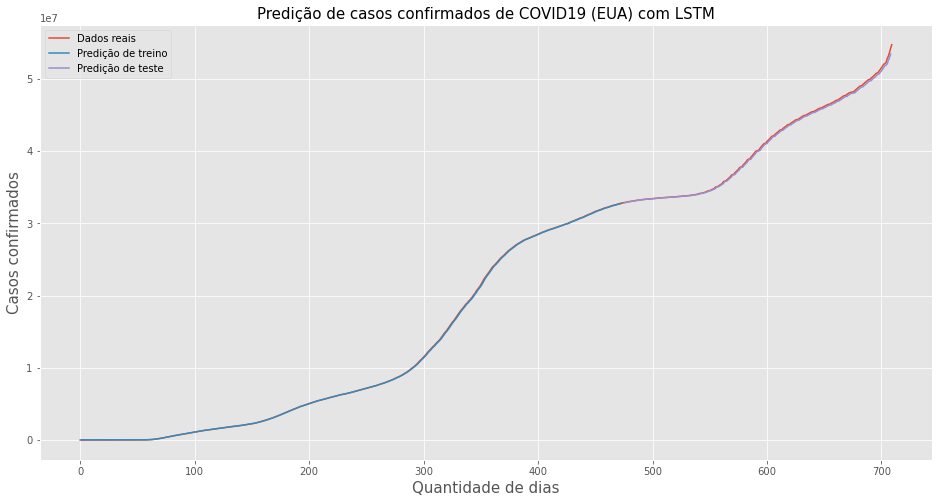

Train Score: 65002.27 RMSE
Test Score: 207030.92 RMSE
MAE: 159252.61580359144
Taxa de aprendizagem: 0.2
Dropout: 0.2
Número de células: 600





In [27]:
#Plotar gráficos com base nas previsões do modelo LSTM
for i in range(len(country)): #loop de repatição apra mostrar todos os países
    
    print('\n LSTM - O melhor caso - %s \n' %(country[i]))
    plt.figure(figsize=(16,8))
    plt.title('Predição de casos confirmados de COVID19 (%s) com LSTM' %(country[i]), size = 15)
    plt.ylabel('Casos confirmados', size = 15)
    plt.xlabel('Quantidade de dias', size = 15)
    plt.plot(dts[country[i]], label = 'Dados reais')
    plt.plot(strpp[country[i]], label = 'Predição de treino')
    plt.plot(stspp[country[i]], label = 'Predição de teste')
    plt.legend()
    plt.show()
    print('Train Score: %.2f RMSE' % (strs[country[i]]))
    print('Test Score: %.2f RMSE' % (stss[country[i]]))
    print('MAE:', stsm[country[i]])
    print('Taxa de aprendizagem:', st_a[country[i]])
    print('Dropout:', sdropout[country[i]])
    print('Número de células:', sn_cel[country[i]])

    print('\n LSTM - O segundo melhor - %s \n' %(country[i]))
    plt.figure(figsize=(16,8))
    plt.title('Predição de casos confirmados de COVID19 (%s) com LSTM' %(country[i]), size = 15)
    plt.ylabel('Casos confirmados', size = 15)
    plt.xlabel('Quantidade de dias', size = 15)
    plt.plot(dts[country[i]], label = 'Dados reais')
    plt.plot(trpp[country[i]], label = 'Predição de treino')
    plt.plot(tspp[country[i]], label = 'Predição de teste')
    plt.legend()
    plt.show()
    print('Train Score: %.2f RMSE' % (trs[country[i]]))
    print('Test Score: %.2f RMSE' % (tss[country[i]]))
    print('MAE:', tsm[country[i]])
    print('Taxa de aprendizagem:', t_a[country[i]])
    print('Dropout:', dropout[country[i]])
    print('Número de células:', n_cel[country[i]])
    print('\n\n')
    
    #Armazenando dados de treino e teste da predição
    if country[i] == 'Brasil':
        st = strpp[country[i]]
        ts = stspp[country[i]]
        numpy.savetxt('C:/Users/Saulo Joel/GitHub/COVID-19-time-series-predictions/outputs/test/out_lstm_casos_test_brazil.csv',st,delimiter=',')
        numpy.savetxt('C:/Users/Saulo Joel/GitHub/COVID-19-time-series-predictions/outputs/train/out_lstm_casos_train_brazil.csv',ts,delimiter=',')
    if country[i] == 'Índia':
        st = strpp[country[i]]
        ts = stspp[country[i]]
        numpy.savetxt('C:/Users/Saulo Joel/GitHub/COVID-19-time-series-predictions/outputs/test/out_lstm_casos_test_india.csv',st,delimiter=',')
        numpy.savetxt('C:/Users/Saulo Joel/GitHub/COVID-19-time-series-predictions/outputs/train/out_lstm_casos_train_india.csv',ts,delimiter=',')
    if country[i] == 'Itália':
        st = strpp[country[i]]
        ts = stspp[country[i]]
        numpy.savetxt('C:/Users/Saulo Joel/GitHub/COVID-19-time-series-predictions/outputs/test/out_lstm_casos_test_italia.csv',st,delimiter=',')
        numpy.savetxt('C:/Users/Saulo Joel/GitHub/COVID-19-time-series-predictions/outputs/train/out_lstm_casos_train_italia.csv',ts,delimiter=',')
    if country[i] == 'EUA':
        st = strpp[country[i]]
        ts = stspp[country[i]]
        numpy.savetxt('C:/Users/Saulo Joel/GitHub/COVID-19-time-series-predictions/outputs/test/out_lstm_casos_test_eua.csv',st,delimiter=',')
        numpy.savetxt('C:/Users/Saulo Joel/GitHub/COVID-19-time-series-predictions/outputs/train/out_lstm_casos_train_eua.csv',ts,delimiter=',')


 MLP - O melhor caso - Brasil 



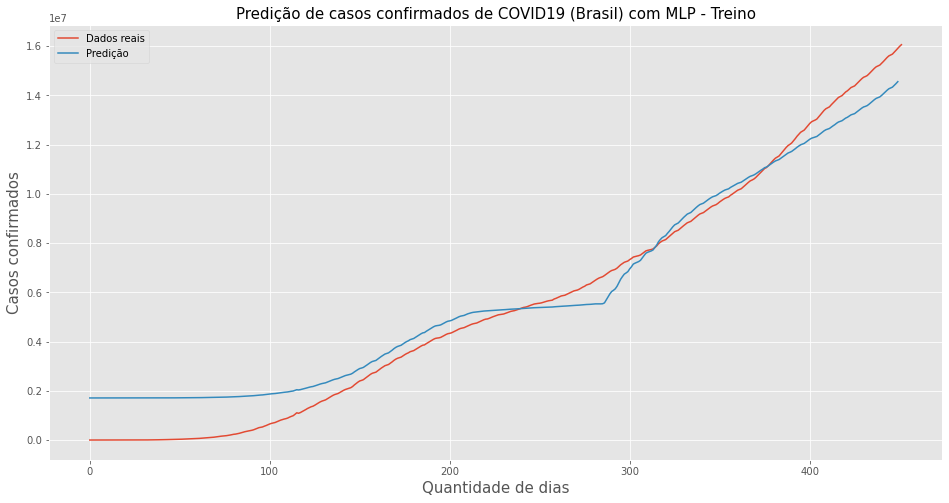

Train Score: 956955.99 RMSE
Taxa de aprendizagem: 0.1
Dropout: 0.2
Número de células por camada: 8

 MLP - O segundo melhor - Brasil 



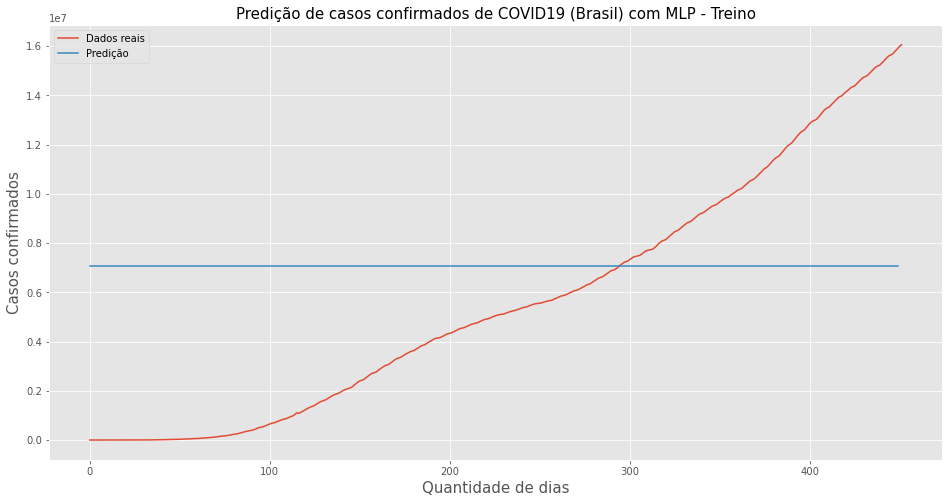

Train Score: 4970356.79 RMSE
Taxa de aprendizagem: 0.2
Dropout: 0.2
Número de células por camada: 8




 MLP - O melhor caso - Índia 



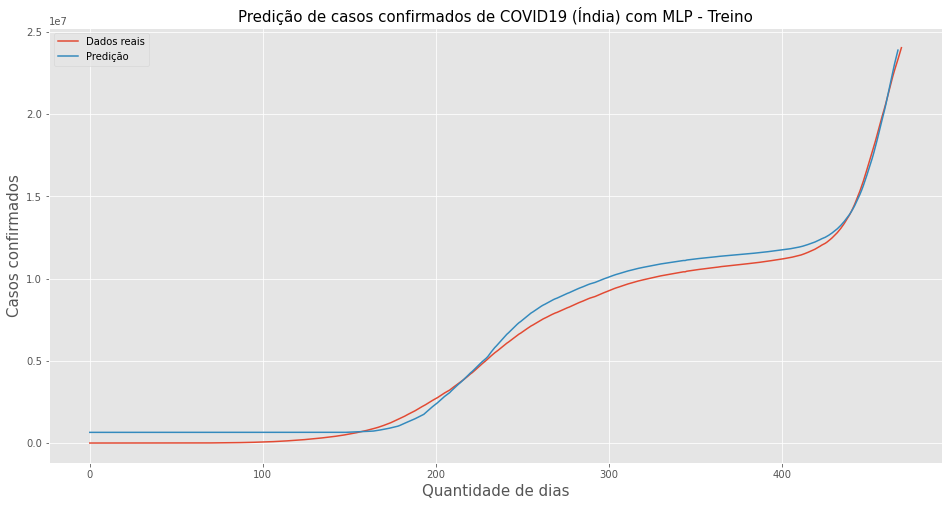

Train Score: 567785.85 RMSE
Taxa de aprendizagem: 0.05
Dropout: 0.1
Número de células por camada: 16

 MLP - O segundo melhor - Índia 



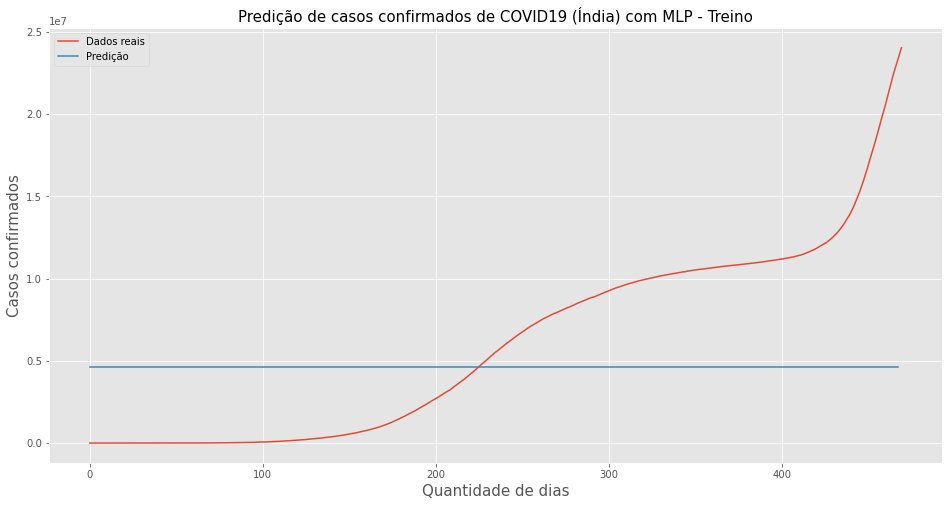

Train Score: 5815261.49 RMSE
Taxa de aprendizagem: 0.2
Dropout: 0.2
Número de células por camada: 16




 MLP - O melhor caso - Itália 



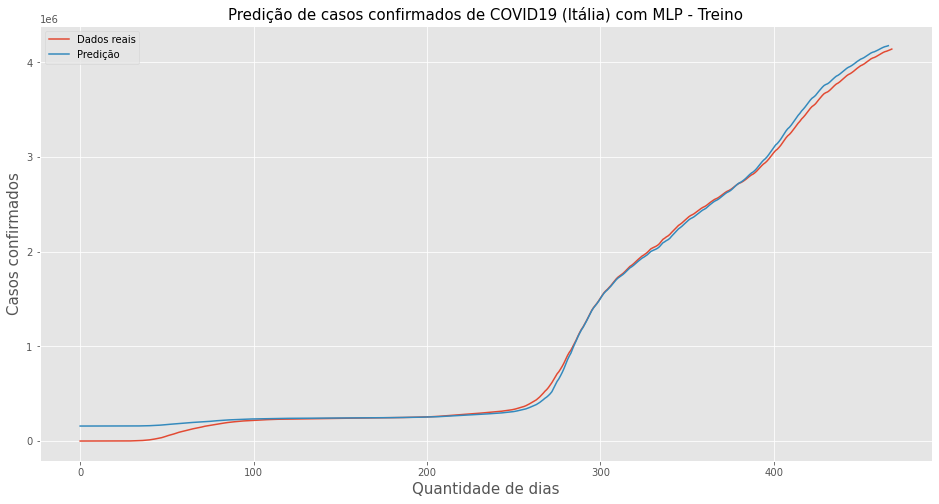

Train Score: 64537.91 RMSE
Taxa de aprendizagem: 0.01
Dropout: 0.01
Número de células por camada: 32

 MLP - O segundo melhor - Itália 



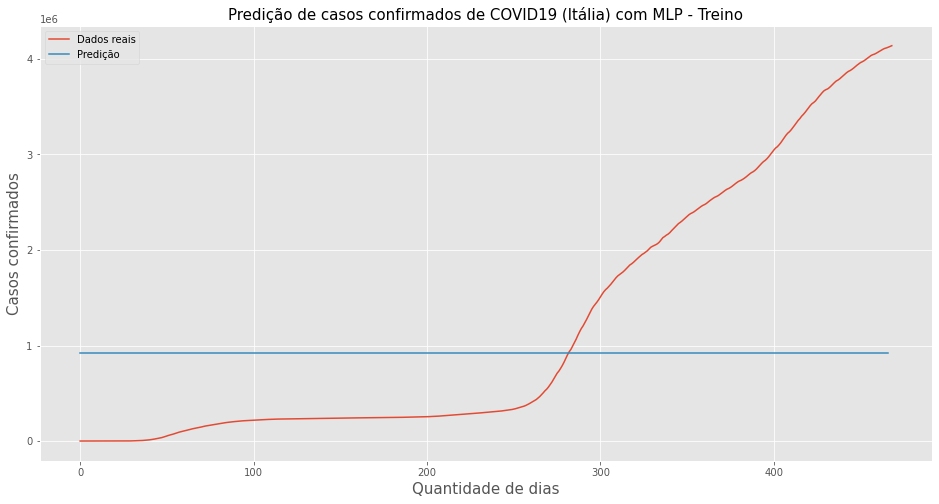

Train Score: 1370134.27 RMSE
Taxa de aprendizagem: 0.2
Dropout: 0.2
Número de células por camada: 32




 MLP - O melhor caso - EUA 



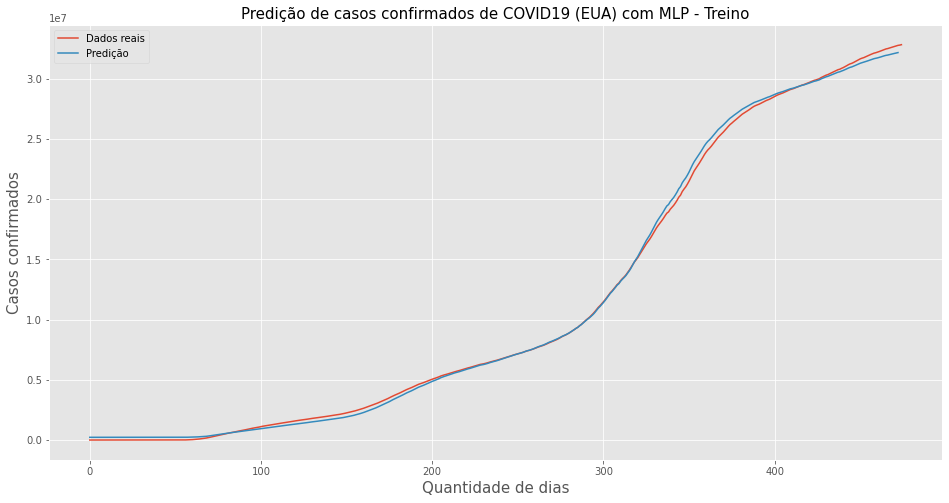

Train Score: 280513.35 RMSE
Taxa de aprendizagem: 0.01
Dropout: 0.01
Número de células por camada: 64

 MLP - O segundo melhor - EUA 



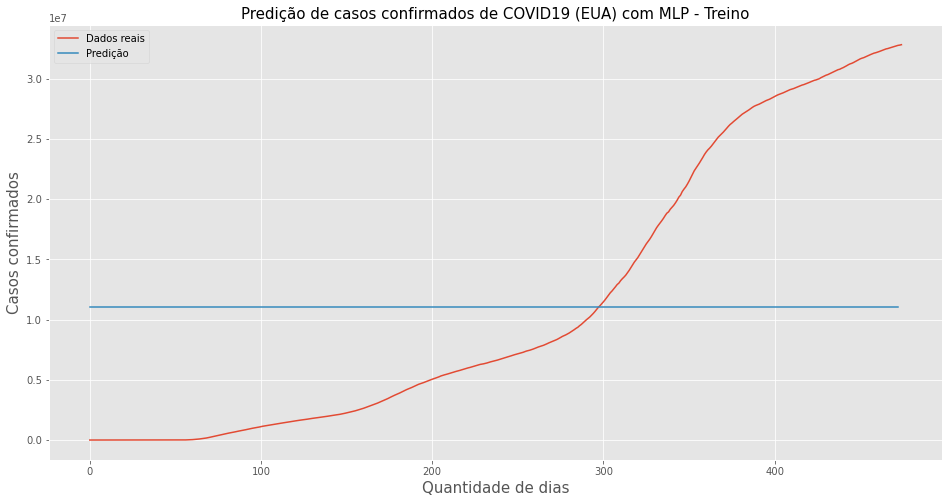

Train Score: 11459562.62 RMSE
Taxa de aprendizagem: 0.2
Dropout: 0.2
Número de células por camada: 64





In [28]:
#Plotar gráficos com treinos do modelo MLP
for i in range(len(country)):
    print('\n MLP - O melhor caso - %s \n' %(country[i]))
    plt.figure(figsize=(16,8))
    plt.title('Predição de casos confirmados de COVID19 (%s) com MLP - Treino' %(country[i]), size = 15)
    plt.ylabel('Casos confirmados', size = 15)
    plt.xlabel('Quantidade de dias', size = 15)

    plt.plot(trainP[country[i]], label = 'Dados reais')
    plt.plot(strainPredMLP[country[i]], label = 'Predição')
    plt.legend()
    plt.show()
    print('Train Score: %.2f RMSE' % (strsMLP[country[i]]))
    print('Taxa de aprendizagem:', st_aMLP[country[i]])
    print('Dropout:', sdropoutMLP[country[i]])
    print('Número de células por camada:',sn_neu[country[i]])


    print('\n MLP - O segundo melhor - %s \n' %(country[i]))
    plt.figure(figsize=(16,8))
    plt.title('Predição de casos confirmados de COVID19 (%s) com MLP - Treino' %(country[i]), size = 15)
    plt.ylabel('Casos confirmados', size = 15)
    plt.xlabel('Quantidade de dias', size = 15)
    plt.plot(trainP[country[i]], label = 'Dados reais')
    plt.plot(trainPredMLP[country[i]], label = 'Predição')
    plt.legend()
    plt.show()
    print('Train Score: %.2f RMSE' % (trsMLP[country[i]]))
    print('Taxa de aprendizagem:', t_aMLP[country[i]])
    print('Dropout:', dropoutMLP[country[i]])

    print('Número de células por camada:',n_neu[country[i]])
 
    print('\n\n')


 MLP - O melhor caso - Brasil 



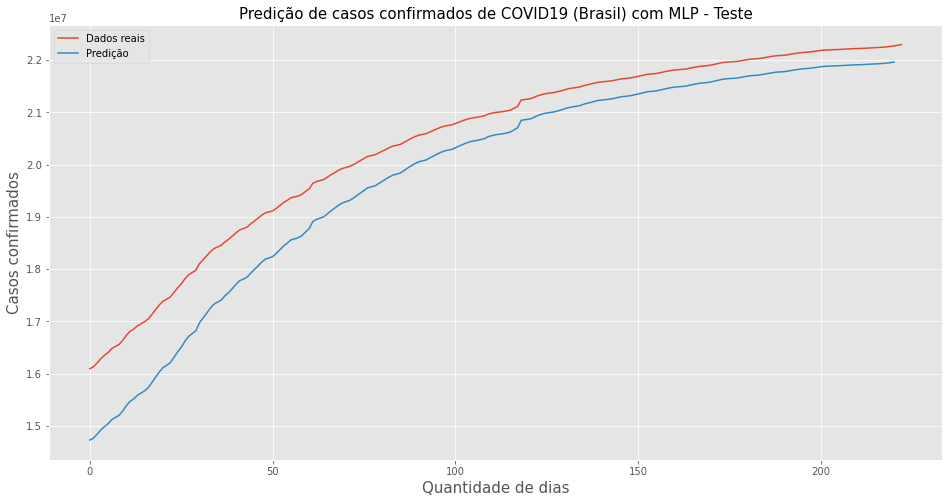

Test Score: 728409.38 RMSE
MAE: 628033.4209666422
Taxa de aprendizagem: 0.1
Dropout: 0.2
Número de células por camada: 8

 MLP - O segundo melhor - Brasil 



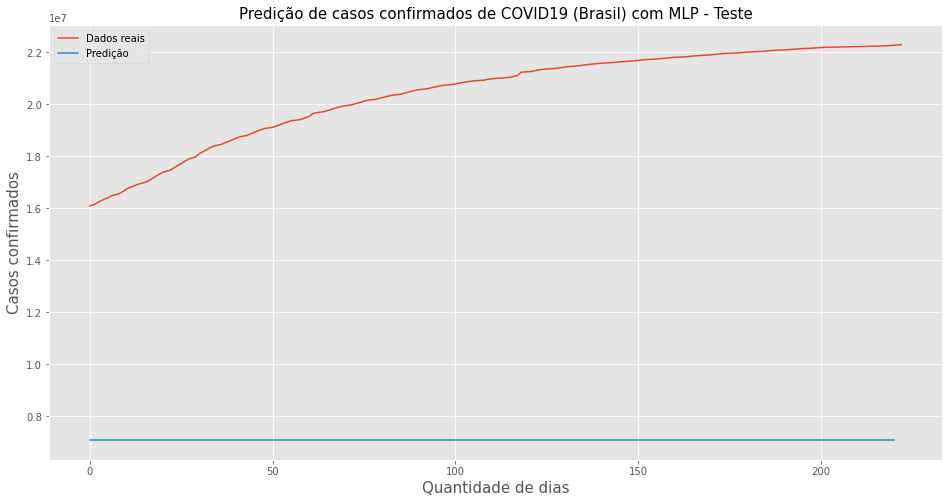

Test Score: 13475018.71 RMSE
Taxa de aprendizagem: 0.2
Dropout: 0.2
MAE: 13365020.022776594
Número de células por camada: 8




 MLP - O melhor caso - Índia 



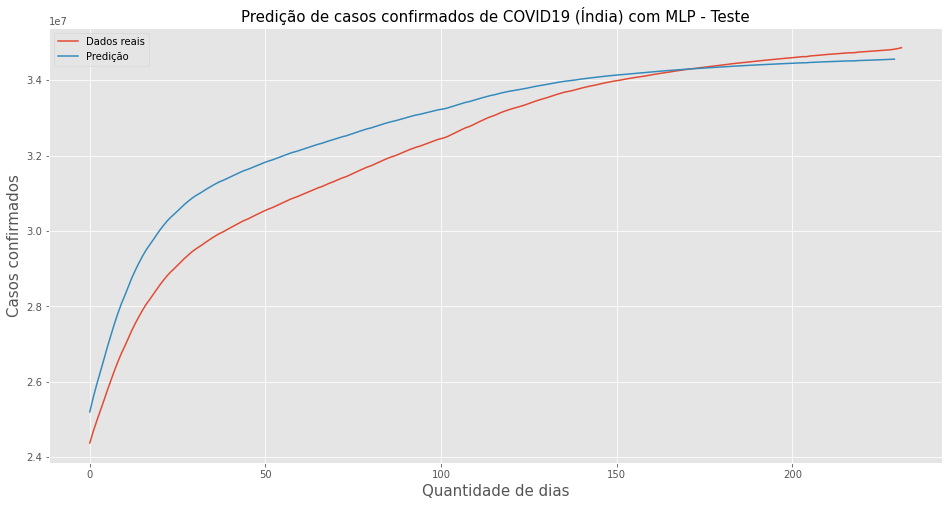

Test Score: 778756.96 RMSE
MAE: 616552.0811606005
Taxa de aprendizagem: 0.05
Dropout: 0.1
Número de células por camada: 16

 MLP - O segundo melhor - Índia 



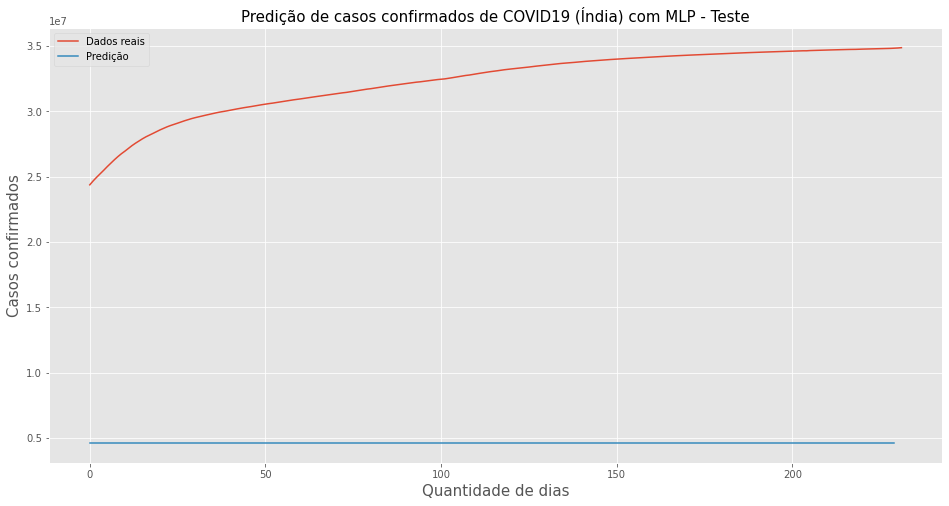

Test Score: 27797348.20 RMSE
Taxa de aprendizagem: 0.2
Dropout: 0.2
MAE: 27695077.277159996
Número de células por camada: 16




 MLP - O melhor caso - Itália 



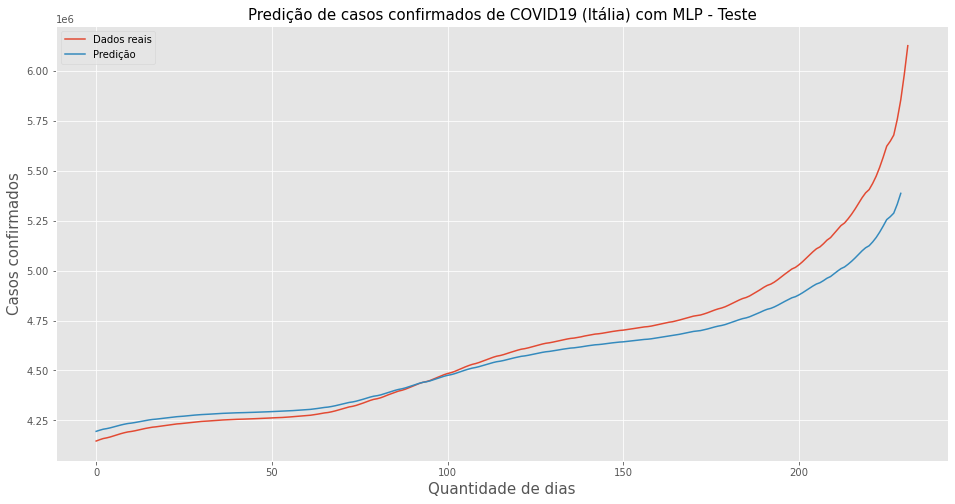

Test Score: 123301.96 RMSE
MAE: 78405.04347418065
Taxa de aprendizagem: 0.01
Dropout: 0.01
Número de células por camada: 32

 MLP - O segundo melhor - Itália 



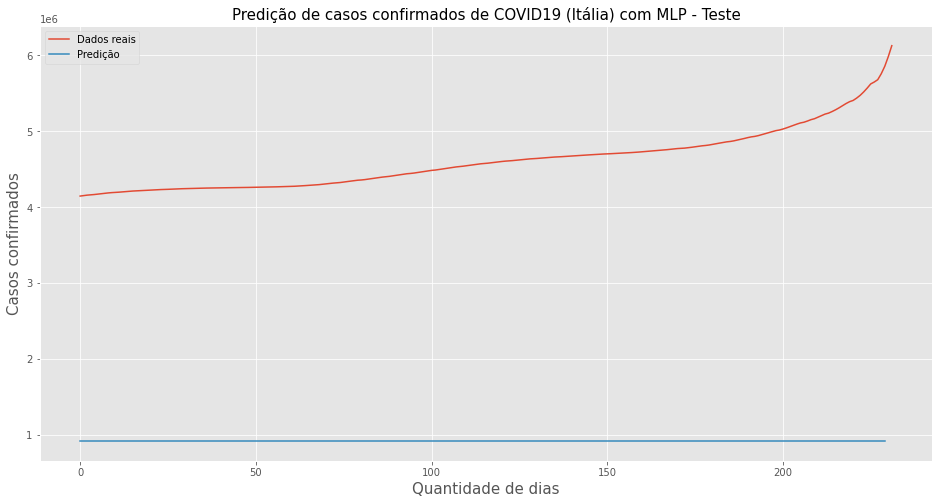

Test Score: 3710220.63 RMSE
Taxa de aprendizagem: 0.2
Dropout: 0.2
MAE: 3691126.277861083
Número de células por camada: 32




 MLP - O melhor caso - EUA 



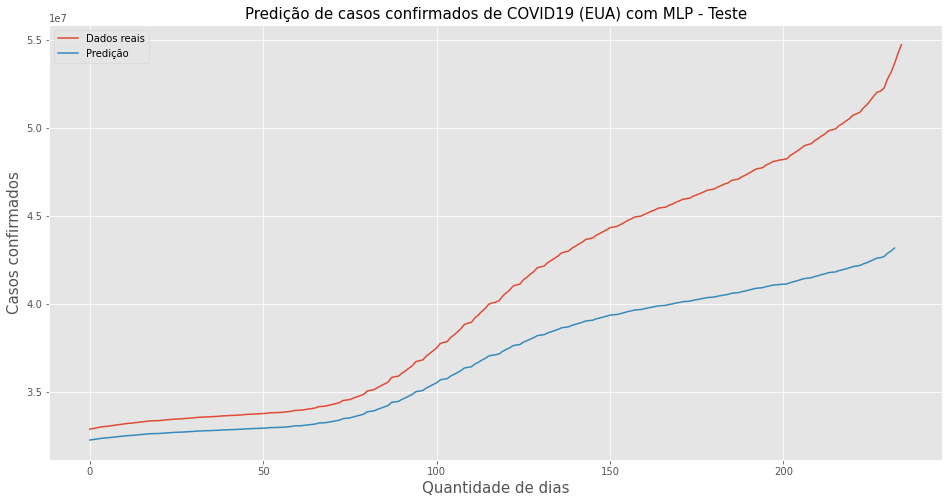

Test Score: 4690290.78 RMSE
MAE: 3722994.6673057373
Taxa de aprendizagem: 0.01
Dropout: 0.01
Número de células por camada: 64

 MLP - O segundo melhor - EUA 



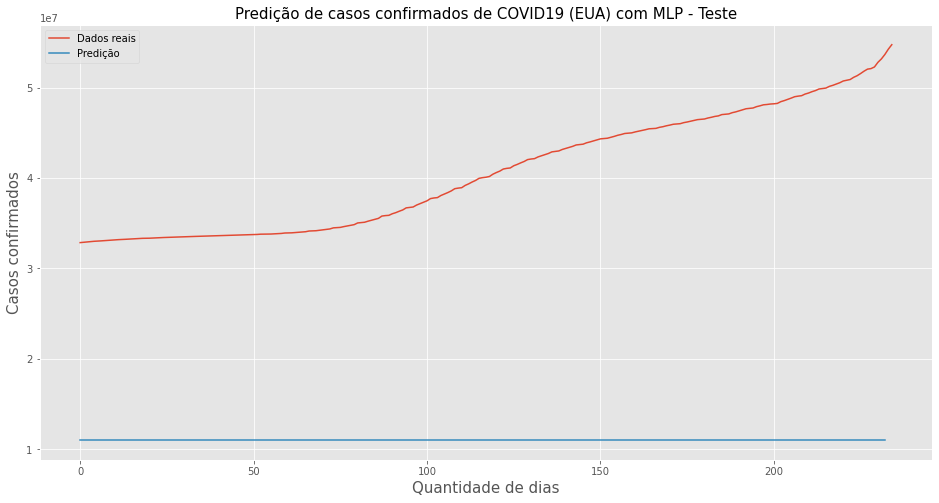

Test Score: 30267324.44 RMSE
Taxa de aprendizagem: 0.2
Dropout: 0.2
MAE: 29588347.156576123
Número de células por camada: 64





In [29]:
#Plotar gráficos com testes do modelo MLP
for i in range(len(country)):
    print('\n MLP - O melhor caso - %s \n' %(country[i]))
    plt.figure(figsize=(16,8))
    plt.title('Predição de casos confirmados de COVID19 (%s) com MLP - Teste' %(country[i]), size = 15)
    plt.ylabel('Casos confirmados', size = 15)
    plt.xlabel('Quantidade de dias', size = 15)
    plt.plot(testP[country[i]], label = 'Dados reais')
    plt.plot(stestPredMLP[country[i]], label = 'Predição')
    plt.legend()
    plt.show()

    print('Test Score: %.2f RMSE' % (stssMLP[country[i]]))
    print('MAE:', stsmMLP[country[i]])
    print('Taxa de aprendizagem:', st_aMLP[country[i]])
    print('Dropout:', sdropoutMLP[country[i]])
    print('Número de células por camada:',sn_neu[country[i]])


    print('\n MLP - O segundo melhor - %s \n' %(country[i]))
    plt.figure(figsize=(16,8))
    plt.title('Predição de casos confirmados de COVID19 (%s) com MLP - Teste' %(country[i]), size = 15)
    plt.ylabel('Casos confirmados', size = 15)
    plt.xlabel('Quantidade de dias', size = 15)
    plt.plot(testP[country[i]], label = 'Dados reais')
    plt.plot(testPredMLP[country[i]], label = 'Predição')
    plt.legend()
    plt.show()

    print('Test Score: %.2f RMSE' % (tssMLP[country[i]]))
    print('Taxa de aprendizagem:', t_aMLP[country[i]])
    print('Dropout:', dropoutMLP[country[i]])
    print('MAE:', tsmMLP[country[i]])
    print('Número de células por camada:',n_neu[country[i]])
 
    print('\n\n')


 MLP - O melhor caso - Brasil 



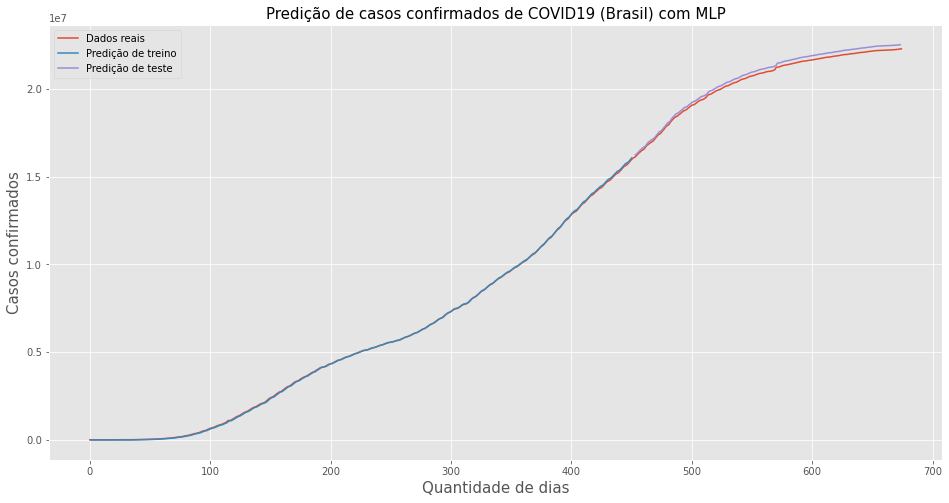

Train Score: 956955.99 RMSE
Test Score: 728409.38 RMSE
MAE: 628033.4209666422
Taxa de aprendizagem: 0.1
Dropout: 0.2
Número de células por camada: 8

 MLP - O segundo melhor - Brasil 



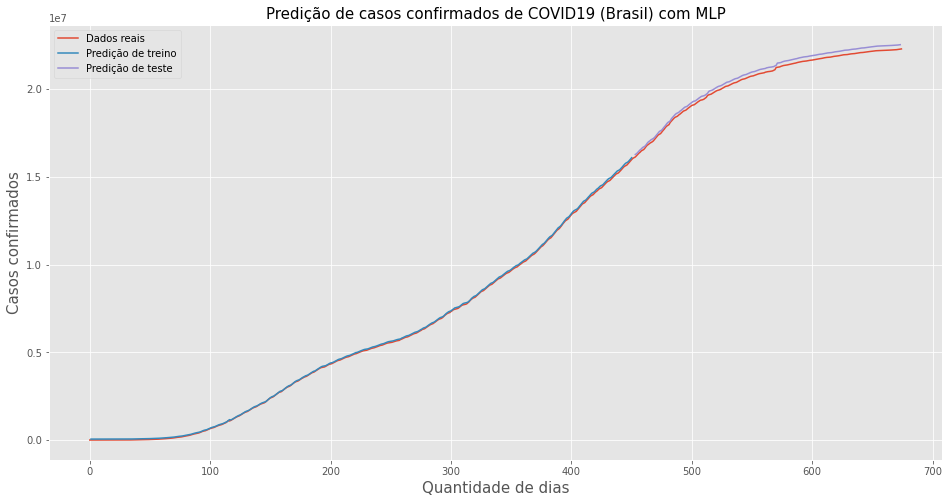

Train Score: 4970356.79 RMSE
Test Score: 13475018.71 RMSE
Taxa de aprendizagem: 0.2
Dropout: 0.2
MAE: 13365020.022776594
Número de células por camada: 8




 MLP - O melhor caso - Índia 



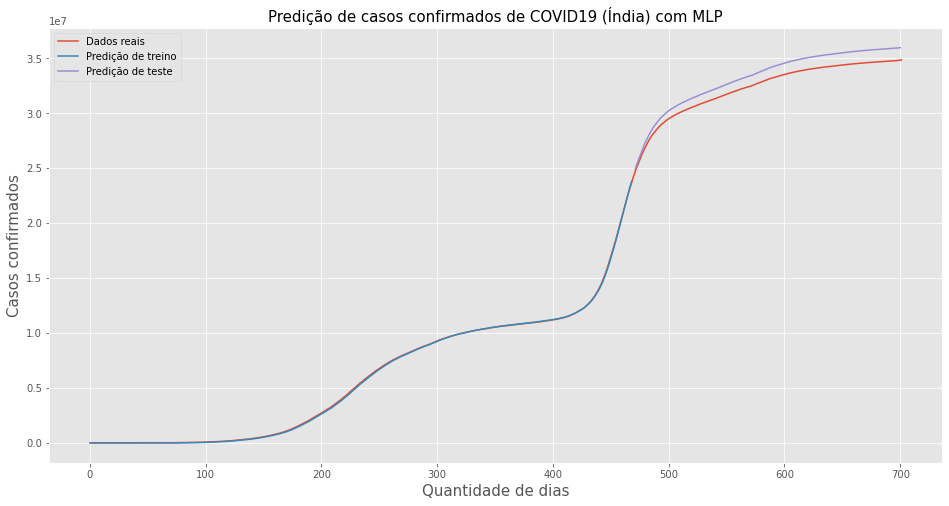

Train Score: 567785.85 RMSE
Test Score: 778756.96 RMSE
MAE: 616552.0811606005
Taxa de aprendizagem: 0.05
Dropout: 0.1
Número de células por camada: 16

 MLP - O segundo melhor - Índia 



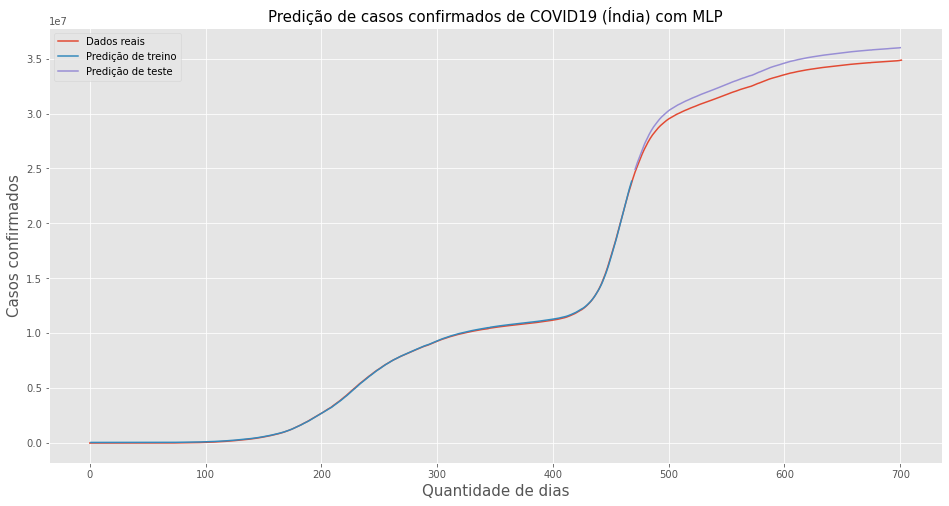

Train Score: 5815261.49 RMSE
Test Score: 27797348.20 RMSE
Taxa de aprendizagem: 0.2
Dropout: 0.2
MAE: 27695077.277159996
Número de células por camada: 16




 MLP - O melhor caso - Itália 



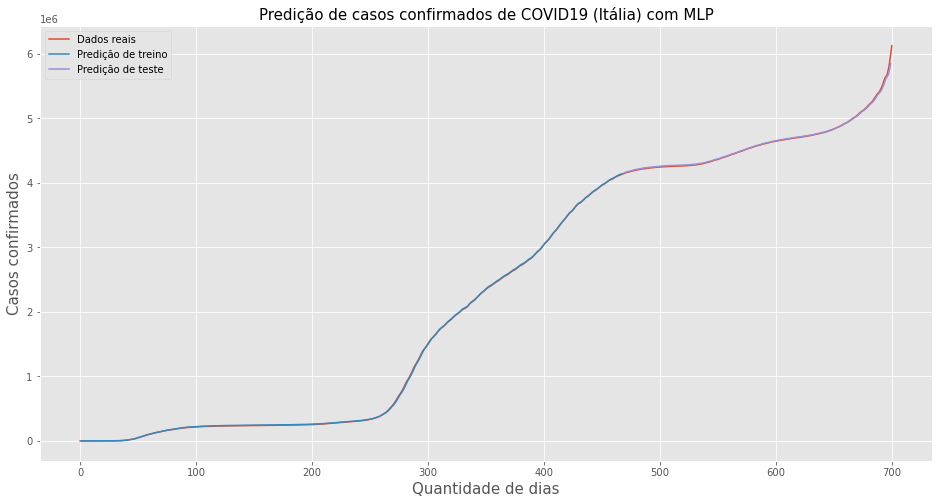

Train Score: 64537.91 RMSE
Test Score: 123301.96 RMSE
MAE: 78405.04347418065
Taxa de aprendizagem: 0.01
Dropout: 0.01
Número de células por camada: 32

 MLP - O segundo melhor - Itália 



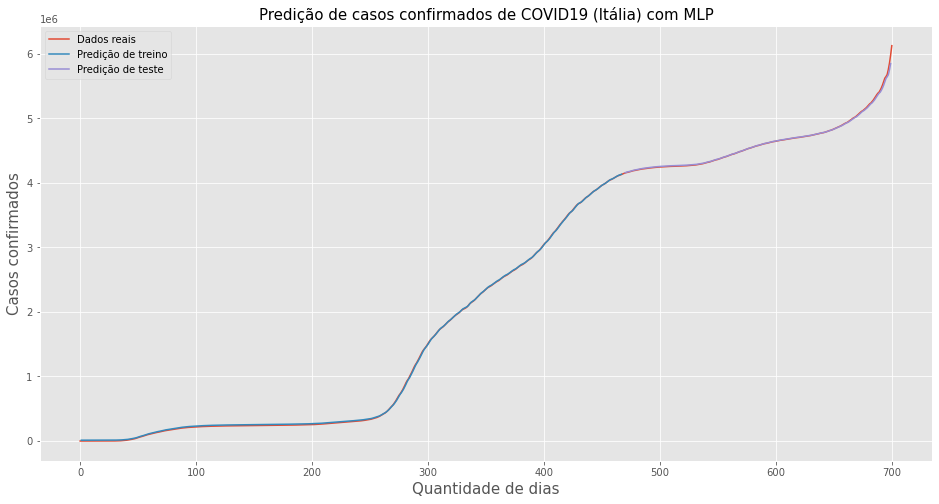

Train Score: 1370134.27 RMSE
Test Score: 3710220.63 RMSE
Taxa de aprendizagem: 0.2
Dropout: 0.2
MAE: 3691126.277861083
Número de células por camada: 32




 MLP - O melhor caso - EUA 



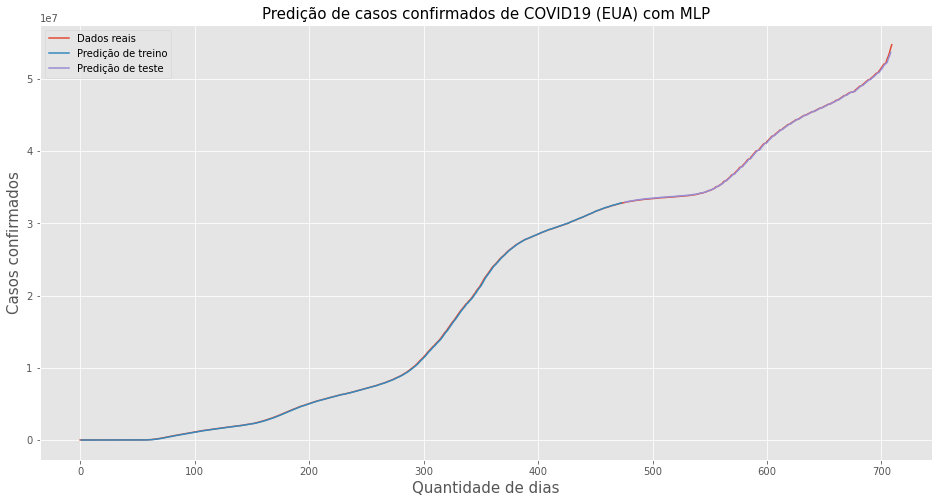

Train Score: 280513.35 RMSE
Test Score: 4690290.78 RMSE
MAE: 3722994.6673057373
Taxa de aprendizagem: 0.01
Dropout: 0.01
Número de células por camada: 64

 MLP - O segundo melhor - EUA 



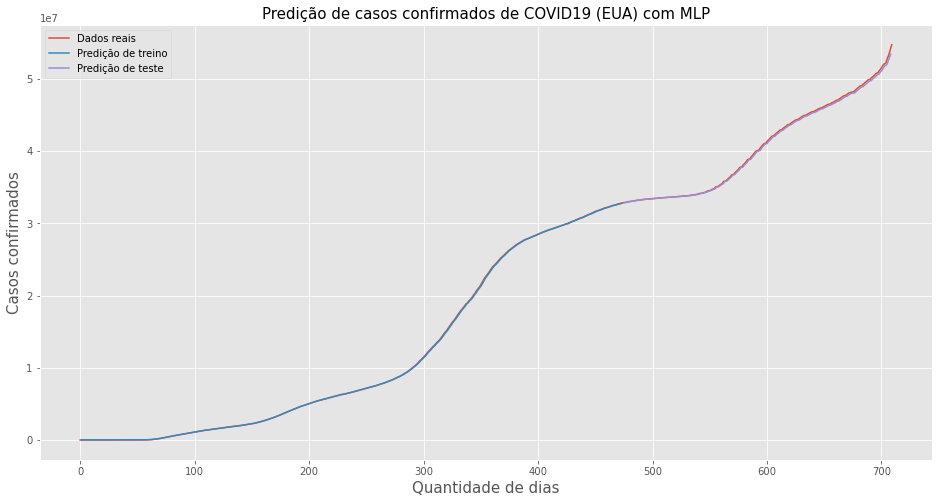

Train Score: 11459562.62 RMSE
Test Score: 30267324.44 RMSE
Taxa de aprendizagem: 0.2
Dropout: 0.2
MAE: 29588347.156576123
Número de células por camada: 64





In [30]:
#Plotar gráficos com base nas previsões do modelo MLP
for i in range(len(country)):
    print('\n MLP - O melhor caso - %s \n' %(country[i]))
    plt.figure(figsize=(16,8))
    plt.title('Predição de casos confirmados de COVID19 (%s) com MLP' %(country[i]), size = 15)
    plt.ylabel('Casos confirmados', size = 15)
    plt.xlabel('Quantidade de dias', size = 15)
    plt.plot(dts[country[i]], label = 'Dados reais')
    plt.plot(strppMLP[country[i]], label = 'Predição de treino')
    plt.plot(stsppMLP[country[i]], label = 'Predição de teste')
    plt.legend()
    plt.show()
    print('Train Score: %.2f RMSE' % (strsMLP[country[i]]))
    print('Test Score: %.2f RMSE' % (stssMLP[country[i]]))
    print('MAE:', stsmMLP[country[i]])
    print('Taxa de aprendizagem:', st_aMLP[country[i]])
    print('Dropout:', sdropoutMLP[country[i]])
    print('Número de células por camada:',sn_neu[country[i]])


    print('\n MLP - O segundo melhor - %s \n' %(country[i]))
    plt.figure(figsize=(16,8))
    plt.title('Predição de casos confirmados de COVID19 (%s) com MLP' %(country[i]), size = 15)
    plt.ylabel('Casos confirmados', size = 15)
    plt.xlabel('Quantidade de dias', size = 15)
    plt.plot(dts[country[i]], label = 'Dados reais')
    plt.plot(trppMLP[country[i]], label = 'Predição de treino')
    plt.plot(tsppMLP[country[i]], label = 'Predição de teste')
    plt.legend()
    plt.show()
    print('Train Score: %.2f RMSE' % (trsMLP[country[i]]))
    print('Test Score: %.2f RMSE' % (tssMLP[country[i]]))
    print('Taxa de aprendizagem:', t_aMLP[country[i]])
    print('Dropout:', dropoutMLP[country[i]])
    print('MAE:', tsmMLP[country[i]])
    print('Número de células por camada:',n_neu[country[i]])
 
    print('\n\n')
        
    if country[i] == 'Brasil':
        st = strppMLP[country[i]]
        ts = stsppMLP[country[i]]
        numpy.savetxt('C:/Users/Saulo Joel/GitHub/COVID-19-time-series-predictions/outputs/test/out_mlp_casos_test_brazil.csv',st,delimiter=',')
        numpy.savetxt('C:/Users/Saulo Joel/GitHub/COVID-19-time-series-predictions/outputs/train/out_mlp_casos_train_brazil.csv',ts,delimiter=',')
    if country[i] == 'Índia':
        st = strppMLP[country[i]]
        ts = stsppMLP[country[i]]
        numpy.savetxt('C:/Users/Saulo Joel/GitHub/COVID-19-time-series-predictions/outputs/test/out_mlp_casos_test_india.csv',st,delimiter=',')
        numpy.savetxt('C:/Users/Saulo Joel/GitHub/COVID-19-time-series-predictions/outputs/train/out_mlp_casos_train_india.csv',ts,delimiter=',')
    if country[i] == 'Itália':
        st = strppMLP[country[i]]
        ts = stsppMLP[country[i]]
        numpy.savetxt('C:/Users/Saulo Joel/GitHub/COVID-19-time-series-predictions/outputs/test/out_mlp_casos_test_italia.csv',st,delimiter=',')
        numpy.savetxt('C:/Users/Saulo Joel/GitHub/COVID-19-time-series-predictions/outputs/train/out_mlp_casos_train_italia.csv',ts,delimiter=',')
    if country[i] == 'EUA':
        st = strppMLP[country[i]]
        ts = stsppMLP[country[i]]
        numpy.savetxt('C:/Users/Saulo Joel/GitHub/COVID-19-time-series-predictions/outputs/test/out_mlp_casos_test_eua.csv',st,delimiter=',')
        numpy.savetxt('C:/Users/Saulo Joel/GitHub/COVID-19-time-series-predictions/outputs/train/out_mlp_casos_train_eua.csv',ts,delimiter=',')

# Implementação do modelo de Suavização Exponencial (Exponential Smoothing)

C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'
C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\tsa\holtwinters\model.py:427: FutureWarning: After 0.13 initialization must be handled at model creation
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'
C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred f

<Figure size 1152x576 with 0 Axes>

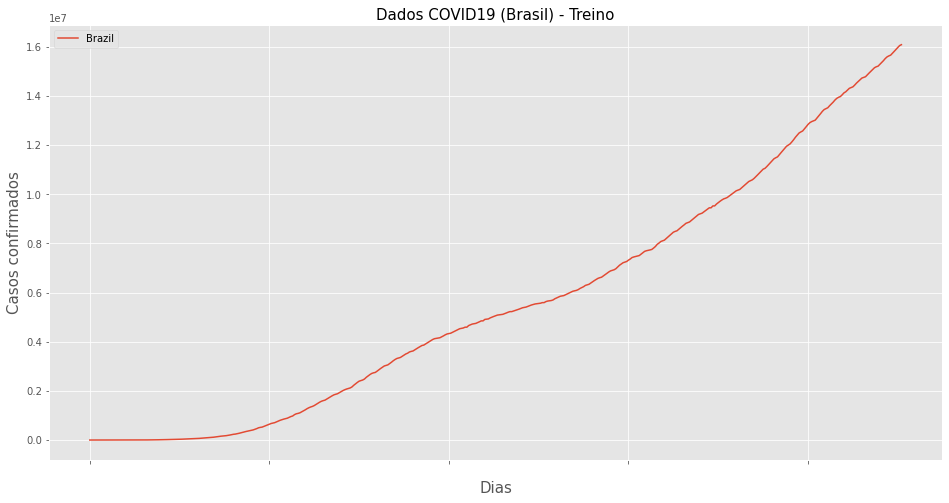

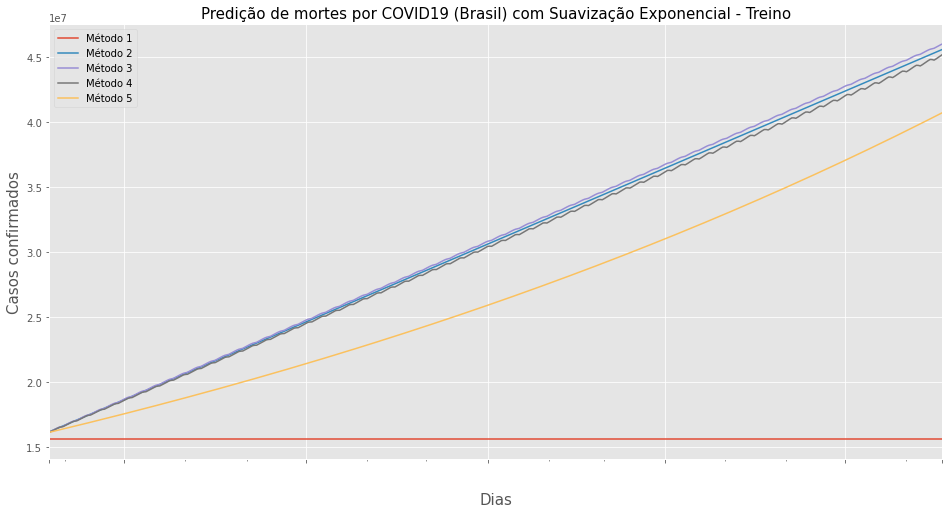

*************Métricas do Algoritmo de Suavização Simples dados de Treino*************
                                                                                                                                                                                                                                                              
Erro médio absoluto do Algoritmo de Suavização Simples : 9940577.378
Raiz do erro médio quadrado do Algoritmo de Suavização Simples : 11023910.162
                                                                                                                                                                                                                                                              
*************Métricas do Algoritmo de Suavização de Holt*************
                                                                                                                                                                                           

<Figure size 1152x576 with 0 Axes>

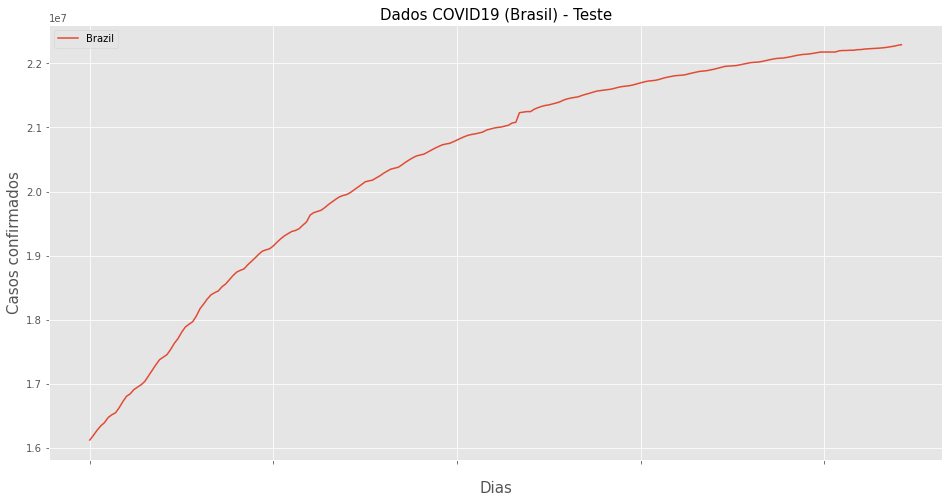

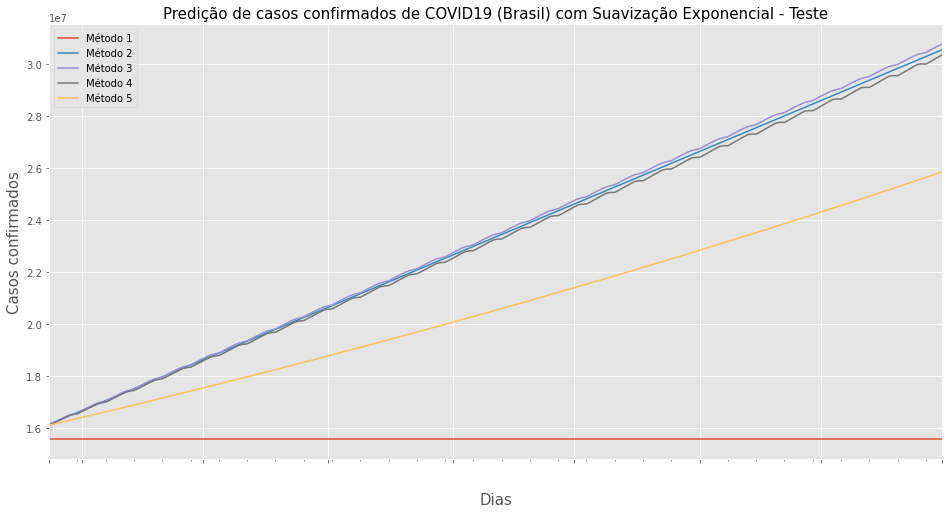

*************Métricas do Algoritmo de Suavização Simples dados de Teste*************
                                                                                                                                                                                                                                                              
Erro médio absoluto do Algoritmo de Suavização Simples : 4878498.845
Raiz do erro médio quadrado do Algoritmo de Suavização Simples : 5173054.763
                                                                                                                                                                                                                                                              
*************Métricas do Algoritmo de Suavização de Holt*************
                                                                                                                                                                                             

C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'
C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\tsa\holtwinters\model.py:427: FutureWarning: After 0.13 initialization must be handled at model creation
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'
C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred f

<Figure size 1152x576 with 0 Axes>

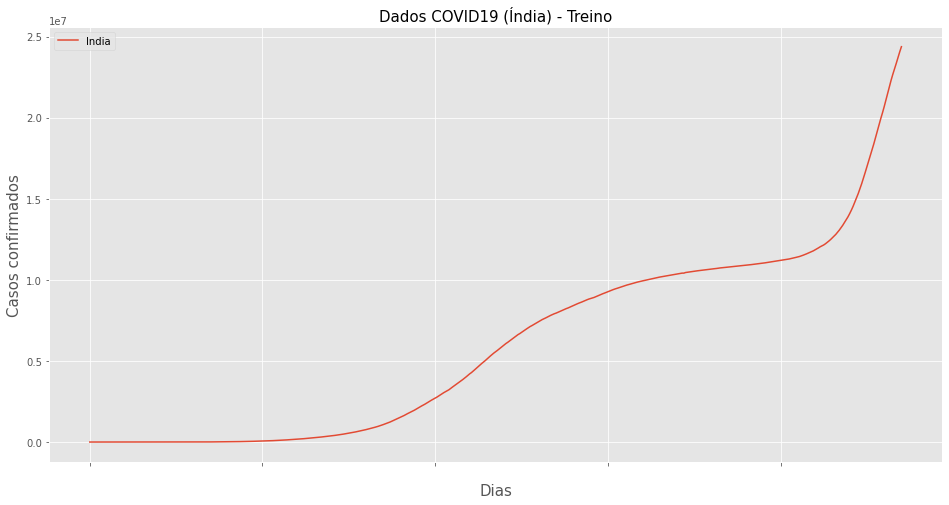

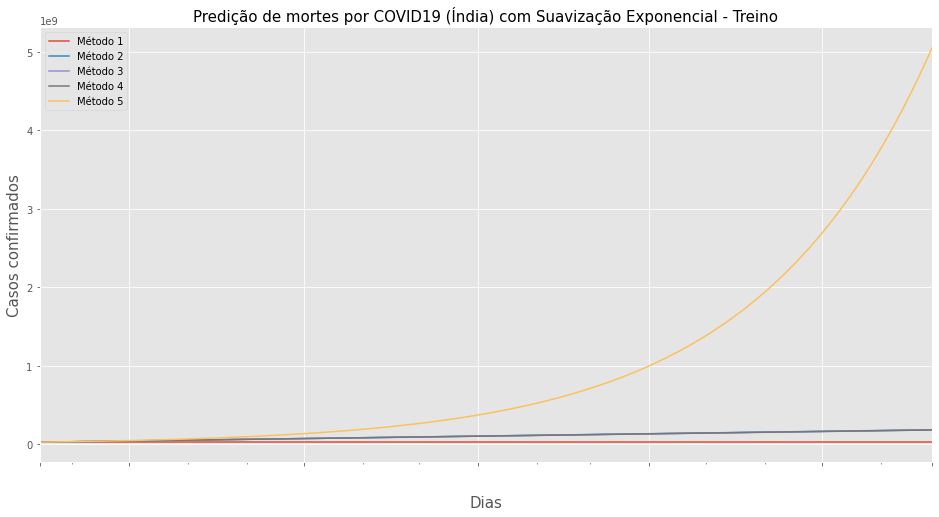

*************Métricas do Algoritmo de Suavização Simples dados de Treino*************
                                                                                                                                                                                                                                                              
Erro médio absoluto do Algoritmo de Suavização Simples : 15588514.243
Raiz do erro médio quadrado do Algoritmo de Suavização Simples : 16572588.487
                                                                                                                                                                                                                                                              
*************Métricas do Algoritmo de Suavização de Holt*************
                                                                                                                                                                                          

<Figure size 1152x576 with 0 Axes>

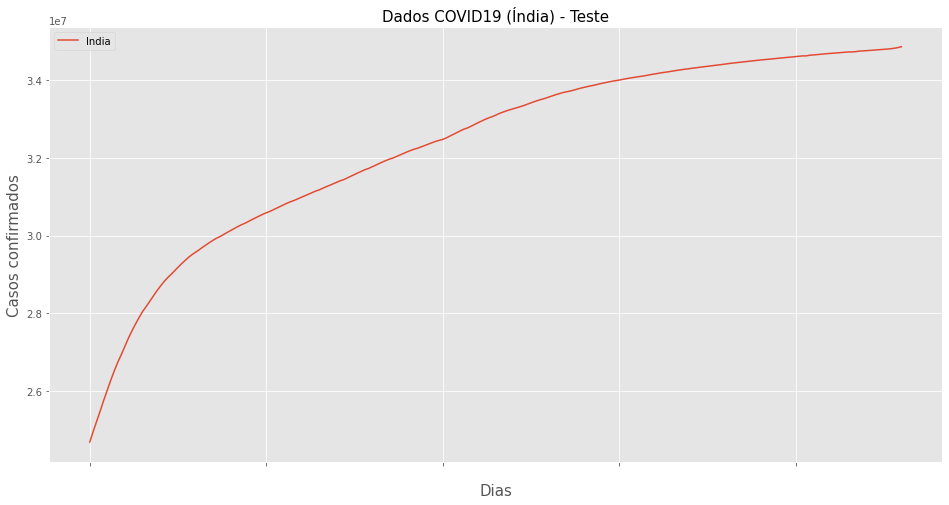

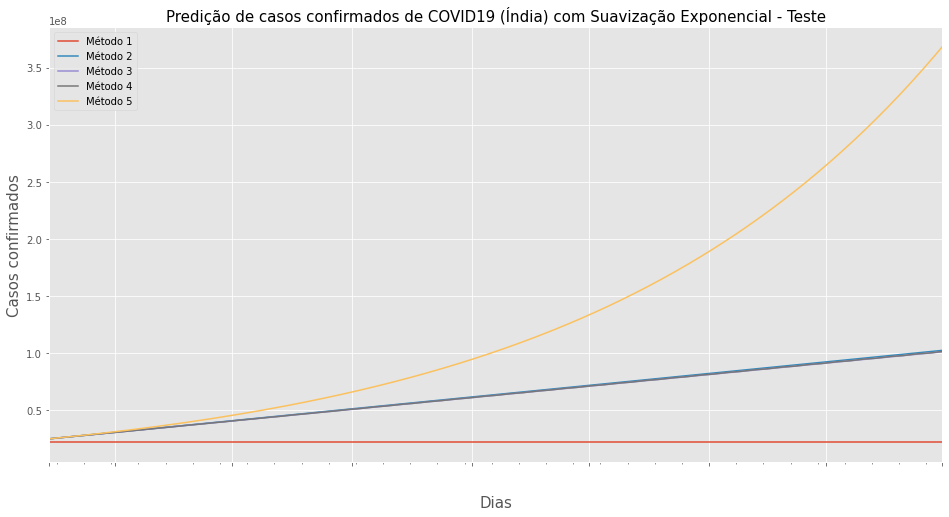

*************Métricas do Algoritmo de Suavização Simples dados de Teste*************
                                                                                                                                                                                                                                                              
Erro médio absoluto do Algoritmo de Suavização Simples : 10789126.506
Raiz do erro médio quadrado do Algoritmo de Suavização Simples : 11049151.887
                                                                                                                                                                                                                                                              
*************Métricas do Algoritmo de Suavização de Holt*************
                                                                                                                                                                                           

C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'
C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\tsa\holtwinters\model.py:427: FutureWarning: After 0.13 initialization must be handled at model creation
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'
C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred f

<Figure size 1152x576 with 0 Axes>

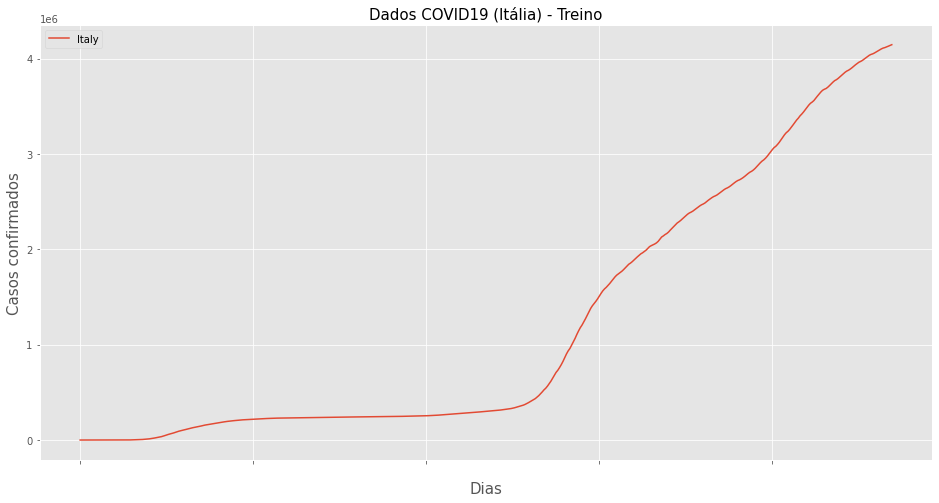

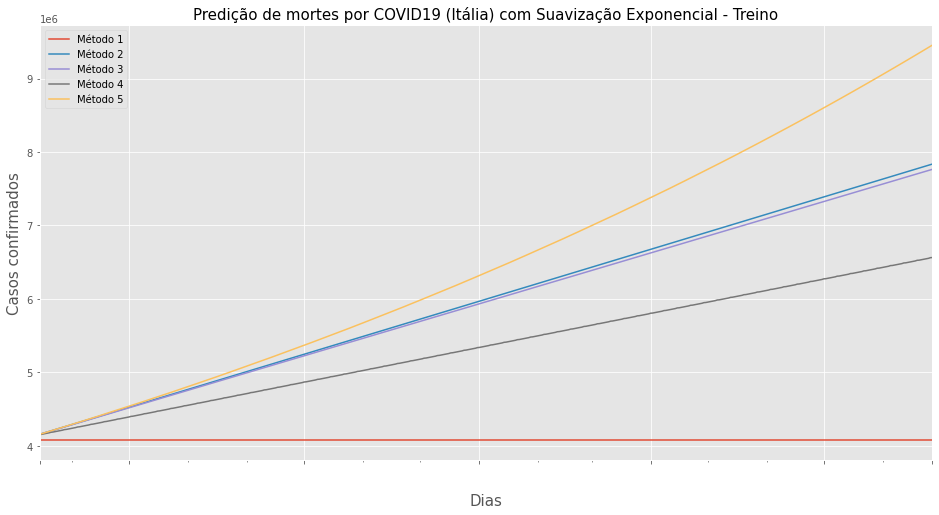

*************Métricas do Algoritmo de Suavização Simples dados de Treino*************
                                                                                                                                                                                                                                                              
Erro médio absoluto do Algoritmo de Suavização Simples : 2852222.556
Raiz do erro médio quadrado do Algoritmo de Suavização Simples : 3154041.102
                                                                                                                                                                                                                                                              
*************Métricas do Algoritmo de Suavização de Holt*************
                                                                                                                                                                                            

<Figure size 1152x576 with 0 Axes>

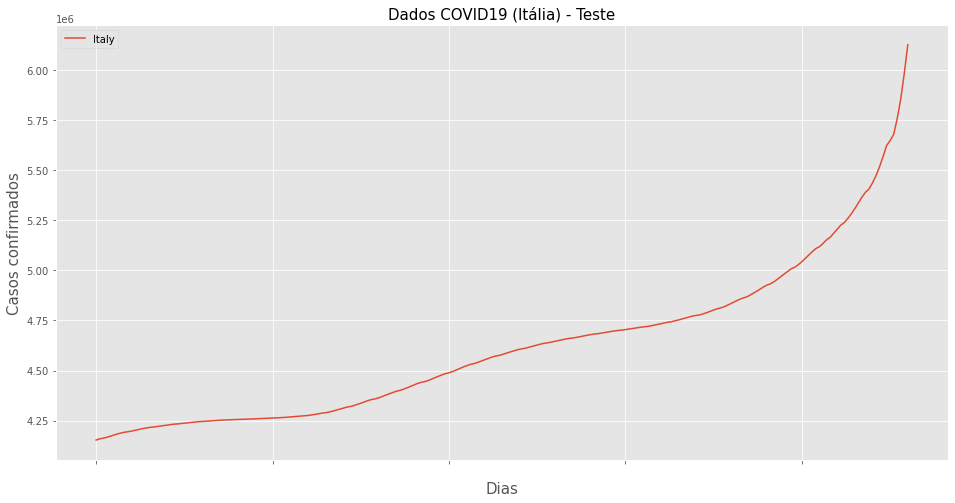

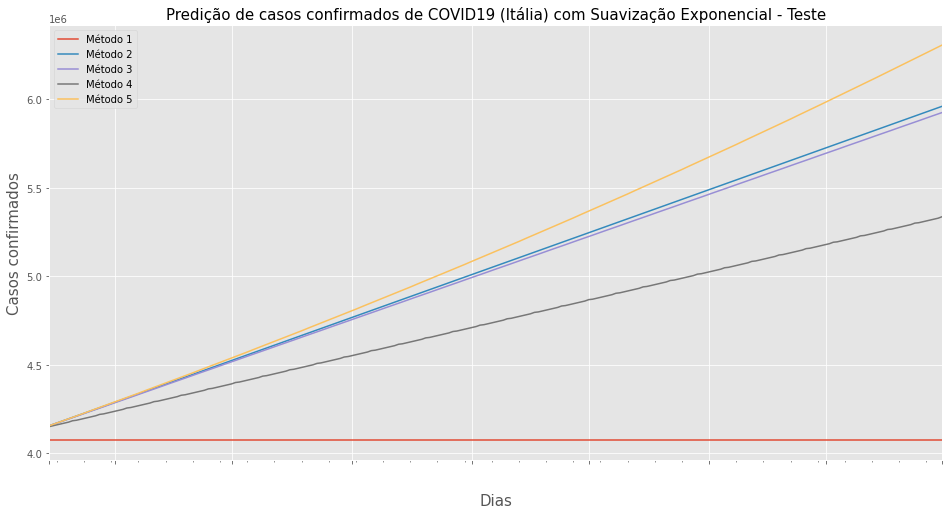

*************Métricas do Algoritmo de Suavização Simples dados de Teste*************
                                                                                                                                                                                                                                                              
Erro médio absoluto do Algoritmo de Suavização Simples : 549365.606
Raiz do erro médio quadrado do Algoritmo de Suavização Simples : 672576.205
                                                                                                                                                                                                                                                              
*************Métricas do Algoritmo de Suavização de Holt*************
                                                                                                                                                                                               

C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'
C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\tsa\holtwinters\model.py:427: FutureWarning: After 0.13 initialization must be handled at model creation
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'
C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred f

<Figure size 1152x576 with 0 Axes>

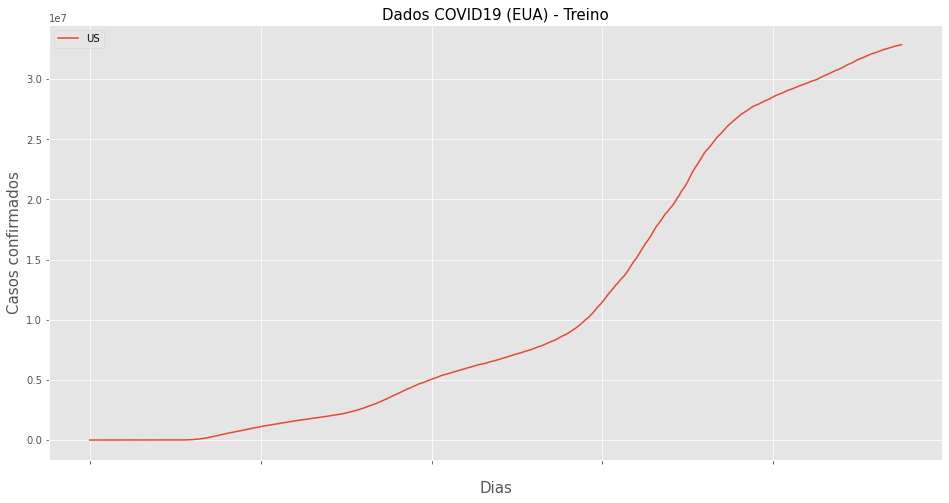

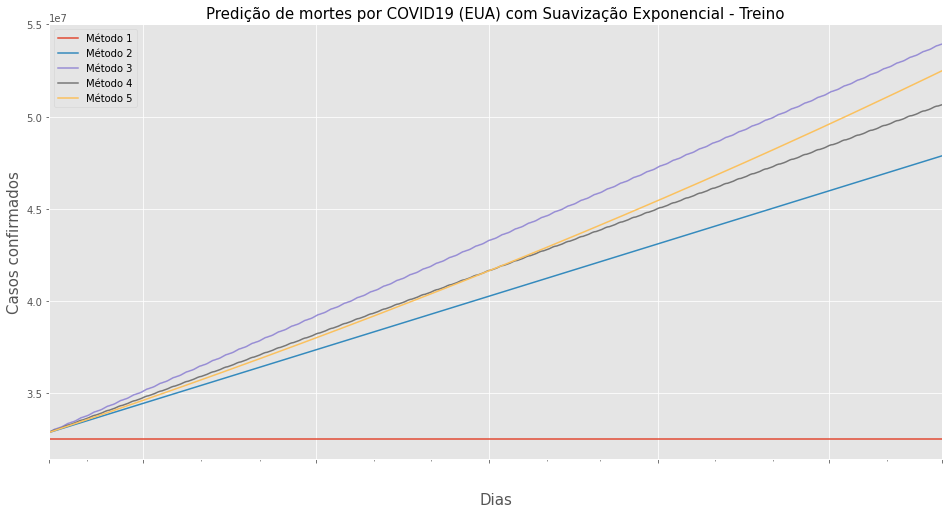

*************Métricas do Algoritmo de Suavização Simples dados de Treino*************
                                                                                                                                                                                                                                                              
Erro médio absoluto do Algoritmo de Suavização Simples : 21039560.574
Raiz do erro médio quadrado do Algoritmo de Suavização Simples : 23976752.014
                                                                                                                                                                                                                                                              
*************Métricas do Algoritmo de Suavização de Holt*************
                                                                                                                                                                                          

<Figure size 1152x576 with 0 Axes>

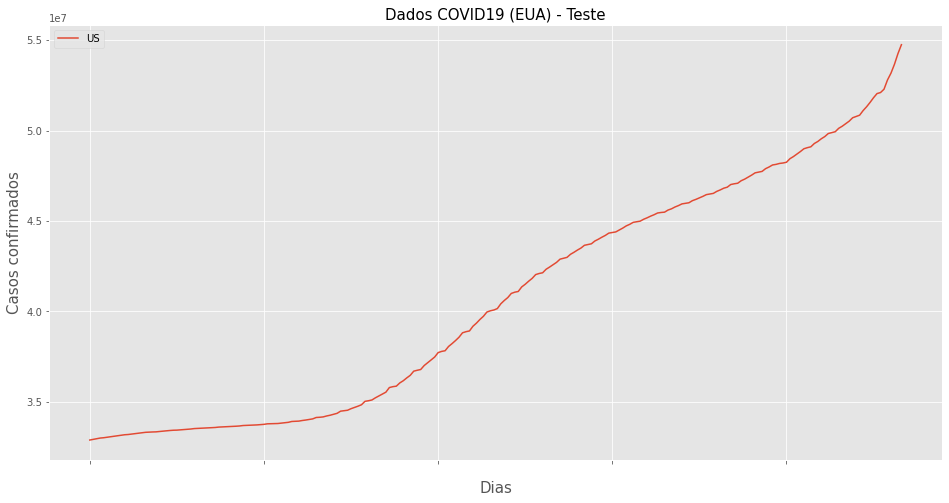

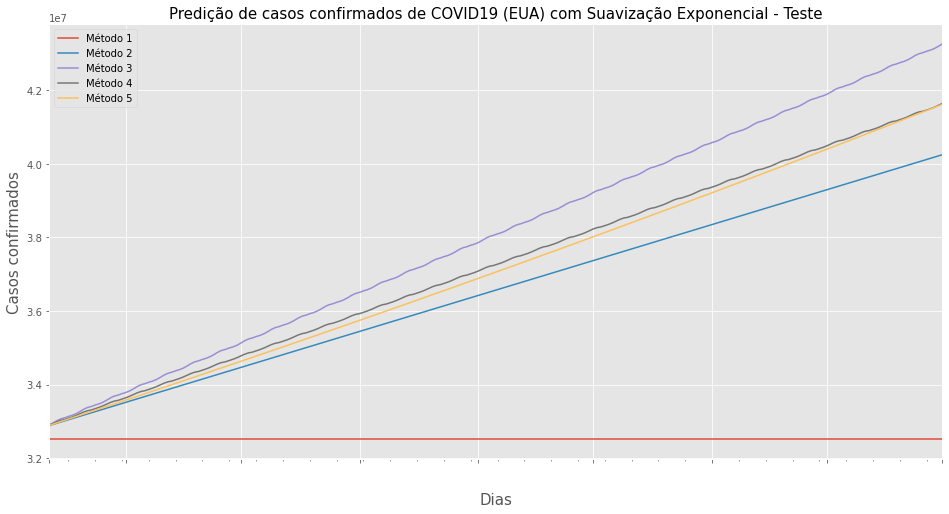

*************Métricas do Algoritmo de Suavização Simples dados de Teste*************
                                                                                                                                                                                                                                                              
Erro médio absoluto do Algoritmo de Suavização Simples : 8163775.06
Raiz do erro médio quadrado do Algoritmo de Suavização Simples : 10389479.592
                                                                                                                                                                                                                                                              
*************Métricas do Algoritmo de Suavização de Holt*************
                                                                                                                                                                                             

In [30]:
country = ['Brasil', 'Índia', 'Itália', 'EUA'] #Lista de países
for i in range(len(country)):
    if country[i] == "Brasil":
        dataframe = read_csv("datasets/countries/casos_covid19_brazil_date.csv",encoding='utf-8',index_col='date')

    if country[i] == "Índia":
        dataframe = read_csv("datasets/countries/casos_covid19_india_date.csv",encoding='utf-8',index_col='date')
        
    if country[i] == "Itália":
        dataframe = read_csv("datasets/countries/casos_covid19_italy_date.csv",encoding='utf-8',index_col='date')

    if country[i] == "EUA":
        dataframe = read_csv("datasets/countries/casos_covid19_us_date.csv",encoding='utf-8',index_col='date')
    total = len(dataframe)
    t = int(total*0.33)
    treino=dataframe.iloc[:-t]
    teste=dataframe.iloc[-t:]
    
    #Implementando modelos
    model1=SimpleExpSmoothing(treino).fit(smoothing_level=0.111,optimized=True)
    modelotreino1=model1.forecast(len(treino))
    modelo1=model1.forecast(len(teste))
    model2=Holt(treino).fit(smoothing_level=0.7187)
    modelotreino2=model2.forecast(len(treino))
    modelo2=model2.forecast(len(teste))
    model3=ExponentialSmoothing(treino,trend='add',seasonal='add').fit()
    modelotreino3=model3.forecast(len(treino))
    modelo3=model3.forecast(len(teste))
    model4=ExponentialSmoothing(treino,trend='add',seasonal='mul').fit()
    modelotreino4=model4.forecast(len(treino))
    modelo4=model4.forecast(len(teste))
    model5=ExponentialSmoothing(treino,trend='mul',seasonal='add').fit()
    modelotreino5=model5.forecast(len(treino))
    modelo5=model5.forecast(len(teste))
    
    #Plotando treinos
    plt.figure(figsize=(16,8))
    treino.plot(figsize=(16,8))
    plt.title('Dados COVID19 (%s) - Treino' %(country[i]), size = 15)
    plt.xticks(color='w')
    plt.ylabel('Casos confirmados', size = 15)
    plt.xlabel('Dias', size = 15)
    
    plt.figure(figsize=(16,8))
    modelotreino1.plot(figsize=(16,8))
    modelotreino2.plot()
    modelotreino3.plot()
    modelotreino4.plot()
    modelotreino5.plot()
    plt.title('Predição de mortes por COVID19 (%s) com Suavização Exponencial - Treino' %(country[i]), size = 15)
    plt.xticks(color='w')
    plt.ylabel('Casos confirmados', size = 15)
    plt.xlabel('Dias', size = 15)
    lista=['Método 1','Método 2','Método 3','Método 4','Método 5']
    plt.legend(lista)
    plt.show()
    
    print('*************Métricas do Algoritmo de Suavização Simples dados de Treino*************')
    print(' '*254)
    print('Erro médio absoluto do Algoritmo de Suavização Simples :',round(mean_absolute_error(treino,modelotreino1),3))
    print('Raiz do erro médio quadrado do Algoritmo de Suavização Simples :',round(mean_squared_error(treino,modelotreino1)**0.5,3))


    print(' '*254)
    print('*************Métricas do Algoritmo de Suavização de Holt*************')
    print(' '*254)
    print('Erro médio absoluto do Algoritmo de Suavização Holt:',round(mean_absolute_error(treino,modelotreino2),3))
    print('Raiz do erro médio quadrado do Algoritmo de Suavização',round(mean_squared_error(treino,modelotreino2)**0.5,3))

    print(' '*254)
    print('*************Métricas do Algoritmo de Suavização de Holt-Winters aditivo*************')
    print(' '*254)
    print('Erro médio absoluto do Algoritmo de Suavização Holt-Winters aditivo :', round(mean_absolute_error(treino,modelotreino3),3))
    print('Raiz do erro médio quadrado do Algoritmo de Suavização Holt-Winters aditivo :',round(mean_squared_error(treino,modelotreino3)**0.5,3))

    print(' '*254)
    print('*************Métricas do Algoritmo de Suavização de Holt-Winters multiplicativo*************')
    print(' '*254)
    print('Erro médio absoluto do Algoritmo de Suavização Holt-Winters multiplicativo :',round(mean_absolute_error(treino,modelotreino4),3))
    print('Raiz do erro médio quadrado do Algoritmo de Suavização Holt-Winters multiplicativo :',round(mean_squared_error(treino,modelotreino4)**0.5,3))

    print(' '*254)
    print('*************Métricas do Algoritmo de Suavização de Pegels aditivo *************')
    print(' '*254)
    print('Erro médio absoluto do Algoritmo de Suavização Pegels aditivo :',round(mean_absolute_error(treino,modelotreino5),3))
    print('Raiz do erro médio quadrado do Algoritmo de Suavização Pegels aditivo :',round(mean_squared_error(treino,modelotreino5)**0.5,3))

    print(' '*254)
    #Plotando testes
    
    plt.figure(figsize=(16,8))
    teste.plot(figsize=(16,8))
    plt.title('Dados COVID19 (%s) - Teste' %(country[i]), size = 15)
    plt.xticks(color='w')
    plt.ylabel('Casos confirmados', size = 15)
    plt.xlabel('Dias', size = 15)
    
    plt.figure(figsize=(16,8))
    modelo1.plot(figsize=(16,8))
    modelo2.plot()
    modelo3.plot()
    modelo4.plot()
    modelo5.plot()
    plt.title('Predição de casos confirmados de COVID19 (%s) com Suavização Exponencial - Teste' %(country[i]), size = 15)
    plt.xticks(color='w')
    plt.ylabel('Casos confirmados', size = 15)
    plt.xlabel('Dias', size = 15)
    lista=['Método 1','Método 2','Método 3','Método 4','Método 5']
    plt.legend(lista)
    plt.show()
    print('*************Métricas do Algoritmo de Suavização Simples dados de Teste*************')
    print(' '*254)
    print('Erro médio absoluto do Algoritmo de Suavização Simples :',round(mean_absolute_error(teste,modelo1),3))
    print('Raiz do erro médio quadrado do Algoritmo de Suavização Simples :',round(mean_squared_error(teste,modelo1)**0.5,3))


    print(' '*254)
    print('*************Métricas do Algoritmo de Suavização de Holt*************')
    print(' '*254)
    print('Erro médio absoluto do Algoritmo de Suavização Holt:',round(mean_absolute_error(teste,modelo2),3))
    print('Raiz do erro médio quadrado do Algoritmo de Suavização',round(mean_squared_error(teste,modelo2)**0.5,3))

    print(' '*254)
    print('*************Métricas do Algoritmo de Suavização de Holt-Winters aditivo*************')
    print(' '*254)
    print('Erro médio absoluto do Algoritmo de Suavização Holt-Winters aditivo :', round(mean_absolute_error(teste,modelo3),3))
    print('Raiz do erro médio quadrado do Algoritmo de Suavização Holt-Winters aditivo :',round(mean_squared_error(teste,modelo3)**0.5,3))

    print(' '*254)
    print('*************Métricas do Algoritmo de Suavização de Holt-Winters multiplicativo*************')
    print(' '*254)
    print('Erro médio absoluto do Algoritmo de Suavização Holt-Winters multiplicativo :',round(mean_absolute_error(teste,modelo4),3))
    print('Raiz do erro médio quadrado do Algoritmo de Suavização Holt-Winters multiplicativo :',round(mean_squared_error(teste,modelo4)**0.5,3))

    print(' '*254)
    print('*************Métricas do Algoritmo de Suavização de Pegels aditivo *************')
    print(' '*254)
    print('Erro médio absoluto do Algoritmo de Suavização Pegels aditivo :',round(mean_absolute_error(teste,modelo5),3))
    print('Raiz do erro médio quadrado do Algoritmo de Suavização Pegels aditivo :',round(mean_squared_error(teste,modelo5)**0.5,3))

    print(' '*254)

# Implementação do Modelo ARIMA

In [4]:
#Criando dicionários
preds = dict()
outtest = dict()
outtrain = dict()
rmses = dict()
rmses_t = dict()
trainss = dict()
maes = dict()
country = ['Brasil', 'Índia', 'Itália', 'EUA'] #Lista de países

In [14]:
#Verificando melhores parâmetros (p,d,q)
from pmdarima.arima import auto_arima

for i in range(len(country)):
    if country[i] == "Brasil":
        dataframe = read_csv("datasets/countries/casos_covid19_brazil_date.csv",encoding='utf-8',index_col='date')

    if country[i] == "Índia":
        dataframe = read_csv("datasets/countries/casos_covid19_india_date.csv",encoding='utf-8',index_col='date')
        
    if country[i] == "Itália":
        dataframe = read_csv("datasets/countries/casos_covid19_italy_date.csv",encoding='utf-8',index_col='date')

    if country[i] == "EUA":
        dataframe = read_csv("datasets/countries/casos_covid19_us_date.csv",encoding='utf-8',index_col='date')
    bruteforce_modelo = auto_arima(dataframe, start_p=0, start_d=0 ,start_q=0,max_p=8, max_d=8,max_q=8, m=12, start_P=0, seasonal=True, d=1, D=1, trace=True, error_action='ignore',suppress_warnings=True, stepwise=False)
    print('Resultados do ', country[i])
    print(f"Resultado AIC: {bruteforce_modelo.aic()}")
    print(f"Melhores parâmetros (p,d,q): {bruteforce_modelo.order}")


 ARIMA(0,1,0)(0,1,0)[12]             : AIC=15215.844, Time=0.05 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=15006.573, Time=0.35 sec
 ARIMA(0,1,0)(0,1,2)[12]             : AIC=15011.212, Time=0.72 sec
 ARIMA(0,1,0)(1,1,0)[12]             : AIC=15101.537, Time=0.20 sec
 ARIMA(0,1,0)(1,1,1)[12]             : AIC=14995.629, Time=0.50 sec
 ARIMA(0,1,0)(1,1,2)[12]             : AIC=14994.996, Time=1.99 sec
 ARIMA(0,1,0)(2,1,0)[12]             : AIC=14910.414, Time=0.62 sec
 ARIMA(0,1,0)(2,1,1)[12]             : AIC=14902.436, Time=0.97 sec
 ARIMA(0,1,0)(2,1,2)[12]             : AIC=14871.836, Time=1.97 sec
 ARIMA(0,1,1)(0,1,0)[12]             : AIC=15152.093, Time=0.10 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=14925.483, Time=0.50 sec
 ARIMA(0,1,1)(0,1,2)[12]             : AIC=14919.849, Time=1.16 sec
 ARIMA(0,1,1)(1,1,0)[12]             : AIC=15012.041, Time=0.43 sec
 ARIMA(0,1,1)(1,1,1)[12]             : AIC=14923.421, Time=0.78 sec
 ARIMA(0,1,1)(1,1,2)[12]             : AIC=14917

 ARIMA(0,1,2)(2,1,0)[12]             : AIC=15861.108, Time=1.14 sec
 ARIMA(0,1,2)(2,1,1)[12]             : AIC=inf, Time=2.71 sec
 ARIMA(0,1,3)(0,1,0)[12]             : AIC=inf, Time=3.67 sec
 ARIMA(0,1,3)(0,1,1)[12]             : AIC=inf, Time=3.48 sec
 ARIMA(0,1,3)(0,1,2)[12]             : AIC=inf, Time=4.72 sec
 ARIMA(0,1,3)(1,1,0)[12]             : AIC=inf, Time=3.04 sec
 ARIMA(0,1,3)(1,1,1)[12]             : AIC=inf, Time=4.40 sec
 ARIMA(0,1,3)(2,1,0)[12]             : AIC=inf, Time=8.11 sec
 ARIMA(0,1,4)(0,1,0)[12]             : AIC=15810.410, Time=1.14 sec
 ARIMA(0,1,4)(0,1,1)[12]             : AIC=15812.409, Time=2.50 sec
 ARIMA(0,1,4)(1,1,0)[12]             : AIC=15812.409, Time=1.99 sec
 ARIMA(0,1,5)(0,1,0)[12]             : AIC=15816.246, Time=2.97 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=14678.466, Time=0.04 sec
 ARIMA(1,1,0)(0,1,1)[12]             : AIC=inf, Time=2.11 sec
 ARIMA(1,1,0)(0,1,2)[12]             : AIC=inf, Time=4.75 sec
 ARIMA(1,1,0)(1,1,0)[12]          

 ARIMA(1,1,2)(0,1,0)[12]             : AIC=13391.011, Time=0.67 sec
 ARIMA(1,1,2)(0,1,1)[12]             : AIC=inf, Time=4.19 sec
 ARIMA(1,1,2)(0,1,2)[12]             : AIC=inf, Time=8.34 sec
 ARIMA(1,1,2)(1,1,0)[12]             : AIC=13304.841, Time=2.28 sec
 ARIMA(1,1,2)(1,1,1)[12]             : AIC=inf, Time=7.33 sec
 ARIMA(1,1,2)(2,1,0)[12]             : AIC=13225.937, Time=8.53 sec
 ARIMA(1,1,3)(0,1,0)[12]             : AIC=inf, Time=2.69 sec
 ARIMA(1,1,3)(0,1,1)[12]             : AIC=inf, Time=5.78 sec
 ARIMA(1,1,3)(1,1,0)[12]             : AIC=13289.670, Time=1.87 sec
 ARIMA(1,1,4)(0,1,0)[12]             : AIC=13370.542, Time=1.33 sec
 ARIMA(2,1,0)(0,1,0)[12]             : AIC=13420.712, Time=0.10 sec
 ARIMA(2,1,0)(0,1,1)[12]             : AIC=inf, Time=2.61 sec
 ARIMA(2,1,0)(0,1,2)[12]             : AIC=inf, Time=5.52 sec
 ARIMA(2,1,0)(1,1,0)[12]             : AIC=13306.259, Time=3.67 sec
 ARIMA(2,1,0)(1,1,1)[12]             : AIC=inf, Time=4.97 sec
 ARIMA(2,1,0)(1,1,2)[12]    

 ARIMA(3,1,0)(0,1,0)[12]             : AIC=16997.671, Time=0.26 sec
 ARIMA(3,1,0)(0,1,1)[12]             : AIC=inf, Time=2.09 sec
 ARIMA(3,1,0)(0,1,2)[12]             : AIC=inf, Time=4.47 sec
 ARIMA(3,1,0)(1,1,0)[12]             : AIC=16926.032, Time=1.19 sec
 ARIMA(3,1,0)(1,1,1)[12]             : AIC=inf, Time=2.92 sec
 ARIMA(3,1,0)(2,1,0)[12]             : AIC=16891.362, Time=2.73 sec
 ARIMA(3,1,1)(0,1,0)[12]             : AIC=16999.645, Time=0.34 sec
 ARIMA(3,1,1)(0,1,1)[12]             : AIC=inf, Time=5.55 sec
 ARIMA(3,1,1)(1,1,0)[12]             : AIC=16877.839, Time=6.47 sec
 ARIMA(3,1,2)(0,1,0)[12]             : AIC=16745.815, Time=1.41 sec
 ARIMA(4,1,0)(0,1,0)[12]             : AIC=16999.624, Time=0.49 sec
 ARIMA(4,1,0)(0,1,1)[12]             : AIC=inf, Time=2.69 sec
 ARIMA(4,1,0)(1,1,0)[12]             : AIC=16925.552, Time=1.85 sec
 ARIMA(4,1,1)(0,1,0)[12]             : AIC=16996.099, Time=1.51 sec
 ARIMA(5,1,0)(0,1,0)[12]             : AIC=16982.031, Time=0.92 sec

Best mode

In [22]:
#Parâmetros
p = {'Brasil':2, 'Índia':3, 'Itália':1, 'EUA':1}
d = {'Brasil':1, 'Índia':1, 'Itália':1, 'EUA':1}
q = {'Brasil':2, 'Índia':0, 'Itália':1, 'EUA':3}

# load dataset
for i in range(len(country)):
    if country[i] == 'Brasil':
        series = read_csv('datasets/countries/casos_covid19_brazil.csv', usecols=[1], engine='python')
    if country[i] == 'Índia':
        series = read_csv('datasets/countries/casos_covid19_india.csv', usecols=[1], engine='python')
    if country[i] == 'Itália':
        series = read_csv('datasets/countries/casos_covid19_italy.csv', usecols=[1], engine='python')
    if country[i] == 'EUA':
        series = read_csv('datasets/countries/casos_covid19_us.csv', usecols=[1], engine='python')
    # split into train and test sets
    X = series.values
    size = int(len(X) * 0.66)
    train, test = X[0:size], X[size:len(X)]
    trains = list()
    predictions = list()
    history = [x for x in train]
    # walk-forward validation
    for t in range(len(train)):
        model = ARIMA(history, order=(p[country[i]],d[country[i]],q[country[i]]))
        model_fit = model.fit()
        output = model_fit.forecast()
        yhat = output[0]
        trains.append(yhat)
        obs = train[t]
        history.append(obs)
        #print('predicted=%f, expected=%f' % (yhat, obs))
        # evaluate forecasts
    for t in range(len(test)):
        model = ARIMA(history, order=(p[country[i]],d[country[i]],q[country[i]]))
        model_fit = model.fit()
        output = model_fit.forecast()
        yhat = output[0]
        predictions.append(yhat)
        obs = test[t]
        history.append(obs)
        #print('predicted=%f, expected=%f' % (yhat, obs))
        # evaluate forecasts
    mae = mean_absolute_error(test, predictions)
    rmse_t = math.sqrt(mean_squared_error(train, trains))
    rmse = math.sqrt(mean_squared_error(test, predictions))
    maes[country[i]] = mae
    rmses[country[i]] = rmse
    rmses_t[country[i]] = rmse_t
    trainss[country[i]] = trains
    preds[country[i]] = predictions
    outtest[country[i]] = test
    outtrain[country[i]] = train

C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\ProgramDat

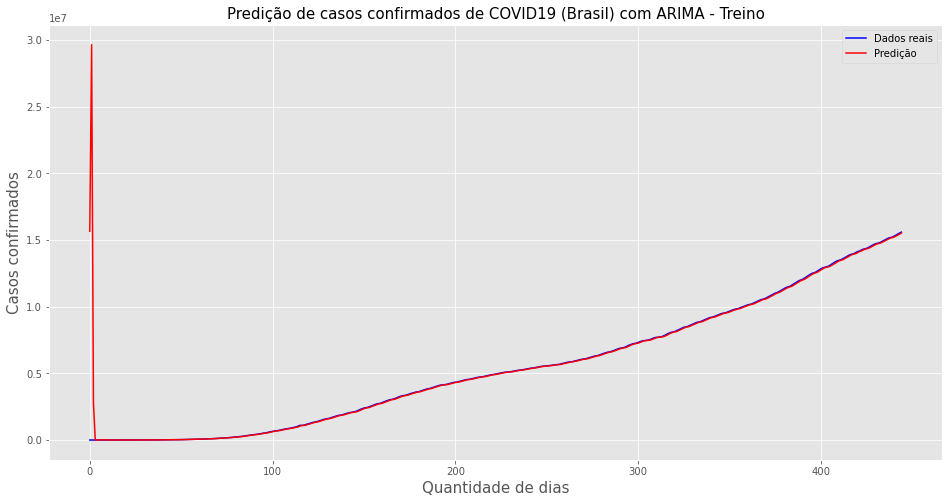

Train RMSE: 1596381.186


p: 2 d: 1 q: 2


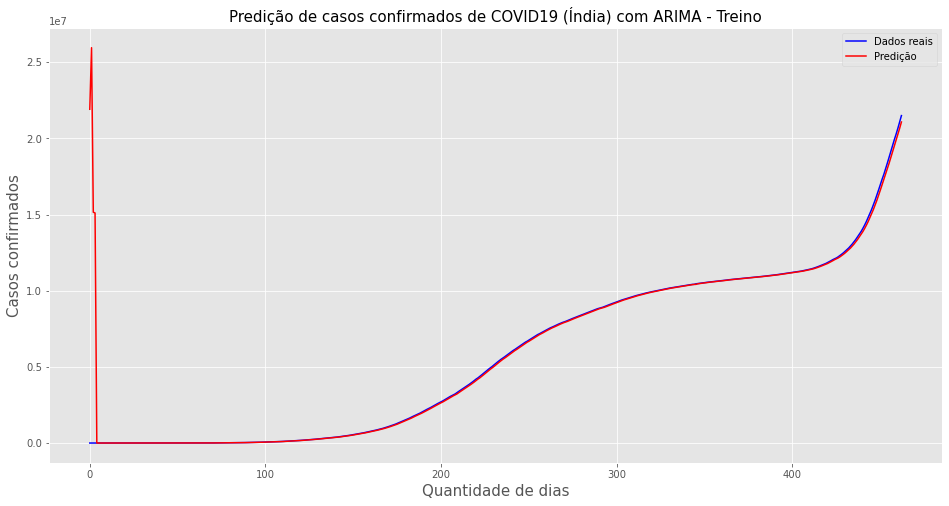

Train RMSE: 1867320.668


p: 3 d: 1 q: 0


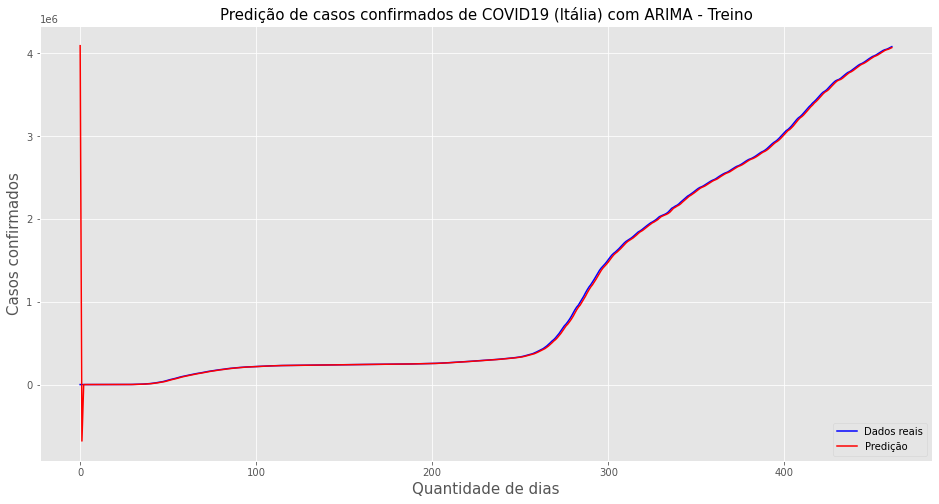

Train RMSE: 193538.040


p: 1 d: 1 q: 1


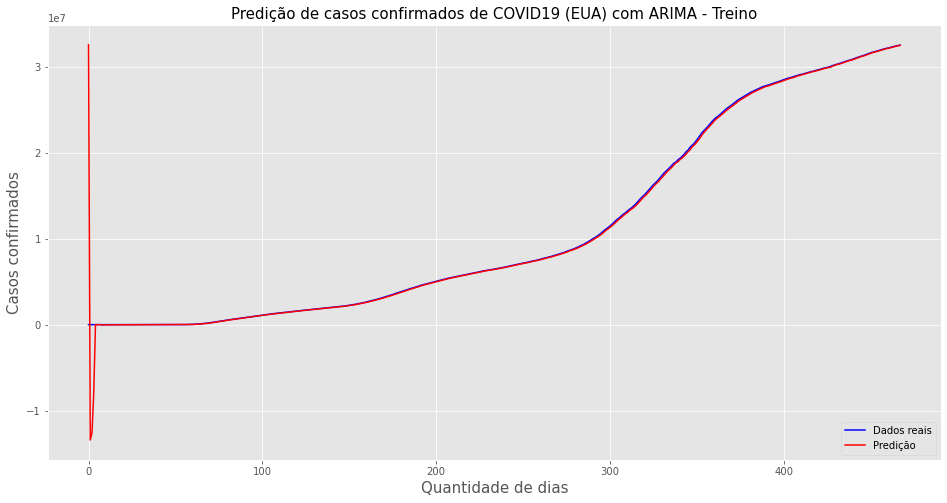

Train RMSE: 1771757.417


p: 1 d: 1 q: 3


In [24]:
#Plotando treinos
for i in range(len(country)):
    plt.figure(figsize=(16,8))
    plt.title('Predição de casos confirmados de COVID19 (%s) com ARIMA - Treino' %(country[i]), size = 15)
    plt.ylabel('Casos confirmados', size = 15)
    plt.xlabel('Quantidade de dias', size = 15)
    plt.plot(outtrain[country[i]], label = 'Dados reais', color = 'blue')
    plt.plot(trainss[country[i]], label = 'Predição', color='red')
    plt.legend()
    plt.show()
    print('Train RMSE: %.3f\n\n' % rmses_t[country[i]])
    print("p:", p[country[i]],"d:",d[country[i]],"q:",q[country[i]])
    

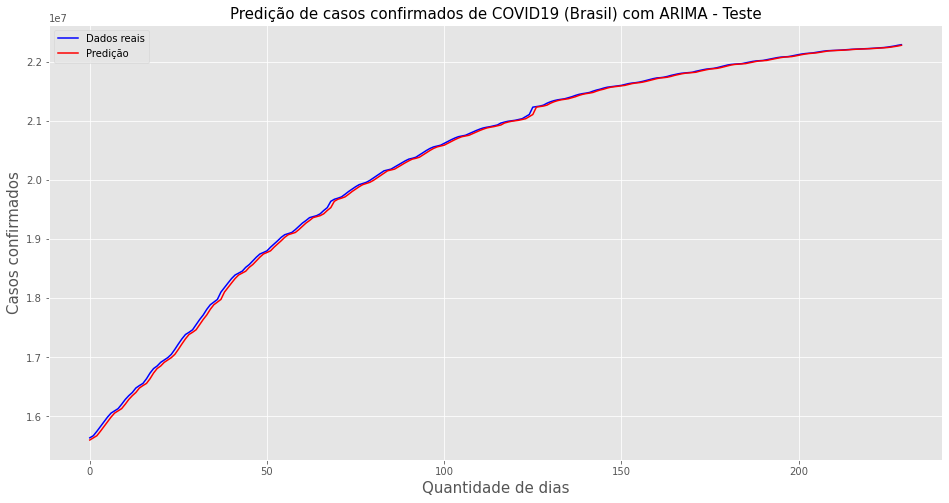

Test RMSE: 38694.762


Test MAE: 28971.436


p: 2 d: 1 q: 2


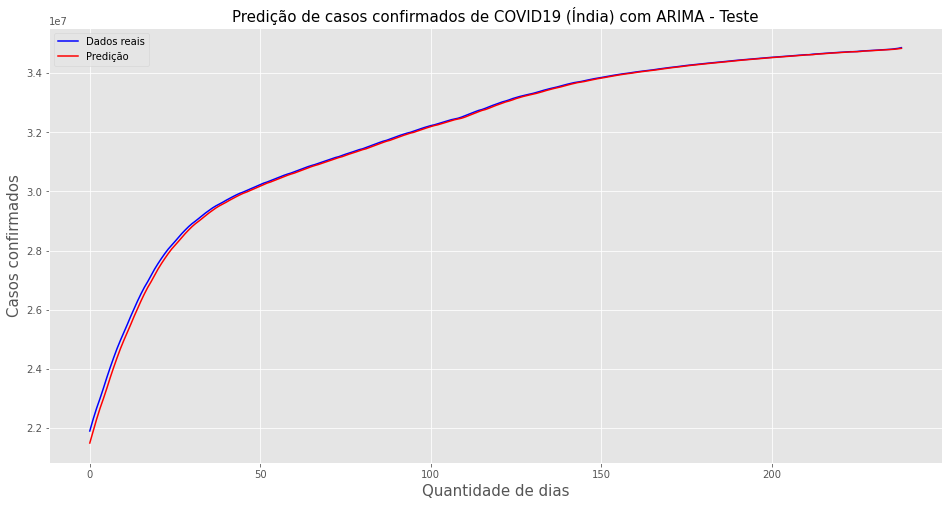

Test RMSE: 98037.786


Test MAE: 56061.129


p: 3 d: 1 q: 0


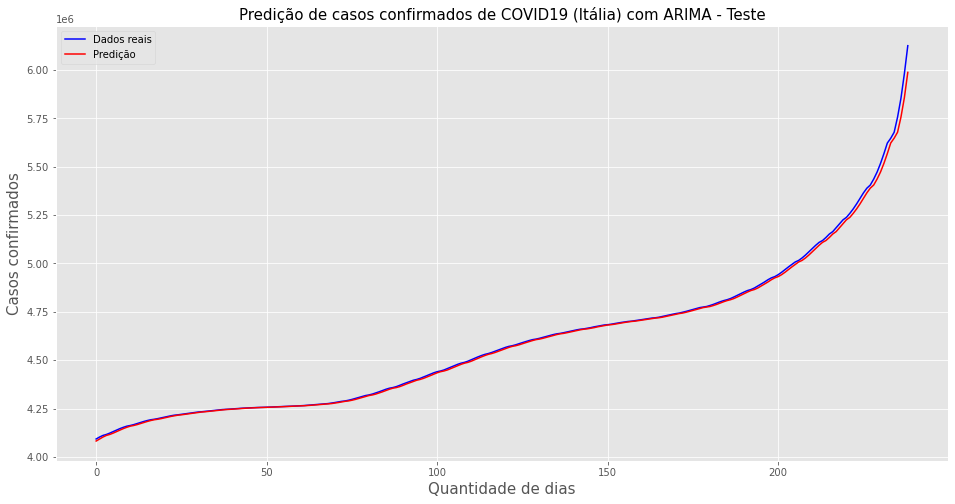

Test RMSE: 17674.492


Test MAE: 8463.160


p: 1 d: 1 q: 1


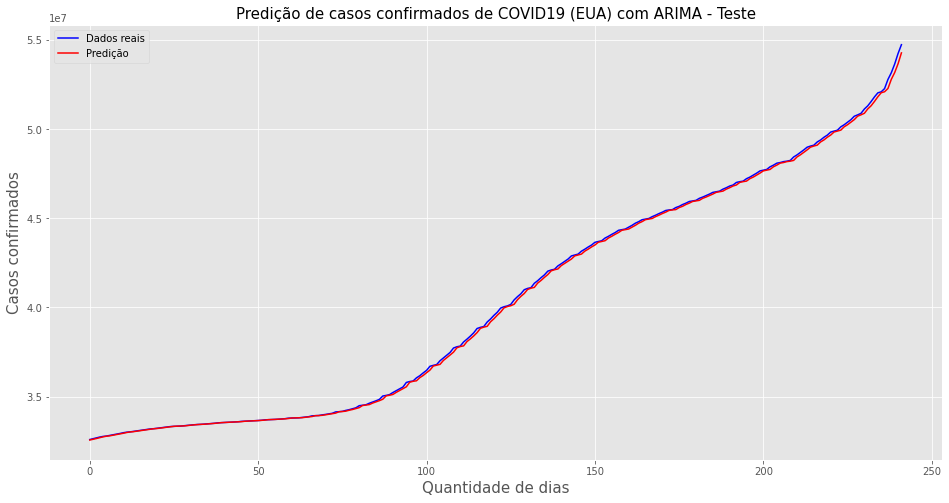

Test RMSE: 122286.518


Test MAE: 84348.031


p: 1 d: 1 q: 3


In [29]:
#Plotando testes
for i in range(len(country)):
    plt.figure(figsize=(16,8))
    plt.title('Predição de casos confirmados de COVID19 (%s) com ARIMA - Teste' %(country[i]), size = 15)
    plt.ylabel('Casos confirmados', size = 15)
    plt.xlabel('Quantidade de dias', size = 15)
    plt.plot(outtest[country[i]], label = 'Dados reais', color = 'blue')
    plt.plot(preds[country[i]], label = 'Predição', color='red')
    plt.legend()
    plt.show()
    print('Test RMSE: %.3f\n\n' % rmses[country[i]])
    print('Test MAE: %.3f\n\n' % maes[country[i]])
    print("p:", p[country[i]],"d:",d[country[i]],"q:",q[country[i]])
    
    #Armazenando predições
    if country[i] == 'Brasil':
        st = preds[country[i]]
        numpy.savetxt('C:/Users/Saulo Joel/GitHub/COVID-19-time-series-predictions/outputs/test/out_arima_casos_test_brazil.csv',st,delimiter=',')
        
    if country[i] == 'Índia':
        st = preds[country[i]]
        numpy.savetxt('C:/Users/Saulo Joel/GitHub/COVID-19-time-series-predictions/outputs/test/out_arima_casos_test_india.csv',st,delimiter=',')
            
    if country[i] == 'Itália':
        st = preds[country[i]]
        numpy.savetxt('C:/Users/Saulo Joel/GitHub/COVID-19-time-series-predictions/outputs/test/out_arima_casos_test_italia.csv',st,delimiter=',')
           
    if country[i] == 'EUA':
        st = preds[country[i]]
        numpy.savetxt('C:/Users/Saulo Joel/GitHub/COVID-19-time-series-predictions/outputs/test/out_mlp_casos_test_eua.csv',st,delimiter=',')
            

C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


                               SARIMAX Results                                
Dep. Variable:                 Brazil   No. Observations:                  675
Model:                 ARIMA(2, 1, 2)   Log Likelihood               -7340.050
Date:                Thu, 06 Jan 2022   AIC                          14690.100
Time:                        02:20:50   BIC                          14712.666
Sample:                             0   HQIC                         14698.838
                                - 675                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          1.0838      0.069     15.657      0.000       0.948       1.219
ar.L2         -0.0849      0.069     -1.231      0.218      -0.220       0.050
ma.L1         -0.5212      0.070     -7.399      0.0

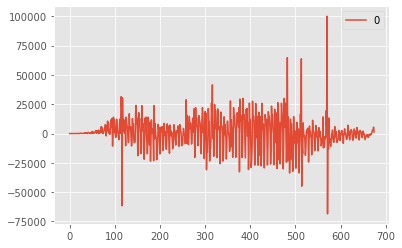

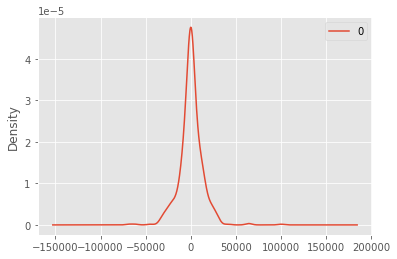

                   0
count     675.000000
mean      350.387266
std     12951.290332
min    -68565.094039
25%     -5082.408847
50%       202.797222
75%      6051.168803
max    100088.157521


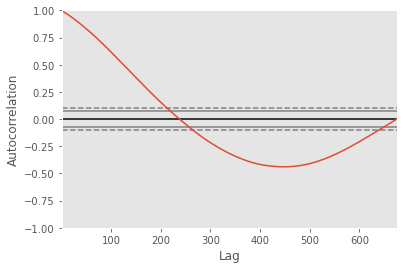

                               SARIMAX Results                                
Dep. Variable:                  India   No. Observations:                  702
Model:                 ARIMA(3, 1, 0)   Log Likelihood               -7187.732
Date:                Thu, 06 Jan 2022   AIC                          14383.463
Time:                        02:20:50   BIC                          14401.673
Sample:                             0   HQIC                         14390.502
                                - 702                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          1.1299      0.016     68.939      0.000       1.098       1.162
ar.L2         -0.1696      0.028     -6.150      0.000      -0.224      -0.116
ar.L3          0.0366      0.021      1.784      0.0

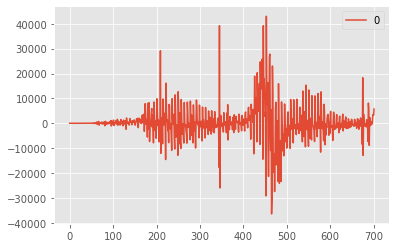

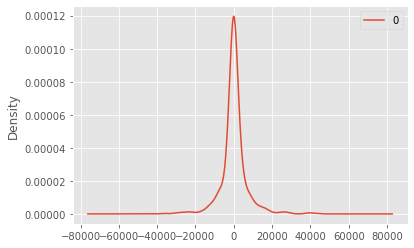

                  0
count    702.000000
mean     185.340394
std     6865.084737
min   -36437.170718
25%    -1592.312335
50%        0.000000
75%     1570.429653
max    43021.949756


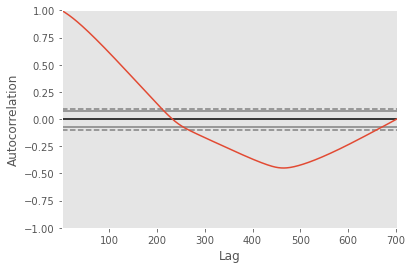

C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'


                               SARIMAX Results                                
Dep. Variable:                  Italy   No. Observations:                  701
Model:                 ARIMA(1, 1, 1)   Log Likelihood               -6651.219
Date:                Thu, 06 Jan 2022   AIC                          13308.438
Time:                        02:20:51   BIC                          13322.091
Sample:                             0   HQIC                         13313.715
                                - 701                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          1.0000      0.004    268.335      0.000       0.993       1.007
ma.L1          0.3379      0.008     40.977      0.000       0.322       0.354
sigma2      1.045e+07   3.08e-10   3.39e+16      0.0

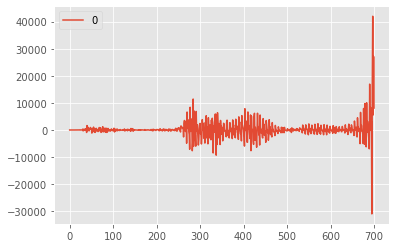

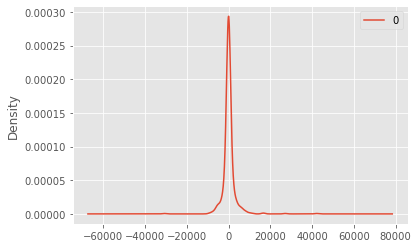

                  0
count    701.000000
mean     156.799608
std     3233.989513
min   -30958.074519
25%     -453.036663
50%       -0.001991
75%      475.945475
max    41966.451051


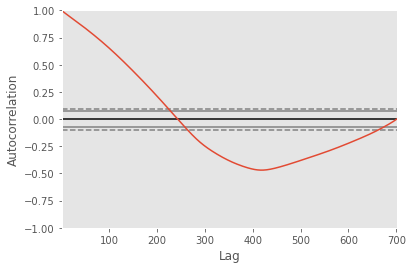

C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'


                               SARIMAX Results                                
Dep. Variable:                     US   No. Observations:                  710
Model:                 ARIMA(1, 1, 3)   Log Likelihood               -8550.544
Date:                Thu, 06 Jan 2022   AIC                          17111.088
Time:                        02:20:52   BIC                          17133.908
Sample:                             0   HQIC                         17119.904
                                - 710                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.7637      0.018     42.747      0.000       0.729       0.799
ma.L1          0.0847      0.013      6.434      0.000       0.059       0.110
ma.L2          0.3126      0.013     24.002      0.0

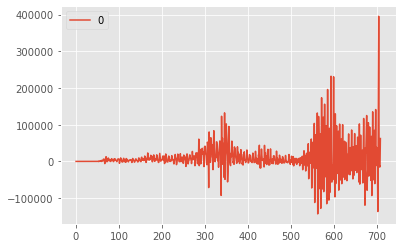

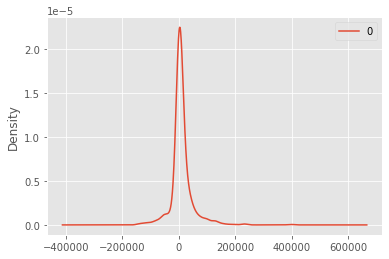

                   0
count     710.000000
mean     9457.464798
std     39620.406566
min   -143110.539667
25%     -1273.245393
50%      3808.085560
75%     14912.951838
max    395642.907946


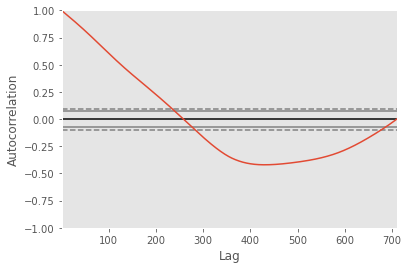

In [28]:
#Análise dos dados com ARIMA
country = ['Brasil', 'Índia', 'Itália', 'EUA'] #Lista de países
for i in range(len(country)):
    if country[i] == 'Brasil':
        series = read_csv('datasets/countries/casos_covid19_brazil.csv', usecols=[1], engine='python')
    if country[i] == 'Índia':
        series = read_csv('datasets/countries/casos_covid19_india.csv', usecols=[1], engine='python')
    if country[i] == 'Itália':
        series = read_csv('datasets/countries/casos_covid19_italy.csv', usecols=[1], engine='python')
    if country[i] == 'EUA':
        series = read_csv('datasets/countries/casos_covid19_us.csv', usecols=[1], engine='python')
    model = ARIMA(series, order=(p[country[i]],d[country[i]],q[country[i]]))
    model_fit = model.fit()
    model_fit = model.fit()
    output = model_fit.forecast()
    # summary of fit model
    print(model_fit.summary())
    # line plot of residuals
    residuals = pandas.DataFrame(model_fit.resid)
    residuals.plot()
    plt.show()
    # density plot of residuals
    residuals.plot(kind='kde')
    plt.show()
    # summary stats of residuals
    print(residuals.describe())
    autocorrelation_plot(series)
    plt.show()